# Task 1A: Build a Fully Connected 2 - Layer Neural Network to Classify Digits

This notebook will serve as implementation of the API that you have created in your "Code" folder. You will write functions in the "py" files and use them here.

We will be using inbuilt MNIST dataset present in PyTorch and train a neural network to classify digits. 

## What is expected from this notebook?

This notebook should be used to present your work. You should explain wherever necessary (but also not too much) about what you did and why you did it. You should explain things like hyper parameter settings (even if it was provided before hand to you by us), training performance and testing performance of the model. You should reason why your model is working fine and not overfitting.

Since numbers don't are an argot, you should also use visualizations wherever possible. You can visualize things like loss curve, show confusion matrix, etc. 

Finally, you can show some manual verifications by displaying and making predictions on random test examples. 

**NOTE: The amount of things you can do in this notebook is limitless (hyperbole). But don't do too much at the cost of rest of your tasks. Remember to maintain the outputs while submitting this notebook.**

## Absolutely required items?

1. First of all, import the libraries and the dataset.
2. Next, show dataset samples and distribution of different type of data. For example, in case of MNIST you can show some random images and their labels. Also, show distribution of each class of images.
3. Next, perform required transformations on MNIST dataset (normalization, scaling, grayscaling if required, etc) using torchvision transforms.
4. Create required dataloaders on PyTorch MNIST dataset to load data in mini-batches.
5. Train the model, show loss and accuracy at each step of operation.
6. Plot the **loss curve for both train and validation phase**
7. Pick some manual random images from test dataset and predict their values **showing expected and actual result**.

**NOTE: You may or may not delete these instruction cells after completion of the notebook.**

# Your solution

Text(0.5,1.55,'Some random dataset examples with label')

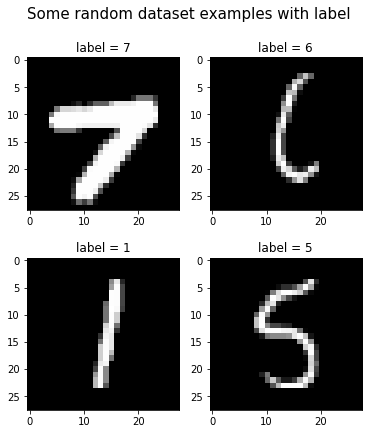

In [2]:
from nnet import model
import torch
import torchvision
from torchvision import datasets as dset
from torchvision import transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import os, csv
import pandas as pd

#we are compsing 2 transforms, one converts it to tensors and the other normalizes the image using specified mean 
#and standard deviation of the mnist database
trans = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])

train_set = dset.MNIST(root="./", train=True, transform=trans, download=True)
test_set = dset.MNIST(root="./", train=False, transform=trans, download=True)

batch_size = 4

#Creating a dataloader for batchwise iteration over data
train_loader = torch.utils.data.DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_set, batch_size=batch_size, shuffle=False)

#plotting 1 batch of random samples
fig = plt.figure()

for sample in torch.utils.data.BatchSampler(torch.utils.data.RandomSampler(train_set), batch_size= batch_size, drop_last=False):
    for axes,index in enumerate(sample):
        img, label = train_set[index]
        #axes+221 gives position in 2x2 grid
        ax = fig.add_subplot(axes+221)
        ax.set_title("label = " + str(label.item()))
        ax.imshow(np.squeeze(img.numpy()), cmap='gray')
    break

fig.subplots_adjust(top=1.4)
fig.suptitle("Some random dataset examples with label", x=0.5, y=1.55, verticalalignment='top', fontsize=15)


<BarContainer object of 10 artists>

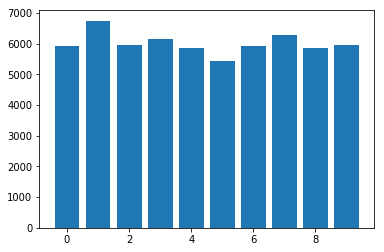

In [3]:
total_samples =[0 for i in range(10)]
for index in torch.utils.data.SequentialSampler(train_set):
    total_samples[(train_set[index])[1]] +=1 

class_distribution = [(class_samples/sum(total_samples))*len(train_set) for class_samples in total_samples]
total_samples = []

plt.bar([i for i in range(10)], class_distribution)

In [4]:
#defining the neural net
N_in = 28 * 28 # Input size
N_h1 = 256 # Hidden Layer 1 size
N_h2 = 256 # Hidden Layer 2 size
N_out = 10 # Output size
# Learning rate
lr = 0.001

device = "cuda:0" if torch.cuda.is_available() else "cpu"

# init model, 'net' is out model's object
net = model.FullyConnected(N_in, N_h1, N_h2, N_out, device=device)

#number if epochs to go through
N_epoch = 4
#list to store loss of every iteration
train_loss_accuracy = []
eval_loss_accuracy = []

for epoch in range(N_epoch):
    
    for batch_no, (images, labels) in enumerate(train_loader):
        #calling net.train for every batch, reshaping input from 2d image to 1d neurons
        print("training epoch no: %d batch no: %d" % (epoch, batch_no))
        loss, accuracy, outputs = net.train(torch.reshape(images, (batch_size, N_in)), labels, lr, debug=True)
        #store loss and accuracy for mapping
        train_loss_accuracy.append((loss, accuracy))
    #shuffling data at the end of each training epoch
    train_loader = torch.utils.data.DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)
    
    #evaluation epoch
    for batch_no, (images, labels) in enumerate(train_loader):
        #calling net.eval for every batch, reshaping input from 2d image to 1d neurons
        print("evaluation epoch no: %d batch no: %d" % (epoch, batch_no))
        loss, accuracy, outputs = net.eval(torch.reshape(images, (batch_size, N_in)), labels, debug=True)
        eval_loss_accuracy.append((loss, accuracy))
    #shuffling data at the end of each evaluation epoch
    train_loader = torch.utils.data.DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)

training epoch no: 0 batch no: 0
loss:  2.808983325958252
accuracy:  0.25
training epoch no: 0 batch no: 1
loss:  1.9001251459121704
accuracy:  0.5
training epoch no: 0 batch no: 2
loss:  4.131424903869629
accuracy:  0.0
training epoch no: 0 batch no: 3
loss:  2.892963409423828
accuracy:  0.0
training epoch no: 0 batch no: 4
loss:  4.038750648498535
accuracy:  0.0
training epoch no: 0 batch no: 5
loss:  3.677842378616333
accuracy:  0.0
training epoch no: 0 batch no: 6
loss:  4.147677421569824
accuracy:  0.0
training epoch no: 0 batch no: 7
loss:  3.7158055305480957
accuracy:  0.0
training epoch no: 0 batch no: 8
loss:  3.172980546951294
accuracy:  0.0
training epoch no: 0 batch no: 9
loss:  2.9902570247650146
accuracy:  0.0
training epoch no: 0 batch no: 10
loss:  3.292778491973877
accuracy:  0.0
training epoch no: 0 batch no: 11
loss:  2.1204423904418945
accuracy:  0.25
training epoch no: 0 batch no: 12
loss:  3.49631667137146
accuracy:  0.0
training epoch no: 0 batch no: 13
loss:  2.

training epoch no: 0 batch no: 111
loss:  2.340475082397461
accuracy:  0.5
training epoch no: 0 batch no: 112
loss:  2.2874741554260254
accuracy:  0.0
training epoch no: 0 batch no: 113
loss:  3.019331216812134
accuracy:  0.0
training epoch no: 0 batch no: 114
loss:  2.3791065216064453
accuracy:  0.0
training epoch no: 0 batch no: 115
loss:  2.5408854484558105
accuracy:  0.0
training epoch no: 0 batch no: 116
loss:  3.059926986694336
accuracy:  0.0
training epoch no: 0 batch no: 117
loss:  2.063422679901123
accuracy:  0.25
training epoch no: 0 batch no: 118
loss:  2.134291410446167
accuracy:  0.0
training epoch no: 0 batch no: 119
loss:  2.2815213203430176
accuracy:  0.25
training epoch no: 0 batch no: 120
loss:  2.552842378616333
accuracy:  0.0
training epoch no: 0 batch no: 121
loss:  2.243751287460327
accuracy:  0.25
training epoch no: 0 batch no: 122
loss:  2.552743911743164
accuracy:  0.0
training epoch no: 0 batch no: 123
loss:  2.7222023010253906
accuracy:  0.0
training epoch no

training epoch no: 0 batch no: 221
loss:  2.1942265033721924
accuracy:  0.25
training epoch no: 0 batch no: 222
loss:  2.233645439147949
accuracy:  0.0
training epoch no: 0 batch no: 223
loss:  2.2545368671417236
accuracy:  0.25
training epoch no: 0 batch no: 224
loss:  2.2210750579833984
accuracy:  0.25
training epoch no: 0 batch no: 225
loss:  2.5094027519226074
accuracy:  0.0
training epoch no: 0 batch no: 226
loss:  2.2113819122314453
accuracy:  0.25
training epoch no: 0 batch no: 227
loss:  2.1182360649108887
accuracy:  0.25
training epoch no: 0 batch no: 228
loss:  2.1513373851776123
accuracy:  0.0
training epoch no: 0 batch no: 229
loss:  2.29746150970459
accuracy:  0.0
training epoch no: 0 batch no: 230
loss:  2.2333154678344727
accuracy:  0.25
training epoch no: 0 batch no: 231
loss:  2.269134521484375
accuracy:  0.25
training epoch no: 0 batch no: 232
loss:  2.3249855041503906
accuracy:  0.0
training epoch no: 0 batch no: 233
loss:  2.3642029762268066
accuracy:  0.0
training 

training epoch no: 0 batch no: 333
loss:  2.2078933715820312
accuracy:  0.0
training epoch no: 0 batch no: 334
loss:  2.2772152423858643
accuracy:  0.25
training epoch no: 0 batch no: 335
loss:  2.139003276824951
accuracy:  0.25
training epoch no: 0 batch no: 336
loss:  2.1973886489868164
accuracy:  0.0
training epoch no: 0 batch no: 337
loss:  2.330457925796509
accuracy:  0.0
training epoch no: 0 batch no: 338
loss:  2.295274257659912
accuracy:  0.25
training epoch no: 0 batch no: 339
loss:  2.4661824703216553
accuracy:  0.0
training epoch no: 0 batch no: 340
loss:  2.308894157409668
accuracy:  0.0
training epoch no: 0 batch no: 341
loss:  2.1860780715942383
accuracy:  0.25
training epoch no: 0 batch no: 342
loss:  2.099069118499756
accuracy:  0.75
training epoch no: 0 batch no: 343
loss:  2.2732295989990234
accuracy:  0.5
training epoch no: 0 batch no: 344
loss:  2.489912509918213
accuracy:  0.0
training epoch no: 0 batch no: 345
loss:  2.1561388969421387
accuracy:  0.25
training epo

loss:  2.1108036041259766
accuracy:  0.5
training epoch no: 0 batch no: 443
loss:  2.27181339263916
accuracy:  0.0
training epoch no: 0 batch no: 444
loss:  2.2220306396484375
accuracy:  0.25
training epoch no: 0 batch no: 445
loss:  2.3924083709716797
accuracy:  0.0
training epoch no: 0 batch no: 446
loss:  2.2787396907806396
accuracy:  0.25
training epoch no: 0 batch no: 447
loss:  2.1678693294525146
accuracy:  0.25
training epoch no: 0 batch no: 448
loss:  2.249960422515869
accuracy:  0.0
training epoch no: 0 batch no: 449
loss:  2.212242364883423
accuracy:  0.25
training epoch no: 0 batch no: 450
loss:  2.1640923023223877
accuracy:  0.25
training epoch no: 0 batch no: 451
loss:  2.1933844089508057
accuracy:  0.0
training epoch no: 0 batch no: 452
loss:  2.1737380027770996
accuracy:  0.5
training epoch no: 0 batch no: 453
loss:  2.264922618865967
accuracy:  0.0
training epoch no: 0 batch no: 454
loss:  2.116471767425537
accuracy:  0.25
training epoch no: 0 batch no: 455
loss:  2.333

training epoch no: 0 batch no: 553
loss:  2.215095281600952
accuracy:  0.25
training epoch no: 0 batch no: 554
loss:  2.240946054458618
accuracy:  0.25
training epoch no: 0 batch no: 555
loss:  2.2014503479003906
accuracy:  0.5
training epoch no: 0 batch no: 556
loss:  2.0711140632629395
accuracy:  0.5
training epoch no: 0 batch no: 557
loss:  2.257826328277588
accuracy:  0.0
training epoch no: 0 batch no: 558
loss:  2.2274296283721924
accuracy:  0.0
training epoch no: 0 batch no: 559
loss:  2.1602821350097656
accuracy:  0.25
training epoch no: 0 batch no: 560
loss:  2.0954830646514893
accuracy:  0.5
training epoch no: 0 batch no: 561
loss:  2.272596597671509
accuracy:  0.0
training epoch no: 0 batch no: 562
loss:  2.21585750579834
accuracy:  0.0
training epoch no: 0 batch no: 563
loss:  2.3922483921051025
accuracy:  0.25
training epoch no: 0 batch no: 564
loss:  2.210172653198242
accuracy:  0.25
training epoch no: 0 batch no: 565
loss:  2.1443135738372803
accuracy:  0.5
training epoch

training epoch no: 0 batch no: 665
loss:  2.2333340644836426
accuracy:  0.0
training epoch no: 0 batch no: 666
loss:  2.10152006149292
accuracy:  0.75
training epoch no: 0 batch no: 667
loss:  2.0833065509796143
accuracy:  0.75
training epoch no: 0 batch no: 668
loss:  2.258165121078491
accuracy:  0.5
training epoch no: 0 batch no: 669
loss:  2.1127355098724365
accuracy:  0.5
training epoch no: 0 batch no: 670
loss:  2.200252056121826
accuracy:  0.5
training epoch no: 0 batch no: 671
loss:  2.1430020332336426
accuracy:  0.25
training epoch no: 0 batch no: 672
loss:  2.2045960426330566
accuracy:  0.5
training epoch no: 0 batch no: 673
loss:  2.186702013015747
accuracy:  0.25
training epoch no: 0 batch no: 674
loss:  2.264191150665283
accuracy:  0.0
training epoch no: 0 batch no: 675
loss:  2.2317216396331787
accuracy:  0.25
training epoch no: 0 batch no: 676
loss:  2.171201467514038
accuracy:  0.5
training epoch no: 0 batch no: 677
loss:  2.2603869438171387
accuracy:  0.25
training epoc

loss:  2.108593702316284
accuracy:  0.5
training epoch no: 0 batch no: 776
loss:  2.233722448348999
accuracy:  0.25
training epoch no: 0 batch no: 777
loss:  2.1430039405822754
accuracy:  0.5
training epoch no: 0 batch no: 778
loss:  2.226127862930298
accuracy:  0.25
training epoch no: 0 batch no: 779
loss:  2.0008885860443115
accuracy:  0.75
training epoch no: 0 batch no: 780
loss:  1.9630136489868164
accuracy:  1.0
training epoch no: 0 batch no: 781
loss:  2.2413721084594727
accuracy:  0.25
training epoch no: 0 batch no: 782
loss:  2.0679423809051514
accuracy:  0.5
training epoch no: 0 batch no: 783
loss:  2.142080783843994
accuracy:  0.25
training epoch no: 0 batch no: 784
loss:  2.210951089859009
accuracy:  0.25
training epoch no: 0 batch no: 785
loss:  2.1462104320526123
accuracy:  0.5
training epoch no: 0 batch no: 786
loss:  2.256162643432617
accuracy:  0.5
training epoch no: 0 batch no: 787
loss:  2.1326727867126465
accuracy:  0.5
training epoch no: 0 batch no: 788
loss:  2.330

training epoch no: 0 batch no: 884
loss:  2.124628782272339
accuracy:  0.0
training epoch no: 0 batch no: 885
loss:  2.14792537689209
accuracy:  0.5
training epoch no: 0 batch no: 886
loss:  2.121875047683716
accuracy:  0.25
training epoch no: 0 batch no: 887
loss:  2.1901607513427734
accuracy:  0.25
training epoch no: 0 batch no: 888
loss:  2.1549947261810303
accuracy:  0.5
training epoch no: 0 batch no: 889
loss:  2.1457412242889404
accuracy:  0.25
training epoch no: 0 batch no: 890
loss:  2.3280210494995117
accuracy:  0.0
training epoch no: 0 batch no: 891
loss:  2.070716142654419
accuracy:  0.75
training epoch no: 0 batch no: 892
loss:  2.0973081588745117
accuracy:  0.5
training epoch no: 0 batch no: 893
loss:  2.1887567043304443
accuracy:  0.25
training epoch no: 0 batch no: 894
loss:  2.1577346324920654
accuracy:  0.5
training epoch no: 0 batch no: 895
loss:  2.1115822792053223
accuracy:  0.5
training epoch no: 0 batch no: 896
loss:  2.088651418685913
accuracy:  0.5
training epoc

loss:  2.084472417831421
accuracy:  0.5
training epoch no: 0 batch no: 996
loss:  2.0784826278686523
accuracy:  0.5
training epoch no: 0 batch no: 997
loss:  2.333625316619873
accuracy:  0.0
training epoch no: 0 batch no: 998
loss:  2.1165218353271484
accuracy:  0.5
training epoch no: 0 batch no: 999
loss:  2.2311818599700928
accuracy:  0.25
training epoch no: 0 batch no: 1000
loss:  2.1516025066375732
accuracy:  0.5
training epoch no: 0 batch no: 1001
loss:  2.0342655181884766
accuracy:  0.5
training epoch no: 0 batch no: 1002
loss:  2.206435441970825
accuracy:  0.0
training epoch no: 0 batch no: 1003
loss:  2.1302525997161865
accuracy:  0.5
training epoch no: 0 batch no: 1004
loss:  2.0773720741271973
accuracy:  0.5
training epoch no: 0 batch no: 1005
loss:  2.215895414352417
accuracy:  0.25
training epoch no: 0 batch no: 1006
loss:  2.3545315265655518
accuracy:  0.0
training epoch no: 0 batch no: 1007
loss:  2.098620891571045
accuracy:  0.75
training epoch no: 0 batch no: 1008
loss:

training epoch no: 0 batch no: 1104
loss:  2.197949171066284
accuracy:  0.25
training epoch no: 0 batch no: 1105
loss:  2.0980911254882812
accuracy:  0.5
training epoch no: 0 batch no: 1106
loss:  2.371081829071045
accuracy:  0.0
training epoch no: 0 batch no: 1107
loss:  2.1919097900390625
accuracy:  0.5
training epoch no: 0 batch no: 1108
loss:  2.013993740081787
accuracy:  0.75
training epoch no: 0 batch no: 1109
loss:  2.192080497741699
accuracy:  0.25
training epoch no: 0 batch no: 1110
loss:  2.1818809509277344
accuracy:  0.5
training epoch no: 0 batch no: 1111
loss:  2.0261874198913574
accuracy:  0.75
training epoch no: 0 batch no: 1112
loss:  2.0669732093811035
accuracy:  0.5
training epoch no: 0 batch no: 1113
loss:  2.1108081340789795
accuracy:  0.5
training epoch no: 0 batch no: 1114
loss:  2.1002979278564453
accuracy:  0.5
training epoch no: 0 batch no: 1115
loss:  2.174823522567749
accuracy:  0.5
training epoch no: 0 batch no: 1116
loss:  2.001242160797119
accuracy:  0.5
t

loss:  1.9513016939163208
accuracy:  0.75
training epoch no: 0 batch no: 1216
loss:  1.9901118278503418
accuracy:  0.5
training epoch no: 0 batch no: 1217
loss:  2.1097395420074463
accuracy:  0.5
training epoch no: 0 batch no: 1218
loss:  1.9971369504928589
accuracy:  1.0
training epoch no: 0 batch no: 1219
loss:  2.1365766525268555
accuracy:  0.5
training epoch no: 0 batch no: 1220
loss:  2.2499701976776123
accuracy:  0.25
training epoch no: 0 batch no: 1221
loss:  2.0779144763946533
accuracy:  0.5
training epoch no: 0 batch no: 1222
loss:  2.1528944969177246
accuracy:  0.25
training epoch no: 0 batch no: 1223
loss:  2.012753486633301
accuracy:  1.0
training epoch no: 0 batch no: 1224
loss:  2.364539384841919
accuracy:  0.25
training epoch no: 0 batch no: 1225
loss:  2.1181488037109375
accuracy:  0.5
training epoch no: 0 batch no: 1226
loss:  2.0372486114501953
accuracy:  0.75
training epoch no: 0 batch no: 1227
loss:  2.099412441253662
accuracy:  0.5
training epoch no: 0 batch no: 12

training epoch no: 0 batch no: 1326
loss:  2.068889617919922
accuracy:  0.5
training epoch no: 0 batch no: 1327
loss:  2.080282688140869
accuracy:  0.5
training epoch no: 0 batch no: 1328
loss:  2.2070021629333496
accuracy:  0.25
training epoch no: 0 batch no: 1329
loss:  2.012640953063965
accuracy:  1.0
training epoch no: 0 batch no: 1330
loss:  2.0951220989227295
accuracy:  0.5
training epoch no: 0 batch no: 1331
loss:  2.0599870681762695
accuracy:  0.25
training epoch no: 0 batch no: 1332
loss:  2.166285276412964
accuracy:  0.25
training epoch no: 0 batch no: 1333
loss:  2.167757511138916
accuracy:  0.5
training epoch no: 0 batch no: 1334
loss:  2.026571273803711
accuracy:  0.75
training epoch no: 0 batch no: 1335
loss:  2.0326359272003174
accuracy:  0.5
training epoch no: 0 batch no: 1336
loss:  2.162619113922119
accuracy:  0.25
training epoch no: 0 batch no: 1337
loss:  2.1257736682891846
accuracy:  0.75
training epoch no: 0 batch no: 1338
loss:  2.253030300140381
accuracy:  0.25


training epoch no: 0 batch no: 1438
loss:  2.1876730918884277
accuracy:  0.25
training epoch no: 0 batch no: 1439
loss:  1.868564486503601
accuracy:  1.0
training epoch no: 0 batch no: 1440
loss:  2.113593816757202
accuracy:  0.25
training epoch no: 0 batch no: 1441
loss:  2.203211784362793
accuracy:  0.25
training epoch no: 0 batch no: 1442
loss:  2.237391471862793
accuracy:  0.5
training epoch no: 0 batch no: 1443
loss:  2.0594418048858643
accuracy:  0.75
training epoch no: 0 batch no: 1444
loss:  1.959656834602356
accuracy:  0.75
training epoch no: 0 batch no: 1445
loss:  2.062009811401367
accuracy:  0.5
training epoch no: 0 batch no: 1446
loss:  2.191258430480957
accuracy:  0.25
training epoch no: 0 batch no: 1447
loss:  1.9835532903671265
accuracy:  0.5
training epoch no: 0 batch no: 1448
loss:  2.0781373977661133
accuracy:  0.25
training epoch no: 0 batch no: 1449
loss:  2.138209581375122
accuracy:  0.25
training epoch no: 0 batch no: 1450
loss:  2.169557809829712
accuracy:  0.0


loss:  2.0281803607940674
accuracy:  0.25
training epoch no: 0 batch no: 1549
loss:  2.1517856121063232
accuracy:  0.0
training epoch no: 0 batch no: 1550
loss:  2.0506277084350586
accuracy:  0.25
training epoch no: 0 batch no: 1551
loss:  1.972325325012207
accuracy:  0.75
training epoch no: 0 batch no: 1552
loss:  2.0595505237579346
accuracy:  0.25
training epoch no: 0 batch no: 1553
loss:  2.128270387649536
accuracy:  0.25
training epoch no: 0 batch no: 1554
loss:  1.9866987466812134
accuracy:  0.5
training epoch no: 0 batch no: 1555
loss:  2.0614187717437744
accuracy:  0.25
training epoch no: 0 batch no: 1556
loss:  1.9791390895843506
accuracy:  0.5
training epoch no: 0 batch no: 1557
loss:  2.065448045730591
accuracy:  0.25
training epoch no: 0 batch no: 1558
loss:  2.20121169090271
accuracy:  0.0
training epoch no: 0 batch no: 1559
loss:  1.8166611194610596
accuracy:  0.75
training epoch no: 0 batch no: 1560
loss:  2.2366180419921875
accuracy:  0.25
training epoch no: 0 batch no: 

training epoch no: 0 batch no: 1658
loss:  1.9651131629943848
accuracy:  0.75
training epoch no: 0 batch no: 1659
loss:  1.970261573791504
accuracy:  0.25
training epoch no: 0 batch no: 1660
loss:  2.170311450958252
accuracy:  0.0
training epoch no: 0 batch no: 1661
loss:  2.128386974334717
accuracy:  0.5
training epoch no: 0 batch no: 1662
loss:  2.0942282676696777
accuracy:  0.5
training epoch no: 0 batch no: 1663
loss:  2.146151304244995
accuracy:  0.25
training epoch no: 0 batch no: 1664
loss:  2.1033008098602295
accuracy:  0.5
training epoch no: 0 batch no: 1665
loss:  1.989861249923706
accuracy:  0.75
training epoch no: 0 batch no: 1666
loss:  2.1384117603302
accuracy:  0.25
training epoch no: 0 batch no: 1667
loss:  2.030745029449463
accuracy:  0.5
training epoch no: 0 batch no: 1668
loss:  1.9251196384429932
accuracy:  1.0
training epoch no: 0 batch no: 1669
loss:  2.1809542179107666
accuracy:  0.25
training epoch no: 0 batch no: 1670
loss:  1.995436668395996
accuracy:  0.75
tr

training epoch no: 0 batch no: 1769
loss:  1.9169487953186035
accuracy:  1.0
training epoch no: 0 batch no: 1770
loss:  1.8646811246871948
accuracy:  0.75
training epoch no: 0 batch no: 1771
loss:  1.9944243431091309
accuracy:  0.5
training epoch no: 0 batch no: 1772
loss:  2.022508144378662
accuracy:  1.0
training epoch no: 0 batch no: 1773
loss:  2.186774253845215
accuracy:  0.5
training epoch no: 0 batch no: 1774
loss:  1.989376425743103
accuracy:  0.25
training epoch no: 0 batch no: 1775
loss:  2.174428939819336
accuracy:  0.5
training epoch no: 0 batch no: 1776
loss:  1.9336340427398682
accuracy:  0.75
training epoch no: 0 batch no: 1777
loss:  2.183147430419922
accuracy:  0.25
training epoch no: 0 batch no: 1778
loss:  1.9718598127365112
accuracy:  0.25
training epoch no: 0 batch no: 1779
loss:  1.8755210638046265
accuracy:  0.75
training epoch no: 0 batch no: 1780
loss:  1.933211088180542
accuracy:  0.75
training epoch no: 0 batch no: 1781
loss:  2.0879478454589844
accuracy:  0.

training epoch no: 0 batch no: 1881
loss:  1.986114501953125
accuracy:  0.5
training epoch no: 0 batch no: 1882
loss:  2.1159756183624268
accuracy:  0.75
training epoch no: 0 batch no: 1883
loss:  2.0771610736846924
accuracy:  0.75
training epoch no: 0 batch no: 1884
loss:  1.961222529411316
accuracy:  0.75
training epoch no: 0 batch no: 1885
loss:  2.180819034576416
accuracy:  0.25
training epoch no: 0 batch no: 1886
loss:  2.1641764640808105
accuracy:  0.5
training epoch no: 0 batch no: 1887
loss:  2.0007822513580322
accuracy:  1.0
training epoch no: 0 batch no: 1888
loss:  2.0465145111083984
accuracy:  0.75
training epoch no: 0 batch no: 1889
loss:  1.898561716079712
accuracy:  0.75
training epoch no: 0 batch no: 1890
loss:  1.9712103605270386
accuracy:  0.5
training epoch no: 0 batch no: 1891
loss:  2.0075929164886475
accuracy:  0.5
training epoch no: 0 batch no: 1892
loss:  2.008249282836914
accuracy:  0.75
training epoch no: 0 batch no: 1893
loss:  1.9611175060272217
accuracy:  0

training epoch no: 0 batch no: 1991
loss:  2.05222749710083
accuracy:  0.5
training epoch no: 0 batch no: 1992
loss:  1.8006751537322998
accuracy:  0.75
training epoch no: 0 batch no: 1993
loss:  2.065808057785034
accuracy:  0.25
training epoch no: 0 batch no: 1994
loss:  2.080396890640259
accuracy:  0.5
training epoch no: 0 batch no: 1995
loss:  1.8942530155181885
accuracy:  0.75
training epoch no: 0 batch no: 1996
loss:  2.016453742980957
accuracy:  0.75
training epoch no: 0 batch no: 1997
loss:  2.038914203643799
accuracy:  0.5
training epoch no: 0 batch no: 1998
loss:  1.8699766397476196
accuracy:  0.75
training epoch no: 0 batch no: 1999
loss:  2.0897412300109863
accuracy:  0.5
training epoch no: 0 batch no: 2000
loss:  1.8684005737304688
accuracy:  1.0
training epoch no: 0 batch no: 2001
loss:  1.9795235395431519
accuracy:  0.75
training epoch no: 0 batch no: 2002
loss:  2.208625555038452
accuracy:  0.25
training epoch no: 0 batch no: 2003
loss:  1.799209475517273
accuracy:  1.0


loss:  1.9979519844055176
accuracy:  0.5
training epoch no: 0 batch no: 2101
loss:  1.9943501949310303
accuracy:  0.5
training epoch no: 0 batch no: 2102
loss:  1.8995726108551025
accuracy:  0.75
training epoch no: 0 batch no: 2103
loss:  1.9134207963943481
accuracy:  0.75
training epoch no: 0 batch no: 2104
loss:  1.970069408416748
accuracy:  0.75
training epoch no: 0 batch no: 2105
loss:  2.252382278442383
accuracy:  0.25
training epoch no: 0 batch no: 2106
loss:  1.8537517786026
accuracy:  0.5
training epoch no: 0 batch no: 2107
loss:  1.9738067388534546
accuracy:  0.5
training epoch no: 0 batch no: 2108
loss:  1.835538625717163
accuracy:  1.0
training epoch no: 0 batch no: 2109
loss:  1.902492880821228
accuracy:  0.75
training epoch no: 0 batch no: 2110
loss:  1.9653555154800415
accuracy:  0.75
training epoch no: 0 batch no: 2111
loss:  1.7179322242736816
accuracy:  0.75
training epoch no: 0 batch no: 2112
loss:  1.9276634454727173
accuracy:  0.75
training epoch no: 0 batch no: 211

training epoch no: 0 batch no: 2210
loss:  1.952467441558838
accuracy:  0.75
training epoch no: 0 batch no: 2211
loss:  1.9703093767166138
accuracy:  0.75
training epoch no: 0 batch no: 2212
loss:  2.173286199569702
accuracy:  0.25
training epoch no: 0 batch no: 2213
loss:  2.0292844772338867
accuracy:  0.5
training epoch no: 0 batch no: 2214
loss:  2.0515244007110596
accuracy:  0.5
training epoch no: 0 batch no: 2215
loss:  1.9943114519119263
accuracy:  0.5
training epoch no: 0 batch no: 2216
loss:  1.8888334035873413
accuracy:  1.0
training epoch no: 0 batch no: 2217
loss:  1.9018974304199219
accuracy:  1.0
training epoch no: 0 batch no: 2218
loss:  2.09677791595459
accuracy:  0.5
training epoch no: 0 batch no: 2219
loss:  1.9115381240844727
accuracy:  1.0
training epoch no: 0 batch no: 2220
loss:  1.9076727628707886
accuracy:  0.75
training epoch no: 0 batch no: 2221
loss:  1.9063618183135986
accuracy:  0.75
training epoch no: 0 batch no: 2222
loss:  1.9755492210388184
accuracy:  0.

training epoch no: 0 batch no: 2316
loss:  2.0726096630096436
accuracy:  0.5
training epoch no: 0 batch no: 2317
loss:  1.880000114440918
accuracy:  1.0
training epoch no: 0 batch no: 2318
loss:  1.7903554439544678
accuracy:  1.0
training epoch no: 0 batch no: 2319
loss:  2.042675495147705
accuracy:  0.5
training epoch no: 0 batch no: 2320
loss:  1.8690303564071655
accuracy:  0.75
training epoch no: 0 batch no: 2321
loss:  1.9316918849945068
accuracy:  0.75
training epoch no: 0 batch no: 2322
loss:  2.0251059532165527
accuracy:  0.5
training epoch no: 0 batch no: 2323
loss:  1.9614617824554443
accuracy:  0.5
training epoch no: 0 batch no: 2324
loss:  2.1778640747070312
accuracy:  0.25
training epoch no: 0 batch no: 2325
loss:  2.0941197872161865
accuracy:  0.5
training epoch no: 0 batch no: 2326
loss:  1.9151265621185303
accuracy:  0.75
training epoch no: 0 batch no: 2327
loss:  1.7818987369537354
accuracy:  1.0
training epoch no: 0 batch no: 2328
loss:  1.770516037940979
accuracy:  0.

accuracy:  0.5
training epoch no: 0 batch no: 2427
loss:  1.721628189086914
accuracy:  1.0
training epoch no: 0 batch no: 2428
loss:  2.0862784385681152
accuracy:  0.5
training epoch no: 0 batch no: 2429
loss:  1.8302034139633179
accuracy:  1.0
training epoch no: 0 batch no: 2430
loss:  1.935253381729126
accuracy:  0.5
training epoch no: 0 batch no: 2431
loss:  2.09965181350708
accuracy:  0.5
training epoch no: 0 batch no: 2432
loss:  1.7148120403289795
accuracy:  1.0
training epoch no: 0 batch no: 2433
loss:  1.9504598379135132
accuracy:  1.0
training epoch no: 0 batch no: 2434
loss:  2.2512083053588867
accuracy:  0.0
training epoch no: 0 batch no: 2435
loss:  1.9027913808822632
accuracy:  0.5
training epoch no: 0 batch no: 2436
loss:  1.6572606563568115
accuracy:  1.0
training epoch no: 0 batch no: 2437
loss:  1.7203783988952637
accuracy:  0.75
training epoch no: 0 batch no: 2438
loss:  2.1447651386260986
accuracy:  0.25
training epoch no: 0 batch no: 2439
loss:  1.8596988916397095
a

training epoch no: 0 batch no: 2536
loss:  1.7817751169204712
accuracy:  0.75
training epoch no: 0 batch no: 2537
loss:  1.5778472423553467
accuracy:  1.0
training epoch no: 0 batch no: 2538
loss:  1.8593902587890625
accuracy:  0.5
training epoch no: 0 batch no: 2539
loss:  2.1022045612335205
accuracy:  0.25
training epoch no: 0 batch no: 2540
loss:  1.7433775663375854
accuracy:  1.0
training epoch no: 0 batch no: 2541
loss:  1.8973761796951294
accuracy:  0.5
training epoch no: 0 batch no: 2542
loss:  2.0471396446228027
accuracy:  0.25
training epoch no: 0 batch no: 2543
loss:  1.7433158159255981
accuracy:  0.5
training epoch no: 0 batch no: 2544
loss:  1.5933845043182373
accuracy:  0.5
training epoch no: 0 batch no: 2545
loss:  2.0814380645751953
accuracy:  0.5
training epoch no: 0 batch no: 2546
loss:  2.130577325820923
accuracy:  0.0
training epoch no: 0 batch no: 2547
loss:  1.9799453020095825
accuracy:  0.5
training epoch no: 0 batch no: 2548
loss:  1.8455421924591064
accuracy:  0

training epoch no: 0 batch no: 2644
loss:  2.2228589057922363
accuracy:  0.25
training epoch no: 0 batch no: 2645
loss:  1.7122809886932373
accuracy:  1.0
training epoch no: 0 batch no: 2646
loss:  2.1000185012817383
accuracy:  0.25
training epoch no: 0 batch no: 2647
loss:  2.0472793579101562
accuracy:  0.5
training epoch no: 0 batch no: 2648
loss:  1.949343204498291
accuracy:  0.5
training epoch no: 0 batch no: 2649
loss:  1.936362862586975
accuracy:  1.0
training epoch no: 0 batch no: 2650
loss:  1.929042100906372
accuracy:  0.75
training epoch no: 0 batch no: 2651
loss:  1.9485331773757935
accuracy:  0.5
training epoch no: 0 batch no: 2652
loss:  1.87419593334198
accuracy:  0.75
training epoch no: 0 batch no: 2653
loss:  1.8268496990203857
accuracy:  0.75
training epoch no: 0 batch no: 2654
loss:  2.0770645141601562
accuracy:  0.25
training epoch no: 0 batch no: 2655
loss:  1.6375463008880615
accuracy:  1.0
training epoch no: 0 batch no: 2656
loss:  1.8636338710784912
accuracy:  0.

training epoch no: 0 batch no: 2756
loss:  2.0426337718963623
accuracy:  0.5
training epoch no: 0 batch no: 2757
loss:  2.005117177963257
accuracy:  0.5
training epoch no: 0 batch no: 2758
loss:  1.9737383127212524
accuracy:  0.5
training epoch no: 0 batch no: 2759
loss:  2.0616097450256348
accuracy:  0.5
training epoch no: 0 batch no: 2760
loss:  1.8333064317703247
accuracy:  1.0
training epoch no: 0 batch no: 2761
loss:  2.090153932571411
accuracy:  0.25
training epoch no: 0 batch no: 2762
loss:  1.8063052892684937
accuracy:  0.75
training epoch no: 0 batch no: 2763
loss:  1.7162359952926636
accuracy:  0.75
training epoch no: 0 batch no: 2764
loss:  1.9369392395019531
accuracy:  0.25
training epoch no: 0 batch no: 2765
loss:  1.972691297531128
accuracy:  0.5
training epoch no: 0 batch no: 2766
loss:  1.967867374420166
accuracy:  0.5
training epoch no: 0 batch no: 2767
loss:  1.8976144790649414
accuracy:  0.5
training epoch no: 0 batch no: 2768
loss:  1.617163062095642
accuracy:  0.75

loss:  1.8435500860214233
accuracy:  0.5
training epoch no: 0 batch no: 2865
loss:  1.7924225330352783
accuracy:  0.5
training epoch no: 0 batch no: 2866
loss:  1.7263243198394775
accuracy:  0.75
training epoch no: 0 batch no: 2867
loss:  1.8828411102294922
accuracy:  0.5
training epoch no: 0 batch no: 2868
loss:  1.8566317558288574
accuracy:  0.5
training epoch no: 0 batch no: 2869
loss:  2.0160677433013916
accuracy:  0.5
training epoch no: 0 batch no: 2870
loss:  2.276172399520874
accuracy:  0.0
training epoch no: 0 batch no: 2871
loss:  1.7844045162200928
accuracy:  0.5
training epoch no: 0 batch no: 2872
loss:  1.9496755599975586
accuracy:  0.25
training epoch no: 0 batch no: 2873
loss:  1.886298656463623
accuracy:  0.5
training epoch no: 0 batch no: 2874
loss:  1.275809645652771
accuracy:  1.0
training epoch no: 0 batch no: 2875
loss:  1.8346264362335205
accuracy:  0.75
training epoch no: 0 batch no: 2876
loss:  2.0693588256835938
accuracy:  0.5
training epoch no: 0 batch no: 2877

training epoch no: 0 batch no: 2972
loss:  1.850874900817871
accuracy:  0.75
training epoch no: 0 batch no: 2973
loss:  2.298919677734375
accuracy:  0.0
training epoch no: 0 batch no: 2974
loss:  1.8222118616104126
accuracy:  1.0
training epoch no: 0 batch no: 2975
loss:  1.7301145792007446
accuracy:  0.75
training epoch no: 0 batch no: 2976
loss:  1.7552326917648315
accuracy:  1.0
training epoch no: 0 batch no: 2977
loss:  1.6833066940307617
accuracy:  1.0
training epoch no: 0 batch no: 2978
loss:  1.6580699682235718
accuracy:  0.75
training epoch no: 0 batch no: 2979
loss:  1.8481380939483643
accuracy:  0.5
training epoch no: 0 batch no: 2980
loss:  2.0870823860168457
accuracy:  0.25
training epoch no: 0 batch no: 2981
loss:  1.8507862091064453
accuracy:  0.5
training epoch no: 0 batch no: 2982
loss:  1.834186315536499
accuracy:  0.5
training epoch no: 0 batch no: 2983
loss:  1.5078848600387573
accuracy:  1.0
training epoch no: 0 batch no: 2984
loss:  1.6334601640701294
accuracy:  0.

loss:  1.7519946098327637
accuracy:  1.0
training epoch no: 0 batch no: 3080
loss:  1.9629689455032349
accuracy:  0.25
training epoch no: 0 batch no: 3081
loss:  1.7679080963134766
accuracy:  0.75
training epoch no: 0 batch no: 3082
loss:  1.9982142448425293
accuracy:  0.25
training epoch no: 0 batch no: 3083
loss:  1.5827326774597168
accuracy:  0.5
training epoch no: 0 batch no: 3084
loss:  1.3408517837524414
accuracy:  1.0
training epoch no: 0 batch no: 3085
loss:  1.870344877243042
accuracy:  0.5
training epoch no: 0 batch no: 3086
loss:  1.8559629917144775
accuracy:  0.5
training epoch no: 0 batch no: 3087
loss:  1.5749626159667969
accuracy:  0.75
training epoch no: 0 batch no: 3088
loss:  1.9312388896942139
accuracy:  0.5
training epoch no: 0 batch no: 3089
loss:  1.5663491487503052
accuracy:  0.75
training epoch no: 0 batch no: 3090
loss:  1.6623018980026245
accuracy:  0.75
training epoch no: 0 batch no: 3091
loss:  1.825825572013855
accuracy:  0.75
training epoch no: 0 batch no:

loss:  2.106168270111084
accuracy:  0.25
training epoch no: 0 batch no: 3191
loss:  1.751636266708374
accuracy:  0.5
training epoch no: 0 batch no: 3192
loss:  2.0546131134033203
accuracy:  0.5
training epoch no: 0 batch no: 3193
loss:  1.7986867427825928
accuracy:  0.5
training epoch no: 0 batch no: 3194
loss:  1.9788585901260376
accuracy:  0.5
training epoch no: 0 batch no: 3195
loss:  1.9088375568389893
accuracy:  0.75
training epoch no: 0 batch no: 3196
loss:  1.7616734504699707
accuracy:  0.75
training epoch no: 0 batch no: 3197
loss:  1.9155371189117432
accuracy:  0.75
training epoch no: 0 batch no: 3198
loss:  1.5516173839569092
accuracy:  0.75
training epoch no: 0 batch no: 3199
loss:  1.6857473850250244
accuracy:  0.5
training epoch no: 0 batch no: 3200
loss:  1.770827293395996
accuracy:  0.75
training epoch no: 0 batch no: 3201
loss:  1.700325846672058
accuracy:  0.75
training epoch no: 0 batch no: 3202
loss:  1.7773009538650513
accuracy:  0.5
training epoch no: 0 batch no: 3

training epoch no: 0 batch no: 3299
loss:  1.4418821334838867
accuracy:  0.75
training epoch no: 0 batch no: 3300
loss:  1.6740325689315796
accuracy:  1.0
training epoch no: 0 batch no: 3301
loss:  1.561434268951416
accuracy:  1.0
training epoch no: 0 batch no: 3302
loss:  1.6732869148254395
accuracy:  0.75
training epoch no: 0 batch no: 3303
loss:  1.328815221786499
accuracy:  1.0
training epoch no: 0 batch no: 3304
loss:  1.863693356513977
accuracy:  0.5
training epoch no: 0 batch no: 3305
loss:  1.971989631652832
accuracy:  0.75
training epoch no: 0 batch no: 3306
loss:  1.6248621940612793
accuracy:  0.75
training epoch no: 0 batch no: 3307
loss:  1.7768632173538208
accuracy:  0.75
training epoch no: 0 batch no: 3308
loss:  1.8830759525299072
accuracy:  0.75
training epoch no: 0 batch no: 3309
loss:  1.9119954109191895
accuracy:  0.75
training epoch no: 0 batch no: 3310
loss:  1.7078773975372314
accuracy:  0.75
training epoch no: 0 batch no: 3311
loss:  1.9696382284164429
accuracy: 

training epoch no: 0 batch no: 3406
loss:  1.8506367206573486
accuracy:  0.5
training epoch no: 0 batch no: 3407
loss:  1.6291277408599854
accuracy:  0.5
training epoch no: 0 batch no: 3408
loss:  1.9139169454574585
accuracy:  0.25
training epoch no: 0 batch no: 3409
loss:  1.7609316110610962
accuracy:  0.75
training epoch no: 0 batch no: 3410
loss:  1.9362438917160034
accuracy:  0.25
training epoch no: 0 batch no: 3411
loss:  1.8736754655838013
accuracy:  0.75
training epoch no: 0 batch no: 3412
loss:  1.3136883974075317
accuracy:  1.0
training epoch no: 0 batch no: 3413
loss:  2.0635907649993896
accuracy:  0.25
training epoch no: 0 batch no: 3414
loss:  1.8498311042785645
accuracy:  0.5
training epoch no: 0 batch no: 3415
loss:  1.7397923469543457
accuracy:  0.5
training epoch no: 0 batch no: 3416
loss:  2.0153682231903076
accuracy:  0.25
training epoch no: 0 batch no: 3417
loss:  1.6104238033294678
accuracy:  0.75
training epoch no: 0 batch no: 3418
loss:  1.7918002605438232
accurac

loss:  1.8623994588851929
accuracy:  0.75
training epoch no: 0 batch no: 3513
loss:  1.751895546913147
accuracy:  0.5
training epoch no: 0 batch no: 3514
loss:  1.641340970993042
accuracy:  1.0
training epoch no: 0 batch no: 3515
loss:  1.875396490097046
accuracy:  0.5
training epoch no: 0 batch no: 3516
loss:  1.4504646062850952
accuracy:  1.0
training epoch no: 0 batch no: 3517
loss:  1.6362347602844238
accuracy:  0.75
training epoch no: 0 batch no: 3518
loss:  1.5974290370941162
accuracy:  0.75
training epoch no: 0 batch no: 3519
loss:  1.8706656694412231
accuracy:  0.25
training epoch no: 0 batch no: 3520
loss:  1.5879303216934204
accuracy:  0.75
training epoch no: 0 batch no: 3521
loss:  1.6814682483673096
accuracy:  0.75
training epoch no: 0 batch no: 3522
loss:  1.7842342853546143
accuracy:  0.75
training epoch no: 0 batch no: 3523
loss:  1.7868623733520508
accuracy:  0.5
training epoch no: 0 batch no: 3524
loss:  1.6497167348861694
accuracy:  0.75
training epoch no: 0 batch no:

training epoch no: 0 batch no: 3623
loss:  1.5658800601959229
accuracy:  0.75
training epoch no: 0 batch no: 3624
loss:  1.5991359949111938
accuracy:  1.0
training epoch no: 0 batch no: 3625
loss:  1.872351050376892
accuracy:  0.5
training epoch no: 0 batch no: 3626
loss:  1.8268399238586426
accuracy:  0.5
training epoch no: 0 batch no: 3627
loss:  2.090801477432251
accuracy:  0.25
training epoch no: 0 batch no: 3628
loss:  1.3672738075256348
accuracy:  1.0
training epoch no: 0 batch no: 3629
loss:  1.7476367950439453
accuracy:  0.5
training epoch no: 0 batch no: 3630
loss:  1.765588641166687
accuracy:  0.25
training epoch no: 0 batch no: 3631
loss:  1.5641605854034424
accuracy:  1.0
training epoch no: 0 batch no: 3632
loss:  1.2646827697753906
accuracy:  0.75
training epoch no: 0 batch no: 3633
loss:  1.349676251411438
accuracy:  1.0
training epoch no: 0 batch no: 3634
loss:  1.6486873626708984
accuracy:  1.0
training epoch no: 0 batch no: 3635
loss:  1.8871361017227173
accuracy:  0.7

training epoch no: 0 batch no: 3732
loss:  1.5055184364318848
accuracy:  0.75
training epoch no: 0 batch no: 3733
loss:  1.8591113090515137
accuracy:  0.5
training epoch no: 0 batch no: 3734
loss:  1.5713483095169067
accuracy:  1.0
training epoch no: 0 batch no: 3735
loss:  1.7206549644470215
accuracy:  0.75
training epoch no: 0 batch no: 3736
loss:  1.7780115604400635
accuracy:  0.75
training epoch no: 0 batch no: 3737
loss:  1.4500246047973633
accuracy:  0.75
training epoch no: 0 batch no: 3738
loss:  1.8992618322372437
accuracy:  0.5
training epoch no: 0 batch no: 3739
loss:  1.655970573425293
accuracy:  0.75
training epoch no: 0 batch no: 3740
loss:  1.5323717594146729
accuracy:  0.75
training epoch no: 0 batch no: 3741
loss:  1.6945950984954834
accuracy:  0.75
training epoch no: 0 batch no: 3742
loss:  1.884831428527832
accuracy:  0.5
training epoch no: 0 batch no: 3743
loss:  1.7029476165771484
accuracy:  0.5
training epoch no: 0 batch no: 3744
loss:  1.496082067489624
accuracy: 

training epoch no: 0 batch no: 3843
loss:  1.5678669214248657
accuracy:  0.5
training epoch no: 0 batch no: 3844
loss:  1.4212985038757324
accuracy:  1.0
training epoch no: 0 batch no: 3845
loss:  1.600480318069458
accuracy:  0.75
training epoch no: 0 batch no: 3846
loss:  1.5752103328704834
accuracy:  0.75
training epoch no: 0 batch no: 3847
loss:  1.532899260520935
accuracy:  1.0
training epoch no: 0 batch no: 3848
loss:  1.3450958728790283
accuracy:  1.0
training epoch no: 0 batch no: 3849
loss:  1.4212543964385986
accuracy:  0.75
training epoch no: 0 batch no: 3850
loss:  1.3957865238189697
accuracy:  0.75
training epoch no: 0 batch no: 3851
loss:  1.4595845937728882
accuracy:  0.75
training epoch no: 0 batch no: 3852
loss:  1.7989686727523804
accuracy:  0.75
training epoch no: 0 batch no: 3853
loss:  1.3899614810943604
accuracy:  0.75
training epoch no: 0 batch no: 3854
loss:  1.790402889251709
accuracy:  0.5
training epoch no: 0 batch no: 3855
loss:  1.1012086868286133
accuracy: 

training epoch no: 0 batch no: 3952
loss:  1.412855625152588
accuracy:  1.0
training epoch no: 0 batch no: 3953
loss:  1.6537970304489136
accuracy:  0.75
training epoch no: 0 batch no: 3954
loss:  1.5610402822494507
accuracy:  1.0
training epoch no: 0 batch no: 3955
loss:  1.8887369632720947
accuracy:  0.5
training epoch no: 0 batch no: 3956
loss:  2.0316600799560547
accuracy:  0.25
training epoch no: 0 batch no: 3957
loss:  1.2710813283920288
accuracy:  1.0
training epoch no: 0 batch no: 3958
loss:  1.5230412483215332
accuracy:  0.5
training epoch no: 0 batch no: 3959
loss:  1.7304673194885254
accuracy:  0.75
training epoch no: 0 batch no: 3960
loss:  1.8521838188171387
accuracy:  0.75
training epoch no: 0 batch no: 3961
loss:  1.848190188407898
accuracy:  0.25
training epoch no: 0 batch no: 3962
loss:  1.7769536972045898
accuracy:  0.75
training epoch no: 0 batch no: 3963
loss:  1.775527000427246
accuracy:  0.75
training epoch no: 0 batch no: 3964
loss:  1.495811104774475
accuracy:  

training epoch no: 0 batch no: 4064
loss:  1.5910176038742065
accuracy:  0.75
training epoch no: 0 batch no: 4065
loss:  1.716875672340393
accuracy:  1.0
training epoch no: 0 batch no: 4066
loss:  1.4563426971435547
accuracy:  0.75
training epoch no: 0 batch no: 4067
loss:  1.695884108543396
accuracy:  0.75
training epoch no: 0 batch no: 4068
loss:  1.9177498817443848
accuracy:  0.5
training epoch no: 0 batch no: 4069
loss:  1.6378567218780518
accuracy:  0.75
training epoch no: 0 batch no: 4070
loss:  1.8126850128173828
accuracy:  0.75
training epoch no: 0 batch no: 4071
loss:  1.3843547105789185
accuracy:  0.75
training epoch no: 0 batch no: 4072
loss:  1.6798005104064941
accuracy:  1.0
training epoch no: 0 batch no: 4073
loss:  1.6652114391326904
accuracy:  0.5
training epoch no: 0 batch no: 4074
loss:  1.3943489789962769
accuracy:  1.0
training epoch no: 0 batch no: 4075
loss:  1.6821949481964111
accuracy:  0.75
training epoch no: 0 batch no: 4076
loss:  1.8688931465148926
accuracy:

training epoch no: 0 batch no: 4176
loss:  1.4806993007659912
accuracy:  1.0
training epoch no: 0 batch no: 4177
loss:  1.4955106973648071
accuracy:  0.5
training epoch no: 0 batch no: 4178
loss:  1.6800802946090698
accuracy:  0.75
training epoch no: 0 batch no: 4179
loss:  1.5567679405212402
accuracy:  1.0
training epoch no: 0 batch no: 4180
loss:  1.481681227684021
accuracy:  1.0
training epoch no: 0 batch no: 4181
loss:  1.500017762184143
accuracy:  1.0
training epoch no: 0 batch no: 4182
loss:  1.7000079154968262
accuracy:  0.75
training epoch no: 0 batch no: 4183
loss:  1.158678650856018
accuracy:  1.0
training epoch no: 0 batch no: 4184
loss:  1.457629680633545
accuracy:  1.0
training epoch no: 0 batch no: 4185
loss:  1.7094764709472656
accuracy:  0.5
training epoch no: 0 batch no: 4186
loss:  1.9977169036865234
accuracy:  0.25
training epoch no: 0 batch no: 4187
loss:  1.7591692209243774
accuracy:  0.5
training epoch no: 0 batch no: 4188
loss:  1.7003631591796875
accuracy:  0.5


training epoch no: 0 batch no: 4287
loss:  1.5549497604370117
accuracy:  1.0
training epoch no: 0 batch no: 4288
loss:  1.6959408521652222
accuracy:  0.75
training epoch no: 0 batch no: 4289
loss:  2.0173158645629883
accuracy:  0.5
training epoch no: 0 batch no: 4290
loss:  1.3049120903015137
accuracy:  1.0
training epoch no: 0 batch no: 4291
loss:  1.7077680826187134
accuracy:  0.75
training epoch no: 0 batch no: 4292
loss:  1.5441467761993408
accuracy:  0.75
training epoch no: 0 batch no: 4293
loss:  1.8642973899841309
accuracy:  0.5
training epoch no: 0 batch no: 4294
loss:  1.7888789176940918
accuracy:  0.25
training epoch no: 0 batch no: 4295
loss:  1.616518497467041
accuracy:  0.75
training epoch no: 0 batch no: 4296
loss:  1.5362849235534668
accuracy:  0.75
training epoch no: 0 batch no: 4297
loss:  1.6157947778701782
accuracy:  0.75
training epoch no: 0 batch no: 4298
loss:  1.6427234411239624
accuracy:  0.75
training epoch no: 0 batch no: 4299
loss:  1.5588271617889404
accurac

training epoch no: 0 batch no: 4393
loss:  1.6684719324111938
accuracy:  0.75
training epoch no: 0 batch no: 4394
loss:  0.9787665605545044
accuracy:  1.0
training epoch no: 0 batch no: 4395
loss:  1.3272390365600586
accuracy:  1.0
training epoch no: 0 batch no: 4396
loss:  1.36025071144104
accuracy:  1.0
training epoch no: 0 batch no: 4397
loss:  1.9831126928329468
accuracy:  0.5
training epoch no: 0 batch no: 4398
loss:  1.561632752418518
accuracy:  1.0
training epoch no: 0 batch no: 4399
loss:  1.3675483465194702
accuracy:  0.75
training epoch no: 0 batch no: 4400
loss:  1.7197208404541016
accuracy:  0.5
training epoch no: 0 batch no: 4401
loss:  1.5417351722717285
accuracy:  0.75
training epoch no: 0 batch no: 4402
loss:  1.523069143295288
accuracy:  0.75
training epoch no: 0 batch no: 4403
loss:  1.7666480541229248
accuracy:  0.5
training epoch no: 0 batch no: 4404
loss:  1.552413821220398
accuracy:  0.75
training epoch no: 0 batch no: 4405
loss:  1.5249583721160889
accuracy:  0.7

training epoch no: 0 batch no: 4503
loss:  1.9728708267211914
accuracy:  0.25
training epoch no: 0 batch no: 4504
loss:  1.2570209503173828
accuracy:  0.75
training epoch no: 0 batch no: 4505
loss:  1.6446442604064941
accuracy:  1.0
training epoch no: 0 batch no: 4506
loss:  1.2657928466796875
accuracy:  0.75
training epoch no: 0 batch no: 4507
loss:  1.524540901184082
accuracy:  0.75
training epoch no: 0 batch no: 4508
loss:  1.6002506017684937
accuracy:  1.0
training epoch no: 0 batch no: 4509
loss:  1.346327543258667
accuracy:  1.0
training epoch no: 0 batch no: 4510
loss:  1.674004077911377
accuracy:  0.5
training epoch no: 0 batch no: 4511
loss:  1.9851487874984741
accuracy:  0.25
training epoch no: 0 batch no: 4512
loss:  1.3980883359909058
accuracy:  1.0
training epoch no: 0 batch no: 4513
loss:  1.3236504793167114
accuracy:  1.0
training epoch no: 0 batch no: 4514
loss:  1.5856064558029175
accuracy:  0.75
training epoch no: 0 batch no: 4515
loss:  1.2424898147583008
accuracy:  

training epoch no: 0 batch no: 4611
loss:  1.369908094406128
accuracy:  1.0
training epoch no: 0 batch no: 4612
loss:  1.5510269403457642
accuracy:  0.75
training epoch no: 0 batch no: 4613
loss:  1.5300195217132568
accuracy:  0.75
training epoch no: 0 batch no: 4614
loss:  1.7006511688232422
accuracy:  0.75
training epoch no: 0 batch no: 4615
loss:  1.603453516960144
accuracy:  0.75
training epoch no: 0 batch no: 4616
loss:  0.9179006814956665
accuracy:  1.0
training epoch no: 0 batch no: 4617
loss:  1.6839085817337036
accuracy:  0.5
training epoch no: 0 batch no: 4618
loss:  1.5807546377182007
accuracy:  0.75
training epoch no: 0 batch no: 4619
loss:  1.431862473487854
accuracy:  0.75
training epoch no: 0 batch no: 4620
loss:  1.8597023487091064
accuracy:  0.75
training epoch no: 0 batch no: 4621
loss:  1.4802474975585938
accuracy:  1.0
training epoch no: 0 batch no: 4622
loss:  1.5922201871871948
accuracy:  0.5
training epoch no: 0 batch no: 4623
loss:  1.5461398363113403
accuracy: 

training epoch no: 0 batch no: 4718
loss:  1.7315268516540527
accuracy:  0.5
training epoch no: 0 batch no: 4719
loss:  1.5578356981277466
accuracy:  0.75
training epoch no: 0 batch no: 4720
loss:  1.3684794902801514
accuracy:  1.0
training epoch no: 0 batch no: 4721
loss:  1.3721247911453247
accuracy:  0.75
training epoch no: 0 batch no: 4722
loss:  1.283477544784546
accuracy:  1.0
training epoch no: 0 batch no: 4723
loss:  1.6868095397949219
accuracy:  0.75
training epoch no: 0 batch no: 4724
loss:  1.3902325630187988
accuracy:  1.0
training epoch no: 0 batch no: 4725
loss:  1.2549479007720947
accuracy:  1.0
training epoch no: 0 batch no: 4726
loss:  1.5288078784942627
accuracy:  0.75
training epoch no: 0 batch no: 4727
loss:  1.4844772815704346
accuracy:  0.75
training epoch no: 0 batch no: 4728
loss:  1.8435924053192139
accuracy:  0.5
training epoch no: 0 batch no: 4729
loss:  1.248596429824829
accuracy:  0.75
training epoch no: 0 batch no: 4730
loss:  1.417059302330017
accuracy:  

training epoch no: 0 batch no: 4826
loss:  1.5935001373291016
accuracy:  0.5
training epoch no: 0 batch no: 4827
loss:  2.1950325965881348
accuracy:  0.0
training epoch no: 0 batch no: 4828
loss:  1.2811373472213745
accuracy:  1.0
training epoch no: 0 batch no: 4829
loss:  1.5735678672790527
accuracy:  0.5
training epoch no: 0 batch no: 4830
loss:  1.0050017833709717
accuracy:  0.75
training epoch no: 0 batch no: 4831
loss:  1.2452118396759033
accuracy:  1.0
training epoch no: 0 batch no: 4832
loss:  1.0411090850830078
accuracy:  1.0
training epoch no: 0 batch no: 4833
loss:  1.344948649406433
accuracy:  0.75
training epoch no: 0 batch no: 4834
loss:  1.613342523574829
accuracy:  0.75
training epoch no: 0 batch no: 4835
loss:  1.635295033454895
accuracy:  0.75
training epoch no: 0 batch no: 4836
loss:  1.8758001327514648
accuracy:  0.5
training epoch no: 0 batch no: 4837
loss:  1.2798733711242676
accuracy:  0.75
training epoch no: 0 batch no: 4838
loss:  1.0583698749542236
accuracy:  1

training epoch no: 0 batch no: 4934
loss:  1.7554411888122559
accuracy:  0.75
training epoch no: 0 batch no: 4935
loss:  1.3521322011947632
accuracy:  0.75
training epoch no: 0 batch no: 4936
loss:  1.6675899028778076
accuracy:  0.75
training epoch no: 0 batch no: 4937
loss:  1.36355721950531
accuracy:  0.75
training epoch no: 0 batch no: 4938
loss:  1.2504687309265137
accuracy:  1.0
training epoch no: 0 batch no: 4939
loss:  1.648108959197998
accuracy:  0.5
training epoch no: 0 batch no: 4940
loss:  1.0330970287322998
accuracy:  1.0
training epoch no: 0 batch no: 4941
loss:  1.4040112495422363
accuracy:  1.0
training epoch no: 0 batch no: 4942
loss:  1.6009411811828613
accuracy:  0.75
training epoch no: 0 batch no: 4943
loss:  1.62105393409729
accuracy:  0.5
training epoch no: 0 batch no: 4944
loss:  1.3495897054672241
accuracy:  0.75
training epoch no: 0 batch no: 4945
loss:  1.4184801578521729
accuracy:  0.5
training epoch no: 0 batch no: 4946
loss:  1.3688703775405884
accuracy:  0.

training epoch no: 0 batch no: 5044
loss:  1.4266927242279053
accuracy:  0.75
training epoch no: 0 batch no: 5045
loss:  1.389264464378357
accuracy:  0.75
training epoch no: 0 batch no: 5046
loss:  1.3203632831573486
accuracy:  1.0
training epoch no: 0 batch no: 5047
loss:  0.8935177326202393
accuracy:  1.0
training epoch no: 0 batch no: 5048
loss:  1.637570858001709
accuracy:  0.5
training epoch no: 0 batch no: 5049
loss:  1.2903423309326172
accuracy:  0.75
training epoch no: 0 batch no: 5050
loss:  1.0835926532745361
accuracy:  1.0
training epoch no: 0 batch no: 5051
loss:  1.461441993713379
accuracy:  0.75
training epoch no: 0 batch no: 5052
loss:  1.275963306427002
accuracy:  1.0
training epoch no: 0 batch no: 5053
loss:  1.4214802980422974
accuracy:  1.0
training epoch no: 0 batch no: 5054
loss:  1.525429129600525
accuracy:  1.0
training epoch no: 0 batch no: 5055
loss:  1.3385590314865112
accuracy:  0.75
training epoch no: 0 batch no: 5056
loss:  1.341992974281311
accuracy:  0.75

loss:  1.7113878726959229
accuracy:  0.75
training epoch no: 0 batch no: 5154
loss:  1.5519909858703613
accuracy:  0.75
training epoch no: 0 batch no: 5155
loss:  1.4296245574951172
accuracy:  0.75
training epoch no: 0 batch no: 5156
loss:  1.1089664697647095
accuracy:  1.0
training epoch no: 0 batch no: 5157
loss:  1.1568117141723633
accuracy:  1.0
training epoch no: 0 batch no: 5158
loss:  1.3586483001708984
accuracy:  0.75
training epoch no: 0 batch no: 5159
loss:  1.152226448059082
accuracy:  1.0
training epoch no: 0 batch no: 5160
loss:  1.598097801208496
accuracy:  0.5
training epoch no: 0 batch no: 5161
loss:  1.3903977870941162
accuracy:  0.75
training epoch no: 0 batch no: 5162
loss:  1.4294452667236328
accuracy:  1.0
training epoch no: 0 batch no: 5163
loss:  1.784665584564209
accuracy:  0.25
training epoch no: 0 batch no: 5164
loss:  1.383069634437561
accuracy:  0.75
training epoch no: 0 batch no: 5165
loss:  1.6418735980987549
accuracy:  0.5
training epoch no: 0 batch no: 5

training epoch no: 0 batch no: 5260
loss:  1.067345142364502
accuracy:  1.0
training epoch no: 0 batch no: 5261
loss:  1.3134135007858276
accuracy:  0.75
training epoch no: 0 batch no: 5262
loss:  1.1703412532806396
accuracy:  1.0
training epoch no: 0 batch no: 5263
loss:  1.1498688459396362
accuracy:  1.0
training epoch no: 0 batch no: 5264
loss:  1.5338327884674072
accuracy:  0.75
training epoch no: 0 batch no: 5265
loss:  1.6787673234939575
accuracy:  0.5
training epoch no: 0 batch no: 5266
loss:  1.2879332304000854
accuracy:  1.0
training epoch no: 0 batch no: 5267
loss:  1.4591834545135498
accuracy:  0.75
training epoch no: 0 batch no: 5268
loss:  1.3556216955184937
accuracy:  0.5
training epoch no: 0 batch no: 5269
loss:  1.5478100776672363
accuracy:  0.75
training epoch no: 0 batch no: 5270
loss:  1.471567988395691
accuracy:  1.0
training epoch no: 0 batch no: 5271
loss:  1.2725539207458496
accuracy:  0.75
training epoch no: 0 batch no: 5272
loss:  1.047005295753479
accuracy:  1

training epoch no: 0 batch no: 5367
loss:  1.285282850265503
accuracy:  1.0
training epoch no: 0 batch no: 5368
loss:  1.6582412719726562
accuracy:  0.5
training epoch no: 0 batch no: 5369
loss:  1.3852193355560303
accuracy:  0.75
training epoch no: 0 batch no: 5370
loss:  1.6168824434280396
accuracy:  0.75
training epoch no: 0 batch no: 5371
loss:  1.8526313304901123
accuracy:  0.25
training epoch no: 0 batch no: 5372
loss:  1.708197832107544
accuracy:  0.5
training epoch no: 0 batch no: 5373
loss:  1.5074667930603027
accuracy:  0.75
training epoch no: 0 batch no: 5374
loss:  1.866011381149292
accuracy:  0.25
training epoch no: 0 batch no: 5375
loss:  1.7114291191101074
accuracy:  0.5
training epoch no: 0 batch no: 5376
loss:  1.2960212230682373
accuracy:  0.75
training epoch no: 0 batch no: 5377
loss:  1.9197618961334229
accuracy:  0.5
training epoch no: 0 batch no: 5378
loss:  1.7126017808914185
accuracy:  0.5
training epoch no: 0 batch no: 5379
loss:  1.279019832611084
accuracy:  1

training epoch no: 0 batch no: 5475
loss:  1.0764611959457397
accuracy:  1.0
training epoch no: 0 batch no: 5476
loss:  1.735701560974121
accuracy:  0.5
training epoch no: 0 batch no: 5477
loss:  1.4294610023498535
accuracy:  0.75
training epoch no: 0 batch no: 5478
loss:  1.0863897800445557
accuracy:  1.0
training epoch no: 0 batch no: 5479
loss:  1.1446008682250977
accuracy:  1.0
training epoch no: 0 batch no: 5480
loss:  0.9929200410842896
accuracy:  1.0
training epoch no: 0 batch no: 5481
loss:  1.1879281997680664
accuracy:  0.75
training epoch no: 0 batch no: 5482
loss:  1.0137563943862915
accuracy:  1.0
training epoch no: 0 batch no: 5483
loss:  1.6139740943908691
accuracy:  0.75
training epoch no: 0 batch no: 5484
loss:  1.2132595777511597
accuracy:  0.75
training epoch no: 0 batch no: 5485
loss:  1.2311888933181763
accuracy:  0.75
training epoch no: 0 batch no: 5486
loss:  1.4830430746078491
accuracy:  0.75
training epoch no: 0 batch no: 5487
loss:  1.6583964824676514
accuracy:

training epoch no: 0 batch no: 5587
loss:  0.8618290424346924
accuracy:  1.0
training epoch no: 0 batch no: 5588
loss:  1.3480230569839478
accuracy:  1.0
training epoch no: 0 batch no: 5589
loss:  1.390617847442627
accuracy:  0.5
training epoch no: 0 batch no: 5590
loss:  1.2279300689697266
accuracy:  0.75
training epoch no: 0 batch no: 5591
loss:  1.0984411239624023
accuracy:  1.0
training epoch no: 0 batch no: 5592
loss:  1.1331796646118164
accuracy:  0.75
training epoch no: 0 batch no: 5593
loss:  1.4457433223724365
accuracy:  0.5
training epoch no: 0 batch no: 5594
loss:  1.099363923072815
accuracy:  0.75
training epoch no: 0 batch no: 5595
loss:  1.3456851243972778
accuracy:  0.5
training epoch no: 0 batch no: 5596
loss:  1.1823737621307373
accuracy:  0.75
training epoch no: 0 batch no: 5597
loss:  1.2854068279266357
accuracy:  0.75
training epoch no: 0 batch no: 5598
loss:  1.526137351989746
accuracy:  0.75
training epoch no: 0 batch no: 5599
loss:  1.1518056392669678
accuracy:  

training epoch no: 0 batch no: 5695
loss:  0.8228980302810669
accuracy:  0.75
training epoch no: 0 batch no: 5696
loss:  1.3785672187805176
accuracy:  0.75
training epoch no: 0 batch no: 5697
loss:  1.1560559272766113
accuracy:  1.0
training epoch no: 0 batch no: 5698
loss:  1.8122446537017822
accuracy:  0.5
training epoch no: 0 batch no: 5699
loss:  1.1713696718215942
accuracy:  0.75
training epoch no: 0 batch no: 5700
loss:  1.2297443151474
accuracy:  1.0
training epoch no: 0 batch no: 5701
loss:  0.9340932369232178
accuracy:  0.75
training epoch no: 0 batch no: 5702
loss:  1.4652141332626343
accuracy:  1.0
training epoch no: 0 batch no: 5703
loss:  1.2157633304595947
accuracy:  0.75
training epoch no: 0 batch no: 5704
loss:  1.3404945135116577
accuracy:  0.75
training epoch no: 0 batch no: 5705
loss:  1.5768423080444336
accuracy:  0.5
training epoch no: 0 batch no: 5706
loss:  1.1451871395111084
accuracy:  1.0
training epoch no: 0 batch no: 5707
loss:  1.3568203449249268
accuracy:  

loss:  1.448845624923706
accuracy:  0.75
training epoch no: 0 batch no: 5802
loss:  1.6463037729263306
accuracy:  0.5
training epoch no: 0 batch no: 5803
loss:  1.4034632444381714
accuracy:  1.0
training epoch no: 0 batch no: 5804
loss:  1.328249216079712
accuracy:  1.0
training epoch no: 0 batch no: 5805
loss:  1.6466686725616455
accuracy:  0.5
training epoch no: 0 batch no: 5806
loss:  1.5296406745910645
accuracy:  0.75
training epoch no: 0 batch no: 5807
loss:  0.7640314698219299
accuracy:  1.0
training epoch no: 0 batch no: 5808
loss:  1.0093623399734497
accuracy:  1.0
training epoch no: 0 batch no: 5809
loss:  1.485417366027832
accuracy:  0.5
training epoch no: 0 batch no: 5810
loss:  1.713950753211975
accuracy:  0.75
training epoch no: 0 batch no: 5811
loss:  1.343868613243103
accuracy:  1.0
training epoch no: 0 batch no: 5812
loss:  1.0658009052276611
accuracy:  0.75
training epoch no: 0 batch no: 5813
loss:  1.676037073135376
accuracy:  0.25
training epoch no: 0 batch no: 5814


loss:  1.203255295753479
accuracy:  0.75
training epoch no: 0 batch no: 5909
loss:  1.3246145248413086
accuracy:  0.5
training epoch no: 0 batch no: 5910
loss:  1.5102181434631348
accuracy:  0.5
training epoch no: 0 batch no: 5911
loss:  1.175824522972107
accuracy:  0.75
training epoch no: 0 batch no: 5912
loss:  1.5818822383880615
accuracy:  0.75
training epoch no: 0 batch no: 5913
loss:  1.0365991592407227
accuracy:  1.0
training epoch no: 0 batch no: 5914
loss:  1.091914176940918
accuracy:  1.0
training epoch no: 0 batch no: 5915
loss:  1.2044963836669922
accuracy:  1.0
training epoch no: 0 batch no: 5916
loss:  1.7891640663146973
accuracy:  0.5
training epoch no: 0 batch no: 5917
loss:  1.263890266418457
accuracy:  1.0
training epoch no: 0 batch no: 5918
loss:  1.0509965419769287
accuracy:  0.75
training epoch no: 0 batch no: 5919
loss:  1.599926233291626
accuracy:  0.5
training epoch no: 0 batch no: 5920
loss:  1.6569557189941406
accuracy:  0.75
training epoch no: 0 batch no: 5921

loss:  1.5930423736572266
accuracy:  0.5
training epoch no: 0 batch no: 6015
loss:  1.1402727365493774
accuracy:  1.0
training epoch no: 0 batch no: 6016
loss:  1.2341517210006714
accuracy:  0.75
training epoch no: 0 batch no: 6017
loss:  1.1641103029251099
accuracy:  0.75
training epoch no: 0 batch no: 6018
loss:  1.3333064317703247
accuracy:  0.75
training epoch no: 0 batch no: 6019
loss:  1.363366961479187
accuracy:  0.5
training epoch no: 0 batch no: 6020
loss:  1.1415308713912964
accuracy:  1.0
training epoch no: 0 batch no: 6021
loss:  1.1642296314239502
accuracy:  0.5
training epoch no: 0 batch no: 6022
loss:  0.9218818545341492
accuracy:  0.75
training epoch no: 0 batch no: 6023
loss:  1.1507349014282227
accuracy:  1.0
training epoch no: 0 batch no: 6024
loss:  1.1449074745178223
accuracy:  0.75
training epoch no: 0 batch no: 6025
loss:  1.597528338432312
accuracy:  0.5
training epoch no: 0 batch no: 6026
loss:  1.524763584136963
accuracy:  0.75
training epoch no: 0 batch no: 6

training epoch no: 0 batch no: 6121
loss:  1.2163889408111572
accuracy:  1.0
training epoch no: 0 batch no: 6122
loss:  1.4881150722503662
accuracy:  1.0
training epoch no: 0 batch no: 6123
loss:  1.2258905172348022
accuracy:  0.75
training epoch no: 0 batch no: 6124
loss:  0.9711935520172119
accuracy:  1.0
training epoch no: 0 batch no: 6125
loss:  1.2862269878387451
accuracy:  0.75
training epoch no: 0 batch no: 6126
loss:  1.3576630353927612
accuracy:  0.5
training epoch no: 0 batch no: 6127
loss:  1.1132043600082397
accuracy:  1.0
training epoch no: 0 batch no: 6128
loss:  1.449063777923584
accuracy:  0.5
training epoch no: 0 batch no: 6129
loss:  1.0248667001724243
accuracy:  1.0
training epoch no: 0 batch no: 6130
loss:  1.2355964183807373
accuracy:  1.0
training epoch no: 0 batch no: 6131
loss:  1.3950036764144897
accuracy:  0.75
training epoch no: 0 batch no: 6132
loss:  1.163023591041565
accuracy:  0.75
training epoch no: 0 batch no: 6133
loss:  1.0308740139007568
accuracy:  1

training epoch no: 0 batch no: 6233
loss:  1.3770214319229126
accuracy:  1.0
training epoch no: 0 batch no: 6234
loss:  1.1808981895446777
accuracy:  0.5
training epoch no: 0 batch no: 6235
loss:  1.3200987577438354
accuracy:  1.0
training epoch no: 0 batch no: 6236
loss:  1.007850170135498
accuracy:  0.75
training epoch no: 0 batch no: 6237
loss:  1.6941277980804443
accuracy:  0.75
training epoch no: 0 batch no: 6238
loss:  1.3449339866638184
accuracy:  0.5
training epoch no: 0 batch no: 6239
loss:  1.5256692171096802
accuracy:  0.75
training epoch no: 0 batch no: 6240
loss:  1.2282527685165405
accuracy:  0.75
training epoch no: 0 batch no: 6241
loss:  1.2929096221923828
accuracy:  1.0
training epoch no: 0 batch no: 6242
loss:  0.9831412434577942
accuracy:  0.75
training epoch no: 0 batch no: 6243
loss:  0.9675335884094238
accuracy:  1.0
training epoch no: 0 batch no: 6244
loss:  0.9518415927886963
accuracy:  1.0
training epoch no: 0 batch no: 6245
loss:  1.4159698486328125
accuracy: 

training epoch no: 0 batch no: 6343
loss:  1.0475751161575317
accuracy:  0.75
training epoch no: 0 batch no: 6344
loss:  1.355527639389038
accuracy:  0.5
training epoch no: 0 batch no: 6345
loss:  1.5108675956726074
accuracy:  0.75
training epoch no: 0 batch no: 6346
loss:  1.0413942337036133
accuracy:  1.0
training epoch no: 0 batch no: 6347
loss:  1.2368535995483398
accuracy:  0.5
training epoch no: 0 batch no: 6348
loss:  1.4093208312988281
accuracy:  0.5
training epoch no: 0 batch no: 6349
loss:  1.0577588081359863
accuracy:  1.0
training epoch no: 0 batch no: 6350
loss:  1.305963397026062
accuracy:  0.75
training epoch no: 0 batch no: 6351
loss:  1.06021249294281
accuracy:  1.0
training epoch no: 0 batch no: 6352
loss:  0.8184641599655151
accuracy:  1.0
training epoch no: 0 batch no: 6353
loss:  1.1495156288146973
accuracy:  0.75
training epoch no: 0 batch no: 6354
loss:  1.1926311254501343
accuracy:  0.75
training epoch no: 0 batch no: 6355
loss:  1.2660651206970215
accuracy:  0.

loss:  1.287246584892273
accuracy:  0.75
training epoch no: 0 batch no: 6454
loss:  1.6798346042633057
accuracy:  0.5
training epoch no: 0 batch no: 6455
loss:  0.9604706764221191
accuracy:  0.75
training epoch no: 0 batch no: 6456
loss:  1.2667477130889893
accuracy:  1.0
training epoch no: 0 batch no: 6457
loss:  0.64972984790802
accuracy:  1.0
training epoch no: 0 batch no: 6458
loss:  1.4496537446975708
accuracy:  0.5
training epoch no: 0 batch no: 6459
loss:  0.7674272656440735
accuracy:  1.0
training epoch no: 0 batch no: 6460
loss:  1.5760061740875244
accuracy:  0.5
training epoch no: 0 batch no: 6461
loss:  1.4528508186340332
accuracy:  0.75
training epoch no: 0 batch no: 6462
loss:  1.4451192617416382
accuracy:  1.0
training epoch no: 0 batch no: 6463
loss:  0.818490743637085
accuracy:  1.0
training epoch no: 0 batch no: 6464
loss:  1.2556337118148804
accuracy:  1.0
training epoch no: 0 batch no: 6465
loss:  1.1524150371551514
accuracy:  0.75
training epoch no: 0 batch no: 6466

training epoch no: 0 batch no: 6565
loss:  1.3457274436950684
accuracy:  0.5
training epoch no: 0 batch no: 6566
loss:  1.944760799407959
accuracy:  0.25
training epoch no: 0 batch no: 6567
loss:  1.2398724555969238
accuracy:  0.75
training epoch no: 0 batch no: 6568
loss:  1.09452223777771
accuracy:  0.75
training epoch no: 0 batch no: 6569
loss:  1.2063738107681274
accuracy:  0.75
training epoch no: 0 batch no: 6570
loss:  1.200334906578064
accuracy:  1.0
training epoch no: 0 batch no: 6571
loss:  1.0296545028686523
accuracy:  1.0
training epoch no: 0 batch no: 6572
loss:  0.9964725971221924
accuracy:  0.75
training epoch no: 0 batch no: 6573
loss:  1.5275737047195435
accuracy:  0.75
training epoch no: 0 batch no: 6574
loss:  0.8695741295814514
accuracy:  1.0
training epoch no: 0 batch no: 6575
loss:  1.4313132762908936
accuracy:  0.75
training epoch no: 0 batch no: 6576
loss:  0.9809211492538452
accuracy:  1.0
training epoch no: 0 batch no: 6577
loss:  1.053229808807373
accuracy:  1

training epoch no: 0 batch no: 6671
loss:  0.9115881323814392
accuracy:  1.0
training epoch no: 0 batch no: 6672
loss:  1.4159095287322998
accuracy:  0.75
training epoch no: 0 batch no: 6673
loss:  1.1269348859786987
accuracy:  1.0
training epoch no: 0 batch no: 6674
loss:  1.0610084533691406
accuracy:  0.75
training epoch no: 0 batch no: 6675
loss:  1.3747137784957886
accuracy:  0.75
training epoch no: 0 batch no: 6676
loss:  0.8366296291351318
accuracy:  1.0
training epoch no: 0 batch no: 6677
loss:  1.5807321071624756
accuracy:  0.25
training epoch no: 0 batch no: 6678
loss:  1.1273072957992554
accuracy:  1.0
training epoch no: 0 batch no: 6679
loss:  1.666115403175354
accuracy:  0.75
training epoch no: 0 batch no: 6680
loss:  1.3295958042144775
accuracy:  1.0
training epoch no: 0 batch no: 6681
loss:  0.9442101716995239
accuracy:  1.0
training epoch no: 0 batch no: 6682
loss:  0.7516598701477051
accuracy:  1.0
training epoch no: 0 batch no: 6683
loss:  1.2811199426651
accuracy:  0.

training epoch no: 0 batch no: 6783
loss:  1.3257075548171997
accuracy:  0.75
training epoch no: 0 batch no: 6784
loss:  1.3867213726043701
accuracy:  0.75
training epoch no: 0 batch no: 6785
loss:  1.3939374685287476
accuracy:  0.75
training epoch no: 0 batch no: 6786
loss:  1.1618421077728271
accuracy:  0.75
training epoch no: 0 batch no: 6787
loss:  0.5891100168228149
accuracy:  1.0
training epoch no: 0 batch no: 6788
loss:  0.6614706516265869
accuracy:  1.0
training epoch no: 0 batch no: 6789
loss:  1.0933598279953003
accuracy:  1.0
training epoch no: 0 batch no: 6790
loss:  1.1712124347686768
accuracy:  0.5
training epoch no: 0 batch no: 6791
loss:  0.9901686906814575
accuracy:  1.0
training epoch no: 0 batch no: 6792
loss:  1.4104832410812378
accuracy:  1.0
training epoch no: 0 batch no: 6793
loss:  1.099943995475769
accuracy:  1.0
training epoch no: 0 batch no: 6794
loss:  1.1200215816497803
accuracy:  1.0
training epoch no: 0 batch no: 6795
loss:  1.0409026145935059
accuracy:  

training epoch no: 0 batch no: 6890
loss:  1.4204540252685547
accuracy:  1.0
training epoch no: 0 batch no: 6891
loss:  1.4552524089813232
accuracy:  0.75
training epoch no: 0 batch no: 6892
loss:  1.1062133312225342
accuracy:  0.75
training epoch no: 0 batch no: 6893
loss:  0.8582748174667358
accuracy:  1.0
training epoch no: 0 batch no: 6894
loss:  1.4529683589935303
accuracy:  0.75
training epoch no: 0 batch no: 6895
loss:  1.2877624034881592
accuracy:  0.75
training epoch no: 0 batch no: 6896
loss:  1.161587119102478
accuracy:  1.0
training epoch no: 0 batch no: 6897
loss:  1.27242910861969
accuracy:  0.75
training epoch no: 0 batch no: 6898
loss:  0.9556097984313965
accuracy:  1.0
training epoch no: 0 batch no: 6899
loss:  0.9662424325942993
accuracy:  1.0
training epoch no: 0 batch no: 6900
loss:  1.4949538707733154
accuracy:  0.5
training epoch no: 0 batch no: 6901
loss:  1.3129914999008179
accuracy:  0.5
training epoch no: 0 batch no: 6902
loss:  1.3293768167495728
accuracy:  0

training epoch no: 0 batch no: 6999
loss:  1.2554073333740234
accuracy:  0.75
training epoch no: 0 batch no: 7000
loss:  1.3226652145385742
accuracy:  0.5
training epoch no: 0 batch no: 7001
loss:  1.2310057878494263
accuracy:  0.75
training epoch no: 0 batch no: 7002
loss:  0.9252592325210571
accuracy:  0.75
training epoch no: 0 batch no: 7003
loss:  1.194645643234253
accuracy:  0.75
training epoch no: 0 batch no: 7004
loss:  1.4765963554382324
accuracy:  0.75
training epoch no: 0 batch no: 7005
loss:  1.250999927520752
accuracy:  0.75
training epoch no: 0 batch no: 7006
loss:  1.4475071430206299
accuracy:  0.5
training epoch no: 0 batch no: 7007
loss:  0.9093739986419678
accuracy:  0.75
training epoch no: 0 batch no: 7008
loss:  1.3132089376449585
accuracy:  0.75
training epoch no: 0 batch no: 7009
loss:  1.2666032314300537
accuracy:  0.75
training epoch no: 0 batch no: 7010
loss:  1.8963779211044312
accuracy:  0.25
training epoch no: 0 batch no: 7011
loss:  1.1917932033538818
accura

training epoch no: 0 batch no: 7110
loss:  0.691750168800354
accuracy:  1.0
training epoch no: 0 batch no: 7111
loss:  1.6020686626434326
accuracy:  0.25
training epoch no: 0 batch no: 7112
loss:  1.0350805521011353
accuracy:  1.0
training epoch no: 0 batch no: 7113
loss:  1.8104677200317383
accuracy:  0.5
training epoch no: 0 batch no: 7114
loss:  1.305968999862671
accuracy:  0.75
training epoch no: 0 batch no: 7115
loss:  1.485410213470459
accuracy:  0.5
training epoch no: 0 batch no: 7116
loss:  1.2897354364395142
accuracy:  1.0
training epoch no: 0 batch no: 7117
loss:  1.6981796026229858
accuracy:  0.25
training epoch no: 0 batch no: 7118
loss:  1.1899001598358154
accuracy:  0.5
training epoch no: 0 batch no: 7119
loss:  0.9939664006233215
accuracy:  0.75
training epoch no: 0 batch no: 7120
loss:  1.3089953660964966
accuracy:  0.75
training epoch no: 0 batch no: 7121
loss:  1.3068772554397583
accuracy:  1.0
training epoch no: 0 batch no: 7122
loss:  1.0995166301727295
accuracy:  1

training epoch no: 0 batch no: 7221
loss:  1.5433602333068848
accuracy:  0.5
training epoch no: 0 batch no: 7222
loss:  1.1138981580734253
accuracy:  1.0
training epoch no: 0 batch no: 7223
loss:  0.7329589128494263
accuracy:  1.0
training epoch no: 0 batch no: 7224
loss:  1.332308053970337
accuracy:  0.5
training epoch no: 0 batch no: 7225
loss:  1.0200412273406982
accuracy:  0.75
training epoch no: 0 batch no: 7226
loss:  1.37298583984375
accuracy:  1.0
training epoch no: 0 batch no: 7227
loss:  0.9192725419998169
accuracy:  1.0
training epoch no: 0 batch no: 7228
loss:  1.3500516414642334
accuracy:  0.75
training epoch no: 0 batch no: 7229
loss:  0.8152509927749634
accuracy:  1.0
training epoch no: 0 batch no: 7230
loss:  1.0039538145065308
accuracy:  0.5
training epoch no: 0 batch no: 7231
loss:  0.8875241279602051
accuracy:  1.0
training epoch no: 0 batch no: 7232
loss:  1.1522941589355469
accuracy:  0.75
training epoch no: 0 batch no: 7233
loss:  1.1657447814941406
accuracy:  1.0

training epoch no: 0 batch no: 7329
loss:  1.2970558404922485
accuracy:  0.75
training epoch no: 0 batch no: 7330
loss:  0.9230461120605469
accuracy:  1.0
training epoch no: 0 batch no: 7331
loss:  0.9432780742645264
accuracy:  1.0
training epoch no: 0 batch no: 7332
loss:  1.1284862756729126
accuracy:  0.75
training epoch no: 0 batch no: 7333
loss:  1.390864372253418
accuracy:  0.5
training epoch no: 0 batch no: 7334
loss:  1.0568299293518066
accuracy:  1.0
training epoch no: 0 batch no: 7335
loss:  1.464913249015808
accuracy:  0.75
training epoch no: 0 batch no: 7336
loss:  0.915088951587677
accuracy:  1.0
training epoch no: 0 batch no: 7337
loss:  0.7810544371604919
accuracy:  1.0
training epoch no: 0 batch no: 7338
loss:  1.1670565605163574
accuracy:  1.0
training epoch no: 0 batch no: 7339
loss:  1.0514715909957886
accuracy:  0.75
training epoch no: 0 batch no: 7340
loss:  1.6214699745178223
accuracy:  0.25
training epoch no: 0 batch no: 7341
loss:  1.1635310649871826
accuracy:  0

training epoch no: 0 batch no: 7436
loss:  1.2998683452606201
accuracy:  0.5
training epoch no: 0 batch no: 7437
loss:  1.7162225246429443
accuracy:  0.5
training epoch no: 0 batch no: 7438
loss:  1.6755287647247314
accuracy:  0.25
training epoch no: 0 batch no: 7439
loss:  0.9165921807289124
accuracy:  1.0
training epoch no: 0 batch no: 7440
loss:  1.2439992427825928
accuracy:  0.75
training epoch no: 0 batch no: 7441
loss:  1.0202730894088745
accuracy:  0.75
training epoch no: 0 batch no: 7442
loss:  1.155973196029663
accuracy:  0.75
training epoch no: 0 batch no: 7443
loss:  1.8698300123214722
accuracy:  0.25
training epoch no: 0 batch no: 7444
loss:  1.3477652072906494
accuracy:  0.75
training epoch no: 0 batch no: 7445
loss:  1.132733941078186
accuracy:  0.75
training epoch no: 0 batch no: 7446
loss:  0.6455905437469482
accuracy:  1.0
training epoch no: 0 batch no: 7447
loss:  0.8282489776611328
accuracy:  1.0
training epoch no: 0 batch no: 7448
loss:  0.852379322052002
accuracy: 

training epoch no: 0 batch no: 7545
loss:  1.1208686828613281
accuracy:  0.75
training epoch no: 0 batch no: 7546
loss:  1.4064011573791504
accuracy:  0.5
training epoch no: 0 batch no: 7547
loss:  0.8862249255180359
accuracy:  1.0
training epoch no: 0 batch no: 7548
loss:  1.048792839050293
accuracy:  1.0
training epoch no: 0 batch no: 7549
loss:  1.5016976594924927
accuracy:  0.75
training epoch no: 0 batch no: 7550
loss:  1.1499133110046387
accuracy:  0.75
training epoch no: 0 batch no: 7551
loss:  1.5614471435546875
accuracy:  0.5
training epoch no: 0 batch no: 7552
loss:  1.1446242332458496
accuracy:  0.75
training epoch no: 0 batch no: 7553
loss:  0.7808830738067627
accuracy:  1.0
training epoch no: 0 batch no: 7554
loss:  1.1892704963684082
accuracy:  0.75
training epoch no: 0 batch no: 7555
loss:  1.3624223470687866
accuracy:  1.0
training epoch no: 0 batch no: 7556
loss:  0.8235644102096558
accuracy:  1.0
training epoch no: 0 batch no: 7557
loss:  0.989040732383728
accuracy:  

training epoch no: 0 batch no: 7656
loss:  1.1460230350494385
accuracy:  0.75
training epoch no: 0 batch no: 7657
loss:  1.4849249124526978
accuracy:  0.5
training epoch no: 0 batch no: 7658
loss:  1.0405460596084595
accuracy:  1.0
training epoch no: 0 batch no: 7659
loss:  0.8731391429901123
accuracy:  0.75
training epoch no: 0 batch no: 7660
loss:  1.0263046026229858
accuracy:  0.75
training epoch no: 0 batch no: 7661
loss:  0.8065717220306396
accuracy:  1.0
training epoch no: 0 batch no: 7662
loss:  0.7170273065567017
accuracy:  1.0
training epoch no: 0 batch no: 7663
loss:  1.0802415609359741
accuracy:  1.0
training epoch no: 0 batch no: 7664
loss:  1.0457146167755127
accuracy:  1.0
training epoch no: 0 batch no: 7665
loss:  1.204048991203308
accuracy:  0.75
training epoch no: 0 batch no: 7666
loss:  0.8882212042808533
accuracy:  1.0
training epoch no: 0 batch no: 7667
loss:  0.47168636322021484
accuracy:  1.0
training epoch no: 0 batch no: 7668
loss:  1.071592926979065
accuracy:  

training epoch no: 0 batch no: 7765
loss:  0.7615358233451843
accuracy:  0.75
training epoch no: 0 batch no: 7766
loss:  1.00067138671875
accuracy:  1.0
training epoch no: 0 batch no: 7767
loss:  1.0143600702285767
accuracy:  1.0
training epoch no: 0 batch no: 7768
loss:  1.144621729850769
accuracy:  1.0
training epoch no: 0 batch no: 7769
loss:  1.3354533910751343
accuracy:  0.75
training epoch no: 0 batch no: 7770
loss:  1.7457551956176758
accuracy:  0.5
training epoch no: 0 batch no: 7771
loss:  1.1579232215881348
accuracy:  1.0
training epoch no: 0 batch no: 7772
loss:  1.1480238437652588
accuracy:  0.75
training epoch no: 0 batch no: 7773
loss:  0.9107985496520996
accuracy:  0.75
training epoch no: 0 batch no: 7774
loss:  1.2580516338348389
accuracy:  0.75
training epoch no: 0 batch no: 7775
loss:  1.6304683685302734
accuracy:  0.5
training epoch no: 0 batch no: 7776
loss:  1.0621497631072998
accuracy:  0.75
training epoch no: 0 batch no: 7777
loss:  1.2895748615264893
accuracy:  

training epoch no: 0 batch no: 7873
loss:  1.3664296865463257
accuracy:  0.25
training epoch no: 0 batch no: 7874
loss:  0.7817054390907288
accuracy:  1.0
training epoch no: 0 batch no: 7875
loss:  1.4778692722320557
accuracy:  0.5
training epoch no: 0 batch no: 7876
loss:  0.9231972694396973
accuracy:  1.0
training epoch no: 0 batch no: 7877
loss:  1.3131723403930664
accuracy:  0.5
training epoch no: 0 batch no: 7878
loss:  0.9477143883705139
accuracy:  1.0
training epoch no: 0 batch no: 7879
loss:  0.9608260989189148
accuracy:  1.0
training epoch no: 0 batch no: 7880
loss:  1.0603015422821045
accuracy:  0.75
training epoch no: 0 batch no: 7881
loss:  0.9762671589851379
accuracy:  1.0
training epoch no: 0 batch no: 7882
loss:  1.0289885997772217
accuracy:  1.0
training epoch no: 0 batch no: 7883
loss:  1.190535306930542
accuracy:  0.75
training epoch no: 0 batch no: 7884
loss:  0.8569046854972839
accuracy:  0.75
training epoch no: 0 batch no: 7885
loss:  1.185762882232666
accuracy:  0

loss:  1.5212275981903076
accuracy:  0.75
training epoch no: 0 batch no: 7984
loss:  0.8698163032531738
accuracy:  1.0
training epoch no: 0 batch no: 7985
loss:  0.9158408641815186
accuracy:  0.75
training epoch no: 0 batch no: 7986
loss:  1.145322561264038
accuracy:  1.0
training epoch no: 0 batch no: 7987
loss:  0.5328332781791687
accuracy:  1.0
training epoch no: 0 batch no: 7988
loss:  1.069962978363037
accuracy:  1.0
training epoch no: 0 batch no: 7989
loss:  1.0062662363052368
accuracy:  1.0
training epoch no: 0 batch no: 7990
loss:  1.1541250944137573
accuracy:  0.5
training epoch no: 0 batch no: 7991
loss:  0.9456362724304199
accuracy:  1.0
training epoch no: 0 batch no: 7992
loss:  1.1501144170761108
accuracy:  0.5
training epoch no: 0 batch no: 7993
loss:  0.7939698696136475
accuracy:  1.0
training epoch no: 0 batch no: 7994
loss:  1.2671947479248047
accuracy:  0.75
training epoch no: 0 batch no: 7995
loss:  1.5613752603530884
accuracy:  0.25
training epoch no: 0 batch no: 79

training epoch no: 0 batch no: 8093
loss:  0.8063061833381653
accuracy:  1.0
training epoch no: 0 batch no: 8094
loss:  1.2843070030212402
accuracy:  0.75
training epoch no: 0 batch no: 8095
loss:  1.1922266483306885
accuracy:  0.75
training epoch no: 0 batch no: 8096
loss:  1.2211332321166992
accuracy:  0.75
training epoch no: 0 batch no: 8097
loss:  1.2710671424865723
accuracy:  1.0
training epoch no: 0 batch no: 8098
loss:  0.9418168663978577
accuracy:  0.75
training epoch no: 0 batch no: 8099
loss:  1.4726459980010986
accuracy:  0.5
training epoch no: 0 batch no: 8100
loss:  1.3061602115631104
accuracy:  0.75
training epoch no: 0 batch no: 8101
loss:  1.1865122318267822
accuracy:  1.0
training epoch no: 0 batch no: 8102
loss:  1.6589081287384033
accuracy:  0.25
training epoch no: 0 batch no: 8103
loss:  1.0900802612304688
accuracy:  1.0
training epoch no: 0 batch no: 8104
loss:  1.1261736154556274
accuracy:  0.75
training epoch no: 0 batch no: 8105
loss:  1.0104637145996094
accurac

training epoch no: 0 batch no: 8203
loss:  0.929985761642456
accuracy:  1.0
training epoch no: 0 batch no: 8204
loss:  0.8518473505973816
accuracy:  1.0
training epoch no: 0 batch no: 8205
loss:  0.8872960805892944
accuracy:  0.75
training epoch no: 0 batch no: 8206
loss:  1.0382044315338135
accuracy:  0.75
training epoch no: 0 batch no: 8207
loss:  1.122652292251587
accuracy:  0.75
training epoch no: 0 batch no: 8208
loss:  1.26534104347229
accuracy:  0.75
training epoch no: 0 batch no: 8209
loss:  1.1050337553024292
accuracy:  0.75
training epoch no: 0 batch no: 8210
loss:  0.705921471118927
accuracy:  1.0
training epoch no: 0 batch no: 8211
loss:  1.1870131492614746
accuracy:  0.75
training epoch no: 0 batch no: 8212
loss:  0.9290022850036621
accuracy:  0.75
training epoch no: 0 batch no: 8213
loss:  0.7571540474891663
accuracy:  1.0
training epoch no: 0 batch no: 8214
loss:  0.8151397705078125
accuracy:  1.0
training epoch no: 0 batch no: 8215
loss:  0.6167773008346558
accuracy:  1

training epoch no: 0 batch no: 8312
loss:  1.066341757774353
accuracy:  0.75
training epoch no: 0 batch no: 8313
loss:  1.2578856945037842
accuracy:  0.75
training epoch no: 0 batch no: 8314
loss:  0.7325161099433899
accuracy:  0.75
training epoch no: 0 batch no: 8315
loss:  1.0232465267181396
accuracy:  1.0
training epoch no: 0 batch no: 8316
loss:  0.9913357496261597
accuracy:  0.75
training epoch no: 0 batch no: 8317
loss:  1.367499828338623
accuracy:  0.75
training epoch no: 0 batch no: 8318
loss:  0.8443365097045898
accuracy:  1.0
training epoch no: 0 batch no: 8319
loss:  1.3836899995803833
accuracy:  0.75
training epoch no: 0 batch no: 8320
loss:  1.0635099411010742
accuracy:  1.0
training epoch no: 0 batch no: 8321
loss:  1.135687232017517
accuracy:  1.0
training epoch no: 0 batch no: 8322
loss:  1.2044826745986938
accuracy:  1.0
training epoch no: 0 batch no: 8323
loss:  1.3968459367752075
accuracy:  1.0
training epoch no: 0 batch no: 8324
loss:  0.9325336813926697
accuracy:  

training epoch no: 0 batch no: 8420
loss:  1.0180916786193848
accuracy:  0.75
training epoch no: 0 batch no: 8421
loss:  0.8462591171264648
accuracy:  1.0
training epoch no: 0 batch no: 8422
loss:  1.5148563385009766
accuracy:  0.75
training epoch no: 0 batch no: 8423
loss:  0.9071060419082642
accuracy:  1.0
training epoch no: 0 batch no: 8424
loss:  1.265945315361023
accuracy:  0.75
training epoch no: 0 batch no: 8425
loss:  0.7318481206893921
accuracy:  1.0
training epoch no: 0 batch no: 8426
loss:  0.9790117144584656
accuracy:  0.75
training epoch no: 0 batch no: 8427
loss:  0.7067862153053284
accuracy:  1.0
training epoch no: 0 batch no: 8428
loss:  0.7433159351348877
accuracy:  1.0
training epoch no: 0 batch no: 8429
loss:  1.0815666913986206
accuracy:  0.75
training epoch no: 0 batch no: 8430
loss:  1.1379541158676147
accuracy:  0.75
training epoch no: 0 batch no: 8431
loss:  1.499578595161438
accuracy:  0.75
training epoch no: 0 batch no: 8432
loss:  0.5466213226318359
accuracy:

training epoch no: 0 batch no: 8526
loss:  0.7089000344276428
accuracy:  1.0
training epoch no: 0 batch no: 8527
loss:  0.9641002416610718
accuracy:  1.0
training epoch no: 0 batch no: 8528
loss:  0.8626092672348022
accuracy:  1.0
training epoch no: 0 batch no: 8529
loss:  1.716550588607788
accuracy:  0.75
training epoch no: 0 batch no: 8530
loss:  0.7928161025047302
accuracy:  1.0
training epoch no: 0 batch no: 8531
loss:  1.4428693056106567
accuracy:  0.5
training epoch no: 0 batch no: 8532
loss:  1.508427381515503
accuracy:  0.75
training epoch no: 0 batch no: 8533
loss:  0.9830739498138428
accuracy:  1.0
training epoch no: 0 batch no: 8534
loss:  1.0273444652557373
accuracy:  0.75
training epoch no: 0 batch no: 8535
loss:  1.212538242340088
accuracy:  0.75
training epoch no: 0 batch no: 8536
loss:  1.223634123802185
accuracy:  1.0
training epoch no: 0 batch no: 8537
loss:  0.5975461602210999
accuracy:  1.0
training epoch no: 0 batch no: 8538
loss:  0.9383010268211365
accuracy:  0.7

loss:  1.1635075807571411
accuracy:  1.0
training epoch no: 0 batch no: 8637
loss:  1.0848033428192139
accuracy:  0.75
training epoch no: 0 batch no: 8638
loss:  0.6767584085464478
accuracy:  1.0
training epoch no: 0 batch no: 8639
loss:  1.2352110147476196
accuracy:  0.5
training epoch no: 0 batch no: 8640
loss:  1.4832439422607422
accuracy:  0.25
training epoch no: 0 batch no: 8641
loss:  1.0609767436981201
accuracy:  0.75
training epoch no: 0 batch no: 8642
loss:  1.5791685581207275
accuracy:  0.25
training epoch no: 0 batch no: 8643
loss:  1.0526676177978516
accuracy:  1.0
training epoch no: 0 batch no: 8644
loss:  1.0478650331497192
accuracy:  0.75
training epoch no: 0 batch no: 8645
loss:  0.8793346881866455
accuracy:  1.0
training epoch no: 0 batch no: 8646
loss:  1.2948641777038574
accuracy:  0.75
training epoch no: 0 batch no: 8647
loss:  1.974815011024475
accuracy:  0.5
training epoch no: 0 batch no: 8648
loss:  0.7115772366523743
accuracy:  1.0
training epoch no: 0 batch no:

training epoch no: 0 batch no: 8748
loss:  1.4968568086624146
accuracy:  0.75
training epoch no: 0 batch no: 8749
loss:  1.0328047275543213
accuracy:  0.75
training epoch no: 0 batch no: 8750
loss:  1.7723363637924194
accuracy:  0.5
training epoch no: 0 batch no: 8751
loss:  0.9671027064323425
accuracy:  0.75
training epoch no: 0 batch no: 8752
loss:  1.4970510005950928
accuracy:  0.5
training epoch no: 0 batch no: 8753
loss:  1.2013256549835205
accuracy:  0.75
training epoch no: 0 batch no: 8754
loss:  0.7897816896438599
accuracy:  1.0
training epoch no: 0 batch no: 8755
loss:  0.8717840909957886
accuracy:  1.0
training epoch no: 0 batch no: 8756
loss:  1.581374168395996
accuracy:  0.5
training epoch no: 0 batch no: 8757
loss:  1.1006108522415161
accuracy:  0.75
training epoch no: 0 batch no: 8758
loss:  0.8225427269935608
accuracy:  1.0
training epoch no: 0 batch no: 8759
loss:  0.6676000356674194
accuracy:  1.0
training epoch no: 0 batch no: 8760
loss:  1.0234328508377075
accuracy: 

training epoch no: 0 batch no: 8855
loss:  1.0537933111190796
accuracy:  0.75
training epoch no: 0 batch no: 8856
loss:  0.5725282430648804
accuracy:  1.0
training epoch no: 0 batch no: 8857
loss:  0.8491619229316711
accuracy:  0.75
training epoch no: 0 batch no: 8858
loss:  1.220384955406189
accuracy:  0.5
training epoch no: 0 batch no: 8859
loss:  0.944210410118103
accuracy:  1.0
training epoch no: 0 batch no: 8860
loss:  1.2287695407867432
accuracy:  0.75
training epoch no: 0 batch no: 8861
loss:  0.9377806782722473
accuracy:  1.0
training epoch no: 0 batch no: 8862
loss:  0.6544817686080933
accuracy:  1.0
training epoch no: 0 batch no: 8863
loss:  1.0726847648620605
accuracy:  0.75
training epoch no: 0 batch no: 8864
loss:  1.3503525257110596
accuracy:  0.25
training epoch no: 0 batch no: 8865
loss:  0.7653484344482422
accuracy:  1.0
training epoch no: 0 batch no: 8866
loss:  0.8717741370201111
accuracy:  1.0
training epoch no: 0 batch no: 8867
loss:  1.3081958293914795
accuracy:  

training epoch no: 0 batch no: 8967
loss:  1.2557134628295898
accuracy:  0.75
training epoch no: 0 batch no: 8968
loss:  1.435402512550354
accuracy:  0.25
training epoch no: 0 batch no: 8969
loss:  1.236528992652893
accuracy:  0.5
training epoch no: 0 batch no: 8970
loss:  0.9198734760284424
accuracy:  1.0
training epoch no: 0 batch no: 8971
loss:  0.9578020572662354
accuracy:  0.75
training epoch no: 0 batch no: 8972
loss:  1.407487154006958
accuracy:  0.5
training epoch no: 0 batch no: 8973
loss:  1.0550050735473633
accuracy:  0.75
training epoch no: 0 batch no: 8974
loss:  1.1030093431472778
accuracy:  0.75
training epoch no: 0 batch no: 8975
loss:  0.877633810043335
accuracy:  1.0
training epoch no: 0 batch no: 8976
loss:  1.0428354740142822
accuracy:  1.0
training epoch no: 0 batch no: 8977
loss:  1.0177475214004517
accuracy:  1.0
training epoch no: 0 batch no: 8978
loss:  0.938451886177063
accuracy:  1.0
training epoch no: 0 batch no: 8979
loss:  1.2703473567962646
accuracy:  0.5

training epoch no: 0 batch no: 9076
loss:  1.2939740419387817
accuracy:  0.5
training epoch no: 0 batch no: 9077
loss:  0.7680156230926514
accuracy:  0.75
training epoch no: 0 batch no: 9078
loss:  1.314125657081604
accuracy:  0.5
training epoch no: 0 batch no: 9079
loss:  0.8555284738540649
accuracy:  0.75
training epoch no: 0 batch no: 9080
loss:  1.2219420671463013
accuracy:  0.75
training epoch no: 0 batch no: 9081
loss:  0.9473233222961426
accuracy:  0.75
training epoch no: 0 batch no: 9082
loss:  0.4720897674560547
accuracy:  1.0
training epoch no: 0 batch no: 9083
loss:  0.7549694776535034
accuracy:  1.0
training epoch no: 0 batch no: 9084
loss:  0.6774293184280396
accuracy:  1.0
training epoch no: 0 batch no: 9085
loss:  0.9360986948013306
accuracy:  1.0
training epoch no: 0 batch no: 9086
loss:  1.1604993343353271
accuracy:  0.75
training epoch no: 0 batch no: 9087
loss:  0.6747013330459595
accuracy:  1.0
training epoch no: 0 batch no: 9088
loss:  0.7378326654434204
accuracy: 

accuracy:  1.0
training epoch no: 0 batch no: 9182
loss:  0.6487352848052979
accuracy:  1.0
training epoch no: 0 batch no: 9183
loss:  1.0638118982315063
accuracy:  0.75
training epoch no: 0 batch no: 9184
loss:  1.1567351818084717
accuracy:  0.75
training epoch no: 0 batch no: 9185
loss:  0.42499059438705444
accuracy:  1.0
training epoch no: 0 batch no: 9186
loss:  0.973357081413269
accuracy:  0.75
training epoch no: 0 batch no: 9187
loss:  1.0230672359466553
accuracy:  0.75
training epoch no: 0 batch no: 9188
loss:  1.0026296377182007
accuracy:  0.75
training epoch no: 0 batch no: 9189
loss:  1.3026410341262817
accuracy:  0.5
training epoch no: 0 batch no: 9190
loss:  0.7816691398620605
accuracy:  1.0
training epoch no: 0 batch no: 9191
loss:  0.929100751876831
accuracy:  1.0
training epoch no: 0 batch no: 9192
loss:  0.6750538945198059
accuracy:  1.0
training epoch no: 0 batch no: 9193
loss:  0.9144120216369629
accuracy:  0.75
training epoch no: 0 batch no: 9194
loss:  1.22497081756

training epoch no: 0 batch no: 9289
loss:  0.7160634398460388
accuracy:  1.0
training epoch no: 0 batch no: 9290
loss:  1.0932960510253906
accuracy:  1.0
training epoch no: 0 batch no: 9291
loss:  0.7140276432037354
accuracy:  1.0
training epoch no: 0 batch no: 9292
loss:  0.832088053226471
accuracy:  1.0
training epoch no: 0 batch no: 9293
loss:  1.0440351963043213
accuracy:  1.0
training epoch no: 0 batch no: 9294
loss:  0.6065998077392578
accuracy:  1.0
training epoch no: 0 batch no: 9295
loss:  0.8643399477005005
accuracy:  1.0
training epoch no: 0 batch no: 9296
loss:  0.7689926028251648
accuracy:  1.0
training epoch no: 0 batch no: 9297
loss:  0.601986289024353
accuracy:  1.0
training epoch no: 0 batch no: 9298
loss:  0.9278247356414795
accuracy:  1.0
training epoch no: 0 batch no: 9299
loss:  0.8020670413970947
accuracy:  1.0
training epoch no: 0 batch no: 9300
loss:  1.1039314270019531
accuracy:  0.75
training epoch no: 0 batch no: 9301
loss:  1.0213122367858887
accuracy:  1.0


training epoch no: 0 batch no: 9396
loss:  1.2448687553405762
accuracy:  0.75
training epoch no: 0 batch no: 9397
loss:  0.6058789491653442
accuracy:  0.75
training epoch no: 0 batch no: 9398
loss:  1.6721094846725464
accuracy:  0.5
training epoch no: 0 batch no: 9399
loss:  1.0657013654708862
accuracy:  1.0
training epoch no: 0 batch no: 9400
loss:  1.7923808097839355
accuracy:  0.25
training epoch no: 0 batch no: 9401
loss:  0.6947052478790283
accuracy:  1.0
training epoch no: 0 batch no: 9402
loss:  0.8853174448013306
accuracy:  0.75
training epoch no: 0 batch no: 9403
loss:  0.6090698838233948
accuracy:  1.0
training epoch no: 0 batch no: 9404
loss:  1.2141326665878296
accuracy:  0.75
training epoch no: 0 batch no: 9405
loss:  1.5515679121017456
accuracy:  0.25
training epoch no: 0 batch no: 9406
loss:  1.1657294034957886
accuracy:  1.0
training epoch no: 0 batch no: 9407
loss:  1.1523396968841553
accuracy:  0.75
training epoch no: 0 batch no: 9408
loss:  0.8903576731681824
accurac

training epoch no: 0 batch no: 9506
loss:  1.1444575786590576
accuracy:  0.75
training epoch no: 0 batch no: 9507
loss:  1.006758213043213
accuracy:  0.75
training epoch no: 0 batch no: 9508
loss:  0.9108748435974121
accuracy:  1.0
training epoch no: 0 batch no: 9509
loss:  1.084688663482666
accuracy:  0.75
training epoch no: 0 batch no: 9510
loss:  0.8693405389785767
accuracy:  1.0
training epoch no: 0 batch no: 9511
loss:  0.6643826365470886
accuracy:  1.0
training epoch no: 0 batch no: 9512
loss:  1.1190482378005981
accuracy:  0.75
training epoch no: 0 batch no: 9513
loss:  1.5516093969345093
accuracy:  0.5
training epoch no: 0 batch no: 9514
loss:  0.8531476259231567
accuracy:  1.0
training epoch no: 0 batch no: 9515
loss:  0.8541111350059509
accuracy:  0.75
training epoch no: 0 batch no: 9516
loss:  0.9009605646133423
accuracy:  1.0
training epoch no: 0 batch no: 9517
loss:  1.0063390731811523
accuracy:  1.0
training epoch no: 0 batch no: 9518
loss:  1.0472464561462402
accuracy:  

loss:  0.6188063025474548
accuracy:  1.0
training epoch no: 0 batch no: 9613
loss:  1.038590431213379
accuracy:  1.0
training epoch no: 0 batch no: 9614
loss:  0.88666832447052
accuracy:  0.75
training epoch no: 0 batch no: 9615
loss:  1.4805890321731567
accuracy:  0.5
training epoch no: 0 batch no: 9616
loss:  0.5276278257369995
accuracy:  1.0
training epoch no: 0 batch no: 9617
loss:  0.7759459018707275
accuracy:  0.75
training epoch no: 0 batch no: 9618
loss:  1.3222057819366455
accuracy:  0.5
training epoch no: 0 batch no: 9619
loss:  0.797480583190918
accuracy:  1.0
training epoch no: 0 batch no: 9620
loss:  1.1193475723266602
accuracy:  0.75
training epoch no: 0 batch no: 9621
loss:  0.916020929813385
accuracy:  0.75
training epoch no: 0 batch no: 9622
loss:  0.6284263730049133
accuracy:  1.0
training epoch no: 0 batch no: 9623
loss:  0.8634457588195801
accuracy:  0.75
training epoch no: 0 batch no: 9624
loss:  0.9489374160766602
accuracy:  0.75
training epoch no: 0 batch no: 962

training epoch no: 0 batch no: 9724
loss:  1.1161811351776123
accuracy:  1.0
training epoch no: 0 batch no: 9725
loss:  1.0848495960235596
accuracy:  0.75
training epoch no: 0 batch no: 9726
loss:  1.5569770336151123
accuracy:  0.5
training epoch no: 0 batch no: 9727
loss:  0.680597186088562
accuracy:  1.0
training epoch no: 0 batch no: 9728
loss:  0.5784093141555786
accuracy:  0.75
training epoch no: 0 batch no: 9729
loss:  0.8968110680580139
accuracy:  1.0
training epoch no: 0 batch no: 9730
loss:  1.0579378604888916
accuracy:  0.75
training epoch no: 0 batch no: 9731
loss:  0.6114560961723328
accuracy:  1.0
training epoch no: 0 batch no: 9732
loss:  1.1138551235198975
accuracy:  0.75
training epoch no: 0 batch no: 9733
loss:  0.5945075750350952
accuracy:  1.0
training epoch no: 0 batch no: 9734
loss:  0.6653635501861572
accuracy:  1.0
training epoch no: 0 batch no: 9735
loss:  0.557267427444458
accuracy:  1.0
training epoch no: 0 batch no: 9736
loss:  0.9577287435531616
accuracy:  0

training epoch no: 0 batch no: 9834
loss:  1.0468745231628418
accuracy:  0.75
training epoch no: 0 batch no: 9835
loss:  1.0145033597946167
accuracy:  0.75
training epoch no: 0 batch no: 9836
loss:  0.5779606103897095
accuracy:  1.0
training epoch no: 0 batch no: 9837
loss:  1.1291172504425049
accuracy:  0.75
training epoch no: 0 batch no: 9838
loss:  0.9352683424949646
accuracy:  0.75
training epoch no: 0 batch no: 9839
loss:  0.710991382598877
accuracy:  1.0
training epoch no: 0 batch no: 9840
loss:  0.6644152402877808
accuracy:  0.75
training epoch no: 0 batch no: 9841
loss:  0.41713476181030273
accuracy:  1.0
training epoch no: 0 batch no: 9842
loss:  1.0097131729125977
accuracy:  0.75
training epoch no: 0 batch no: 9843
loss:  1.2305197715759277
accuracy:  0.75
training epoch no: 0 batch no: 9844
loss:  1.1005070209503174
accuracy:  0.75
training epoch no: 0 batch no: 9845
loss:  0.8351194262504578
accuracy:  1.0
training epoch no: 0 batch no: 9846
loss:  1.2524374723434448
accura

training epoch no: 0 batch no: 9945
loss:  0.8911386728286743
accuracy:  0.75
training epoch no: 0 batch no: 9946
loss:  0.8403438925743103
accuracy:  1.0
training epoch no: 0 batch no: 9947
loss:  0.9416290521621704
accuracy:  0.75
training epoch no: 0 batch no: 9948
loss:  1.188502550125122
accuracy:  0.75
training epoch no: 0 batch no: 9949
loss:  1.0823639631271362
accuracy:  0.75
training epoch no: 0 batch no: 9950
loss:  0.36637169122695923
accuracy:  1.0
training epoch no: 0 batch no: 9951
loss:  1.250372052192688
accuracy:  0.5
training epoch no: 0 batch no: 9952
loss:  0.749230146408081
accuracy:  0.75
training epoch no: 0 batch no: 9953
loss:  0.9546700119972229
accuracy:  0.75
training epoch no: 0 batch no: 9954
loss:  0.7119698524475098
accuracy:  1.0
training epoch no: 0 batch no: 9955
loss:  0.9822373390197754
accuracy:  0.75
training epoch no: 0 batch no: 9956
loss:  1.3466825485229492
accuracy:  0.5
training epoch no: 0 batch no: 9957
loss:  1.3091856241226196
accuracy:

training epoch no: 0 batch no: 10056
loss:  1.0140674114227295
accuracy:  0.75
training epoch no: 0 batch no: 10057
loss:  0.7283467054367065
accuracy:  0.75
training epoch no: 0 batch no: 10058
loss:  1.499190092086792
accuracy:  0.75
training epoch no: 0 batch no: 10059
loss:  1.1438636779785156
accuracy:  1.0
training epoch no: 0 batch no: 10060
loss:  0.9436658620834351
accuracy:  1.0
training epoch no: 0 batch no: 10061
loss:  1.4224296808242798
accuracy:  0.25
training epoch no: 0 batch no: 10062
loss:  0.889875590801239
accuracy:  0.75
training epoch no: 0 batch no: 10063
loss:  0.9939911365509033
accuracy:  1.0
training epoch no: 0 batch no: 10064
loss:  0.8554608821868896
accuracy:  1.0
training epoch no: 0 batch no: 10065
loss:  0.5507649779319763
accuracy:  1.0
training epoch no: 0 batch no: 10066
loss:  1.000260353088379
accuracy:  1.0
training epoch no: 0 batch no: 10067
loss:  1.2330845594406128
accuracy:  0.75
training epoch no: 0 batch no: 10068
loss:  0.729066789150238

training epoch no: 0 batch no: 10163
loss:  0.6837364435195923
accuracy:  1.0
training epoch no: 0 batch no: 10164
loss:  0.6233224868774414
accuracy:  1.0
training epoch no: 0 batch no: 10165
loss:  1.0761663913726807
accuracy:  0.75
training epoch no: 0 batch no: 10166
loss:  0.8151838183403015
accuracy:  0.75
training epoch no: 0 batch no: 10167
loss:  1.0032423734664917
accuracy:  0.75
training epoch no: 0 batch no: 10168
loss:  1.2938144207000732
accuracy:  0.5
training epoch no: 0 batch no: 10169
loss:  0.8407348394393921
accuracy:  1.0
training epoch no: 0 batch no: 10170
loss:  0.7594341039657593
accuracy:  1.0
training epoch no: 0 batch no: 10171
loss:  1.1721723079681396
accuracy:  0.5
training epoch no: 0 batch no: 10172
loss:  0.6146326661109924
accuracy:  0.75
training epoch no: 0 batch no: 10173
loss:  1.0106600522994995
accuracy:  0.75
training epoch no: 0 batch no: 10174
loss:  0.7019292712211609
accuracy:  1.0
training epoch no: 0 batch no: 10175
loss:  0.7074062824249

loss:  0.46079862117767334
accuracy:  1.0
training epoch no: 0 batch no: 10274
loss:  1.2741332054138184
accuracy:  0.5
training epoch no: 0 batch no: 10275
loss:  0.47929197549819946
accuracy:  1.0
training epoch no: 0 batch no: 10276
loss:  0.5920361876487732
accuracy:  1.0
training epoch no: 0 batch no: 10277
loss:  1.3059998750686646
accuracy:  0.75
training epoch no: 0 batch no: 10278
loss:  0.6927008628845215
accuracy:  1.0
training epoch no: 0 batch no: 10279
loss:  0.3859889805316925
accuracy:  1.0
training epoch no: 0 batch no: 10280
loss:  0.9704978466033936
accuracy:  0.75
training epoch no: 0 batch no: 10281
loss:  0.9006370902061462
accuracy:  0.75
training epoch no: 0 batch no: 10282
loss:  0.8198094367980957
accuracy:  0.75
training epoch no: 0 batch no: 10283
loss:  1.3777623176574707
accuracy:  0.5
training epoch no: 0 batch no: 10284
loss:  0.9222593307495117
accuracy:  0.75
training epoch no: 0 batch no: 10285
loss:  0.7726631760597229
accuracy:  0.75
training epoch 

training epoch no: 0 batch no: 10380
loss:  0.8391453623771667
accuracy:  1.0
training epoch no: 0 batch no: 10381
loss:  1.3401174545288086
accuracy:  0.5
training epoch no: 0 batch no: 10382
loss:  0.5178841948509216
accuracy:  1.0
training epoch no: 0 batch no: 10383
loss:  0.9530616998672485
accuracy:  0.75
training epoch no: 0 batch no: 10384
loss:  0.7515867948532104
accuracy:  0.75
training epoch no: 0 batch no: 10385
loss:  0.4518062472343445
accuracy:  1.0
training epoch no: 0 batch no: 10386
loss:  1.3051130771636963
accuracy:  0.75
training epoch no: 0 batch no: 10387
loss:  0.6828991174697876
accuracy:  1.0
training epoch no: 0 batch no: 10388
loss:  0.568276047706604
accuracy:  1.0
training epoch no: 0 batch no: 10389
loss:  1.1569782495498657
accuracy:  0.75
training epoch no: 0 batch no: 10390
loss:  0.8741009831428528
accuracy:  0.75
training epoch no: 0 batch no: 10391
loss:  0.7917594909667969
accuracy:  1.0
training epoch no: 0 batch no: 10392
loss:  0.88982856273651

training epoch no: 0 batch no: 10487
loss:  1.1336218118667603
accuracy:  0.75
training epoch no: 0 batch no: 10488
loss:  0.7772855758666992
accuracy:  0.75
training epoch no: 0 batch no: 10489
loss:  0.8812786340713501
accuracy:  0.75
training epoch no: 0 batch no: 10490
loss:  0.9952126741409302
accuracy:  0.75
training epoch no: 0 batch no: 10491
loss:  0.6536797285079956
accuracy:  1.0
training epoch no: 0 batch no: 10492
loss:  1.0197781324386597
accuracy:  0.75
training epoch no: 0 batch no: 10493
loss:  1.3292453289031982
accuracy:  0.5
training epoch no: 0 batch no: 10494
loss:  1.2259786128997803
accuracy:  0.75
training epoch no: 0 batch no: 10495
loss:  0.7761968970298767
accuracy:  1.0
training epoch no: 0 batch no: 10496
loss:  0.968052089214325
accuracy:  0.5
training epoch no: 0 batch no: 10497
loss:  1.0772500038146973
accuracy:  0.75
training epoch no: 0 batch no: 10498
loss:  0.4533854126930237
accuracy:  1.0
training epoch no: 0 batch no: 10499
loss:  1.046658396720

training epoch no: 0 batch no: 10592
loss:  0.9519931077957153
accuracy:  1.0
training epoch no: 0 batch no: 10593
loss:  1.244713544845581
accuracy:  0.5
training epoch no: 0 batch no: 10594
loss:  0.9803245663642883
accuracy:  0.75
training epoch no: 0 batch no: 10595
loss:  0.6187016367912292
accuracy:  1.0
training epoch no: 0 batch no: 10596
loss:  1.0746209621429443
accuracy:  0.75
training epoch no: 0 batch no: 10597
loss:  0.7206692695617676
accuracy:  1.0
training epoch no: 0 batch no: 10598
loss:  0.7188889980316162
accuracy:  1.0
training epoch no: 0 batch no: 10599
loss:  0.5767208933830261
accuracy:  0.75
training epoch no: 0 batch no: 10600
loss:  1.059309959411621
accuracy:  0.5
training epoch no: 0 batch no: 10601
loss:  0.558963418006897
accuracy:  1.0
training epoch no: 0 batch no: 10602
loss:  0.9506701231002808
accuracy:  0.75
training epoch no: 0 batch no: 10603
loss:  1.4951845407485962
accuracy:  0.5
training epoch no: 0 batch no: 10604
loss:  1.261441946029663
a

training epoch no: 0 batch no: 10699
loss:  1.1578198671340942
accuracy:  0.75
training epoch no: 0 batch no: 10700
loss:  0.9034504890441895
accuracy:  0.75
training epoch no: 0 batch no: 10701
loss:  1.4899533987045288
accuracy:  0.5
training epoch no: 0 batch no: 10702
loss:  0.6910839080810547
accuracy:  1.0
training epoch no: 0 batch no: 10703
loss:  0.7750072479248047
accuracy:  0.75
training epoch no: 0 batch no: 10704
loss:  0.9231184720993042
accuracy:  1.0
training epoch no: 0 batch no: 10705
loss:  0.6954140663146973
accuracy:  1.0
training epoch no: 0 batch no: 10706
loss:  0.870887279510498
accuracy:  1.0
training epoch no: 0 batch no: 10707
loss:  1.1772279739379883
accuracy:  0.75
training epoch no: 0 batch no: 10708
loss:  1.2992770671844482
accuracy:  0.75
training epoch no: 0 batch no: 10709
loss:  0.7001436948776245
accuracy:  1.0
training epoch no: 0 batch no: 10710
loss:  1.1447306871414185
accuracy:  0.5
training epoch no: 0 batch no: 10711
loss:  0.75169950723648

loss:  1.1806936264038086
accuracy:  0.5
training epoch no: 0 batch no: 10805
loss:  0.867401123046875
accuracy:  1.0
training epoch no: 0 batch no: 10806
loss:  1.1793534755706787
accuracy:  0.75
training epoch no: 0 batch no: 10807
loss:  0.6679099202156067
accuracy:  1.0
training epoch no: 0 batch no: 10808
loss:  0.6040168404579163
accuracy:  1.0
training epoch no: 0 batch no: 10809
loss:  0.9258017539978027
accuracy:  0.75
training epoch no: 0 batch no: 10810
loss:  0.3992573916912079
accuracy:  1.0
training epoch no: 0 batch no: 10811
loss:  1.3057488203048706
accuracy:  0.75
training epoch no: 0 batch no: 10812
loss:  0.8303525447845459
accuracy:  1.0
training epoch no: 0 batch no: 10813
loss:  1.2389062643051147
accuracy:  0.75
training epoch no: 0 batch no: 10814
loss:  0.5242404341697693
accuracy:  1.0
training epoch no: 0 batch no: 10815
loss:  1.6280279159545898
accuracy:  0.5
training epoch no: 0 batch no: 10816
loss:  0.8139485120773315
accuracy:  1.0
training epoch no: 0

training epoch no: 0 batch no: 10915
loss:  0.5385357141494751
accuracy:  0.75
training epoch no: 0 batch no: 10916
loss:  0.6528298258781433
accuracy:  0.75
training epoch no: 0 batch no: 10917
loss:  0.8388848304748535
accuracy:  0.75
training epoch no: 0 batch no: 10918
loss:  0.5920562744140625
accuracy:  1.0
training epoch no: 0 batch no: 10919
loss:  0.4419037103652954
accuracy:  1.0
training epoch no: 0 batch no: 10920
loss:  0.5460696220397949
accuracy:  0.75
training epoch no: 0 batch no: 10921
loss:  0.5939446687698364
accuracy:  1.0
training epoch no: 0 batch no: 10922
loss:  0.7109816670417786
accuracy:  1.0
training epoch no: 0 batch no: 10923
loss:  0.5628429055213928
accuracy:  0.75
training epoch no: 0 batch no: 10924
loss:  1.010960340499878
accuracy:  0.5
training epoch no: 0 batch no: 10925
loss:  1.4339088201522827
accuracy:  0.5
training epoch no: 0 batch no: 10926
loss:  0.4072701334953308
accuracy:  1.0
training epoch no: 0 batch no: 10927
loss:  1.38130748271942

loss:  0.36803948879241943
accuracy:  1.0
training epoch no: 0 batch no: 11023
loss:  1.0214245319366455
accuracy:  0.75
training epoch no: 0 batch no: 11024
loss:  0.702239453792572
accuracy:  0.75
training epoch no: 0 batch no: 11025
loss:  1.4650440216064453
accuracy:  0.5
training epoch no: 0 batch no: 11026
loss:  0.4778817296028137
accuracy:  1.0
training epoch no: 0 batch no: 11027
loss:  0.4562520980834961
accuracy:  1.0
training epoch no: 0 batch no: 11028
loss:  0.8570495843887329
accuracy:  0.75
training epoch no: 0 batch no: 11029
loss:  0.5192278623580933
accuracy:  1.0
training epoch no: 0 batch no: 11030
loss:  1.1687465906143188
accuracy:  0.5
training epoch no: 0 batch no: 11031
loss:  0.9230093955993652
accuracy:  0.75
training epoch no: 0 batch no: 11032
loss:  1.1241549253463745
accuracy:  1.0
training epoch no: 0 batch no: 11033
loss:  0.6996861100196838
accuracy:  1.0
training epoch no: 0 batch no: 11034
loss:  0.4876400828361511
accuracy:  1.0
training epoch no: 

loss:  0.6041038036346436
accuracy:  1.0
training epoch no: 0 batch no: 11128
loss:  0.5221720337867737
accuracy:  1.0
training epoch no: 0 batch no: 11129
loss:  0.4167335629463196
accuracy:  1.0
training epoch no: 0 batch no: 11130
loss:  1.6917167901992798
accuracy:  0.25
training epoch no: 0 batch no: 11131
loss:  1.3826327323913574
accuracy:  0.5
training epoch no: 0 batch no: 11132
loss:  1.3933368921279907
accuracy:  0.5
training epoch no: 0 batch no: 11133
loss:  0.5693836212158203
accuracy:  0.75
training epoch no: 0 batch no: 11134
loss:  1.284907579421997
accuracy:  0.75
training epoch no: 0 batch no: 11135
loss:  0.6472647190093994
accuracy:  1.0
training epoch no: 0 batch no: 11136
loss:  0.8266047239303589
accuracy:  1.0
training epoch no: 0 batch no: 11137
loss:  1.2943387031555176
accuracy:  0.25
training epoch no: 0 batch no: 11138
loss:  1.2332894802093506
accuracy:  0.5
training epoch no: 0 batch no: 11139
loss:  0.8387258052825928
accuracy:  0.75
training epoch no: 

training epoch no: 0 batch no: 11233
loss:  1.365936040878296
accuracy:  0.5
training epoch no: 0 batch no: 11234
loss:  0.4693078398704529
accuracy:  1.0
training epoch no: 0 batch no: 11235
loss:  0.8915455341339111
accuracy:  1.0
training epoch no: 0 batch no: 11236
loss:  0.7847995758056641
accuracy:  1.0
training epoch no: 0 batch no: 11237
loss:  0.9661675691604614
accuracy:  1.0
training epoch no: 0 batch no: 11238
loss:  0.6782549619674683
accuracy:  0.75
training epoch no: 0 batch no: 11239
loss:  0.5045583844184875
accuracy:  1.0
training epoch no: 0 batch no: 11240
loss:  0.587479293346405
accuracy:  1.0
training epoch no: 0 batch no: 11241
loss:  0.8084200620651245
accuracy:  1.0
training epoch no: 0 batch no: 11242
loss:  0.45986583828926086
accuracy:  1.0
training epoch no: 0 batch no: 11243
loss:  1.2592151165008545
accuracy:  0.5
training epoch no: 0 batch no: 11244
loss:  0.5292319059371948
accuracy:  1.0
training epoch no: 0 batch no: 11245
loss:  1.2699567079544067
a

training epoch no: 0 batch no: 11342
loss:  0.729745090007782
accuracy:  0.75
training epoch no: 0 batch no: 11343
loss:  0.7382795214653015
accuracy:  0.75
training epoch no: 0 batch no: 11344
loss:  1.1658470630645752
accuracy:  0.75
training epoch no: 0 batch no: 11345
loss:  0.5713222622871399
accuracy:  1.0
training epoch no: 0 batch no: 11346
loss:  0.897923469543457
accuracy:  0.75
training epoch no: 0 batch no: 11347
loss:  0.600100040435791
accuracy:  1.0
training epoch no: 0 batch no: 11348
loss:  0.6809855699539185
accuracy:  0.75
training epoch no: 0 batch no: 11349
loss:  0.8568992018699646
accuracy:  0.75
training epoch no: 0 batch no: 11350
loss:  1.0983514785766602
accuracy:  0.5
training epoch no: 0 batch no: 11351
loss:  0.7418888807296753
accuracy:  0.75
training epoch no: 0 batch no: 11352
loss:  1.1457078456878662
accuracy:  0.75
training epoch no: 0 batch no: 11353
loss:  0.8888106346130371
accuracy:  0.75
training epoch no: 0 batch no: 11354
loss:  0.506955146789

loss:  0.8684434294700623
accuracy:  0.75
training epoch no: 0 batch no: 11448
loss:  0.5518432855606079
accuracy:  1.0
training epoch no: 0 batch no: 11449
loss:  0.5648045539855957
accuracy:  1.0
training epoch no: 0 batch no: 11450
loss:  0.8695952892303467
accuracy:  0.75
training epoch no: 0 batch no: 11451
loss:  0.6147317886352539
accuracy:  1.0
training epoch no: 0 batch no: 11452
loss:  0.5142885446548462
accuracy:  1.0
training epoch no: 0 batch no: 11453
loss:  0.6875664591789246
accuracy:  0.75
training epoch no: 0 batch no: 11454
loss:  0.7579556703567505
accuracy:  1.0
training epoch no: 0 batch no: 11455
loss:  1.0276473760604858
accuracy:  0.5
training epoch no: 0 batch no: 11456
loss:  0.8694734573364258
accuracy:  0.75
training epoch no: 0 batch no: 11457
loss:  0.9785434007644653
accuracy:  1.0
training epoch no: 0 batch no: 11458
loss:  1.5150530338287354
accuracy:  0.25
training epoch no: 0 batch no: 11459
loss:  0.840619683265686
accuracy:  1.0
training epoch no: 

training epoch no: 0 batch no: 11556
loss:  0.9472887516021729
accuracy:  0.75
training epoch no: 0 batch no: 11557
loss:  0.5745609402656555
accuracy:  1.0
training epoch no: 0 batch no: 11558
loss:  0.8156630992889404
accuracy:  0.75
training epoch no: 0 batch no: 11559
loss:  1.3225969076156616
accuracy:  0.5
training epoch no: 0 batch no: 11560
loss:  0.525529682636261
accuracy:  1.0
training epoch no: 0 batch no: 11561
loss:  0.8022319078445435
accuracy:  0.75
training epoch no: 0 batch no: 11562
loss:  0.8599105477333069
accuracy:  1.0
training epoch no: 0 batch no: 11563
loss:  0.4357755780220032
accuracy:  1.0
training epoch no: 0 batch no: 11564
loss:  0.8222643733024597
accuracy:  0.75
training epoch no: 0 batch no: 11565
loss:  1.338258147239685
accuracy:  0.5
training epoch no: 0 batch no: 11566
loss:  1.0416414737701416
accuracy:  0.75
training epoch no: 0 batch no: 11567
loss:  1.3886250257492065
accuracy:  0.5
training epoch no: 0 batch no: 11568
loss:  0.493970990180969

training epoch no: 0 batch no: 11666
loss:  0.6228337287902832
accuracy:  1.0
training epoch no: 0 batch no: 11667
loss:  0.5635921359062195
accuracy:  1.0
training epoch no: 0 batch no: 11668
loss:  1.522598385810852
accuracy:  0.75
training epoch no: 0 batch no: 11669
loss:  1.7126615047454834
accuracy:  0.25
training epoch no: 0 batch no: 11670
loss:  1.2855119705200195
accuracy:  0.75
training epoch no: 0 batch no: 11671
loss:  0.872096061706543
accuracy:  0.75
training epoch no: 0 batch no: 11672
loss:  0.6234330534934998
accuracy:  0.75
training epoch no: 0 batch no: 11673
loss:  0.7708327174186707
accuracy:  0.75
training epoch no: 0 batch no: 11674
loss:  0.5747607350349426
accuracy:  1.0
training epoch no: 0 batch no: 11675
loss:  0.6064390540122986
accuracy:  1.0
training epoch no: 0 batch no: 11676
loss:  0.7873134016990662
accuracy:  0.75
training epoch no: 0 batch no: 11677
loss:  0.6499788761138916
accuracy:  0.75
training epoch no: 0 batch no: 11678
loss:  1.029206037521

training epoch no: 0 batch no: 11773
loss:  0.7130061984062195
accuracy:  1.0
training epoch no: 0 batch no: 11774
loss:  1.1044255495071411
accuracy:  1.0
training epoch no: 0 batch no: 11775
loss:  0.4093703031539917
accuracy:  1.0
training epoch no: 0 batch no: 11776
loss:  0.6807512640953064
accuracy:  1.0
training epoch no: 0 batch no: 11777
loss:  0.5008755922317505
accuracy:  1.0
training epoch no: 0 batch no: 11778
loss:  0.6828341484069824
accuracy:  1.0
training epoch no: 0 batch no: 11779
loss:  0.7271730303764343
accuracy:  1.0
training epoch no: 0 batch no: 11780
loss:  0.8207641243934631
accuracy:  0.75
training epoch no: 0 batch no: 11781
loss:  0.7798303961753845
accuracy:  1.0
training epoch no: 0 batch no: 11782
loss:  0.7185291647911072
accuracy:  0.75
training epoch no: 0 batch no: 11783
loss:  0.42638349533081055
accuracy:  1.0
training epoch no: 0 batch no: 11784
loss:  1.0125128030776978
accuracy:  0.5
training epoch no: 0 batch no: 11785
loss:  0.387861013412475

training epoch no: 0 batch no: 11878
loss:  0.6006267666816711
accuracy:  1.0
training epoch no: 0 batch no: 11879
loss:  0.7811582684516907
accuracy:  1.0
training epoch no: 0 batch no: 11880
loss:  0.32048726081848145
accuracy:  1.0
training epoch no: 0 batch no: 11881
loss:  0.9632337689399719
accuracy:  0.75
training epoch no: 0 batch no: 11882
loss:  0.9559977650642395
accuracy:  0.75
training epoch no: 0 batch no: 11883
loss:  0.5948430895805359
accuracy:  1.0
training epoch no: 0 batch no: 11884
loss:  1.2805087566375732
accuracy:  0.5
training epoch no: 0 batch no: 11885
loss:  0.504252552986145
accuracy:  1.0
training epoch no: 0 batch no: 11886
loss:  0.7166009545326233
accuracy:  1.0
training epoch no: 0 batch no: 11887
loss:  1.2596344947814941
accuracy:  0.5
training epoch no: 0 batch no: 11888
loss:  0.6540451049804688
accuracy:  0.75
training epoch no: 0 batch no: 11889
loss:  0.9278266429901123
accuracy:  0.5
training epoch no: 0 batch no: 11890
loss:  0.664589166641235

training epoch no: 0 batch no: 11988
loss:  0.662873387336731
accuracy:  1.0
training epoch no: 0 batch no: 11989
loss:  0.43179601430892944
accuracy:  1.0
training epoch no: 0 batch no: 11990
loss:  1.3920316696166992
accuracy:  0.5
training epoch no: 0 batch no: 11991
loss:  0.9994094371795654
accuracy:  0.75
training epoch no: 0 batch no: 11992
loss:  0.7539652585983276
accuracy:  1.0
training epoch no: 0 batch no: 11993
loss:  1.2335608005523682
accuracy:  0.5
training epoch no: 0 batch no: 11994
loss:  0.45560598373413086
accuracy:  1.0
training epoch no: 0 batch no: 11995
loss:  0.6740096211433411
accuracy:  1.0
training epoch no: 0 batch no: 11996
loss:  1.0551024675369263
accuracy:  0.5
training epoch no: 0 batch no: 11997
loss:  0.6633962392807007
accuracy:  1.0
training epoch no: 0 batch no: 11998
loss:  0.7112175226211548
accuracy:  1.0
training epoch no: 0 batch no: 11999
loss:  0.9595289826393127
accuracy:  1.0
training epoch no: 0 batch no: 12000
loss:  0.6339969635009766

training epoch no: 0 batch no: 12093
loss:  0.9949541687965393
accuracy:  0.75
training epoch no: 0 batch no: 12094
loss:  1.148844599723816
accuracy:  0.75
training epoch no: 0 batch no: 12095
loss:  0.62259840965271
accuracy:  1.0
training epoch no: 0 batch no: 12096
loss:  0.7017161846160889
accuracy:  1.0
training epoch no: 0 batch no: 12097
loss:  0.8254347443580627
accuracy:  1.0
training epoch no: 0 batch no: 12098
loss:  1.0107046365737915
accuracy:  0.75
training epoch no: 0 batch no: 12099
loss:  1.4962300062179565
accuracy:  0.25
training epoch no: 0 batch no: 12100
loss:  0.8230737447738647
accuracy:  0.75
training epoch no: 0 batch no: 12101
loss:  0.9169939756393433
accuracy:  0.75
training epoch no: 0 batch no: 12102
loss:  0.2606658339500427
accuracy:  1.0
training epoch no: 0 batch no: 12103
loss:  1.1408143043518066
accuracy:  0.75
training epoch no: 0 batch no: 12104
loss:  1.0912055969238281
accuracy:  0.75
training epoch no: 0 batch no: 12105
loss:  1.7773964405059

training epoch no: 0 batch no: 12200
loss:  0.6625320911407471
accuracy:  0.75
training epoch no: 0 batch no: 12201
loss:  0.7087810039520264
accuracy:  0.75
training epoch no: 0 batch no: 12202
loss:  0.687528133392334
accuracy:  1.0
training epoch no: 0 batch no: 12203
loss:  1.1242852210998535
accuracy:  0.5
training epoch no: 0 batch no: 12204
loss:  0.7947757244110107
accuracy:  0.75
training epoch no: 0 batch no: 12205
loss:  0.9542702436447144
accuracy:  0.75
training epoch no: 0 batch no: 12206
loss:  0.49251678586006165
accuracy:  1.0
training epoch no: 0 batch no: 12207
loss:  0.3919964134693146
accuracy:  1.0
training epoch no: 0 batch no: 12208
loss:  0.8760157227516174
accuracy:  0.75
training epoch no: 0 batch no: 12209
loss:  0.7443298101425171
accuracy:  1.0
training epoch no: 0 batch no: 12210
loss:  0.6784355044364929
accuracy:  1.0
training epoch no: 0 batch no: 12211
loss:  0.5618060231208801
accuracy:  1.0
training epoch no: 0 batch no: 12212
loss:  0.6475854516029

training epoch no: 0 batch no: 12307
loss:  0.7894011735916138
accuracy:  0.75
training epoch no: 0 batch no: 12308
loss:  0.8529894948005676
accuracy:  0.75
training epoch no: 0 batch no: 12309
loss:  0.6132817268371582
accuracy:  0.75
training epoch no: 0 batch no: 12310
loss:  0.2792583107948303
accuracy:  1.0
training epoch no: 0 batch no: 12311
loss:  1.2049376964569092
accuracy:  0.5
training epoch no: 0 batch no: 12312
loss:  0.6676749587059021
accuracy:  1.0
training epoch no: 0 batch no: 12313
loss:  0.8830126523971558
accuracy:  1.0
training epoch no: 0 batch no: 12314
loss:  0.5749036073684692
accuracy:  1.0
training epoch no: 0 batch no: 12315
loss:  1.128129482269287
accuracy:  0.75
training epoch no: 0 batch no: 12316
loss:  1.086829662322998
accuracy:  0.75
training epoch no: 0 batch no: 12317
loss:  0.6981208920478821
accuracy:  1.0
training epoch no: 0 batch no: 12318
loss:  0.972042441368103
accuracy:  0.75
training epoch no: 0 batch no: 12319
loss:  0.645931601524353

training epoch no: 0 batch no: 12414
loss:  0.6574082374572754
accuracy:  1.0
training epoch no: 0 batch no: 12415
loss:  0.9620110988616943
accuracy:  0.75
training epoch no: 0 batch no: 12416
loss:  1.1303341388702393
accuracy:  0.75
training epoch no: 0 batch no: 12417
loss:  0.7074500322341919
accuracy:  0.75
training epoch no: 0 batch no: 12418
loss:  0.6411128044128418
accuracy:  1.0
training epoch no: 0 batch no: 12419
loss:  0.8575694561004639
accuracy:  1.0
training epoch no: 0 batch no: 12420
loss:  0.530304491519928
accuracy:  1.0
training epoch no: 0 batch no: 12421
loss:  0.5367352366447449
accuracy:  1.0
training epoch no: 0 batch no: 12422
loss:  1.292522668838501
accuracy:  0.75
training epoch no: 0 batch no: 12423
loss:  0.5679079294204712
accuracy:  1.0
training epoch no: 0 batch no: 12424
loss:  0.5913143754005432
accuracy:  1.0
training epoch no: 0 batch no: 12425
loss:  0.8129725456237793
accuracy:  0.75
training epoch no: 0 batch no: 12426
loss:  0.640944659709930

training epoch no: 0 batch no: 12524
loss:  0.782787561416626
accuracy:  1.0
training epoch no: 0 batch no: 12525
loss:  0.641784131526947
accuracy:  1.0
training epoch no: 0 batch no: 12526
loss:  0.5079177618026733
accuracy:  1.0
training epoch no: 0 batch no: 12527
loss:  0.6983131170272827
accuracy:  1.0
training epoch no: 0 batch no: 12528
loss:  0.6872725486755371
accuracy:  1.0
training epoch no: 0 batch no: 12529
loss:  0.7689372301101685
accuracy:  1.0
training epoch no: 0 batch no: 12530
loss:  0.8776087164878845
accuracy:  1.0
training epoch no: 0 batch no: 12531
loss:  0.5799629092216492
accuracy:  0.75
training epoch no: 0 batch no: 12532
loss:  0.33692437410354614
accuracy:  1.0
training epoch no: 0 batch no: 12533
loss:  1.0142470598220825
accuracy:  0.5
training epoch no: 0 batch no: 12534
loss:  1.0462719202041626
accuracy:  0.75
training epoch no: 0 batch no: 12535
loss:  1.3349486589431763
accuracy:  0.75
training epoch no: 0 batch no: 12536
loss:  0.571333110332489


training epoch no: 0 batch no: 12634
loss:  0.6442390084266663
accuracy:  1.0
training epoch no: 0 batch no: 12635
loss:  0.6132514476776123
accuracy:  1.0
training epoch no: 0 batch no: 12636
loss:  0.7365442514419556
accuracy:  0.75
training epoch no: 0 batch no: 12637
loss:  0.6367368102073669
accuracy:  1.0
training epoch no: 0 batch no: 12638
loss:  0.7223801016807556
accuracy:  1.0
training epoch no: 0 batch no: 12639
loss:  0.31203532218933105
accuracy:  1.0
training epoch no: 0 batch no: 12640
loss:  0.6259332895278931
accuracy:  1.0
training epoch no: 0 batch no: 12641
loss:  0.3991258442401886
accuracy:  1.0
training epoch no: 0 batch no: 12642
loss:  1.0048325061798096
accuracy:  0.5
training epoch no: 0 batch no: 12643
loss:  1.0859454870224
accuracy:  0.75
training epoch no: 0 batch no: 12644
loss:  0.5718895196914673
accuracy:  1.0
training epoch no: 0 batch no: 12645
loss:  0.9502309560775757
accuracy:  0.75
training epoch no: 0 batch no: 12646
loss:  0.5208505392074585


training epoch no: 0 batch no: 12740
loss:  0.5838752388954163
accuracy:  1.0
training epoch no: 0 batch no: 12741
loss:  0.27666032314300537
accuracy:  1.0
training epoch no: 0 batch no: 12742
loss:  0.38961344957351685
accuracy:  1.0
training epoch no: 0 batch no: 12743
loss:  1.45601224899292
accuracy:  0.75
training epoch no: 0 batch no: 12744
loss:  0.8935412764549255
accuracy:  0.75
training epoch no: 0 batch no: 12745
loss:  0.6896189451217651
accuracy:  1.0
training epoch no: 0 batch no: 12746
loss:  0.43298089504241943
accuracy:  1.0
training epoch no: 0 batch no: 12747
loss:  0.8276218175888062
accuracy:  0.75
training epoch no: 0 batch no: 12748
loss:  1.2449822425842285
accuracy:  0.75
training epoch no: 0 batch no: 12749
loss:  0.640160083770752
accuracy:  1.0
training epoch no: 0 batch no: 12750
loss:  1.0583734512329102
accuracy:  0.75
training epoch no: 0 batch no: 12751
loss:  0.7843888998031616
accuracy:  1.0
training epoch no: 0 batch no: 12752
loss:  0.7255228161811

training epoch no: 0 batch no: 12847
loss:  0.9939512014389038
accuracy:  0.5
training epoch no: 0 batch no: 12848
loss:  1.1968426704406738
accuracy:  0.5
training epoch no: 0 batch no: 12849
loss:  1.0707409381866455
accuracy:  0.5
training epoch no: 0 batch no: 12850
loss:  0.747231662273407
accuracy:  1.0
training epoch no: 0 batch no: 12851
loss:  0.7282281517982483
accuracy:  1.0
training epoch no: 0 batch no: 12852
loss:  0.31319692730903625
accuracy:  1.0
training epoch no: 0 batch no: 12853
loss:  0.8399168252944946
accuracy:  0.75
training epoch no: 0 batch no: 12854
loss:  0.4860153794288635
accuracy:  1.0
training epoch no: 0 batch no: 12855
loss:  0.6243037581443787
accuracy:  1.0
training epoch no: 0 batch no: 12856
loss:  0.8379254937171936
accuracy:  0.75
training epoch no: 0 batch no: 12857
loss:  0.4551583528518677
accuracy:  1.0
training epoch no: 0 batch no: 12858
loss:  1.0948611497879028
accuracy:  0.75
training epoch no: 0 batch no: 12859
loss:  0.355595648288726

loss:  0.743144154548645
accuracy:  1.0
training epoch no: 0 batch no: 12957
loss:  0.6230939626693726
accuracy:  1.0
training epoch no: 0 batch no: 12958
loss:  0.5929742455482483
accuracy:  0.75
training epoch no: 0 batch no: 12959
loss:  0.8236519694328308
accuracy:  0.75
training epoch no: 0 batch no: 12960
loss:  0.5441668033599854
accuracy:  1.0
training epoch no: 0 batch no: 12961
loss:  0.9069478511810303
accuracy:  0.5
training epoch no: 0 batch no: 12962
loss:  1.0147080421447754
accuracy:  0.75
training epoch no: 0 batch no: 12963
loss:  1.5796197652816772
accuracy:  0.5
training epoch no: 0 batch no: 12964
loss:  0.4212239384651184
accuracy:  1.0
training epoch no: 0 batch no: 12965
loss:  0.8028481602668762
accuracy:  1.0
training epoch no: 0 batch no: 12966
loss:  0.7985072135925293
accuracy:  1.0
training epoch no: 0 batch no: 12967
loss:  0.8674072027206421
accuracy:  1.0
training epoch no: 0 batch no: 12968
loss:  0.8194447159767151
accuracy:  1.0
training epoch no: 0 

training epoch no: 0 batch no: 13063
loss:  0.7869590520858765
accuracy:  0.75
training epoch no: 0 batch no: 13064
loss:  1.0316036939620972
accuracy:  1.0
training epoch no: 0 batch no: 13065
loss:  0.755220890045166
accuracy:  1.0
training epoch no: 0 batch no: 13066
loss:  0.6913537979125977
accuracy:  0.75
training epoch no: 0 batch no: 13067
loss:  0.5960603952407837
accuracy:  1.0
training epoch no: 0 batch no: 13068
loss:  1.021384358406067
accuracy:  0.5
training epoch no: 0 batch no: 13069
loss:  0.8201742172241211
accuracy:  0.75
training epoch no: 0 batch no: 13070
loss:  0.6485493779182434
accuracy:  0.75
training epoch no: 0 batch no: 13071
loss:  0.29279062151908875
accuracy:  1.0
training epoch no: 0 batch no: 13072
loss:  0.7934050559997559
accuracy:  0.75
training epoch no: 0 batch no: 13073
loss:  0.8379452228546143
accuracy:  0.5
training epoch no: 0 batch no: 13074
loss:  0.6738775968551636
accuracy:  0.75
training epoch no: 0 batch no: 13075
loss:  0.8205958604812

training epoch no: 0 batch no: 13172
loss:  0.5163200497627258
accuracy:  1.0
training epoch no: 0 batch no: 13173
loss:  0.6910332441329956
accuracy:  0.75
training epoch no: 0 batch no: 13174
loss:  0.5848918557167053
accuracy:  1.0
training epoch no: 0 batch no: 13175
loss:  0.7918237447738647
accuracy:  1.0
training epoch no: 0 batch no: 13176
loss:  0.8335123062133789
accuracy:  1.0
training epoch no: 0 batch no: 13177
loss:  0.5631893873214722
accuracy:  1.0
training epoch no: 0 batch no: 13178
loss:  0.5786532759666443
accuracy:  1.0
training epoch no: 0 batch no: 13179
loss:  0.8335118293762207
accuracy:  0.75
training epoch no: 0 batch no: 13180
loss:  0.4127064347267151
accuracy:  1.0
training epoch no: 0 batch no: 13181
loss:  0.5802741646766663
accuracy:  1.0
training epoch no: 0 batch no: 13182
loss:  0.6646252870559692
accuracy:  1.0
training epoch no: 0 batch no: 13183
loss:  0.36362606287002563
accuracy:  1.0
training epoch no: 0 batch no: 13184
loss:  0.551901936531066

training epoch no: 0 batch no: 13281
loss:  1.0270757675170898
accuracy:  0.5
training epoch no: 0 batch no: 13282
loss:  0.7759418487548828
accuracy:  1.0
training epoch no: 0 batch no: 13283
loss:  0.4593171775341034
accuracy:  1.0
training epoch no: 0 batch no: 13284
loss:  1.0767910480499268
accuracy:  0.75
training epoch no: 0 batch no: 13285
loss:  0.4632207155227661
accuracy:  1.0
training epoch no: 0 batch no: 13286
loss:  0.45850881934165955
accuracy:  1.0
training epoch no: 0 batch no: 13287
loss:  0.8372125625610352
accuracy:  0.75
training epoch no: 0 batch no: 13288
loss:  0.404983252286911
accuracy:  1.0
training epoch no: 0 batch no: 13289
loss:  1.5366772413253784
accuracy:  0.75
training epoch no: 0 batch no: 13290
loss:  0.3317705988883972
accuracy:  1.0
training epoch no: 0 batch no: 13291
loss:  1.4108796119689941
accuracy:  0.5
training epoch no: 0 batch no: 13292
loss:  0.799309492111206
accuracy:  0.75
training epoch no: 0 batch no: 13293
loss:  0.691295683383941

loss:  0.6346123814582825
accuracy:  0.75
training epoch no: 0 batch no: 13387
loss:  0.6675862669944763
accuracy:  1.0
training epoch no: 0 batch no: 13388
loss:  0.8532170057296753
accuracy:  0.75
training epoch no: 0 batch no: 13389
loss:  1.0233204364776611
accuracy:  0.75
training epoch no: 0 batch no: 13390
loss:  0.6699431538581848
accuracy:  0.75
training epoch no: 0 batch no: 13391
loss:  0.6559444665908813
accuracy:  0.75
training epoch no: 0 batch no: 13392
loss:  0.7157394886016846
accuracy:  0.75
training epoch no: 0 batch no: 13393
loss:  1.3579398393630981
accuracy:  0.5
training epoch no: 0 batch no: 13394
loss:  0.9399374723434448
accuracy:  0.75
training epoch no: 0 batch no: 13395
loss:  0.840323269367218
accuracy:  1.0
training epoch no: 0 batch no: 13396
loss:  0.979387640953064
accuracy:  0.75
training epoch no: 0 batch no: 13397
loss:  0.4170191287994385
accuracy:  1.0
training epoch no: 0 batch no: 13398
loss:  1.0719163417816162
accuracy:  0.75
training epoch n

training epoch no: 0 batch no: 13494
loss:  0.9122153520584106
accuracy:  0.75
training epoch no: 0 batch no: 13495
loss:  0.8133158683776855
accuracy:  0.75
training epoch no: 0 batch no: 13496
loss:  0.514030933380127
accuracy:  1.0
training epoch no: 0 batch no: 13497
loss:  0.5074850916862488
accuracy:  1.0
training epoch no: 0 batch no: 13498
loss:  0.7304484844207764
accuracy:  0.75
training epoch no: 0 batch no: 13499
loss:  0.5149102210998535
accuracy:  1.0
training epoch no: 0 batch no: 13500
loss:  0.41390103101730347
accuracy:  1.0
training epoch no: 0 batch no: 13501
loss:  0.7247471213340759
accuracy:  1.0
training epoch no: 0 batch no: 13502
loss:  0.18786349892616272
accuracy:  1.0
training epoch no: 0 batch no: 13503
loss:  0.3717631995677948
accuracy:  1.0
training epoch no: 0 batch no: 13504
loss:  1.1243162155151367
accuracy:  0.75
training epoch no: 0 batch no: 13505
loss:  0.9122298359870911
accuracy:  0.75
training epoch no: 0 batch no: 13506
loss:  0.686780869960

loss:  0.40752699971199036
accuracy:  1.0
training epoch no: 0 batch no: 13601
loss:  0.7146172523498535
accuracy:  1.0
training epoch no: 0 batch no: 13602
loss:  0.958065390586853
accuracy:  0.75
training epoch no: 0 batch no: 13603
loss:  0.3440845012664795
accuracy:  1.0
training epoch no: 0 batch no: 13604
loss:  0.32072365283966064
accuracy:  1.0
training epoch no: 0 batch no: 13605
loss:  0.6714304685592651
accuracy:  1.0
training epoch no: 0 batch no: 13606
loss:  0.3874647617340088
accuracy:  1.0
training epoch no: 0 batch no: 13607
loss:  0.5817787647247314
accuracy:  0.75
training epoch no: 0 batch no: 13608
loss:  0.81934654712677
accuracy:  0.5
training epoch no: 0 batch no: 13609
loss:  0.7302213907241821
accuracy:  1.0
training epoch no: 0 batch no: 13610
loss:  0.4705476760864258
accuracy:  1.0
training epoch no: 0 batch no: 13611
loss:  0.5793159008026123
accuracy:  0.75
training epoch no: 0 batch no: 13612
loss:  0.307145893573761
accuracy:  1.0
training epoch no: 0 b

training epoch no: 0 batch no: 13710
loss:  0.7317541241645813
accuracy:  0.5
training epoch no: 0 batch no: 13711
loss:  0.40251481533050537
accuracy:  1.0
training epoch no: 0 batch no: 13712
loss:  1.0122356414794922
accuracy:  0.75
training epoch no: 0 batch no: 13713
loss:  0.2883414924144745
accuracy:  1.0
training epoch no: 0 batch no: 13714
loss:  1.2361533641815186
accuracy:  0.5
training epoch no: 0 batch no: 13715
loss:  0.538317084312439
accuracy:  1.0
training epoch no: 0 batch no: 13716
loss:  1.2494865655899048
accuracy:  0.5
training epoch no: 0 batch no: 13717
loss:  0.7081600427627563
accuracy:  1.0
training epoch no: 0 batch no: 13718
loss:  1.203799843788147
accuracy:  0.5
training epoch no: 0 batch no: 13719
loss:  0.8050860166549683
accuracy:  0.75
training epoch no: 0 batch no: 13720
loss:  0.3713696599006653
accuracy:  1.0
training epoch no: 0 batch no: 13721
loss:  0.30489662289619446
accuracy:  1.0
training epoch no: 0 batch no: 13722
loss:  0.4814240932464599

training epoch no: 0 batch no: 13820
loss:  0.9106413125991821
accuracy:  0.75
training epoch no: 0 batch no: 13821
loss:  0.5322366952896118
accuracy:  1.0
training epoch no: 0 batch no: 13822
loss:  0.5539316534996033
accuracy:  1.0
training epoch no: 0 batch no: 13823
loss:  0.5548983812332153
accuracy:  1.0
training epoch no: 0 batch no: 13824
loss:  0.6378732323646545
accuracy:  0.75
training epoch no: 0 batch no: 13825
loss:  0.9599554538726807
accuracy:  0.75
training epoch no: 0 batch no: 13826
loss:  0.26126837730407715
accuracy:  1.0
training epoch no: 0 batch no: 13827
loss:  0.3618898391723633
accuracy:  1.0
training epoch no: 0 batch no: 13828
loss:  0.8539820909500122
accuracy:  0.75
training epoch no: 0 batch no: 13829
loss:  0.4575796127319336
accuracy:  1.0
training epoch no: 0 batch no: 13830
loss:  1.2496389150619507
accuracy:  0.75
training epoch no: 0 batch no: 13831
loss:  0.5179191827774048
accuracy:  1.0
training epoch no: 0 batch no: 13832
loss:  0.581253051757

training epoch no: 0 batch no: 13926
loss:  0.7523821592330933
accuracy:  0.75
training epoch no: 0 batch no: 13927
loss:  0.7376505732536316
accuracy:  0.75
training epoch no: 0 batch no: 13928
loss:  1.1961948871612549
accuracy:  0.75
training epoch no: 0 batch no: 13929
loss:  1.143127679824829
accuracy:  0.75
training epoch no: 0 batch no: 13930
loss:  0.6753911972045898
accuracy:  0.75
training epoch no: 0 batch no: 13931
loss:  0.47851526737213135
accuracy:  1.0
training epoch no: 0 batch no: 13932
loss:  0.39568448066711426
accuracy:  1.0
training epoch no: 0 batch no: 13933
loss:  0.25088757276535034
accuracy:  1.0
training epoch no: 0 batch no: 13934
loss:  0.609829306602478
accuracy:  1.0
training epoch no: 0 batch no: 13935
loss:  0.5040220022201538
accuracy:  1.0
training epoch no: 0 batch no: 13936
loss:  0.49869051575660706
accuracy:  0.75
training epoch no: 0 batch no: 13937
loss:  0.530193567276001
accuracy:  1.0
training epoch no: 0 batch no: 13938
loss:  1.01405847072

loss:  0.5517996549606323
accuracy:  1.0
training epoch no: 0 batch no: 14033
loss:  0.3402872681617737
accuracy:  1.0
training epoch no: 0 batch no: 14034
loss:  0.8416867256164551
accuracy:  0.75
training epoch no: 0 batch no: 14035
loss:  0.8003958463668823
accuracy:  0.75
training epoch no: 0 batch no: 14036
loss:  1.2556202411651611
accuracy:  0.75
training epoch no: 0 batch no: 14037
loss:  0.5826358795166016
accuracy:  1.0
training epoch no: 0 batch no: 14038
loss:  0.9242993593215942
accuracy:  0.75
training epoch no: 0 batch no: 14039
loss:  0.8015336990356445
accuracy:  0.75
training epoch no: 0 batch no: 14040
loss:  0.5927250385284424
accuracy:  1.0
training epoch no: 0 batch no: 14041
loss:  0.5436675548553467
accuracy:  1.0
training epoch no: 0 batch no: 14042
loss:  0.4441028833389282
accuracy:  1.0
training epoch no: 0 batch no: 14043
loss:  1.081647276878357
accuracy:  0.5
training epoch no: 0 batch no: 14044
loss:  0.43333548307418823
accuracy:  1.0
training epoch no:

training epoch no: 0 batch no: 14137
loss:  0.446393221616745
accuracy:  1.0
training epoch no: 0 batch no: 14138
loss:  1.3969165086746216
accuracy:  0.75
training epoch no: 0 batch no: 14139
loss:  1.2102211713790894
accuracy:  0.75
training epoch no: 0 batch no: 14140
loss:  0.49359649419784546
accuracy:  1.0
training epoch no: 0 batch no: 14141
loss:  0.4498329162597656
accuracy:  1.0
training epoch no: 0 batch no: 14142
loss:  0.5886213183403015
accuracy:  0.75
training epoch no: 0 batch no: 14143
loss:  0.7079513072967529
accuracy:  1.0
training epoch no: 0 batch no: 14144
loss:  1.1371017694473267
accuracy:  0.5
training epoch no: 0 batch no: 14145
loss:  1.079383134841919
accuracy:  0.5
training epoch no: 0 batch no: 14146
loss:  0.1606064736843109
accuracy:  1.0
training epoch no: 0 batch no: 14147
loss:  0.6621807813644409
accuracy:  0.75
training epoch no: 0 batch no: 14148
loss:  0.754920482635498
accuracy:  0.75
training epoch no: 0 batch no: 14149
loss:  0.678668379783630

training epoch no: 0 batch no: 14245
loss:  0.7737009525299072
accuracy:  0.75
training epoch no: 0 batch no: 14246
loss:  1.0835233926773071
accuracy:  0.5
training epoch no: 0 batch no: 14247
loss:  0.35356825590133667
accuracy:  1.0
training epoch no: 0 batch no: 14248
loss:  0.44623738527297974
accuracy:  0.75
training epoch no: 0 batch no: 14249
loss:  0.29877769947052
accuracy:  1.0
training epoch no: 0 batch no: 14250
loss:  0.5187935829162598
accuracy:  1.0
training epoch no: 0 batch no: 14251
loss:  0.8516969084739685
accuracy:  0.75
training epoch no: 0 batch no: 14252
loss:  0.5475348830223083
accuracy:  1.0
training epoch no: 0 batch no: 14253
loss:  0.5375752449035645
accuracy:  1.0
training epoch no: 0 batch no: 14254
loss:  0.46537768840789795
accuracy:  1.0
training epoch no: 0 batch no: 14255
loss:  0.930476188659668
accuracy:  0.75
training epoch no: 0 batch no: 14256
loss:  1.1170166730880737
accuracy:  0.75
training epoch no: 0 batch no: 14257
loss:  0.5728894472122

training epoch no: 0 batch no: 14350
loss:  0.4676688313484192
accuracy:  1.0
training epoch no: 0 batch no: 14351
loss:  0.2122756987810135
accuracy:  1.0
training epoch no: 0 batch no: 14352
loss:  0.30551677942276
accuracy:  1.0
training epoch no: 0 batch no: 14353
loss:  0.634427547454834
accuracy:  0.75
training epoch no: 0 batch no: 14354
loss:  0.34875279664993286
accuracy:  1.0
training epoch no: 0 batch no: 14355
loss:  0.18094731867313385
accuracy:  1.0
training epoch no: 0 batch no: 14356
loss:  0.7630850076675415
accuracy:  1.0
training epoch no: 0 batch no: 14357
loss:  0.5089613795280457
accuracy:  1.0
training epoch no: 0 batch no: 14358
loss:  0.3424546718597412
accuracy:  1.0
training epoch no: 0 batch no: 14359
loss:  1.1659947633743286
accuracy:  0.75
training epoch no: 0 batch no: 14360
loss:  0.8474854230880737
accuracy:  0.75
training epoch no: 0 batch no: 14361
loss:  0.20811685919761658
accuracy:  1.0
training epoch no: 0 batch no: 14362
loss:  0.729057312011718

training epoch no: 0 batch no: 14460
loss:  0.45084983110427856
accuracy:  1.0
training epoch no: 0 batch no: 14461
loss:  0.3837430775165558
accuracy:  1.0
training epoch no: 0 batch no: 14462
loss:  0.48216012120246887
accuracy:  1.0
training epoch no: 0 batch no: 14463
loss:  0.6128839254379272
accuracy:  1.0
training epoch no: 0 batch no: 14464
loss:  0.7000786066055298
accuracy:  1.0
training epoch no: 0 batch no: 14465
loss:  0.4849262833595276
accuracy:  1.0
training epoch no: 0 batch no: 14466
loss:  0.7287055253982544
accuracy:  0.75
training epoch no: 0 batch no: 14467
loss:  0.2923165261745453
accuracy:  1.0
training epoch no: 0 batch no: 14468
loss:  0.271541029214859
accuracy:  1.0
training epoch no: 0 batch no: 14469
loss:  0.4972788691520691
accuracy:  1.0
training epoch no: 0 batch no: 14470
loss:  1.193985104560852
accuracy:  0.5
training epoch no: 0 batch no: 14471
loss:  1.0406768321990967
accuracy:  0.75
training epoch no: 0 batch no: 14472
loss:  1.1687166690826416

training epoch no: 0 batch no: 14570
loss:  0.5090376734733582
accuracy:  1.0
training epoch no: 0 batch no: 14571
loss:  0.5858189463615417
accuracy:  0.75
training epoch no: 0 batch no: 14572
loss:  0.3857244849205017
accuracy:  1.0
training epoch no: 0 batch no: 14573
loss:  0.6670486927032471
accuracy:  0.75
training epoch no: 0 batch no: 14574
loss:  0.3856199383735657
accuracy:  1.0
training epoch no: 0 batch no: 14575
loss:  0.42369693517684937
accuracy:  1.0
training epoch no: 0 batch no: 14576
loss:  0.7337762117385864
accuracy:  0.75
training epoch no: 0 batch no: 14577
loss:  0.5621211528778076
accuracy:  0.75
training epoch no: 0 batch no: 14578
loss:  0.4585372805595398
accuracy:  1.0
training epoch no: 0 batch no: 14579
loss:  0.3398544192314148
accuracy:  1.0
training epoch no: 0 batch no: 14580
loss:  0.49072688817977905
accuracy:  1.0
training epoch no: 0 batch no: 14581
loss:  0.6177772283554077
accuracy:  1.0
training epoch no: 0 batch no: 14582
loss:  0.373655647039

loss:  0.8590715527534485
accuracy:  0.75
training epoch no: 0 batch no: 14675
loss:  1.1872206926345825
accuracy:  0.25
training epoch no: 0 batch no: 14676
loss:  0.3945794701576233
accuracy:  1.0
training epoch no: 0 batch no: 14677
loss:  0.5442469716072083
accuracy:  0.75
training epoch no: 0 batch no: 14678
loss:  0.4069584608078003
accuracy:  1.0
training epoch no: 0 batch no: 14679
loss:  0.42698073387145996
accuracy:  1.0
training epoch no: 0 batch no: 14680
loss:  1.017158031463623
accuracy:  0.75
training epoch no: 0 batch no: 14681
loss:  0.5712533593177795
accuracy:  1.0
training epoch no: 0 batch no: 14682
loss:  1.0274358987808228
accuracy:  0.75
training epoch no: 0 batch no: 14683
loss:  0.7197732925415039
accuracy:  1.0
training epoch no: 0 batch no: 14684
loss:  0.5041122436523438
accuracy:  1.0
training epoch no: 0 batch no: 14685
loss:  0.6129308342933655
accuracy:  0.75
training epoch no: 0 batch no: 14686
loss:  0.3494838774204254
accuracy:  1.0
training epoch no

training epoch no: 0 batch no: 14780
loss:  0.6627482771873474
accuracy:  1.0
training epoch no: 0 batch no: 14781
loss:  0.6467278003692627
accuracy:  1.0
training epoch no: 0 batch no: 14782
loss:  1.057666540145874
accuracy:  0.75
training epoch no: 0 batch no: 14783
loss:  0.43443313241004944
accuracy:  1.0
training epoch no: 0 batch no: 14784
loss:  0.703397274017334
accuracy:  0.75
training epoch no: 0 batch no: 14785
loss:  0.8607745170593262
accuracy:  0.75
training epoch no: 0 batch no: 14786
loss:  0.5391307473182678
accuracy:  1.0
training epoch no: 0 batch no: 14787
loss:  0.5505529046058655
accuracy:  1.0
training epoch no: 0 batch no: 14788
loss:  0.8344595432281494
accuracy:  0.75
training epoch no: 0 batch no: 14789
loss:  0.3420385718345642
accuracy:  1.0
training epoch no: 0 batch no: 14790
loss:  0.2767508625984192
accuracy:  1.0
training epoch no: 0 batch no: 14791
loss:  0.7117413878440857
accuracy:  1.0
training epoch no: 0 batch no: 14792
loss:  0.743759751319885

training epoch no: 0 batch no: 14886
loss:  1.2047557830810547
accuracy:  0.75
training epoch no: 0 batch no: 14887
loss:  0.41364991664886475
accuracy:  1.0
training epoch no: 0 batch no: 14888
loss:  0.5081818699836731
accuracy:  1.0
training epoch no: 0 batch no: 14889
loss:  0.8760044574737549
accuracy:  0.75
training epoch no: 0 batch no: 14890
loss:  0.9029214978218079
accuracy:  0.75
training epoch no: 0 batch no: 14891
loss:  0.8612499237060547
accuracy:  0.5
training epoch no: 0 batch no: 14892
loss:  0.32954201102256775
accuracy:  1.0
training epoch no: 0 batch no: 14893
loss:  0.257573664188385
accuracy:  1.0
training epoch no: 0 batch no: 14894
loss:  0.8444203734397888
accuracy:  0.75
training epoch no: 0 batch no: 14895
loss:  1.0305155515670776
accuracy:  0.75
training epoch no: 0 batch no: 14896
loss:  0.8374499678611755
accuracy:  1.0
training epoch no: 0 batch no: 14897
loss:  0.6191819906234741
accuracy:  1.0
training epoch no: 0 batch no: 14898
loss:  0.551613450050

loss:  1.1305211782455444
accuracy:  0.5
training epoch no: 0 batch no: 14993
loss:  0.8186286687850952
accuracy:  0.75
training epoch no: 0 batch no: 14994
loss:  0.43174368143081665
accuracy:  1.0
training epoch no: 0 batch no: 14995
loss:  0.5868945121765137
accuracy:  1.0
training epoch no: 0 batch no: 14996
loss:  0.7095641493797302
accuracy:  1.0
training epoch no: 0 batch no: 14997
loss:  0.3951837718486786
accuracy:  1.0
training epoch no: 0 batch no: 14998
loss:  0.4288063943386078
accuracy:  1.0
training epoch no: 0 batch no: 14999
loss:  0.29729753732681274
accuracy:  1.0
evaluation epoch no: 0 batch no: 0
loss:  1.2213033437728882
accuracy:  0.5
evaluation epoch no: 0 batch no: 1
loss:  0.6148943901062012
accuracy:  0.75
evaluation epoch no: 0 batch no: 2
loss:  0.533616304397583
accuracy:  0.75
evaluation epoch no: 0 batch no: 3
loss:  0.5368144512176514
accuracy:  1.0
evaluation epoch no: 0 batch no: 4
loss:  0.6833019256591797
accuracy:  0.75
evaluation epoch no: 0 batch

loss:  0.49674057960510254
accuracy:  1.0
evaluation epoch no: 0 batch no: 108
loss:  0.56923907995224
accuracy:  0.75
evaluation epoch no: 0 batch no: 109
loss:  0.5710740089416504
accuracy:  1.0
evaluation epoch no: 0 batch no: 110
loss:  0.8864002823829651
accuracy:  0.75
evaluation epoch no: 0 batch no: 111
loss:  0.8648458123207092
accuracy:  0.75
evaluation epoch no: 0 batch no: 112
loss:  0.8375741839408875
accuracy:  0.75
evaluation epoch no: 0 batch no: 113
loss:  0.7163878083229065
accuracy:  0.75
evaluation epoch no: 0 batch no: 114
loss:  0.4317348599433899
accuracy:  1.0
evaluation epoch no: 0 batch no: 115
loss:  0.8269929885864258
accuracy:  0.75
evaluation epoch no: 0 batch no: 116
loss:  0.8620905876159668
accuracy:  0.75
evaluation epoch no: 0 batch no: 117
loss:  0.7273784875869751
accuracy:  1.0
evaluation epoch no: 0 batch no: 118
loss:  0.9022036790847778
accuracy:  0.75
evaluation epoch no: 0 batch no: 119
loss:  0.7046511173248291
accuracy:  0.75
evaluation epoc

loss:  0.4887724220752716
accuracy:  1.0
evaluation epoch no: 0 batch no: 219
loss:  0.9187532663345337
accuracy:  0.5
evaluation epoch no: 0 batch no: 220
loss:  0.4267154037952423
accuracy:  0.75
evaluation epoch no: 0 batch no: 221
loss:  0.3928269147872925
accuracy:  1.0
evaluation epoch no: 0 batch no: 222
loss:  0.8021793365478516
accuracy:  0.75
evaluation epoch no: 0 batch no: 223
loss:  0.2717699408531189
accuracy:  1.0
evaluation epoch no: 0 batch no: 224
loss:  0.9402635097503662
accuracy:  0.75
evaluation epoch no: 0 batch no: 225
loss:  1.3685517311096191
accuracy:  0.5
evaluation epoch no: 0 batch no: 226
loss:  0.7140466570854187
accuracy:  0.5
evaluation epoch no: 0 batch no: 227
loss:  0.5329724550247192
accuracy:  0.75
evaluation epoch no: 0 batch no: 228
loss:  0.5843243598937988
accuracy:  1.0
evaluation epoch no: 0 batch no: 229
loss:  0.6986386775970459
accuracy:  1.0
evaluation epoch no: 0 batch no: 230
loss:  0.5913949608802795
accuracy:  1.0
evaluation epoch no

loss:  0.8043258786201477
accuracy:  0.75
evaluation epoch no: 0 batch no: 333
loss:  0.1681373566389084
accuracy:  1.0
evaluation epoch no: 0 batch no: 334
loss:  0.6327539086341858
accuracy:  1.0
evaluation epoch no: 0 batch no: 335
loss:  0.9002013206481934
accuracy:  0.75
evaluation epoch no: 0 batch no: 336
loss:  1.0596814155578613
accuracy:  0.75
evaluation epoch no: 0 batch no: 337
loss:  1.1127502918243408
accuracy:  0.75
evaluation epoch no: 0 batch no: 338
loss:  0.7389320731163025
accuracy:  0.75
evaluation epoch no: 0 batch no: 339
loss:  0.41800183057785034
accuracy:  1.0
evaluation epoch no: 0 batch no: 340
loss:  0.3866249918937683
accuracy:  1.0
evaluation epoch no: 0 batch no: 341
loss:  1.2392158508300781
accuracy:  0.5
evaluation epoch no: 0 batch no: 342
loss:  0.50653475522995
accuracy:  1.0
evaluation epoch no: 0 batch no: 343
loss:  0.5895268321037292
accuracy:  1.0
evaluation epoch no: 0 batch no: 344
loss:  1.920735478401184
accuracy:  0.5
evaluation epoch no:

loss:  0.5753539800643921
accuracy:  0.75
evaluation epoch no: 0 batch no: 441
loss:  0.7919204235076904
accuracy:  0.75
evaluation epoch no: 0 batch no: 442
loss:  0.4110215902328491
accuracy:  1.0
evaluation epoch no: 0 batch no: 443
loss:  1.1336662769317627
accuracy:  0.75
evaluation epoch no: 0 batch no: 444
loss:  0.37711817026138306
accuracy:  1.0
evaluation epoch no: 0 batch no: 445
loss:  0.39070403575897217
accuracy:  1.0
evaluation epoch no: 0 batch no: 446
loss:  0.858237624168396
accuracy:  0.5
evaluation epoch no: 0 batch no: 447
loss:  0.3524746894836426
accuracy:  1.0
evaluation epoch no: 0 batch no: 448
loss:  1.4398349523544312
accuracy:  0.75
evaluation epoch no: 0 batch no: 449
loss:  0.545615017414093
accuracy:  0.75
evaluation epoch no: 0 batch no: 450
loss:  1.020889401435852
accuracy:  0.75
evaluation epoch no: 0 batch no: 451
loss:  0.5855322480201721
accuracy:  0.75
evaluation epoch no: 0 batch no: 452
loss:  1.0643473863601685
accuracy:  0.75
evaluation epoch

loss:  0.5381948947906494
accuracy:  0.75
evaluation epoch no: 0 batch no: 548
loss:  1.4368189573287964
accuracy:  0.75
evaluation epoch no: 0 batch no: 549
loss:  0.3345271944999695
accuracy:  1.0
evaluation epoch no: 0 batch no: 550
loss:  1.430336833000183
accuracy:  0.25
evaluation epoch no: 0 batch no: 551
loss:  0.20111756026744843
accuracy:  1.0
evaluation epoch no: 0 batch no: 552
loss:  0.8637909889221191
accuracy:  0.75
evaluation epoch no: 0 batch no: 553
loss:  0.42400115728378296
accuracy:  1.0
evaluation epoch no: 0 batch no: 554
loss:  0.17269939184188843
accuracy:  1.0
evaluation epoch no: 0 batch no: 555
loss:  0.8239398002624512
accuracy:  0.75
evaluation epoch no: 0 batch no: 556
loss:  0.8564159870147705
accuracy:  0.75
evaluation epoch no: 0 batch no: 557
loss:  0.8327780365943909
accuracy:  0.75
evaluation epoch no: 0 batch no: 558
loss:  0.5811599493026733
accuracy:  0.75
evaluation epoch no: 0 batch no: 559
loss:  0.21683213114738464
accuracy:  1.0
evaluation e

evaluation epoch no: 0 batch no: 654
loss:  0.8953074216842651
accuracy:  1.0
evaluation epoch no: 0 batch no: 655
loss:  0.29748818278312683
accuracy:  1.0
evaluation epoch no: 0 batch no: 656
loss:  0.38814643025398254
accuracy:  1.0
evaluation epoch no: 0 batch no: 657
loss:  0.494274377822876
accuracy:  1.0
evaluation epoch no: 0 batch no: 658
loss:  1.089329481124878
accuracy:  0.75
evaluation epoch no: 0 batch no: 659
loss:  0.5588719844818115
accuracy:  1.0
evaluation epoch no: 0 batch no: 660
loss:  0.9707460403442383
accuracy:  0.5
evaluation epoch no: 0 batch no: 661
loss:  0.3684605658054352
accuracy:  1.0
evaluation epoch no: 0 batch no: 662
loss:  0.5690633058547974
accuracy:  1.0
evaluation epoch no: 0 batch no: 663
loss:  0.8022612929344177
accuracy:  0.75
evaluation epoch no: 0 batch no: 664
loss:  0.7042750120162964
accuracy:  1.0
evaluation epoch no: 0 batch no: 665
loss:  0.5191050171852112
accuracy:  1.0
evaluation epoch no: 0 batch no: 666
loss:  0.6786394119262695

evaluation epoch no: 0 batch no: 764
loss:  0.32085511088371277
accuracy:  1.0
evaluation epoch no: 0 batch no: 765
loss:  0.8247949481010437
accuracy:  0.75
evaluation epoch no: 0 batch no: 766
loss:  0.9467242360115051
accuracy:  0.5
evaluation epoch no: 0 batch no: 767
loss:  0.6665768623352051
accuracy:  0.75
evaluation epoch no: 0 batch no: 768
loss:  0.9202014207839966
accuracy:  1.0
evaluation epoch no: 0 batch no: 769
loss:  0.8708502054214478
accuracy:  0.75
evaluation epoch no: 0 batch no: 770
loss:  0.37438222765922546
accuracy:  1.0
evaluation epoch no: 0 batch no: 771
loss:  1.819706916809082
accuracy:  0.25
evaluation epoch no: 0 batch no: 772
loss:  0.5784600377082825
accuracy:  1.0
evaluation epoch no: 0 batch no: 773
loss:  0.7191639542579651
accuracy:  0.75
evaluation epoch no: 0 batch no: 774
loss:  0.8324625492095947
accuracy:  0.75
evaluation epoch no: 0 batch no: 775
loss:  0.2886463701725006
accuracy:  1.0
evaluation epoch no: 0 batch no: 776
loss:  0.75165957212

accuracy:  0.75
evaluation epoch no: 0 batch no: 878
loss:  0.8662168383598328
accuracy:  0.5
evaluation epoch no: 0 batch no: 879
loss:  0.24235907196998596
accuracy:  1.0
evaluation epoch no: 0 batch no: 880
loss:  0.16186296939849854
accuracy:  1.0
evaluation epoch no: 0 batch no: 881
loss:  0.6928809285163879
accuracy:  0.5
evaluation epoch no: 0 batch no: 882
loss:  0.3887879252433777
accuracy:  1.0
evaluation epoch no: 0 batch no: 883
loss:  0.9004594683647156
accuracy:  0.75
evaluation epoch no: 0 batch no: 884
loss:  0.6414165496826172
accuracy:  1.0
evaluation epoch no: 0 batch no: 885
loss:  0.3601803481578827
accuracy:  1.0
evaluation epoch no: 0 batch no: 886
loss:  1.2306039333343506
accuracy:  0.75
evaluation epoch no: 0 batch no: 887
loss:  0.29475271701812744
accuracy:  1.0
evaluation epoch no: 0 batch no: 888
loss:  1.171454906463623
accuracy:  0.75
evaluation epoch no: 0 batch no: 889
loss:  0.925825297832489
accuracy:  0.75
evaluation epoch no: 0 batch no: 890
loss: 

loss:  0.303125262260437
accuracy:  1.0
evaluation epoch no: 0 batch no: 989
loss:  1.0069472789764404
accuracy:  0.75
evaluation epoch no: 0 batch no: 990
loss:  0.4707950949668884
accuracy:  1.0
evaluation epoch no: 0 batch no: 991
loss:  1.0325723886489868
accuracy:  0.75
evaluation epoch no: 0 batch no: 992
loss:  0.768256425857544
accuracy:  0.75
evaluation epoch no: 0 batch no: 993
loss:  0.5651392936706543
accuracy:  1.0
evaluation epoch no: 0 batch no: 994
loss:  0.6807224154472351
accuracy:  1.0
evaluation epoch no: 0 batch no: 995
loss:  0.5471029877662659
accuracy:  1.0
evaluation epoch no: 0 batch no: 996
loss:  0.4074535071849823
accuracy:  1.0
evaluation epoch no: 0 batch no: 997
loss:  0.3299596905708313
accuracy:  1.0
evaluation epoch no: 0 batch no: 998
loss:  0.28244176506996155
accuracy:  1.0
evaluation epoch no: 0 batch no: 999
loss:  1.0646545886993408
accuracy:  0.5
evaluation epoch no: 0 batch no: 1000
loss:  0.3874157667160034
accuracy:  1.0
evaluation epoch no:

loss:  0.754551112651825
accuracy:  0.75
evaluation epoch no: 0 batch no: 1100
loss:  0.7965628504753113
accuracy:  0.75
evaluation epoch no: 0 batch no: 1101
loss:  0.633453369140625
accuracy:  0.75
evaluation epoch no: 0 batch no: 1102
loss:  0.32448533177375793
accuracy:  1.0
evaluation epoch no: 0 batch no: 1103
loss:  0.38015216588974
accuracy:  1.0
evaluation epoch no: 0 batch no: 1104
loss:  0.8095344305038452
accuracy:  0.75
evaluation epoch no: 0 batch no: 1105
loss:  0.4240424633026123
accuracy:  1.0
evaluation epoch no: 0 batch no: 1106
loss:  0.42690813541412354
accuracy:  1.0
evaluation epoch no: 0 batch no: 1107
loss:  0.6383572816848755
accuracy:  0.75
evaluation epoch no: 0 batch no: 1108
loss:  1.269588589668274
accuracy:  0.5
evaluation epoch no: 0 batch no: 1109
loss:  0.5629335641860962
accuracy:  1.0
evaluation epoch no: 0 batch no: 1110
loss:  0.3038704991340637
accuracy:  1.0
evaluation epoch no: 0 batch no: 1111
loss:  0.8631113767623901
accuracy:  0.75
evaluati

accuracy:  0.75
evaluation epoch no: 0 batch no: 1207
loss:  0.7176222801208496
accuracy:  0.75
evaluation epoch no: 0 batch no: 1208
loss:  0.3419996500015259
accuracy:  1.0
evaluation epoch no: 0 batch no: 1209
loss:  0.40524938702583313
accuracy:  1.0
evaluation epoch no: 0 batch no: 1210
loss:  0.3246877193450928
accuracy:  1.0
evaluation epoch no: 0 batch no: 1211
loss:  1.063562035560608
accuracy:  0.75
evaluation epoch no: 0 batch no: 1212
loss:  0.5272325277328491
accuracy:  1.0
evaluation epoch no: 0 batch no: 1213
loss:  0.7710846662521362
accuracy:  1.0
evaluation epoch no: 0 batch no: 1214
loss:  0.36651119589805603
accuracy:  1.0
evaluation epoch no: 0 batch no: 1215
loss:  0.2731717824935913
accuracy:  1.0
evaluation epoch no: 0 batch no: 1216
loss:  0.5187974572181702
accuracy:  0.75
evaluation epoch no: 0 batch no: 1217
loss:  0.5853102803230286
accuracy:  0.75
evaluation epoch no: 0 batch no: 1218
loss:  0.8884375691413879
accuracy:  0.75
evaluation epoch no: 0 batch n

loss:  0.47692590951919556
accuracy:  0.75
evaluation epoch no: 0 batch no: 1321
loss:  0.5237827301025391
accuracy:  0.75
evaluation epoch no: 0 batch no: 1322
loss:  0.39391523599624634
accuracy:  1.0
evaluation epoch no: 0 batch no: 1323
loss:  0.8667603135108948
accuracy:  0.75
evaluation epoch no: 0 batch no: 1324
loss:  0.3453634977340698
accuracy:  1.0
evaluation epoch no: 0 batch no: 1325
loss:  0.996881365776062
accuracy:  0.75
evaluation epoch no: 0 batch no: 1326
loss:  0.4138759672641754
accuracy:  1.0
evaluation epoch no: 0 batch no: 1327
loss:  0.461159884929657
accuracy:  1.0
evaluation epoch no: 0 batch no: 1328
loss:  0.35878288745880127
accuracy:  1.0
evaluation epoch no: 0 batch no: 1329
loss:  0.7501264810562134
accuracy:  0.75
evaluation epoch no: 0 batch no: 1330
loss:  0.38604816794395447
accuracy:  1.0
evaluation epoch no: 0 batch no: 1331
loss:  0.4449444115161896
accuracy:  0.75
evaluation epoch no: 0 batch no: 1332
loss:  0.5893949270248413
accuracy:  0.75
ev

loss:  0.5405017137527466
accuracy:  1.0
evaluation epoch no: 0 batch no: 1436
loss:  0.19367489218711853
accuracy:  1.0
evaluation epoch no: 0 batch no: 1437
loss:  0.36526361107826233
accuracy:  1.0
evaluation epoch no: 0 batch no: 1438
loss:  0.4620171785354614
accuracy:  1.0
evaluation epoch no: 0 batch no: 1439
loss:  0.868901789188385
accuracy:  0.75
evaluation epoch no: 0 batch no: 1440
loss:  0.6930423378944397
accuracy:  0.75
evaluation epoch no: 0 batch no: 1441
loss:  0.5734730958938599
accuracy:  1.0
evaluation epoch no: 0 batch no: 1442
loss:  0.542241096496582
accuracy:  1.0
evaluation epoch no: 0 batch no: 1443
loss:  0.4818617105484009
accuracy:  1.0
evaluation epoch no: 0 batch no: 1444
loss:  0.7938129305839539
accuracy:  0.75
evaluation epoch no: 0 batch no: 1445
loss:  0.6356205940246582
accuracy:  0.75
evaluation epoch no: 0 batch no: 1446
loss:  0.6904858350753784
accuracy:  1.0
evaluation epoch no: 0 batch no: 1447
loss:  0.9739519357681274
accuracy:  0.75
evalua

loss:  1.6311004161834717
accuracy:  0.75
evaluation epoch no: 0 batch no: 1548
loss:  1.0168395042419434
accuracy:  0.5
evaluation epoch no: 0 batch no: 1549
loss:  0.5254162549972534
accuracy:  1.0
evaluation epoch no: 0 batch no: 1550
loss:  0.6641743183135986
accuracy:  1.0
evaluation epoch no: 0 batch no: 1551
loss:  0.5378054976463318
accuracy:  1.0
evaluation epoch no: 0 batch no: 1552
loss:  0.5462738275527954
accuracy:  1.0
evaluation epoch no: 0 batch no: 1553
loss:  0.4040311276912689
accuracy:  1.0
evaluation epoch no: 0 batch no: 1554
loss:  0.6603018045425415
accuracy:  0.75
evaluation epoch no: 0 batch no: 1555
loss:  0.8474230766296387
accuracy:  0.75
evaluation epoch no: 0 batch no: 1556
loss:  0.4963485896587372
accuracy:  1.0
evaluation epoch no: 0 batch no: 1557
loss:  1.1498500108718872
accuracy:  0.5
evaluation epoch no: 0 batch no: 1558
loss:  0.8702344298362732
accuracy:  0.75
evaluation epoch no: 0 batch no: 1559
loss:  0.7158055305480957
accuracy:  0.75
evalua

loss:  0.3318024277687073
accuracy:  1.0
evaluation epoch no: 0 batch no: 1657
loss:  1.068310022354126
accuracy:  0.5
evaluation epoch no: 0 batch no: 1658
loss:  0.4731614291667938
accuracy:  1.0
evaluation epoch no: 0 batch no: 1659
loss:  0.8332675695419312
accuracy:  0.75
evaluation epoch no: 0 batch no: 1660
loss:  1.0535435676574707
accuracy:  0.75
evaluation epoch no: 0 batch no: 1661
loss:  0.3336603045463562
accuracy:  1.0
evaluation epoch no: 0 batch no: 1662
loss:  0.411512166261673
accuracy:  1.0
evaluation epoch no: 0 batch no: 1663
loss:  0.7001814842224121
accuracy:  0.75
evaluation epoch no: 0 batch no: 1664
loss:  0.6293776035308838
accuracy:  1.0
evaluation epoch no: 0 batch no: 1665
loss:  1.0413548946380615
accuracy:  0.75
evaluation epoch no: 0 batch no: 1666
loss:  0.4624428451061249
accuracy:  1.0
evaluation epoch no: 0 batch no: 1667
loss:  0.5855651497840881
accuracy:  0.75
evaluation epoch no: 0 batch no: 1668
loss:  0.4825291335582733
accuracy:  0.75
evaluat

loss:  0.4161053001880646
accuracy:  1.0
evaluation epoch no: 0 batch no: 1767
loss:  0.2050292044878006
accuracy:  1.0
evaluation epoch no: 0 batch no: 1768
loss:  0.7461851835250854
accuracy:  0.75
evaluation epoch no: 0 batch no: 1769
loss:  0.4277918040752411
accuracy:  1.0
evaluation epoch no: 0 batch no: 1770
loss:  0.45668843388557434
accuracy:  1.0
evaluation epoch no: 0 batch no: 1771
loss:  1.9396662712097168
accuracy:  0.25
evaluation epoch no: 0 batch no: 1772
loss:  1.04108464717865
accuracy:  0.75
evaluation epoch no: 0 batch no: 1773
loss:  0.8742441534996033
accuracy:  0.75
evaluation epoch no: 0 batch no: 1774
loss:  0.22664473950862885
accuracy:  1.0
evaluation epoch no: 0 batch no: 1775
loss:  0.16825687885284424
accuracy:  1.0
evaluation epoch no: 0 batch no: 1776
loss:  0.6767393350601196
accuracy:  1.0
evaluation epoch no: 0 batch no: 1777
loss:  0.8242200613021851
accuracy:  0.75
evaluation epoch no: 0 batch no: 1778
loss:  1.1841487884521484
accuracy:  0.5
evalu

evaluation epoch no: 0 batch no: 1878
loss:  0.41844046115875244
accuracy:  1.0
evaluation epoch no: 0 batch no: 1879
loss:  0.4820505380630493
accuracy:  1.0
evaluation epoch no: 0 batch no: 1880
loss:  0.45028167963027954
accuracy:  1.0
evaluation epoch no: 0 batch no: 1881
loss:  0.3348352313041687
accuracy:  1.0
evaluation epoch no: 0 batch no: 1882
loss:  0.6422659158706665
accuracy:  1.0
evaluation epoch no: 0 batch no: 1883
loss:  0.3405750095844269
accuracy:  1.0
evaluation epoch no: 0 batch no: 1884
loss:  0.2452695369720459
accuracy:  1.0
evaluation epoch no: 0 batch no: 1885
loss:  0.5425233840942383
accuracy:  1.0
evaluation epoch no: 0 batch no: 1886
loss:  0.8575958013534546
accuracy:  0.75
evaluation epoch no: 0 batch no: 1887
loss:  1.1771819591522217
accuracy:  0.5
evaluation epoch no: 0 batch no: 1888
loss:  0.4349156618118286
accuracy:  1.0
evaluation epoch no: 0 batch no: 1889
loss:  0.5459166765213013
accuracy:  0.75
evaluation epoch no: 0 batch no: 1890
loss:  0.9

evaluation epoch no: 0 batch no: 1991
loss:  1.0090550184249878
accuracy:  0.75
evaluation epoch no: 0 batch no: 1992
loss:  0.3097805678844452
accuracy:  1.0
evaluation epoch no: 0 batch no: 1993
loss:  0.51146000623703
accuracy:  1.0
evaluation epoch no: 0 batch no: 1994
loss:  0.5017327666282654
accuracy:  1.0
evaluation epoch no: 0 batch no: 1995
loss:  0.2892012298107147
accuracy:  1.0
evaluation epoch no: 0 batch no: 1996
loss:  1.2691869735717773
accuracy:  0.5
evaluation epoch no: 0 batch no: 1997
loss:  0.5723424553871155
accuracy:  0.75
evaluation epoch no: 0 batch no: 1998
loss:  0.22661389410495758
accuracy:  1.0
evaluation epoch no: 0 batch no: 1999
loss:  0.2801310122013092
accuracy:  1.0
evaluation epoch no: 0 batch no: 2000
loss:  0.6622927784919739
accuracy:  0.75
evaluation epoch no: 0 batch no: 2001
loss:  0.6037374138832092
accuracy:  1.0
evaluation epoch no: 0 batch no: 2002
loss:  1.1338157653808594
accuracy:  0.75
evaluation epoch no: 0 batch no: 2003
loss:  0.74

loss:  0.727962851524353
accuracy:  0.75
evaluation epoch no: 0 batch no: 2105
loss:  0.552069365978241
accuracy:  1.0
evaluation epoch no: 0 batch no: 2106
loss:  0.5901196002960205
accuracy:  1.0
evaluation epoch no: 0 batch no: 2107
loss:  0.6903798580169678
accuracy:  0.75
evaluation epoch no: 0 batch no: 2108
loss:  0.9450013637542725
accuracy:  0.5
evaluation epoch no: 0 batch no: 2109
loss:  0.6355224251747131
accuracy:  1.0
evaluation epoch no: 0 batch no: 2110
loss:  0.4330211579799652
accuracy:  1.0
evaluation epoch no: 0 batch no: 2111
loss:  0.36622998118400574
accuracy:  1.0
evaluation epoch no: 0 batch no: 2112
loss:  0.3897406756877899
accuracy:  1.0
evaluation epoch no: 0 batch no: 2113
loss:  0.5703743696212769
accuracy:  1.0
evaluation epoch no: 0 batch no: 2114
loss:  0.8956597447395325
accuracy:  0.75
evaluation epoch no: 0 batch no: 2115
loss:  0.6813068389892578
accuracy:  0.75
evaluation epoch no: 0 batch no: 2116
loss:  0.7995732426643372
accuracy:  0.75
evaluat

evaluation epoch no: 0 batch no: 2218
loss:  0.570623517036438
accuracy:  1.0
evaluation epoch no: 0 batch no: 2219
loss:  0.6466071605682373
accuracy:  1.0
evaluation epoch no: 0 batch no: 2220
loss:  0.5595943331718445
accuracy:  0.75
evaluation epoch no: 0 batch no: 2221
loss:  1.2202167510986328
accuracy:  0.75
evaluation epoch no: 0 batch no: 2222
loss:  0.2366347759962082
accuracy:  1.0
evaluation epoch no: 0 batch no: 2223
loss:  0.45194435119628906
accuracy:  1.0
evaluation epoch no: 0 batch no: 2224
loss:  0.4859614074230194
accuracy:  1.0
evaluation epoch no: 0 batch no: 2225
loss:  0.32252222299575806
accuracy:  1.0
evaluation epoch no: 0 batch no: 2226
loss:  0.45111724734306335
accuracy:  1.0
evaluation epoch no: 0 batch no: 2227
loss:  0.4744850695133209
accuracy:  1.0
evaluation epoch no: 0 batch no: 2228
loss:  0.6772409677505493
accuracy:  1.0
evaluation epoch no: 0 batch no: 2229
loss:  0.2318873405456543
accuracy:  1.0
evaluation epoch no: 0 batch no: 2230
loss:  0.2

loss:  0.5232357978820801
accuracy:  1.0
evaluation epoch no: 0 batch no: 2331
loss:  0.614058256149292
accuracy:  1.0
evaluation epoch no: 0 batch no: 2332
loss:  0.8245906829833984
accuracy:  0.75
evaluation epoch no: 0 batch no: 2333
loss:  0.3638937473297119
accuracy:  1.0
evaluation epoch no: 0 batch no: 2334
loss:  0.6159213185310364
accuracy:  1.0
evaluation epoch no: 0 batch no: 2335
loss:  0.7834963798522949
accuracy:  1.0
evaluation epoch no: 0 batch no: 2336
loss:  0.5055375695228577
accuracy:  1.0
evaluation epoch no: 0 batch no: 2337
loss:  0.6621531248092651
accuracy:  0.75
evaluation epoch no: 0 batch no: 2338
loss:  0.6412627696990967
accuracy:  0.75
evaluation epoch no: 0 batch no: 2339
loss:  1.6311495304107666
accuracy:  0.5
evaluation epoch no: 0 batch no: 2340
loss:  0.3791605234146118
accuracy:  1.0
evaluation epoch no: 0 batch no: 2341
loss:  1.3344695568084717
accuracy:  0.5
evaluation epoch no: 0 batch no: 2342
loss:  0.7437553405761719
accuracy:  1.0
evaluatio

loss:  0.4482351243495941
accuracy:  1.0
evaluation epoch no: 0 batch no: 2444
loss:  0.8330954909324646
accuracy:  0.5
evaluation epoch no: 0 batch no: 2445
loss:  0.4427366554737091
accuracy:  1.0
evaluation epoch no: 0 batch no: 2446
loss:  1.6362316608428955
accuracy:  0.5
evaluation epoch no: 0 batch no: 2447
loss:  0.851008415222168
accuracy:  0.75
evaluation epoch no: 0 batch no: 2448
loss:  0.294417142868042
accuracy:  1.0
evaluation epoch no: 0 batch no: 2449
loss:  0.40443146228790283
accuracy:  1.0
evaluation epoch no: 0 batch no: 2450
loss:  0.35653460025787354
accuracy:  1.0
evaluation epoch no: 0 batch no: 2451
loss:  0.6799668669700623
accuracy:  1.0
evaluation epoch no: 0 batch no: 2452
loss:  0.7755832672119141
accuracy:  1.0
evaluation epoch no: 0 batch no: 2453
loss:  1.0882000923156738
accuracy:  0.5
evaluation epoch no: 0 batch no: 2454
loss:  0.5803654789924622
accuracy:  0.75
evaluation epoch no: 0 batch no: 2455
loss:  1.1035709381103516
accuracy:  0.75
evaluati

loss:  0.9992305040359497
accuracy:  0.25
evaluation epoch no: 0 batch no: 2559
loss:  1.0510427951812744
accuracy:  0.5
evaluation epoch no: 0 batch no: 2560
loss:  1.0063443183898926
accuracy:  0.75
evaluation epoch no: 0 batch no: 2561
loss:  0.9510071873664856
accuracy:  0.75
evaluation epoch no: 0 batch no: 2562
loss:  0.6117992997169495
accuracy:  0.75
evaluation epoch no: 0 batch no: 2563
loss:  0.624355673789978
accuracy:  1.0
evaluation epoch no: 0 batch no: 2564
loss:  0.3376235365867615
accuracy:  1.0
evaluation epoch no: 0 batch no: 2565
loss:  0.498792827129364
accuracy:  0.75
evaluation epoch no: 0 batch no: 2566
loss:  0.3381763994693756
accuracy:  1.0
evaluation epoch no: 0 batch no: 2567
loss:  0.2784097194671631
accuracy:  1.0
evaluation epoch no: 0 batch no: 2568
loss:  0.9199974536895752
accuracy:  0.5
evaluation epoch no: 0 batch no: 2569
loss:  0.4807019531726837
accuracy:  1.0
evaluation epoch no: 0 batch no: 2570
loss:  1.4247698783874512
accuracy:  0.25
evaluat

loss:  0.40545040369033813
accuracy:  1.0
evaluation epoch no: 0 batch no: 2672
loss:  0.7875183820724487
accuracy:  0.75
evaluation epoch no: 0 batch no: 2673
loss:  0.36547836661338806
accuracy:  1.0
evaluation epoch no: 0 batch no: 2674
loss:  0.828214168548584
accuracy:  0.75
evaluation epoch no: 0 batch no: 2675
loss:  0.4523974061012268
accuracy:  1.0
evaluation epoch no: 0 batch no: 2676
loss:  1.4576992988586426
accuracy:  0.5
evaluation epoch no: 0 batch no: 2677
loss:  0.3970448970794678
accuracy:  1.0
evaluation epoch no: 0 batch no: 2678
loss:  1.4515447616577148
accuracy:  0.5
evaluation epoch no: 0 batch no: 2679
loss:  1.1986247301101685
accuracy:  0.5
evaluation epoch no: 0 batch no: 2680
loss:  0.9155313968658447
accuracy:  0.5
evaluation epoch no: 0 batch no: 2681
loss:  0.4945610463619232
accuracy:  1.0
evaluation epoch no: 0 batch no: 2682
loss:  1.324541449546814
accuracy:  0.5
evaluation epoch no: 0 batch no: 2683
loss:  0.4454139173030853
accuracy:  1.0
evaluatio

loss:  0.6412404775619507
accuracy:  1.0
evaluation epoch no: 0 batch no: 2784
loss:  0.6107234954833984
accuracy:  0.75
evaluation epoch no: 0 batch no: 2785
loss:  0.4823264181613922
accuracy:  1.0
evaluation epoch no: 0 batch no: 2786
loss:  0.553648829460144
accuracy:  0.75
evaluation epoch no: 0 batch no: 2787
loss:  0.48983141779899597
accuracy:  1.0
evaluation epoch no: 0 batch no: 2788
loss:  0.7724851965904236
accuracy:  0.75
evaluation epoch no: 0 batch no: 2789
loss:  0.3393629789352417
accuracy:  1.0
evaluation epoch no: 0 batch no: 2790
loss:  0.6079129576683044
accuracy:  0.75
evaluation epoch no: 0 batch no: 2791
loss:  0.5997933149337769
accuracy:  1.0
evaluation epoch no: 0 batch no: 2792
loss:  0.9807284474372864
accuracy:  0.5
evaluation epoch no: 0 batch no: 2793
loss:  0.7133002281188965
accuracy:  1.0
evaluation epoch no: 0 batch no: 2794
loss:  0.7874751687049866
accuracy:  0.75
evaluation epoch no: 0 batch no: 2795
loss:  0.9596695899963379
accuracy:  1.0
evalua

accuracy:  0.75
evaluation epoch no: 0 batch no: 2895
loss:  0.5114101767539978
accuracy:  1.0
evaluation epoch no: 0 batch no: 2896
loss:  0.7721284627914429
accuracy:  0.75
evaluation epoch no: 0 batch no: 2897
loss:  0.7111924886703491
accuracy:  1.0
evaluation epoch no: 0 batch no: 2898
loss:  0.9293023347854614
accuracy:  0.75
evaluation epoch no: 0 batch no: 2899
loss:  0.7000757455825806
accuracy:  1.0
evaluation epoch no: 0 batch no: 2900
loss:  0.571661651134491
accuracy:  0.5
evaluation epoch no: 0 batch no: 2901
loss:  0.4380674958229065
accuracy:  1.0
evaluation epoch no: 0 batch no: 2902
loss:  0.5203750729560852
accuracy:  1.0
evaluation epoch no: 0 batch no: 2903
loss:  0.18467079102993011
accuracy:  1.0
evaluation epoch no: 0 batch no: 2904
loss:  0.48008933663368225
accuracy:  0.75
evaluation epoch no: 0 batch no: 2905
loss:  0.8246561288833618
accuracy:  0.5
evaluation epoch no: 0 batch no: 2906
loss:  0.8596548438072205
accuracy:  0.75
evaluation epoch no: 0 batch no

loss:  0.5375623106956482
accuracy:  1.0
evaluation epoch no: 0 batch no: 3007
loss:  1.1690194606781006
accuracy:  0.5
evaluation epoch no: 0 batch no: 3008
loss:  0.9567911624908447
accuracy:  0.5
evaluation epoch no: 0 batch no: 3009
loss:  1.653076171875
accuracy:  0.75
evaluation epoch no: 0 batch no: 3010
loss:  1.4511256217956543
accuracy:  0.5
evaluation epoch no: 0 batch no: 3011
loss:  0.5882321000099182
accuracy:  0.75
evaluation epoch no: 0 batch no: 3012
loss:  0.7333958148956299
accuracy:  0.75
evaluation epoch no: 0 batch no: 3013
loss:  0.3250412344932556
accuracy:  1.0
evaluation epoch no: 0 batch no: 3014
loss:  0.6072026491165161
accuracy:  1.0
evaluation epoch no: 0 batch no: 3015
loss:  1.9563466310501099
accuracy:  0.5
evaluation epoch no: 0 batch no: 3016
loss:  0.6657546758651733
accuracy:  0.75
evaluation epoch no: 0 batch no: 3017
loss:  0.5758002400398254
accuracy:  1.0
evaluation epoch no: 0 batch no: 3018
loss:  1.054953932762146
accuracy:  0.75
evaluation 

loss:  0.5988211035728455
accuracy:  1.0
evaluation epoch no: 0 batch no: 3121
loss:  0.525349497795105
accuracy:  1.0
evaluation epoch no: 0 batch no: 3122
loss:  1.1695278882980347
accuracy:  0.5
evaluation epoch no: 0 batch no: 3123
loss:  0.28281286358833313
accuracy:  1.0
evaluation epoch no: 0 batch no: 3124
loss:  0.8788105845451355
accuracy:  0.75
evaluation epoch no: 0 batch no: 3125
loss:  1.280444860458374
accuracy:  0.5
evaluation epoch no: 0 batch no: 3126
loss:  1.1689846515655518
accuracy:  0.75
evaluation epoch no: 0 batch no: 3127
loss:  0.2667199373245239
accuracy:  1.0
evaluation epoch no: 0 batch no: 3128
loss:  0.8410820364952087
accuracy:  0.75
evaluation epoch no: 0 batch no: 3129
loss:  0.4848957359790802
accuracy:  1.0
evaluation epoch no: 0 batch no: 3130
loss:  0.6777220964431763
accuracy:  1.0
evaluation epoch no: 0 batch no: 3131
loss:  0.6777125597000122
accuracy:  0.75
evaluation epoch no: 0 batch no: 3132
loss:  0.5302796959877014
accuracy:  1.0
evaluati

loss:  0.37314143776893616
accuracy:  1.0
evaluation epoch no: 0 batch no: 3233
loss:  0.5544517040252686
accuracy:  1.0
evaluation epoch no: 0 batch no: 3234
loss:  0.8346812725067139
accuracy:  1.0
evaluation epoch no: 0 batch no: 3235
loss:  0.46755385398864746
accuracy:  0.75
evaluation epoch no: 0 batch no: 3236
loss:  0.7274351119995117
accuracy:  0.75
evaluation epoch no: 0 batch no: 3237
loss:  0.3582819402217865
accuracy:  1.0
evaluation epoch no: 0 batch no: 3238
loss:  0.7091608047485352
accuracy:  0.75
evaluation epoch no: 0 batch no: 3239
loss:  0.4057440459728241
accuracy:  1.0
evaluation epoch no: 0 batch no: 3240
loss:  0.7165887951850891
accuracy:  0.75
evaluation epoch no: 0 batch no: 3241
loss:  0.38069993257522583
accuracy:  1.0
evaluation epoch no: 0 batch no: 3242
loss:  0.6874866485595703
accuracy:  1.0
evaluation epoch no: 0 batch no: 3243
loss:  0.40726929903030396
accuracy:  1.0
evaluation epoch no: 0 batch no: 3244
loss:  0.7671537399291992
accuracy:  0.75
ev

loss:  0.4294028878211975
accuracy:  1.0
evaluation epoch no: 0 batch no: 3347
loss:  1.2514433860778809
accuracy:  0.5
evaluation epoch no: 0 batch no: 3348
loss:  0.9551603198051453
accuracy:  0.5
evaluation epoch no: 0 batch no: 3349
loss:  1.0627297163009644
accuracy:  0.5
evaluation epoch no: 0 batch no: 3350
loss:  0.3490946888923645
accuracy:  1.0
evaluation epoch no: 0 batch no: 3351
loss:  0.5752841234207153
accuracy:  1.0
evaluation epoch no: 0 batch no: 3352
loss:  0.4805731773376465
accuracy:  1.0
evaluation epoch no: 0 batch no: 3353
loss:  0.6932132244110107
accuracy:  1.0
evaluation epoch no: 0 batch no: 3354
loss:  0.13542550802230835
accuracy:  1.0
evaluation epoch no: 0 batch no: 3355
loss:  0.6899717450141907
accuracy:  0.75
evaluation epoch no: 0 batch no: 3356
loss:  0.6407335996627808
accuracy:  1.0
evaluation epoch no: 0 batch no: 3357
loss:  0.7058554887771606
accuracy:  0.75
evaluation epoch no: 0 batch no: 3358
loss:  0.6156371831893921
accuracy:  0.75
evaluat

loss:  0.42715027928352356
accuracy:  1.0
evaluation epoch no: 0 batch no: 3460
loss:  1.288794755935669
accuracy:  0.5
evaluation epoch no: 0 batch no: 3461
loss:  0.9537642598152161
accuracy:  0.75
evaluation epoch no: 0 batch no: 3462
loss:  1.0807883739471436
accuracy:  0.75
evaluation epoch no: 0 batch no: 3463
loss:  0.46631622314453125
accuracy:  1.0
evaluation epoch no: 0 batch no: 3464
loss:  0.39370113611221313
accuracy:  1.0
evaluation epoch no: 0 batch no: 3465
loss:  0.6731804609298706
accuracy:  1.0
evaluation epoch no: 0 batch no: 3466
loss:  0.587651789188385
accuracy:  0.75
evaluation epoch no: 0 batch no: 3467
loss:  0.588768482208252
accuracy:  0.75
evaluation epoch no: 0 batch no: 3468
loss:  0.5653136968612671
accuracy:  1.0
evaluation epoch no: 0 batch no: 3469
loss:  0.5473537445068359
accuracy:  0.75
evaluation epoch no: 0 batch no: 3470
loss:  1.209547758102417
accuracy:  0.5
evaluation epoch no: 0 batch no: 3471
loss:  0.9047993421554565
accuracy:  0.75
evalua

loss:  0.33191606402397156
accuracy:  1.0
evaluation epoch no: 0 batch no: 3567
loss:  0.5249868631362915
accuracy:  1.0
evaluation epoch no: 0 batch no: 3568
loss:  0.6872884631156921
accuracy:  1.0
evaluation epoch no: 0 batch no: 3569
loss:  0.810766339302063
accuracy:  0.75
evaluation epoch no: 0 batch no: 3570
loss:  1.2754061222076416
accuracy:  0.5
evaluation epoch no: 0 batch no: 3571
loss:  0.8715753555297852
accuracy:  0.75
evaluation epoch no: 0 batch no: 3572
loss:  0.9876242876052856
accuracy:  0.75
evaluation epoch no: 0 batch no: 3573
loss:  1.1421210765838623
accuracy:  0.75
evaluation epoch no: 0 batch no: 3574
loss:  0.475119024515152
accuracy:  0.75
evaluation epoch no: 0 batch no: 3575
loss:  0.7894513607025146
accuracy:  0.75
evaluation epoch no: 0 batch no: 3576
loss:  0.5199316143989563
accuracy:  1.0
evaluation epoch no: 0 batch no: 3577
loss:  0.8702819347381592
accuracy:  0.75
evaluation epoch no: 0 batch no: 3578
loss:  0.7945482134819031
accuracy:  0.5
evalu

loss:  0.5862032175064087
accuracy:  0.75
evaluation epoch no: 0 batch no: 3678
loss:  0.25452107191085815
accuracy:  1.0
evaluation epoch no: 0 batch no: 3679
loss:  0.3700644373893738
accuracy:  1.0
evaluation epoch no: 0 batch no: 3680
loss:  0.5036433339118958
accuracy:  1.0
evaluation epoch no: 0 batch no: 3681
loss:  1.2622482776641846
accuracy:  0.5
evaluation epoch no: 0 batch no: 3682
loss:  0.44743871688842773
accuracy:  1.0
evaluation epoch no: 0 batch no: 3683
loss:  0.6229308843612671
accuracy:  1.0
evaluation epoch no: 0 batch no: 3684
loss:  0.6075531244277954
accuracy:  1.0
evaluation epoch no: 0 batch no: 3685
loss:  1.1870825290679932
accuracy:  0.5
evaluation epoch no: 0 batch no: 3686
loss:  0.5677059888839722
accuracy:  1.0
evaluation epoch no: 0 batch no: 3687
loss:  0.6640288829803467
accuracy:  0.75
evaluation epoch no: 0 batch no: 3688
loss:  0.6824671030044556
accuracy:  0.75
evaluation epoch no: 0 batch no: 3689
loss:  0.7173113822937012
accuracy:  0.75
evalu

loss:  0.7228692770004272
accuracy:  0.75
evaluation epoch no: 0 batch no: 3791
loss:  0.773749828338623
accuracy:  0.75
evaluation epoch no: 0 batch no: 3792
loss:  0.2827453315258026
accuracy:  1.0
evaluation epoch no: 0 batch no: 3793
loss:  0.7622398734092712
accuracy:  0.5
evaluation epoch no: 0 batch no: 3794
loss:  0.3443485498428345
accuracy:  1.0
evaluation epoch no: 0 batch no: 3795
loss:  0.9123100638389587
accuracy:  0.75
evaluation epoch no: 0 batch no: 3796
loss:  0.6671481132507324
accuracy:  1.0
evaluation epoch no: 0 batch no: 3797
loss:  0.5952141284942627
accuracy:  1.0
evaluation epoch no: 0 batch no: 3798
loss:  1.0557160377502441
accuracy:  0.75
evaluation epoch no: 0 batch no: 3799
loss:  0.22760996222496033
accuracy:  1.0
evaluation epoch no: 0 batch no: 3800
loss:  0.4565913677215576
accuracy:  1.0
evaluation epoch no: 0 batch no: 3801
loss:  1.0871994495391846
accuracy:  0.5
evaluation epoch no: 0 batch no: 3802
loss:  0.8075131773948669
accuracy:  0.75
evalua

loss:  0.3432595133781433
accuracy:  1.0
evaluation epoch no: 0 batch no: 3901
loss:  0.9867495894432068
accuracy:  0.75
evaluation epoch no: 0 batch no: 3902
loss:  0.5897239446640015
accuracy:  1.0
evaluation epoch no: 0 batch no: 3903
loss:  0.722967267036438
accuracy:  0.75
evaluation epoch no: 0 batch no: 3904
loss:  0.7441062927246094
accuracy:  1.0
evaluation epoch no: 0 batch no: 3905
loss:  0.8254399299621582
accuracy:  0.75
evaluation epoch no: 0 batch no: 3906
loss:  0.6582174897193909
accuracy:  1.0
evaluation epoch no: 0 batch no: 3907
loss:  0.3423736095428467
accuracy:  1.0
evaluation epoch no: 0 batch no: 3908
loss:  0.4074544310569763
accuracy:  1.0
evaluation epoch no: 0 batch no: 3909
loss:  0.5572929978370667
accuracy:  1.0
evaluation epoch no: 0 batch no: 3910
loss:  0.886597752571106
accuracy:  0.75
evaluation epoch no: 0 batch no: 3911
loss:  0.809864342212677
accuracy:  0.75
evaluation epoch no: 0 batch no: 3912
loss:  0.49096524715423584
accuracy:  1.0
evaluati

loss:  1.2319960594177246
accuracy:  0.75
evaluation epoch no: 0 batch no: 4015
loss:  0.5658620595932007
accuracy:  1.0
evaluation epoch no: 0 batch no: 4016
loss:  0.6985388398170471
accuracy:  0.75
evaluation epoch no: 0 batch no: 4017
loss:  0.19913427531719208
accuracy:  1.0
evaluation epoch no: 0 batch no: 4018
loss:  0.4222148656845093
accuracy:  1.0
evaluation epoch no: 0 batch no: 4019
loss:  0.18872493505477905
accuracy:  1.0
evaluation epoch no: 0 batch no: 4020
loss:  0.6788036823272705
accuracy:  1.0
evaluation epoch no: 0 batch no: 4021
loss:  0.35343778133392334
accuracy:  1.0
evaluation epoch no: 0 batch no: 4022
loss:  0.6468253135681152
accuracy:  1.0
evaluation epoch no: 0 batch no: 4023
loss:  0.3458932936191559
accuracy:  1.0
evaluation epoch no: 0 batch no: 4024
loss:  0.96528559923172
accuracy:  0.5
evaluation epoch no: 0 batch no: 4025
loss:  0.9563983082771301
accuracy:  0.5
evaluation epoch no: 0 batch no: 4026
loss:  0.9259355068206787
accuracy:  0.75
evaluat

accuracy:  1.0
evaluation epoch no: 0 batch no: 4129
loss:  0.5209618210792542
accuracy:  1.0
evaluation epoch no: 0 batch no: 4130
loss:  0.4544259011745453
accuracy:  0.75
evaluation epoch no: 0 batch no: 4131
loss:  0.4390692412853241
accuracy:  1.0
evaluation epoch no: 0 batch no: 4132
loss:  0.987783670425415
accuracy:  0.75
evaluation epoch no: 0 batch no: 4133
loss:  0.6478039026260376
accuracy:  0.75
evaluation epoch no: 0 batch no: 4134
loss:  0.5840449929237366
accuracy:  0.75
evaluation epoch no: 0 batch no: 4135
loss:  1.1366173028945923
accuracy:  0.75
evaluation epoch no: 0 batch no: 4136
loss:  0.7390698194503784
accuracy:  0.75
evaluation epoch no: 0 batch no: 4137
loss:  0.6608220338821411
accuracy:  0.75
evaluation epoch no: 0 batch no: 4138
loss:  0.7222144603729248
accuracy:  0.75
evaluation epoch no: 0 batch no: 4139
loss:  0.35945504903793335
accuracy:  1.0
evaluation epoch no: 0 batch no: 4140
loss:  0.5272464752197266
accuracy:  1.0
evaluation epoch no: 0 batch 

loss:  1.3681995868682861
accuracy:  0.75
evaluation epoch no: 0 batch no: 4242
loss:  0.7170455455780029
accuracy:  0.75
evaluation epoch no: 0 batch no: 4243
loss:  0.6705973744392395
accuracy:  0.75
evaluation epoch no: 0 batch no: 4244
loss:  1.5808943510055542
accuracy:  0.5
evaluation epoch no: 0 batch no: 4245
loss:  0.8211544752120972
accuracy:  0.75
evaluation epoch no: 0 batch no: 4246
loss:  0.19058682024478912
accuracy:  1.0
evaluation epoch no: 0 batch no: 4247
loss:  0.4445025622844696
accuracy:  1.0
evaluation epoch no: 0 batch no: 4248
loss:  0.38973212242126465
accuracy:  1.0
evaluation epoch no: 0 batch no: 4249
loss:  0.45475971698760986
accuracy:  1.0
evaluation epoch no: 0 batch no: 4250
loss:  0.744778573513031
accuracy:  1.0
evaluation epoch no: 0 batch no: 4251
loss:  0.7583441734313965
accuracy:  0.5
evaluation epoch no: 0 batch no: 4252
loss:  0.22999119758605957
accuracy:  1.0
evaluation epoch no: 0 batch no: 4253
loss:  1.058271884918213
accuracy:  0.75
eval

loss:  0.9607225656509399
accuracy:  0.75
evaluation epoch no: 0 batch no: 4356
loss:  0.40031957626342773
accuracy:  1.0
evaluation epoch no: 0 batch no: 4357
loss:  0.5027581453323364
accuracy:  1.0
evaluation epoch no: 0 batch no: 4358
loss:  0.7279525399208069
accuracy:  0.75
evaluation epoch no: 0 batch no: 4359
loss:  0.4351934492588043
accuracy:  1.0
evaluation epoch no: 0 batch no: 4360
loss:  0.39551711082458496
accuracy:  1.0
evaluation epoch no: 0 batch no: 4361
loss:  0.443101167678833
accuracy:  1.0
evaluation epoch no: 0 batch no: 4362
loss:  0.7801451086997986
accuracy:  0.5
evaluation epoch no: 0 batch no: 4363
loss:  0.5148748159408569
accuracy:  0.75
evaluation epoch no: 0 batch no: 4364
loss:  0.6393751502037048
accuracy:  0.75
evaluation epoch no: 0 batch no: 4365
loss:  1.1924808025360107
accuracy:  0.75
evaluation epoch no: 0 batch no: 4366
loss:  1.2016069889068604
accuracy:  0.5
evaluation epoch no: 0 batch no: 4367
loss:  0.7303247451782227
accuracy:  1.0
evalu

loss:  0.914574146270752
accuracy:  0.75
evaluation epoch no: 0 batch no: 4468
loss:  1.328102946281433
accuracy:  0.5
evaluation epoch no: 0 batch no: 4469
loss:  1.1170952320098877
accuracy:  0.75
evaluation epoch no: 0 batch no: 4470
loss:  0.6346660256385803
accuracy:  1.0
evaluation epoch no: 0 batch no: 4471
loss:  0.33846232295036316
accuracy:  1.0
evaluation epoch no: 0 batch no: 4472
loss:  0.44490283727645874
accuracy:  1.0
evaluation epoch no: 0 batch no: 4473
loss:  1.2157632112503052
accuracy:  0.5
evaluation epoch no: 0 batch no: 4474
loss:  0.6548931002616882
accuracy:  1.0
evaluation epoch no: 0 batch no: 4475
loss:  0.5962153673171997
accuracy:  1.0
evaluation epoch no: 0 batch no: 4476
loss:  1.1678489446640015
accuracy:  0.5
evaluation epoch no: 0 batch no: 4477
loss:  1.4277923107147217
accuracy:  0.5
evaluation epoch no: 0 batch no: 4478
loss:  0.8516346216201782
accuracy:  0.75
evaluation epoch no: 0 batch no: 4479
loss:  0.5966862440109253
accuracy:  1.0
evaluati

accuracy:  1.0
evaluation epoch no: 0 batch no: 4580
loss:  0.9593462347984314
accuracy:  0.5
evaluation epoch no: 0 batch no: 4581
loss:  0.5696083903312683
accuracy:  1.0
evaluation epoch no: 0 batch no: 4582
loss:  0.5164753198623657
accuracy:  1.0
evaluation epoch no: 0 batch no: 4583
loss:  0.7947407960891724
accuracy:  1.0
evaluation epoch no: 0 batch no: 4584
loss:  0.22771324217319489
accuracy:  1.0
evaluation epoch no: 0 batch no: 4585
loss:  0.4471627473831177
accuracy:  1.0
evaluation epoch no: 0 batch no: 4586
loss:  0.7310190200805664
accuracy:  0.75
evaluation epoch no: 0 batch no: 4587
loss:  0.5639990568161011
accuracy:  0.75
evaluation epoch no: 0 batch no: 4588
loss:  0.9993675947189331
accuracy:  0.75
evaluation epoch no: 0 batch no: 4589
loss:  0.6328139305114746
accuracy:  1.0
evaluation epoch no: 0 batch no: 4590
loss:  0.5232390761375427
accuracy:  0.75
evaluation epoch no: 0 batch no: 4591
loss:  0.2880342900753021
accuracy:  1.0
evaluation epoch no: 0 batch no:

loss:  0.4545045495033264
accuracy:  1.0
evaluation epoch no: 0 batch no: 4689
loss:  0.44801878929138184
accuracy:  1.0
evaluation epoch no: 0 batch no: 4690
loss:  0.7498335838317871
accuracy:  0.75
evaluation epoch no: 0 batch no: 4691
loss:  0.512912392616272
accuracy:  1.0
evaluation epoch no: 0 batch no: 4692
loss:  0.6972683072090149
accuracy:  0.75
evaluation epoch no: 0 batch no: 4693
loss:  0.5976055264472961
accuracy:  0.75
evaluation epoch no: 0 batch no: 4694
loss:  0.9228242635726929
accuracy:  0.75
evaluation epoch no: 0 batch no: 4695
loss:  0.4962535500526428
accuracy:  1.0
evaluation epoch no: 0 batch no: 4696
loss:  0.45214033126831055
accuracy:  1.0
evaluation epoch no: 0 batch no: 4697
loss:  0.2271689474582672
accuracy:  1.0
evaluation epoch no: 0 batch no: 4698
loss:  1.1240854263305664
accuracy:  0.75
evaluation epoch no: 0 batch no: 4699
loss:  0.9982749819755554
accuracy:  0.75
evaluation epoch no: 0 batch no: 4700
loss:  1.1154565811157227
accuracy:  0.75
eva

accuracy:  0.75
evaluation epoch no: 0 batch no: 4801
loss:  1.198455810546875
accuracy:  0.5
evaluation epoch no: 0 batch no: 4802
loss:  0.5480762720108032
accuracy:  1.0
evaluation epoch no: 0 batch no: 4803
loss:  0.4481417238712311
accuracy:  1.0
evaluation epoch no: 0 batch no: 4804
loss:  0.6718219518661499
accuracy:  1.0
evaluation epoch no: 0 batch no: 4805
loss:  0.44164881110191345
accuracy:  1.0
evaluation epoch no: 0 batch no: 4806
loss:  0.3659351170063019
accuracy:  1.0
evaluation epoch no: 0 batch no: 4807
loss:  1.0359463691711426
accuracy:  0.75
evaluation epoch no: 0 batch no: 4808
loss:  0.6578941941261292
accuracy:  0.75
evaluation epoch no: 0 batch no: 4809
loss:  0.7132877111434937
accuracy:  0.75
evaluation epoch no: 0 batch no: 4810
loss:  1.177533745765686
accuracy:  0.5
evaluation epoch no: 0 batch no: 4811
loss:  1.4412144422531128
accuracy:  0.5
evaluation epoch no: 0 batch no: 4812
loss:  1.378933072090149
accuracy:  0.25
evaluation epoch no: 0 batch no: 4

evaluation epoch no: 0 batch no: 4912
loss:  0.6564677357673645
accuracy:  0.75
evaluation epoch no: 0 batch no: 4913
loss:  0.5430683493614197
accuracy:  1.0
evaluation epoch no: 0 batch no: 4914
loss:  0.16242240369319916
accuracy:  1.0
evaluation epoch no: 0 batch no: 4915
loss:  1.349233865737915
accuracy:  0.5
evaluation epoch no: 0 batch no: 4916
loss:  0.5410395264625549
accuracy:  0.75
evaluation epoch no: 0 batch no: 4917
loss:  0.38775768876075745
accuracy:  0.75
evaluation epoch no: 0 batch no: 4918
loss:  0.4963904619216919
accuracy:  0.75
evaluation epoch no: 0 batch no: 4919
loss:  1.4250247478485107
accuracy:  0.25
evaluation epoch no: 0 batch no: 4920
loss:  1.620936393737793
accuracy:  0.5
evaluation epoch no: 0 batch no: 4921
loss:  1.0524208545684814
accuracy:  1.0
evaluation epoch no: 0 batch no: 4922
loss:  1.1520805358886719
accuracy:  0.5
evaluation epoch no: 0 batch no: 4923
loss:  0.3792985677719116
accuracy:  1.0
evaluation epoch no: 0 batch no: 4924
loss:  0.

loss:  1.015793800354004
accuracy:  0.75
evaluation epoch no: 0 batch no: 5024
loss:  0.44647490978240967
accuracy:  1.0
evaluation epoch no: 0 batch no: 5025
loss:  0.8549992442131042
accuracy:  1.0
evaluation epoch no: 0 batch no: 5026
loss:  0.6844632625579834
accuracy:  0.75
evaluation epoch no: 0 batch no: 5027
loss:  0.3973682224750519
accuracy:  1.0
evaluation epoch no: 0 batch no: 5028
loss:  0.6154097318649292
accuracy:  1.0
evaluation epoch no: 0 batch no: 5029
loss:  0.45773857831954956
accuracy:  1.0
evaluation epoch no: 0 batch no: 5030
loss:  0.605771541595459
accuracy:  1.0
evaluation epoch no: 0 batch no: 5031
loss:  0.40667325258255005
accuracy:  1.0
evaluation epoch no: 0 batch no: 5032
loss:  0.4154963195323944
accuracy:  1.0
evaluation epoch no: 0 batch no: 5033
loss:  0.7187241315841675
accuracy:  0.75
evaluation epoch no: 0 batch no: 5034
loss:  0.15155112743377686
accuracy:  1.0
evaluation epoch no: 0 batch no: 5035
loss:  0.47259342670440674
accuracy:  1.0
evalu

loss:  0.6589048504829407
accuracy:  0.75
evaluation epoch no: 0 batch no: 5135
loss:  0.7202664017677307
accuracy:  0.75
evaluation epoch no: 0 batch no: 5136
loss:  0.4077991843223572
accuracy:  1.0
evaluation epoch no: 0 batch no: 5137
loss:  0.6862176656723022
accuracy:  0.75
evaluation epoch no: 0 batch no: 5138
loss:  0.5955601930618286
accuracy:  0.75
evaluation epoch no: 0 batch no: 5139
loss:  0.9039558172225952
accuracy:  0.75
evaluation epoch no: 0 batch no: 5140
loss:  0.30150896310806274
accuracy:  1.0
evaluation epoch no: 0 batch no: 5141
loss:  0.622833251953125
accuracy:  1.0
evaluation epoch no: 0 batch no: 5142
loss:  0.6467490196228027
accuracy:  0.75
evaluation epoch no: 0 batch no: 5143
loss:  0.935623288154602
accuracy:  0.75
evaluation epoch no: 0 batch no: 5144
loss:  0.8677114248275757
accuracy:  0.75
evaluation epoch no: 0 batch no: 5145
loss:  0.4960120916366577
accuracy:  1.0
evaluation epoch no: 0 batch no: 5146
loss:  0.8722337484359741
accuracy:  0.75
eva

accuracy:  0.75
evaluation epoch no: 0 batch no: 5243
loss:  1.2777161598205566
accuracy:  0.5
evaluation epoch no: 0 batch no: 5244
loss:  0.5672981142997742
accuracy:  1.0
evaluation epoch no: 0 batch no: 5245
loss:  0.9270987510681152
accuracy:  0.75
evaluation epoch no: 0 batch no: 5246
loss:  0.5225896835327148
accuracy:  1.0
evaluation epoch no: 0 batch no: 5247
loss:  0.3932068645954132
accuracy:  1.0
evaluation epoch no: 0 batch no: 5248
loss:  1.071995496749878
accuracy:  0.5
evaluation epoch no: 0 batch no: 5249
loss:  0.7867518663406372
accuracy:  0.75
evaluation epoch no: 0 batch no: 5250
loss:  0.4390559196472168
accuracy:  1.0
evaluation epoch no: 0 batch no: 5251
loss:  0.5201204419136047
accuracy:  0.75
evaluation epoch no: 0 batch no: 5252
loss:  0.5647913813591003
accuracy:  1.0
evaluation epoch no: 0 batch no: 5253
loss:  1.2043436765670776
accuracy:  0.75
evaluation epoch no: 0 batch no: 5254
loss:  0.7158933877944946
accuracy:  0.5
evaluation epoch no: 0 batch no: 

loss:  1.1331734657287598
accuracy:  0.5
evaluation epoch no: 0 batch no: 5351
loss:  0.7642161250114441
accuracy:  0.75
evaluation epoch no: 0 batch no: 5352
loss:  0.4555557072162628
accuracy:  1.0
evaluation epoch no: 0 batch no: 5353
loss:  0.45935285091400146
accuracy:  1.0
evaluation epoch no: 0 batch no: 5354
loss:  0.48692068457603455
accuracy:  1.0
evaluation epoch no: 0 batch no: 5355
loss:  0.2734624147415161
accuracy:  1.0
evaluation epoch no: 0 batch no: 5356
loss:  0.4194614291191101
accuracy:  1.0
evaluation epoch no: 0 batch no: 5357
loss:  0.43399757146835327
accuracy:  0.75
evaluation epoch no: 0 batch no: 5358
loss:  0.2163582146167755
accuracy:  1.0
evaluation epoch no: 0 batch no: 5359
loss:  0.8088854551315308
accuracy:  0.75
evaluation epoch no: 0 batch no: 5360
loss:  0.8608777523040771
accuracy:  0.75
evaluation epoch no: 0 batch no: 5361
loss:  0.3847965896129608
accuracy:  1.0
evaluation epoch no: 0 batch no: 5362
loss:  0.24805061519145966
accuracy:  1.0
eva

loss:  0.4081493318080902
accuracy:  1.0
evaluation epoch no: 0 batch no: 5462
loss:  0.9565718770027161
accuracy:  0.5
evaluation epoch no: 0 batch no: 5463
loss:  0.7245930433273315
accuracy:  0.75
evaluation epoch no: 0 batch no: 5464
loss:  0.34932440519332886
accuracy:  1.0
evaluation epoch no: 0 batch no: 5465
loss:  0.3583182096481323
accuracy:  1.0
evaluation epoch no: 0 batch no: 5466
loss:  0.4870031177997589
accuracy:  1.0
evaluation epoch no: 0 batch no: 5467
loss:  1.1277408599853516
accuracy:  0.5
evaluation epoch no: 0 batch no: 5468
loss:  1.4076223373413086
accuracy:  0.75
evaluation epoch no: 0 batch no: 5469
loss:  0.5871040225028992
accuracy:  1.0
evaluation epoch no: 0 batch no: 5470
loss:  0.5240665674209595
accuracy:  1.0
evaluation epoch no: 0 batch no: 5471
loss:  0.8366630673408508
accuracy:  0.75
evaluation epoch no: 0 batch no: 5472
loss:  0.6807993054389954
accuracy:  1.0
evaluation epoch no: 0 batch no: 5473
loss:  0.7776403427124023
accuracy:  0.75
evalua

loss:  0.7527965903282166
accuracy:  1.0
evaluation epoch no: 0 batch no: 5573
loss:  1.1838593482971191
accuracy:  0.75
evaluation epoch no: 0 batch no: 5574
loss:  0.5078051686286926
accuracy:  1.0
evaluation epoch no: 0 batch no: 5575
loss:  0.6379026770591736
accuracy:  1.0
evaluation epoch no: 0 batch no: 5576
loss:  0.5896729230880737
accuracy:  1.0
evaluation epoch no: 0 batch no: 5577
loss:  0.38780736923217773
accuracy:  1.0
evaluation epoch no: 0 batch no: 5578
loss:  0.2704073190689087
accuracy:  1.0
evaluation epoch no: 0 batch no: 5579
loss:  0.6174607276916504
accuracy:  1.0
evaluation epoch no: 0 batch no: 5580
loss:  0.8033711910247803
accuracy:  0.75
evaluation epoch no: 0 batch no: 5581
loss:  0.790224015712738
accuracy:  0.75
evaluation epoch no: 0 batch no: 5582
loss:  0.4789723753929138
accuracy:  1.0
evaluation epoch no: 0 batch no: 5583
loss:  0.5324627757072449
accuracy:  1.0
evaluation epoch no: 0 batch no: 5584
loss:  0.6927015781402588
accuracy:  0.75
evaluat

loss:  0.6581499576568604
accuracy:  1.0
evaluation epoch no: 0 batch no: 5685
loss:  0.5306788086891174
accuracy:  1.0
evaluation epoch no: 0 batch no: 5686
loss:  1.2383618354797363
accuracy:  0.5
evaluation epoch no: 0 batch no: 5687
loss:  0.6261991262435913
accuracy:  1.0
evaluation epoch no: 0 batch no: 5688
loss:  0.4812960624694824
accuracy:  1.0
evaluation epoch no: 0 batch no: 5689
loss:  0.826668381690979
accuracy:  0.75
evaluation epoch no: 0 batch no: 5690
loss:  0.7513341903686523
accuracy:  0.5
evaluation epoch no: 0 batch no: 5691
loss:  0.7193532586097717
accuracy:  1.0
evaluation epoch no: 0 batch no: 5692
loss:  0.745192289352417
accuracy:  0.75
evaluation epoch no: 0 batch no: 5693
loss:  0.6491875052452087
accuracy:  1.0
evaluation epoch no: 0 batch no: 5694
loss:  0.5562001466751099
accuracy:  0.75
evaluation epoch no: 0 batch no: 5695
loss:  0.5791448354721069
accuracy:  1.0
evaluation epoch no: 0 batch no: 5696
loss:  0.8032078146934509
accuracy:  0.5
evaluation

loss:  0.6694172024726868
accuracy:  1.0
evaluation epoch no: 0 batch no: 5796
loss:  0.4116033613681793
accuracy:  1.0
evaluation epoch no: 0 batch no: 5797
loss:  0.583838164806366
accuracy:  0.75
evaluation epoch no: 0 batch no: 5798
loss:  0.30286329984664917
accuracy:  1.0
evaluation epoch no: 0 batch no: 5799
loss:  0.6989713907241821
accuracy:  0.75
evaluation epoch no: 0 batch no: 5800
loss:  0.4094598889350891
accuracy:  1.0
evaluation epoch no: 0 batch no: 5801
loss:  0.46781548857688904
accuracy:  1.0
evaluation epoch no: 0 batch no: 5802
loss:  0.6281042695045471
accuracy:  0.75
evaluation epoch no: 0 batch no: 5803
loss:  1.0278656482696533
accuracy:  0.5
evaluation epoch no: 0 batch no: 5804
loss:  0.6218186616897583
accuracy:  0.75
evaluation epoch no: 0 batch no: 5805
loss:  0.372195303440094
accuracy:  1.0
evaluation epoch no: 0 batch no: 5806
loss:  0.6460742950439453
accuracy:  1.0
evaluation epoch no: 0 batch no: 5807
loss:  0.7175960540771484
accuracy:  0.75
evalua

evaluation epoch no: 0 batch no: 5904
loss:  0.20616796612739563
accuracy:  1.0
evaluation epoch no: 0 batch no: 5905
loss:  0.6702393889427185
accuracy:  0.75
evaluation epoch no: 0 batch no: 5906
loss:  0.20466645061969757
accuracy:  1.0
evaluation epoch no: 0 batch no: 5907
loss:  0.2817153334617615
accuracy:  1.0
evaluation epoch no: 0 batch no: 5908
loss:  0.6769403219223022
accuracy:  0.75
evaluation epoch no: 0 batch no: 5909
loss:  0.6150136590003967
accuracy:  1.0
evaluation epoch no: 0 batch no: 5910
loss:  0.6944867968559265
accuracy:  0.75
evaluation epoch no: 0 batch no: 5911
loss:  0.5397031903266907
accuracy:  1.0
evaluation epoch no: 0 batch no: 5912
loss:  0.33727335929870605
accuracy:  1.0
evaluation epoch no: 0 batch no: 5913
loss:  0.41659706830978394
accuracy:  1.0
evaluation epoch no: 0 batch no: 5914
loss:  0.950284481048584
accuracy:  0.75
evaluation epoch no: 0 batch no: 5915
loss:  1.5221996307373047
accuracy:  0.25
evaluation epoch no: 0 batch no: 5916
loss: 

loss:  1.2079936265945435
accuracy:  0.5
evaluation epoch no: 0 batch no: 6014
loss:  0.8376692533493042
accuracy:  0.75
evaluation epoch no: 0 batch no: 6015
loss:  0.8972846865653992
accuracy:  0.75
evaluation epoch no: 0 batch no: 6016
loss:  0.7275112867355347
accuracy:  1.0
evaluation epoch no: 0 batch no: 6017
loss:  0.3894486427307129
accuracy:  1.0
evaluation epoch no: 0 batch no: 6018
loss:  1.008833646774292
accuracy:  0.75
evaluation epoch no: 0 batch no: 6019
loss:  0.6675940155982971
accuracy:  0.75
evaluation epoch no: 0 batch no: 6020
loss:  0.4781486392021179
accuracy:  1.0
evaluation epoch no: 0 batch no: 6021
loss:  0.6775198578834534
accuracy:  1.0
evaluation epoch no: 0 batch no: 6022
loss:  0.26515039801597595
accuracy:  1.0
evaluation epoch no: 0 batch no: 6023
loss:  0.4147765040397644
accuracy:  0.75
evaluation epoch no: 0 batch no: 6024
loss:  1.0269458293914795
accuracy:  0.5
evaluation epoch no: 0 batch no: 6025
loss:  0.3905555009841919
accuracy:  1.0
evalua

loss:  0.5254610180854797
accuracy:  0.75
evaluation epoch no: 0 batch no: 6126
loss:  0.9936566352844238
accuracy:  0.75
evaluation epoch no: 0 batch no: 6127
loss:  1.066693902015686
accuracy:  0.75
evaluation epoch no: 0 batch no: 6128
loss:  0.7579213380813599
accuracy:  0.75
evaluation epoch no: 0 batch no: 6129
loss:  0.40036338567733765
accuracy:  0.75
evaluation epoch no: 0 batch no: 6130
loss:  1.3020102977752686
accuracy:  0.5
evaluation epoch no: 0 batch no: 6131
loss:  0.4228944778442383
accuracy:  1.0
evaluation epoch no: 0 batch no: 6132
loss:  0.42675453424453735
accuracy:  1.0
evaluation epoch no: 0 batch no: 6133
loss:  0.35299617052078247
accuracy:  1.0
evaluation epoch no: 0 batch no: 6134
loss:  0.567560076713562
accuracy:  1.0
evaluation epoch no: 0 batch no: 6135
loss:  0.6470450162887573
accuracy:  0.75
evaluation epoch no: 0 batch no: 6136
loss:  0.5933247208595276
accuracy:  1.0
evaluation epoch no: 0 batch no: 6137
loss:  0.7592753767967224
accuracy:  0.75
eva

loss:  1.0165748596191406
accuracy:  0.75
evaluation epoch no: 0 batch no: 6240
loss:  0.6062760949134827
accuracy:  0.75
evaluation epoch no: 0 batch no: 6241
loss:  0.9379858374595642
accuracy:  0.75
evaluation epoch no: 0 batch no: 6242
loss:  0.5061120986938477
accuracy:  1.0
evaluation epoch no: 0 batch no: 6243
loss:  0.8164161443710327
accuracy:  0.75
evaluation epoch no: 0 batch no: 6244
loss:  0.5099837779998779
accuracy:  1.0
evaluation epoch no: 0 batch no: 6245
loss:  0.5189086198806763
accuracy:  1.0
evaluation epoch no: 0 batch no: 6246
loss:  0.9423379898071289
accuracy:  0.75
evaluation epoch no: 0 batch no: 6247
loss:  0.6602765321731567
accuracy:  1.0
evaluation epoch no: 0 batch no: 6248
loss:  0.4521526098251343
accuracy:  1.0
evaluation epoch no: 0 batch no: 6249
loss:  0.4372657835483551
accuracy:  1.0
evaluation epoch no: 0 batch no: 6250
loss:  0.3881235718727112
accuracy:  1.0
evaluation epoch no: 0 batch no: 6251
loss:  0.9355494379997253
accuracy:  0.75
evalu

loss:  0.5502918362617493
accuracy:  1.0
evaluation epoch no: 0 batch no: 6350
loss:  0.43607908487319946
accuracy:  1.0
evaluation epoch no: 0 batch no: 6351
loss:  0.6917768716812134
accuracy:  0.75
evaluation epoch no: 0 batch no: 6352
loss:  1.0066537857055664
accuracy:  0.75
evaluation epoch no: 0 batch no: 6353
loss:  1.7088165283203125
accuracy:  0.25
evaluation epoch no: 0 batch no: 6354
loss:  0.2139519304037094
accuracy:  1.0
evaluation epoch no: 0 batch no: 6355
loss:  0.8157949447631836
accuracy:  1.0
evaluation epoch no: 0 batch no: 6356
loss:  0.6399046182632446
accuracy:  1.0
evaluation epoch no: 0 batch no: 6357
loss:  0.5655094385147095
accuracy:  1.0
evaluation epoch no: 0 batch no: 6358
loss:  0.96124267578125
accuracy:  0.75
evaluation epoch no: 0 batch no: 6359
loss:  0.8699531555175781
accuracy:  0.75
evaluation epoch no: 0 batch no: 6360
loss:  1.555249810218811
accuracy:  0.5
evaluation epoch no: 0 batch no: 6361
loss:  0.8755743503570557
accuracy:  0.5
evaluati

loss:  0.40580394864082336
accuracy:  1.0
evaluation epoch no: 0 batch no: 6462
loss:  0.5898013710975647
accuracy:  0.5
evaluation epoch no: 0 batch no: 6463
loss:  0.5476846694946289
accuracy:  0.75
evaluation epoch no: 0 batch no: 6464
loss:  0.5922408103942871
accuracy:  1.0
evaluation epoch no: 0 batch no: 6465
loss:  0.804347813129425
accuracy:  0.75
evaluation epoch no: 0 batch no: 6466
loss:  0.5471762418746948
accuracy:  1.0
evaluation epoch no: 0 batch no: 6467
loss:  0.7696503400802612
accuracy:  0.5
evaluation epoch no: 0 batch no: 6468
loss:  0.32558608055114746
accuracy:  1.0
evaluation epoch no: 0 batch no: 6469
loss:  0.6873839497566223
accuracy:  0.75
evaluation epoch no: 0 batch no: 6470
loss:  0.18325316905975342
accuracy:  1.0
evaluation epoch no: 0 batch no: 6471
loss:  0.5330795049667358
accuracy:  1.0
evaluation epoch no: 0 batch no: 6472
loss:  0.6103590726852417
accuracy:  1.0
evaluation epoch no: 0 batch no: 6473
loss:  0.5690081715583801
accuracy:  1.0
evalua

loss:  0.858299732208252
accuracy:  0.75
evaluation epoch no: 0 batch no: 6576
loss:  1.5472567081451416
accuracy:  0.5
evaluation epoch no: 0 batch no: 6577
loss:  0.6958403587341309
accuracy:  1.0
evaluation epoch no: 0 batch no: 6578
loss:  0.5958178639411926
accuracy:  1.0
evaluation epoch no: 0 batch no: 6579
loss:  0.430447518825531
accuracy:  1.0
evaluation epoch no: 0 batch no: 6580
loss:  0.38508790731430054
accuracy:  1.0
evaluation epoch no: 0 batch no: 6581
loss:  0.5577336549758911
accuracy:  1.0
evaluation epoch no: 0 batch no: 6582
loss:  0.6586131453514099
accuracy:  0.75
evaluation epoch no: 0 batch no: 6583
loss:  0.4028807282447815
accuracy:  1.0
evaluation epoch no: 0 batch no: 6584
loss:  0.49280858039855957
accuracy:  1.0
evaluation epoch no: 0 batch no: 6585
loss:  0.6807932257652283
accuracy:  1.0
evaluation epoch no: 0 batch no: 6586
loss:  0.4915965795516968
accuracy:  1.0
evaluation epoch no: 0 batch no: 6587
loss:  0.6711132526397705
accuracy:  0.75
evaluati

evaluation epoch no: 0 batch no: 6686
loss:  0.5742224454879761
accuracy:  0.75
evaluation epoch no: 0 batch no: 6687
loss:  0.538888156414032
accuracy:  1.0
evaluation epoch no: 0 batch no: 6688
loss:  0.42799249291419983
accuracy:  0.75
evaluation epoch no: 0 batch no: 6689
loss:  0.4166949987411499
accuracy:  1.0
evaluation epoch no: 0 batch no: 6690
loss:  0.6914764046669006
accuracy:  0.75
evaluation epoch no: 0 batch no: 6691
loss:  0.7818881273269653
accuracy:  1.0
evaluation epoch no: 0 batch no: 6692
loss:  0.4658321738243103
accuracy:  1.0
evaluation epoch no: 0 batch no: 6693
loss:  0.5949751734733582
accuracy:  0.75
evaluation epoch no: 0 batch no: 6694
loss:  0.46257448196411133
accuracy:  1.0
evaluation epoch no: 0 batch no: 6695
loss:  1.0896720886230469
accuracy:  0.5
evaluation epoch no: 0 batch no: 6696
loss:  0.22823449969291687
accuracy:  1.0
evaluation epoch no: 0 batch no: 6697
loss:  1.040844202041626
accuracy:  0.75
evaluation epoch no: 0 batch no: 6698
loss:  0

loss:  0.6765426993370056
accuracy:  0.75
evaluation epoch no: 0 batch no: 6798
loss:  0.47356826066970825
accuracy:  1.0
evaluation epoch no: 0 batch no: 6799
loss:  1.1780741214752197
accuracy:  0.5
evaluation epoch no: 0 batch no: 6800
loss:  0.5647069215774536
accuracy:  0.75
evaluation epoch no: 0 batch no: 6801
loss:  0.40237098932266235
accuracy:  1.0
evaluation epoch no: 0 batch no: 6802
loss:  0.3675720691680908
accuracy:  1.0
evaluation epoch no: 0 batch no: 6803
loss:  1.034001111984253
accuracy:  0.75
evaluation epoch no: 0 batch no: 6804
loss:  0.6506797075271606
accuracy:  0.75
evaluation epoch no: 0 batch no: 6805
loss:  0.9222118854522705
accuracy:  0.5
evaluation epoch no: 0 batch no: 6806
loss:  0.3179217576980591
accuracy:  1.0
evaluation epoch no: 0 batch no: 6807
loss:  0.46496129035949707
accuracy:  1.0
evaluation epoch no: 0 batch no: 6808
loss:  0.6443244218826294
accuracy:  0.75
evaluation epoch no: 0 batch no: 6809
loss:  0.7730333805084229
accuracy:  0.75
eva

evaluation epoch no: 0 batch no: 6908
loss:  0.8656826019287109
accuracy:  0.75
evaluation epoch no: 0 batch no: 6909
loss:  1.2026591300964355
accuracy:  0.5
evaluation epoch no: 0 batch no: 6910
loss:  1.3507717847824097
accuracy:  0.75
evaluation epoch no: 0 batch no: 6911
loss:  0.5432248115539551
accuracy:  1.0
evaluation epoch no: 0 batch no: 6912
loss:  0.7169971466064453
accuracy:  0.75
evaluation epoch no: 0 batch no: 6913
loss:  0.23047901690006256
accuracy:  1.0
evaluation epoch no: 0 batch no: 6914
loss:  1.0542939901351929
accuracy:  0.75
evaluation epoch no: 0 batch no: 6915
loss:  0.5654857754707336
accuracy:  1.0
evaluation epoch no: 0 batch no: 6916
loss:  0.3941073715686798
accuracy:  1.0
evaluation epoch no: 0 batch no: 6917
loss:  0.5669033527374268
accuracy:  0.75
evaluation epoch no: 0 batch no: 6918
loss:  0.10742303729057312
accuracy:  1.0
evaluation epoch no: 0 batch no: 6919
loss:  1.6294989585876465
accuracy:  0.5
evaluation epoch no: 0 batch no: 6920
loss:  

loss:  0.933650016784668
accuracy:  0.75
evaluation epoch no: 0 batch no: 7019
loss:  0.7639489769935608
accuracy:  1.0
evaluation epoch no: 0 batch no: 7020
loss:  0.7649914622306824
accuracy:  0.5
evaluation epoch no: 0 batch no: 7021
loss:  0.9726086854934692
accuracy:  0.75
evaluation epoch no: 0 batch no: 7022
loss:  0.2275846302509308
accuracy:  1.0
evaluation epoch no: 0 batch no: 7023
loss:  0.7801766395568848
accuracy:  0.75
evaluation epoch no: 0 batch no: 7024
loss:  1.2806247472763062
accuracy:  0.75
evaluation epoch no: 0 batch no: 7025
loss:  0.8888074159622192
accuracy:  0.75
evaluation epoch no: 0 batch no: 7026
loss:  0.8584922552108765
accuracy:  0.5
evaluation epoch no: 0 batch no: 7027
loss:  0.9950915575027466
accuracy:  0.75
evaluation epoch no: 0 batch no: 7028
loss:  0.8302695155143738
accuracy:  0.75
evaluation epoch no: 0 batch no: 7029
loss:  0.7066739797592163
accuracy:  0.75
evaluation epoch no: 0 batch no: 7030
loss:  0.2878689765930176
accuracy:  1.0
eval

loss:  1.189875602722168
accuracy:  0.75
evaluation epoch no: 0 batch no: 7129
loss:  0.7755353450775146
accuracy:  1.0
evaluation epoch no: 0 batch no: 7130
loss:  0.41292259097099304
accuracy:  1.0
evaluation epoch no: 0 batch no: 7131
loss:  0.5431168079376221
accuracy:  1.0
evaluation epoch no: 0 batch no: 7132
loss:  0.36370033025741577
accuracy:  1.0
evaluation epoch no: 0 batch no: 7133
loss:  0.27227410674095154
accuracy:  1.0
evaluation epoch no: 0 batch no: 7134
loss:  0.6700822114944458
accuracy:  1.0
evaluation epoch no: 0 batch no: 7135
loss:  0.6334513425827026
accuracy:  1.0
evaluation epoch no: 0 batch no: 7136
loss:  0.40162068605422974
accuracy:  1.0
evaluation epoch no: 0 batch no: 7137
loss:  0.4680958092212677
accuracy:  1.0
evaluation epoch no: 0 batch no: 7138
loss:  0.698553204536438
accuracy:  0.75
evaluation epoch no: 0 batch no: 7139
loss:  0.5680984854698181
accuracy:  0.75
evaluation epoch no: 0 batch no: 7140
loss:  0.9775517582893372
accuracy:  0.75
evalu

loss:  0.45071983337402344
accuracy:  1.0
evaluation epoch no: 0 batch no: 7237
loss:  1.1227599382400513
accuracy:  0.5
evaluation epoch no: 0 batch no: 7238
loss:  0.6409035921096802
accuracy:  1.0
evaluation epoch no: 0 batch no: 7239
loss:  0.8307894468307495
accuracy:  0.5
evaluation epoch no: 0 batch no: 7240
loss:  0.648865818977356
accuracy:  0.75
evaluation epoch no: 0 batch no: 7241
loss:  0.7050825357437134
accuracy:  1.0
evaluation epoch no: 0 batch no: 7242
loss:  0.6647602319717407
accuracy:  0.75
evaluation epoch no: 0 batch no: 7243
loss:  1.0292922258377075
accuracy:  0.5
evaluation epoch no: 0 batch no: 7244
loss:  0.6158562302589417
accuracy:  1.0
evaluation epoch no: 0 batch no: 7245
loss:  0.556725263595581
accuracy:  1.0
evaluation epoch no: 0 batch no: 7246
loss:  0.5457923412322998
accuracy:  1.0
evaluation epoch no: 0 batch no: 7247
loss:  0.3550630509853363
accuracy:  1.0
evaluation epoch no: 0 batch no: 7248
loss:  0.8320412039756775
accuracy:  0.5
evaluation

accuracy:  0.75
evaluation epoch no: 0 batch no: 7342
loss:  0.6311475038528442
accuracy:  1.0
evaluation epoch no: 0 batch no: 7343
loss:  0.33763402700424194
accuracy:  1.0
evaluation epoch no: 0 batch no: 7344
loss:  0.28787240386009216
accuracy:  1.0
evaluation epoch no: 0 batch no: 7345
loss:  0.7358089089393616
accuracy:  0.75
evaluation epoch no: 0 batch no: 7346
loss:  0.2537499666213989
accuracy:  1.0
evaluation epoch no: 0 batch no: 7347
loss:  0.7452906966209412
accuracy:  1.0
evaluation epoch no: 0 batch no: 7348
loss:  0.5114144682884216
accuracy:  1.0
evaluation epoch no: 0 batch no: 7349
loss:  0.3004069924354553
accuracy:  1.0
evaluation epoch no: 0 batch no: 7350
loss:  0.44626373052597046
accuracy:  0.75
evaluation epoch no: 0 batch no: 7351
loss:  0.8935865163803101
accuracy:  0.75
evaluation epoch no: 0 batch no: 7352
loss:  0.35454806685447693
accuracy:  1.0
evaluation epoch no: 0 batch no: 7353
loss:  0.8100057244300842
accuracy:  0.75
evaluation epoch no: 0 batch

evaluation epoch no: 0 batch no: 7456
loss:  0.19074071943759918
accuracy:  1.0
evaluation epoch no: 0 batch no: 7457
loss:  0.3618064522743225
accuracy:  1.0
evaluation epoch no: 0 batch no: 7458
loss:  0.6418942213058472
accuracy:  0.75
evaluation epoch no: 0 batch no: 7459
loss:  0.2135600447654724
accuracy:  1.0
evaluation epoch no: 0 batch no: 7460
loss:  0.47269460558891296
accuracy:  1.0
evaluation epoch no: 0 batch no: 7461
loss:  0.9096055030822754
accuracy:  0.5
evaluation epoch no: 0 batch no: 7462
loss:  0.9784483909606934
accuracy:  0.75
evaluation epoch no: 0 batch no: 7463
loss:  0.44695591926574707
accuracy:  1.0
evaluation epoch no: 0 batch no: 7464
loss:  0.43151015043258667
accuracy:  1.0
evaluation epoch no: 0 batch no: 7465
loss:  0.4821280241012573
accuracy:  1.0
evaluation epoch no: 0 batch no: 7466
loss:  0.9210069179534912
accuracy:  0.75
evaluation epoch no: 0 batch no: 7467
loss:  0.8407802581787109
accuracy:  0.5
evaluation epoch no: 0 batch no: 7468
loss:  

evaluation epoch no: 0 batch no: 7567
loss:  0.28181466460227966
accuracy:  1.0
evaluation epoch no: 0 batch no: 7568
loss:  0.21770036220550537
accuracy:  1.0
evaluation epoch no: 0 batch no: 7569
loss:  0.538395345211029
accuracy:  1.0
evaluation epoch no: 0 batch no: 7570
loss:  0.41719794273376465
accuracy:  1.0
evaluation epoch no: 0 batch no: 7571
loss:  0.44750452041625977
accuracy:  1.0
evaluation epoch no: 0 batch no: 7572
loss:  0.8724657893180847
accuracy:  0.75
evaluation epoch no: 0 batch no: 7573
loss:  1.0980676412582397
accuracy:  0.5
evaluation epoch no: 0 batch no: 7574
loss:  0.20053960382938385
accuracy:  1.0
evaluation epoch no: 0 batch no: 7575
loss:  0.5852406024932861
accuracy:  1.0
evaluation epoch no: 0 batch no: 7576
loss:  0.3676217794418335
accuracy:  1.0
evaluation epoch no: 0 batch no: 7577
loss:  0.6562485694885254
accuracy:  1.0
evaluation epoch no: 0 batch no: 7578
loss:  0.6900123357772827
accuracy:  0.75
evaluation epoch no: 0 batch no: 7579
loss:  0

loss:  0.714740514755249
accuracy:  0.75
evaluation epoch no: 0 batch no: 7679
loss:  0.617668628692627
accuracy:  0.75
evaluation epoch no: 0 batch no: 7680
loss:  0.33902692794799805
accuracy:  1.0
evaluation epoch no: 0 batch no: 7681
loss:  0.2558997571468353
accuracy:  1.0
evaluation epoch no: 0 batch no: 7682
loss:  0.8159434795379639
accuracy:  0.75
evaluation epoch no: 0 batch no: 7683
loss:  0.9718472361564636
accuracy:  0.75
evaluation epoch no: 0 batch no: 7684
loss:  0.8204843997955322
accuracy:  0.75
evaluation epoch no: 0 batch no: 7685
loss:  0.9604735374450684
accuracy:  0.75
evaluation epoch no: 0 batch no: 7686
loss:  0.4047567546367645
accuracy:  1.0
evaluation epoch no: 0 batch no: 7687
loss:  0.41457414627075195
accuracy:  1.0
evaluation epoch no: 0 batch no: 7688
loss:  0.2635008692741394
accuracy:  1.0
evaluation epoch no: 0 batch no: 7689
loss:  0.41346555948257446
accuracy:  1.0
evaluation epoch no: 0 batch no: 7690
loss:  0.7583803534507751
accuracy:  0.75
eva

loss:  0.588653564453125
accuracy:  1.0
evaluation epoch no: 0 batch no: 7785
loss:  0.698752760887146
accuracy:  0.75
evaluation epoch no: 0 batch no: 7786
loss:  0.9354609847068787
accuracy:  0.75
evaluation epoch no: 0 batch no: 7787
loss:  0.8585032820701599
accuracy:  0.75
evaluation epoch no: 0 batch no: 7788
loss:  0.5052754878997803
accuracy:  0.75
evaluation epoch no: 0 batch no: 7789
loss:  1.532827377319336
accuracy:  0.5
evaluation epoch no: 0 batch no: 7790
loss:  0.49314382672309875
accuracy:  0.75
evaluation epoch no: 0 batch no: 7791
loss:  0.4470451772212982
accuracy:  1.0
evaluation epoch no: 0 batch no: 7792
loss:  0.6250629425048828
accuracy:  0.75
evaluation epoch no: 0 batch no: 7793
loss:  0.6109597682952881
accuracy:  1.0
evaluation epoch no: 0 batch no: 7794
loss:  0.9824127554893494
accuracy:  0.75
evaluation epoch no: 0 batch no: 7795
loss:  0.3851594626903534
accuracy:  1.0
evaluation epoch no: 0 batch no: 7796
loss:  0.7404788136482239
accuracy:  1.0
evalua

loss:  0.5410534739494324
accuracy:  1.0
evaluation epoch no: 0 batch no: 7893
loss:  0.6435869932174683
accuracy:  0.75
evaluation epoch no: 0 batch no: 7894
loss:  1.0671793222427368
accuracy:  0.75
evaluation epoch no: 0 batch no: 7895
loss:  0.5721379518508911
accuracy:  1.0
evaluation epoch no: 0 batch no: 7896
loss:  0.6564109325408936
accuracy:  1.0
evaluation epoch no: 0 batch no: 7897
loss:  0.519158661365509
accuracy:  1.0
evaluation epoch no: 0 batch no: 7898
loss:  0.3740963041782379
accuracy:  1.0
evaluation epoch no: 0 batch no: 7899
loss:  0.6326479911804199
accuracy:  1.0
evaluation epoch no: 0 batch no: 7900
loss:  0.536481499671936
accuracy:  1.0
evaluation epoch no: 0 batch no: 7901
loss:  0.4669445753097534
accuracy:  1.0
evaluation epoch no: 0 batch no: 7902
loss:  0.5218976736068726
accuracy:  1.0
evaluation epoch no: 0 batch no: 7903
loss:  0.8242740631103516
accuracy:  0.75
evaluation epoch no: 0 batch no: 7904
loss:  0.9090964794158936
accuracy:  0.75
evaluatio

loss:  0.4632158875465393
accuracy:  1.0
evaluation epoch no: 0 batch no: 8004
loss:  0.9949174523353577
accuracy:  0.75
evaluation epoch no: 0 batch no: 8005
loss:  0.2530813217163086
accuracy:  1.0
evaluation epoch no: 0 batch no: 8006
loss:  0.24344782531261444
accuracy:  1.0
evaluation epoch no: 0 batch no: 8007
loss:  0.863539457321167
accuracy:  0.75
evaluation epoch no: 0 batch no: 8008
loss:  0.4597538709640503
accuracy:  1.0
evaluation epoch no: 0 batch no: 8009
loss:  0.7302966117858887
accuracy:  1.0
evaluation epoch no: 0 batch no: 8010
loss:  0.42515403032302856
accuracy:  1.0
evaluation epoch no: 0 batch no: 8011
loss:  0.276681125164032
accuracy:  1.0
evaluation epoch no: 0 batch no: 8012
loss:  0.3430171012878418
accuracy:  1.0
evaluation epoch no: 0 batch no: 8013
loss:  0.278687059879303
accuracy:  1.0
evaluation epoch no: 0 batch no: 8014
loss:  0.812431275844574
accuracy:  1.0
evaluation epoch no: 0 batch no: 8015
loss:  2.3147261142730713
accuracy:  0.25
evaluation

loss:  0.819155216217041
accuracy:  0.5
evaluation epoch no: 0 batch no: 8112
loss:  0.47436368465423584
accuracy:  1.0
evaluation epoch no: 0 batch no: 8113
loss:  0.5064195394515991
accuracy:  1.0
evaluation epoch no: 0 batch no: 8114
loss:  0.5355725288391113
accuracy:  1.0
evaluation epoch no: 0 batch no: 8115
loss:  1.0790696144104004
accuracy:  0.75
evaluation epoch no: 0 batch no: 8116
loss:  0.7365866303443909
accuracy:  0.75
evaluation epoch no: 0 batch no: 8117
loss:  1.0637996196746826
accuracy:  0.25
evaluation epoch no: 0 batch no: 8118
loss:  0.99720698595047
accuracy:  0.5
evaluation epoch no: 0 batch no: 8119
loss:  0.3644895851612091
accuracy:  1.0
evaluation epoch no: 0 batch no: 8120
loss:  1.0402886867523193
accuracy:  0.75
evaluation epoch no: 0 batch no: 8121
loss:  0.7346963882446289
accuracy:  1.0
evaluation epoch no: 0 batch no: 8122
loss:  0.3413238823413849
accuracy:  1.0
evaluation epoch no: 0 batch no: 8123
loss:  0.7026364803314209
accuracy:  0.75
evaluati

loss:  1.0025497674942017
accuracy:  0.5
evaluation epoch no: 0 batch no: 8225
loss:  1.7115533351898193
accuracy:  0.5
evaluation epoch no: 0 batch no: 8226
loss:  0.37706077098846436
accuracy:  1.0
evaluation epoch no: 0 batch no: 8227
loss:  0.9429918527603149
accuracy:  1.0
evaluation epoch no: 0 batch no: 8228
loss:  0.6611745357513428
accuracy:  1.0
evaluation epoch no: 0 batch no: 8229
loss:  0.836286187171936
accuracy:  0.75
evaluation epoch no: 0 batch no: 8230
loss:  0.45748257637023926
accuracy:  1.0
evaluation epoch no: 0 batch no: 8231
loss:  0.8867197036743164
accuracy:  0.75
evaluation epoch no: 0 batch no: 8232
loss:  1.0369703769683838
accuracy:  0.75
evaluation epoch no: 0 batch no: 8233
loss:  0.843173623085022
accuracy:  0.75
evaluation epoch no: 0 batch no: 8234
loss:  0.7856067419052124
accuracy:  0.75
evaluation epoch no: 0 batch no: 8235
loss:  0.5951162576675415
accuracy:  1.0
evaluation epoch no: 0 batch no: 8236
loss:  1.0594384670257568
accuracy:  0.75
evalu

loss:  0.5368278622627258
accuracy:  1.0
evaluation epoch no: 0 batch no: 8335
loss:  1.0544757843017578
accuracy:  0.5
evaluation epoch no: 0 batch no: 8336
loss:  0.34270745515823364
accuracy:  1.0
evaluation epoch no: 0 batch no: 8337
loss:  1.0066924095153809
accuracy:  0.75
evaluation epoch no: 0 batch no: 8338
loss:  0.6976200342178345
accuracy:  0.75
evaluation epoch no: 0 batch no: 8339
loss:  0.387029767036438
accuracy:  1.0
evaluation epoch no: 0 batch no: 8340
loss:  0.3105847239494324
accuracy:  1.0
evaluation epoch no: 0 batch no: 8341
loss:  0.7435503005981445
accuracy:  1.0
evaluation epoch no: 0 batch no: 8342
loss:  0.20312324166297913
accuracy:  1.0
evaluation epoch no: 0 batch no: 8343
loss:  0.9429789185523987
accuracy:  0.5
evaluation epoch no: 0 batch no: 8344
loss:  0.25798696279525757
accuracy:  1.0
evaluation epoch no: 0 batch no: 8345
loss:  0.5851659178733826
accuracy:  1.0
evaluation epoch no: 0 batch no: 8346
loss:  0.9868653416633606
accuracy:  0.5
evaluat

loss:  0.40289321541786194
accuracy:  1.0
evaluation epoch no: 0 batch no: 8446
loss:  0.8654991984367371
accuracy:  0.75
evaluation epoch no: 0 batch no: 8447
loss:  0.49033600091934204
accuracy:  1.0
evaluation epoch no: 0 batch no: 8448
loss:  0.6986021399497986
accuracy:  0.75
evaluation epoch no: 0 batch no: 8449
loss:  0.5323160886764526
accuracy:  1.0
evaluation epoch no: 0 batch no: 8450
loss:  1.2008042335510254
accuracy:  0.75
evaluation epoch no: 0 batch no: 8451
loss:  0.5372429490089417
accuracy:  1.0
evaluation epoch no: 0 batch no: 8452
loss:  0.5416794419288635
accuracy:  1.0
evaluation epoch no: 0 batch no: 8453
loss:  1.0613423585891724
accuracy:  0.75
evaluation epoch no: 0 batch no: 8454
loss:  0.6279599666595459
accuracy:  0.75
evaluation epoch no: 0 batch no: 8455
loss:  0.8398942351341248
accuracy:  0.75
evaluation epoch no: 0 batch no: 8456
loss:  0.5334102511405945
accuracy:  1.0
evaluation epoch no: 0 batch no: 8457
loss:  0.5154723525047302
accuracy:  1.0
eva

loss:  0.34262266755104065
accuracy:  1.0
evaluation epoch no: 0 batch no: 8556
loss:  0.46435025334358215
accuracy:  1.0
evaluation epoch no: 0 batch no: 8557
loss:  0.6978334188461304
accuracy:  0.75
evaluation epoch no: 0 batch no: 8558
loss:  0.716454029083252
accuracy:  0.75
evaluation epoch no: 0 batch no: 8559
loss:  0.6025511026382446
accuracy:  1.0
evaluation epoch no: 0 batch no: 8560
loss:  0.28993862867355347
accuracy:  1.0
evaluation epoch no: 0 batch no: 8561
loss:  0.6982768774032593
accuracy:  0.75
evaluation epoch no: 0 batch no: 8562
loss:  0.7128382921218872
accuracy:  0.75
evaluation epoch no: 0 batch no: 8563
loss:  0.18096962571144104
accuracy:  1.0
evaluation epoch no: 0 batch no: 8564
loss:  1.212409257888794
accuracy:  0.75
evaluation epoch no: 0 batch no: 8565
loss:  0.23956969380378723
accuracy:  1.0
evaluation epoch no: 0 batch no: 8566
loss:  1.464155673980713
accuracy:  0.75
evaluation epoch no: 0 batch no: 8567
loss:  1.2710306644439697
accuracy:  0.75
ev

evaluation epoch no: 0 batch no: 8665
loss:  0.27468329668045044
accuracy:  1.0
evaluation epoch no: 0 batch no: 8666
loss:  1.597456932067871
accuracy:  0.75
evaluation epoch no: 0 batch no: 8667
loss:  0.7064470052719116
accuracy:  0.75
evaluation epoch no: 0 batch no: 8668
loss:  1.4105243682861328
accuracy:  0.75
evaluation epoch no: 0 batch no: 8669
loss:  0.4082673192024231
accuracy:  1.0
evaluation epoch no: 0 batch no: 8670
loss:  0.6164237260818481
accuracy:  1.0
evaluation epoch no: 0 batch no: 8671
loss:  1.348752498626709
accuracy:  0.5
evaluation epoch no: 0 batch no: 8672
loss:  0.44595277309417725
accuracy:  1.0
evaluation epoch no: 0 batch no: 8673
loss:  1.9698944091796875
accuracy:  0.25
evaluation epoch no: 0 batch no: 8674
loss:  1.988785743713379
accuracy:  0.25
evaluation epoch no: 0 batch no: 8675
loss:  0.7187533974647522
accuracy:  0.75
evaluation epoch no: 0 batch no: 8676
loss:  0.48106369376182556
accuracy:  1.0
evaluation epoch no: 0 batch no: 8677
loss:  0

loss:  0.8090454339981079
accuracy:  0.75
evaluation epoch no: 0 batch no: 8776
loss:  0.762709379196167
accuracy:  0.75
evaluation epoch no: 0 batch no: 8777
loss:  0.3038325905799866
accuracy:  1.0
evaluation epoch no: 0 batch no: 8778
loss:  0.2401210367679596
accuracy:  1.0
evaluation epoch no: 0 batch no: 8779
loss:  0.35058051347732544
accuracy:  1.0
evaluation epoch no: 0 batch no: 8780
loss:  0.3337215781211853
accuracy:  1.0
evaluation epoch no: 0 batch no: 8781
loss:  1.4223960638046265
accuracy:  0.5
evaluation epoch no: 0 batch no: 8782
loss:  0.5400158762931824
accuracy:  1.0
evaluation epoch no: 0 batch no: 8783
loss:  1.7685176134109497
accuracy:  0.75
evaluation epoch no: 0 batch no: 8784
loss:  1.0981311798095703
accuracy:  0.75
evaluation epoch no: 0 batch no: 8785
loss:  0.3300315737724304
accuracy:  1.0
evaluation epoch no: 0 batch no: 8786
loss:  0.5732635259628296
accuracy:  1.0
evaluation epoch no: 0 batch no: 8787
loss:  1.6426160335540771
accuracy:  0.25
evalua

loss:  0.5102649331092834
accuracy:  0.75
evaluation epoch no: 0 batch no: 8881
loss:  0.5797617435455322
accuracy:  1.0
evaluation epoch no: 0 batch no: 8882
loss:  0.6369467377662659
accuracy:  0.75
evaluation epoch no: 0 batch no: 8883
loss:  0.7262666821479797
accuracy:  0.75
evaluation epoch no: 0 batch no: 8884
loss:  0.5054978728294373
accuracy:  1.0
evaluation epoch no: 0 batch no: 8885
loss:  0.3085253834724426
accuracy:  1.0
evaluation epoch no: 0 batch no: 8886
loss:  1.0092666149139404
accuracy:  0.5
evaluation epoch no: 0 batch no: 8887
loss:  0.7043946981430054
accuracy:  0.75
evaluation epoch no: 0 batch no: 8888
loss:  0.4441719949245453
accuracy:  1.0
evaluation epoch no: 0 batch no: 8889
loss:  0.20488086342811584
accuracy:  1.0
evaluation epoch no: 0 batch no: 8890
loss:  0.207459956407547
accuracy:  1.0
evaluation epoch no: 0 batch no: 8891
loss:  0.8257074356079102
accuracy:  0.75
evaluation epoch no: 0 batch no: 8892
loss:  1.5550460815429688
accuracy:  0.5
evalua

loss:  0.601979672908783
accuracy:  1.0
evaluation epoch no: 0 batch no: 8987
loss:  1.5927116870880127
accuracy:  0.75
evaluation epoch no: 0 batch no: 8988
loss:  0.5816936492919922
accuracy:  1.0
evaluation epoch no: 0 batch no: 8989
loss:  0.6796908378601074
accuracy:  1.0
evaluation epoch no: 0 batch no: 8990
loss:  0.641289472579956
accuracy:  0.5
evaluation epoch no: 0 batch no: 8991
loss:  0.8490027189254761
accuracy:  0.75
evaluation epoch no: 0 batch no: 8992
loss:  0.42209526896476746
accuracy:  1.0
evaluation epoch no: 0 batch no: 8993
loss:  0.43103644251823425
accuracy:  1.0
evaluation epoch no: 0 batch no: 8994
loss:  0.3732089400291443
accuracy:  1.0
evaluation epoch no: 0 batch no: 8995
loss:  0.37266942858695984
accuracy:  1.0
evaluation epoch no: 0 batch no: 8996
loss:  1.1227571964263916
accuracy:  0.5
evaluation epoch no: 0 batch no: 8997
loss:  0.27255797386169434
accuracy:  1.0
evaluation epoch no: 0 batch no: 8998
loss:  0.9204972982406616
accuracy:  0.75
evalua

loss:  0.4987506866455078
accuracy:  1.0
evaluation epoch no: 0 batch no: 9095
loss:  0.507860004901886
accuracy:  1.0
evaluation epoch no: 0 batch no: 9096
loss:  0.23831062018871307
accuracy:  1.0
evaluation epoch no: 0 batch no: 9097
loss:  1.178362488746643
accuracy:  0.5
evaluation epoch no: 0 batch no: 9098
loss:  0.9897060990333557
accuracy:  0.75
evaluation epoch no: 0 batch no: 9099
loss:  0.8404406309127808
accuracy:  0.75
evaluation epoch no: 0 batch no: 9100
loss:  0.3473832607269287
accuracy:  1.0
evaluation epoch no: 0 batch no: 9101
loss:  0.27694711089134216
accuracy:  1.0
evaluation epoch no: 0 batch no: 9102
loss:  0.6847997307777405
accuracy:  1.0
evaluation epoch no: 0 batch no: 9103
loss:  0.5740204453468323
accuracy:  0.75
evaluation epoch no: 0 batch no: 9104
loss:  0.41380199790000916
accuracy:  1.0
evaluation epoch no: 0 batch no: 9105
loss:  0.5777270197868347
accuracy:  1.0
evaluation epoch no: 0 batch no: 9106
loss:  0.2469698190689087
accuracy:  1.0
evaluat

accuracy:  1.0
evaluation epoch no: 0 batch no: 9204
loss:  0.5100076198577881
accuracy:  0.75
evaluation epoch no: 0 batch no: 9205
loss:  1.1776927709579468
accuracy:  0.5
evaluation epoch no: 0 batch no: 9206
loss:  0.6946853995323181
accuracy:  0.75
evaluation epoch no: 0 batch no: 9207
loss:  0.6437573432922363
accuracy:  0.75
evaluation epoch no: 0 batch no: 9208
loss:  0.85816890001297
accuracy:  0.75
evaluation epoch no: 0 batch no: 9209
loss:  0.5594761967658997
accuracy:  0.75
evaluation epoch no: 0 batch no: 9210
loss:  0.5559686422348022
accuracy:  1.0
evaluation epoch no: 0 batch no: 9211
loss:  1.1236895322799683
accuracy:  0.5
evaluation epoch no: 0 batch no: 9212
loss:  0.1752103716135025
accuracy:  1.0
evaluation epoch no: 0 batch no: 9213
loss:  0.32673367857933044
accuracy:  1.0
evaluation epoch no: 0 batch no: 9214
loss:  0.8125481605529785
accuracy:  0.75
evaluation epoch no: 0 batch no: 9215
loss:  1.0836091041564941
accuracy:  0.5
evaluation epoch no: 0 batch no:

loss:  1.5229259729385376
accuracy:  0.5
evaluation epoch no: 0 batch no: 9315
loss:  0.6834600567817688
accuracy:  0.75
evaluation epoch no: 0 batch no: 9316
loss:  0.251657098531723
accuracy:  1.0
evaluation epoch no: 0 batch no: 9317
loss:  0.5524059534072876
accuracy:  1.0
evaluation epoch no: 0 batch no: 9318
loss:  0.859540581703186
accuracy:  0.75
evaluation epoch no: 0 batch no: 9319
loss:  0.4308827519416809
accuracy:  1.0
evaluation epoch no: 0 batch no: 9320
loss:  0.8943162560462952
accuracy:  0.75
evaluation epoch no: 0 batch no: 9321
loss:  0.5986836552619934
accuracy:  1.0
evaluation epoch no: 0 batch no: 9322
loss:  0.25878453254699707
accuracy:  1.0
evaluation epoch no: 0 batch no: 9323
loss:  0.4320637583732605
accuracy:  1.0
evaluation epoch no: 0 batch no: 9324
loss:  0.44283509254455566
accuracy:  1.0
evaluation epoch no: 0 batch no: 9325
loss:  0.5667389035224915
accuracy:  1.0
evaluation epoch no: 0 batch no: 9326
loss:  0.5508971810340881
accuracy:  0.75
evaluat

loss:  0.6781432628631592
accuracy:  1.0
evaluation epoch no: 0 batch no: 9428
loss:  0.8157497644424438
accuracy:  0.75
evaluation epoch no: 0 batch no: 9429
loss:  1.0278712511062622
accuracy:  0.75
evaluation epoch no: 0 batch no: 9430
loss:  0.3155519366264343
accuracy:  1.0
evaluation epoch no: 0 batch no: 9431
loss:  0.6008599996566772
accuracy:  0.75
evaluation epoch no: 0 batch no: 9432
loss:  0.33299896121025085
accuracy:  1.0
evaluation epoch no: 0 batch no: 9433
loss:  0.48203563690185547
accuracy:  1.0
evaluation epoch no: 0 batch no: 9434
loss:  0.6555643081665039
accuracy:  0.75
evaluation epoch no: 0 batch no: 9435
loss:  0.6941967010498047
accuracy:  0.75
evaluation epoch no: 0 batch no: 9436
loss:  0.32518306374549866
accuracy:  1.0
evaluation epoch no: 0 batch no: 9437
loss:  0.6346994042396545
accuracy:  1.0
evaluation epoch no: 0 batch no: 9438
loss:  0.527134895324707
accuracy:  1.0
evaluation epoch no: 0 batch no: 9439
loss:  0.7154051065444946
accuracy:  1.0
eval

loss:  0.497952938079834
accuracy:  0.75
evaluation epoch no: 0 batch no: 9538
loss:  0.4870561361312866
accuracy:  1.0
evaluation epoch no: 0 batch no: 9539
loss:  0.9454951286315918
accuracy:  0.75
evaluation epoch no: 0 batch no: 9540
loss:  0.3441365659236908
accuracy:  1.0
evaluation epoch no: 0 batch no: 9541
loss:  0.3628959655761719
accuracy:  1.0
evaluation epoch no: 0 batch no: 9542
loss:  0.4718145430088043
accuracy:  1.0
evaluation epoch no: 0 batch no: 9543
loss:  0.513371467590332
accuracy:  0.75
evaluation epoch no: 0 batch no: 9544
loss:  0.39538413286209106
accuracy:  1.0
evaluation epoch no: 0 batch no: 9545
loss:  0.7756330966949463
accuracy:  1.0
evaluation epoch no: 0 batch no: 9546
loss:  0.8057295680046082
accuracy:  0.75
evaluation epoch no: 0 batch no: 9547
loss:  0.23760433495044708
accuracy:  1.0
evaluation epoch no: 0 batch no: 9548
loss:  1.4974617958068848
accuracy:  0.5
evaluation epoch no: 0 batch no: 9549
loss:  0.24756398797035217
accuracy:  1.0
evalua

loss:  0.6950396299362183
accuracy:  0.75
evaluation epoch no: 0 batch no: 9646
loss:  0.17896471917629242
accuracy:  1.0
evaluation epoch no: 0 batch no: 9647
loss:  0.9329304099082947
accuracy:  0.75
evaluation epoch no: 0 batch no: 9648
loss:  0.5413576364517212
accuracy:  1.0
evaluation epoch no: 0 batch no: 9649
loss:  0.3404408097267151
accuracy:  1.0
evaluation epoch no: 0 batch no: 9650
loss:  1.788809061050415
accuracy:  0.25
evaluation epoch no: 0 batch no: 9651
loss:  0.7649763226509094
accuracy:  0.75
evaluation epoch no: 0 batch no: 9652
loss:  0.7980301380157471
accuracy:  0.75
evaluation epoch no: 0 batch no: 9653
loss:  0.5513597726821899
accuracy:  1.0
evaluation epoch no: 0 batch no: 9654
loss:  0.6533179879188538
accuracy:  0.75
evaluation epoch no: 0 batch no: 9655
loss:  0.20365434885025024
accuracy:  1.0
evaluation epoch no: 0 batch no: 9656
loss:  0.6327483057975769
accuracy:  0.5
evaluation epoch no: 0 batch no: 9657
loss:  0.4442913830280304
accuracy:  1.0
eval

accuracy:  0.5
evaluation epoch no: 0 batch no: 9755
loss:  1.114138126373291
accuracy:  0.75
evaluation epoch no: 0 batch no: 9756
loss:  0.283316969871521
accuracy:  1.0
evaluation epoch no: 0 batch no: 9757
loss:  1.0155127048492432
accuracy:  0.75
evaluation epoch no: 0 batch no: 9758
loss:  0.6756121516227722
accuracy:  1.0
evaluation epoch no: 0 batch no: 9759
loss:  0.32256072759628296
accuracy:  1.0
evaluation epoch no: 0 batch no: 9760
loss:  0.4663068354129791
accuracy:  1.0
evaluation epoch no: 0 batch no: 9761
loss:  1.1002191305160522
accuracy:  0.75
evaluation epoch no: 0 batch no: 9762
loss:  0.4930077791213989
accuracy:  1.0
evaluation epoch no: 0 batch no: 9763
loss:  2.0596652030944824
accuracy:  0.25
evaluation epoch no: 0 batch no: 9764
loss:  0.8850112557411194
accuracy:  1.0
evaluation epoch no: 0 batch no: 9765
loss:  0.4125085175037384
accuracy:  1.0
evaluation epoch no: 0 batch no: 9766
loss:  0.2610243856906891
accuracy:  1.0
evaluation epoch no: 0 batch no: 9

loss:  0.3480147123336792
accuracy:  1.0
evaluation epoch no: 0 batch no: 9863
loss:  0.6058598160743713
accuracy:  1.0
evaluation epoch no: 0 batch no: 9864
loss:  0.43085867166519165
accuracy:  1.0
evaluation epoch no: 0 batch no: 9865
loss:  0.5129120349884033
accuracy:  0.75
evaluation epoch no: 0 batch no: 9866
loss:  0.9253354072570801
accuracy:  0.5
evaluation epoch no: 0 batch no: 9867
loss:  1.1770912408828735
accuracy:  0.75
evaluation epoch no: 0 batch no: 9868
loss:  1.2216745615005493
accuracy:  0.5
evaluation epoch no: 0 batch no: 9869
loss:  0.6293342113494873
accuracy:  1.0
evaluation epoch no: 0 batch no: 9870
loss:  0.9232739210128784
accuracy:  0.75
evaluation epoch no: 0 batch no: 9871
loss:  0.7516933679580688
accuracy:  0.75
evaluation epoch no: 0 batch no: 9872
loss:  0.7162041664123535
accuracy:  0.75
evaluation epoch no: 0 batch no: 9873
loss:  0.31442001461982727
accuracy:  1.0
evaluation epoch no: 0 batch no: 9874
loss:  0.9915485382080078
accuracy:  0.5
eval

loss:  0.40915441513061523
accuracy:  1.0
evaluation epoch no: 0 batch no: 9972
loss:  0.40446993708610535
accuracy:  1.0
evaluation epoch no: 0 batch no: 9973
loss:  0.8181365728378296
accuracy:  0.5
evaluation epoch no: 0 batch no: 9974
loss:  0.8110776543617249
accuracy:  0.75
evaluation epoch no: 0 batch no: 9975
loss:  0.402518093585968
accuracy:  1.0
evaluation epoch no: 0 batch no: 9976
loss:  0.14815324544906616
accuracy:  1.0
evaluation epoch no: 0 batch no: 9977
loss:  0.49266117811203003
accuracy:  0.75
evaluation epoch no: 0 batch no: 9978
loss:  0.3466442823410034
accuracy:  1.0
evaluation epoch no: 0 batch no: 9979
loss:  0.7061453461647034
accuracy:  0.75
evaluation epoch no: 0 batch no: 9980
loss:  0.9514976739883423
accuracy:  0.5
evaluation epoch no: 0 batch no: 9981
loss:  0.8723942041397095
accuracy:  0.75
evaluation epoch no: 0 batch no: 9982
loss:  0.5033165216445923
accuracy:  1.0
evaluation epoch no: 0 batch no: 9983
loss:  0.44207024574279785
accuracy:  1.0
eva

evaluation epoch no: 0 batch no: 10082
loss:  0.9607905745506287
accuracy:  0.5
evaluation epoch no: 0 batch no: 10083
loss:  0.7014804482460022
accuracy:  0.75
evaluation epoch no: 0 batch no: 10084
loss:  1.5714111328125
accuracy:  0.75
evaluation epoch no: 0 batch no: 10085
loss:  0.41787272691726685
accuracy:  1.0
evaluation epoch no: 0 batch no: 10086
loss:  0.8245241641998291
accuracy:  0.75
evaluation epoch no: 0 batch no: 10087
loss:  0.26288723945617676
accuracy:  1.0
evaluation epoch no: 0 batch no: 10088
loss:  0.48683446645736694
accuracy:  1.0
evaluation epoch no: 0 batch no: 10089
loss:  1.8582147359848022
accuracy:  0.5
evaluation epoch no: 0 batch no: 10090
loss:  0.2870209217071533
accuracy:  1.0
evaluation epoch no: 0 batch no: 10091
loss:  0.5741400718688965
accuracy:  1.0
evaluation epoch no: 0 batch no: 10092
loss:  1.2827714681625366
accuracy:  0.75
evaluation epoch no: 0 batch no: 10093
loss:  0.4981599748134613
accuracy:  1.0
evaluation epoch no: 0 batch no: 100

loss:  0.35051608085632324
accuracy:  1.0
evaluation epoch no: 0 batch no: 10193
loss:  0.3871164619922638
accuracy:  1.0
evaluation epoch no: 0 batch no: 10194
loss:  0.40099722146987915
accuracy:  1.0
evaluation epoch no: 0 batch no: 10195
loss:  0.4359619617462158
accuracy:  1.0
evaluation epoch no: 0 batch no: 10196
loss:  0.5356663465499878
accuracy:  1.0
evaluation epoch no: 0 batch no: 10197
loss:  1.3126813173294067
accuracy:  0.5
evaluation epoch no: 0 batch no: 10198
loss:  1.3117947578430176
accuracy:  0.5
evaluation epoch no: 0 batch no: 10199
loss:  0.4170520305633545
accuracy:  1.0
evaluation epoch no: 0 batch no: 10200
loss:  0.41620028018951416
accuracy:  1.0
evaluation epoch no: 0 batch no: 10201
loss:  0.5465370416641235
accuracy:  1.0
evaluation epoch no: 0 batch no: 10202
loss:  0.6484411954879761
accuracy:  1.0
evaluation epoch no: 0 batch no: 10203
loss:  0.3765009939670563
accuracy:  1.0
evaluation epoch no: 0 batch no: 10204
loss:  0.7130283713340759
accuracy:  

accuracy:  1.0
evaluation epoch no: 0 batch no: 10305
loss:  0.37333521246910095
accuracy:  1.0
evaluation epoch no: 0 batch no: 10306
loss:  1.048919677734375
accuracy:  0.5
evaluation epoch no: 0 batch no: 10307
loss:  0.6375234127044678
accuracy:  0.75
evaluation epoch no: 0 batch no: 10308
loss:  0.7457443475723267
accuracy:  0.75
evaluation epoch no: 0 batch no: 10309
loss:  0.5623476505279541
accuracy:  1.0
evaluation epoch no: 0 batch no: 10310
loss:  1.8235740661621094
accuracy:  0.0
evaluation epoch no: 0 batch no: 10311
loss:  0.9643478393554688
accuracy:  0.75
evaluation epoch no: 0 batch no: 10312
loss:  0.43695011734962463
accuracy:  1.0
evaluation epoch no: 0 batch no: 10313
loss:  0.9634946584701538
accuracy:  0.75
evaluation epoch no: 0 batch no: 10314
loss:  0.5637708902359009
accuracy:  1.0
evaluation epoch no: 0 batch no: 10315
loss:  0.8525810837745667
accuracy:  0.75
evaluation epoch no: 0 batch no: 10316
loss:  0.90840083360672
accuracy:  0.75
evaluation epoch no:

loss:  0.8349321484565735
accuracy:  0.5
evaluation epoch no: 0 batch no: 10414
loss:  0.5913942456245422
accuracy:  1.0
evaluation epoch no: 0 batch no: 10415
loss:  0.7947657704353333
accuracy:  1.0
evaluation epoch no: 0 batch no: 10416
loss:  0.5381706357002258
accuracy:  1.0
evaluation epoch no: 0 batch no: 10417
loss:  0.6262713670730591
accuracy:  0.75
evaluation epoch no: 0 batch no: 10418
loss:  0.4047008156776428
accuracy:  1.0
evaluation epoch no: 0 batch no: 10419
loss:  0.672929584980011
accuracy:  0.75
evaluation epoch no: 0 batch no: 10420
loss:  0.6403918862342834
accuracy:  1.0
evaluation epoch no: 0 batch no: 10421
loss:  0.8776721954345703
accuracy:  0.75
evaluation epoch no: 0 batch no: 10422
loss:  0.4728847146034241
accuracy:  1.0
evaluation epoch no: 0 batch no: 10423
loss:  0.2856573164463043
accuracy:  1.0
evaluation epoch no: 0 batch no: 10424
loss:  0.31206610798835754
accuracy:  1.0
evaluation epoch no: 0 batch no: 10425
loss:  1.175957441329956
accuracy:  0

loss:  0.5357639193534851
accuracy:  1.0
evaluation epoch no: 0 batch no: 10521
loss:  0.5768025517463684
accuracy:  1.0
evaluation epoch no: 0 batch no: 10522
loss:  0.9667973518371582
accuracy:  0.75
evaluation epoch no: 0 batch no: 10523
loss:  0.638268768787384
accuracy:  1.0
evaluation epoch no: 0 batch no: 10524
loss:  0.44120413064956665
accuracy:  1.0
evaluation epoch no: 0 batch no: 10525
loss:  0.5924486517906189
accuracy:  1.0
evaluation epoch no: 0 batch no: 10526
loss:  0.7893337607383728
accuracy:  0.75
evaluation epoch no: 0 batch no: 10527
loss:  1.105592966079712
accuracy:  0.75
evaluation epoch no: 0 batch no: 10528
loss:  0.9700015783309937
accuracy:  0.5
evaluation epoch no: 0 batch no: 10529
loss:  0.5415758490562439
accuracy:  1.0
evaluation epoch no: 0 batch no: 10530
loss:  0.48694196343421936
accuracy:  0.75
evaluation epoch no: 0 batch no: 10531
loss:  0.7779058218002319
accuracy:  0.75
evaluation epoch no: 0 batch no: 10532
loss:  0.6059855222702026
accuracy:

loss:  0.556952953338623
accuracy:  1.0
evaluation epoch no: 0 batch no: 10629
loss:  0.3750152885913849
accuracy:  1.0
evaluation epoch no: 0 batch no: 10630
loss:  0.3339935839176178
accuracy:  1.0
evaluation epoch no: 0 batch no: 10631
loss:  0.9859235286712646
accuracy:  0.75
evaluation epoch no: 0 batch no: 10632
loss:  0.32558077573776245
accuracy:  1.0
evaluation epoch no: 0 batch no: 10633
loss:  0.3820878863334656
accuracy:  1.0
evaluation epoch no: 0 batch no: 10634
loss:  0.42964309453964233
accuracy:  1.0
evaluation epoch no: 0 batch no: 10635
loss:  1.2771199941635132
accuracy:  0.5
evaluation epoch no: 0 batch no: 10636
loss:  0.3576776385307312
accuracy:  1.0
evaluation epoch no: 0 batch no: 10637
loss:  0.9527984857559204
accuracy:  0.75
evaluation epoch no: 0 batch no: 10638
loss:  1.1327083110809326
accuracy:  0.5
evaluation epoch no: 0 batch no: 10639
loss:  0.5377373695373535
accuracy:  1.0
evaluation epoch no: 0 batch no: 10640
loss:  0.5077277421951294
accuracy:  

evaluation epoch no: 0 batch no: 10736
loss:  0.965203583240509
accuracy:  0.5
evaluation epoch no: 0 batch no: 10737
loss:  0.2856910228729248
accuracy:  1.0
evaluation epoch no: 0 batch no: 10738
loss:  0.9946517944335938
accuracy:  0.75
evaluation epoch no: 0 batch no: 10739
loss:  0.669098436832428
accuracy:  1.0
evaluation epoch no: 0 batch no: 10740
loss:  0.9526240825653076
accuracy:  0.75
evaluation epoch no: 0 batch no: 10741
loss:  0.5034865140914917
accuracy:  0.75
evaluation epoch no: 0 batch no: 10742
loss:  0.5804474949836731
accuracy:  0.75
evaluation epoch no: 0 batch no: 10743
loss:  0.6531319618225098
accuracy:  0.75
evaluation epoch no: 0 batch no: 10744
loss:  0.7529023289680481
accuracy:  0.75
evaluation epoch no: 0 batch no: 10745
loss:  0.7520095109939575
accuracy:  0.75
evaluation epoch no: 0 batch no: 10746
loss:  0.4487491548061371
accuracy:  1.0
evaluation epoch no: 0 batch no: 10747
loss:  1.405833125114441
accuracy:  0.5
evaluation epoch no: 0 batch no: 107

loss:  0.9035087823867798
accuracy:  0.75
evaluation epoch no: 0 batch no: 10849
loss:  0.5902847051620483
accuracy:  0.75
evaluation epoch no: 0 batch no: 10850
loss:  0.7890094518661499
accuracy:  0.75
evaluation epoch no: 0 batch no: 10851
loss:  0.6249567270278931
accuracy:  1.0
evaluation epoch no: 0 batch no: 10852
loss:  0.3241799771785736
accuracy:  1.0
evaluation epoch no: 0 batch no: 10853
loss:  0.65704345703125
accuracy:  1.0
evaluation epoch no: 0 batch no: 10854
loss:  0.9228062629699707
accuracy:  0.5
evaluation epoch no: 0 batch no: 10855
loss:  0.7422022819519043
accuracy:  1.0
evaluation epoch no: 0 batch no: 10856
loss:  0.23868027329444885
accuracy:  1.0
evaluation epoch no: 0 batch no: 10857
loss:  0.6957093477249146
accuracy:  0.75
evaluation epoch no: 0 batch no: 10858
loss:  0.9238008856773376
accuracy:  0.75
evaluation epoch no: 0 batch no: 10859
loss:  0.7212992310523987
accuracy:  0.75
evaluation epoch no: 0 batch no: 10860
loss:  0.5978841185569763
accuracy:

loss:  0.9549156427383423
accuracy:  0.75
evaluation epoch no: 0 batch no: 10958
loss:  0.728177547454834
accuracy:  1.0
evaluation epoch no: 0 batch no: 10959
loss:  0.8628385066986084
accuracy:  0.75
evaluation epoch no: 0 batch no: 10960
loss:  0.7374424934387207
accuracy:  0.75
evaluation epoch no: 0 batch no: 10961
loss:  0.8658300638198853
accuracy:  0.75
evaluation epoch no: 0 batch no: 10962
loss:  0.5518446564674377
accuracy:  0.75
evaluation epoch no: 0 batch no: 10963
loss:  0.43634653091430664
accuracy:  1.0
evaluation epoch no: 0 batch no: 10964
loss:  0.20076046884059906
accuracy:  1.0
evaluation epoch no: 0 batch no: 10965
loss:  0.5387927293777466
accuracy:  1.0
evaluation epoch no: 0 batch no: 10966
loss:  0.45802217721939087
accuracy:  1.0
evaluation epoch no: 0 batch no: 10967
loss:  1.0494647026062012
accuracy:  0.75
evaluation epoch no: 0 batch no: 10968
loss:  0.4390707314014435
accuracy:  1.0
evaluation epoch no: 0 batch no: 10969
loss:  0.5700151920318604
accura

loss:  0.5432116389274597
accuracy:  0.75
evaluation epoch no: 0 batch no: 11061
loss:  0.49122071266174316
accuracy:  1.0
evaluation epoch no: 0 batch no: 11062
loss:  0.6398881077766418
accuracy:  0.75
evaluation epoch no: 0 batch no: 11063
loss:  0.41717299818992615
accuracy:  1.0
evaluation epoch no: 0 batch no: 11064
loss:  0.44417282938957214
accuracy:  1.0
evaluation epoch no: 0 batch no: 11065
loss:  0.42994755506515503
accuracy:  1.0
evaluation epoch no: 0 batch no: 11066
loss:  0.6881093978881836
accuracy:  0.5
evaluation epoch no: 0 batch no: 11067
loss:  1.1386945247650146
accuracy:  0.5
evaluation epoch no: 0 batch no: 11068
loss:  0.3923525810241699
accuracy:  1.0
evaluation epoch no: 0 batch no: 11069
loss:  0.7166423201560974
accuracy:  1.0
evaluation epoch no: 0 batch no: 11070
loss:  1.7632360458374023
accuracy:  0.5
evaluation epoch no: 0 batch no: 11071
loss:  1.1162258386611938
accuracy:  0.5
evaluation epoch no: 0 batch no: 11072
loss:  0.6397846937179565
accuracy

loss:  0.6714324951171875
accuracy:  1.0
evaluation epoch no: 0 batch no: 11166
loss:  0.7008100748062134
accuracy:  1.0
evaluation epoch no: 0 batch no: 11167
loss:  0.47137731313705444
accuracy:  1.0
evaluation epoch no: 0 batch no: 11168
loss:  0.4928171932697296
accuracy:  1.0
evaluation epoch no: 0 batch no: 11169
loss:  0.5527516007423401
accuracy:  1.0
evaluation epoch no: 0 batch no: 11170
loss:  0.9063427448272705
accuracy:  0.75
evaluation epoch no: 0 batch no: 11171
loss:  0.4386512041091919
accuracy:  1.0
evaluation epoch no: 0 batch no: 11172
loss:  0.8053297996520996
accuracy:  0.75
evaluation epoch no: 0 batch no: 11173
loss:  0.6039698123931885
accuracy:  0.75
evaluation epoch no: 0 batch no: 11174
loss:  0.7989121675491333
accuracy:  0.75
evaluation epoch no: 0 batch no: 11175
loss:  1.2684557437896729
accuracy:  0.25
evaluation epoch no: 0 batch no: 11176
loss:  0.6882237792015076
accuracy:  0.75
evaluation epoch no: 0 batch no: 11177
loss:  1.0646330118179321
accurac

loss:  1.0058679580688477
accuracy:  0.5
evaluation epoch no: 0 batch no: 11275
loss:  1.2523679733276367
accuracy:  0.75
evaluation epoch no: 0 batch no: 11276
loss:  0.5726301074028015
accuracy:  0.75
evaluation epoch no: 0 batch no: 11277
loss:  0.7162219882011414
accuracy:  1.0
evaluation epoch no: 0 batch no: 11278
loss:  0.3226955235004425
accuracy:  1.0
evaluation epoch no: 0 batch no: 11279
loss:  1.0690451860427856
accuracy:  0.75
evaluation epoch no: 0 batch no: 11280
loss:  0.2852488160133362
accuracy:  1.0
evaluation epoch no: 0 batch no: 11281
loss:  0.32794344425201416
accuracy:  1.0
evaluation epoch no: 0 batch no: 11282
loss:  0.3656069338321686
accuracy:  1.0
evaluation epoch no: 0 batch no: 11283
loss:  0.9256236553192139
accuracy:  0.75
evaluation epoch no: 0 batch no: 11284
loss:  1.1645909547805786
accuracy:  0.5
evaluation epoch no: 0 batch no: 11285
loss:  0.6945305466651917
accuracy:  1.0
evaluation epoch no: 0 batch no: 11286
loss:  0.6005353927612305
accuracy:

evaluation epoch no: 0 batch no: 11385
loss:  0.3275122046470642
accuracy:  1.0
evaluation epoch no: 0 batch no: 11386
loss:  0.7932498455047607
accuracy:  0.75
evaluation epoch no: 0 batch no: 11387
loss:  0.4284989833831787
accuracy:  1.0
evaluation epoch no: 0 batch no: 11388
loss:  0.8475341796875
accuracy:  0.75
evaluation epoch no: 0 batch no: 11389
loss:  1.1146132946014404
accuracy:  0.75
evaluation epoch no: 0 batch no: 11390
loss:  1.3426973819732666
accuracy:  0.5
evaluation epoch no: 0 batch no: 11391
loss:  0.40576285123825073
accuracy:  1.0
evaluation epoch no: 0 batch no: 11392
loss:  0.7124589681625366
accuracy:  1.0
evaluation epoch no: 0 batch no: 11393
loss:  1.0333036184310913
accuracy:  0.5
evaluation epoch no: 0 batch no: 11394
loss:  0.39163005352020264
accuracy:  1.0
evaluation epoch no: 0 batch no: 11395
loss:  0.603634774684906
accuracy:  1.0
evaluation epoch no: 0 batch no: 11396
loss:  1.5201270580291748
accuracy:  0.5
evaluation epoch no: 0 batch no: 11397


loss:  0.9641588926315308
accuracy:  0.75
evaluation epoch no: 0 batch no: 11488
loss:  1.791992425918579
accuracy:  0.5
evaluation epoch no: 0 batch no: 11489
loss:  0.2781616151332855
accuracy:  1.0
evaluation epoch no: 0 batch no: 11490
loss:  0.7607834935188293
accuracy:  1.0
evaluation epoch no: 0 batch no: 11491
loss:  0.973846971988678
accuracy:  0.75
evaluation epoch no: 0 batch no: 11492
loss:  0.41333314776420593
accuracy:  1.0
evaluation epoch no: 0 batch no: 11493
loss:  0.649080753326416
accuracy:  1.0
evaluation epoch no: 0 batch no: 11494
loss:  0.48452669382095337
accuracy:  1.0
evaluation epoch no: 0 batch no: 11495
loss:  0.4722101092338562
accuracy:  1.0
evaluation epoch no: 0 batch no: 11496
loss:  1.1660346984863281
accuracy:  0.5
evaluation epoch no: 0 batch no: 11497
loss:  0.4488249123096466
accuracy:  0.75
evaluation epoch no: 0 batch no: 11498
loss:  0.45012015104293823
accuracy:  0.75
evaluation epoch no: 0 batch no: 11499
loss:  0.9324214458465576
accuracy: 

loss:  0.627981424331665
accuracy:  0.75
evaluation epoch no: 0 batch no: 11595
loss:  0.4827698767185211
accuracy:  1.0
evaluation epoch no: 0 batch no: 11596
loss:  0.7845482230186462
accuracy:  0.75
evaluation epoch no: 0 batch no: 11597
loss:  0.7958411574363708
accuracy:  0.75
evaluation epoch no: 0 batch no: 11598
loss:  0.4402352273464203
accuracy:  1.0
evaluation epoch no: 0 batch no: 11599
loss:  0.45367708802223206
accuracy:  0.75
evaluation epoch no: 0 batch no: 11600
loss:  0.33001434803009033
accuracy:  1.0
evaluation epoch no: 0 batch no: 11601
loss:  0.7142233848571777
accuracy:  1.0
evaluation epoch no: 0 batch no: 11602
loss:  1.2077542543411255
accuracy:  0.75
evaluation epoch no: 0 batch no: 11603
loss:  0.8337458968162537
accuracy:  0.75
evaluation epoch no: 0 batch no: 11604
loss:  0.31541550159454346
accuracy:  1.0
evaluation epoch no: 0 batch no: 11605
loss:  0.4382827877998352
accuracy:  0.75
evaluation epoch no: 0 batch no: 11606
loss:  0.3570845425128937
accur

evaluation epoch no: 0 batch no: 11705
loss:  0.413305401802063
accuracy:  1.0
evaluation epoch no: 0 batch no: 11706
loss:  0.595267653465271
accuracy:  1.0
evaluation epoch no: 0 batch no: 11707
loss:  1.0918422937393188
accuracy:  0.5
evaluation epoch no: 0 batch no: 11708
loss:  0.6006289124488831
accuracy:  1.0
evaluation epoch no: 0 batch no: 11709
loss:  0.6123002171516418
accuracy:  0.75
evaluation epoch no: 0 batch no: 11710
loss:  1.179443597793579
accuracy:  0.5
evaluation epoch no: 0 batch no: 11711
loss:  0.5773848295211792
accuracy:  1.0
evaluation epoch no: 0 batch no: 11712
loss:  0.5566778779029846
accuracy:  0.75
evaluation epoch no: 0 batch no: 11713
loss:  1.2820286750793457
accuracy:  0.5
evaluation epoch no: 0 batch no: 11714
loss:  0.4319968819618225
accuracy:  1.0
evaluation epoch no: 0 batch no: 11715
loss:  0.5804315209388733
accuracy:  1.0
evaluation epoch no: 0 batch no: 11716
loss:  0.8884969353675842
accuracy:  0.75
evaluation epoch no: 0 batch no: 11717
l

loss:  0.8669575452804565
accuracy:  0.75
evaluation epoch no: 0 batch no: 11814
loss:  1.1897425651550293
accuracy:  0.75
evaluation epoch no: 0 batch no: 11815
loss:  0.7920111417770386
accuracy:  0.75
evaluation epoch no: 0 batch no: 11816
loss:  0.723728597164154
accuracy:  0.75
evaluation epoch no: 0 batch no: 11817
loss:  0.4440699815750122
accuracy:  1.0
evaluation epoch no: 0 batch no: 11818
loss:  0.4245193600654602
accuracy:  0.75
evaluation epoch no: 0 batch no: 11819
loss:  0.17440883815288544
accuracy:  1.0
evaluation epoch no: 0 batch no: 11820
loss:  0.5514373779296875
accuracy:  1.0
evaluation epoch no: 0 batch no: 11821
loss:  0.2518753409385681
accuracy:  1.0
evaluation epoch no: 0 batch no: 11822
loss:  0.7311782836914062
accuracy:  0.75
evaluation epoch no: 0 batch no: 11823
loss:  0.548001229763031
accuracy:  1.0
evaluation epoch no: 0 batch no: 11824
loss:  1.0425859689712524
accuracy:  0.75
evaluation epoch no: 0 batch no: 11825
loss:  1.3545304536819458
accuracy

loss:  0.35870522260665894
accuracy:  1.0
evaluation epoch no: 0 batch no: 11923
loss:  0.583946704864502
accuracy:  1.0
evaluation epoch no: 0 batch no: 11924
loss:  0.7446624040603638
accuracy:  0.75
evaluation epoch no: 0 batch no: 11925
loss:  0.3970707654953003
accuracy:  1.0
evaluation epoch no: 0 batch no: 11926
loss:  0.7654181718826294
accuracy:  0.75
evaluation epoch no: 0 batch no: 11927
loss:  0.5415849685668945
accuracy:  1.0
evaluation epoch no: 0 batch no: 11928
loss:  0.5253815650939941
accuracy:  1.0
evaluation epoch no: 0 batch no: 11929
loss:  0.4508455693721771
accuracy:  1.0
evaluation epoch no: 0 batch no: 11930
loss:  0.6293870210647583
accuracy:  0.75
evaluation epoch no: 0 batch no: 11931
loss:  0.8711135983467102
accuracy:  0.75
evaluation epoch no: 0 batch no: 11932
loss:  0.39948317408561707
accuracy:  1.0
evaluation epoch no: 0 batch no: 11933
loss:  0.6131582260131836
accuracy:  1.0
evaluation epoch no: 0 batch no: 11934
loss:  0.6955496072769165
accuracy:

loss:  0.44360587000846863
accuracy:  1.0
evaluation epoch no: 0 batch no: 12033
loss:  0.9932218790054321
accuracy:  0.5
evaluation epoch no: 0 batch no: 12034
loss:  0.6254690885543823
accuracy:  0.75
evaluation epoch no: 0 batch no: 12035
loss:  0.6777063608169556
accuracy:  0.75
evaluation epoch no: 0 batch no: 12036
loss:  1.3138469457626343
accuracy:  0.75
evaluation epoch no: 0 batch no: 12037
loss:  0.42140284180641174
accuracy:  1.0
evaluation epoch no: 0 batch no: 12038
loss:  1.041457176208496
accuracy:  0.75
evaluation epoch no: 0 batch no: 12039
loss:  1.0066564083099365
accuracy:  0.5
evaluation epoch no: 0 batch no: 12040
loss:  0.23442941904067993
accuracy:  1.0
evaluation epoch no: 0 batch no: 12041
loss:  0.6646344661712646
accuracy:  0.75
evaluation epoch no: 0 batch no: 12042
loss:  1.6279277801513672
accuracy:  0.5
evaluation epoch no: 0 batch no: 12043
loss:  0.6556216478347778
accuracy:  1.0
evaluation epoch no: 0 batch no: 12044
loss:  1.0067942142486572
accurac

loss:  0.2723728120326996
accuracy:  1.0
evaluation epoch no: 0 batch no: 12145
loss:  0.3718263506889343
accuracy:  1.0
evaluation epoch no: 0 batch no: 12146
loss:  0.4744628667831421
accuracy:  0.75
evaluation epoch no: 0 batch no: 12147
loss:  1.1962333917617798
accuracy:  0.5
evaluation epoch no: 0 batch no: 12148
loss:  1.068617343902588
accuracy:  0.5
evaluation epoch no: 0 batch no: 12149
loss:  0.2798638343811035
accuracy:  1.0
evaluation epoch no: 0 batch no: 12150
loss:  0.6825223565101624
accuracy:  0.75
evaluation epoch no: 0 batch no: 12151
loss:  1.277140498161316
accuracy:  0.75
evaluation epoch no: 0 batch no: 12152
loss:  0.2939571142196655
accuracy:  1.0
evaluation epoch no: 0 batch no: 12153
loss:  0.8379724025726318
accuracy:  0.75
evaluation epoch no: 0 batch no: 12154
loss:  0.5025938749313354
accuracy:  1.0
evaluation epoch no: 0 batch no: 12155
loss:  1.34369957447052
accuracy:  0.5
evaluation epoch no: 0 batch no: 12156
loss:  0.939283013343811
accuracy:  0.75

accuracy:  1.0
evaluation epoch no: 0 batch no: 12251
loss:  1.4106944799423218
accuracy:  0.5
evaluation epoch no: 0 batch no: 12252
loss:  1.1208806037902832
accuracy:  0.5
evaluation epoch no: 0 batch no: 12253
loss:  0.14180564880371094
accuracy:  1.0
evaluation epoch no: 0 batch no: 12254
loss:  0.42286962270736694
accuracy:  1.0
evaluation epoch no: 0 batch no: 12255
loss:  0.450903981924057
accuracy:  1.0
evaluation epoch no: 0 batch no: 12256
loss:  0.8589996099472046
accuracy:  0.75
evaluation epoch no: 0 batch no: 12257
loss:  0.4272533059120178
accuracy:  1.0
evaluation epoch no: 0 batch no: 12258
loss:  1.0516947507858276
accuracy:  0.5
evaluation epoch no: 0 batch no: 12259
loss:  0.46762815117836
accuracy:  1.0
evaluation epoch no: 0 batch no: 12260
loss:  1.0054936408996582
accuracy:  0.5
evaluation epoch no: 0 batch no: 12261
loss:  0.6800311803817749
accuracy:  1.0
evaluation epoch no: 0 batch no: 12262
loss:  0.450127512216568
accuracy:  1.0
evaluation epoch no: 0 bat

accuracy:  1.0
evaluation epoch no: 0 batch no: 12362
loss:  0.75594562292099
accuracy:  0.75
evaluation epoch no: 0 batch no: 12363
loss:  0.5877122282981873
accuracy:  1.0
evaluation epoch no: 0 batch no: 12364
loss:  0.9656362533569336
accuracy:  0.5
evaluation epoch no: 0 batch no: 12365
loss:  0.6363279819488525
accuracy:  0.75
evaluation epoch no: 0 batch no: 12366
loss:  0.7004837393760681
accuracy:  1.0
evaluation epoch no: 0 batch no: 12367
loss:  0.714023768901825
accuracy:  0.75
evaluation epoch no: 0 batch no: 12368
loss:  0.5415997505187988
accuracy:  1.0
evaluation epoch no: 0 batch no: 12369
loss:  0.5452591776847839
accuracy:  1.0
evaluation epoch no: 0 batch no: 12370
loss:  0.3740081787109375
accuracy:  1.0
evaluation epoch no: 0 batch no: 12371
loss:  1.155687689781189
accuracy:  0.75
evaluation epoch no: 0 batch no: 12372
loss:  1.0065287351608276
accuracy:  0.5
evaluation epoch no: 0 batch no: 12373
loss:  0.8680528402328491
accuracy:  0.75
evaluation epoch no: 0 b

evaluation epoch no: 0 batch no: 12475
loss:  0.4553017020225525
accuracy:  1.0
evaluation epoch no: 0 batch no: 12476
loss:  0.8579190969467163
accuracy:  0.75
evaluation epoch no: 0 batch no: 12477
loss:  0.8862823843955994
accuracy:  0.5
evaluation epoch no: 0 batch no: 12478
loss:  1.2588393688201904
accuracy:  0.5
evaluation epoch no: 0 batch no: 12479
loss:  0.7306616306304932
accuracy:  0.75
evaluation epoch no: 0 batch no: 12480
loss:  0.5099872350692749
accuracy:  1.0
evaluation epoch no: 0 batch no: 12481
loss:  0.36753761768341064
accuracy:  1.0
evaluation epoch no: 0 batch no: 12482
loss:  0.7661327123641968
accuracy:  0.75
evaluation epoch no: 0 batch no: 12483
loss:  0.39530670642852783
accuracy:  1.0
evaluation epoch no: 0 batch no: 12484
loss:  0.916656494140625
accuracy:  0.75
evaluation epoch no: 0 batch no: 12485
loss:  0.8202802538871765
accuracy:  0.75
evaluation epoch no: 0 batch no: 12486
loss:  0.24172690510749817
accuracy:  1.0
evaluation epoch no: 0 batch no: 

loss:  0.5547836422920227
accuracy:  0.5
evaluation epoch no: 0 batch no: 12585
loss:  0.6430453658103943
accuracy:  0.75
evaluation epoch no: 0 batch no: 12586
loss:  0.7318124771118164
accuracy:  0.75
evaluation epoch no: 0 batch no: 12587
loss:  0.5720924139022827
accuracy:  1.0
evaluation epoch no: 0 batch no: 12588
loss:  1.162047266960144
accuracy:  0.75
evaluation epoch no: 0 batch no: 12589
loss:  0.6686804294586182
accuracy:  0.5
evaluation epoch no: 0 batch no: 12590
loss:  0.6412631273269653
accuracy:  0.75
evaluation epoch no: 0 batch no: 12591
loss:  0.7535757422447205
accuracy:  0.75
evaluation epoch no: 0 batch no: 12592
loss:  0.6812453866004944
accuracy:  1.0
evaluation epoch no: 0 batch no: 12593
loss:  0.6494619846343994
accuracy:  1.0
evaluation epoch no: 0 batch no: 12594
loss:  0.6584821343421936
accuracy:  0.75
evaluation epoch no: 0 batch no: 12595
loss:  0.8713738918304443
accuracy:  0.75
evaluation epoch no: 0 batch no: 12596
loss:  0.5881824493408203
accuracy

loss:  0.9723227024078369
accuracy:  0.75
evaluation epoch no: 0 batch no: 12694
loss:  0.2309371829032898
accuracy:  1.0
evaluation epoch no: 0 batch no: 12695
loss:  0.6060653328895569
accuracy:  1.0
evaluation epoch no: 0 batch no: 12696
loss:  0.48461759090423584
accuracy:  1.0
evaluation epoch no: 0 batch no: 12697
loss:  0.8505345582962036
accuracy:  0.75
evaluation epoch no: 0 batch no: 12698
loss:  0.36976855993270874
accuracy:  1.0
evaluation epoch no: 0 batch no: 12699
loss:  0.5215061902999878
accuracy:  1.0
evaluation epoch no: 0 batch no: 12700
loss:  0.7016318440437317
accuracy:  0.75
evaluation epoch no: 0 batch no: 12701
loss:  0.8561326265335083
accuracy:  0.75
evaluation epoch no: 0 batch no: 12702
loss:  0.5575647354125977
accuracy:  1.0
evaluation epoch no: 0 batch no: 12703
loss:  0.6486150622367859
accuracy:  0.75
evaluation epoch no: 0 batch no: 12704
loss:  0.7669956684112549
accuracy:  1.0
evaluation epoch no: 0 batch no: 12705
loss:  1.3060028553009033
accurac

loss:  0.6437438726425171
accuracy:  1.0
evaluation epoch no: 0 batch no: 12799
loss:  0.2759242355823517
accuracy:  1.0
evaluation epoch no: 0 batch no: 12800
loss:  1.0603299140930176
accuracy:  0.75
evaluation epoch no: 0 batch no: 12801
loss:  0.8626693487167358
accuracy:  0.5
evaluation epoch no: 0 batch no: 12802
loss:  0.5693438053131104
accuracy:  1.0
evaluation epoch no: 0 batch no: 12803
loss:  0.443082332611084
accuracy:  1.0
evaluation epoch no: 0 batch no: 12804
loss:  0.2814367115497589
accuracy:  1.0
evaluation epoch no: 0 batch no: 12805
loss:  0.7853463888168335
accuracy:  0.75
evaluation epoch no: 0 batch no: 12806
loss:  1.5024322271347046
accuracy:  0.5
evaluation epoch no: 0 batch no: 12807
loss:  0.7752647399902344
accuracy:  0.75
evaluation epoch no: 0 batch no: 12808
loss:  0.6229168176651001
accuracy:  1.0
evaluation epoch no: 0 batch no: 12809
loss:  0.7162199020385742
accuracy:  0.75
evaluation epoch no: 0 batch no: 12810
loss:  0.79671311378479
accuracy:  0.

loss:  0.5196860432624817
accuracy:  1.0
evaluation epoch no: 0 batch no: 12911
loss:  0.26317641139030457
accuracy:  1.0
evaluation epoch no: 0 batch no: 12912
loss:  0.5047471523284912
accuracy:  1.0
evaluation epoch no: 0 batch no: 12913
loss:  1.2740564346313477
accuracy:  0.75
evaluation epoch no: 0 batch no: 12914
loss:  0.5281805396080017
accuracy:  1.0
evaluation epoch no: 0 batch no: 12915
loss:  0.37290623784065247
accuracy:  1.0
evaluation epoch no: 0 batch no: 12916
loss:  0.5934858322143555
accuracy:  1.0
evaluation epoch no: 0 batch no: 12917
loss:  0.49580487608909607
accuracy:  1.0
evaluation epoch no: 0 batch no: 12918
loss:  0.4356662631034851
accuracy:  1.0
evaluation epoch no: 0 batch no: 12919
loss:  0.4383693337440491
accuracy:  1.0
evaluation epoch no: 0 batch no: 12920
loss:  0.9014458060264587
accuracy:  0.75
evaluation epoch no: 0 batch no: 12921
loss:  0.6987067461013794
accuracy:  0.75
evaluation epoch no: 0 batch no: 12922
loss:  0.45343929529190063
accurac

loss:  0.8583589792251587
accuracy:  0.75
evaluation epoch no: 0 batch no: 13013
loss:  0.5312992930412292
accuracy:  1.0
evaluation epoch no: 0 batch no: 13014
loss:  0.8906242251396179
accuracy:  0.5
evaluation epoch no: 0 batch no: 13015
loss:  0.30297863483428955
accuracy:  1.0
evaluation epoch no: 0 batch no: 13016
loss:  0.5670562982559204
accuracy:  0.75
evaluation epoch no: 0 batch no: 13017
loss:  0.7008397579193115
accuracy:  1.0
evaluation epoch no: 0 batch no: 13018
loss:  1.2177271842956543
accuracy:  0.75
evaluation epoch no: 0 batch no: 13019
loss:  0.3487122654914856
accuracy:  1.0
evaluation epoch no: 0 batch no: 13020
loss:  0.3600459694862366
accuracy:  1.0
evaluation epoch no: 0 batch no: 13021
loss:  0.7955004572868347
accuracy:  0.75
evaluation epoch no: 0 batch no: 13022
loss:  0.7358445525169373
accuracy:  0.5
evaluation epoch no: 0 batch no: 13023
loss:  0.20654906332492828
accuracy:  1.0
evaluation epoch no: 0 batch no: 13024
loss:  0.35419097542762756
accurac

loss:  0.3047376871109009
accuracy:  1.0
evaluation epoch no: 0 batch no: 13123
loss:  1.459552526473999
accuracy:  0.75
evaluation epoch no: 0 batch no: 13124
loss:  2.3894267082214355
accuracy:  0.25
evaluation epoch no: 0 batch no: 13125
loss:  0.4736655354499817
accuracy:  1.0
evaluation epoch no: 0 batch no: 13126
loss:  0.3063141703605652
accuracy:  1.0
evaluation epoch no: 0 batch no: 13127
loss:  0.48883143067359924
accuracy:  1.0
evaluation epoch no: 0 batch no: 13128
loss:  0.772601306438446
accuracy:  0.75
evaluation epoch no: 0 batch no: 13129
loss:  0.5747734308242798
accuracy:  0.75
evaluation epoch no: 0 batch no: 13130
loss:  0.8205935955047607
accuracy:  0.75
evaluation epoch no: 0 batch no: 13131
loss:  0.9120287895202637
accuracy:  0.75
evaluation epoch no: 0 batch no: 13132
loss:  0.8680953979492188
accuracy:  0.75
evaluation epoch no: 0 batch no: 13133
loss:  0.3446493446826935
accuracy:  1.0
evaluation epoch no: 0 batch no: 13134
loss:  0.21475856006145477
accurac

loss:  1.057125210762024
accuracy:  0.5
evaluation epoch no: 0 batch no: 13229
loss:  0.9416295289993286
accuracy:  0.75
evaluation epoch no: 0 batch no: 13230
loss:  0.5233374834060669
accuracy:  1.0
evaluation epoch no: 0 batch no: 13231
loss:  1.4155511856079102
accuracy:  0.5
evaluation epoch no: 0 batch no: 13232
loss:  0.37090933322906494
accuracy:  1.0
evaluation epoch no: 0 batch no: 13233
loss:  0.5505872964859009
accuracy:  0.75
evaluation epoch no: 0 batch no: 13234
loss:  0.5950374007225037
accuracy:  1.0
evaluation epoch no: 0 batch no: 13235
loss:  0.9626219272613525
accuracy:  0.75
evaluation epoch no: 0 batch no: 13236
loss:  1.1966490745544434
accuracy:  0.5
evaluation epoch no: 0 batch no: 13237
loss:  0.49709832668304443
accuracy:  1.0
evaluation epoch no: 0 batch no: 13238
loss:  1.283647060394287
accuracy:  0.75
evaluation epoch no: 0 batch no: 13239
loss:  0.43528375029563904
accuracy:  1.0
evaluation epoch no: 0 batch no: 13240
loss:  0.8350072503089905
accuracy:

loss:  0.8190768361091614
accuracy:  0.5
evaluation epoch no: 0 batch no: 13341
loss:  0.6717556118965149
accuracy:  0.75
evaluation epoch no: 0 batch no: 13342
loss:  0.3394244909286499
accuracy:  1.0
evaluation epoch no: 0 batch no: 13343
loss:  0.8368596434593201
accuracy:  0.75
evaluation epoch no: 0 batch no: 13344
loss:  0.5504616498947144
accuracy:  1.0
evaluation epoch no: 0 batch no: 13345
loss:  0.49680864810943604
accuracy:  1.0
evaluation epoch no: 0 batch no: 13346
loss:  0.7716739177703857
accuracy:  0.75
evaluation epoch no: 0 batch no: 13347
loss:  0.5515495538711548
accuracy:  1.0
evaluation epoch no: 0 batch no: 13348
loss:  0.4772897958755493
accuracy:  0.75
evaluation epoch no: 0 batch no: 13349
loss:  0.24062493443489075
accuracy:  1.0
evaluation epoch no: 0 batch no: 13350
loss:  0.6455719470977783
accuracy:  1.0
evaluation epoch no: 0 batch no: 13351
loss:  1.0168339014053345
accuracy:  0.75
evaluation epoch no: 0 batch no: 13352
loss:  0.8525364398956299
accurac

accuracy:  1.0
evaluation epoch no: 0 batch no: 13449
loss:  0.387734055519104
accuracy:  1.0
evaluation epoch no: 0 batch no: 13450
loss:  0.6603337526321411
accuracy:  1.0
evaluation epoch no: 0 batch no: 13451
loss:  1.1407166719436646
accuracy:  0.75
evaluation epoch no: 0 batch no: 13452
loss:  0.1964598298072815
accuracy:  1.0
evaluation epoch no: 0 batch no: 13453
loss:  0.8562399744987488
accuracy:  0.75
evaluation epoch no: 0 batch no: 13454
loss:  0.6803697347640991
accuracy:  0.75
evaluation epoch no: 0 batch no: 13455
loss:  0.8208452463150024
accuracy:  0.75
evaluation epoch no: 0 batch no: 13456
loss:  0.9403859376907349
accuracy:  0.75
evaluation epoch no: 0 batch no: 13457
loss:  0.49798738956451416
accuracy:  1.0
evaluation epoch no: 0 batch no: 13458
loss:  0.25860917568206787
accuracy:  1.0
evaluation epoch no: 0 batch no: 13459
loss:  0.3405160903930664
accuracy:  0.75
evaluation epoch no: 0 batch no: 13460
loss:  0.5045310854911804
accuracy:  1.0
evaluation epoch n

accuracy:  1.0
evaluation epoch no: 0 batch no: 13556
loss:  0.319450706243515
accuracy:  1.0
evaluation epoch no: 0 batch no: 13557
loss:  0.47911858558654785
accuracy:  1.0
evaluation epoch no: 0 batch no: 13558
loss:  0.6710882186889648
accuracy:  1.0
evaluation epoch no: 0 batch no: 13559
loss:  0.6957889795303345
accuracy:  0.75
evaluation epoch no: 0 batch no: 13560
loss:  0.6397131681442261
accuracy:  0.75
evaluation epoch no: 0 batch no: 13561
loss:  1.0552992820739746
accuracy:  0.75
evaluation epoch no: 0 batch no: 13562
loss:  0.6522804498672485
accuracy:  1.0
evaluation epoch no: 0 batch no: 13563
loss:  0.9036690592765808
accuracy:  0.75
evaluation epoch no: 0 batch no: 13564
loss:  0.6121318340301514
accuracy:  1.0
evaluation epoch no: 0 batch no: 13565
loss:  0.13471783697605133
accuracy:  1.0
evaluation epoch no: 0 batch no: 13566
loss:  0.48462995886802673
accuracy:  1.0
evaluation epoch no: 0 batch no: 13567
loss:  0.35165339708328247
accuracy:  1.0
evaluation epoch n

loss:  0.9704686999320984
accuracy:  0.75
evaluation epoch no: 0 batch no: 13667
loss:  0.2806549668312073
accuracy:  1.0
evaluation epoch no: 0 batch no: 13668
loss:  0.5401768088340759
accuracy:  1.0
evaluation epoch no: 0 batch no: 13669
loss:  0.80900639295578
accuracy:  0.75
evaluation epoch no: 0 batch no: 13670
loss:  1.3472168445587158
accuracy:  0.5
evaluation epoch no: 0 batch no: 13671
loss:  0.8147087693214417
accuracy:  0.75
evaluation epoch no: 0 batch no: 13672
loss:  0.8767554759979248
accuracy:  0.75
evaluation epoch no: 0 batch no: 13673
loss:  0.6611330509185791
accuracy:  0.75
evaluation epoch no: 0 batch no: 13674
loss:  1.0704154968261719
accuracy:  0.75
evaluation epoch no: 0 batch no: 13675
loss:  0.6854469776153564
accuracy:  0.75
evaluation epoch no: 0 batch no: 13676
loss:  0.7735136151313782
accuracy:  0.75
evaluation epoch no: 0 batch no: 13677
loss:  0.5296952724456787
accuracy:  0.75
evaluation epoch no: 0 batch no: 13678
loss:  0.6464648842811584
accurac

accuracy:  1.0
evaluation epoch no: 0 batch no: 13772
loss:  0.25403067469596863
accuracy:  1.0
evaluation epoch no: 0 batch no: 13773
loss:  0.831160306930542
accuracy:  0.75
evaluation epoch no: 0 batch no: 13774
loss:  0.7548712491989136
accuracy:  0.75
evaluation epoch no: 0 batch no: 13775
loss:  0.7494668960571289
accuracy:  0.75
evaluation epoch no: 0 batch no: 13776
loss:  0.7153705954551697
accuracy:  0.75
evaluation epoch no: 0 batch no: 13777
loss:  0.4503583312034607
accuracy:  1.0
evaluation epoch no: 0 batch no: 13778
loss:  0.47790849208831787
accuracy:  1.0
evaluation epoch no: 0 batch no: 13779
loss:  0.33236163854599
accuracy:  1.0
evaluation epoch no: 0 batch no: 13780
loss:  0.6513675451278687
accuracy:  1.0
evaluation epoch no: 0 batch no: 13781
loss:  0.3653116524219513
accuracy:  1.0
evaluation epoch no: 0 batch no: 13782
loss:  0.4819892346858978
accuracy:  1.0
evaluation epoch no: 0 batch no: 13783
loss:  0.4217074513435364
accuracy:  1.0
evaluation epoch no: 0

loss:  0.7046566605567932
accuracy:  0.75
evaluation epoch no: 0 batch no: 13880
loss:  1.5764715671539307
accuracy:  0.25
evaluation epoch no: 0 batch no: 13881
loss:  0.7524409294128418
accuracy:  0.75
evaluation epoch no: 0 batch no: 13882
loss:  0.8118257522583008
accuracy:  0.75
evaluation epoch no: 0 batch no: 13883
loss:  0.6248958706855774
accuracy:  1.0
evaluation epoch no: 0 batch no: 13884
loss:  0.6693345308303833
accuracy:  0.75
evaluation epoch no: 0 batch no: 13885
loss:  0.6508191227912903
accuracy:  1.0
evaluation epoch no: 0 batch no: 13886
loss:  1.2118747234344482
accuracy:  0.5
evaluation epoch no: 0 batch no: 13887
loss:  0.806020975112915
accuracy:  0.75
evaluation epoch no: 0 batch no: 13888
loss:  0.4898994565010071
accuracy:  1.0
evaluation epoch no: 0 batch no: 13889
loss:  0.4183162450790405
accuracy:  1.0
evaluation epoch no: 0 batch no: 13890
loss:  0.638653039932251
accuracy:  1.0
evaluation epoch no: 0 batch no: 13891
loss:  0.834111213684082
accuracy:  

loss:  1.0232118368148804
accuracy:  0.75
evaluation epoch no: 0 batch no: 13987
loss:  1.0766620635986328
accuracy:  0.5
evaluation epoch no: 0 batch no: 13988
loss:  0.6598417162895203
accuracy:  0.75
evaluation epoch no: 0 batch no: 13989
loss:  0.3409426510334015
accuracy:  1.0
evaluation epoch no: 0 batch no: 13990
loss:  0.6719452142715454
accuracy:  1.0
evaluation epoch no: 0 batch no: 13991
loss:  0.26082292199134827
accuracy:  1.0
evaluation epoch no: 0 batch no: 13992
loss:  0.6445097923278809
accuracy:  1.0
evaluation epoch no: 0 batch no: 13993
loss:  0.37470555305480957
accuracy:  1.0
evaluation epoch no: 0 batch no: 13994
loss:  0.4743252694606781
accuracy:  1.0
evaluation epoch no: 0 batch no: 13995
loss:  0.42947161197662354
accuracy:  1.0
evaluation epoch no: 0 batch no: 13996
loss:  0.23147130012512207
accuracy:  1.0
evaluation epoch no: 0 batch no: 13997
loss:  0.5275633335113525
accuracy:  0.75
evaluation epoch no: 0 batch no: 13998
loss:  0.4938550591468811
accurac

evaluation epoch no: 0 batch no: 14099
loss:  0.35139000415802
accuracy:  1.0
evaluation epoch no: 0 batch no: 14100
loss:  0.5769469738006592
accuracy:  0.75
evaluation epoch no: 0 batch no: 14101
loss:  0.3747826814651489
accuracy:  1.0
evaluation epoch no: 0 batch no: 14102
loss:  0.5898311734199524
accuracy:  0.75
evaluation epoch no: 0 batch no: 14103
loss:  0.5788325071334839
accuracy:  1.0
evaluation epoch no: 0 batch no: 14104
loss:  0.38922128081321716
accuracy:  1.0
evaluation epoch no: 0 batch no: 14105
loss:  0.262428343296051
accuracy:  1.0
evaluation epoch no: 0 batch no: 14106
loss:  0.867727518081665
accuracy:  0.5
evaluation epoch no: 0 batch no: 14107
loss:  0.48653337359428406
accuracy:  1.0
evaluation epoch no: 0 batch no: 14108
loss:  0.7032748460769653
accuracy:  0.75
evaluation epoch no: 0 batch no: 14109
loss:  0.6727532744407654
accuracy:  0.5
evaluation epoch no: 0 batch no: 14110
loss:  0.1776840090751648
accuracy:  1.0
evaluation epoch no: 0 batch no: 14111


loss:  0.9631953239440918
accuracy:  0.75
evaluation epoch no: 0 batch no: 14211
loss:  1.1643964052200317
accuracy:  0.75
evaluation epoch no: 0 batch no: 14212
loss:  1.2443323135375977
accuracy:  0.75
evaluation epoch no: 0 batch no: 14213
loss:  0.7262130379676819
accuracy:  0.75
evaluation epoch no: 0 batch no: 14214
loss:  0.48555660247802734
accuracy:  1.0
evaluation epoch no: 0 batch no: 14215
loss:  0.6351202726364136
accuracy:  0.75
evaluation epoch no: 0 batch no: 14216
loss:  0.7478777766227722
accuracy:  0.75
evaluation epoch no: 0 batch no: 14217
loss:  0.5147942304611206
accuracy:  1.0
evaluation epoch no: 0 batch no: 14218
loss:  0.43541908264160156
accuracy:  1.0
evaluation epoch no: 0 batch no: 14219
loss:  0.5387735962867737
accuracy:  0.75
evaluation epoch no: 0 batch no: 14220
loss:  0.5967645645141602
accuracy:  0.75
evaluation epoch no: 0 batch no: 14221
loss:  0.591856837272644
accuracy:  1.0
evaluation epoch no: 0 batch no: 14222
loss:  0.8150123357772827
accur

loss:  0.6904268264770508
accuracy:  0.75
evaluation epoch no: 0 batch no: 14324
loss:  0.35347166657447815
accuracy:  1.0
evaluation epoch no: 0 batch no: 14325
loss:  1.0037298202514648
accuracy:  0.75
evaluation epoch no: 0 batch no: 14326
loss:  0.47531813383102417
accuracy:  1.0
evaluation epoch no: 0 batch no: 14327
loss:  0.8094010949134827
accuracy:  0.75
evaluation epoch no: 0 batch no: 14328
loss:  0.8389127254486084
accuracy:  0.5
evaluation epoch no: 0 batch no: 14329
loss:  0.18668536841869354
accuracy:  1.0
evaluation epoch no: 0 batch no: 14330
loss:  0.430575430393219
accuracy:  1.0
evaluation epoch no: 0 batch no: 14331
loss:  0.15213873982429504
accuracy:  1.0
evaluation epoch no: 0 batch no: 14332
loss:  0.35310983657836914
accuracy:  1.0
evaluation epoch no: 0 batch no: 14333
loss:  0.7821353673934937
accuracy:  0.75
evaluation epoch no: 0 batch no: 14334
loss:  0.9566850066184998
accuracy:  0.75
evaluation epoch no: 0 batch no: 14335
loss:  0.37410980463027954
accu

loss:  0.8450708389282227
accuracy:  0.75
evaluation epoch no: 0 batch no: 14437
loss:  0.33743321895599365
accuracy:  1.0
evaluation epoch no: 0 batch no: 14438
loss:  0.5191361308097839
accuracy:  1.0
evaluation epoch no: 0 batch no: 14439
loss:  1.1791924238204956
accuracy:  0.5
evaluation epoch no: 0 batch no: 14440
loss:  0.4803694486618042
accuracy:  1.0
evaluation epoch no: 0 batch no: 14441
loss:  0.4407188296318054
accuracy:  1.0
evaluation epoch no: 0 batch no: 14442
loss:  0.6441516876220703
accuracy:  1.0
evaluation epoch no: 0 batch no: 14443
loss:  0.687838077545166
accuracy:  0.75
evaluation epoch no: 0 batch no: 14444
loss:  0.8815195560455322
accuracy:  0.75
evaluation epoch no: 0 batch no: 14445
loss:  0.7524941563606262
accuracy:  0.75
evaluation epoch no: 0 batch no: 14446
loss:  0.39342382550239563
accuracy:  1.0
evaluation epoch no: 0 batch no: 14447
loss:  0.4100562036037445
accuracy:  0.75
evaluation epoch no: 0 batch no: 14448
loss:  0.42341670393943787
accurac

loss:  0.5537606477737427
accuracy:  0.75
evaluation epoch no: 0 batch no: 14549
loss:  0.6048760414123535
accuracy:  1.0
evaluation epoch no: 0 batch no: 14550
loss:  0.8366800546646118
accuracy:  0.75
evaluation epoch no: 0 batch no: 14551
loss:  0.27574875950813293
accuracy:  1.0
evaluation epoch no: 0 batch no: 14552
loss:  0.522027313709259
accuracy:  1.0
evaluation epoch no: 0 batch no: 14553
loss:  0.635586142539978
accuracy:  0.75
evaluation epoch no: 0 batch no: 14554
loss:  0.4147017002105713
accuracy:  1.0
evaluation epoch no: 0 batch no: 14555
loss:  0.899683952331543
accuracy:  0.75
evaluation epoch no: 0 batch no: 14556
loss:  0.8614736795425415
accuracy:  0.75
evaluation epoch no: 0 batch no: 14557
loss:  1.1110585927963257
accuracy:  0.75
evaluation epoch no: 0 batch no: 14558
loss:  0.26941052079200745
accuracy:  1.0
evaluation epoch no: 0 batch no: 14559
loss:  0.6317275762557983
accuracy:  0.75
evaluation epoch no: 0 batch no: 14560
loss:  0.5444633960723877
accuracy

loss:  0.49977028369903564
accuracy:  1.0
evaluation epoch no: 0 batch no: 14663
loss:  0.36038029193878174
accuracy:  1.0
evaluation epoch no: 0 batch no: 14664
loss:  0.5374706983566284
accuracy:  1.0
evaluation epoch no: 0 batch no: 14665
loss:  0.9245589375495911
accuracy:  1.0
evaluation epoch no: 0 batch no: 14666
loss:  0.45680078864097595
accuracy:  1.0
evaluation epoch no: 0 batch no: 14667
loss:  0.7269372940063477
accuracy:  0.75
evaluation epoch no: 0 batch no: 14668
loss:  0.47445210814476013
accuracy:  0.75
evaluation epoch no: 0 batch no: 14669
loss:  0.5358442664146423
accuracy:  1.0
evaluation epoch no: 0 batch no: 14670
loss:  0.3725665807723999
accuracy:  1.0
evaluation epoch no: 0 batch no: 14671
loss:  0.6671899557113647
accuracy:  1.0
evaluation epoch no: 0 batch no: 14672
loss:  0.7114814519882202
accuracy:  0.75
evaluation epoch no: 0 batch no: 14673
loss:  0.7386361360549927
accuracy:  1.0
evaluation epoch no: 0 batch no: 14674
loss:  0.4499845802783966
accurac

evaluation epoch no: 0 batch no: 14772
loss:  0.2813509404659271
accuracy:  1.0
evaluation epoch no: 0 batch no: 14773
loss:  0.27179592847824097
accuracy:  1.0
evaluation epoch no: 0 batch no: 14774
loss:  0.36864253878593445
accuracy:  1.0
evaluation epoch no: 0 batch no: 14775
loss:  1.3100615739822388
accuracy:  0.25
evaluation epoch no: 0 batch no: 14776
loss:  0.662498950958252
accuracy:  0.75
evaluation epoch no: 0 batch no: 14777
loss:  0.5136580467224121
accuracy:  1.0
evaluation epoch no: 0 batch no: 14778
loss:  0.46341580152511597
accuracy:  1.0
evaluation epoch no: 0 batch no: 14779
loss:  0.6512114405632019
accuracy:  1.0
evaluation epoch no: 0 batch no: 14780
loss:  0.7374444007873535
accuracy:  0.75
evaluation epoch no: 0 batch no: 14781
loss:  0.37809139490127563
accuracy:  1.0
evaluation epoch no: 0 batch no: 14782
loss:  0.6564251184463501
accuracy:  1.0
evaluation epoch no: 0 batch no: 14783
loss:  0.41362127661705017
accuracy:  0.75
evaluation epoch no: 0 batch no:

evaluation epoch no: 0 batch no: 14879
loss:  0.2679342031478882
accuracy:  1.0
evaluation epoch no: 0 batch no: 14880
loss:  0.9528648853302002
accuracy:  0.5
evaluation epoch no: 0 batch no: 14881
loss:  0.5743627548217773
accuracy:  1.0
evaluation epoch no: 0 batch no: 14882
loss:  0.6773342490196228
accuracy:  0.75
evaluation epoch no: 0 batch no: 14883
loss:  0.2816454768180847
accuracy:  1.0
evaluation epoch no: 0 batch no: 14884
loss:  0.2464950829744339
accuracy:  1.0
evaluation epoch no: 0 batch no: 14885
loss:  0.9974678158760071
accuracy:  0.5
evaluation epoch no: 0 batch no: 14886
loss:  1.058977723121643
accuracy:  0.5
evaluation epoch no: 0 batch no: 14887
loss:  0.4082584083080292
accuracy:  1.0
evaluation epoch no: 0 batch no: 14888
loss:  1.019140601158142
accuracy:  0.75
evaluation epoch no: 0 batch no: 14889
loss:  0.7432243824005127
accuracy:  1.0
evaluation epoch no: 0 batch no: 14890
loss:  0.5439332723617554
accuracy:  0.75
evaluation epoch no: 0 batch no: 14891


loss:  0.18590961396694183
accuracy:  1.0
evaluation epoch no: 0 batch no: 14991
loss:  0.7661449909210205
accuracy:  1.0
evaluation epoch no: 0 batch no: 14992
loss:  0.3643527626991272
accuracy:  1.0
evaluation epoch no: 0 batch no: 14993
loss:  0.5357955694198608
accuracy:  1.0
evaluation epoch no: 0 batch no: 14994
loss:  0.6294731497764587
accuracy:  0.75
evaluation epoch no: 0 batch no: 14995
loss:  0.7338057160377502
accuracy:  0.75
evaluation epoch no: 0 batch no: 14996
loss:  0.5183687806129456
accuracy:  1.0
evaluation epoch no: 0 batch no: 14997
loss:  0.5605988502502441
accuracy:  1.0
evaluation epoch no: 0 batch no: 14998
loss:  0.6869162321090698
accuracy:  1.0
evaluation epoch no: 0 batch no: 14999
loss:  0.8537236452102661
accuracy:  1.0
training epoch no: 1 batch no: 0
loss:  0.9384762048721313
accuracy:  0.5
training epoch no: 1 batch no: 1
loss:  0.6771144866943359
accuracy:  1.0
training epoch no: 1 batch no: 2
loss:  0.26558634638786316
accuracy:  1.0
training epoc

loss:  1.238450527191162
accuracy:  0.5
training epoch no: 1 batch no: 104
loss:  0.8945218324661255
accuracy:  0.75
training epoch no: 1 batch no: 105
loss:  0.5525646805763245
accuracy:  1.0
training epoch no: 1 batch no: 106
loss:  0.9176682233810425
accuracy:  0.75
training epoch no: 1 batch no: 107
loss:  0.8198133707046509
accuracy:  1.0
training epoch no: 1 batch no: 108
loss:  0.8488836288452148
accuracy:  1.0
training epoch no: 1 batch no: 109
loss:  0.13784149289131165
accuracy:  1.0
training epoch no: 1 batch no: 110
loss:  0.6308615207672119
accuracy:  0.75
training epoch no: 1 batch no: 111
loss:  0.5116557478904724
accuracy:  0.75
training epoch no: 1 batch no: 112
loss:  0.3934480845928192
accuracy:  1.0
training epoch no: 1 batch no: 113
loss:  1.8749632835388184
accuracy:  0.25
training epoch no: 1 batch no: 114
loss:  1.1521497964859009
accuracy:  0.75
training epoch no: 1 batch no: 115
loss:  0.4196171760559082
accuracy:  1.0
training epoch no: 1 batch no: 116
loss: 

training epoch no: 1 batch no: 214
loss:  0.9853934645652771
accuracy:  0.75
training epoch no: 1 batch no: 215
loss:  0.5757742524147034
accuracy:  0.75
training epoch no: 1 batch no: 216
loss:  0.3192819356918335
accuracy:  1.0
training epoch no: 1 batch no: 217
loss:  0.6328855752944946
accuracy:  0.75
training epoch no: 1 batch no: 218
loss:  1.0853649377822876
accuracy:  0.75
training epoch no: 1 batch no: 219
loss:  0.7457475662231445
accuracy:  1.0
training epoch no: 1 batch no: 220
loss:  1.2609893083572388
accuracy:  0.25
training epoch no: 1 batch no: 221
loss:  0.6128338575363159
accuracy:  0.75
training epoch no: 1 batch no: 222
loss:  0.39251676201820374
accuracy:  1.0
training epoch no: 1 batch no: 223
loss:  1.4389055967330933
accuracy:  0.75
training epoch no: 1 batch no: 224
loss:  1.231158971786499
accuracy:  0.25
training epoch no: 1 batch no: 225
loss:  1.0166963338851929
accuracy:  0.75
training epoch no: 1 batch no: 226
loss:  1.4591008424758911
accuracy:  0.75
tr

accuracy:  1.0
training epoch no: 1 batch no: 322
loss:  0.4060174524784088
accuracy:  0.75
training epoch no: 1 batch no: 323
loss:  0.6577336192131042
accuracy:  1.0
training epoch no: 1 batch no: 324
loss:  0.3026100993156433
accuracy:  1.0
training epoch no: 1 batch no: 325
loss:  0.6470674872398376
accuracy:  1.0
training epoch no: 1 batch no: 326
loss:  0.4510282278060913
accuracy:  1.0
training epoch no: 1 batch no: 327
loss:  0.8383491635322571
accuracy:  0.75
training epoch no: 1 batch no: 328
loss:  0.6148185729980469
accuracy:  0.75
training epoch no: 1 batch no: 329
loss:  0.97281813621521
accuracy:  0.5
training epoch no: 1 batch no: 330
loss:  0.6802120208740234
accuracy:  0.75
training epoch no: 1 batch no: 331
loss:  0.46230822801589966
accuracy:  1.0
training epoch no: 1 batch no: 332
loss:  1.6949046850204468
accuracy:  0.5
training epoch no: 1 batch no: 333
loss:  0.27255409955978394
accuracy:  1.0
training epoch no: 1 batch no: 334
loss:  0.45837077498435974
accurac

loss:  0.6350909471511841
accuracy:  1.0
training epoch no: 1 batch no: 433
loss:  0.47955718636512756
accuracy:  1.0
training epoch no: 1 batch no: 434
loss:  0.5392101407051086
accuracy:  1.0
training epoch no: 1 batch no: 435
loss:  0.7182564735412598
accuracy:  0.75
training epoch no: 1 batch no: 436
loss:  0.49755045771598816
accuracy:  0.75
training epoch no: 1 batch no: 437
loss:  0.3816750645637512
accuracy:  1.0
training epoch no: 1 batch no: 438
loss:  0.6023730039596558
accuracy:  1.0
training epoch no: 1 batch no: 439
loss:  0.6404381990432739
accuracy:  0.75
training epoch no: 1 batch no: 440
loss:  0.36899644136428833
accuracy:  1.0
training epoch no: 1 batch no: 441
loss:  0.5073128342628479
accuracy:  0.75
training epoch no: 1 batch no: 442
loss:  0.6809477806091309
accuracy:  1.0
training epoch no: 1 batch no: 443
loss:  0.9103225469589233
accuracy:  0.75
training epoch no: 1 batch no: 444
loss:  0.37415385246276855
accuracy:  1.0
training epoch no: 1 batch no: 445
los

training epoch no: 1 batch no: 543
loss:  1.125084400177002
accuracy:  0.5
training epoch no: 1 batch no: 544
loss:  0.8463970422744751
accuracy:  0.75
training epoch no: 1 batch no: 545
loss:  0.31038913130760193
accuracy:  1.0
training epoch no: 1 batch no: 546
loss:  0.5338594317436218
accuracy:  1.0
training epoch no: 1 batch no: 547
loss:  0.746658444404602
accuracy:  0.75
training epoch no: 1 batch no: 548
loss:  0.9275573492050171
accuracy:  0.75
training epoch no: 1 batch no: 549
loss:  0.4619807004928589
accuracy:  1.0
training epoch no: 1 batch no: 550
loss:  0.5152365565299988
accuracy:  0.75
training epoch no: 1 batch no: 551
loss:  0.5528208017349243
accuracy:  1.0
training epoch no: 1 batch no: 552
loss:  0.3658241033554077
accuracy:  1.0
training epoch no: 1 batch no: 553
loss:  0.42134812474250793
accuracy:  1.0
training epoch no: 1 batch no: 554
loss:  1.0182942152023315
accuracy:  0.5
training epoch no: 1 batch no: 555
loss:  0.3934214413166046
accuracy:  1.0
training

training epoch no: 1 batch no: 653
loss:  0.9744753241539001
accuracy:  0.75
training epoch no: 1 batch no: 654
loss:  0.6443385481834412
accuracy:  0.75
training epoch no: 1 batch no: 655
loss:  0.5730850696563721
accuracy:  1.0
training epoch no: 1 batch no: 656
loss:  0.5367963910102844
accuracy:  0.75
training epoch no: 1 batch no: 657
loss:  0.39082396030426025
accuracy:  1.0
training epoch no: 1 batch no: 658
loss:  0.4208299517631531
accuracy:  1.0
training epoch no: 1 batch no: 659
loss:  2.1868348121643066
accuracy:  0.5
training epoch no: 1 batch no: 660
loss:  0.7812792658805847
accuracy:  0.75
training epoch no: 1 batch no: 661
loss:  0.31409138441085815
accuracy:  1.0
training epoch no: 1 batch no: 662
loss:  1.4785809516906738
accuracy:  0.75
training epoch no: 1 batch no: 663
loss:  0.3319530785083771
accuracy:  1.0
training epoch no: 1 batch no: 664
loss:  0.5644077658653259
accuracy:  1.0
training epoch no: 1 batch no: 665
loss:  0.9267419576644897
accuracy:  0.75
trai

loss:  0.8798854351043701
accuracy:  0.75
training epoch no: 1 batch no: 763
loss:  1.1744954586029053
accuracy:  0.5
training epoch no: 1 batch no: 764
loss:  0.971096932888031
accuracy:  0.5
training epoch no: 1 batch no: 765
loss:  1.076982021331787
accuracy:  0.5
training epoch no: 1 batch no: 766
loss:  0.27308857440948486
accuracy:  1.0
training epoch no: 1 batch no: 767
loss:  0.32001733779907227
accuracy:  1.0
training epoch no: 1 batch no: 768
loss:  0.48541727662086487
accuracy:  0.75
training epoch no: 1 batch no: 769
loss:  0.8876285552978516
accuracy:  0.75
training epoch no: 1 batch no: 770
loss:  0.669272243976593
accuracy:  0.75
training epoch no: 1 batch no: 771
loss:  0.5376638770103455
accuracy:  0.75
training epoch no: 1 batch no: 772
loss:  0.553126871585846
accuracy:  1.0
training epoch no: 1 batch no: 773
loss:  1.0624676942825317
accuracy:  0.75
training epoch no: 1 batch no: 774
loss:  0.7415238618850708
accuracy:  0.75
training epoch no: 1 batch no: 775
loss: 

training epoch no: 1 batch no: 870
loss:  0.540622889995575
accuracy:  1.0
training epoch no: 1 batch no: 871
loss:  0.5346177816390991
accuracy:  1.0
training epoch no: 1 batch no: 872
loss:  0.758624792098999
accuracy:  0.75
training epoch no: 1 batch no: 873
loss:  0.4005773663520813
accuracy:  1.0
training epoch no: 1 batch no: 874
loss:  0.3862266540527344
accuracy:  1.0
training epoch no: 1 batch no: 875
loss:  0.4786913990974426
accuracy:  0.75
training epoch no: 1 batch no: 876
loss:  0.37203460931777954
accuracy:  1.0
training epoch no: 1 batch no: 877
loss:  0.6267113089561462
accuracy:  0.75
training epoch no: 1 batch no: 878
loss:  0.49167895317077637
accuracy:  1.0
training epoch no: 1 batch no: 879
loss:  0.4686964750289917
accuracy:  0.75
training epoch no: 1 batch no: 880
loss:  1.104744791984558
accuracy:  0.75
training epoch no: 1 batch no: 881
loss:  0.8806959390640259
accuracy:  0.75
training epoch no: 1 batch no: 882
loss:  0.33515027165412903
accuracy:  1.0
traini

loss:  0.7696467041969299
accuracy:  1.0
training epoch no: 1 batch no: 978
loss:  0.5353919863700867
accuracy:  0.75
training epoch no: 1 batch no: 979
loss:  0.34199702739715576
accuracy:  0.75
training epoch no: 1 batch no: 980
loss:  0.20423710346221924
accuracy:  1.0
training epoch no: 1 batch no: 981
loss:  1.3122973442077637
accuracy:  0.5
training epoch no: 1 batch no: 982
loss:  0.35475409030914307
accuracy:  1.0
training epoch no: 1 batch no: 983
loss:  1.0322624444961548
accuracy:  0.75
training epoch no: 1 batch no: 984
loss:  1.097210168838501
accuracy:  0.75
training epoch no: 1 batch no: 985
loss:  0.5596835613250732
accuracy:  1.0
training epoch no: 1 batch no: 986
loss:  0.5005354285240173
accuracy:  1.0
training epoch no: 1 batch no: 987
loss:  0.4511418044567108
accuracy:  0.75
training epoch no: 1 batch no: 988
loss:  1.1447606086730957
accuracy:  0.75
training epoch no: 1 batch no: 989
loss:  0.829892098903656
accuracy:  0.75
training epoch no: 1 batch no: 990
loss

loss:  0.8671265840530396
accuracy:  0.75
training epoch no: 1 batch no: 1087
loss:  0.7296819090843201
accuracy:  0.75
training epoch no: 1 batch no: 1088
loss:  0.451835572719574
accuracy:  1.0
training epoch no: 1 batch no: 1089
loss:  0.9246041774749756
accuracy:  0.75
training epoch no: 1 batch no: 1090
loss:  0.7688944935798645
accuracy:  1.0
training epoch no: 1 batch no: 1091
loss:  0.7126240134239197
accuracy:  0.75
training epoch no: 1 batch no: 1092
loss:  0.9020817279815674
accuracy:  0.75
training epoch no: 1 batch no: 1093
loss:  0.33204415440559387
accuracy:  1.0
training epoch no: 1 batch no: 1094
loss:  0.3521909713745117
accuracy:  1.0
training epoch no: 1 batch no: 1095
loss:  0.5365333557128906
accuracy:  1.0
training epoch no: 1 batch no: 1096
loss:  0.5786391496658325
accuracy:  1.0
training epoch no: 1 batch no: 1097
loss:  0.8194345235824585
accuracy:  0.75
training epoch no: 1 batch no: 1098
loss:  0.6004524230957031
accuracy:  0.75
training epoch no: 1 batch n

training epoch no: 1 batch no: 1195
loss:  0.7659277319908142
accuracy:  0.75
training epoch no: 1 batch no: 1196
loss:  0.7573438286781311
accuracy:  0.75
training epoch no: 1 batch no: 1197
loss:  0.18600928783416748
accuracy:  1.0
training epoch no: 1 batch no: 1198
loss:  0.3907183110713959
accuracy:  1.0
training epoch no: 1 batch no: 1199
loss:  0.28295618295669556
accuracy:  1.0
training epoch no: 1 batch no: 1200
loss:  0.8387591242790222
accuracy:  0.75
training epoch no: 1 batch no: 1201
loss:  0.35696226358413696
accuracy:  1.0
training epoch no: 1 batch no: 1202
loss:  0.9853674173355103
accuracy:  0.5
training epoch no: 1 batch no: 1203
loss:  0.20712511241436005
accuracy:  1.0
training epoch no: 1 batch no: 1204
loss:  1.0707569122314453
accuracy:  0.5
training epoch no: 1 batch no: 1205
loss:  0.7462909817695618
accuracy:  1.0
training epoch no: 1 batch no: 1206
loss:  0.5223454833030701
accuracy:  1.0
training epoch no: 1 batch no: 1207
loss:  0.46055400371551514
accura

training epoch no: 1 batch no: 1306
loss:  1.0682580471038818
accuracy:  0.75
training epoch no: 1 batch no: 1307
loss:  1.1538257598876953
accuracy:  0.5
training epoch no: 1 batch no: 1308
loss:  1.0727471113204956
accuracy:  0.5
training epoch no: 1 batch no: 1309
loss:  0.2904196083545685
accuracy:  1.0
training epoch no: 1 batch no: 1310
loss:  0.5621108412742615
accuracy:  0.75
training epoch no: 1 batch no: 1311
loss:  0.2955261468887329
accuracy:  1.0
training epoch no: 1 batch no: 1312
loss:  0.6330574154853821
accuracy:  0.75
training epoch no: 1 batch no: 1313
loss:  0.6775045394897461
accuracy:  0.75
training epoch no: 1 batch no: 1314
loss:  0.7980753779411316
accuracy:  0.75
training epoch no: 1 batch no: 1315
loss:  0.3763054609298706
accuracy:  1.0
training epoch no: 1 batch no: 1316
loss:  0.5036324262619019
accuracy:  1.0
training epoch no: 1 batch no: 1317
loss:  0.6387684941291809
accuracy:  1.0
training epoch no: 1 batch no: 1318
loss:  0.556282639503479
accuracy: 

loss:  0.5121393799781799
accuracy:  1.0
training epoch no: 1 batch no: 1416
loss:  0.34338581562042236
accuracy:  1.0
training epoch no: 1 batch no: 1417
loss:  0.3664555549621582
accuracy:  1.0
training epoch no: 1 batch no: 1418
loss:  0.6765568852424622
accuracy:  1.0
training epoch no: 1 batch no: 1419
loss:  0.4972447454929352
accuracy:  0.75
training epoch no: 1 batch no: 1420
loss:  0.9724000692367554
accuracy:  1.0
training epoch no: 1 batch no: 1421
loss:  0.7225978374481201
accuracy:  0.75
training epoch no: 1 batch no: 1422
loss:  0.3171294033527374
accuracy:  1.0
training epoch no: 1 batch no: 1423
loss:  0.46556010842323303
accuracy:  1.0
training epoch no: 1 batch no: 1424
loss:  0.3450295925140381
accuracy:  1.0
training epoch no: 1 batch no: 1425
loss:  1.02438223361969
accuracy:  0.5
training epoch no: 1 batch no: 1426
loss:  1.0025272369384766
accuracy:  0.25
training epoch no: 1 batch no: 1427
loss:  1.1607961654663086
accuracy:  0.25
training epoch no: 1 batch no: 

training epoch no: 1 batch no: 1527
loss:  0.5858356952667236
accuracy:  1.0
training epoch no: 1 batch no: 1528
loss:  0.4911007285118103
accuracy:  1.0
training epoch no: 1 batch no: 1529
loss:  0.4656604528427124
accuracy:  1.0
training epoch no: 1 batch no: 1530
loss:  0.815556526184082
accuracy:  0.75
training epoch no: 1 batch no: 1531
loss:  0.6630429029464722
accuracy:  1.0
training epoch no: 1 batch no: 1532
loss:  0.36508503556251526
accuracy:  1.0
training epoch no: 1 batch no: 1533
loss:  0.6410518884658813
accuracy:  0.75
training epoch no: 1 batch no: 1534
loss:  0.6574552655220032
accuracy:  0.75
training epoch no: 1 batch no: 1535
loss:  0.3158092796802521
accuracy:  1.0
training epoch no: 1 batch no: 1536
loss:  0.24837149679660797
accuracy:  1.0
training epoch no: 1 batch no: 1537
loss:  0.663282036781311
accuracy:  0.75
training epoch no: 1 batch no: 1538
loss:  0.6915331482887268
accuracy:  0.75
training epoch no: 1 batch no: 1539
loss:  0.3361775875091553
accuracy:

loss:  0.28594011068344116
accuracy:  1.0
training epoch no: 1 batch no: 1635
loss:  0.3222907483577728
accuracy:  1.0
training epoch no: 1 batch no: 1636
loss:  1.1787911653518677
accuracy:  0.75
training epoch no: 1 batch no: 1637
loss:  1.3035120964050293
accuracy:  0.5
training epoch no: 1 batch no: 1638
loss:  0.7087212204933167
accuracy:  0.75
training epoch no: 1 batch no: 1639
loss:  0.6778335571289062
accuracy:  1.0
training epoch no: 1 batch no: 1640
loss:  0.7240524291992188
accuracy:  0.75
training epoch no: 1 batch no: 1641
loss:  0.4647694528102875
accuracy:  1.0
training epoch no: 1 batch no: 1642
loss:  0.687462329864502
accuracy:  0.75
training epoch no: 1 batch no: 1643
loss:  0.42374905943870544
accuracy:  1.0
training epoch no: 1 batch no: 1644
loss:  0.5468627214431763
accuracy:  1.0
training epoch no: 1 batch no: 1645
loss:  0.8660940527915955
accuracy:  0.75
training epoch no: 1 batch no: 1646
loss:  0.43509936332702637
accuracy:  0.75
training epoch no: 1 batch 

training epoch no: 1 batch no: 1740
loss:  0.33141791820526123
accuracy:  1.0
training epoch no: 1 batch no: 1741
loss:  0.5290099382400513
accuracy:  1.0
training epoch no: 1 batch no: 1742
loss:  1.064284324645996
accuracy:  0.75
training epoch no: 1 batch no: 1743
loss:  0.36061471700668335
accuracy:  1.0
training epoch no: 1 batch no: 1744
loss:  1.6260452270507812
accuracy:  0.5
training epoch no: 1 batch no: 1745
loss:  0.5137777924537659
accuracy:  1.0
training epoch no: 1 batch no: 1746
loss:  0.5324446558952332
accuracy:  1.0
training epoch no: 1 batch no: 1747
loss:  0.3594418168067932
accuracy:  1.0
training epoch no: 1 batch no: 1748
loss:  0.49823853373527527
accuracy:  1.0
training epoch no: 1 batch no: 1749
loss:  0.35844025015830994
accuracy:  1.0
training epoch no: 1 batch no: 1750
loss:  0.38115331530570984
accuracy:  1.0
training epoch no: 1 batch no: 1751
loss:  0.3502286672592163
accuracy:  1.0
training epoch no: 1 batch no: 1752
loss:  0.9648965001106262
accuracy:

training epoch no: 1 batch no: 1851
loss:  0.4908013939857483
accuracy:  1.0
training epoch no: 1 batch no: 1852
loss:  0.3554312586784363
accuracy:  1.0
training epoch no: 1 batch no: 1853
loss:  0.4928102493286133
accuracy:  1.0
training epoch no: 1 batch no: 1854
loss:  0.15790659189224243
accuracy:  1.0
training epoch no: 1 batch no: 1855
loss:  0.21909195184707642
accuracy:  1.0
training epoch no: 1 batch no: 1856
loss:  0.43717101216316223
accuracy:  1.0
training epoch no: 1 batch no: 1857
loss:  0.4059705138206482
accuracy:  1.0
training epoch no: 1 batch no: 1858
loss:  0.7524270415306091
accuracy:  0.75
training epoch no: 1 batch no: 1859
loss:  0.6694815754890442
accuracy:  0.75
training epoch no: 1 batch no: 1860
loss:  0.19626860320568085
accuracy:  1.0
training epoch no: 1 batch no: 1861
loss:  0.3716757297515869
accuracy:  1.0
training epoch no: 1 batch no: 1862
loss:  0.9148935079574585
accuracy:  0.75
training epoch no: 1 batch no: 1863
loss:  1.0335036516189575
accurac

training epoch no: 1 batch no: 1958
loss:  0.36878687143325806
accuracy:  1.0
training epoch no: 1 batch no: 1959
loss:  0.8740877509117126
accuracy:  0.75
training epoch no: 1 batch no: 1960
loss:  0.5540640354156494
accuracy:  1.0
training epoch no: 1 batch no: 1961
loss:  0.37015625834465027
accuracy:  1.0
training epoch no: 1 batch no: 1962
loss:  0.19821785390377045
accuracy:  1.0
training epoch no: 1 batch no: 1963
loss:  0.1424955278635025
accuracy:  1.0
training epoch no: 1 batch no: 1964
loss:  0.26798781752586365
accuracy:  1.0
training epoch no: 1 batch no: 1965
loss:  0.48094919323921204
accuracy:  1.0
training epoch no: 1 batch no: 1966
loss:  0.45672810077667236
accuracy:  1.0
training epoch no: 1 batch no: 1967
loss:  1.4706668853759766
accuracy:  0.5
training epoch no: 1 batch no: 1968
loss:  0.354913592338562
accuracy:  1.0
training epoch no: 1 batch no: 1969
loss:  1.3961818218231201
accuracy:  0.25
training epoch no: 1 batch no: 1970
loss:  0.5596389174461365
accurac

training epoch no: 1 batch no: 2067
loss:  1.052810549736023
accuracy:  0.25
training epoch no: 1 batch no: 2068
loss:  0.47092968225479126
accuracy:  1.0
training epoch no: 1 batch no: 2069
loss:  0.575682520866394
accuracy:  0.75
training epoch no: 1 batch no: 2070
loss:  1.308673620223999
accuracy:  0.5
training epoch no: 1 batch no: 2071
loss:  0.4009492099285126
accuracy:  1.0
training epoch no: 1 batch no: 2072
loss:  0.6931981444358826
accuracy:  0.75
training epoch no: 1 batch no: 2073
loss:  1.4780768156051636
accuracy:  0.5
training epoch no: 1 batch no: 2074
loss:  0.7622926831245422
accuracy:  0.75
training epoch no: 1 batch no: 2075
loss:  0.36197465658187866
accuracy:  1.0
training epoch no: 1 batch no: 2076
loss:  0.6002503037452698
accuracy:  0.75
training epoch no: 1 batch no: 2077
loss:  0.9504274725914001
accuracy:  0.75
training epoch no: 1 batch no: 2078
loss:  0.8850071430206299
accuracy:  0.75
training epoch no: 1 batch no: 2079
loss:  0.25702983140945435
accurac

accuracy:  1.0
training epoch no: 1 batch no: 2175
loss:  0.6805680394172668
accuracy:  0.75
training epoch no: 1 batch no: 2176
loss:  0.3704270124435425
accuracy:  1.0
training epoch no: 1 batch no: 2177
loss:  0.27600032091140747
accuracy:  1.0
training epoch no: 1 batch no: 2178
loss:  0.32582321763038635
accuracy:  1.0
training epoch no: 1 batch no: 2179
loss:  0.2975027859210968
accuracy:  1.0
training epoch no: 1 batch no: 2180
loss:  1.5898135900497437
accuracy:  0.5
training epoch no: 1 batch no: 2181
loss:  0.5300949811935425
accuracy:  1.0
training epoch no: 1 batch no: 2182
loss:  0.24887439608573914
accuracy:  1.0
training epoch no: 1 batch no: 2183
loss:  0.2613506019115448
accuracy:  1.0
training epoch no: 1 batch no: 2184
loss:  0.38703280687332153
accuracy:  1.0
training epoch no: 1 batch no: 2185
loss:  0.8882684111595154
accuracy:  0.75
training epoch no: 1 batch no: 2186
loss:  0.5864599943161011
accuracy:  0.75
training epoch no: 1 batch no: 2187
loss:  0.991986751

training epoch no: 1 batch no: 2283
loss:  0.6198533177375793
accuracy:  1.0
training epoch no: 1 batch no: 2284
loss:  0.7423042058944702
accuracy:  1.0
training epoch no: 1 batch no: 2285
loss:  0.2514610290527344
accuracy:  1.0
training epoch no: 1 batch no: 2286
loss:  0.5602618455886841
accuracy:  0.75
training epoch no: 1 batch no: 2287
loss:  0.6319009065628052
accuracy:  0.5
training epoch no: 1 batch no: 2288
loss:  0.7472183108329773
accuracy:  0.75
training epoch no: 1 batch no: 2289
loss:  0.6821557283401489
accuracy:  0.75
training epoch no: 1 batch no: 2290
loss:  0.2691079378128052
accuracy:  1.0
training epoch no: 1 batch no: 2291
loss:  0.8373751640319824
accuracy:  0.75
training epoch no: 1 batch no: 2292
loss:  1.102384328842163
accuracy:  0.5
training epoch no: 1 batch no: 2293
loss:  0.3229929208755493
accuracy:  1.0
training epoch no: 1 batch no: 2294
loss:  0.74040687084198
accuracy:  1.0
training epoch no: 1 batch no: 2295
loss:  0.4175190031528473
accuracy:  1.

loss:  0.5376589298248291
accuracy:  1.0
training epoch no: 1 batch no: 2393
loss:  0.8441101908683777
accuracy:  0.75
training epoch no: 1 batch no: 2394
loss:  0.48910295963287354
accuracy:  0.75
training epoch no: 1 batch no: 2395
loss:  0.35857754945755005
accuracy:  1.0
training epoch no: 1 batch no: 2396
loss:  0.7091317772865295
accuracy:  0.5
training epoch no: 1 batch no: 2397
loss:  0.995307207107544
accuracy:  0.5
training epoch no: 1 batch no: 2398
loss:  0.49333444237709045
accuracy:  0.75
training epoch no: 1 batch no: 2399
loss:  0.3291201889514923
accuracy:  1.0
training epoch no: 1 batch no: 2400
loss:  0.8471190929412842
accuracy:  0.75
training epoch no: 1 batch no: 2401
loss:  1.1325938701629639
accuracy:  0.75
training epoch no: 1 batch no: 2402
loss:  1.8182170391082764
accuracy:  0.25
training epoch no: 1 batch no: 2403
loss:  0.45138269662857056
accuracy:  1.0
training epoch no: 1 batch no: 2404
loss:  0.584625244140625
accuracy:  0.75
training epoch no: 1 batch

training epoch no: 1 batch no: 2503
loss:  0.17316219210624695
accuracy:  1.0
training epoch no: 1 batch no: 2504
loss:  1.238481044769287
accuracy:  0.75
training epoch no: 1 batch no: 2505
loss:  1.3281798362731934
accuracy:  0.75
training epoch no: 1 batch no: 2506
loss:  0.4742579460144043
accuracy:  0.75
training epoch no: 1 batch no: 2507
loss:  1.0149213075637817
accuracy:  0.75
training epoch no: 1 batch no: 2508
loss:  0.3915673494338989
accuracy:  1.0
training epoch no: 1 batch no: 2509
loss:  1.784802794456482
accuracy:  0.5
training epoch no: 1 batch no: 2510
loss:  0.18751578032970428
accuracy:  1.0
training epoch no: 1 batch no: 2511
loss:  0.5066615343093872
accuracy:  1.0
training epoch no: 1 batch no: 2512
loss:  0.49986186623573303
accuracy:  1.0
training epoch no: 1 batch no: 2513
loss:  0.33850395679473877
accuracy:  1.0
training epoch no: 1 batch no: 2514
loss:  0.20154544711112976
accuracy:  1.0
training epoch no: 1 batch no: 2515
loss:  0.208258718252182
accuracy

loss:  0.708531379699707
accuracy:  0.75
training epoch no: 1 batch no: 2611
loss:  0.4410383403301239
accuracy:  0.75
training epoch no: 1 batch no: 2612
loss:  1.025011658668518
accuracy:  0.75
training epoch no: 1 batch no: 2613
loss:  0.43946975469589233
accuracy:  1.0
training epoch no: 1 batch no: 2614
loss:  0.38468611240386963
accuracy:  1.0
training epoch no: 1 batch no: 2615
loss:  0.2896570861339569
accuracy:  1.0
training epoch no: 1 batch no: 2616
loss:  0.743640661239624
accuracy:  1.0
training epoch no: 1 batch no: 2617
loss:  0.27808400988578796
accuracy:  1.0
training epoch no: 1 batch no: 2618
loss:  0.4858333170413971
accuracy:  1.0
training epoch no: 1 batch no: 2619
loss:  0.54923015832901
accuracy:  0.75
training epoch no: 1 batch no: 2620
loss:  0.12396503984928131
accuracy:  1.0
training epoch no: 1 batch no: 2621
loss:  0.7338734865188599
accuracy:  0.5
training epoch no: 1 batch no: 2622
loss:  0.43140870332717896
accuracy:  1.0
training epoch no: 1 batch no: 

training epoch no: 1 batch no: 2719
loss:  0.1750040203332901
accuracy:  1.0
training epoch no: 1 batch no: 2720
loss:  0.5467425584793091
accuracy:  1.0
training epoch no: 1 batch no: 2721
loss:  0.17983724176883698
accuracy:  1.0
training epoch no: 1 batch no: 2722
loss:  0.30153384804725647
accuracy:  1.0
training epoch no: 1 batch no: 2723
loss:  0.9226239919662476
accuracy:  0.75
training epoch no: 1 batch no: 2724
loss:  0.7382856011390686
accuracy:  0.75
training epoch no: 1 batch no: 2725
loss:  0.37064990401268005
accuracy:  1.0
training epoch no: 1 batch no: 2726
loss:  0.5379433631896973
accuracy:  0.75
training epoch no: 1 batch no: 2727
loss:  0.09188761562108994
accuracy:  1.0
training epoch no: 1 batch no: 2728
loss:  0.5028306245803833
accuracy:  1.0
training epoch no: 1 batch no: 2729
loss:  0.3010033667087555
accuracy:  1.0
training epoch no: 1 batch no: 2730
loss:  0.21941636502742767
accuracy:  1.0
training epoch no: 1 batch no: 2731
loss:  0.46287772059440613
accur

accuracy:  1.0
training epoch no: 1 batch no: 2826
loss:  1.1117140054702759
accuracy:  0.75
training epoch no: 1 batch no: 2827
loss:  1.3349840641021729
accuracy:  0.5
training epoch no: 1 batch no: 2828
loss:  0.8389853239059448
accuracy:  0.75
training epoch no: 1 batch no: 2829
loss:  0.7123813033103943
accuracy:  0.75
training epoch no: 1 batch no: 2830
loss:  0.16587357223033905
accuracy:  1.0
training epoch no: 1 batch no: 2831
loss:  0.33461683988571167
accuracy:  1.0
training epoch no: 1 batch no: 2832
loss:  0.5146920084953308
accuracy:  1.0
training epoch no: 1 batch no: 2833
loss:  0.6769391894340515
accuracy:  0.75
training epoch no: 1 batch no: 2834
loss:  0.3816792964935303
accuracy:  1.0
training epoch no: 1 batch no: 2835
loss:  0.6945781111717224
accuracy:  0.75
training epoch no: 1 batch no: 2836
loss:  0.7605434060096741
accuracy:  0.75
training epoch no: 1 batch no: 2837
loss:  0.7472696304321289
accuracy:  0.75
training epoch no: 1 batch no: 2838
loss:  0.6906678

training epoch no: 1 batch no: 2935
loss:  0.2224675714969635
accuracy:  1.0
training epoch no: 1 batch no: 2936
loss:  1.0436357259750366
accuracy:  0.5
training epoch no: 1 batch no: 2937
loss:  1.4983577728271484
accuracy:  0.75
training epoch no: 1 batch no: 2938
loss:  2.239950180053711
accuracy:  0.25
training epoch no: 1 batch no: 2939
loss:  1.351557970046997
accuracy:  0.5
training epoch no: 1 batch no: 2940
loss:  1.041940450668335
accuracy:  0.75
training epoch no: 1 batch no: 2941
loss:  0.7982743382453918
accuracy:  1.0
training epoch no: 1 batch no: 2942
loss:  0.4242085814476013
accuracy:  1.0
training epoch no: 1 batch no: 2943
loss:  1.3668371438980103
accuracy:  0.75
training epoch no: 1 batch no: 2944
loss:  0.33031561970710754
accuracy:  1.0
training epoch no: 1 batch no: 2945
loss:  0.2898498773574829
accuracy:  1.0
training epoch no: 1 batch no: 2946
loss:  0.5796434879302979
accuracy:  1.0
training epoch no: 1 batch no: 2947
loss:  0.4270293414592743
accuracy:  1

training epoch no: 1 batch no: 3043
loss:  0.40749019384384155
accuracy:  0.75
training epoch no: 1 batch no: 3044
loss:  0.4047664999961853
accuracy:  1.0
training epoch no: 1 batch no: 3045
loss:  1.4223642349243164
accuracy:  0.5
training epoch no: 1 batch no: 3046
loss:  1.2105997800827026
accuracy:  0.75
training epoch no: 1 batch no: 3047
loss:  0.23159903287887573
accuracy:  1.0
training epoch no: 1 batch no: 3048
loss:  0.49465692043304443
accuracy:  1.0
training epoch no: 1 batch no: 3049
loss:  1.1920812129974365
accuracy:  0.5
training epoch no: 1 batch no: 3050
loss:  1.7133259773254395
accuracy:  0.25
training epoch no: 1 batch no: 3051
loss:  1.396762728691101
accuracy:  0.75
training epoch no: 1 batch no: 3052
loss:  0.5712800621986389
accuracy:  1.0
training epoch no: 1 batch no: 3053
loss:  0.25562798976898193
accuracy:  1.0
training epoch no: 1 batch no: 3054
loss:  0.6366435289382935
accuracy:  0.75
training epoch no: 1 batch no: 3055
loss:  0.3687449097633362
accura

training epoch no: 1 batch no: 3153
loss:  0.3609827756881714
accuracy:  1.0
training epoch no: 1 batch no: 3154
loss:  1.0024495124816895
accuracy:  0.5
training epoch no: 1 batch no: 3155
loss:  0.5406091213226318
accuracy:  0.75
training epoch no: 1 batch no: 3156
loss:  0.5889600515365601
accuracy:  0.75
training epoch no: 1 batch no: 3157
loss:  1.996513843536377
accuracy:  0.5
training epoch no: 1 batch no: 3158
loss:  0.46882349252700806
accuracy:  1.0
training epoch no: 1 batch no: 3159
loss:  2.171166181564331
accuracy:  0.5
training epoch no: 1 batch no: 3160
loss:  0.6016363501548767
accuracy:  0.75
training epoch no: 1 batch no: 3161
loss:  0.9783960580825806
accuracy:  0.75
training epoch no: 1 batch no: 3162
loss:  0.2935064435005188
accuracy:  1.0
training epoch no: 1 batch no: 3163
loss:  0.4879717528820038
accuracy:  1.0
training epoch no: 1 batch no: 3164
loss:  0.5818719863891602
accuracy:  1.0
training epoch no: 1 batch no: 3165
loss:  0.8322719931602478
accuracy:  

training epoch no: 1 batch no: 3262
loss:  0.6947932243347168
accuracy:  0.75
training epoch no: 1 batch no: 3263
loss:  0.3473319411277771
accuracy:  1.0
training epoch no: 1 batch no: 3264
loss:  0.47509318590164185
accuracy:  1.0
training epoch no: 1 batch no: 3265
loss:  0.4094783067703247
accuracy:  1.0
training epoch no: 1 batch no: 3266
loss:  0.6359138488769531
accuracy:  1.0
training epoch no: 1 batch no: 3267
loss:  0.27541688084602356
accuracy:  1.0
training epoch no: 1 batch no: 3268
loss:  0.5400786995887756
accuracy:  1.0
training epoch no: 1 batch no: 3269
loss:  0.3564384877681732
accuracy:  1.0
training epoch no: 1 batch no: 3270
loss:  0.3151721954345703
accuracy:  1.0
training epoch no: 1 batch no: 3271
loss:  0.3241302967071533
accuracy:  1.0
training epoch no: 1 batch no: 3272
loss:  1.0622246265411377
accuracy:  0.75
training epoch no: 1 batch no: 3273
loss:  0.8665603399276733
accuracy:  0.75
training epoch no: 1 batch no: 3274
loss:  1.1006238460540771
accuracy:

loss:  0.9396758079528809
accuracy:  0.75
training epoch no: 1 batch no: 3373
loss:  0.6989666819572449
accuracy:  0.75
training epoch no: 1 batch no: 3374
loss:  0.7937415242195129
accuracy:  0.5
training epoch no: 1 batch no: 3375
loss:  0.5069315433502197
accuracy:  0.75
training epoch no: 1 batch no: 3376
loss:  1.4817731380462646
accuracy:  0.75
training epoch no: 1 batch no: 3377
loss:  0.7818046808242798
accuracy:  1.0
training epoch no: 1 batch no: 3378
loss:  0.4372243881225586
accuracy:  1.0
training epoch no: 1 batch no: 3379
loss:  0.23413631319999695
accuracy:  1.0
training epoch no: 1 batch no: 3380
loss:  1.0938315391540527
accuracy:  0.5
training epoch no: 1 batch no: 3381
loss:  0.573041558265686
accuracy:  0.75
training epoch no: 1 batch no: 3382
loss:  0.21222591400146484
accuracy:  1.0
training epoch no: 1 batch no: 3383
loss:  0.4867057502269745
accuracy:  1.0
training epoch no: 1 batch no: 3384
loss:  1.1175014972686768
accuracy:  0.5
training epoch no: 1 batch no

training epoch no: 1 batch no: 3482
loss:  1.1447018384933472
accuracy:  0.75
training epoch no: 1 batch no: 3483
loss:  0.23997411131858826
accuracy:  1.0
training epoch no: 1 batch no: 3484
loss:  0.2371603399515152
accuracy:  1.0
training epoch no: 1 batch no: 3485
loss:  0.5632917881011963
accuracy:  1.0
training epoch no: 1 batch no: 3486
loss:  0.4170079827308655
accuracy:  1.0
training epoch no: 1 batch no: 3487
loss:  0.453002393245697
accuracy:  1.0
training epoch no: 1 batch no: 3488
loss:  0.49371618032455444
accuracy:  1.0
training epoch no: 1 batch no: 3489
loss:  0.7264987230300903
accuracy:  0.75
training epoch no: 1 batch no: 3490
loss:  0.49319586157798767
accuracy:  0.75
training epoch no: 1 batch no: 3491
loss:  0.4878447949886322
accuracy:  0.75
training epoch no: 1 batch no: 3492
loss:  0.7239621877670288
accuracy:  0.75
training epoch no: 1 batch no: 3493
loss:  0.3137020170688629
accuracy:  1.0
training epoch no: 1 batch no: 3494
loss:  0.2553737163543701
accurac

training epoch no: 1 batch no: 3592
loss:  0.1150832548737526
accuracy:  1.0
training epoch no: 1 batch no: 3593
loss:  0.3547181487083435
accuracy:  1.0
training epoch no: 1 batch no: 3594
loss:  0.24298690259456635
accuracy:  1.0
training epoch no: 1 batch no: 3595
loss:  0.3938378691673279
accuracy:  1.0
training epoch no: 1 batch no: 3596
loss:  1.0233526229858398
accuracy:  0.5
training epoch no: 1 batch no: 3597
loss:  0.6796135902404785
accuracy:  0.75
training epoch no: 1 batch no: 3598
loss:  1.0401177406311035
accuracy:  0.75
training epoch no: 1 batch no: 3599
loss:  0.6715299487113953
accuracy:  0.75
training epoch no: 1 batch no: 3600
loss:  0.22280819714069366
accuracy:  1.0
training epoch no: 1 batch no: 3601
loss:  0.6033035516738892
accuracy:  0.75
training epoch no: 1 batch no: 3602
loss:  1.2686529159545898
accuracy:  0.5
training epoch no: 1 batch no: 3603
loss:  1.056612491607666
accuracy:  0.75
training epoch no: 1 batch no: 3604
loss:  0.6328283548355103
accuracy

training epoch no: 1 batch no: 3702
loss:  0.8896692395210266
accuracy:  0.5
training epoch no: 1 batch no: 3703
loss:  0.9155442714691162
accuracy:  0.75
training epoch no: 1 batch no: 3704
loss:  0.2416951060295105
accuracy:  1.0
training epoch no: 1 batch no: 3705
loss:  0.1307367980480194
accuracy:  1.0
training epoch no: 1 batch no: 3706
loss:  0.816034197807312
accuracy:  0.75
training epoch no: 1 batch no: 3707
loss:  0.4376230239868164
accuracy:  0.75
training epoch no: 1 batch no: 3708
loss:  0.2975257635116577
accuracy:  1.0
training epoch no: 1 batch no: 3709
loss:  1.167021632194519
accuracy:  0.5
training epoch no: 1 batch no: 3710
loss:  0.4751186966896057
accuracy:  0.75
training epoch no: 1 batch no: 3711
loss:  0.2860161364078522
accuracy:  1.0
training epoch no: 1 batch no: 3712
loss:  1.2299911975860596
accuracy:  0.5
training epoch no: 1 batch no: 3713
loss:  0.5627191662788391
accuracy:  0.75
training epoch no: 1 batch no: 3714
loss:  0.12345991283655167
accuracy: 

training epoch no: 1 batch no: 3812
loss:  1.494210124015808
accuracy:  0.5
training epoch no: 1 batch no: 3813
loss:  0.7635936737060547
accuracy:  0.75
training epoch no: 1 batch no: 3814
loss:  0.9005874991416931
accuracy:  0.5
training epoch no: 1 batch no: 3815
loss:  0.20916402339935303
accuracy:  1.0
training epoch no: 1 batch no: 3816
loss:  0.5120084881782532
accuracy:  1.0
training epoch no: 1 batch no: 3817
loss:  1.1182693243026733
accuracy:  0.75
training epoch no: 1 batch no: 3818
loss:  0.22262322902679443
accuracy:  1.0
training epoch no: 1 batch no: 3819
loss:  0.26959311962127686
accuracy:  1.0
training epoch no: 1 batch no: 3820
loss:  0.5647240281105042
accuracy:  1.0
training epoch no: 1 batch no: 3821
loss:  0.4323740303516388
accuracy:  1.0
training epoch no: 1 batch no: 3822
loss:  0.5978056192398071
accuracy:  0.75
training epoch no: 1 batch no: 3823
loss:  0.5747320055961609
accuracy:  0.75
training epoch no: 1 batch no: 3824
loss:  0.7424163818359375
accuracy

training epoch no: 1 batch no: 3918
loss:  0.33756327629089355
accuracy:  1.0
training epoch no: 1 batch no: 3919
loss:  0.6220613718032837
accuracy:  0.75
training epoch no: 1 batch no: 3920
loss:  0.7629864811897278
accuracy:  0.75
training epoch no: 1 batch no: 3921
loss:  0.5633858442306519
accuracy:  0.75
training epoch no: 1 batch no: 3922
loss:  0.4849928617477417
accuracy:  1.0
training epoch no: 1 batch no: 3923
loss:  0.2601704001426697
accuracy:  1.0
training epoch no: 1 batch no: 3924
loss:  0.9109889268875122
accuracy:  0.75
training epoch no: 1 batch no: 3925
loss:  0.5243546366691589
accuracy:  1.0
training epoch no: 1 batch no: 3926
loss:  0.5535648465156555
accuracy:  0.75
training epoch no: 1 batch no: 3927
loss:  0.36633312702178955
accuracy:  1.0
training epoch no: 1 batch no: 3928
loss:  0.23640528321266174
accuracy:  1.0
training epoch no: 1 batch no: 3929
loss:  0.7771379351615906
accuracy:  0.75
training epoch no: 1 batch no: 3930
loss:  0.5221899151802063
accur

loss:  0.3769277334213257
accuracy:  1.0
training epoch no: 1 batch no: 4025
loss:  0.5167922377586365
accuracy:  0.75
training epoch no: 1 batch no: 4026
loss:  0.25023555755615234
accuracy:  1.0
training epoch no: 1 batch no: 4027
loss:  0.9305641055107117
accuracy:  0.75
training epoch no: 1 batch no: 4028
loss:  0.5870994925498962
accuracy:  1.0
training epoch no: 1 batch no: 4029
loss:  0.7497572898864746
accuracy:  1.0
training epoch no: 1 batch no: 4030
loss:  0.8177207708358765
accuracy:  0.75
training epoch no: 1 batch no: 4031
loss:  0.17095322906970978
accuracy:  1.0
training epoch no: 1 batch no: 4032
loss:  0.20546017587184906
accuracy:  1.0
training epoch no: 1 batch no: 4033
loss:  0.24610364437103271
accuracy:  1.0
training epoch no: 1 batch no: 4034
loss:  0.16569246351718903
accuracy:  1.0
training epoch no: 1 batch no: 4035
loss:  0.4211578369140625
accuracy:  0.75
training epoch no: 1 batch no: 4036
loss:  0.371416300535202
accuracy:  1.0
training epoch no: 1 batch 

loss:  0.3736858069896698
accuracy:  1.0
training epoch no: 1 batch no: 4133
loss:  0.804878830909729
accuracy:  0.75
training epoch no: 1 batch no: 4134
loss:  0.4164157509803772
accuracy:  1.0
training epoch no: 1 batch no: 4135
loss:  0.622766375541687
accuracy:  0.75
training epoch no: 1 batch no: 4136
loss:  0.9886711835861206
accuracy:  0.75
training epoch no: 1 batch no: 4137
loss:  0.998955488204956
accuracy:  0.75
training epoch no: 1 batch no: 4138
loss:  0.34851783514022827
accuracy:  1.0
training epoch no: 1 batch no: 4139
loss:  0.7504972219467163
accuracy:  0.75
training epoch no: 1 batch no: 4140
loss:  0.24695001542568207
accuracy:  1.0
training epoch no: 1 batch no: 4141
loss:  0.2585492730140686
accuracy:  1.0
training epoch no: 1 batch no: 4142
loss:  0.4091138243675232
accuracy:  1.0
training epoch no: 1 batch no: 4143
loss:  0.5064549446105957
accuracy:  0.75
training epoch no: 1 batch no: 4144
loss:  0.3517780900001526
accuracy:  1.0
training epoch no: 1 batch no:

loss:  0.730741024017334
accuracy:  1.0
training epoch no: 1 batch no: 4243
loss:  0.49967822432518005
accuracy:  1.0
training epoch no: 1 batch no: 4244
loss:  0.3088188171386719
accuracy:  1.0
training epoch no: 1 batch no: 4245
loss:  0.3830094337463379
accuracy:  1.0
training epoch no: 1 batch no: 4246
loss:  0.3803240656852722
accuracy:  1.0
training epoch no: 1 batch no: 4247
loss:  0.6213142275810242
accuracy:  0.75
training epoch no: 1 batch no: 4248
loss:  0.5326757431030273
accuracy:  1.0
training epoch no: 1 batch no: 4249
loss:  0.6553639769554138
accuracy:  0.75
training epoch no: 1 batch no: 4250
loss:  0.5434370040893555
accuracy:  1.0
training epoch no: 1 batch no: 4251
loss:  0.5358099937438965
accuracy:  0.75
training epoch no: 1 batch no: 4252
loss:  0.37958669662475586
accuracy:  1.0
training epoch no: 1 batch no: 4253
loss:  0.7394670248031616
accuracy:  0.75
training epoch no: 1 batch no: 4254
loss:  0.3383931517601013
accuracy:  1.0
training epoch no: 1 batch no:

training epoch no: 1 batch no: 4349
loss:  0.615639865398407
accuracy:  0.75
training epoch no: 1 batch no: 4350
loss:  0.6440404057502747
accuracy:  0.75
training epoch no: 1 batch no: 4351
loss:  0.5763038992881775
accuracy:  0.75
training epoch no: 1 batch no: 4352
loss:  0.7087849378585815
accuracy:  0.75
training epoch no: 1 batch no: 4353
loss:  0.23508448898792267
accuracy:  1.0
training epoch no: 1 batch no: 4354
loss:  0.3984149098396301
accuracy:  1.0
training epoch no: 1 batch no: 4355
loss:  0.2520003020763397
accuracy:  1.0
training epoch no: 1 batch no: 4356
loss:  0.5550539493560791
accuracy:  0.75
training epoch no: 1 batch no: 4357
loss:  0.9059863090515137
accuracy:  0.75
training epoch no: 1 batch no: 4358
loss:  0.9015196561813354
accuracy:  0.75
training epoch no: 1 batch no: 4359
loss:  0.2473473697900772
accuracy:  1.0
training epoch no: 1 batch no: 4360
loss:  0.1816330850124359
accuracy:  1.0
training epoch no: 1 batch no: 4361
loss:  0.57743239402771
accuracy:

training epoch no: 1 batch no: 4456
loss:  0.7510948777198792
accuracy:  0.5
training epoch no: 1 batch no: 4457
loss:  0.2702780067920685
accuracy:  1.0
training epoch no: 1 batch no: 4458
loss:  0.41004741191864014
accuracy:  1.0
training epoch no: 1 batch no: 4459
loss:  0.500223696231842
accuracy:  1.0
training epoch no: 1 batch no: 4460
loss:  0.14971932768821716
accuracy:  1.0
training epoch no: 1 batch no: 4461
loss:  0.4920733869075775
accuracy:  0.75
training epoch no: 1 batch no: 4462
loss:  0.9045490026473999
accuracy:  0.5
training epoch no: 1 batch no: 4463
loss:  0.5230591893196106
accuracy:  1.0
training epoch no: 1 batch no: 4464
loss:  0.6554436087608337
accuracy:  0.75
training epoch no: 1 batch no: 4465
loss:  0.6096913814544678
accuracy:  0.75
training epoch no: 1 batch no: 4466
loss:  0.4215717911720276
accuracy:  1.0
training epoch no: 1 batch no: 4467
loss:  0.1872491091489792
accuracy:  1.0
training epoch no: 1 batch no: 4468
loss:  0.3536428213119507
accuracy: 

training epoch no: 1 batch no: 4562
loss:  0.38683366775512695
accuracy:  0.75
training epoch no: 1 batch no: 4563
loss:  0.2281404435634613
accuracy:  1.0
training epoch no: 1 batch no: 4564
loss:  0.24390529096126556
accuracy:  1.0
training epoch no: 1 batch no: 4565
loss:  1.117347240447998
accuracy:  0.5
training epoch no: 1 batch no: 4566
loss:  0.8438730239868164
accuracy:  0.75
training epoch no: 1 batch no: 4567
loss:  0.4869871437549591
accuracy:  0.75
training epoch no: 1 batch no: 4568
loss:  0.44880378246307373
accuracy:  1.0
training epoch no: 1 batch no: 4569
loss:  0.49407678842544556
accuracy:  0.75
training epoch no: 1 batch no: 4570
loss:  0.40866443514823914
accuracy:  0.75
training epoch no: 1 batch no: 4571
loss:  0.6615046262741089
accuracy:  0.75
training epoch no: 1 batch no: 4572
loss:  0.6641262769699097
accuracy:  0.75
training epoch no: 1 batch no: 4573
loss:  0.31829193234443665
accuracy:  1.0
training epoch no: 1 batch no: 4574
loss:  0.29990291595458984
a

training epoch no: 1 batch no: 4671
loss:  0.436072438955307
accuracy:  1.0
training epoch no: 1 batch no: 4672
loss:  0.45021936297416687
accuracy:  0.75
training epoch no: 1 batch no: 4673
loss:  0.6254643797874451
accuracy:  0.75
training epoch no: 1 batch no: 4674
loss:  0.3477295935153961
accuracy:  1.0
training epoch no: 1 batch no: 4675
loss:  0.31635531783103943
accuracy:  1.0
training epoch no: 1 batch no: 4676
loss:  0.43132510781288147
accuracy:  0.75
training epoch no: 1 batch no: 4677
loss:  0.4543309807777405
accuracy:  1.0
training epoch no: 1 batch no: 4678
loss:  0.6603095531463623
accuracy:  1.0
training epoch no: 1 batch no: 4679
loss:  0.4552275538444519
accuracy:  1.0
training epoch no: 1 batch no: 4680
loss:  0.6118320822715759
accuracy:  0.75
training epoch no: 1 batch no: 4681
loss:  0.4354984760284424
accuracy:  0.75
training epoch no: 1 batch no: 4682
loss:  1.3198401927947998
accuracy:  0.5
training epoch no: 1 batch no: 4683
loss:  0.26450517773628235
accura

loss:  0.2916136384010315
accuracy:  1.0
training epoch no: 1 batch no: 4778
loss:  0.6662365794181824
accuracy:  0.75
training epoch no: 1 batch no: 4779
loss:  0.6195120215415955
accuracy:  0.75
training epoch no: 1 batch no: 4780
loss:  0.9037314057350159
accuracy:  0.75
training epoch no: 1 batch no: 4781
loss:  0.3925279676914215
accuracy:  1.0
training epoch no: 1 batch no: 4782
loss:  0.27980759739875793
accuracy:  1.0
training epoch no: 1 batch no: 4783
loss:  1.1231610774993896
accuracy:  0.75
training epoch no: 1 batch no: 4784
loss:  0.6168532967567444
accuracy:  1.0
training epoch no: 1 batch no: 4785
loss:  0.3747313618659973
accuracy:  1.0
training epoch no: 1 batch no: 4786
loss:  0.679691731929779
accuracy:  0.75
training epoch no: 1 batch no: 4787
loss:  1.5749175548553467
accuracy:  0.75
training epoch no: 1 batch no: 4788
loss:  0.2869780361652374
accuracy:  1.0
training epoch no: 1 batch no: 4789
loss:  0.2789331078529358
accuracy:  1.0
training epoch no: 1 batch no

training epoch no: 1 batch no: 4884
loss:  0.28281933069229126
accuracy:  1.0
training epoch no: 1 batch no: 4885
loss:  1.2993195056915283
accuracy:  0.5
training epoch no: 1 batch no: 4886
loss:  0.35053372383117676
accuracy:  1.0
training epoch no: 1 batch no: 4887
loss:  0.7359012961387634
accuracy:  0.75
training epoch no: 1 batch no: 4888
loss:  0.8468862771987915
accuracy:  0.75
training epoch no: 1 batch no: 4889
loss:  0.8951535224914551
accuracy:  0.75
training epoch no: 1 batch no: 4890
loss:  0.3433314859867096
accuracy:  1.0
training epoch no: 1 batch no: 4891
loss:  0.33061954379081726
accuracy:  1.0
training epoch no: 1 batch no: 4892
loss:  0.6161834597587585
accuracy:  0.75
training epoch no: 1 batch no: 4893
loss:  0.37318283319473267
accuracy:  1.0
training epoch no: 1 batch no: 4894
loss:  0.2616129517555237
accuracy:  1.0
training epoch no: 1 batch no: 4895
loss:  0.4782651662826538
accuracy:  1.0
training epoch no: 1 batch no: 4896
loss:  0.35385575890541077
accur

loss:  0.1090121939778328
accuracy:  1.0
training epoch no: 1 batch no: 4993
loss:  1.3458290100097656
accuracy:  0.75
training epoch no: 1 batch no: 4994
loss:  1.6940008401870728
accuracy:  0.5
training epoch no: 1 batch no: 4995
loss:  0.541818380355835
accuracy:  1.0
training epoch no: 1 batch no: 4996
loss:  0.4854711890220642
accuracy:  1.0
training epoch no: 1 batch no: 4997
loss:  0.565177857875824
accuracy:  1.0
training epoch no: 1 batch no: 4998
loss:  0.37830987572669983
accuracy:  1.0
training epoch no: 1 batch no: 4999
loss:  1.0269701480865479
accuracy:  0.5
training epoch no: 1 batch no: 5000
loss:  0.19015449285507202
accuracy:  1.0
training epoch no: 1 batch no: 5001
loss:  0.6256667971611023
accuracy:  0.75
training epoch no: 1 batch no: 5002
loss:  1.0051186084747314
accuracy:  0.75
training epoch no: 1 batch no: 5003
loss:  0.4538326859474182
accuracy:  1.0
training epoch no: 1 batch no: 5004
loss:  0.8401205539703369
accuracy:  0.75
training epoch no: 1 batch no: 

training epoch no: 1 batch no: 5100
loss:  0.1925647258758545
accuracy:  1.0
training epoch no: 1 batch no: 5101
loss:  0.33308643102645874
accuracy:  1.0
training epoch no: 1 batch no: 5102
loss:  0.4090510606765747
accuracy:  1.0
training epoch no: 1 batch no: 5103
loss:  0.45159268379211426
accuracy:  0.75
training epoch no: 1 batch no: 5104
loss:  0.6964976787567139
accuracy:  0.75
training epoch no: 1 batch no: 5105
loss:  0.13271094858646393
accuracy:  1.0
training epoch no: 1 batch no: 5106
loss:  0.7517359256744385
accuracy:  0.75
training epoch no: 1 batch no: 5107
loss:  0.7030954360961914
accuracy:  0.75
training epoch no: 1 batch no: 5108
loss:  0.5277639031410217
accuracy:  0.75
training epoch no: 1 batch no: 5109
loss:  0.608919084072113
accuracy:  1.0
training epoch no: 1 batch no: 5110
loss:  0.08746577054262161
accuracy:  1.0
training epoch no: 1 batch no: 5111
loss:  0.34122270345687866
accuracy:  1.0
training epoch no: 1 batch no: 5112
loss:  0.6993042826652527
accur

loss:  0.37611526250839233
accuracy:  1.0
training epoch no: 1 batch no: 5209
loss:  1.263777256011963
accuracy:  0.5
training epoch no: 1 batch no: 5210
loss:  0.42725735902786255
accuracy:  1.0
training epoch no: 1 batch no: 5211
loss:  1.3104090690612793
accuracy:  0.5
training epoch no: 1 batch no: 5212
loss:  0.2362094521522522
accuracy:  1.0
training epoch no: 1 batch no: 5213
loss:  0.3926776051521301
accuracy:  1.0
training epoch no: 1 batch no: 5214
loss:  0.3290442228317261
accuracy:  1.0
training epoch no: 1 batch no: 5215
loss:  0.36662670969963074
accuracy:  1.0
training epoch no: 1 batch no: 5216
loss:  0.4050602614879608
accuracy:  1.0
training epoch no: 1 batch no: 5217
loss:  0.2665901780128479
accuracy:  1.0
training epoch no: 1 batch no: 5218
loss:  0.30525219440460205
accuracy:  1.0
training epoch no: 1 batch no: 5219
loss:  0.5567120909690857
accuracy:  0.75
training epoch no: 1 batch no: 5220
loss:  1.2403321266174316
accuracy:  0.75
training epoch no: 1 batch no:

loss:  0.45968249440193176
accuracy:  1.0
training epoch no: 1 batch no: 5319
loss:  0.9550869464874268
accuracy:  0.5
training epoch no: 1 batch no: 5320
loss:  0.3370523750782013
accuracy:  1.0
training epoch no: 1 batch no: 5321
loss:  0.43910521268844604
accuracy:  0.75
training epoch no: 1 batch no: 5322
loss:  0.6905801296234131
accuracy:  0.75
training epoch no: 1 batch no: 5323
loss:  0.4663540720939636
accuracy:  1.0
training epoch no: 1 batch no: 5324
loss:  0.4911317825317383
accuracy:  1.0
training epoch no: 1 batch no: 5325
loss:  0.27620548009872437
accuracy:  1.0
training epoch no: 1 batch no: 5326
loss:  1.1437788009643555
accuracy:  0.75
training epoch no: 1 batch no: 5327
loss:  0.35138750076293945
accuracy:  1.0
training epoch no: 1 batch no: 5328
loss:  0.569152295589447
accuracy:  0.75
training epoch no: 1 batch no: 5329
loss:  0.5066542625427246
accuracy:  1.0
training epoch no: 1 batch no: 5330
loss:  0.295944482088089
accuracy:  1.0
training epoch no: 1 batch no

training epoch no: 1 batch no: 5428
loss:  0.3147175908088684
accuracy:  1.0
training epoch no: 1 batch no: 5429
loss:  0.7632870674133301
accuracy:  0.75
training epoch no: 1 batch no: 5430
loss:  0.38715288043022156
accuracy:  1.0
training epoch no: 1 batch no: 5431
loss:  0.3932923674583435
accuracy:  1.0
training epoch no: 1 batch no: 5432
loss:  0.4525943994522095
accuracy:  1.0
training epoch no: 1 batch no: 5433
loss:  1.447672963142395
accuracy:  0.5
training epoch no: 1 batch no: 5434
loss:  0.2564397156238556
accuracy:  1.0
training epoch no: 1 batch no: 5435
loss:  0.4978117048740387
accuracy:  1.0
training epoch no: 1 batch no: 5436
loss:  0.39781415462493896
accuracy:  1.0
training epoch no: 1 batch no: 5437
loss:  0.5053240656852722
accuracy:  1.0
training epoch no: 1 batch no: 5438
loss:  0.5758665204048157
accuracy:  1.0
training epoch no: 1 batch no: 5439
loss:  1.632429838180542
accuracy:  0.25
training epoch no: 1 batch no: 5440
loss:  0.6346710324287415
accuracy:  0

loss:  0.30581963062286377
accuracy:  1.0
training epoch no: 1 batch no: 5538
loss:  0.8157662749290466
accuracy:  0.75
training epoch no: 1 batch no: 5539
loss:  0.5895792245864868
accuracy:  1.0
training epoch no: 1 batch no: 5540
loss:  0.6293714046478271
accuracy:  0.75
training epoch no: 1 batch no: 5541
loss:  0.5385368466377258
accuracy:  0.75
training epoch no: 1 batch no: 5542
loss:  0.35687455534935
accuracy:  1.0
training epoch no: 1 batch no: 5543
loss:  0.5626319646835327
accuracy:  1.0
training epoch no: 1 batch no: 5544
loss:  0.5991935729980469
accuracy:  1.0
training epoch no: 1 batch no: 5545
loss:  1.1610312461853027
accuracy:  0.5
training epoch no: 1 batch no: 5546
loss:  0.18734119832515717
accuracy:  1.0
training epoch no: 1 batch no: 5547
loss:  0.5910518169403076
accuracy:  0.75
training epoch no: 1 batch no: 5548
loss:  0.6633232235908508
accuracy:  0.75
training epoch no: 1 batch no: 5549
loss:  1.1173884868621826
accuracy:  0.75
training epoch no: 1 batch no

training epoch no: 1 batch no: 5649
loss:  0.4587658643722534
accuracy:  0.75
training epoch no: 1 batch no: 5650
loss:  0.3581550419330597
accuracy:  1.0
training epoch no: 1 batch no: 5651
loss:  0.26202598214149475
accuracy:  1.0
training epoch no: 1 batch no: 5652
loss:  1.3674529790878296
accuracy:  0.75
training epoch no: 1 batch no: 5653
loss:  0.5263258218765259
accuracy:  0.75
training epoch no: 1 batch no: 5654
loss:  0.6419014930725098
accuracy:  1.0
training epoch no: 1 batch no: 5655
loss:  1.1319514513015747
accuracy:  0.75
training epoch no: 1 batch no: 5656
loss:  0.32700321078300476
accuracy:  1.0
training epoch no: 1 batch no: 5657
loss:  0.2793523669242859
accuracy:  1.0
training epoch no: 1 batch no: 5658
loss:  0.6444934606552124
accuracy:  0.75
training epoch no: 1 batch no: 5659
loss:  0.4985325336456299
accuracy:  1.0
training epoch no: 1 batch no: 5660
loss:  0.10340198129415512
accuracy:  1.0
training epoch no: 1 batch no: 5661
loss:  0.6907547116279602
accura

accuracy:  0.75
training epoch no: 1 batch no: 5756
loss:  0.6126158833503723
accuracy:  0.75
training epoch no: 1 batch no: 5757
loss:  0.20713432133197784
accuracy:  1.0
training epoch no: 1 batch no: 5758
loss:  0.49420490860939026
accuracy:  0.75
training epoch no: 1 batch no: 5759
loss:  0.33083516359329224
accuracy:  1.0
training epoch no: 1 batch no: 5760
loss:  1.71295166015625
accuracy:  0.5
training epoch no: 1 batch no: 5761
loss:  0.36873942613601685
accuracy:  1.0
training epoch no: 1 batch no: 5762
loss:  0.5407941341400146
accuracy:  0.75
training epoch no: 1 batch no: 5763
loss:  0.351131796836853
accuracy:  1.0
training epoch no: 1 batch no: 5764
loss:  0.242776557803154
accuracy:  1.0
training epoch no: 1 batch no: 5765
loss:  0.5171717405319214
accuracy:  1.0
training epoch no: 1 batch no: 5766
loss:  0.768618643283844
accuracy:  1.0
training epoch no: 1 batch no: 5767
loss:  0.41609489917755127
accuracy:  1.0
training epoch no: 1 batch no: 5768
loss:  0.942938566207

training epoch no: 1 batch no: 5865
loss:  1.3705294132232666
accuracy:  0.75
training epoch no: 1 batch no: 5866
loss:  0.1706746518611908
accuracy:  1.0
training epoch no: 1 batch no: 5867
loss:  0.16212938725948334
accuracy:  1.0
training epoch no: 1 batch no: 5868
loss:  0.5998157262802124
accuracy:  1.0
training epoch no: 1 batch no: 5869
loss:  0.18775884807109833
accuracy:  1.0
training epoch no: 1 batch no: 5870
loss:  0.34266412258148193
accuracy:  1.0
training epoch no: 1 batch no: 5871
loss:  0.3947421908378601
accuracy:  1.0
training epoch no: 1 batch no: 5872
loss:  0.6344546675682068
accuracy:  0.75
training epoch no: 1 batch no: 5873
loss:  0.5774205327033997
accuracy:  0.75
training epoch no: 1 batch no: 5874
loss:  0.24913805723190308
accuracy:  1.0
training epoch no: 1 batch no: 5875
loss:  0.22711306810379028
accuracy:  1.0
training epoch no: 1 batch no: 5876
loss:  0.9504304528236389
accuracy:  0.75
training epoch no: 1 batch no: 5877
loss:  0.1799074113368988
accur

training epoch no: 1 batch no: 5975
loss:  0.48017972707748413
accuracy:  1.0
training epoch no: 1 batch no: 5976
loss:  0.3212205171585083
accuracy:  1.0
training epoch no: 1 batch no: 5977
loss:  0.7339916825294495
accuracy:  1.0
training epoch no: 1 batch no: 5978
loss:  0.5732014775276184
accuracy:  1.0
training epoch no: 1 batch no: 5979
loss:  0.89243483543396
accuracy:  0.5
training epoch no: 1 batch no: 5980
loss:  0.5651347637176514
accuracy:  0.75
training epoch no: 1 batch no: 5981
loss:  0.3535798490047455
accuracy:  1.0
training epoch no: 1 batch no: 5982
loss:  0.235789954662323
accuracy:  1.0
training epoch no: 1 batch no: 5983
loss:  0.38240236043930054
accuracy:  1.0
training epoch no: 1 batch no: 5984
loss:  0.35484015941619873
accuracy:  1.0
training epoch no: 1 batch no: 5985
loss:  0.6201134324073792
accuracy:  0.75
training epoch no: 1 batch no: 5986
loss:  0.45930910110473633
accuracy:  1.0
training epoch no: 1 batch no: 5987
loss:  0.1440327763557434
accuracy:  

training epoch no: 1 batch no: 6081
loss:  0.9799802303314209
accuracy:  0.75
training epoch no: 1 batch no: 6082
loss:  0.34218862652778625
accuracy:  1.0
training epoch no: 1 batch no: 6083
loss:  0.6447188258171082
accuracy:  0.75
training epoch no: 1 batch no: 6084
loss:  0.46994125843048096
accuracy:  1.0
training epoch no: 1 batch no: 6085
loss:  0.7484626770019531
accuracy:  0.75
training epoch no: 1 batch no: 6086
loss:  0.8178861141204834
accuracy:  0.75
training epoch no: 1 batch no: 6087
loss:  1.4152374267578125
accuracy:  0.5
training epoch no: 1 batch no: 6088
loss:  0.9426754117012024
accuracy:  0.75
training epoch no: 1 batch no: 6089
loss:  0.26209235191345215
accuracy:  1.0
training epoch no: 1 batch no: 6090
loss:  0.2649778425693512
accuracy:  1.0
training epoch no: 1 batch no: 6091
loss:  0.40905988216400146
accuracy:  1.0
training epoch no: 1 batch no: 6092
loss:  0.2547360062599182
accuracy:  1.0
training epoch no: 1 batch no: 6093
loss:  0.4218178987503052
accur

training epoch no: 1 batch no: 6189
loss:  0.21606726944446564
accuracy:  1.0
training epoch no: 1 batch no: 6190
loss:  0.7291762828826904
accuracy:  0.75
training epoch no: 1 batch no: 6191
loss:  0.5214006900787354
accuracy:  0.75
training epoch no: 1 batch no: 6192
loss:  0.6323954463005066
accuracy:  0.75
training epoch no: 1 batch no: 6193
loss:  0.2694782316684723
accuracy:  1.0
training epoch no: 1 batch no: 6194
loss:  0.6740000247955322
accuracy:  0.75
training epoch no: 1 batch no: 6195
loss:  0.802836000919342
accuracy:  0.5
training epoch no: 1 batch no: 6196
loss:  0.45093852281570435
accuracy:  1.0
training epoch no: 1 batch no: 6197
loss:  1.0844064950942993
accuracy:  0.5
training epoch no: 1 batch no: 6198
loss:  0.2889593243598938
accuracy:  1.0
training epoch no: 1 batch no: 6199
loss:  0.23560672998428345
accuracy:  1.0
training epoch no: 1 batch no: 6200
loss:  1.2110557556152344
accuracy:  0.5
training epoch no: 1 batch no: 6201
loss:  0.8775577545166016
accuracy

training epoch no: 1 batch no: 6299
loss:  0.43429455161094666
accuracy:  0.75
training epoch no: 1 batch no: 6300
loss:  0.40113240480422974
accuracy:  1.0
training epoch no: 1 batch no: 6301
loss:  0.49528393149375916
accuracy:  1.0
training epoch no: 1 batch no: 6302
loss:  0.2438727617263794
accuracy:  1.0
training epoch no: 1 batch no: 6303
loss:  0.5902941226959229
accuracy:  0.75
training epoch no: 1 batch no: 6304
loss:  0.26238468289375305
accuracy:  1.0
training epoch no: 1 batch no: 6305
loss:  0.5715126395225525
accuracy:  0.75
training epoch no: 1 batch no: 6306
loss:  0.3379356563091278
accuracy:  1.0
training epoch no: 1 batch no: 6307
loss:  1.5384535789489746
accuracy:  0.5
training epoch no: 1 batch no: 6308
loss:  0.2667909264564514
accuracy:  1.0
training epoch no: 1 batch no: 6309
loss:  0.8070269823074341
accuracy:  0.5
training epoch no: 1 batch no: 6310
loss:  0.32528096437454224
accuracy:  1.0
training epoch no: 1 batch no: 6311
loss:  1.151906132698059
accurac

training epoch no: 1 batch no: 6405
loss:  1.1402497291564941
accuracy:  0.5
training epoch no: 1 batch no: 6406
loss:  0.40255415439605713
accuracy:  1.0
training epoch no: 1 batch no: 6407
loss:  0.29910826683044434
accuracy:  1.0
training epoch no: 1 batch no: 6408
loss:  0.3542594611644745
accuracy:  1.0
training epoch no: 1 batch no: 6409
loss:  0.6952559351921082
accuracy:  0.75
training epoch no: 1 batch no: 6410
loss:  0.39435380697250366
accuracy:  1.0
training epoch no: 1 batch no: 6411
loss:  0.26954883337020874
accuracy:  1.0
training epoch no: 1 batch no: 6412
loss:  0.16681517660617828
accuracy:  1.0
training epoch no: 1 batch no: 6413
loss:  0.250247061252594
accuracy:  1.0
training epoch no: 1 batch no: 6414
loss:  0.1394602507352829
accuracy:  1.0
training epoch no: 1 batch no: 6415
loss:  0.13502728939056396
accuracy:  1.0
training epoch no: 1 batch no: 6416
loss:  0.40618225932121277
accuracy:  0.75
training epoch no: 1 batch no: 6417
loss:  0.2880377471446991
accura

loss:  0.5296313762664795
accuracy:  0.75
training epoch no: 1 batch no: 6514
loss:  0.12037438899278641
accuracy:  1.0
training epoch no: 1 batch no: 6515
loss:  0.7158990502357483
accuracy:  0.75
training epoch no: 1 batch no: 6516
loss:  1.0378559827804565
accuracy:  0.75
training epoch no: 1 batch no: 6517
loss:  0.2498924285173416
accuracy:  1.0
training epoch no: 1 batch no: 6518
loss:  0.6194021701812744
accuracy:  0.75
training epoch no: 1 batch no: 6519
loss:  0.29509225487709045
accuracy:  1.0
training epoch no: 1 batch no: 6520
loss:  0.31166771054267883
accuracy:  1.0
training epoch no: 1 batch no: 6521
loss:  0.4110761880874634
accuracy:  1.0
training epoch no: 1 batch no: 6522
loss:  0.37775060534477234
accuracy:  1.0
training epoch no: 1 batch no: 6523
loss:  0.3218613862991333
accuracy:  1.0
training epoch no: 1 batch no: 6524
loss:  0.4997081160545349
accuracy:  1.0
training epoch no: 1 batch no: 6525
loss:  0.2941402792930603
accuracy:  1.0
training epoch no: 1 batch 

loss:  0.2738246023654938
accuracy:  1.0
training epoch no: 1 batch no: 6624
loss:  0.2845933735370636
accuracy:  1.0
training epoch no: 1 batch no: 6625
loss:  0.3150545060634613
accuracy:  1.0
training epoch no: 1 batch no: 6626
loss:  0.4766378104686737
accuracy:  0.75
training epoch no: 1 batch no: 6627
loss:  0.4778482913970947
accuracy:  0.75
training epoch no: 1 batch no: 6628
loss:  0.22269794344902039
accuracy:  1.0
training epoch no: 1 batch no: 6629
loss:  0.22713175415992737
accuracy:  1.0
training epoch no: 1 batch no: 6630
loss:  0.12769177556037903
accuracy:  1.0
training epoch no: 1 batch no: 6631
loss:  0.6517243981361389
accuracy:  0.75
training epoch no: 1 batch no: 6632
loss:  0.257439523935318
accuracy:  1.0
training epoch no: 1 batch no: 6633
loss:  0.6756972074508667
accuracy:  0.75
training epoch no: 1 batch no: 6634
loss:  0.9687089323997498
accuracy:  1.0
training epoch no: 1 batch no: 6635
loss:  0.18668057024478912
accuracy:  1.0
training epoch no: 1 batch n

loss:  0.3323076367378235
accuracy:  1.0
training epoch no: 1 batch no: 6732
loss:  0.3324783742427826
accuracy:  1.0
training epoch no: 1 batch no: 6733
loss:  0.5758813619613647
accuracy:  0.75
training epoch no: 1 batch no: 6734
loss:  1.5467441082000732
accuracy:  0.5
training epoch no: 1 batch no: 6735
loss:  0.23015470802783966
accuracy:  1.0
training epoch no: 1 batch no: 6736
loss:  0.9903087615966797
accuracy:  0.5
training epoch no: 1 batch no: 6737
loss:  0.5406789183616638
accuracy:  0.75
training epoch no: 1 batch no: 6738
loss:  0.17961041629314423
accuracy:  1.0
training epoch no: 1 batch no: 6739
loss:  1.0669625997543335
accuracy:  0.75
training epoch no: 1 batch no: 6740
loss:  0.3694438934326172
accuracy:  1.0
training epoch no: 1 batch no: 6741
loss:  0.6110007166862488
accuracy:  0.75
training epoch no: 1 batch no: 6742
loss:  0.10631528496742249
accuracy:  1.0
training epoch no: 1 batch no: 6743
loss:  0.5273765921592712
accuracy:  0.75
training epoch no: 1 batch 

training epoch no: 1 batch no: 6839
loss:  0.6779484152793884
accuracy:  1.0
training epoch no: 1 batch no: 6840
loss:  0.5215145349502563
accuracy:  1.0
training epoch no: 1 batch no: 6841
loss:  0.747630774974823
accuracy:  0.75
training epoch no: 1 batch no: 6842
loss:  0.8201689720153809
accuracy:  0.75
training epoch no: 1 batch no: 6843
loss:  0.2439729869365692
accuracy:  1.0
training epoch no: 1 batch no: 6844
loss:  0.5108323097229004
accuracy:  1.0
training epoch no: 1 batch no: 6845
loss:  0.28916215896606445
accuracy:  1.0
training epoch no: 1 batch no: 6846
loss:  0.17119121551513672
accuracy:  1.0
training epoch no: 1 batch no: 6847
loss:  0.6569125652313232
accuracy:  0.75
training epoch no: 1 batch no: 6848
loss:  0.20201975107192993
accuracy:  1.0
training epoch no: 1 batch no: 6849
loss:  1.2360209226608276
accuracy:  0.5
training epoch no: 1 batch no: 6850
loss:  0.46868276596069336
accuracy:  0.75
training epoch no: 1 batch no: 6851
loss:  0.9332457780838013
accurac

training epoch no: 1 batch no: 6945
loss:  0.21792948246002197
accuracy:  1.0
training epoch no: 1 batch no: 6946
loss:  1.2063302993774414
accuracy:  0.5
training epoch no: 1 batch no: 6947
loss:  0.22930394113063812
accuracy:  1.0
training epoch no: 1 batch no: 6948
loss:  0.12000403553247452
accuracy:  1.0
training epoch no: 1 batch no: 6949
loss:  0.4485553801059723
accuracy:  1.0
training epoch no: 1 batch no: 6950
loss:  0.8943542242050171
accuracy:  0.75
training epoch no: 1 batch no: 6951
loss:  0.5076432228088379
accuracy:  1.0
training epoch no: 1 batch no: 6952
loss:  0.5314333438873291
accuracy:  0.75
training epoch no: 1 batch no: 6953
loss:  0.3306017518043518
accuracy:  1.0
training epoch no: 1 batch no: 6954
loss:  0.5549015998840332
accuracy:  1.0
training epoch no: 1 batch no: 6955
loss:  1.21742582321167
accuracy:  0.5
training epoch no: 1 batch no: 6956
loss:  1.0145922899246216
accuracy:  0.75
training epoch no: 1 batch no: 6957
loss:  0.18932963907718658
accuracy:

loss:  0.42799633741378784
accuracy:  1.0
training epoch no: 1 batch no: 7052
loss:  0.45410650968551636
accuracy:  1.0
training epoch no: 1 batch no: 7053
loss:  1.094545602798462
accuracy:  0.5
training epoch no: 1 batch no: 7054
loss:  0.38037651777267456
accuracy:  1.0
training epoch no: 1 batch no: 7055
loss:  0.3849434554576874
accuracy:  0.75
training epoch no: 1 batch no: 7056
loss:  0.3603003919124603
accuracy:  1.0
training epoch no: 1 batch no: 7057
loss:  1.2057372331619263
accuracy:  0.75
training epoch no: 1 batch no: 7058
loss:  0.538838803768158
accuracy:  0.75
training epoch no: 1 batch no: 7059
loss:  0.5646560192108154
accuracy:  0.75
training epoch no: 1 batch no: 7060
loss:  0.09399602562189102
accuracy:  1.0
training epoch no: 1 batch no: 7061
loss:  0.2855948209762573
accuracy:  1.0
training epoch no: 1 batch no: 7062
loss:  0.4869558811187744
accuracy:  1.0
training epoch no: 1 batch no: 7063
loss:  0.41145527362823486
accuracy:  1.0
training epoch no: 1 batch n

loss:  0.28353768587112427
accuracy:  1.0
training epoch no: 1 batch no: 7159
loss:  0.20357152819633484
accuracy:  1.0
training epoch no: 1 batch no: 7160
loss:  1.2610464096069336
accuracy:  0.75
training epoch no: 1 batch no: 7161
loss:  0.15540382266044617
accuracy:  1.0
training epoch no: 1 batch no: 7162
loss:  0.3233254849910736
accuracy:  1.0
training epoch no: 1 batch no: 7163
loss:  0.7449800968170166
accuracy:  0.75
training epoch no: 1 batch no: 7164
loss:  0.3739290237426758
accuracy:  0.75
training epoch no: 1 batch no: 7165
loss:  0.20112815499305725
accuracy:  1.0
training epoch no: 1 batch no: 7166
loss:  0.7738418579101562
accuracy:  0.5
training epoch no: 1 batch no: 7167
loss:  0.28809285163879395
accuracy:  1.0
training epoch no: 1 batch no: 7168
loss:  0.3058583438396454
accuracy:  1.0
training epoch no: 1 batch no: 7169
loss:  0.3236645758152008
accuracy:  1.0
training epoch no: 1 batch no: 7170
loss:  1.0182210206985474
accuracy:  0.75
training epoch no: 1 batch

loss:  0.18910296261310577
accuracy:  1.0
training epoch no: 1 batch no: 7265
loss:  0.5760970711708069
accuracy:  1.0
training epoch no: 1 batch no: 7266
loss:  0.2918204367160797
accuracy:  1.0
training epoch no: 1 batch no: 7267
loss:  0.7461968064308167
accuracy:  1.0
training epoch no: 1 batch no: 7268
loss:  0.38574594259262085
accuracy:  0.75
training epoch no: 1 batch no: 7269
loss:  0.5993273854255676
accuracy:  0.75
training epoch no: 1 batch no: 7270
loss:  1.0253639221191406
accuracy:  0.5
training epoch no: 1 batch no: 7271
loss:  0.2652797996997833
accuracy:  1.0
training epoch no: 1 batch no: 7272
loss:  0.3846331834793091
accuracy:  1.0
training epoch no: 1 batch no: 7273
loss:  0.5697033405303955
accuracy:  0.75
training epoch no: 1 batch no: 7274
loss:  0.2994389832019806
accuracy:  1.0
training epoch no: 1 batch no: 7275
loss:  0.35068875551223755
accuracy:  1.0
training epoch no: 1 batch no: 7276
loss:  0.1796475499868393
accuracy:  1.0
training epoch no: 1 batch no

training epoch no: 1 batch no: 7375
loss:  0.4415971636772156
accuracy:  1.0
training epoch no: 1 batch no: 7376
loss:  0.22576045989990234
accuracy:  1.0
training epoch no: 1 batch no: 7377
loss:  0.4883720874786377
accuracy:  0.75
training epoch no: 1 batch no: 7378
loss:  1.4349980354309082
accuracy:  0.75
training epoch no: 1 batch no: 7379
loss:  1.1240308284759521
accuracy:  0.5
training epoch no: 1 batch no: 7380
loss:  0.1886795461177826
accuracy:  1.0
training epoch no: 1 batch no: 7381
loss:  0.3068424463272095
accuracy:  1.0
training epoch no: 1 batch no: 7382
loss:  0.38807564973831177
accuracy:  1.0
training epoch no: 1 batch no: 7383
loss:  0.33153676986694336
accuracy:  1.0
training epoch no: 1 batch no: 7384
loss:  0.684943437576294
accuracy:  1.0
training epoch no: 1 batch no: 7385
loss:  0.7406210899353027
accuracy:  0.75
training epoch no: 1 batch no: 7386
loss:  0.10821712017059326
accuracy:  1.0
training epoch no: 1 batch no: 7387
loss:  0.4684368371963501
accuracy

training epoch no: 1 batch no: 7483
loss:  0.9128513932228088
accuracy:  0.75
training epoch no: 1 batch no: 7484
loss:  0.4156779944896698
accuracy:  1.0
training epoch no: 1 batch no: 7485
loss:  0.4986417293548584
accuracy:  0.75
training epoch no: 1 batch no: 7486
loss:  0.30420246720314026
accuracy:  1.0
training epoch no: 1 batch no: 7487
loss:  0.9666776657104492
accuracy:  0.75
training epoch no: 1 batch no: 7488
loss:  0.3028647005558014
accuracy:  1.0
training epoch no: 1 batch no: 7489
loss:  0.5541839003562927
accuracy:  0.75
training epoch no: 1 batch no: 7490
loss:  0.5459513068199158
accuracy:  1.0
training epoch no: 1 batch no: 7491
loss:  0.9185786247253418
accuracy:  0.75
training epoch no: 1 batch no: 7492
loss:  0.3393232226371765
accuracy:  1.0
training epoch no: 1 batch no: 7493
loss:  0.23941603302955627
accuracy:  1.0
training epoch no: 1 batch no: 7494
loss:  0.6075317859649658
accuracy:  0.75
training epoch no: 1 batch no: 7495
loss:  0.7300090789794922
accura

training epoch no: 1 batch no: 7592
loss:  0.39349237084388733
accuracy:  1.0
training epoch no: 1 batch no: 7593
loss:  0.2905868589878082
accuracy:  1.0
training epoch no: 1 batch no: 7594
loss:  0.18921799957752228
accuracy:  1.0
training epoch no: 1 batch no: 7595
loss:  0.2686142325401306
accuracy:  1.0
training epoch no: 1 batch no: 7596
loss:  0.6854711771011353
accuracy:  0.75
training epoch no: 1 batch no: 7597
loss:  0.5904809236526489
accuracy:  0.75
training epoch no: 1 batch no: 7598
loss:  0.7553038597106934
accuracy:  0.75
training epoch no: 1 batch no: 7599
loss:  0.5727366209030151
accuracy:  1.0
training epoch no: 1 batch no: 7600
loss:  0.37755274772644043
accuracy:  1.0
training epoch no: 1 batch no: 7601
loss:  0.8034650087356567
accuracy:  0.5
training epoch no: 1 batch no: 7602
loss:  0.31842270493507385
accuracy:  1.0
training epoch no: 1 batch no: 7603
loss:  0.3772677183151245
accuracy:  0.75
training epoch no: 1 batch no: 7604
loss:  0.9235361814498901
accura

training epoch no: 1 batch no: 7701
loss:  0.3000786304473877
accuracy:  1.0
training epoch no: 1 batch no: 7702
loss:  0.7790375351905823
accuracy:  0.75
training epoch no: 1 batch no: 7703
loss:  0.30274826288223267
accuracy:  1.0
training epoch no: 1 batch no: 7704
loss:  0.7244038581848145
accuracy:  0.5
training epoch no: 1 batch no: 7705
loss:  0.5129591822624207
accuracy:  0.75
training epoch no: 1 batch no: 7706
loss:  0.2173149436712265
accuracy:  1.0
training epoch no: 1 batch no: 7707
loss:  0.7218956351280212
accuracy:  0.75
training epoch no: 1 batch no: 7708
loss:  0.5962415337562561
accuracy:  1.0
training epoch no: 1 batch no: 7709
loss:  0.3628116250038147
accuracy:  1.0
training epoch no: 1 batch no: 7710
loss:  0.17990180850028992
accuracy:  1.0
training epoch no: 1 batch no: 7711
loss:  0.9686964750289917
accuracy:  0.5
training epoch no: 1 batch no: 7712
loss:  0.15454503893852234
accuracy:  1.0
training epoch no: 1 batch no: 7713
loss:  0.44403260946273804
accurac

training epoch no: 1 batch no: 7808
loss:  0.16223262250423431
accuracy:  1.0
training epoch no: 1 batch no: 7809
loss:  0.5891894698143005
accuracy:  0.75
training epoch no: 1 batch no: 7810
loss:  0.36900025606155396
accuracy:  1.0
training epoch no: 1 batch no: 7811
loss:  0.6716939210891724
accuracy:  0.75
training epoch no: 1 batch no: 7812
loss:  0.7026767730712891
accuracy:  0.75
training epoch no: 1 batch no: 7813
loss:  0.6010041236877441
accuracy:  1.0
training epoch no: 1 batch no: 7814
loss:  0.6493161916732788
accuracy:  0.75
training epoch no: 1 batch no: 7815
loss:  0.5622946619987488
accuracy:  0.75
training epoch no: 1 batch no: 7816
loss:  0.6564358472824097
accuracy:  0.75
training epoch no: 1 batch no: 7817
loss:  1.008618712425232
accuracy:  0.75
training epoch no: 1 batch no: 7818
loss:  0.11617875844240189
accuracy:  1.0
training epoch no: 1 batch no: 7819
loss:  0.3298475742340088
accuracy:  1.0
training epoch no: 1 batch no: 7820
loss:  0.7286537885665894
accur

training epoch no: 1 batch no: 7917
loss:  0.5317221879959106
accuracy:  1.0
training epoch no: 1 batch no: 7918
loss:  0.5404052734375
accuracy:  0.75
training epoch no: 1 batch no: 7919
loss:  0.2626535892486572
accuracy:  1.0
training epoch no: 1 batch no: 7920
loss:  0.35164159536361694
accuracy:  1.0
training epoch no: 1 batch no: 7921
loss:  1.4136526584625244
accuracy:  0.5
training epoch no: 1 batch no: 7922
loss:  0.3178023397922516
accuracy:  1.0
training epoch no: 1 batch no: 7923
loss:  0.5752987265586853
accuracy:  0.75
training epoch no: 1 batch no: 7924
loss:  0.4824428856372833
accuracy:  0.75
training epoch no: 1 batch no: 7925
loss:  0.690390408039093
accuracy:  1.0
training epoch no: 1 batch no: 7926
loss:  0.5779759883880615
accuracy:  1.0
training epoch no: 1 batch no: 7927
loss:  0.3940335512161255
accuracy:  1.0
training epoch no: 1 batch no: 7928
loss:  0.4060424268245697
accuracy:  1.0
training epoch no: 1 batch no: 7929
loss:  0.48526376485824585
accuracy:  1.

accuracy:  1.0
training epoch no: 1 batch no: 8023
loss:  1.0323102474212646
accuracy:  0.5
training epoch no: 1 batch no: 8024
loss:  0.7519303560256958
accuracy:  0.75
training epoch no: 1 batch no: 8025
loss:  0.2728646993637085
accuracy:  1.0
training epoch no: 1 batch no: 8026
loss:  0.24835515022277832
accuracy:  1.0
training epoch no: 1 batch no: 8027
loss:  0.22875958681106567
accuracy:  1.0
training epoch no: 1 batch no: 8028
loss:  1.3034768104553223
accuracy:  0.5
training epoch no: 1 batch no: 8029
loss:  0.32187598943710327
accuracy:  1.0
training epoch no: 1 batch no: 8030
loss:  0.2347782850265503
accuracy:  1.0
training epoch no: 1 batch no: 8031
loss:  0.13076193630695343
accuracy:  1.0
training epoch no: 1 batch no: 8032
loss:  0.7504274845123291
accuracy:  0.75
training epoch no: 1 batch no: 8033
loss:  0.5855310559272766
accuracy:  0.75
training epoch no: 1 batch no: 8034
loss:  0.39098748564720154
accuracy:  1.0
training epoch no: 1 batch no: 8035
loss:  0.23033119

training epoch no: 1 batch no: 8131
loss:  0.21056830883026123
accuracy:  1.0
training epoch no: 1 batch no: 8132
loss:  0.694932222366333
accuracy:  0.75
training epoch no: 1 batch no: 8133
loss:  1.2417057752609253
accuracy:  0.5
training epoch no: 1 batch no: 8134
loss:  0.6364757418632507
accuracy:  0.75
training epoch no: 1 batch no: 8135
loss:  0.29559698700904846
accuracy:  1.0
training epoch no: 1 batch no: 8136
loss:  0.3920106589794159
accuracy:  1.0
training epoch no: 1 batch no: 8137
loss:  0.4758025109767914
accuracy:  0.75
training epoch no: 1 batch no: 8138
loss:  0.6018252372741699
accuracy:  0.75
training epoch no: 1 batch no: 8139
loss:  0.6230942010879517
accuracy:  0.75
training epoch no: 1 batch no: 8140
loss:  0.0919700339436531
accuracy:  1.0
training epoch no: 1 batch no: 8141
loss:  0.2172010838985443
accuracy:  1.0
training epoch no: 1 batch no: 8142
loss:  0.14404523372650146
accuracy:  1.0
training epoch no: 1 batch no: 8143
loss:  0.5128974914550781
accurac

loss:  0.3373279273509979
accuracy:  1.0
training epoch no: 1 batch no: 8242
loss:  0.3465266823768616
accuracy:  1.0
training epoch no: 1 batch no: 8243
loss:  0.7721452116966248
accuracy:  0.75
training epoch no: 1 batch no: 8244
loss:  0.3296111822128296
accuracy:  1.0
training epoch no: 1 batch no: 8245
loss:  0.44928795099258423
accuracy:  1.0
training epoch no: 1 batch no: 8246
loss:  0.32641705870628357
accuracy:  1.0
training epoch no: 1 batch no: 8247
loss:  0.7473344802856445
accuracy:  0.75
training epoch no: 1 batch no: 8248
loss:  0.13297522068023682
accuracy:  1.0
training epoch no: 1 batch no: 8249
loss:  0.43867895007133484
accuracy:  1.0
training epoch no: 1 batch no: 8250
loss:  0.2721197307109833
accuracy:  1.0
training epoch no: 1 batch no: 8251
loss:  0.5019464492797852
accuracy:  0.75
training epoch no: 1 batch no: 8252
loss:  0.11829552054405212
accuracy:  1.0
training epoch no: 1 batch no: 8253
loss:  0.23098230361938477
accuracy:  1.0
training epoch no: 1 batch

training epoch no: 1 batch no: 8349
loss:  0.7874667644500732
accuracy:  0.75
training epoch no: 1 batch no: 8350
loss:  0.6020644903182983
accuracy:  0.75
training epoch no: 1 batch no: 8351
loss:  0.1013755053281784
accuracy:  1.0
training epoch no: 1 batch no: 8352
loss:  0.29075825214385986
accuracy:  1.0
training epoch no: 1 batch no: 8353
loss:  0.4788324534893036
accuracy:  1.0
training epoch no: 1 batch no: 8354
loss:  0.2525409162044525
accuracy:  1.0
training epoch no: 1 batch no: 8355
loss:  0.28540709614753723
accuracy:  1.0
training epoch no: 1 batch no: 8356
loss:  0.9588757157325745
accuracy:  0.75
training epoch no: 1 batch no: 8357
loss:  0.5551472902297974
accuracy:  0.75
training epoch no: 1 batch no: 8358
loss:  0.3690040707588196
accuracy:  1.0
training epoch no: 1 batch no: 8359
loss:  0.05321122333407402
accuracy:  1.0
training epoch no: 1 batch no: 8360
loss:  1.6709989309310913
accuracy:  0.5
training epoch no: 1 batch no: 8361
loss:  0.46200984716415405
accura

training epoch no: 1 batch no: 8457
loss:  0.674376368522644
accuracy:  1.0
training epoch no: 1 batch no: 8458
loss:  0.6673669815063477
accuracy:  1.0
training epoch no: 1 batch no: 8459
loss:  0.7736639976501465
accuracy:  0.5
training epoch no: 1 batch no: 8460
loss:  0.16322413086891174
accuracy:  1.0
training epoch no: 1 batch no: 8461
loss:  0.491993248462677
accuracy:  1.0
training epoch no: 1 batch no: 8462
loss:  0.5001813173294067
accuracy:  1.0
training epoch no: 1 batch no: 8463
loss:  0.39807969331741333
accuracy:  0.75
training epoch no: 1 batch no: 8464
loss:  0.2638106942176819
accuracy:  1.0
training epoch no: 1 batch no: 8465
loss:  0.16501447558403015
accuracy:  1.0
training epoch no: 1 batch no: 8466
loss:  0.2656373977661133
accuracy:  1.0
training epoch no: 1 batch no: 8467
loss:  0.502682626247406
accuracy:  0.75
training epoch no: 1 batch no: 8468
loss:  0.7191084623336792
accuracy:  0.75
training epoch no: 1 batch no: 8469
loss:  0.47161152958869934
accuracy: 

training epoch no: 1 batch no: 8565
loss:  0.21979016065597534
accuracy:  1.0
training epoch no: 1 batch no: 8566
loss:  0.41933220624923706
accuracy:  0.75
training epoch no: 1 batch no: 8567
loss:  0.7663674354553223
accuracy:  0.75
training epoch no: 1 batch no: 8568
loss:  0.3245137929916382
accuracy:  1.0
training epoch no: 1 batch no: 8569
loss:  0.1235346570611
accuracy:  1.0
training epoch no: 1 batch no: 8570
loss:  0.4922356605529785
accuracy:  1.0
training epoch no: 1 batch no: 8571
loss:  0.29984286427497864
accuracy:  1.0
training epoch no: 1 batch no: 8572
loss:  1.8552119731903076
accuracy:  0.75
training epoch no: 1 batch no: 8573
loss:  0.1775667667388916
accuracy:  1.0
training epoch no: 1 batch no: 8574
loss:  0.2531167268753052
accuracy:  1.0
training epoch no: 1 batch no: 8575
loss:  0.40270358324050903
accuracy:  1.0
training epoch no: 1 batch no: 8576
loss:  0.28240498900413513
accuracy:  1.0
training epoch no: 1 batch no: 8577
loss:  0.37649697065353394
accuracy

training epoch no: 1 batch no: 8673
loss:  0.25630608201026917
accuracy:  1.0
training epoch no: 1 batch no: 8674
loss:  0.14224925637245178
accuracy:  1.0
training epoch no: 1 batch no: 8675
loss:  0.7822016477584839
accuracy:  0.75
training epoch no: 1 batch no: 8676
loss:  0.686949610710144
accuracy:  0.75
training epoch no: 1 batch no: 8677
loss:  0.2778310775756836
accuracy:  1.0
training epoch no: 1 batch no: 8678
loss:  0.714210569858551
accuracy:  0.75
training epoch no: 1 batch no: 8679
loss:  0.27732759714126587
accuracy:  1.0
training epoch no: 1 batch no: 8680
loss:  0.23851676285266876
accuracy:  1.0
training epoch no: 1 batch no: 8681
loss:  0.28726425766944885
accuracy:  1.0
training epoch no: 1 batch no: 8682
loss:  0.5227628946304321
accuracy:  0.75
training epoch no: 1 batch no: 8683
loss:  0.8903934359550476
accuracy:  0.75
training epoch no: 1 batch no: 8684
loss:  0.4056095778942108
accuracy:  1.0
training epoch no: 1 batch no: 8685
loss:  0.3303471803665161
accura

training epoch no: 1 batch no: 8782
loss:  1.9644516706466675
accuracy:  0.25
training epoch no: 1 batch no: 8783
loss:  0.23424236476421356
accuracy:  1.0
training epoch no: 1 batch no: 8784
loss:  0.2719663381576538
accuracy:  1.0
training epoch no: 1 batch no: 8785
loss:  0.45270925760269165
accuracy:  1.0
training epoch no: 1 batch no: 8786
loss:  0.18322467803955078
accuracy:  1.0
training epoch no: 1 batch no: 8787
loss:  0.19370712339878082
accuracy:  1.0
training epoch no: 1 batch no: 8788
loss:  0.8356374502182007
accuracy:  0.75
training epoch no: 1 batch no: 8789
loss:  0.15414300560951233
accuracy:  1.0
training epoch no: 1 batch no: 8790
loss:  0.6116870641708374
accuracy:  1.0
training epoch no: 1 batch no: 8791
loss:  0.7459646463394165
accuracy:  0.75
training epoch no: 1 batch no: 8792
loss:  0.43370604515075684
accuracy:  0.75
training epoch no: 1 batch no: 8793
loss:  0.13958366215229034
accuracy:  1.0
training epoch no: 1 batch no: 8794
loss:  0.677807092666626
accu

training epoch no: 1 batch no: 8891
loss:  0.3508516252040863
accuracy:  1.0
training epoch no: 1 batch no: 8892
loss:  0.6010240316390991
accuracy:  1.0
training epoch no: 1 batch no: 8893
loss:  0.22728970646858215
accuracy:  1.0
training epoch no: 1 batch no: 8894
loss:  0.39990800619125366
accuracy:  0.75
training epoch no: 1 batch no: 8895
loss:  0.46303942799568176
accuracy:  1.0
training epoch no: 1 batch no: 8896
loss:  0.40229734778404236
accuracy:  1.0
training epoch no: 1 batch no: 8897
loss:  0.17766042053699493
accuracy:  1.0
training epoch no: 1 batch no: 8898
loss:  0.1283661127090454
accuracy:  1.0
training epoch no: 1 batch no: 8899
loss:  0.31314921379089355
accuracy:  1.0
training epoch no: 1 batch no: 8900
loss:  0.1497465968132019
accuracy:  1.0
training epoch no: 1 batch no: 8901
loss:  1.6556050777435303
accuracy:  0.5
training epoch no: 1 batch no: 8902
loss:  1.3976644277572632
accuracy:  0.5
training epoch no: 1 batch no: 8903
loss:  0.2292567640542984
accurac

training epoch no: 1 batch no: 8999
loss:  0.6214874982833862
accuracy:  0.75
training epoch no: 1 batch no: 9000
loss:  0.25575876235961914
accuracy:  1.0
training epoch no: 1 batch no: 9001
loss:  0.6514672636985779
accuracy:  1.0
training epoch no: 1 batch no: 9002
loss:  0.24766942858695984
accuracy:  1.0
training epoch no: 1 batch no: 9003
loss:  0.39765021204948425
accuracy:  1.0
training epoch no: 1 batch no: 9004
loss:  0.4146953821182251
accuracy:  1.0
training epoch no: 1 batch no: 9005
loss:  1.4090471267700195
accuracy:  0.5
training epoch no: 1 batch no: 9006
loss:  0.5999284386634827
accuracy:  0.75
training epoch no: 1 batch no: 9007
loss:  0.6822881102561951
accuracy:  0.75
training epoch no: 1 batch no: 9008
loss:  0.42548131942749023
accuracy:  0.75
training epoch no: 1 batch no: 9009
loss:  0.7619675993919373
accuracy:  0.5
training epoch no: 1 batch no: 9010
loss:  0.5534372925758362
accuracy:  0.75
training epoch no: 1 batch no: 9011
loss:  0.1916886866092682
accur

training epoch no: 1 batch no: 9105
loss:  0.13389617204666138
accuracy:  1.0
training epoch no: 1 batch no: 9106
loss:  0.4232887029647827
accuracy:  1.0
training epoch no: 1 batch no: 9107
loss:  0.9564794301986694
accuracy:  0.5
training epoch no: 1 batch no: 9108
loss:  0.6159346103668213
accuracy:  0.75
training epoch no: 1 batch no: 9109
loss:  0.8901844024658203
accuracy:  0.75
training epoch no: 1 batch no: 9110
loss:  0.30100932717323303
accuracy:  1.0
training epoch no: 1 batch no: 9111
loss:  0.29266175627708435
accuracy:  1.0
training epoch no: 1 batch no: 9112
loss:  0.16926038265228271
accuracy:  1.0
training epoch no: 1 batch no: 9113
loss:  0.7257077097892761
accuracy:  1.0
training epoch no: 1 batch no: 9114
loss:  0.5478875637054443
accuracy:  1.0
training epoch no: 1 batch no: 9115
loss:  0.12419120222330093
accuracy:  1.0
training epoch no: 1 batch no: 9116
loss:  0.26107218861579895
accuracy:  1.0
training epoch no: 1 batch no: 9117
loss:  1.1185731887817383
accura

training epoch no: 1 batch no: 9211
loss:  0.8095982074737549
accuracy:  1.0
training epoch no: 1 batch no: 9212
loss:  0.44352322816848755
accuracy:  1.0
training epoch no: 1 batch no: 9213
loss:  0.4023876190185547
accuracy:  0.75
training epoch no: 1 batch no: 9214
loss:  0.33287695050239563
accuracy:  1.0
training epoch no: 1 batch no: 9215
loss:  0.4385470151901245
accuracy:  1.0
training epoch no: 1 batch no: 9216
loss:  0.5229510068893433
accuracy:  0.75
training epoch no: 1 batch no: 9217
loss:  0.5523847341537476
accuracy:  0.75
training epoch no: 1 batch no: 9218
loss:  1.1380270719528198
accuracy:  0.5
training epoch no: 1 batch no: 9219
loss:  0.11812811344861984
accuracy:  1.0
training epoch no: 1 batch no: 9220
loss:  0.1603553742170334
accuracy:  1.0
training epoch no: 1 batch no: 9221
loss:  0.7589597105979919
accuracy:  0.5
training epoch no: 1 batch no: 9222
loss:  0.3768257796764374
accuracy:  1.0
training epoch no: 1 batch no: 9223
loss:  0.6464900970458984
accuracy

training epoch no: 1 batch no: 9321
loss:  0.7566002011299133
accuracy:  0.75
training epoch no: 1 batch no: 9322
loss:  0.468478798866272
accuracy:  1.0
training epoch no: 1 batch no: 9323
loss:  0.4162502884864807
accuracy:  1.0
training epoch no: 1 batch no: 9324
loss:  0.3586576282978058
accuracy:  1.0
training epoch no: 1 batch no: 9325
loss:  0.11492358148097992
accuracy:  1.0
training epoch no: 1 batch no: 9326
loss:  0.6584575772285461
accuracy:  0.75
training epoch no: 1 batch no: 9327
loss:  0.5251897573471069
accuracy:  0.75
training epoch no: 1 batch no: 9328
loss:  0.5007440447807312
accuracy:  1.0
training epoch no: 1 batch no: 9329
loss:  1.1932988166809082
accuracy:  0.75
training epoch no: 1 batch no: 9330
loss:  0.3951152563095093
accuracy:  1.0
training epoch no: 1 batch no: 9331
loss:  0.6540054678916931
accuracy:  0.75
training epoch no: 1 batch no: 9332
loss:  0.47541338205337524
accuracy:  1.0
training epoch no: 1 batch no: 9333
loss:  0.3577047288417816
accuracy

loss:  0.9035865068435669
accuracy:  0.25
training epoch no: 1 batch no: 9429
loss:  0.19439789652824402
accuracy:  1.0
training epoch no: 1 batch no: 9430
loss:  0.41112712025642395
accuracy:  1.0
training epoch no: 1 batch no: 9431
loss:  0.4411734938621521
accuracy:  1.0
training epoch no: 1 batch no: 9432
loss:  0.3331066966056824
accuracy:  1.0
training epoch no: 1 batch no: 9433
loss:  0.42284733057022095
accuracy:  1.0
training epoch no: 1 batch no: 9434
loss:  1.671020746231079
accuracy:  0.5
training epoch no: 1 batch no: 9435
loss:  0.19732923805713654
accuracy:  1.0
training epoch no: 1 batch no: 9436
loss:  0.4351639747619629
accuracy:  1.0
training epoch no: 1 batch no: 9437
loss:  0.4967625141143799
accuracy:  0.75
training epoch no: 1 batch no: 9438
loss:  0.19547536969184875
accuracy:  1.0
training epoch no: 1 batch no: 9439
loss:  0.4033075273036957
accuracy:  1.0
training epoch no: 1 batch no: 9440
loss:  0.2800152897834778
accuracy:  1.0
training epoch no: 1 batch no

training epoch no: 1 batch no: 9537
loss:  0.39554116129875183
accuracy:  1.0
training epoch no: 1 batch no: 9538
loss:  0.2844191789627075
accuracy:  1.0
training epoch no: 1 batch no: 9539
loss:  0.22113001346588135
accuracy:  1.0
training epoch no: 1 batch no: 9540
loss:  0.1987457275390625
accuracy:  1.0
training epoch no: 1 batch no: 9541
loss:  0.3077964186668396
accuracy:  1.0
training epoch no: 1 batch no: 9542
loss:  0.20584090054035187
accuracy:  1.0
training epoch no: 1 batch no: 9543
loss:  0.34369850158691406
accuracy:  1.0
training epoch no: 1 batch no: 9544
loss:  0.23343314230442047
accuracy:  1.0
training epoch no: 1 batch no: 9545
loss:  1.4338011741638184
accuracy:  0.5
training epoch no: 1 batch no: 9546
loss:  0.7120852470397949
accuracy:  0.75
training epoch no: 1 batch no: 9547
loss:  0.3189186751842499
accuracy:  1.0
training epoch no: 1 batch no: 9548
loss:  1.2618019580841064
accuracy:  0.5
training epoch no: 1 batch no: 9549
loss:  0.9366067051887512
accuracy

training epoch no: 1 batch no: 9644
loss:  0.7453789710998535
accuracy:  1.0
training epoch no: 1 batch no: 9645
loss:  0.48004335165023804
accuracy:  1.0
training epoch no: 1 batch no: 9646
loss:  0.29688721895217896
accuracy:  1.0
training epoch no: 1 batch no: 9647
loss:  0.10774960368871689
accuracy:  1.0
training epoch no: 1 batch no: 9648
loss:  0.29029956459999084
accuracy:  1.0
training epoch no: 1 batch no: 9649
loss:  0.7842245697975159
accuracy:  1.0
training epoch no: 1 batch no: 9650
loss:  0.335138738155365
accuracy:  0.75
training epoch no: 1 batch no: 9651
loss:  0.40766283869743347
accuracy:  0.75
training epoch no: 1 batch no: 9652
loss:  0.20321351289749146
accuracy:  1.0
training epoch no: 1 batch no: 9653
loss:  0.5763399600982666
accuracy:  0.75
training epoch no: 1 batch no: 9654
loss:  0.7218302488327026
accuracy:  0.75
training epoch no: 1 batch no: 9655
loss:  0.23216548562049866
accuracy:  1.0
training epoch no: 1 batch no: 9656
loss:  0.2783970534801483
accu

training epoch no: 1 batch no: 9751
loss:  0.3300381302833557
accuracy:  1.0
training epoch no: 1 batch no: 9752
loss:  0.4591587781906128
accuracy:  1.0
training epoch no: 1 batch no: 9753
loss:  0.4529997408390045
accuracy:  0.75
training epoch no: 1 batch no: 9754
loss:  0.46610894799232483
accuracy:  1.0
training epoch no: 1 batch no: 9755
loss:  0.33964645862579346
accuracy:  1.0
training epoch no: 1 batch no: 9756
loss:  1.105918049812317
accuracy:  0.75
training epoch no: 1 batch no: 9757
loss:  0.11986155807971954
accuracy:  1.0
training epoch no: 1 batch no: 9758
loss:  0.40551644563674927
accuracy:  1.0
training epoch no: 1 batch no: 9759
loss:  0.5263705253601074
accuracy:  0.75
training epoch no: 1 batch no: 9760
loss:  0.20028536021709442
accuracy:  1.0
training epoch no: 1 batch no: 9761
loss:  0.3522022068500519
accuracy:  0.75
training epoch no: 1 batch no: 9762
loss:  1.1718108654022217
accuracy:  0.5
training epoch no: 1 batch no: 9763
loss:  0.2654753625392914
accura

training epoch no: 1 batch no: 9859
loss:  0.6105875968933105
accuracy:  1.0
training epoch no: 1 batch no: 9860
loss:  0.6772398352622986
accuracy:  0.75
training epoch no: 1 batch no: 9861
loss:  0.8232230544090271
accuracy:  0.75
training epoch no: 1 batch no: 9862
loss:  0.42022937536239624
accuracy:  1.0
training epoch no: 1 batch no: 9863
loss:  0.5195064544677734
accuracy:  0.75
training epoch no: 1 batch no: 9864
loss:  0.6187867522239685
accuracy:  0.75
training epoch no: 1 batch no: 9865
loss:  0.6380634903907776
accuracy:  0.75
training epoch no: 1 batch no: 9866
loss:  1.281709909439087
accuracy:  0.5
training epoch no: 1 batch no: 9867
loss:  0.5789642930030823
accuracy:  0.75
training epoch no: 1 batch no: 9868
loss:  0.2397685945034027
accuracy:  1.0
training epoch no: 1 batch no: 9869
loss:  0.5934351682662964
accuracy:  0.75
training epoch no: 1 batch no: 9870
loss:  0.4360465109348297
accuracy:  0.75
training epoch no: 1 batch no: 9871
loss:  0.15629863739013672
accur

training epoch no: 1 batch no: 9969
loss:  0.1366402804851532
accuracy:  1.0
training epoch no: 1 batch no: 9970
loss:  1.1107127666473389
accuracy:  0.75
training epoch no: 1 batch no: 9971
loss:  0.20810061693191528
accuracy:  1.0
training epoch no: 1 batch no: 9972
loss:  1.0392369031906128
accuracy:  0.75
training epoch no: 1 batch no: 9973
loss:  0.3588019907474518
accuracy:  1.0
training epoch no: 1 batch no: 9974
loss:  1.117469072341919
accuracy:  0.75
training epoch no: 1 batch no: 9975
loss:  0.20409399271011353
accuracy:  1.0
training epoch no: 1 batch no: 9976
loss:  0.4511186182498932
accuracy:  0.75
training epoch no: 1 batch no: 9977
loss:  0.9157088994979858
accuracy:  0.5
training epoch no: 1 batch no: 9978
loss:  0.5874675512313843
accuracy:  0.75
training epoch no: 1 batch no: 9979
loss:  0.33678656816482544
accuracy:  0.75
training epoch no: 1 batch no: 9980
loss:  0.6230108141899109
accuracy:  0.75
training epoch no: 1 batch no: 9981
loss:  0.9094526767730713
accur

loss:  0.7255024313926697
accuracy:  0.75
training epoch no: 1 batch no: 10077
loss:  0.15458789467811584
accuracy:  1.0
training epoch no: 1 batch no: 10078
loss:  1.1437755823135376
accuracy:  0.75
training epoch no: 1 batch no: 10079
loss:  0.3263828754425049
accuracy:  1.0
training epoch no: 1 batch no: 10080
loss:  0.37798601388931274
accuracy:  1.0
training epoch no: 1 batch no: 10081
loss:  0.44416284561157227
accuracy:  1.0
training epoch no: 1 batch no: 10082
loss:  0.14234207570552826
accuracy:  1.0
training epoch no: 1 batch no: 10083
loss:  0.41384321451187134
accuracy:  1.0
training epoch no: 1 batch no: 10084
loss:  0.5662460327148438
accuracy:  0.75
training epoch no: 1 batch no: 10085
loss:  0.3120020031929016
accuracy:  1.0
training epoch no: 1 batch no: 10086
loss:  0.48252764344215393
accuracy:  1.0
training epoch no: 1 batch no: 10087
loss:  0.14704719185829163
accuracy:  1.0
training epoch no: 1 batch no: 10088
loss:  0.32250335812568665
accuracy:  1.0
training epo

loss:  0.15806174278259277
accuracy:  1.0
training epoch no: 1 batch no: 10185
loss:  0.48519039154052734
accuracy:  0.75
training epoch no: 1 batch no: 10186
loss:  0.3910122811794281
accuracy:  1.0
training epoch no: 1 batch no: 10187
loss:  0.6742358803749084
accuracy:  0.75
training epoch no: 1 batch no: 10188
loss:  0.3246093988418579
accuracy:  1.0
training epoch no: 1 batch no: 10189
loss:  0.17181514203548431
accuracy:  1.0
training epoch no: 1 batch no: 10190
loss:  0.142784982919693
accuracy:  1.0
training epoch no: 1 batch no: 10191
loss:  0.2054719626903534
accuracy:  1.0
training epoch no: 1 batch no: 10192
loss:  0.6226675510406494
accuracy:  0.75
training epoch no: 1 batch no: 10193
loss:  0.5249929428100586
accuracy:  0.75
training epoch no: 1 batch no: 10194
loss:  0.49443143606185913
accuracy:  0.75
training epoch no: 1 batch no: 10195
loss:  0.737357497215271
accuracy:  0.75
training epoch no: 1 batch no: 10196
loss:  0.1421741545200348
accuracy:  1.0
training epoch 

loss:  0.12920236587524414
accuracy:  1.0
training epoch no: 1 batch no: 10290
loss:  0.5427975058555603
accuracy:  1.0
training epoch no: 1 batch no: 10291
loss:  0.10808448493480682
accuracy:  1.0
training epoch no: 1 batch no: 10292
loss:  0.3966459035873413
accuracy:  1.0
training epoch no: 1 batch no: 10293
loss:  0.7167009115219116
accuracy:  0.75
training epoch no: 1 batch no: 10294
loss:  0.20280346274375916
accuracy:  1.0
training epoch no: 1 batch no: 10295
loss:  0.10880894213914871
accuracy:  1.0
training epoch no: 1 batch no: 10296
loss:  0.4379841685295105
accuracy:  0.75
training epoch no: 1 batch no: 10297
loss:  0.27811509370803833
accuracy:  1.0
training epoch no: 1 batch no: 10298
loss:  0.17088595032691956
accuracy:  1.0
training epoch no: 1 batch no: 10299
loss:  0.7718117237091064
accuracy:  0.75
training epoch no: 1 batch no: 10300
loss:  0.18062716722488403
accuracy:  1.0
training epoch no: 1 batch no: 10301
loss:  1.2398364543914795
accuracy:  0.5
training epoc

training epoch no: 1 batch no: 10397
loss:  0.3120327591896057
accuracy:  1.0
training epoch no: 1 batch no: 10398
loss:  0.2339453101158142
accuracy:  1.0
training epoch no: 1 batch no: 10399
loss:  0.18612900376319885
accuracy:  1.0
training epoch no: 1 batch no: 10400
loss:  1.3518033027648926
accuracy:  0.75
training epoch no: 1 batch no: 10401
loss:  0.3314667344093323
accuracy:  1.0
training epoch no: 1 batch no: 10402
loss:  0.2241380214691162
accuracy:  1.0
training epoch no: 1 batch no: 10403
loss:  0.1946297287940979
accuracy:  1.0
training epoch no: 1 batch no: 10404
loss:  0.21238546073436737
accuracy:  1.0
training epoch no: 1 batch no: 10405
loss:  1.1988697052001953
accuracy:  0.75
training epoch no: 1 batch no: 10406
loss:  0.48427021503448486
accuracy:  0.75
training epoch no: 1 batch no: 10407
loss:  0.46455979347229004
accuracy:  1.0
training epoch no: 1 batch no: 10408
loss:  1.6317503452301025
accuracy:  0.75
training epoch no: 1 batch no: 10409
loss:  0.8187469244

training epoch no: 1 batch no: 10504
loss:  1.1325489282608032
accuracy:  0.5
training epoch no: 1 batch no: 10505
loss:  0.22803571820259094
accuracy:  1.0
training epoch no: 1 batch no: 10506
loss:  0.3149961233139038
accuracy:  1.0
training epoch no: 1 batch no: 10507
loss:  0.624497652053833
accuracy:  0.75
training epoch no: 1 batch no: 10508
loss:  0.5026386380195618
accuracy:  0.75
training epoch no: 1 batch no: 10509
loss:  0.30080944299697876
accuracy:  1.0
training epoch no: 1 batch no: 10510
loss:  0.2471114546060562
accuracy:  1.0
training epoch no: 1 batch no: 10511
loss:  0.28898710012435913
accuracy:  1.0
training epoch no: 1 batch no: 10512
loss:  0.49987804889678955
accuracy:  1.0
training epoch no: 1 batch no: 10513
loss:  0.3139699697494507
accuracy:  0.75
training epoch no: 1 batch no: 10514
loss:  0.3061368465423584
accuracy:  1.0
training epoch no: 1 batch no: 10515
loss:  0.2818775475025177
accuracy:  1.0
training epoch no: 1 batch no: 10516
loss:  0.254294931888

training epoch no: 1 batch no: 10611
loss:  0.32300856709480286
accuracy:  1.0
training epoch no: 1 batch no: 10612
loss:  0.2024936079978943
accuracy:  1.0
training epoch no: 1 batch no: 10613
loss:  0.8453274965286255
accuracy:  0.75
training epoch no: 1 batch no: 10614
loss:  0.4607324004173279
accuracy:  0.75
training epoch no: 1 batch no: 10615
loss:  0.38890987634658813
accuracy:  1.0
training epoch no: 1 batch no: 10616
loss:  0.791020393371582
accuracy:  1.0
training epoch no: 1 batch no: 10617
loss:  1.5837798118591309
accuracy:  0.25
training epoch no: 1 batch no: 10618
loss:  0.5120939016342163
accuracy:  0.75
training epoch no: 1 batch no: 10619
loss:  0.31938737630844116
accuracy:  1.0
training epoch no: 1 batch no: 10620
loss:  0.21977172791957855
accuracy:  1.0
training epoch no: 1 batch no: 10621
loss:  0.41738831996917725
accuracy:  1.0
training epoch no: 1 batch no: 10622
loss:  0.40356552600860596
accuracy:  1.0
training epoch no: 1 batch no: 10623
loss:  0.235472127

loss:  0.5762246251106262
accuracy:  0.75
training epoch no: 1 batch no: 10716
loss:  0.7841734290122986
accuracy:  0.75
training epoch no: 1 batch no: 10717
loss:  0.08486872911453247
accuracy:  1.0
training epoch no: 1 batch no: 10718
loss:  0.31308355927467346
accuracy:  1.0
training epoch no: 1 batch no: 10719
loss:  0.6174932718276978
accuracy:  1.0
training epoch no: 1 batch no: 10720
loss:  0.7666661739349365
accuracy:  0.75
training epoch no: 1 batch no: 10721
loss:  1.2477288246154785
accuracy:  0.75
training epoch no: 1 batch no: 10722
loss:  0.3094734847545624
accuracy:  1.0
training epoch no: 1 batch no: 10723
loss:  1.1192724704742432
accuracy:  0.25
training epoch no: 1 batch no: 10724
loss:  0.48652732372283936
accuracy:  0.75
training epoch no: 1 batch no: 10725
loss:  0.3679784834384918
accuracy:  1.0
training epoch no: 1 batch no: 10726
loss:  1.1795637607574463
accuracy:  0.75
training epoch no: 1 batch no: 10727
loss:  0.5525368452072144
accuracy:  0.75
training epo

loss:  0.5053957104682922
accuracy:  1.0
training epoch no: 1 batch no: 10824
loss:  0.2573392689228058
accuracy:  1.0
training epoch no: 1 batch no: 10825
loss:  0.3712749183177948
accuracy:  1.0
training epoch no: 1 batch no: 10826
loss:  0.4047068953514099
accuracy:  0.75
training epoch no: 1 batch no: 10827
loss:  0.2533399164676666
accuracy:  1.0
training epoch no: 1 batch no: 10828
loss:  0.1785481721162796
accuracy:  1.0
training epoch no: 1 batch no: 10829
loss:  0.18988928198814392
accuracy:  1.0
training epoch no: 1 batch no: 10830
loss:  0.7342411875724792
accuracy:  0.75
training epoch no: 1 batch no: 10831
loss:  0.6428097486495972
accuracy:  0.75
training epoch no: 1 batch no: 10832
loss:  0.5401592254638672
accuracy:  0.75
training epoch no: 1 batch no: 10833
loss:  0.08534388244152069
accuracy:  1.0
training epoch no: 1 batch no: 10834
loss:  0.8909397125244141
accuracy:  0.75
training epoch no: 1 batch no: 10835
loss:  0.614585816860199
accuracy:  0.75
training epoch n

training epoch no: 1 batch no: 10928
loss:  0.4076381325721741
accuracy:  1.0
training epoch no: 1 batch no: 10929
loss:  0.1920645534992218
accuracy:  1.0
training epoch no: 1 batch no: 10930
loss:  1.4479345083236694
accuracy:  0.5
training epoch no: 1 batch no: 10931
loss:  0.3368428349494934
accuracy:  0.75
training epoch no: 1 batch no: 10932
loss:  0.799555242061615
accuracy:  0.5
training epoch no: 1 batch no: 10933
loss:  1.2752859592437744
accuracy:  0.75
training epoch no: 1 batch no: 10934
loss:  0.06398904323577881
accuracy:  1.0
training epoch no: 1 batch no: 10935
loss:  0.4177575707435608
accuracy:  0.75
training epoch no: 1 batch no: 10936
loss:  0.3015110492706299
accuracy:  1.0
training epoch no: 1 batch no: 10937
loss:  0.23732595145702362
accuracy:  1.0
training epoch no: 1 batch no: 10938
loss:  0.909314751625061
accuracy:  0.75
training epoch no: 1 batch no: 10939
loss:  0.3773629069328308
accuracy:  1.0
training epoch no: 1 batch no: 10940
loss:  0.18097952008247

loss:  0.9394454956054688
accuracy:  0.75
training epoch no: 1 batch no: 11035
loss:  0.20107704401016235
accuracy:  1.0
training epoch no: 1 batch no: 11036
loss:  1.0862014293670654
accuracy:  0.5
training epoch no: 1 batch no: 11037
loss:  0.5844533443450928
accuracy:  0.75
training epoch no: 1 batch no: 11038
loss:  0.6005979776382446
accuracy:  0.75
training epoch no: 1 batch no: 11039
loss:  0.09863963723182678
accuracy:  1.0
training epoch no: 1 batch no: 11040
loss:  0.14824241399765015
accuracy:  1.0
training epoch no: 1 batch no: 11041
loss:  0.09292101860046387
accuracy:  1.0
training epoch no: 1 batch no: 11042
loss:  1.0040396451950073
accuracy:  0.5
training epoch no: 1 batch no: 11043
loss:  0.1318865865468979
accuracy:  1.0
training epoch no: 1 batch no: 11044
loss:  0.2078385204076767
accuracy:  1.0
training epoch no: 1 batch no: 11045
loss:  0.4393615126609802
accuracy:  1.0
training epoch no: 1 batch no: 11046
loss:  0.4049098789691925
accuracy:  1.0
training epoch n

training epoch no: 1 batch no: 11139
loss:  0.28374654054641724
accuracy:  1.0
training epoch no: 1 batch no: 11140
loss:  0.20190584659576416
accuracy:  1.0
training epoch no: 1 batch no: 11141
loss:  0.29575860500335693
accuracy:  1.0
training epoch no: 1 batch no: 11142
loss:  0.5502191781997681
accuracy:  0.75
training epoch no: 1 batch no: 11143
loss:  0.2529236972332001
accuracy:  1.0
training epoch no: 1 batch no: 11144
loss:  0.1336880624294281
accuracy:  1.0
training epoch no: 1 batch no: 11145
loss:  0.05185762047767639
accuracy:  1.0
training epoch no: 1 batch no: 11146
loss:  0.32955414056777954
accuracy:  1.0
training epoch no: 1 batch no: 11147
loss:  0.5058122277259827
accuracy:  1.0
training epoch no: 1 batch no: 11148
loss:  0.2123262882232666
accuracy:  1.0
training epoch no: 1 batch no: 11149
loss:  0.17090582847595215
accuracy:  1.0
training epoch no: 1 batch no: 11150
loss:  0.33829444646835327
accuracy:  1.0
training epoch no: 1 batch no: 11151
loss:  0.4277264177

training epoch no: 1 batch no: 11246
loss:  0.09486813843250275
accuracy:  1.0
training epoch no: 1 batch no: 11247
loss:  0.6512191891670227
accuracy:  0.75
training epoch no: 1 batch no: 11248
loss:  0.19323454797267914
accuracy:  1.0
training epoch no: 1 batch no: 11249
loss:  0.5778449177742004
accuracy:  0.75
training epoch no: 1 batch no: 11250
loss:  0.32000085711479187
accuracy:  1.0
training epoch no: 1 batch no: 11251
loss:  1.9868972301483154
accuracy:  0.75
training epoch no: 1 batch no: 11252
loss:  0.42091307044029236
accuracy:  0.75
training epoch no: 1 batch no: 11253
loss:  0.6762006282806396
accuracy:  0.75
training epoch no: 1 batch no: 11254
loss:  0.44322896003723145
accuracy:  0.75
training epoch no: 1 batch no: 11255
loss:  0.38642239570617676
accuracy:  1.0
training epoch no: 1 batch no: 11256
loss:  0.918874979019165
accuracy:  0.75
training epoch no: 1 batch no: 11257
loss:  0.33440595865249634
accuracy:  1.0
training epoch no: 1 batch no: 11258
loss:  0.08058

training epoch no: 1 batch no: 11353
loss:  0.870550811290741
accuracy:  0.75
training epoch no: 1 batch no: 11354
loss:  0.14336326718330383
accuracy:  1.0
training epoch no: 1 batch no: 11355
loss:  0.24867670238018036
accuracy:  1.0
training epoch no: 1 batch no: 11356
loss:  0.13805489242076874
accuracy:  1.0
training epoch no: 1 batch no: 11357
loss:  0.14461557567119598
accuracy:  1.0
training epoch no: 1 batch no: 11358
loss:  0.36181193590164185
accuracy:  1.0
training epoch no: 1 batch no: 11359
loss:  0.47319266200065613
accuracy:  0.75
training epoch no: 1 batch no: 11360
loss:  0.30179932713508606
accuracy:  1.0
training epoch no: 1 batch no: 11361
loss:  0.4648962616920471
accuracy:  1.0
training epoch no: 1 batch no: 11362
loss:  0.10085470974445343
accuracy:  1.0
training epoch no: 1 batch no: 11363
loss:  1.815675973892212
accuracy:  0.5
training epoch no: 1 batch no: 11364
loss:  1.3974452018737793
accuracy:  0.5
training epoch no: 1 batch no: 11365
loss:  0.5376373529

loss:  0.18808318674564362
accuracy:  1.0
training epoch no: 1 batch no: 11458
loss:  0.18882222473621368
accuracy:  1.0
training epoch no: 1 batch no: 11459
loss:  0.3622785806655884
accuracy:  0.75
training epoch no: 1 batch no: 11460
loss:  0.8491474390029907
accuracy:  0.75
training epoch no: 1 batch no: 11461
loss:  0.9289917945861816
accuracy:  0.75
training epoch no: 1 batch no: 11462
loss:  0.7860006093978882
accuracy:  0.75
training epoch no: 1 batch no: 11463
loss:  0.6145942211151123
accuracy:  1.0
training epoch no: 1 batch no: 11464
loss:  0.24727405607700348
accuracy:  1.0
training epoch no: 1 batch no: 11465
loss:  0.2635985016822815
accuracy:  1.0
training epoch no: 1 batch no: 11466
loss:  0.44613003730773926
accuracy:  1.0
training epoch no: 1 batch no: 11467
loss:  0.246393084526062
accuracy:  1.0
training epoch no: 1 batch no: 11468
loss:  0.47502923011779785
accuracy:  0.75
training epoch no: 1 batch no: 11469
loss:  0.5749779939651489
accuracy:  0.75
training epoc

loss:  1.5540001392364502
accuracy:  0.5
training epoch no: 1 batch no: 11563
loss:  0.37775570154190063
accuracy:  1.0
training epoch no: 1 batch no: 11564
loss:  0.28459998965263367
accuracy:  1.0
training epoch no: 1 batch no: 11565
loss:  0.43558648228645325
accuracy:  1.0
training epoch no: 1 batch no: 11566
loss:  0.544791042804718
accuracy:  1.0
training epoch no: 1 batch no: 11567
loss:  0.6529253721237183
accuracy:  0.75
training epoch no: 1 batch no: 11568
loss:  0.3845157027244568
accuracy:  1.0
training epoch no: 1 batch no: 11569
loss:  0.7803418636322021
accuracy:  0.75
training epoch no: 1 batch no: 11570
loss:  0.3643438518047333
accuracy:  1.0
training epoch no: 1 batch no: 11571
loss:  0.21898992359638214
accuracy:  1.0
training epoch no: 1 batch no: 11572
loss:  0.24408353865146637
accuracy:  1.0
training epoch no: 1 batch no: 11573
loss:  0.4632900655269623
accuracy:  0.75
training epoch no: 1 batch no: 11574
loss:  0.6646633148193359
accuracy:  0.75
training epoch 

training epoch no: 1 batch no: 11667
loss:  0.38149410486221313
accuracy:  1.0
training epoch no: 1 batch no: 11668
loss:  0.5326669216156006
accuracy:  1.0
training epoch no: 1 batch no: 11669
loss:  0.3967077434062958
accuracy:  1.0
training epoch no: 1 batch no: 11670
loss:  0.14750275015830994
accuracy:  1.0
training epoch no: 1 batch no: 11671
loss:  0.15745720267295837
accuracy:  1.0
training epoch no: 1 batch no: 11672
loss:  0.0794663280248642
accuracy:  1.0
training epoch no: 1 batch no: 11673
loss:  0.7633582353591919
accuracy:  0.75
training epoch no: 1 batch no: 11674
loss:  0.33637291193008423
accuracy:  1.0
training epoch no: 1 batch no: 11675
loss:  0.7927899360656738
accuracy:  1.0
training epoch no: 1 batch no: 11676
loss:  0.9713859558105469
accuracy:  0.75
training epoch no: 1 batch no: 11677
loss:  0.15234705805778503
accuracy:  1.0
training epoch no: 1 batch no: 11678
loss:  0.5103788375854492
accuracy:  0.75
training epoch no: 1 batch no: 11679
loss:  0.2246494591

training epoch no: 1 batch no: 11772
loss:  0.13372737169265747
accuracy:  1.0
training epoch no: 1 batch no: 11773
loss:  0.45853114128112793
accuracy:  1.0
training epoch no: 1 batch no: 11774
loss:  0.3264419436454773
accuracy:  1.0
training epoch no: 1 batch no: 11775
loss:  0.2004312127828598
accuracy:  1.0
training epoch no: 1 batch no: 11776
loss:  0.13617634773254395
accuracy:  1.0
training epoch no: 1 batch no: 11777
loss:  0.775728702545166
accuracy:  0.75
training epoch no: 1 batch no: 11778
loss:  0.366056889295578
accuracy:  1.0
training epoch no: 1 batch no: 11779
loss:  0.28900909423828125
accuracy:  1.0
training epoch no: 1 batch no: 11780
loss:  0.3883857727050781
accuracy:  1.0
training epoch no: 1 batch no: 11781
loss:  0.6388319730758667
accuracy:  0.75
training epoch no: 1 batch no: 11782
loss:  0.4640124440193176
accuracy:  0.75
training epoch no: 1 batch no: 11783
loss:  0.44020476937294006
accuracy:  0.75
training epoch no: 1 batch no: 11784
loss:  0.66841083765

loss:  0.9428260326385498
accuracy:  0.75
training epoch no: 1 batch no: 11877
loss:  0.4778421223163605
accuracy:  1.0
training epoch no: 1 batch no: 11878
loss:  0.35712361335754395
accuracy:  1.0
training epoch no: 1 batch no: 11879
loss:  0.2961801290512085
accuracy:  1.0
training epoch no: 1 batch no: 11880
loss:  0.3148631453514099
accuracy:  1.0
training epoch no: 1 batch no: 11881
loss:  0.5124567151069641
accuracy:  0.75
training epoch no: 1 batch no: 11882
loss:  0.6431777477264404
accuracy:  0.75
training epoch no: 1 batch no: 11883
loss:  0.37483298778533936
accuracy:  1.0
training epoch no: 1 batch no: 11884
loss:  0.7066584825515747
accuracy:  0.75
training epoch no: 1 batch no: 11885
loss:  0.24169734120368958
accuracy:  1.0
training epoch no: 1 batch no: 11886
loss:  0.5954514145851135
accuracy:  0.75
training epoch no: 1 batch no: 11887
loss:  0.2787671387195587
accuracy:  1.0
training epoch no: 1 batch no: 11888
loss:  0.21285977959632874
accuracy:  1.0
training epoch

training epoch no: 1 batch no: 11981
loss:  0.5739473104476929
accuracy:  0.75
training epoch no: 1 batch no: 11982
loss:  0.39973753690719604
accuracy:  1.0
training epoch no: 1 batch no: 11983
loss:  0.3637593686580658
accuracy:  1.0
training epoch no: 1 batch no: 11984
loss:  0.39579063653945923
accuracy:  1.0
training epoch no: 1 batch no: 11985
loss:  0.1922616958618164
accuracy:  1.0
training epoch no: 1 batch no: 11986
loss:  0.5263763666152954
accuracy:  0.75
training epoch no: 1 batch no: 11987
loss:  0.937856912612915
accuracy:  0.5
training epoch no: 1 batch no: 11988
loss:  0.3149406611919403
accuracy:  1.0
training epoch no: 1 batch no: 11989
loss:  0.7377259135246277
accuracy:  0.75
training epoch no: 1 batch no: 11990
loss:  1.3314459323883057
accuracy:  0.75
training epoch no: 1 batch no: 11991
loss:  1.3451952934265137
accuracy:  0.5
training epoch no: 1 batch no: 11992
loss:  0.5396038293838501
accuracy:  0.75
training epoch no: 1 batch no: 11993
loss:  0.331255942583

loss:  0.4791760742664337
accuracy:  0.75
training epoch no: 1 batch no: 12087
loss:  0.2512838542461395
accuracy:  1.0
training epoch no: 1 batch no: 12088
loss:  0.5259779691696167
accuracy:  0.75
training epoch no: 1 batch no: 12089
loss:  0.2767122983932495
accuracy:  1.0
training epoch no: 1 batch no: 12090
loss:  0.2580706477165222
accuracy:  1.0
training epoch no: 1 batch no: 12091
loss:  0.11781244724988937
accuracy:  1.0
training epoch no: 1 batch no: 12092
loss:  0.6690594553947449
accuracy:  0.75
training epoch no: 1 batch no: 12093
loss:  1.5567424297332764
accuracy:  0.5
training epoch no: 1 batch no: 12094
loss:  0.3995337188243866
accuracy:  0.75
training epoch no: 1 batch no: 12095
loss:  0.7797219157218933
accuracy:  0.75
training epoch no: 1 batch no: 12096
loss:  0.1862586885690689
accuracy:  1.0
training epoch no: 1 batch no: 12097
loss:  0.23810584843158722
accuracy:  1.0
training epoch no: 1 batch no: 12098
loss:  0.14284425973892212
accuracy:  1.0
training epoch 

training epoch no: 1 batch no: 12194
loss:  0.18806585669517517
accuracy:  1.0
training epoch no: 1 batch no: 12195
loss:  0.3128725290298462
accuracy:  1.0
training epoch no: 1 batch no: 12196
loss:  0.2332681119441986
accuracy:  1.0
training epoch no: 1 batch no: 12197
loss:  0.4688818156719208
accuracy:  0.75
training epoch no: 1 batch no: 12198
loss:  0.1765039712190628
accuracy:  1.0
training epoch no: 1 batch no: 12199
loss:  0.31288912892341614
accuracy:  1.0
training epoch no: 1 batch no: 12200
loss:  0.806232213973999
accuracy:  0.75
training epoch no: 1 batch no: 12201
loss:  0.3232772946357727
accuracy:  1.0
training epoch no: 1 batch no: 12202
loss:  0.5519123077392578
accuracy:  0.75
training epoch no: 1 batch no: 12203
loss:  0.24105913937091827
accuracy:  1.0
training epoch no: 1 batch no: 12204
loss:  0.2904544472694397
accuracy:  1.0
training epoch no: 1 batch no: 12205
loss:  0.36909571290016174
accuracy:  0.75
training epoch no: 1 batch no: 12206
loss:  0.23176433145

training epoch no: 1 batch no: 12300
loss:  0.3677622675895691
accuracy:  1.0
training epoch no: 1 batch no: 12301
loss:  0.4778261184692383
accuracy:  0.75
training epoch no: 1 batch no: 12302
loss:  0.6144860982894897
accuracy:  1.0
training epoch no: 1 batch no: 12303
loss:  0.09469771385192871
accuracy:  1.0
training epoch no: 1 batch no: 12304
loss:  0.4009213447570801
accuracy:  1.0
training epoch no: 1 batch no: 12305
loss:  0.38022956252098083
accuracy:  1.0
training epoch no: 1 batch no: 12306
loss:  0.5519766211509705
accuracy:  0.75
training epoch no: 1 batch no: 12307
loss:  0.13154110312461853
accuracy:  1.0
training epoch no: 1 batch no: 12308
loss:  0.563158392906189
accuracy:  0.75
training epoch no: 1 batch no: 12309
loss:  0.6385299563407898
accuracy:  0.75
training epoch no: 1 batch no: 12310
loss:  1.2629790306091309
accuracy:  0.5
training epoch no: 1 batch no: 12311
loss:  1.0446504354476929
accuracy:  0.5
training epoch no: 1 batch no: 12312
loss:  0.232754796743

training epoch no: 1 batch no: 12407
loss:  0.7302305102348328
accuracy:  0.5
training epoch no: 1 batch no: 12408
loss:  0.39043086767196655
accuracy:  1.0
training epoch no: 1 batch no: 12409
loss:  1.9162834882736206
accuracy:  0.25
training epoch no: 1 batch no: 12410
loss:  0.2618575692176819
accuracy:  1.0
training epoch no: 1 batch no: 12411
loss:  0.581436276435852
accuracy:  0.75
training epoch no: 1 batch no: 12412
loss:  0.3386668860912323
accuracy:  1.0
training epoch no: 1 batch no: 12413
loss:  0.08740410953760147
accuracy:  1.0
training epoch no: 1 batch no: 12414
loss:  0.27007368206977844
accuracy:  1.0
training epoch no: 1 batch no: 12415
loss:  0.3482793867588043
accuracy:  1.0
training epoch no: 1 batch no: 12416
loss:  0.12252222001552582
accuracy:  1.0
training epoch no: 1 batch no: 12417
loss:  0.13664396107196808
accuracy:  1.0
training epoch no: 1 batch no: 12418
loss:  0.1857585310935974
accuracy:  1.0
training epoch no: 1 batch no: 12419
loss:  0.241086885333

training epoch no: 1 batch no: 12516
loss:  0.3274202346801758
accuracy:  1.0
training epoch no: 1 batch no: 12517
loss:  0.3129250407218933
accuracy:  1.0
training epoch no: 1 batch no: 12518
loss:  0.44514256715774536
accuracy:  1.0
training epoch no: 1 batch no: 12519
loss:  0.49846839904785156
accuracy:  0.75
training epoch no: 1 batch no: 12520
loss:  0.7284331321716309
accuracy:  0.75
training epoch no: 1 batch no: 12521
loss:  0.4542299807071686
accuracy:  1.0
training epoch no: 1 batch no: 12522
loss:  0.18537689745426178
accuracy:  1.0
training epoch no: 1 batch no: 12523
loss:  0.24029964208602905
accuracy:  1.0
training epoch no: 1 batch no: 12524
loss:  0.8832876682281494
accuracy:  0.75
training epoch no: 1 batch no: 12525
loss:  0.44522595405578613
accuracy:  1.0
training epoch no: 1 batch no: 12526
loss:  0.4009379744529724
accuracy:  1.0
training epoch no: 1 batch no: 12527
loss:  0.40371668338775635
accuracy:  1.0
training epoch no: 1 batch no: 12528
loss:  1.183065652

loss:  0.593583881855011
accuracy:  0.75
training epoch no: 1 batch no: 12621
loss:  0.7023330330848694
accuracy:  0.5
training epoch no: 1 batch no: 12622
loss:  0.434778094291687
accuracy:  0.75
training epoch no: 1 batch no: 12623
loss:  0.3233025372028351
accuracy:  1.0
training epoch no: 1 batch no: 12624
loss:  0.5615714192390442
accuracy:  1.0
training epoch no: 1 batch no: 12625
loss:  1.496572494506836
accuracy:  0.75
training epoch no: 1 batch no: 12626
loss:  0.23931434750556946
accuracy:  1.0
training epoch no: 1 batch no: 12627
loss:  0.15803474187850952
accuracy:  1.0
training epoch no: 1 batch no: 12628
loss:  0.4541412889957428
accuracy:  1.0
training epoch no: 1 batch no: 12629
loss:  0.7680191397666931
accuracy:  0.75
training epoch no: 1 batch no: 12630
loss:  0.3217146694660187
accuracy:  1.0
training epoch no: 1 batch no: 12631
loss:  0.2942573130130768
accuracy:  1.0
training epoch no: 1 batch no: 12632
loss:  0.7222920060157776
accuracy:  0.75
training epoch no: 

training epoch no: 1 batch no: 12726
loss:  0.11085358262062073
accuracy:  1.0
training epoch no: 1 batch no: 12727
loss:  0.6016840934753418
accuracy:  0.75
training epoch no: 1 batch no: 12728
loss:  0.39028915762901306
accuracy:  1.0
training epoch no: 1 batch no: 12729
loss:  1.095887541770935
accuracy:  0.5
training epoch no: 1 batch no: 12730
loss:  0.483231782913208
accuracy:  0.75
training epoch no: 1 batch no: 12731
loss:  0.1255003809928894
accuracy:  1.0
training epoch no: 1 batch no: 12732
loss:  0.42432159185409546
accuracy:  1.0
training epoch no: 1 batch no: 12733
loss:  0.2853460907936096
accuracy:  1.0
training epoch no: 1 batch no: 12734
loss:  0.25552189350128174
accuracy:  0.75
training epoch no: 1 batch no: 12735
loss:  0.7206478714942932
accuracy:  0.75
training epoch no: 1 batch no: 12736
loss:  0.6594746112823486
accuracy:  0.75
training epoch no: 1 batch no: 12737
loss:  0.7405020594596863
accuracy:  0.5
training epoch no: 1 batch no: 12738
loss:  1.37341570854

training epoch no: 1 batch no: 12831
loss:  0.22436465322971344
accuracy:  1.0
training epoch no: 1 batch no: 12832
loss:  0.2441231608390808
accuracy:  1.0
training epoch no: 1 batch no: 12833
loss:  1.4825843572616577
accuracy:  0.5
training epoch no: 1 batch no: 12834
loss:  1.099425196647644
accuracy:  0.75
training epoch no: 1 batch no: 12835
loss:  1.2685216665267944
accuracy:  0.75
training epoch no: 1 batch no: 12836
loss:  1.106713891029358
accuracy:  0.5
training epoch no: 1 batch no: 12837
loss:  0.17754511535167694
accuracy:  1.0
training epoch no: 1 batch no: 12838
loss:  0.0793357640504837
accuracy:  1.0
training epoch no: 1 batch no: 12839
loss:  0.36573851108551025
accuracy:  1.0
training epoch no: 1 batch no: 12840
loss:  0.19380876421928406
accuracy:  1.0
training epoch no: 1 batch no: 12841
loss:  0.15213331580162048
accuracy:  1.0
training epoch no: 1 batch no: 12842
loss:  0.5745148062705994
accuracy:  0.75
training epoch no: 1 batch no: 12843
loss:  0.849734187126

loss:  0.3958556056022644
accuracy:  1.0
training epoch no: 1 batch no: 12936
loss:  1.1140292882919312
accuracy:  0.75
training epoch no: 1 batch no: 12937
loss:  0.6800413727760315
accuracy:  0.75
training epoch no: 1 batch no: 12938
loss:  0.5195123553276062
accuracy:  1.0
training epoch no: 1 batch no: 12939
loss:  0.3234809637069702
accuracy:  1.0
training epoch no: 1 batch no: 12940
loss:  0.759889543056488
accuracy:  0.5
training epoch no: 1 batch no: 12941
loss:  0.40512293577194214
accuracy:  1.0
training epoch no: 1 batch no: 12942
loss:  0.9054901003837585
accuracy:  0.75
training epoch no: 1 batch no: 12943
loss:  0.15999886393547058
accuracy:  1.0
training epoch no: 1 batch no: 12944
loss:  0.16467775404453278
accuracy:  1.0
training epoch no: 1 batch no: 12945
loss:  0.18009939789772034
accuracy:  1.0
training epoch no: 1 batch no: 12946
loss:  0.535697877407074
accuracy:  0.75
training epoch no: 1 batch no: 12947
loss:  0.35703566670417786
accuracy:  1.0
training epoch n

loss:  0.3155114948749542
accuracy:  1.0
training epoch no: 1 batch no: 13045
loss:  0.1429777592420578
accuracy:  1.0
training epoch no: 1 batch no: 13046
loss:  0.2606987953186035
accuracy:  1.0
training epoch no: 1 batch no: 13047
loss:  0.11790497601032257
accuracy:  1.0
training epoch no: 1 batch no: 13048
loss:  0.7955521941184998
accuracy:  0.75
training epoch no: 1 batch no: 13049
loss:  0.14503413438796997
accuracy:  1.0
training epoch no: 1 batch no: 13050
loss:  0.4493078887462616
accuracy:  0.75
training epoch no: 1 batch no: 13051
loss:  0.5997219085693359
accuracy:  0.75
training epoch no: 1 batch no: 13052
loss:  0.32457584142684937
accuracy:  0.75
training epoch no: 1 batch no: 13053
loss:  0.49538731575012207
accuracy:  0.75
training epoch no: 1 batch no: 13054
loss:  0.5742311477661133
accuracy:  0.75
training epoch no: 1 batch no: 13055
loss:  0.23941868543624878
accuracy:  1.0
training epoch no: 1 batch no: 13056
loss:  0.38160601258277893
accuracy:  1.0
training ep

training epoch no: 1 batch no: 13150
loss:  0.7159963846206665
accuracy:  0.5
training epoch no: 1 batch no: 13151
loss:  0.21365590393543243
accuracy:  1.0
training epoch no: 1 batch no: 13152
loss:  0.25010162591934204
accuracy:  1.0
training epoch no: 1 batch no: 13153
loss:  1.0262870788574219
accuracy:  0.75
training epoch no: 1 batch no: 13154
loss:  0.3576030731201172
accuracy:  1.0
training epoch no: 1 batch no: 13155
loss:  0.47095775604248047
accuracy:  0.75
training epoch no: 1 batch no: 13156
loss:  0.4678933024406433
accuracy:  0.75
training epoch no: 1 batch no: 13157
loss:  0.506137490272522
accuracy:  0.75
training epoch no: 1 batch no: 13158
loss:  0.4719293415546417
accuracy:  0.75
training epoch no: 1 batch no: 13159
loss:  1.0549533367156982
accuracy:  0.5
training epoch no: 1 batch no: 13160
loss:  0.462625116109848
accuracy:  0.75
training epoch no: 1 batch no: 13161
loss:  0.531707763671875
accuracy:  0.75
training epoch no: 1 batch no: 13162
loss:  0.66755503416

loss:  0.669468879699707
accuracy:  0.75
training epoch no: 1 batch no: 13257
loss:  0.17744103074073792
accuracy:  1.0
training epoch no: 1 batch no: 13258
loss:  0.3850913941860199
accuracy:  1.0
training epoch no: 1 batch no: 13259
loss:  0.7089870572090149
accuracy:  0.75
training epoch no: 1 batch no: 13260
loss:  0.40206456184387207
accuracy:  1.0
training epoch no: 1 batch no: 13261
loss:  0.23009401559829712
accuracy:  1.0
training epoch no: 1 batch no: 13262
loss:  0.13670578598976135
accuracy:  1.0
training epoch no: 1 batch no: 13263
loss:  0.1340407133102417
accuracy:  1.0
training epoch no: 1 batch no: 13264
loss:  0.3470667004585266
accuracy:  1.0
training epoch no: 1 batch no: 13265
loss:  0.24591539800167084
accuracy:  1.0
training epoch no: 1 batch no: 13266
loss:  0.31125369668006897
accuracy:  1.0
training epoch no: 1 batch no: 13267
loss:  0.80360347032547
accuracy:  0.5
training epoch no: 1 batch no: 13268
loss:  0.5301981568336487
accuracy:  1.0
training epoch no:

training epoch no: 1 batch no: 13366
loss:  0.8019440174102783
accuracy:  0.75
training epoch no: 1 batch no: 13367
loss:  0.2833346426486969
accuracy:  1.0
training epoch no: 1 batch no: 13368
loss:  0.6783109307289124
accuracy:  0.75
training epoch no: 1 batch no: 13369
loss:  0.43330299854278564
accuracy:  1.0
training epoch no: 1 batch no: 13370
loss:  0.18699046969413757
accuracy:  1.0
training epoch no: 1 batch no: 13371
loss:  0.20110948383808136
accuracy:  1.0
training epoch no: 1 batch no: 13372
loss:  0.663019061088562
accuracy:  0.75
training epoch no: 1 batch no: 13373
loss:  0.2627128064632416
accuracy:  1.0
training epoch no: 1 batch no: 13374
loss:  0.213881254196167
accuracy:  1.0
training epoch no: 1 batch no: 13375
loss:  0.19667527079582214
accuracy:  1.0
training epoch no: 1 batch no: 13376
loss:  0.19987967610359192
accuracy:  1.0
training epoch no: 1 batch no: 13377
loss:  0.11203441023826599
accuracy:  1.0
training epoch no: 1 batch no: 13378
loss:  0.23410663008

loss:  0.9067388772964478
accuracy:  0.75
training epoch no: 1 batch no: 13473
loss:  0.21760043501853943
accuracy:  1.0
training epoch no: 1 batch no: 13474
loss:  0.2624984681606293
accuracy:  1.0
training epoch no: 1 batch no: 13475
loss:  0.2424415647983551
accuracy:  1.0
training epoch no: 1 batch no: 13476
loss:  0.08380310982465744
accuracy:  1.0
training epoch no: 1 batch no: 13477
loss:  0.45825085043907166
accuracy:  0.75
training epoch no: 1 batch no: 13478
loss:  0.7210566997528076
accuracy:  0.75
training epoch no: 1 batch no: 13479
loss:  0.773633599281311
accuracy:  0.75
training epoch no: 1 batch no: 13480
loss:  0.48207688331604004
accuracy:  1.0
training epoch no: 1 batch no: 13481
loss:  0.1850753128528595
accuracy:  1.0
training epoch no: 1 batch no: 13482
loss:  0.28380319476127625
accuracy:  1.0
training epoch no: 1 batch no: 13483
loss:  0.28537774085998535
accuracy:  1.0
training epoch no: 1 batch no: 13484
loss:  0.2588246464729309
accuracy:  1.0
training epoch

loss:  0.1684609353542328
accuracy:  1.0
training epoch no: 1 batch no: 13580
loss:  0.09485355019569397
accuracy:  1.0
training epoch no: 1 batch no: 13581
loss:  0.06066836789250374
accuracy:  1.0
training epoch no: 1 batch no: 13582
loss:  1.3625069856643677
accuracy:  0.75
training epoch no: 1 batch no: 13583
loss:  0.16159461438655853
accuracy:  1.0
training epoch no: 1 batch no: 13584
loss:  0.4055320918560028
accuracy:  1.0
training epoch no: 1 batch no: 13585
loss:  0.3326375484466553
accuracy:  1.0
training epoch no: 1 batch no: 13586
loss:  0.1103346198797226
accuracy:  1.0
training epoch no: 1 batch no: 13587
loss:  0.19602873921394348
accuracy:  1.0
training epoch no: 1 batch no: 13588
loss:  0.8101800680160522
accuracy:  0.75
training epoch no: 1 batch no: 13589
loss:  0.20036089420318604
accuracy:  1.0
training epoch no: 1 batch no: 13590
loss:  0.6338547468185425
accuracy:  0.75
training epoch no: 1 batch no: 13591
loss:  0.5227299928665161
accuracy:  0.75
training epoch

loss:  0.8776825666427612
accuracy:  0.75
training epoch no: 1 batch no: 13687
loss:  0.18125274777412415
accuracy:  1.0
training epoch no: 1 batch no: 13688
loss:  0.1299499273300171
accuracy:  1.0
training epoch no: 1 batch no: 13689
loss:  0.7205162644386292
accuracy:  0.75
training epoch no: 1 batch no: 13690
loss:  0.3108852207660675
accuracy:  1.0
training epoch no: 1 batch no: 13691
loss:  0.5008319020271301
accuracy:  0.75
training epoch no: 1 batch no: 13692
loss:  0.4410616457462311
accuracy:  1.0
training epoch no: 1 batch no: 13693
loss:  1.2274552583694458
accuracy:  0.75
training epoch no: 1 batch no: 13694
loss:  0.15237680077552795
accuracy:  1.0
training epoch no: 1 batch no: 13695
loss:  0.2118372619152069
accuracy:  1.0
training epoch no: 1 batch no: 13696
loss:  1.0666619539260864
accuracy:  0.5
training epoch no: 1 batch no: 13697
loss:  0.08600612729787827
accuracy:  1.0
training epoch no: 1 batch no: 13698
loss:  0.3743510842323303
accuracy:  0.75
training epoch 

training epoch no: 1 batch no: 13796
loss:  0.07121282070875168
accuracy:  1.0
training epoch no: 1 batch no: 13797
loss:  0.16891203820705414
accuracy:  1.0
training epoch no: 1 batch no: 13798
loss:  0.27868762612342834
accuracy:  1.0
training epoch no: 1 batch no: 13799
loss:  0.8525552749633789
accuracy:  0.75
training epoch no: 1 batch no: 13800
loss:  0.3790062665939331
accuracy:  1.0
training epoch no: 1 batch no: 13801
loss:  1.1839773654937744
accuracy:  0.75
training epoch no: 1 batch no: 13802
loss:  0.12122178077697754
accuracy:  1.0
training epoch no: 1 batch no: 13803
loss:  0.29630351066589355
accuracy:  1.0
training epoch no: 1 batch no: 13804
loss:  1.7155604362487793
accuracy:  0.75
training epoch no: 1 batch no: 13805
loss:  0.32971125841140747
accuracy:  1.0
training epoch no: 1 batch no: 13806
loss:  1.4810930490493774
accuracy:  0.5
training epoch no: 1 batch no: 13807
loss:  0.45740851759910583
accuracy:  0.75
training epoch no: 1 batch no: 13808
loss:  0.2647663

loss:  0.09842555224895477
accuracy:  1.0
training epoch no: 1 batch no: 13905
loss:  0.12224821001291275
accuracy:  1.0
training epoch no: 1 batch no: 13906
loss:  0.09600137174129486
accuracy:  1.0
training epoch no: 1 batch no: 13907
loss:  0.3609626293182373
accuracy:  1.0
training epoch no: 1 batch no: 13908
loss:  0.6376610398292542
accuracy:  0.75
training epoch no: 1 batch no: 13909
loss:  0.5654705166816711
accuracy:  0.75
training epoch no: 1 batch no: 13910
loss:  0.3336222767829895
accuracy:  1.0
training epoch no: 1 batch no: 13911
loss:  0.7677429914474487
accuracy:  0.75
training epoch no: 1 batch no: 13912
loss:  0.214689239859581
accuracy:  1.0
training epoch no: 1 batch no: 13913
loss:  0.6257864236831665
accuracy:  1.0
training epoch no: 1 batch no: 13914
loss:  1.7267587184906006
accuracy:  0.5
training epoch no: 1 batch no: 13915
loss:  0.22318774461746216
accuracy:  1.0
training epoch no: 1 batch no: 13916
loss:  0.5245589017868042
accuracy:  0.75
training epoch n

training epoch no: 1 batch no: 14009
loss:  0.08073517680168152
accuracy:  1.0
training epoch no: 1 batch no: 14010
loss:  0.6690624952316284
accuracy:  0.75
training epoch no: 1 batch no: 14011
loss:  0.8297024965286255
accuracy:  0.75
training epoch no: 1 batch no: 14012
loss:  0.9106741547584534
accuracy:  0.5
training epoch no: 1 batch no: 14013
loss:  0.23295173048973083
accuracy:  1.0
training epoch no: 1 batch no: 14014
loss:  0.2122102677822113
accuracy:  1.0
training epoch no: 1 batch no: 14015
loss:  0.07838667929172516
accuracy:  1.0
training epoch no: 1 batch no: 14016
loss:  0.2015155404806137
accuracy:  1.0
training epoch no: 1 batch no: 14017
loss:  0.42703163623809814
accuracy:  0.75
training epoch no: 1 batch no: 14018
loss:  0.20418497920036316
accuracy:  1.0
training epoch no: 1 batch no: 14019
loss:  1.1764335632324219
accuracy:  0.75
training epoch no: 1 batch no: 14020
loss:  0.3532305657863617
accuracy:  1.0
training epoch no: 1 batch no: 14021
loss:  0.125494271

accuracy:  1.0
training epoch no: 1 batch no: 14118
loss:  0.5193994045257568
accuracy:  1.0
training epoch no: 1 batch no: 14119
loss:  0.4002186954021454
accuracy:  1.0
training epoch no: 1 batch no: 14120
loss:  0.17409031093120575
accuracy:  1.0
training epoch no: 1 batch no: 14121
loss:  0.09901616722345352
accuracy:  1.0
training epoch no: 1 batch no: 14122
loss:  0.7784107327461243
accuracy:  0.75
training epoch no: 1 batch no: 14123
loss:  0.06301336735486984
accuracy:  1.0
training epoch no: 1 batch no: 14124
loss:  0.12928442656993866
accuracy:  1.0
training epoch no: 1 batch no: 14125
loss:  0.19863764941692352
accuracy:  1.0
training epoch no: 1 batch no: 14126
loss:  0.258826345205307
accuracy:  1.0
training epoch no: 1 batch no: 14127
loss:  0.2665765583515167
accuracy:  1.0
training epoch no: 1 batch no: 14128
loss:  0.5119758248329163
accuracy:  0.75
training epoch no: 1 batch no: 14129
loss:  0.7052352428436279
accuracy:  0.75
training epoch no: 1 batch no: 14130
loss:

loss:  0.14533042907714844
accuracy:  1.0
training epoch no: 1 batch no: 14228
loss:  1.0296281576156616
accuracy:  0.75
training epoch no: 1 batch no: 14229
loss:  0.6271435022354126
accuracy:  0.75
training epoch no: 1 batch no: 14230
loss:  0.19236814975738525
accuracy:  1.0
training epoch no: 1 batch no: 14231
loss:  0.06133248656988144
accuracy:  1.0
training epoch no: 1 batch no: 14232
loss:  0.19390001893043518
accuracy:  1.0
training epoch no: 1 batch no: 14233
loss:  0.4932013750076294
accuracy:  0.75
training epoch no: 1 batch no: 14234
loss:  0.2413712739944458
accuracy:  1.0
training epoch no: 1 batch no: 14235
loss:  0.34065306186676025
accuracy:  1.0
training epoch no: 1 batch no: 14236
loss:  0.39052698016166687
accuracy:  1.0
training epoch no: 1 batch no: 14237
loss:  0.49995315074920654
accuracy:  1.0
training epoch no: 1 batch no: 14238
loss:  0.06970725953578949
accuracy:  1.0
training epoch no: 1 batch no: 14239
loss:  0.36145898699760437
accuracy:  0.75
training e

training epoch no: 1 batch no: 14334
loss:  0.183450385928154
accuracy:  1.0
training epoch no: 1 batch no: 14335
loss:  0.23071418702602386
accuracy:  1.0
training epoch no: 1 batch no: 14336
loss:  0.4590723514556885
accuracy:  1.0
training epoch no: 1 batch no: 14337
loss:  0.05594463646411896
accuracy:  1.0
training epoch no: 1 batch no: 14338
loss:  0.14389480650424957
accuracy:  1.0
training epoch no: 1 batch no: 14339
loss:  0.14384068548679352
accuracy:  1.0
training epoch no: 1 batch no: 14340
loss:  0.08422183990478516
accuracy:  1.0
training epoch no: 1 batch no: 14341
loss:  0.32129448652267456
accuracy:  1.0
training epoch no: 1 batch no: 14342
loss:  0.27958226203918457
accuracy:  1.0
training epoch no: 1 batch no: 14343
loss:  0.38329017162323
accuracy:  0.75
training epoch no: 1 batch no: 14344
loss:  0.16752560436725616
accuracy:  1.0
training epoch no: 1 batch no: 14345
loss:  0.29512250423431396
accuracy:  1.0
training epoch no: 1 batch no: 14346
loss:  0.59130001068

training epoch no: 1 batch no: 14440
loss:  0.21067602932453156
accuracy:  1.0
training epoch no: 1 batch no: 14441
loss:  0.299593061208725
accuracy:  1.0
training epoch no: 1 batch no: 14442
loss:  1.5170683860778809
accuracy:  0.5
training epoch no: 1 batch no: 14443
loss:  0.4533461332321167
accuracy:  0.75
training epoch no: 1 batch no: 14444
loss:  0.11633173376321793
accuracy:  1.0
training epoch no: 1 batch no: 14445
loss:  0.6040748953819275
accuracy:  0.75
training epoch no: 1 batch no: 14446
loss:  0.2435496747493744
accuracy:  1.0
training epoch no: 1 batch no: 14447
loss:  0.16518673300743103
accuracy:  1.0
training epoch no: 1 batch no: 14448
loss:  0.22236374020576477
accuracy:  1.0
training epoch no: 1 batch no: 14449
loss:  0.7226191163063049
accuracy:  0.5
training epoch no: 1 batch no: 14450
loss:  0.1446852684020996
accuracy:  1.0
training epoch no: 1 batch no: 14451
loss:  0.2619204819202423
accuracy:  1.0
training epoch no: 1 batch no: 14452
loss:  0.2884129881858

loss:  0.4179859459400177
accuracy:  0.75
training epoch no: 1 batch no: 14547
loss:  0.4049614369869232
accuracy:  1.0
training epoch no: 1 batch no: 14548
loss:  0.31975921988487244
accuracy:  1.0
training epoch no: 1 batch no: 14549
loss:  0.37015578150749207
accuracy:  0.75
training epoch no: 1 batch no: 14550
loss:  0.7948592305183411
accuracy:  0.75
training epoch no: 1 batch no: 14551
loss:  0.6804572343826294
accuracy:  0.75
training epoch no: 1 batch no: 14552
loss:  0.148463636636734
accuracy:  1.0
training epoch no: 1 batch no: 14553
loss:  0.07697044312953949
accuracy:  1.0
training epoch no: 1 batch no: 14554
loss:  0.578757107257843
accuracy:  0.75
training epoch no: 1 batch no: 14555
loss:  0.7786041498184204
accuracy:  0.5
training epoch no: 1 batch no: 14556
loss:  0.9073530435562134
accuracy:  0.5
training epoch no: 1 batch no: 14557
loss:  0.4509683847427368
accuracy:  1.0
training epoch no: 1 batch no: 14558
loss:  0.2576621174812317
accuracy:  1.0
training epoch no

training epoch no: 1 batch no: 14654
loss:  0.19761309027671814
accuracy:  1.0
training epoch no: 1 batch no: 14655
loss:  0.877321183681488
accuracy:  0.5
training epoch no: 1 batch no: 14656
loss:  2.0167670249938965
accuracy:  0.25
training epoch no: 1 batch no: 14657
loss:  0.6923703551292419
accuracy:  1.0
training epoch no: 1 batch no: 14658
loss:  0.15647827088832855
accuracy:  1.0
training epoch no: 1 batch no: 14659
loss:  0.35904660820961
accuracy:  0.75
training epoch no: 1 batch no: 14660
loss:  0.5135424733161926
accuracy:  0.75
training epoch no: 1 batch no: 14661
loss:  0.18329958617687225
accuracy:  1.0
training epoch no: 1 batch no: 14662
loss:  0.16193968057632446
accuracy:  1.0
training epoch no: 1 batch no: 14663
loss:  0.418354868888855
accuracy:  0.75
training epoch no: 1 batch no: 14664
loss:  0.12589839100837708
accuracy:  1.0
training epoch no: 1 batch no: 14665
loss:  0.36685800552368164
accuracy:  1.0
training epoch no: 1 batch no: 14666
loss:  0.229786619544

loss:  0.5237219333648682
accuracy:  0.75
training epoch no: 1 batch no: 14763
loss:  0.21925432980060577
accuracy:  1.0
training epoch no: 1 batch no: 14764
loss:  0.07832304388284683
accuracy:  1.0
training epoch no: 1 batch no: 14765
loss:  0.08299287408590317
accuracy:  1.0
training epoch no: 1 batch no: 14766
loss:  0.40384095907211304
accuracy:  1.0
training epoch no: 1 batch no: 14767
loss:  0.725839376449585
accuracy:  0.75
training epoch no: 1 batch no: 14768
loss:  0.42688414454460144
accuracy:  1.0
training epoch no: 1 batch no: 14769
loss:  0.212529718875885
accuracy:  1.0
training epoch no: 1 batch no: 14770
loss:  0.7781246900558472
accuracy:  0.75
training epoch no: 1 batch no: 14771
loss:  0.37746453285217285
accuracy:  1.0
training epoch no: 1 batch no: 14772
loss:  0.05525394156575203
accuracy:  1.0
training epoch no: 1 batch no: 14773
loss:  0.547771155834198
accuracy:  0.75
training epoch no: 1 batch no: 14774
loss:  0.09374696016311646
accuracy:  1.0
training epoch

training epoch no: 1 batch no: 14867
loss:  1.880996584892273
accuracy:  0.75
training epoch no: 1 batch no: 14868
loss:  0.2621527314186096
accuracy:  1.0
training epoch no: 1 batch no: 14869
loss:  0.3508566617965698
accuracy:  1.0
training epoch no: 1 batch no: 14870
loss:  0.596855103969574
accuracy:  1.0
training epoch no: 1 batch no: 14871
loss:  0.12884433567523956
accuracy:  1.0
training epoch no: 1 batch no: 14872
loss:  0.1412530541419983
accuracy:  1.0
training epoch no: 1 batch no: 14873
loss:  0.2454364001750946
accuracy:  1.0
training epoch no: 1 batch no: 14874
loss:  0.14003421366214752
accuracy:  1.0
training epoch no: 1 batch no: 14875
loss:  0.22039183974266052
accuracy:  1.0
training epoch no: 1 batch no: 14876
loss:  0.46117761731147766
accuracy:  1.0
training epoch no: 1 batch no: 14877
loss:  0.2506255805492401
accuracy:  1.0
training epoch no: 1 batch no: 14878
loss:  0.11538507044315338
accuracy:  1.0
training epoch no: 1 batch no: 14879
loss:  0.41510522365570

loss:  0.2553001046180725
accuracy:  1.0
training epoch no: 1 batch no: 14974
loss:  0.27601733803749084
accuracy:  1.0
training epoch no: 1 batch no: 14975
loss:  0.3208977282047272
accuracy:  1.0
training epoch no: 1 batch no: 14976
loss:  0.12388354539871216
accuracy:  1.0
training epoch no: 1 batch no: 14977
loss:  0.1856122463941574
accuracy:  1.0
training epoch no: 1 batch no: 14978
loss:  0.17049191892147064
accuracy:  1.0
training epoch no: 1 batch no: 14979
loss:  0.28478893637657166
accuracy:  1.0
training epoch no: 1 batch no: 14980
loss:  0.7384798526763916
accuracy:  0.75
training epoch no: 1 batch no: 14981
loss:  0.1567600667476654
accuracy:  1.0
training epoch no: 1 batch no: 14982
loss:  0.5228729844093323
accuracy:  0.75
training epoch no: 1 batch no: 14983
loss:  0.3756836950778961
accuracy:  0.75
training epoch no: 1 batch no: 14984
loss:  0.3665132522583008
accuracy:  1.0
training epoch no: 1 batch no: 14985
loss:  0.11239047348499298
accuracy:  1.0
training epoch 

loss:  0.23223401606082916
accuracy:  1.0
evaluation epoch no: 1 batch no: 86
loss:  0.26246750354766846
accuracy:  1.0
evaluation epoch no: 1 batch no: 87
loss:  0.4244975745677948
accuracy:  0.75
evaluation epoch no: 1 batch no: 88
loss:  0.11211586743593216
accuracy:  1.0
evaluation epoch no: 1 batch no: 89
loss:  0.09438456594944
accuracy:  1.0
evaluation epoch no: 1 batch no: 90
loss:  0.8472667336463928
accuracy:  0.75
evaluation epoch no: 1 batch no: 91
loss:  0.719326913356781
accuracy:  0.75
evaluation epoch no: 1 batch no: 92
loss:  0.3131117522716522
accuracy:  0.75
evaluation epoch no: 1 batch no: 93
loss:  0.0501645989716053
accuracy:  1.0
evaluation epoch no: 1 batch no: 94
loss:  0.33156150579452515
accuracy:  0.75
evaluation epoch no: 1 batch no: 95
loss:  0.07996434718370438
accuracy:  1.0
evaluation epoch no: 1 batch no: 96
loss:  0.39743292331695557
accuracy:  1.0
evaluation epoch no: 1 batch no: 97
loss:  0.5707424283027649
accuracy:  0.75
evaluation epoch no: 1 bat

accuracy:  1.0
evaluation epoch no: 1 batch no: 196
loss:  0.7222853302955627
accuracy:  0.75
evaluation epoch no: 1 batch no: 197
loss:  0.44419872760772705
accuracy:  0.75
evaluation epoch no: 1 batch no: 198
loss:  0.09903477132320404
accuracy:  1.0
evaluation epoch no: 1 batch no: 199
loss:  0.42763665318489075
accuracy:  1.0
evaluation epoch no: 1 batch no: 200
loss:  0.09852460771799088
accuracy:  1.0
evaluation epoch no: 1 batch no: 201
loss:  0.15031464397907257
accuracy:  1.0
evaluation epoch no: 1 batch no: 202
loss:  0.48167991638183594
accuracy:  0.75
evaluation epoch no: 1 batch no: 203
loss:  0.16382254660129547
accuracy:  1.0
evaluation epoch no: 1 batch no: 204
loss:  0.9142017364501953
accuracy:  0.75
evaluation epoch no: 1 batch no: 205
loss:  0.1779235303401947
accuracy:  1.0
evaluation epoch no: 1 batch no: 206
loss:  0.8313078284263611
accuracy:  0.75
evaluation epoch no: 1 batch no: 207
loss:  0.5369090437889099
accuracy:  0.75
evaluation epoch no: 1 batch no: 208

loss:  0.2000637948513031
accuracy:  1.0
evaluation epoch no: 1 batch no: 304
loss:  0.34915056824684143
accuracy:  1.0
evaluation epoch no: 1 batch no: 305
loss:  0.21691982448101044
accuracy:  1.0
evaluation epoch no: 1 batch no: 306
loss:  0.5555577278137207
accuracy:  1.0
evaluation epoch no: 1 batch no: 307
loss:  1.1302727460861206
accuracy:  0.25
evaluation epoch no: 1 batch no: 308
loss:  0.24708148837089539
accuracy:  1.0
evaluation epoch no: 1 batch no: 309
loss:  0.12574143707752228
accuracy:  1.0
evaluation epoch no: 1 batch no: 310
loss:  0.7188664674758911
accuracy:  0.75
evaluation epoch no: 1 batch no: 311
loss:  0.3062743842601776
accuracy:  1.0
evaluation epoch no: 1 batch no: 312
loss:  0.2452600598335266
accuracy:  1.0
evaluation epoch no: 1 batch no: 313
loss:  0.09412454068660736
accuracy:  1.0
evaluation epoch no: 1 batch no: 314
loss:  0.29051831364631653
accuracy:  1.0
evaluation epoch no: 1 batch no: 315
loss:  0.28250157833099365
accuracy:  1.0
evaluation epo

loss:  0.06912031769752502
accuracy:  1.0
evaluation epoch no: 1 batch no: 414
loss:  1.0935101509094238
accuracy:  0.5
evaluation epoch no: 1 batch no: 415
loss:  0.06729952245950699
accuracy:  1.0
evaluation epoch no: 1 batch no: 416
loss:  0.5548003911972046
accuracy:  0.75
evaluation epoch no: 1 batch no: 417
loss:  0.20650440454483032
accuracy:  1.0
evaluation epoch no: 1 batch no: 418
loss:  0.15017077326774597
accuracy:  1.0
evaluation epoch no: 1 batch no: 419
loss:  0.10481211543083191
accuracy:  1.0
evaluation epoch no: 1 batch no: 420
loss:  0.12423308938741684
accuracy:  1.0
evaluation epoch no: 1 batch no: 421
loss:  0.3806948661804199
accuracy:  1.0
evaluation epoch no: 1 batch no: 422
loss:  0.24944402277469635
accuracy:  1.0
evaluation epoch no: 1 batch no: 423
loss:  0.3924485743045807
accuracy:  1.0
evaluation epoch no: 1 batch no: 424
loss:  0.15249179303646088
accuracy:  1.0
evaluation epoch no: 1 batch no: 425
loss:  0.251887708902359
accuracy:  1.0
evaluation epoc

loss:  0.2017117589712143
accuracy:  1.0
evaluation epoch no: 1 batch no: 523
loss:  0.29149019718170166
accuracy:  1.0
evaluation epoch no: 1 batch no: 524
loss:  0.35330730676651
accuracy:  1.0
evaluation epoch no: 1 batch no: 525
loss:  0.38227540254592896
accuracy:  1.0
evaluation epoch no: 1 batch no: 526
loss:  2.160421133041382
accuracy:  0.5
evaluation epoch no: 1 batch no: 527
loss:  0.8349475860595703
accuracy:  0.75
evaluation epoch no: 1 batch no: 528
loss:  0.23418858647346497
accuracy:  1.0
evaluation epoch no: 1 batch no: 529
loss:  0.3017560541629791
accuracy:  1.0
evaluation epoch no: 1 batch no: 530
loss:  0.6177869439125061
accuracy:  0.75
evaluation epoch no: 1 batch no: 531
loss:  0.7451168894767761
accuracy:  0.5
evaluation epoch no: 1 batch no: 532
loss:  0.1595468670129776
accuracy:  1.0
evaluation epoch no: 1 batch no: 533
loss:  0.23864293098449707
accuracy:  1.0
evaluation epoch no: 1 batch no: 534
loss:  0.7347664833068848
accuracy:  0.75
evaluation epoch no

loss:  0.13678744435310364
accuracy:  1.0
evaluation epoch no: 1 batch no: 633
loss:  0.09580090641975403
accuracy:  1.0
evaluation epoch no: 1 batch no: 634
loss:  0.22173205018043518
accuracy:  1.0
evaluation epoch no: 1 batch no: 635
loss:  0.4289241433143616
accuracy:  1.0
evaluation epoch no: 1 batch no: 636
loss:  0.4022575318813324
accuracy:  0.75
evaluation epoch no: 1 batch no: 637
loss:  0.9989169836044312
accuracy:  0.5
evaluation epoch no: 1 batch no: 638
loss:  0.25693511962890625
accuracy:  1.0
evaluation epoch no: 1 batch no: 639
loss:  0.21765334904193878
accuracy:  1.0
evaluation epoch no: 1 batch no: 640
loss:  0.3400093615055084
accuracy:  1.0
evaluation epoch no: 1 batch no: 641
loss:  0.1322215497493744
accuracy:  1.0
evaluation epoch no: 1 batch no: 642
loss:  0.21809005737304688
accuracy:  1.0
evaluation epoch no: 1 batch no: 643
loss:  0.8361820578575134
accuracy:  0.75
evaluation epoch no: 1 batch no: 644
loss:  0.7147338390350342
accuracy:  0.75
evaluation epo

loss:  0.04776811599731445
accuracy:  1.0
evaluation epoch no: 1 batch no: 745
loss:  2.0931506156921387
accuracy:  0.5
evaluation epoch no: 1 batch no: 746
loss:  0.4054255485534668
accuracy:  1.0
evaluation epoch no: 1 batch no: 747
loss:  2.0769035816192627
accuracy:  0.25
evaluation epoch no: 1 batch no: 748
loss:  0.2998877167701721
accuracy:  1.0
evaluation epoch no: 1 batch no: 749
loss:  0.08450246602296829
accuracy:  1.0
evaluation epoch no: 1 batch no: 750
loss:  0.15503336489200592
accuracy:  1.0
evaluation epoch no: 1 batch no: 751
loss:  0.39813709259033203
accuracy:  0.75
evaluation epoch no: 1 batch no: 752
loss:  0.5068080425262451
accuracy:  1.0
evaluation epoch no: 1 batch no: 753
loss:  0.2739209830760956
accuracy:  1.0
evaluation epoch no: 1 batch no: 754
loss:  0.5155954360961914
accuracy:  1.0
evaluation epoch no: 1 batch no: 755
loss:  0.30796194076538086
accuracy:  1.0
evaluation epoch no: 1 batch no: 756
loss:  1.5569349527359009
accuracy:  0.75
evaluation epoc

loss:  0.7550107836723328
accuracy:  0.75
evaluation epoch no: 1 batch no: 857
loss:  0.5485805869102478
accuracy:  0.75
evaluation epoch no: 1 batch no: 858
loss:  1.776366949081421
accuracy:  0.75
evaluation epoch no: 1 batch no: 859
loss:  0.2976035475730896
accuracy:  1.0
evaluation epoch no: 1 batch no: 860
loss:  0.05090294033288956
accuracy:  1.0
evaluation epoch no: 1 batch no: 861
loss:  0.1419389843940735
accuracy:  1.0
evaluation epoch no: 1 batch no: 862
loss:  0.13525380194187164
accuracy:  1.0
evaluation epoch no: 1 batch no: 863
loss:  0.3242059350013733
accuracy:  1.0
evaluation epoch no: 1 batch no: 864
loss:  0.3993980884552002
accuracy:  1.0
evaluation epoch no: 1 batch no: 865
loss:  0.5795247554779053
accuracy:  0.75
evaluation epoch no: 1 batch no: 866
loss:  0.9968284368515015
accuracy:  0.75
evaluation epoch no: 1 batch no: 867
loss:  0.09076087921857834
accuracy:  1.0
evaluation epoch no: 1 batch no: 868
loss:  0.1237146258354187
accuracy:  1.0
evaluation epoch

loss:  0.15200364589691162
accuracy:  1.0
evaluation epoch no: 1 batch no: 965
loss:  0.8715425729751587
accuracy:  0.75
evaluation epoch no: 1 batch no: 966
loss:  0.31063613295555115
accuracy:  1.0
evaluation epoch no: 1 batch no: 967
loss:  0.24465206265449524
accuracy:  1.0
evaluation epoch no: 1 batch no: 968
loss:  0.26387420296669006
accuracy:  1.0
evaluation epoch no: 1 batch no: 969
loss:  0.8757457733154297
accuracy:  0.75
evaluation epoch no: 1 batch no: 970
loss:  0.5303895473480225
accuracy:  0.75
evaluation epoch no: 1 batch no: 971
loss:  0.31620368361473083
accuracy:  1.0
evaluation epoch no: 1 batch no: 972
loss:  0.4902735948562622
accuracy:  1.0
evaluation epoch no: 1 batch no: 973
loss:  0.26018404960632324
accuracy:  1.0
evaluation epoch no: 1 batch no: 974
loss:  0.2764977812767029
accuracy:  1.0
evaluation epoch no: 1 batch no: 975
loss:  0.05337034910917282
accuracy:  1.0
evaluation epoch no: 1 batch no: 976
loss:  0.1650918573141098
accuracy:  1.0
evaluation ep

loss:  0.19753015041351318
accuracy:  1.0
evaluation epoch no: 1 batch no: 1072
loss:  0.6715131402015686
accuracy:  0.75
evaluation epoch no: 1 batch no: 1073
loss:  0.20624014735221863
accuracy:  1.0
evaluation epoch no: 1 batch no: 1074
loss:  0.7169868350028992
accuracy:  0.75
evaluation epoch no: 1 batch no: 1075
loss:  0.3636707663536072
accuracy:  0.75
evaluation epoch no: 1 batch no: 1076
loss:  0.2364465743303299
accuracy:  1.0
evaluation epoch no: 1 batch no: 1077
loss:  0.6694695949554443
accuracy:  0.75
evaluation epoch no: 1 batch no: 1078
loss:  0.4023846983909607
accuracy:  1.0
evaluation epoch no: 1 batch no: 1079
loss:  0.15385916829109192
accuracy:  1.0
evaluation epoch no: 1 batch no: 1080
loss:  0.19282937049865723
accuracy:  1.0
evaluation epoch no: 1 batch no: 1081
loss:  0.5020945072174072
accuracy:  0.75
evaluation epoch no: 1 batch no: 1082
loss:  0.08627166599035263
accuracy:  1.0
evaluation epoch no: 1 batch no: 1083
loss:  0.059591881930828094
accuracy:  1.0

loss:  0.19752100110054016
accuracy:  1.0
evaluation epoch no: 1 batch no: 1181
loss:  0.6408279538154602
accuracy:  0.75
evaluation epoch no: 1 batch no: 1182
loss:  0.25479769706726074
accuracy:  1.0
evaluation epoch no: 1 batch no: 1183
loss:  0.3750779628753662
accuracy:  0.75
evaluation epoch no: 1 batch no: 1184
loss:  0.3122115135192871
accuracy:  1.0
evaluation epoch no: 1 batch no: 1185
loss:  0.301894873380661
accuracy:  1.0
evaluation epoch no: 1 batch no: 1186
loss:  0.19897529482841492
accuracy:  1.0
evaluation epoch no: 1 batch no: 1187
loss:  0.3672159016132355
accuracy:  0.75
evaluation epoch no: 1 batch no: 1188
loss:  0.77153080701828
accuracy:  0.75
evaluation epoch no: 1 batch no: 1189
loss:  0.3745838403701782
accuracy:  1.0
evaluation epoch no: 1 batch no: 1190
loss:  0.6905451416969299
accuracy:  0.75
evaluation epoch no: 1 batch no: 1191
loss:  0.33120033144950867
accuracy:  0.75
evaluation epoch no: 1 batch no: 1192
loss:  0.2787134647369385
accuracy:  1.0
eval

loss:  0.6345880031585693
accuracy:  1.0
evaluation epoch no: 1 batch no: 1289
loss:  0.5164719820022583
accuracy:  0.75
evaluation epoch no: 1 batch no: 1290
loss:  0.18344256281852722
accuracy:  1.0
evaluation epoch no: 1 batch no: 1291
loss:  0.49057528376579285
accuracy:  1.0
evaluation epoch no: 1 batch no: 1292
loss:  0.7201423645019531
accuracy:  0.75
evaluation epoch no: 1 batch no: 1293
loss:  0.17848454415798187
accuracy:  1.0
evaluation epoch no: 1 batch no: 1294
loss:  1.121079683303833
accuracy:  0.75
evaluation epoch no: 1 batch no: 1295
loss:  0.6491888761520386
accuracy:  0.75
evaluation epoch no: 1 batch no: 1296
loss:  0.2026003748178482
accuracy:  1.0
evaluation epoch no: 1 batch no: 1297
loss:  0.12419524043798447
accuracy:  1.0
evaluation epoch no: 1 batch no: 1298
loss:  0.28689953684806824
accuracy:  0.75
evaluation epoch no: 1 batch no: 1299
loss:  0.13888829946517944
accuracy:  1.0
evaluation epoch no: 1 batch no: 1300
loss:  0.9096862077713013
accuracy:  0.5
e

loss:  0.6648465394973755
accuracy:  0.75
evaluation epoch no: 1 batch no: 1400
loss:  0.4311845898628235
accuracy:  1.0
evaluation epoch no: 1 batch no: 1401
loss:  0.5448381900787354
accuracy:  0.75
evaluation epoch no: 1 batch no: 1402
loss:  0.615541398525238
accuracy:  0.75
evaluation epoch no: 1 batch no: 1403
loss:  0.585943341255188
accuracy:  1.0
evaluation epoch no: 1 batch no: 1404
loss:  0.4469442367553711
accuracy:  1.0
evaluation epoch no: 1 batch no: 1405
loss:  0.1220497190952301
accuracy:  1.0
evaluation epoch no: 1 batch no: 1406
loss:  0.4092443287372589
accuracy:  1.0
evaluation epoch no: 1 batch no: 1407
loss:  0.07194612175226212
accuracy:  1.0
evaluation epoch no: 1 batch no: 1408
loss:  0.48128294944763184
accuracy:  0.75
evaluation epoch no: 1 batch no: 1409
loss:  0.2965170443058014
accuracy:  1.0
evaluation epoch no: 1 batch no: 1410
loss:  0.19948092103004456
accuracy:  1.0
evaluation epoch no: 1 batch no: 1411
loss:  0.08638141304254532
accuracy:  1.0
evalu

loss:  0.2705027759075165
accuracy:  1.0
evaluation epoch no: 1 batch no: 1509
loss:  0.31225836277008057
accuracy:  1.0
evaluation epoch no: 1 batch no: 1510
loss:  0.20454168319702148
accuracy:  1.0
evaluation epoch no: 1 batch no: 1511
loss:  0.2860798239707947
accuracy:  1.0
evaluation epoch no: 1 batch no: 1512
loss:  0.13693048059940338
accuracy:  1.0
evaluation epoch no: 1 batch no: 1513
loss:  0.1735442876815796
accuracy:  1.0
evaluation epoch no: 1 batch no: 1514
loss:  0.2310795783996582
accuracy:  1.0
evaluation epoch no: 1 batch no: 1515
loss:  0.33479368686676025
accuracy:  1.0
evaluation epoch no: 1 batch no: 1516
loss:  0.2830412983894348
accuracy:  1.0
evaluation epoch no: 1 batch no: 1517
loss:  0.5780747532844543
accuracy:  0.75
evaluation epoch no: 1 batch no: 1518
loss:  0.6397663950920105
accuracy:  1.0
evaluation epoch no: 1 batch no: 1519
loss:  0.31439846754074097
accuracy:  1.0
evaluation epoch no: 1 batch no: 1520
loss:  1.388202428817749
accuracy:  0.0
evalua

loss:  0.2740192413330078
accuracy:  1.0
evaluation epoch no: 1 batch no: 1620
loss:  0.3529343008995056
accuracy:  1.0
evaluation epoch no: 1 batch no: 1621
loss:  0.5378414392471313
accuracy:  1.0
evaluation epoch no: 1 batch no: 1622
loss:  0.11641889810562134
accuracy:  1.0
evaluation epoch no: 1 batch no: 1623
loss:  1.3232669830322266
accuracy:  0.75
evaluation epoch no: 1 batch no: 1624
loss:  1.014875054359436
accuracy:  0.75
evaluation epoch no: 1 batch no: 1625
loss:  0.9901394248008728
accuracy:  0.75
evaluation epoch no: 1 batch no: 1626
loss:  0.17508098483085632
accuracy:  1.0
evaluation epoch no: 1 batch no: 1627
loss:  0.2555948495864868
accuracy:  1.0
evaluation epoch no: 1 batch no: 1628
loss:  0.14077694714069366
accuracy:  1.0
evaluation epoch no: 1 batch no: 1629
loss:  0.10200980305671692
accuracy:  1.0
evaluation epoch no: 1 batch no: 1630
loss:  0.9128531813621521
accuracy:  0.75
evaluation epoch no: 1 batch no: 1631
loss:  0.10645131766796112
accuracy:  1.0
eva

evaluation epoch no: 1 batch no: 1726
loss:  0.1713622510433197
accuracy:  1.0
evaluation epoch no: 1 batch no: 1727
loss:  0.4535309672355652
accuracy:  0.75
evaluation epoch no: 1 batch no: 1728
loss:  0.29085323214530945
accuracy:  1.0
evaluation epoch no: 1 batch no: 1729
loss:  0.5005640983581543
accuracy:  1.0
evaluation epoch no: 1 batch no: 1730
loss:  0.15091566741466522
accuracy:  1.0
evaluation epoch no: 1 batch no: 1731
loss:  1.2900700569152832
accuracy:  0.75
evaluation epoch no: 1 batch no: 1732
loss:  0.6412476301193237
accuracy:  0.5
evaluation epoch no: 1 batch no: 1733
loss:  0.20125390589237213
accuracy:  1.0
evaluation epoch no: 1 batch no: 1734
loss:  0.3554184138774872
accuracy:  0.75
evaluation epoch no: 1 batch no: 1735
loss:  0.8268349170684814
accuracy:  0.75
evaluation epoch no: 1 batch no: 1736
loss:  0.5425524711608887
accuracy:  0.75
evaluation epoch no: 1 batch no: 1737
loss:  0.2678079605102539
accuracy:  1.0
evaluation epoch no: 1 batch no: 1738
loss: 

loss:  0.39810994267463684
accuracy:  1.0
evaluation epoch no: 1 batch no: 1834
loss:  0.9932332038879395
accuracy:  0.75
evaluation epoch no: 1 batch no: 1835
loss:  0.07758217304944992
accuracy:  1.0
evaluation epoch no: 1 batch no: 1836
loss:  0.1729477196931839
accuracy:  1.0
evaluation epoch no: 1 batch no: 1837
loss:  0.3572438955307007
accuracy:  1.0
evaluation epoch no: 1 batch no: 1838
loss:  0.23821201920509338
accuracy:  1.0
evaluation epoch no: 1 batch no: 1839
loss:  0.07891376316547394
accuracy:  1.0
evaluation epoch no: 1 batch no: 1840
loss:  0.21538423001766205
accuracy:  1.0
evaluation epoch no: 1 batch no: 1841
loss:  0.532974362373352
accuracy:  1.0
evaluation epoch no: 1 batch no: 1842
loss:  0.31291863322257996
accuracy:  1.0
evaluation epoch no: 1 batch no: 1843
loss:  0.11554916203022003
accuracy:  1.0
evaluation epoch no: 1 batch no: 1844
loss:  0.13115733861923218
accuracy:  1.0
evaluation epoch no: 1 batch no: 1845
loss:  1.2242873907089233
accuracy:  0.75
ev

evaluation epoch no: 1 batch no: 1939
loss:  0.7264323234558105
accuracy:  0.75
evaluation epoch no: 1 batch no: 1940
loss:  0.6084322333335876
accuracy:  0.75
evaluation epoch no: 1 batch no: 1941
loss:  0.10212355852127075
accuracy:  1.0
evaluation epoch no: 1 batch no: 1942
loss:  0.38161003589630127
accuracy:  1.0
evaluation epoch no: 1 batch no: 1943
loss:  0.20860041677951813
accuracy:  1.0
evaluation epoch no: 1 batch no: 1944
loss:  0.6800116896629333
accuracy:  0.75
evaluation epoch no: 1 batch no: 1945
loss:  0.23823587596416473
accuracy:  1.0
evaluation epoch no: 1 batch no: 1946
loss:  0.14690853655338287
accuracy:  1.0
evaluation epoch no: 1 batch no: 1947
loss:  0.07690443098545074
accuracy:  1.0
evaluation epoch no: 1 batch no: 1948
loss:  0.20820461213588715
accuracy:  1.0
evaluation epoch no: 1 batch no: 1949
loss:  0.4576708674430847
accuracy:  0.75
evaluation epoch no: 1 batch no: 1950
loss:  0.3795444369316101
accuracy:  0.75
evaluation epoch no: 1 batch no: 1951
lo

loss:  0.3340098559856415
accuracy:  0.75
evaluation epoch no: 1 batch no: 2049
loss:  0.4980124533176422
accuracy:  1.0
evaluation epoch no: 1 batch no: 2050
loss:  0.2236504852771759
accuracy:  1.0
evaluation epoch no: 1 batch no: 2051
loss:  0.3913210928440094
accuracy:  1.0
evaluation epoch no: 1 batch no: 2052
loss:  0.18646927177906036
accuracy:  1.0
evaluation epoch no: 1 batch no: 2053
loss:  0.2795068621635437
accuracy:  1.0
evaluation epoch no: 1 batch no: 2054
loss:  0.30398017168045044
accuracy:  1.0
evaluation epoch no: 1 batch no: 2055
loss:  0.0869666263461113
accuracy:  1.0
evaluation epoch no: 1 batch no: 2056
loss:  0.08687636256217957
accuracy:  1.0
evaluation epoch no: 1 batch no: 2057
loss:  0.0813143327832222
accuracy:  1.0
evaluation epoch no: 1 batch no: 2058
loss:  1.2138512134552002
accuracy:  0.75
evaluation epoch no: 1 batch no: 2059
loss:  0.10103488713502884
accuracy:  1.0
evaluation epoch no: 1 batch no: 2060
loss:  0.29880619049072266
accuracy:  1.0
eval

loss:  0.10809871554374695
accuracy:  1.0
evaluation epoch no: 1 batch no: 2156
loss:  1.5310660600662231
accuracy:  0.5
evaluation epoch no: 1 batch no: 2157
loss:  0.822589635848999
accuracy:  0.75
evaluation epoch no: 1 batch no: 2158
loss:  0.07614032924175262
accuracy:  1.0
evaluation epoch no: 1 batch no: 2159
loss:  0.21724878251552582
accuracy:  1.0
evaluation epoch no: 1 batch no: 2160
loss:  1.5469112396240234
accuracy:  0.75
evaluation epoch no: 1 batch no: 2161
loss:  0.4084978401660919
accuracy:  1.0
evaluation epoch no: 1 batch no: 2162
loss:  0.24016498029232025
accuracy:  1.0
evaluation epoch no: 1 batch no: 2163
loss:  0.32870346307754517
accuracy:  1.0
evaluation epoch no: 1 batch no: 2164
loss:  0.3189808130264282
accuracy:  1.0
evaluation epoch no: 1 batch no: 2165
loss:  0.08135203272104263
accuracy:  1.0
evaluation epoch no: 1 batch no: 2166
loss:  0.0899791568517685
accuracy:  1.0
evaluation epoch no: 1 batch no: 2167
loss:  0.19227880239486694
accuracy:  1.0
eva

loss:  0.46419715881347656
accuracy:  0.75
evaluation epoch no: 1 batch no: 2265
loss:  0.25682955980300903
accuracy:  1.0
evaluation epoch no: 1 batch no: 2266
loss:  0.6492326259613037
accuracy:  0.75
evaluation epoch no: 1 batch no: 2267
loss:  0.14531460404396057
accuracy:  1.0
evaluation epoch no: 1 batch no: 2268
loss:  1.0177137851715088
accuracy:  0.5
evaluation epoch no: 1 batch no: 2269
loss:  0.43041127920150757
accuracy:  0.75
evaluation epoch no: 1 batch no: 2270
loss:  0.3355690538883209
accuracy:  0.75
evaluation epoch no: 1 batch no: 2271
loss:  0.5106731653213501
accuracy:  0.75
evaluation epoch no: 1 batch no: 2272
loss:  0.35833650827407837
accuracy:  0.75
evaluation epoch no: 1 batch no: 2273
loss:  0.6379495859146118
accuracy:  0.75
evaluation epoch no: 1 batch no: 2274
loss:  0.16689756512641907
accuracy:  1.0
evaluation epoch no: 1 batch no: 2275
loss:  0.2347489595413208
accuracy:  1.0
evaluation epoch no: 1 batch no: 2276
loss:  0.1825566589832306
accuracy:  1.

evaluation epoch no: 1 batch no: 2375
loss:  0.45487916469573975
accuracy:  0.75
evaluation epoch no: 1 batch no: 2376
loss:  0.9719635248184204
accuracy:  0.5
evaluation epoch no: 1 batch no: 2377
loss:  0.34361520409584045
accuracy:  1.0
evaluation epoch no: 1 batch no: 2378
loss:  0.16640704870224
accuracy:  1.0
evaluation epoch no: 1 batch no: 2379
loss:  0.7799211740493774
accuracy:  0.75
evaluation epoch no: 1 batch no: 2380
loss:  0.13844959437847137
accuracy:  1.0
evaluation epoch no: 1 batch no: 2381
loss:  0.3109309673309326
accuracy:  1.0
evaluation epoch no: 1 batch no: 2382
loss:  0.17283101379871368
accuracy:  1.0
evaluation epoch no: 1 batch no: 2383
loss:  0.6625598669052124
accuracy:  0.75
evaluation epoch no: 1 batch no: 2384
loss:  0.2337864339351654
accuracy:  1.0
evaluation epoch no: 1 batch no: 2385
loss:  0.10132864117622375
accuracy:  1.0
evaluation epoch no: 1 batch no: 2386
loss:  0.2017553597688675
accuracy:  1.0
evaluation epoch no: 1 batch no: 2387
loss:  0

loss:  0.09705762565135956
accuracy:  1.0
evaluation epoch no: 1 batch no: 2480
loss:  0.9593867063522339
accuracy:  0.5
evaluation epoch no: 1 batch no: 2481
loss:  0.4371534287929535
accuracy:  1.0
evaluation epoch no: 1 batch no: 2482
loss:  1.17986261844635
accuracy:  0.5
evaluation epoch no: 1 batch no: 2483
loss:  1.1741349697113037
accuracy:  0.75
evaluation epoch no: 1 batch no: 2484
loss:  0.5357741117477417
accuracy:  0.75
evaluation epoch no: 1 batch no: 2485
loss:  0.15290485322475433
accuracy:  1.0
evaluation epoch no: 1 batch no: 2486
loss:  1.1322669982910156
accuracy:  0.5
evaluation epoch no: 1 batch no: 2487
loss:  0.34114837646484375
accuracy:  0.75
evaluation epoch no: 1 batch no: 2488
loss:  0.14633908867835999
accuracy:  1.0
evaluation epoch no: 1 batch no: 2489
loss:  0.26114580035209656
accuracy:  1.0
evaluation epoch no: 1 batch no: 2490
loss:  0.27875643968582153
accuracy:  1.0
evaluation epoch no: 1 batch no: 2491
loss:  0.44614309072494507
accuracy:  0.75
ev

loss:  0.3171795606613159
accuracy:  1.0
evaluation epoch no: 1 batch no: 2590
loss:  0.5417225360870361
accuracy:  0.75
evaluation epoch no: 1 batch no: 2591
loss:  0.41982024908065796
accuracy:  1.0
evaluation epoch no: 1 batch no: 2592
loss:  0.3459218144416809
accuracy:  1.0
evaluation epoch no: 1 batch no: 2593
loss:  0.09549166262149811
accuracy:  1.0
evaluation epoch no: 1 batch no: 2594
loss:  0.4124687612056732
accuracy:  1.0
evaluation epoch no: 1 batch no: 2595
loss:  0.19318485260009766
accuracy:  1.0
evaluation epoch no: 1 batch no: 2596
loss:  0.5477676391601562
accuracy:  0.75
evaluation epoch no: 1 batch no: 2597
loss:  0.3163895010948181
accuracy:  1.0
evaluation epoch no: 1 batch no: 2598
loss:  0.2048957347869873
accuracy:  1.0
evaluation epoch no: 1 batch no: 2599
loss:  0.12772637605667114
accuracy:  1.0
evaluation epoch no: 1 batch no: 2600
loss:  0.10186638683080673
accuracy:  1.0
evaluation epoch no: 1 batch no: 2601
loss:  0.46950286626815796
accuracy:  1.0
eva

loss:  0.1591300368309021
accuracy:  1.0
evaluation epoch no: 1 batch no: 2701
loss:  0.1131812036037445
accuracy:  1.0
evaluation epoch no: 1 batch no: 2702
loss:  0.0787276178598404
accuracy:  1.0
evaluation epoch no: 1 batch no: 2703
loss:  1.3366162776947021
accuracy:  0.5
evaluation epoch no: 1 batch no: 2704
loss:  0.127214252948761
accuracy:  1.0
evaluation epoch no: 1 batch no: 2705
loss:  0.5103631019592285
accuracy:  0.75
evaluation epoch no: 1 batch no: 2706
loss:  0.6614567041397095
accuracy:  0.75
evaluation epoch no: 1 batch no: 2707
loss:  0.3445129692554474
accuracy:  1.0
evaluation epoch no: 1 batch no: 2708
loss:  0.45174136757850647
accuracy:  1.0
evaluation epoch no: 1 batch no: 2709
loss:  0.11185632646083832
accuracy:  1.0
evaluation epoch no: 1 batch no: 2710
loss:  0.30751824378967285
accuracy:  1.0
evaluation epoch no: 1 batch no: 2711
loss:  0.2228882908821106
accuracy:  1.0
evaluation epoch no: 1 batch no: 2712
loss:  0.16866904497146606
accuracy:  1.0
evalua

evaluation epoch no: 1 batch no: 2810
loss:  0.2562977373600006
accuracy:  1.0
evaluation epoch no: 1 batch no: 2811
loss:  1.0498305559158325
accuracy:  0.75
evaluation epoch no: 1 batch no: 2812
loss:  0.09333997219800949
accuracy:  1.0
evaluation epoch no: 1 batch no: 2813
loss:  0.3734569847583771
accuracy:  1.0
evaluation epoch no: 1 batch no: 2814
loss:  1.464949607849121
accuracy:  0.5
evaluation epoch no: 1 batch no: 2815
loss:  0.7711567878723145
accuracy:  0.75
evaluation epoch no: 1 batch no: 2816
loss:  0.596467912197113
accuracy:  0.75
evaluation epoch no: 1 batch no: 2817
loss:  0.6535665392875671
accuracy:  0.75
evaluation epoch no: 1 batch no: 2818
loss:  0.08793476223945618
accuracy:  1.0
evaluation epoch no: 1 batch no: 2819
loss:  0.26396942138671875
accuracy:  1.0
evaluation epoch no: 1 batch no: 2820
loss:  0.15398022532463074
accuracy:  1.0
evaluation epoch no: 1 batch no: 2821
loss:  0.15804988145828247
accuracy:  1.0
evaluation epoch no: 1 batch no: 2822
loss:  

accuracy:  1.0
evaluation epoch no: 1 batch no: 2920
loss:  0.13025344908237457
accuracy:  1.0
evaluation epoch no: 1 batch no: 2921
loss:  0.17659159004688263
accuracy:  1.0
evaluation epoch no: 1 batch no: 2922
loss:  0.534552812576294
accuracy:  1.0
evaluation epoch no: 1 batch no: 2923
loss:  0.32924845814704895
accuracy:  1.0
evaluation epoch no: 1 batch no: 2924
loss:  0.1508846879005432
accuracy:  1.0
evaluation epoch no: 1 batch no: 2925
loss:  0.10250766575336456
accuracy:  1.0
evaluation epoch no: 1 batch no: 2926
loss:  0.8261661529541016
accuracy:  0.5
evaluation epoch no: 1 batch no: 2927
loss:  0.17943914234638214
accuracy:  1.0
evaluation epoch no: 1 batch no: 2928
loss:  0.20274727046489716
accuracy:  1.0
evaluation epoch no: 1 batch no: 2929
loss:  1.3766179084777832
accuracy:  0.75
evaluation epoch no: 1 batch no: 2930
loss:  0.28522294759750366
accuracy:  1.0
evaluation epoch no: 1 batch no: 2931
loss:  0.634161114692688
accuracy:  0.75
evaluation epoch no: 1 batch n

evaluation epoch no: 1 batch no: 3029
loss:  0.2295476496219635
accuracy:  1.0
evaluation epoch no: 1 batch no: 3030
loss:  0.7889121174812317
accuracy:  0.75
evaluation epoch no: 1 batch no: 3031
loss:  0.3972724974155426
accuracy:  1.0
evaluation epoch no: 1 batch no: 3032
loss:  0.3601106107234955
accuracy:  1.0
evaluation epoch no: 1 batch no: 3033
loss:  0.5734891295433044
accuracy:  0.75
evaluation epoch no: 1 batch no: 3034
loss:  0.5952255725860596
accuracy:  0.75
evaluation epoch no: 1 batch no: 3035
loss:  1.0450413227081299
accuracy:  0.75
evaluation epoch no: 1 batch no: 3036
loss:  0.3074573576450348
accuracy:  1.0
evaluation epoch no: 1 batch no: 3037
loss:  0.10273146629333496
accuracy:  1.0
evaluation epoch no: 1 batch no: 3038
loss:  0.12606124579906464
accuracy:  1.0
evaluation epoch no: 1 batch no: 3039
loss:  0.5809910893440247
accuracy:  0.75
evaluation epoch no: 1 batch no: 3040
loss:  0.19616319239139557
accuracy:  1.0
evaluation epoch no: 1 batch no: 3041
loss: 

evaluation epoch no: 1 batch no: 3140
loss:  0.2689169943332672
accuracy:  1.0
evaluation epoch no: 1 batch no: 3141
loss:  0.22370079159736633
accuracy:  1.0
evaluation epoch no: 1 batch no: 3142
loss:  0.3809654116630554
accuracy:  1.0
evaluation epoch no: 1 batch no: 3143
loss:  0.6420834064483643
accuracy:  0.75
evaluation epoch no: 1 batch no: 3144
loss:  0.14243842661380768
accuracy:  1.0
evaluation epoch no: 1 batch no: 3145
loss:  0.12043523043394089
accuracy:  1.0
evaluation epoch no: 1 batch no: 3146
loss:  0.32410928606987
accuracy:  1.0
evaluation epoch no: 1 batch no: 3147
loss:  0.24816963076591492
accuracy:  1.0
evaluation epoch no: 1 batch no: 3148
loss:  1.644002914428711
accuracy:  0.5
evaluation epoch no: 1 batch no: 3149
loss:  0.8726705312728882
accuracy:  0.75
evaluation epoch no: 1 batch no: 3150
loss:  0.18164214491844177
accuracy:  1.0
evaluation epoch no: 1 batch no: 3151
loss:  0.7255722880363464
accuracy:  0.75
evaluation epoch no: 1 batch no: 3152
loss:  0.

evaluation epoch no: 1 batch no: 3247
loss:  0.48243334889411926
accuracy:  0.75
evaluation epoch no: 1 batch no: 3248
loss:  0.11870146542787552
accuracy:  1.0
evaluation epoch no: 1 batch no: 3249
loss:  0.15701612830162048
accuracy:  1.0
evaluation epoch no: 1 batch no: 3250
loss:  0.21411994099617004
accuracy:  1.0
evaluation epoch no: 1 batch no: 3251
loss:  0.32720673084259033
accuracy:  1.0
evaluation epoch no: 1 batch no: 3252
loss:  0.3197259306907654
accuracy:  1.0
evaluation epoch no: 1 batch no: 3253
loss:  0.24318760633468628
accuracy:  1.0
evaluation epoch no: 1 batch no: 3254
loss:  0.29896438121795654
accuracy:  1.0
evaluation epoch no: 1 batch no: 3255
loss:  0.37101683020591736
accuracy:  1.0
evaluation epoch no: 1 batch no: 3256
loss:  0.5758416056632996
accuracy:  0.75
evaluation epoch no: 1 batch no: 3257
loss:  0.1378866285085678
accuracy:  1.0
evaluation epoch no: 1 batch no: 3258
loss:  0.8970807194709778
accuracy:  0.5
evaluation epoch no: 1 batch no: 3259
loss

loss:  0.49871110916137695
accuracy:  1.0
evaluation epoch no: 1 batch no: 3354
loss:  0.5389609336853027
accuracy:  0.75
evaluation epoch no: 1 batch no: 3355
loss:  0.20310981571674347
accuracy:  1.0
evaluation epoch no: 1 batch no: 3356
loss:  0.2061668336391449
accuracy:  1.0
evaluation epoch no: 1 batch no: 3357
loss:  1.2621402740478516
accuracy:  0.75
evaluation epoch no: 1 batch no: 3358
loss:  0.7529377937316895
accuracy:  0.5
evaluation epoch no: 1 batch no: 3359
loss:  0.24962574243545532
accuracy:  1.0
evaluation epoch no: 1 batch no: 3360
loss:  0.6662029027938843
accuracy:  0.75
evaluation epoch no: 1 batch no: 3361
loss:  1.596598744392395
accuracy:  0.75
evaluation epoch no: 1 batch no: 3362
loss:  0.41676953434944153
accuracy:  1.0
evaluation epoch no: 1 batch no: 3363
loss:  0.5327651500701904
accuracy:  1.0
evaluation epoch no: 1 batch no: 3364
loss:  0.05111723020672798
accuracy:  1.0
evaluation epoch no: 1 batch no: 3365
loss:  0.9865845441818237
accuracy:  0.5
eva

evaluation epoch no: 1 batch no: 3463
loss:  1.069807767868042
accuracy:  0.75
evaluation epoch no: 1 batch no: 3464
loss:  0.25616899132728577
accuracy:  1.0
evaluation epoch no: 1 batch no: 3465
loss:  0.11629456281661987
accuracy:  1.0
evaluation epoch no: 1 batch no: 3466
loss:  0.06719502806663513
accuracy:  1.0
evaluation epoch no: 1 batch no: 3467
loss:  0.13088299334049225
accuracy:  1.0
evaluation epoch no: 1 batch no: 3468
loss:  0.38722100853919983
accuracy:  0.75
evaluation epoch no: 1 batch no: 3469
loss:  0.1739593744277954
accuracy:  1.0
evaluation epoch no: 1 batch no: 3470
loss:  0.3176267445087433
accuracy:  1.0
evaluation epoch no: 1 batch no: 3471
loss:  0.6255183219909668
accuracy:  0.75
evaluation epoch no: 1 batch no: 3472
loss:  0.4359908103942871
accuracy:  0.75
evaluation epoch no: 1 batch no: 3473
loss:  0.33686894178390503
accuracy:  1.0
evaluation epoch no: 1 batch no: 3474
loss:  0.08026845753192902
accuracy:  1.0
evaluation epoch no: 1 batch no: 3475
loss

evaluation epoch no: 1 batch no: 3574
loss:  0.3206140398979187
accuracy:  1.0
evaluation epoch no: 1 batch no: 3575
loss:  0.2010878622531891
accuracy:  1.0
evaluation epoch no: 1 batch no: 3576
loss:  0.6408814191818237
accuracy:  0.5
evaluation epoch no: 1 batch no: 3577
loss:  0.37285661697387695
accuracy:  0.75
evaluation epoch no: 1 batch no: 3578
loss:  0.342046856880188
accuracy:  1.0
evaluation epoch no: 1 batch no: 3579
loss:  0.23373214900493622
accuracy:  1.0
evaluation epoch no: 1 batch no: 3580
loss:  0.36987054347991943
accuracy:  0.75
evaluation epoch no: 1 batch no: 3581
loss:  0.7745545506477356
accuracy:  0.75
evaluation epoch no: 1 batch no: 3582
loss:  0.07808241993188858
accuracy:  1.0
evaluation epoch no: 1 batch no: 3583
loss:  0.7293704152107239
accuracy:  0.75
evaluation epoch no: 1 batch no: 3584
loss:  1.3007493019104004
accuracy:  0.5
evaluation epoch no: 1 batch no: 3585
loss:  1.5148015022277832
accuracy:  0.5
evaluation epoch no: 1 batch no: 3586
loss:  

evaluation epoch no: 1 batch no: 3686
loss:  0.3062053620815277
accuracy:  1.0
evaluation epoch no: 1 batch no: 3687
loss:  0.4466381371021271
accuracy:  1.0
evaluation epoch no: 1 batch no: 3688
loss:  1.0790352821350098
accuracy:  0.75
evaluation epoch no: 1 batch no: 3689
loss:  0.45093226432800293
accuracy:  0.75
evaluation epoch no: 1 batch no: 3690
loss:  0.677712082862854
accuracy:  0.75
evaluation epoch no: 1 batch no: 3691
loss:  0.1541985720396042
accuracy:  1.0
evaluation epoch no: 1 batch no: 3692
loss:  0.5397383570671082
accuracy:  1.0
evaluation epoch no: 1 batch no: 3693
loss:  0.42690497636795044
accuracy:  0.75
evaluation epoch no: 1 batch no: 3694
loss:  0.305338978767395
accuracy:  0.75
evaluation epoch no: 1 batch no: 3695
loss:  0.2061048448085785
accuracy:  1.0
evaluation epoch no: 1 batch no: 3696
loss:  0.43344858288764954
accuracy:  0.75
evaluation epoch no: 1 batch no: 3697
loss:  1.5618867874145508
accuracy:  0.75
evaluation epoch no: 1 batch no: 3698
loss: 

loss:  0.22234287858009338
accuracy:  1.0
evaluation epoch no: 1 batch no: 3796
loss:  0.31088510155677795
accuracy:  1.0
evaluation epoch no: 1 batch no: 3797
loss:  0.22080278396606445
accuracy:  1.0
evaluation epoch no: 1 batch no: 3798
loss:  1.130470633506775
accuracy:  0.5
evaluation epoch no: 1 batch no: 3799
loss:  0.32240667939186096
accuracy:  1.0
evaluation epoch no: 1 batch no: 3800
loss:  1.2386972904205322
accuracy:  0.5
evaluation epoch no: 1 batch no: 3801
loss:  0.12927035987377167
accuracy:  1.0
evaluation epoch no: 1 batch no: 3802
loss:  0.15706923604011536
accuracy:  1.0
evaluation epoch no: 1 batch no: 3803
loss:  0.1521965116262436
accuracy:  1.0
evaluation epoch no: 1 batch no: 3804
loss:  0.25756406784057617
accuracy:  1.0
evaluation epoch no: 1 batch no: 3805
loss:  1.0951323509216309
accuracy:  0.5
evaluation epoch no: 1 batch no: 3806
loss:  0.2103642225265503
accuracy:  1.0
evaluation epoch no: 1 batch no: 3807
loss:  0.07339203357696533
accuracy:  1.0
eval

loss:  0.6254839301109314
accuracy:  0.5
evaluation epoch no: 1 batch no: 3907
loss:  0.1966441571712494
accuracy:  1.0
evaluation epoch no: 1 batch no: 3908
loss:  0.21081006526947021
accuracy:  1.0
evaluation epoch no: 1 batch no: 3909
loss:  0.0663464292883873
accuracy:  1.0
evaluation epoch no: 1 batch no: 3910
loss:  0.5787298679351807
accuracy:  0.75
evaluation epoch no: 1 batch no: 3911
loss:  0.18610620498657227
accuracy:  1.0
evaluation epoch no: 1 batch no: 3912
loss:  0.24440309405326843
accuracy:  1.0
evaluation epoch no: 1 batch no: 3913
loss:  0.43907928466796875
accuracy:  0.75
evaluation epoch no: 1 batch no: 3914
loss:  0.1055523231625557
accuracy:  1.0
evaluation epoch no: 1 batch no: 3915
loss:  0.04175388067960739
accuracy:  1.0
evaluation epoch no: 1 batch no: 3916
loss:  1.2082655429840088
accuracy:  0.5
evaluation epoch no: 1 batch no: 3917
loss:  0.4546544551849365
accuracy:  1.0
evaluation epoch no: 1 batch no: 3918
loss:  0.14941154420375824
accuracy:  1.0
eva

loss:  0.5339956879615784
accuracy:  1.0
evaluation epoch no: 1 batch no: 4018
loss:  0.19738353788852692
accuracy:  1.0
evaluation epoch no: 1 batch no: 4019
loss:  0.24891014397144318
accuracy:  1.0
evaluation epoch no: 1 batch no: 4020
loss:  0.7920123338699341
accuracy:  0.75
evaluation epoch no: 1 batch no: 4021
loss:  0.26874423027038574
accuracy:  1.0
evaluation epoch no: 1 batch no: 4022
loss:  0.29864072799682617
accuracy:  1.0
evaluation epoch no: 1 batch no: 4023
loss:  1.1290252208709717
accuracy:  0.75
evaluation epoch no: 1 batch no: 4024
loss:  0.48735737800598145
accuracy:  0.75
evaluation epoch no: 1 batch no: 4025
loss:  0.23198576271533966
accuracy:  1.0
evaluation epoch no: 1 batch no: 4026
loss:  0.14545075595378876
accuracy:  1.0
evaluation epoch no: 1 batch no: 4027
loss:  0.36086684465408325
accuracy:  1.0
evaluation epoch no: 1 batch no: 4028
loss:  0.6154177784919739
accuracy:  1.0
evaluation epoch no: 1 batch no: 4029
loss:  0.10583662986755371
accuracy:  1.0

loss:  0.22040779888629913
accuracy:  1.0
evaluation epoch no: 1 batch no: 4126
loss:  2.138578414916992
accuracy:  0.5
evaluation epoch no: 1 batch no: 4127
loss:  0.5010574460029602
accuracy:  0.75
evaluation epoch no: 1 batch no: 4128
loss:  0.1974944919347763
accuracy:  1.0
evaluation epoch no: 1 batch no: 4129
loss:  1.0044384002685547
accuracy:  0.75
evaluation epoch no: 1 batch no: 4130
loss:  0.2617966830730438
accuracy:  1.0
evaluation epoch no: 1 batch no: 4131
loss:  1.687061071395874
accuracy:  0.5
evaluation epoch no: 1 batch no: 4132
loss:  0.2235693633556366
accuracy:  1.0
evaluation epoch no: 1 batch no: 4133
loss:  0.33814191818237305
accuracy:  1.0
evaluation epoch no: 1 batch no: 4134
loss:  0.4676261246204376
accuracy:  1.0
evaluation epoch no: 1 batch no: 4135
loss:  0.16637560725212097
accuracy:  1.0
evaluation epoch no: 1 batch no: 4136
loss:  0.480559378862381
accuracy:  0.75
evaluation epoch no: 1 batch no: 4137
loss:  0.17030878365039825
accuracy:  1.0
evaluat

evaluation epoch no: 1 batch no: 4234
loss:  0.2582148611545563
accuracy:  1.0
evaluation epoch no: 1 batch no: 4235
loss:  0.3573099970817566
accuracy:  1.0
evaluation epoch no: 1 batch no: 4236
loss:  0.6503375172615051
accuracy:  0.5
evaluation epoch no: 1 batch no: 4237
loss:  0.36998051404953003
accuracy:  1.0
evaluation epoch no: 1 batch no: 4238
loss:  0.11942419409751892
accuracy:  1.0
evaluation epoch no: 1 batch no: 4239
loss:  0.5257422924041748
accuracy:  0.75
evaluation epoch no: 1 batch no: 4240
loss:  0.6884149312973022
accuracy:  1.0
evaluation epoch no: 1 batch no: 4241
loss:  0.0699959546327591
accuracy:  1.0
evaluation epoch no: 1 batch no: 4242
loss:  0.19091704487800598
accuracy:  1.0
evaluation epoch no: 1 batch no: 4243
loss:  0.19194424152374268
accuracy:  1.0
evaluation epoch no: 1 batch no: 4244
loss:  0.67986661195755
accuracy:  0.75
evaluation epoch no: 1 batch no: 4245
loss:  0.1368367224931717
accuracy:  1.0
evaluation epoch no: 1 batch no: 4246
loss:  0.1

loss:  0.5287556648254395
accuracy:  0.75
evaluation epoch no: 1 batch no: 4346
loss:  0.1238521933555603
accuracy:  1.0
evaluation epoch no: 1 batch no: 4347
loss:  0.35222727060317993
accuracy:  1.0
evaluation epoch no: 1 batch no: 4348
loss:  0.9053472280502319
accuracy:  0.75
evaluation epoch no: 1 batch no: 4349
loss:  0.8827633857727051
accuracy:  0.75
evaluation epoch no: 1 batch no: 4350
loss:  1.0097042322158813
accuracy:  0.75
evaluation epoch no: 1 batch no: 4351
loss:  0.7792622447013855
accuracy:  0.75
evaluation epoch no: 1 batch no: 4352
loss:  0.11222678422927856
accuracy:  1.0
evaluation epoch no: 1 batch no: 4353
loss:  1.2061578035354614
accuracy:  0.5
evaluation epoch no: 1 batch no: 4354
loss:  0.21647971868515015
accuracy:  1.0
evaluation epoch no: 1 batch no: 4355
loss:  0.8208038210868835
accuracy:  0.75
evaluation epoch no: 1 batch no: 4356
loss:  0.45602160692214966
accuracy:  0.75
evaluation epoch no: 1 batch no: 4357
loss:  0.48334741592407227
accuracy:  1.0

loss:  0.21468254923820496
accuracy:  1.0
evaluation epoch no: 1 batch no: 4456
loss:  0.20075947046279907
accuracy:  1.0
evaluation epoch no: 1 batch no: 4457
loss:  0.19811655580997467
accuracy:  1.0
evaluation epoch no: 1 batch no: 4458
loss:  1.0944087505340576
accuracy:  0.75
evaluation epoch no: 1 batch no: 4459
loss:  0.8818621039390564
accuracy:  0.75
evaluation epoch no: 1 batch no: 4460
loss:  0.16563287377357483
accuracy:  1.0
evaluation epoch no: 1 batch no: 4461
loss:  0.533868670463562
accuracy:  0.75
evaluation epoch no: 1 batch no: 4462
loss:  0.4459025263786316
accuracy:  0.75
evaluation epoch no: 1 batch no: 4463
loss:  1.020345687866211
accuracy:  0.75
evaluation epoch no: 1 batch no: 4464
loss:  0.4524916410446167
accuracy:  1.0
evaluation epoch no: 1 batch no: 4465
loss:  0.11654241383075714
accuracy:  1.0
evaluation epoch no: 1 batch no: 4466
loss:  0.8967472314834595
accuracy:  0.75
evaluation epoch no: 1 batch no: 4467
loss:  1.6371722221374512
accuracy:  0.5
ev

loss:  0.17837712168693542
accuracy:  1.0
evaluation epoch no: 1 batch no: 4567
loss:  0.5374053120613098
accuracy:  0.75
evaluation epoch no: 1 batch no: 4568
loss:  0.2471192628145218
accuracy:  1.0
evaluation epoch no: 1 batch no: 4569
loss:  0.5269513130187988
accuracy:  1.0
evaluation epoch no: 1 batch no: 4570
loss:  0.9870616793632507
accuracy:  0.75
evaluation epoch no: 1 batch no: 4571
loss:  0.07354392111301422
accuracy:  1.0
evaluation epoch no: 1 batch no: 4572
loss:  0.4610079526901245
accuracy:  1.0
evaluation epoch no: 1 batch no: 4573
loss:  0.4631444215774536
accuracy:  0.75
evaluation epoch no: 1 batch no: 4574
loss:  0.82547527551651
accuracy:  0.75
evaluation epoch no: 1 batch no: 4575
loss:  1.0452202558517456
accuracy:  0.75
evaluation epoch no: 1 batch no: 4576
loss:  0.5405845642089844
accuracy:  0.75
evaluation epoch no: 1 batch no: 4577
loss:  0.3106558322906494
accuracy:  1.0
evaluation epoch no: 1 batch no: 4578
loss:  0.4226521849632263
accuracy:  1.0
evalu

loss:  0.33532288670539856
accuracy:  1.0
evaluation epoch no: 1 batch no: 4675
loss:  0.3843260705471039
accuracy:  0.75
evaluation epoch no: 1 batch no: 4676
loss:  0.29456767439842224
accuracy:  1.0
evaluation epoch no: 1 batch no: 4677
loss:  0.12558236718177795
accuracy:  1.0
evaluation epoch no: 1 batch no: 4678
loss:  0.1870453953742981
accuracy:  1.0
evaluation epoch no: 1 batch no: 4679
loss:  0.14405104517936707
accuracy:  1.0
evaluation epoch no: 1 batch no: 4680
loss:  0.6250672340393066
accuracy:  0.75
evaluation epoch no: 1 batch no: 4681
loss:  1.2077711820602417
accuracy:  0.75
evaluation epoch no: 1 batch no: 4682
loss:  0.12199284136295319
accuracy:  1.0
evaluation epoch no: 1 batch no: 4683
loss:  0.09196528792381287
accuracy:  1.0
evaluation epoch no: 1 batch no: 4684
loss:  0.690312922000885
accuracy:  0.75
evaluation epoch no: 1 batch no: 4685
loss:  0.5275589823722839
accuracy:  0.75
evaluation epoch no: 1 batch no: 4686
loss:  0.30914106965065
accuracy:  1.0
eva

evaluation epoch no: 1 batch no: 4780
loss:  0.991998016834259
accuracy:  0.75
evaluation epoch no: 1 batch no: 4781
loss:  0.20538346469402313
accuracy:  1.0
evaluation epoch no: 1 batch no: 4782
loss:  0.27347230911254883
accuracy:  1.0
evaluation epoch no: 1 batch no: 4783
loss:  0.8431701064109802
accuracy:  0.5
evaluation epoch no: 1 batch no: 4784
loss:  0.07676716148853302
accuracy:  1.0
evaluation epoch no: 1 batch no: 4785
loss:  0.2528174817562103
accuracy:  1.0
evaluation epoch no: 1 batch no: 4786
loss:  0.29347559809684753
accuracy:  1.0
evaluation epoch no: 1 batch no: 4787
loss:  0.2858182489871979
accuracy:  1.0
evaluation epoch no: 1 batch no: 4788
loss:  0.3767862319946289
accuracy:  1.0
evaluation epoch no: 1 batch no: 4789
loss:  0.6859078407287598
accuracy:  0.5
evaluation epoch no: 1 batch no: 4790
loss:  0.8056429624557495
accuracy:  0.75
evaluation epoch no: 1 batch no: 4791
loss:  0.5592169165611267
accuracy:  0.75
evaluation epoch no: 1 batch no: 4792
loss:  0

loss:  0.1848311722278595
accuracy:  1.0
evaluation epoch no: 1 batch no: 4892
loss:  0.2326621413230896
accuracy:  1.0
evaluation epoch no: 1 batch no: 4893
loss:  0.16286775469779968
accuracy:  1.0
evaluation epoch no: 1 batch no: 4894
loss:  0.08999653160572052
accuracy:  1.0
evaluation epoch no: 1 batch no: 4895
loss:  0.06386987864971161
accuracy:  1.0
evaluation epoch no: 1 batch no: 4896
loss:  0.17933905124664307
accuracy:  1.0
evaluation epoch no: 1 batch no: 4897
loss:  0.7717549204826355
accuracy:  0.75
evaluation epoch no: 1 batch no: 4898
loss:  1.129202127456665
accuracy:  0.5
evaluation epoch no: 1 batch no: 4899
loss:  1.7338106632232666
accuracy:  0.5
evaluation epoch no: 1 batch no: 4900
loss:  0.4889046251773834
accuracy:  0.75
evaluation epoch no: 1 batch no: 4901
loss:  0.9632718563079834
accuracy:  0.5
evaluation epoch no: 1 batch no: 4902
loss:  0.34502309560775757
accuracy:  1.0
evaluation epoch no: 1 batch no: 4903
loss:  0.5562806129455566
accuracy:  0.75
eval

loss:  0.24801233410835266
accuracy:  1.0
evaluation epoch no: 1 batch no: 5003
loss:  0.0927056074142456
accuracy:  1.0
evaluation epoch no: 1 batch no: 5004
loss:  0.6392347812652588
accuracy:  0.75
evaluation epoch no: 1 batch no: 5005
loss:  0.7034773826599121
accuracy:  0.75
evaluation epoch no: 1 batch no: 5006
loss:  0.10656742006540298
accuracy:  1.0
evaluation epoch no: 1 batch no: 5007
loss:  0.30536770820617676
accuracy:  1.0
evaluation epoch no: 1 batch no: 5008
loss:  0.2704242467880249
accuracy:  1.0
evaluation epoch no: 1 batch no: 5009
loss:  0.07129260897636414
accuracy:  1.0
evaluation epoch no: 1 batch no: 5010
loss:  0.14062008261680603
accuracy:  1.0
evaluation epoch no: 1 batch no: 5011
loss:  0.7427526116371155
accuracy:  0.75
evaluation epoch no: 1 batch no: 5012
loss:  0.5351463556289673
accuracy:  0.75
evaluation epoch no: 1 batch no: 5013
loss:  0.2126077115535736
accuracy:  1.0
evaluation epoch no: 1 batch no: 5014
loss:  0.8957234025001526
accuracy:  0.75
e

loss:  0.7699223160743713
accuracy:  0.5
evaluation epoch no: 1 batch no: 5115
loss:  0.7276564836502075
accuracy:  0.75
evaluation epoch no: 1 batch no: 5116
loss:  0.5038045048713684
accuracy:  0.75
evaluation epoch no: 1 batch no: 5117
loss:  0.5394461750984192
accuracy:  0.75
evaluation epoch no: 1 batch no: 5118
loss:  0.3071098327636719
accuracy:  1.0
evaluation epoch no: 1 batch no: 5119
loss:  0.5456035137176514
accuracy:  0.75
evaluation epoch no: 1 batch no: 5120
loss:  0.13390031456947327
accuracy:  1.0
evaluation epoch no: 1 batch no: 5121
loss:  0.8805941343307495
accuracy:  0.75
evaluation epoch no: 1 batch no: 5122
loss:  0.516811728477478
accuracy:  0.75
evaluation epoch no: 1 batch no: 5123
loss:  0.1346691995859146
accuracy:  1.0
evaluation epoch no: 1 batch no: 5124
loss:  0.7111297249794006
accuracy:  0.75
evaluation epoch no: 1 batch no: 5125
loss:  0.3159588575363159
accuracy:  1.0
evaluation epoch no: 1 batch no: 5126
loss:  0.16345271468162537
accuracy:  1.0
eva

accuracy:  0.75
evaluation epoch no: 1 batch no: 5220
loss:  0.1572151929140091
accuracy:  1.0
evaluation epoch no: 1 batch no: 5221
loss:  0.31207796931266785
accuracy:  1.0
evaluation epoch no: 1 batch no: 5222
loss:  0.16506600379943848
accuracy:  1.0
evaluation epoch no: 1 batch no: 5223
loss:  0.28822118043899536
accuracy:  1.0
evaluation epoch no: 1 batch no: 5224
loss:  0.24546992778778076
accuracy:  1.0
evaluation epoch no: 1 batch no: 5225
loss:  0.4638972282409668
accuracy:  0.75
evaluation epoch no: 1 batch no: 5226
loss:  0.42987605929374695
accuracy:  0.75
evaluation epoch no: 1 batch no: 5227
loss:  0.0682711973786354
accuracy:  1.0
evaluation epoch no: 1 batch no: 5228
loss:  0.12310419976711273
accuracy:  1.0
evaluation epoch no: 1 batch no: 5229
loss:  0.15804436802864075
accuracy:  1.0
evaluation epoch no: 1 batch no: 5230
loss:  0.40155893564224243
accuracy:  1.0
evaluation epoch no: 1 batch no: 5231
loss:  0.47900766134262085
accuracy:  0.75
evaluation epoch no: 1 b

loss:  0.08280684053897858
accuracy:  1.0
evaluation epoch no: 1 batch no: 5331
loss:  0.4589890241622925
accuracy:  0.75
evaluation epoch no: 1 batch no: 5332
loss:  0.12903690338134766
accuracy:  1.0
evaluation epoch no: 1 batch no: 5333
loss:  0.5775765776634216
accuracy:  0.75
evaluation epoch no: 1 batch no: 5334
loss:  0.07140512764453888
accuracy:  1.0
evaluation epoch no: 1 batch no: 5335
loss:  0.10021297633647919
accuracy:  1.0
evaluation epoch no: 1 batch no: 5336
loss:  1.4071297645568848
accuracy:  0.5
evaluation epoch no: 1 batch no: 5337
loss:  0.6148489713668823
accuracy:  0.75
evaluation epoch no: 1 batch no: 5338
loss:  0.823895275592804
accuracy:  0.75
evaluation epoch no: 1 batch no: 5339
loss:  0.3045799136161804
accuracy:  1.0
evaluation epoch no: 1 batch no: 5340
loss:  0.33321037888526917
accuracy:  1.0
evaluation epoch no: 1 batch no: 5341
loss:  0.3257264494895935
accuracy:  1.0
evaluation epoch no: 1 batch no: 5342
loss:  0.3857511579990387
accuracy:  1.0
eva

loss:  0.22447991371154785
accuracy:  1.0
evaluation epoch no: 1 batch no: 5444
loss:  0.7798900008201599
accuracy:  0.5
evaluation epoch no: 1 batch no: 5445
loss:  1.0241433382034302
accuracy:  0.5
evaluation epoch no: 1 batch no: 5446
loss:  0.13591381907463074
accuracy:  1.0
evaluation epoch no: 1 batch no: 5447
loss:  0.2672275900840759
accuracy:  1.0
evaluation epoch no: 1 batch no: 5448
loss:  0.37833234667778015
accuracy:  1.0
evaluation epoch no: 1 batch no: 5449
loss:  0.18746085464954376
accuracy:  1.0
evaluation epoch no: 1 batch no: 5450
loss:  0.21797269582748413
accuracy:  1.0
evaluation epoch no: 1 batch no: 5451
loss:  0.14540396630764008
accuracy:  1.0
evaluation epoch no: 1 batch no: 5452
loss:  0.3351733088493347
accuracy:  0.75
evaluation epoch no: 1 batch no: 5453
loss:  1.0688573122024536
accuracy:  0.75
evaluation epoch no: 1 batch no: 5454
loss:  0.2510002851486206
accuracy:  1.0
evaluation epoch no: 1 batch no: 5455
loss:  0.0973229706287384
accuracy:  1.0
eva

loss:  0.06867198646068573
accuracy:  1.0
evaluation epoch no: 1 batch no: 5550
loss:  0.6778824329376221
accuracy:  0.75
evaluation epoch no: 1 batch no: 5551
loss:  0.7224850058555603
accuracy:  0.75
evaluation epoch no: 1 batch no: 5552
loss:  0.8786033987998962
accuracy:  0.75
evaluation epoch no: 1 batch no: 5553
loss:  0.40851593017578125
accuracy:  0.75
evaluation epoch no: 1 batch no: 5554
loss:  0.40963515639305115
accuracy:  1.0
evaluation epoch no: 1 batch no: 5555
loss:  0.2662036120891571
accuracy:  1.0
evaluation epoch no: 1 batch no: 5556
loss:  0.15464554727077484
accuracy:  1.0
evaluation epoch no: 1 batch no: 5557
loss:  0.32889917492866516
accuracy:  0.75
evaluation epoch no: 1 batch no: 5558
loss:  0.23374783992767334
accuracy:  1.0
evaluation epoch no: 1 batch no: 5559
loss:  0.5936669111251831
accuracy:  0.5
evaluation epoch no: 1 batch no: 5560
loss:  0.6366209983825684
accuracy:  0.75
evaluation epoch no: 1 batch no: 5561
loss:  0.5162346959114075
accuracy:  0.7

loss:  0.11189529299736023
accuracy:  1.0
evaluation epoch no: 1 batch no: 5658
loss:  0.4182373881340027
accuracy:  0.75
evaluation epoch no: 1 batch no: 5659
loss:  0.46874338388442993
accuracy:  0.75
evaluation epoch no: 1 batch no: 5660
loss:  0.13101032376289368
accuracy:  1.0
evaluation epoch no: 1 batch no: 5661
loss:  0.5698540210723877
accuracy:  0.75
evaluation epoch no: 1 batch no: 5662
loss:  0.5552487969398499
accuracy:  0.75
evaluation epoch no: 1 batch no: 5663
loss:  0.17441529035568237
accuracy:  1.0
evaluation epoch no: 1 batch no: 5664
loss:  0.8669083714485168
accuracy:  0.75
evaluation epoch no: 1 batch no: 5665
loss:  0.06374591588973999
accuracy:  1.0
evaluation epoch no: 1 batch no: 5666
loss:  1.375096082687378
accuracy:  0.75
evaluation epoch no: 1 batch no: 5667
loss:  0.7249969244003296
accuracy:  0.75
evaluation epoch no: 1 batch no: 5668
loss:  0.18094833195209503
accuracy:  1.0
evaluation epoch no: 1 batch no: 5669
loss:  0.4706955850124359
accuracy:  0.7

evaluation epoch no: 1 batch no: 5763
loss:  0.11372523009777069
accuracy:  1.0
evaluation epoch no: 1 batch no: 5764
loss:  0.4056885242462158
accuracy:  0.75
evaluation epoch no: 1 batch no: 5765
loss:  1.0519795417785645
accuracy:  0.75
evaluation epoch no: 1 batch no: 5766
loss:  0.9053665995597839
accuracy:  0.75
evaluation epoch no: 1 batch no: 5767
loss:  0.16339369118213654
accuracy:  1.0
evaluation epoch no: 1 batch no: 5768
loss:  0.9939620494842529
accuracy:  0.25
evaluation epoch no: 1 batch no: 5769
loss:  0.21387889981269836
accuracy:  1.0
evaluation epoch no: 1 batch no: 5770
loss:  0.4244243800640106
accuracy:  1.0
evaluation epoch no: 1 batch no: 5771
loss:  1.0539554357528687
accuracy:  0.75
evaluation epoch no: 1 batch no: 5772
loss:  0.5045081377029419
accuracy:  0.75
evaluation epoch no: 1 batch no: 5773
loss:  0.17197063565254211
accuracy:  1.0
evaluation epoch no: 1 batch no: 5774
loss:  0.4452446401119232
accuracy:  1.0
evaluation epoch no: 1 batch no: 5775
loss

loss:  0.1300203502178192
accuracy:  1.0
evaluation epoch no: 1 batch no: 5869
loss:  0.2512025535106659
accuracy:  1.0
evaluation epoch no: 1 batch no: 5870
loss:  0.09649811685085297
accuracy:  1.0
evaluation epoch no: 1 batch no: 5871
loss:  0.3366463780403137
accuracy:  1.0
evaluation epoch no: 1 batch no: 5872
loss:  0.18388375639915466
accuracy:  1.0
evaluation epoch no: 1 batch no: 5873
loss:  0.15410013496875763
accuracy:  1.0
evaluation epoch no: 1 batch no: 5874
loss:  1.7083306312561035
accuracy:  0.5
evaluation epoch no: 1 batch no: 5875
loss:  0.4596804976463318
accuracy:  1.0
evaluation epoch no: 1 batch no: 5876
loss:  0.28045523166656494
accuracy:  1.0
evaluation epoch no: 1 batch no: 5877
loss:  0.21199405193328857
accuracy:  1.0
evaluation epoch no: 1 batch no: 5878
loss:  0.1004348024725914
accuracy:  1.0
evaluation epoch no: 1 batch no: 5879
loss:  0.17475436627864838
accuracy:  1.0
evaluation epoch no: 1 batch no: 5880
loss:  0.1333860158920288
accuracy:  1.0
evalu

loss:  0.16512051224708557
accuracy:  1.0
evaluation epoch no: 1 batch no: 5978
loss:  0.2764038145542145
accuracy:  1.0
evaluation epoch no: 1 batch no: 5979
loss:  0.44727766513824463
accuracy:  1.0
evaluation epoch no: 1 batch no: 5980
loss:  0.35079440474510193
accuracy:  1.0
evaluation epoch no: 1 batch no: 5981
loss:  0.3645324110984802
accuracy:  0.75
evaluation epoch no: 1 batch no: 5982
loss:  0.2861318290233612
accuracy:  1.0
evaluation epoch no: 1 batch no: 5983
loss:  0.15113385021686554
accuracy:  1.0
evaluation epoch no: 1 batch no: 5984
loss:  0.7323359251022339
accuracy:  0.5
evaluation epoch no: 1 batch no: 5985
loss:  0.7757046222686768
accuracy:  0.75
evaluation epoch no: 1 batch no: 5986
loss:  0.20022833347320557
accuracy:  1.0
evaluation epoch no: 1 batch no: 5987
loss:  0.9977008700370789
accuracy:  0.5
evaluation epoch no: 1 batch no: 5988
loss:  0.6053959727287292
accuracy:  1.0
evaluation epoch no: 1 batch no: 5989
loss:  0.5424529314041138
accuracy:  0.75
eva

loss:  0.15802831947803497
accuracy:  1.0
evaluation epoch no: 1 batch no: 6084
loss:  0.29292723536491394
accuracy:  1.0
evaluation epoch no: 1 batch no: 6085
loss:  0.3224707245826721
accuracy:  1.0
evaluation epoch no: 1 batch no: 6086
loss:  0.13819272816181183
accuracy:  1.0
evaluation epoch no: 1 batch no: 6087
loss:  0.8427042961120605
accuracy:  0.75
evaluation epoch no: 1 batch no: 6088
loss:  0.31033509969711304
accuracy:  1.0
evaluation epoch no: 1 batch no: 6089
loss:  0.3221897482872009
accuracy:  1.0
evaluation epoch no: 1 batch no: 6090
loss:  0.2825401723384857
accuracy:  1.0
evaluation epoch no: 1 batch no: 6091
loss:  0.12800396978855133
accuracy:  1.0
evaluation epoch no: 1 batch no: 6092
loss:  0.13169579207897186
accuracy:  1.0
evaluation epoch no: 1 batch no: 6093
loss:  0.14302504062652588
accuracy:  1.0
evaluation epoch no: 1 batch no: 6094
loss:  0.21115589141845703
accuracy:  1.0
evaluation epoch no: 1 batch no: 6095
loss:  0.4023730754852295
accuracy:  1.0
ev

loss:  0.20296630263328552
accuracy:  1.0
evaluation epoch no: 1 batch no: 6192
loss:  1.0031769275665283
accuracy:  0.75
evaluation epoch no: 1 batch no: 6193
loss:  1.0714191198349
accuracy:  0.75
evaluation epoch no: 1 batch no: 6194
loss:  0.16364805400371552
accuracy:  1.0
evaluation epoch no: 1 batch no: 6195
loss:  0.25481027364730835
accuracy:  1.0
evaluation epoch no: 1 batch no: 6196
loss:  0.22191748023033142
accuracy:  1.0
evaluation epoch no: 1 batch no: 6197
loss:  0.28913500905036926
accuracy:  1.0
evaluation epoch no: 1 batch no: 6198
loss:  0.164767324924469
accuracy:  1.0
evaluation epoch no: 1 batch no: 6199
loss:  0.12587200105190277
accuracy:  1.0
evaluation epoch no: 1 batch no: 6200
loss:  0.24111247062683105
accuracy:  1.0
evaluation epoch no: 1 batch no: 6201
loss:  0.4287964403629303
accuracy:  0.75
evaluation epoch no: 1 batch no: 6202
loss:  0.2555966377258301
accuracy:  1.0
evaluation epoch no: 1 batch no: 6203
loss:  0.6204279065132141
accuracy:  0.75
eval

loss:  0.18988275527954102
accuracy:  1.0
evaluation epoch no: 1 batch no: 6296
loss:  0.5344847440719604
accuracy:  1.0
evaluation epoch no: 1 batch no: 6297
loss:  0.29461508989334106
accuracy:  1.0
evaluation epoch no: 1 batch no: 6298
loss:  0.19314362108707428
accuracy:  1.0
evaluation epoch no: 1 batch no: 6299
loss:  0.3973515033721924
accuracy:  0.75
evaluation epoch no: 1 batch no: 6300
loss:  1.4968698024749756
accuracy:  0.5
evaluation epoch no: 1 batch no: 6301
loss:  0.14530062675476074
accuracy:  1.0
evaluation epoch no: 1 batch no: 6302
loss:  0.6769335865974426
accuracy:  0.75
evaluation epoch no: 1 batch no: 6303
loss:  0.28069543838500977
accuracy:  1.0
evaluation epoch no: 1 batch no: 6304
loss:  0.634297788143158
accuracy:  0.75
evaluation epoch no: 1 batch no: 6305
loss:  0.55058753490448
accuracy:  0.75
evaluation epoch no: 1 batch no: 6306
loss:  0.7353445291519165
accuracy:  0.75
evaluation epoch no: 1 batch no: 6307
loss:  0.3439507484436035
accuracy:  1.0
eval

loss:  0.5427169799804688
accuracy:  0.75
evaluation epoch no: 1 batch no: 6405
loss:  0.7423582077026367
accuracy:  0.75
evaluation epoch no: 1 batch no: 6406
loss:  0.5272122025489807
accuracy:  0.75
evaluation epoch no: 1 batch no: 6407
loss:  0.6472127437591553
accuracy:  0.75
evaluation epoch no: 1 batch no: 6408
loss:  0.43521246314048767
accuracy:  1.0
evaluation epoch no: 1 batch no: 6409
loss:  1.3121659755706787
accuracy:  0.5
evaluation epoch no: 1 batch no: 6410
loss:  0.28651225566864014
accuracy:  1.0
evaluation epoch no: 1 batch no: 6411
loss:  1.3700393438339233
accuracy:  0.5
evaluation epoch no: 1 batch no: 6412
loss:  0.5118809342384338
accuracy:  0.75
evaluation epoch no: 1 batch no: 6413
loss:  0.3892468810081482
accuracy:  0.75
evaluation epoch no: 1 batch no: 6414
loss:  0.18580026924610138
accuracy:  1.0
evaluation epoch no: 1 batch no: 6415
loss:  0.22610169649124146
accuracy:  1.0
evaluation epoch no: 1 batch no: 6416
loss:  0.9099369049072266
accuracy:  0.5
e

loss:  0.7563396096229553
accuracy:  0.75
evaluation epoch no: 1 batch no: 6512
loss:  1.5527122020721436
accuracy:  0.5
evaluation epoch no: 1 batch no: 6513
loss:  0.47820159792900085
accuracy:  0.75
evaluation epoch no: 1 batch no: 6514
loss:  0.15304285287857056
accuracy:  1.0
evaluation epoch no: 1 batch no: 6515
loss:  0.5721273422241211
accuracy:  0.75
evaluation epoch no: 1 batch no: 6516
loss:  0.2661130726337433
accuracy:  1.0
evaluation epoch no: 1 batch no: 6517
loss:  0.18328283727169037
accuracy:  1.0
evaluation epoch no: 1 batch no: 6518
loss:  0.2107923924922943
accuracy:  1.0
evaluation epoch no: 1 batch no: 6519
loss:  0.727019190788269
accuracy:  0.75
evaluation epoch no: 1 batch no: 6520
loss:  0.3178825080394745
accuracy:  1.0
evaluation epoch no: 1 batch no: 6521
loss:  1.2010409832000732
accuracy:  0.5
evaluation epoch no: 1 batch no: 6522
loss:  0.5286164283752441
accuracy:  1.0
evaluation epoch no: 1 batch no: 6523
loss:  0.1851283311843872
accuracy:  1.0
evalu

evaluation epoch no: 1 batch no: 6622
loss:  0.23275431990623474
accuracy:  1.0
evaluation epoch no: 1 batch no: 6623
loss:  0.5220611691474915
accuracy:  0.75
evaluation epoch no: 1 batch no: 6624
loss:  0.11142822355031967
accuracy:  1.0
evaluation epoch no: 1 batch no: 6625
loss:  0.22962653636932373
accuracy:  1.0
evaluation epoch no: 1 batch no: 6626
loss:  0.34923186898231506
accuracy:  1.0
evaluation epoch no: 1 batch no: 6627
loss:  0.3064918518066406
accuracy:  1.0
evaluation epoch no: 1 batch no: 6628
loss:  0.1113545149564743
accuracy:  1.0
evaluation epoch no: 1 batch no: 6629
loss:  0.4367212653160095
accuracy:  0.75
evaluation epoch no: 1 batch no: 6630
loss:  0.36140042543411255
accuracy:  1.0
evaluation epoch no: 1 batch no: 6631
loss:  0.4170684814453125
accuracy:  1.0
evaluation epoch no: 1 batch no: 6632
loss:  0.19028529524803162
accuracy:  1.0
evaluation epoch no: 1 batch no: 6633
loss:  0.18604111671447754
accuracy:  1.0
evaluation epoch no: 1 batch no: 6634
loss:

loss:  0.20146632194519043
accuracy:  1.0
evaluation epoch no: 1 batch no: 6731
loss:  0.6167172789573669
accuracy:  0.75
evaluation epoch no: 1 batch no: 6732
loss:  0.4103772044181824
accuracy:  1.0
evaluation epoch no: 1 batch no: 6733
loss:  0.5917721390724182
accuracy:  0.75
evaluation epoch no: 1 batch no: 6734
loss:  0.7974060773849487
accuracy:  0.75
evaluation epoch no: 1 batch no: 6735
loss:  0.1847706288099289
accuracy:  1.0
evaluation epoch no: 1 batch no: 6736
loss:  1.5641372203826904
accuracy:  0.5
evaluation epoch no: 1 batch no: 6737
loss:  0.7469680905342102
accuracy:  0.75
evaluation epoch no: 1 batch no: 6738
loss:  0.05079907178878784
accuracy:  1.0
evaluation epoch no: 1 batch no: 6739
loss:  1.1055346727371216
accuracy:  0.75
evaluation epoch no: 1 batch no: 6740
loss:  0.09736619889736176
accuracy:  1.0
evaluation epoch no: 1 batch no: 6741
loss:  0.44753313064575195
accuracy:  1.0
evaluation epoch no: 1 batch no: 6742
loss:  0.7038087844848633
accuracy:  0.75
e

loss:  0.6947267651557922
accuracy:  0.75
evaluation epoch no: 1 batch no: 6842
loss:  1.396726131439209
accuracy:  0.5
evaluation epoch no: 1 batch no: 6843
loss:  0.5518829822540283
accuracy:  0.75
evaluation epoch no: 1 batch no: 6844
loss:  0.41698992252349854
accuracy:  0.75
evaluation epoch no: 1 batch no: 6845
loss:  0.7383161783218384
accuracy:  0.75
evaluation epoch no: 1 batch no: 6846
loss:  1.683199405670166
accuracy:  0.75
evaluation epoch no: 1 batch no: 6847
loss:  0.14247101545333862
accuracy:  1.0
evaluation epoch no: 1 batch no: 6848
loss:  0.1651824414730072
accuracy:  1.0
evaluation epoch no: 1 batch no: 6849
loss:  0.5768191814422607
accuracy:  0.75
evaluation epoch no: 1 batch no: 6850
loss:  0.2836013734340668
accuracy:  1.0
evaluation epoch no: 1 batch no: 6851
loss:  0.4338609576225281
accuracy:  0.75
evaluation epoch no: 1 batch no: 6852
loss:  0.5697988867759705
accuracy:  0.75
evaluation epoch no: 1 batch no: 6853
loss:  0.1653488129377365
accuracy:  1.0
eva

loss:  0.15980669856071472
accuracy:  1.0
evaluation epoch no: 1 batch no: 6950
loss:  0.49066799879074097
accuracy:  0.75
evaluation epoch no: 1 batch no: 6951
loss:  0.6542811989784241
accuracy:  0.75
evaluation epoch no: 1 batch no: 6952
loss:  0.290174275636673
accuracy:  1.0
evaluation epoch no: 1 batch no: 6953
loss:  0.10094864666461945
accuracy:  1.0
evaluation epoch no: 1 batch no: 6954
loss:  0.44980335235595703
accuracy:  1.0
evaluation epoch no: 1 batch no: 6955
loss:  0.23687121272087097
accuracy:  1.0
evaluation epoch no: 1 batch no: 6956
loss:  0.4908105731010437
accuracy:  0.75
evaluation epoch no: 1 batch no: 6957
loss:  0.20871876180171967
accuracy:  1.0
evaluation epoch no: 1 batch no: 6958
loss:  0.37362006306648254
accuracy:  0.75
evaluation epoch no: 1 batch no: 6959
loss:  0.5927871465682983
accuracy:  0.75
evaluation epoch no: 1 batch no: 6960
loss:  0.39447933435440063
accuracy:  1.0
evaluation epoch no: 1 batch no: 6961
loss:  1.9398634433746338
accuracy:  0.7

loss:  0.3943398594856262
accuracy:  1.0
evaluation epoch no: 1 batch no: 7054
loss:  0.36242273449897766
accuracy:  1.0
evaluation epoch no: 1 batch no: 7055
loss:  0.4828352630138397
accuracy:  1.0
evaluation epoch no: 1 batch no: 7056
loss:  1.155853033065796
accuracy:  0.5
evaluation epoch no: 1 batch no: 7057
loss:  0.21507300436496735
accuracy:  1.0
evaluation epoch no: 1 batch no: 7058
loss:  0.13213200867176056
accuracy:  1.0
evaluation epoch no: 1 batch no: 7059
loss:  0.8634074926376343
accuracy:  0.75
evaluation epoch no: 1 batch no: 7060
loss:  0.20892181992530823
accuracy:  1.0
evaluation epoch no: 1 batch no: 7061
loss:  0.14144019782543182
accuracy:  1.0
evaluation epoch no: 1 batch no: 7062
loss:  0.5286862254142761
accuracy:  0.75
evaluation epoch no: 1 batch no: 7063
loss:  0.30937084555625916
accuracy:  1.0
evaluation epoch no: 1 batch no: 7064
loss:  0.8915375471115112
accuracy:  0.75
evaluation epoch no: 1 batch no: 7065
loss:  0.1090138852596283
accuracy:  1.0
eva

loss:  0.8456932902336121
accuracy:  0.75
evaluation epoch no: 1 batch no: 7161
loss:  0.4273189902305603
accuracy:  0.75
evaluation epoch no: 1 batch no: 7162
loss:  0.5835943222045898
accuracy:  0.5
evaluation epoch no: 1 batch no: 7163
loss:  0.1925029456615448
accuracy:  1.0
evaluation epoch no: 1 batch no: 7164
loss:  0.1793537139892578
accuracy:  1.0
evaluation epoch no: 1 batch no: 7165
loss:  1.5983086824417114
accuracy:  0.75
evaluation epoch no: 1 batch no: 7166
loss:  0.22914421558380127
accuracy:  1.0
evaluation epoch no: 1 batch no: 7167
loss:  0.2914009690284729
accuracy:  1.0
evaluation epoch no: 1 batch no: 7168
loss:  1.2011438608169556
accuracy:  0.5
evaluation epoch no: 1 batch no: 7169
loss:  1.0943396091461182
accuracy:  0.75
evaluation epoch no: 1 batch no: 7170
loss:  0.7556281685829163
accuracy:  0.75
evaluation epoch no: 1 batch no: 7171
loss:  0.4660103917121887
accuracy:  1.0
evaluation epoch no: 1 batch no: 7172
loss:  0.37194979190826416
accuracy:  1.0
eval

loss:  0.6757920980453491
accuracy:  0.75
evaluation epoch no: 1 batch no: 7272
loss:  0.5686348080635071
accuracy:  0.75
evaluation epoch no: 1 batch no: 7273
loss:  0.3119310438632965
accuracy:  1.0
evaluation epoch no: 1 batch no: 7274
loss:  0.05443248897790909
accuracy:  1.0
evaluation epoch no: 1 batch no: 7275
loss:  0.12326750159263611
accuracy:  1.0
evaluation epoch no: 1 batch no: 7276
loss:  0.4454275071620941
accuracy:  1.0
evaluation epoch no: 1 batch no: 7277
loss:  0.8635860681533813
accuracy:  0.75
evaluation epoch no: 1 batch no: 7278
loss:  0.32656505703926086
accuracy:  1.0
evaluation epoch no: 1 batch no: 7279
loss:  0.8349771499633789
accuracy:  0.5
evaluation epoch no: 1 batch no: 7280
loss:  0.5531498789787292
accuracy:  0.75
evaluation epoch no: 1 batch no: 7281
loss:  0.6182339787483215
accuracy:  0.75
evaluation epoch no: 1 batch no: 7282
loss:  0.44079163670539856
accuracy:  1.0
evaluation epoch no: 1 batch no: 7283
loss:  0.5976420640945435
accuracy:  0.75
e

loss:  0.28607484698295593
accuracy:  1.0
evaluation epoch no: 1 batch no: 7377
loss:  0.23687878251075745
accuracy:  1.0
evaluation epoch no: 1 batch no: 7378
loss:  0.29001328349113464
accuracy:  1.0
evaluation epoch no: 1 batch no: 7379
loss:  0.1264573037624359
accuracy:  1.0
evaluation epoch no: 1 batch no: 7380
loss:  0.2341516613960266
accuracy:  1.0
evaluation epoch no: 1 batch no: 7381
loss:  0.7392030954360962
accuracy:  0.75
evaluation epoch no: 1 batch no: 7382
loss:  0.35890501737594604
accuracy:  0.75
evaluation epoch no: 1 batch no: 7383
loss:  0.693348228931427
accuracy:  0.75
evaluation epoch no: 1 batch no: 7384
loss:  0.6035298109054565
accuracy:  0.75
evaluation epoch no: 1 batch no: 7385
loss:  0.05602962523698807
accuracy:  1.0
evaluation epoch no: 1 batch no: 7386
loss:  0.5614814758300781
accuracy:  0.75
evaluation epoch no: 1 batch no: 7387
loss:  0.1992732733488083
accuracy:  1.0
evaluation epoch no: 1 batch no: 7388
loss:  0.5866051912307739
accuracy:  0.75
e

loss:  0.5314213037490845
accuracy:  0.75
evaluation epoch no: 1 batch no: 7484
loss:  0.06185728311538696
accuracy:  1.0
evaluation epoch no: 1 batch no: 7485
loss:  0.3607028126716614
accuracy:  1.0
evaluation epoch no: 1 batch no: 7486
loss:  0.1407814919948578
accuracy:  1.0
evaluation epoch no: 1 batch no: 7487
loss:  1.0548906326293945
accuracy:  0.75
evaluation epoch no: 1 batch no: 7488
loss:  0.1853463351726532
accuracy:  1.0
evaluation epoch no: 1 batch no: 7489
loss:  0.19588182866573334
accuracy:  1.0
evaluation epoch no: 1 batch no: 7490
loss:  0.8367435336112976
accuracy:  0.75
evaluation epoch no: 1 batch no: 7491
loss:  0.08224231749773026
accuracy:  1.0
evaluation epoch no: 1 batch no: 7492
loss:  0.5186960101127625
accuracy:  1.0
evaluation epoch no: 1 batch no: 7493
loss:  0.3728494644165039
accuracy:  1.0
evaluation epoch no: 1 batch no: 7494
loss:  0.2502267062664032
accuracy:  1.0
evaluation epoch no: 1 batch no: 7495
loss:  0.39448124170303345
accuracy:  1.0
eval

loss:  0.523036003112793
accuracy:  1.0
evaluation epoch no: 1 batch no: 7593
loss:  0.28438422083854675
accuracy:  1.0
evaluation epoch no: 1 batch no: 7594
loss:  0.45124751329421997
accuracy:  1.0
evaluation epoch no: 1 batch no: 7595
loss:  0.3419138789176941
accuracy:  1.0
evaluation epoch no: 1 batch no: 7596
loss:  0.8527461886405945
accuracy:  0.75
evaluation epoch no: 1 batch no: 7597
loss:  0.12141360342502594
accuracy:  1.0
evaluation epoch no: 1 batch no: 7598
loss:  0.2498282492160797
accuracy:  1.0
evaluation epoch no: 1 batch no: 7599
loss:  0.7845514416694641
accuracy:  0.75
evaluation epoch no: 1 batch no: 7600
loss:  0.33022284507751465
accuracy:  1.0
evaluation epoch no: 1 batch no: 7601
loss:  0.745223879814148
accuracy:  0.75
evaluation epoch no: 1 batch no: 7602
loss:  0.28740134835243225
accuracy:  1.0
evaluation epoch no: 1 batch no: 7603
loss:  0.5524484515190125
accuracy:  1.0
evaluation epoch no: 1 batch no: 7604
loss:  0.10264497995376587
accuracy:  1.0
eval

loss:  1.3358979225158691
accuracy:  0.25
evaluation epoch no: 1 batch no: 7699
loss:  0.48350989818573
accuracy:  1.0
evaluation epoch no: 1 batch no: 7700
loss:  2.0646770000457764
accuracy:  0.25
evaluation epoch no: 1 batch no: 7701
loss:  0.38972342014312744
accuracy:  0.75
evaluation epoch no: 1 batch no: 7702
loss:  0.5538262724876404
accuracy:  0.75
evaluation epoch no: 1 batch no: 7703
loss:  0.4387059211730957
accuracy:  0.75
evaluation epoch no: 1 batch no: 7704
loss:  0.15692833065986633
accuracy:  1.0
evaluation epoch no: 1 batch no: 7705
loss:  0.15299762785434723
accuracy:  1.0
evaluation epoch no: 1 batch no: 7706
loss:  1.7399955987930298
accuracy:  0.5
evaluation epoch no: 1 batch no: 7707
loss:  0.5816828012466431
accuracy:  0.75
evaluation epoch no: 1 batch no: 7708
loss:  0.5519313812255859
accuracy:  0.75
evaluation epoch no: 1 batch no: 7709
loss:  1.0125008821487427
accuracy:  0.75
evaluation epoch no: 1 batch no: 7710
loss:  0.42972293496131897
accuracy:  1.0
e

loss:  0.8369396328926086
accuracy:  0.75
evaluation epoch no: 1 batch no: 7807
loss:  0.31384557485580444
accuracy:  1.0
evaluation epoch no: 1 batch no: 7808
loss:  0.37700700759887695
accuracy:  1.0
evaluation epoch no: 1 batch no: 7809
loss:  0.7459717392921448
accuracy:  0.75
evaluation epoch no: 1 batch no: 7810
loss:  0.9751878380775452
accuracy:  0.75
evaluation epoch no: 1 batch no: 7811
loss:  0.2184734344482422
accuracy:  1.0
evaluation epoch no: 1 batch no: 7812
loss:  0.3432953655719757
accuracy:  1.0
evaluation epoch no: 1 batch no: 7813
loss:  0.366310715675354
accuracy:  1.0
evaluation epoch no: 1 batch no: 7814
loss:  0.2448485791683197
accuracy:  1.0
evaluation epoch no: 1 batch no: 7815
loss:  0.241981640458107
accuracy:  1.0
evaluation epoch no: 1 batch no: 7816
loss:  0.33529144525527954
accuracy:  1.0
evaluation epoch no: 1 batch no: 7817
loss:  0.12269310653209686
accuracy:  1.0
evaluation epoch no: 1 batch no: 7818
loss:  0.7263394594192505
accuracy:  0.75
evalu

loss:  0.15978850424289703
accuracy:  1.0
evaluation epoch no: 1 batch no: 7914
loss:  0.9767827391624451
accuracy:  0.75
evaluation epoch no: 1 batch no: 7915
loss:  0.27157992124557495
accuracy:  1.0
evaluation epoch no: 1 batch no: 7916
loss:  0.1268201470375061
accuracy:  1.0
evaluation epoch no: 1 batch no: 7917
loss:  0.40440788865089417
accuracy:  1.0
evaluation epoch no: 1 batch no: 7918
loss:  0.126970112323761
accuracy:  1.0
evaluation epoch no: 1 batch no: 7919
loss:  0.26267606019973755
accuracy:  1.0
evaluation epoch no: 1 batch no: 7920
loss:  0.8920849561691284
accuracy:  0.75
evaluation epoch no: 1 batch no: 7921
loss:  0.16639892756938934
accuracy:  1.0
evaluation epoch no: 1 batch no: 7922
loss:  0.46274736523628235
accuracy:  0.75
evaluation epoch no: 1 batch no: 7923
loss:  0.4268595576286316
accuracy:  1.0
evaluation epoch no: 1 batch no: 7924
loss:  1.5177006721496582
accuracy:  0.75
evaluation epoch no: 1 batch no: 7925
loss:  0.4972420632839203
accuracy:  1.0
ev

loss:  0.6226177215576172
accuracy:  0.75
evaluation epoch no: 1 batch no: 8022
loss:  0.5300028324127197
accuracy:  0.75
evaluation epoch no: 1 batch no: 8023
loss:  0.12498612701892853
accuracy:  1.0
evaluation epoch no: 1 batch no: 8024
loss:  0.2087809294462204
accuracy:  1.0
evaluation epoch no: 1 batch no: 8025
loss:  0.2860628664493561
accuracy:  1.0
evaluation epoch no: 1 batch no: 8026
loss:  1.1824440956115723
accuracy:  0.5
evaluation epoch no: 1 batch no: 8027
loss:  0.42260393500328064
accuracy:  0.75
evaluation epoch no: 1 batch no: 8028
loss:  0.0672009065747261
accuracy:  1.0
evaluation epoch no: 1 batch no: 8029
loss:  1.554870367050171
accuracy:  0.5
evaluation epoch no: 1 batch no: 8030
loss:  0.09139695763587952
accuracy:  1.0
evaluation epoch no: 1 batch no: 8031
loss:  0.548253059387207
accuracy:  0.75
evaluation epoch no: 1 batch no: 8032
loss:  0.3817911744117737
accuracy:  0.75
evaluation epoch no: 1 batch no: 8033
loss:  0.5512247085571289
accuracy:  0.75
eval

loss:  0.3470708727836609
accuracy:  1.0
evaluation epoch no: 1 batch no: 8130
loss:  0.2699180245399475
accuracy:  1.0
evaluation epoch no: 1 batch no: 8131
loss:  0.21427477896213531
accuracy:  1.0
evaluation epoch no: 1 batch no: 8132
loss:  0.28957533836364746
accuracy:  1.0
evaluation epoch no: 1 batch no: 8133
loss:  0.5406004786491394
accuracy:  0.75
evaluation epoch no: 1 batch no: 8134
loss:  0.43305090069770813
accuracy:  0.75
evaluation epoch no: 1 batch no: 8135
loss:  0.6395560503005981
accuracy:  0.75
evaluation epoch no: 1 batch no: 8136
loss:  0.2718002200126648
accuracy:  1.0
evaluation epoch no: 1 batch no: 8137
loss:  0.8315090537071228
accuracy:  0.5
evaluation epoch no: 1 batch no: 8138
loss:  0.49937307834625244
accuracy:  0.75
evaluation epoch no: 1 batch no: 8139
loss:  0.2563616931438446
accuracy:  1.0
evaluation epoch no: 1 batch no: 8140
loss:  0.0566258504986763
accuracy:  1.0
evaluation epoch no: 1 batch no: 8141
loss:  0.17899996042251587
accuracy:  1.0
ev

loss:  0.2373090535402298
accuracy:  1.0
evaluation epoch no: 1 batch no: 8234
loss:  0.1777600795030594
accuracy:  1.0
evaluation epoch no: 1 batch no: 8235
loss:  0.8102948665618896
accuracy:  0.75
evaluation epoch no: 1 batch no: 8236
loss:  0.19024081528186798
accuracy:  1.0
evaluation epoch no: 1 batch no: 8237
loss:  0.18273217976093292
accuracy:  1.0
evaluation epoch no: 1 batch no: 8238
loss:  0.09146024286746979
accuracy:  1.0
evaluation epoch no: 1 batch no: 8239
loss:  0.38268187642097473
accuracy:  1.0
evaluation epoch no: 1 batch no: 8240
loss:  0.22343286871910095
accuracy:  1.0
evaluation epoch no: 1 batch no: 8241
loss:  0.5885491967201233
accuracy:  1.0
evaluation epoch no: 1 batch no: 8242
loss:  0.6595654487609863
accuracy:  0.75
evaluation epoch no: 1 batch no: 8243
loss:  0.16340738534927368
accuracy:  1.0
evaluation epoch no: 1 batch no: 8244
loss:  0.3528403043746948
accuracy:  1.0
evaluation epoch no: 1 batch no: 8245
loss:  0.24104732275009155
accuracy:  1.0
ev

evaluation epoch no: 1 batch no: 8340
loss:  0.7785289883613586
accuracy:  0.5
evaluation epoch no: 1 batch no: 8341
loss:  0.44379037618637085
accuracy:  1.0
evaluation epoch no: 1 batch no: 8342
loss:  0.5378901958465576
accuracy:  1.0
evaluation epoch no: 1 batch no: 8343
loss:  0.3613094985485077
accuracy:  1.0
evaluation epoch no: 1 batch no: 8344
loss:  0.160883367061615
accuracy:  1.0
evaluation epoch no: 1 batch no: 8345
loss:  0.14731179177761078
accuracy:  1.0
evaluation epoch no: 1 batch no: 8346
loss:  0.1072496771812439
accuracy:  1.0
evaluation epoch no: 1 batch no: 8347
loss:  0.5055596232414246
accuracy:  0.75
evaluation epoch no: 1 batch no: 8348
loss:  0.3079795241355896
accuracy:  0.75
evaluation epoch no: 1 batch no: 8349
loss:  0.8435255885124207
accuracy:  0.5
evaluation epoch no: 1 batch no: 8350
loss:  0.24994796514511108
accuracy:  1.0
evaluation epoch no: 1 batch no: 8351
loss:  0.18666118383407593
accuracy:  1.0
evaluation epoch no: 1 batch no: 8352
loss:  0.

loss:  0.3495786190032959
accuracy:  1.0
evaluation epoch no: 1 batch no: 8445
loss:  0.21805572509765625
accuracy:  1.0
evaluation epoch no: 1 batch no: 8446
loss:  0.45685073733329773
accuracy:  0.75
evaluation epoch no: 1 batch no: 8447
loss:  0.47917959094047546
accuracy:  0.75
evaluation epoch no: 1 batch no: 8448
loss:  0.1751631498336792
accuracy:  1.0
evaluation epoch no: 1 batch no: 8449
loss:  0.34546032547950745
accuracy:  1.0
evaluation epoch no: 1 batch no: 8450
loss:  0.46289753913879395
accuracy:  0.75
evaluation epoch no: 1 batch no: 8451
loss:  0.4122235178947449
accuracy:  0.75
evaluation epoch no: 1 batch no: 8452
loss:  1.0080417394638062
accuracy:  0.75
evaluation epoch no: 1 batch no: 8453
loss:  0.5374323129653931
accuracy:  0.75
evaluation epoch no: 1 batch no: 8454
loss:  0.6843293905258179
accuracy:  0.75
evaluation epoch no: 1 batch no: 8455
loss:  0.08486832678318024
accuracy:  1.0
evaluation epoch no: 1 batch no: 8456
loss:  0.26823288202285767
accuracy:  1

loss:  0.2253040075302124
accuracy:  1.0
evaluation epoch no: 1 batch no: 8552
loss:  0.5866334438323975
accuracy:  0.75
evaluation epoch no: 1 batch no: 8553
loss:  0.7413549423217773
accuracy:  0.75
evaluation epoch no: 1 batch no: 8554
loss:  0.30344027280807495
accuracy:  1.0
evaluation epoch no: 1 batch no: 8555
loss:  0.20577047765254974
accuracy:  1.0
evaluation epoch no: 1 batch no: 8556
loss:  0.7423028945922852
accuracy:  0.75
evaluation epoch no: 1 batch no: 8557
loss:  0.14858046174049377
accuracy:  1.0
evaluation epoch no: 1 batch no: 8558
loss:  0.3055818974971771
accuracy:  1.0
evaluation epoch no: 1 batch no: 8559
loss:  0.6162024140357971
accuracy:  0.75
evaluation epoch no: 1 batch no: 8560
loss:  0.2726316750049591
accuracy:  1.0
evaluation epoch no: 1 batch no: 8561
loss:  0.8941531181335449
accuracy:  0.5
evaluation epoch no: 1 batch no: 8562
loss:  0.4674587845802307
accuracy:  0.75
evaluation epoch no: 1 batch no: 8563
loss:  0.3926999866962433
accuracy:  0.75
ev

loss:  0.30807411670684814
accuracy:  1.0
evaluation epoch no: 1 batch no: 8661
loss:  0.6752127408981323
accuracy:  1.0
evaluation epoch no: 1 batch no: 8662
loss:  0.5144659876823425
accuracy:  1.0
evaluation epoch no: 1 batch no: 8663
loss:  0.4031965732574463
accuracy:  1.0
evaluation epoch no: 1 batch no: 8664
loss:  1.3168342113494873
accuracy:  0.5
evaluation epoch no: 1 batch no: 8665
loss:  0.2238859087228775
accuracy:  1.0
evaluation epoch no: 1 batch no: 8666
loss:  1.2276301383972168
accuracy:  0.75
evaluation epoch no: 1 batch no: 8667
loss:  0.8347212076187134
accuracy:  0.75
evaluation epoch no: 1 batch no: 8668
loss:  0.5999823808670044
accuracy:  0.75
evaluation epoch no: 1 batch no: 8669
loss:  0.905398964881897
accuracy:  0.5
evaluation epoch no: 1 batch no: 8670
loss:  0.42901891469955444
accuracy:  1.0
evaluation epoch no: 1 batch no: 8671
loss:  0.2471688687801361
accuracy:  1.0
evaluation epoch no: 1 batch no: 8672
loss:  0.19656780362129211
accuracy:  1.0
evalua

loss:  1.1601157188415527
accuracy:  0.75
evaluation epoch no: 1 batch no: 8769
loss:  1.1645084619522095
accuracy:  0.75
evaluation epoch no: 1 batch no: 8770
loss:  0.4468262791633606
accuracy:  1.0
evaluation epoch no: 1 batch no: 8771
loss:  0.12308315932750702
accuracy:  1.0
evaluation epoch no: 1 batch no: 8772
loss:  0.5063339471817017
accuracy:  0.75
evaluation epoch no: 1 batch no: 8773
loss:  0.5284736752510071
accuracy:  0.75
evaluation epoch no: 1 batch no: 8774
loss:  0.499968945980072
accuracy:  0.75
evaluation epoch no: 1 batch no: 8775
loss:  0.07768475264310837
accuracy:  1.0
evaluation epoch no: 1 batch no: 8776
loss:  0.15717507898807526
accuracy:  1.0
evaluation epoch no: 1 batch no: 8777
loss:  0.728209376335144
accuracy:  0.75
evaluation epoch no: 1 batch no: 8778
loss:  1.3181134462356567
accuracy:  0.75
evaluation epoch no: 1 batch no: 8779
loss:  0.25592923164367676
accuracy:  1.0
evaluation epoch no: 1 batch no: 8780
loss:  0.2131674438714981
accuracy:  1.0
ev

loss:  0.31665635108947754
accuracy:  1.0
evaluation epoch no: 1 batch no: 8878
loss:  0.1515117734670639
accuracy:  1.0
evaluation epoch no: 1 batch no: 8879
loss:  0.30380797386169434
accuracy:  1.0
evaluation epoch no: 1 batch no: 8880
loss:  0.065278559923172
accuracy:  1.0
evaluation epoch no: 1 batch no: 8881
loss:  0.580011248588562
accuracy:  0.75
evaluation epoch no: 1 batch no: 8882
loss:  0.701212465763092
accuracy:  0.75
evaluation epoch no: 1 batch no: 8883
loss:  0.1386566311120987
accuracy:  1.0
evaluation epoch no: 1 batch no: 8884
loss:  0.1649671345949173
accuracy:  1.0
evaluation epoch no: 1 batch no: 8885
loss:  0.20197364687919617
accuracy:  1.0
evaluation epoch no: 1 batch no: 8886
loss:  0.09909936785697937
accuracy:  1.0
evaluation epoch no: 1 batch no: 8887
loss:  0.08049207925796509
accuracy:  1.0
evaluation epoch no: 1 batch no: 8888
loss:  0.1348288357257843
accuracy:  1.0
evaluation epoch no: 1 batch no: 8889
loss:  0.7654080986976624
accuracy:  0.75
evalua

evaluation epoch no: 1 batch no: 8989
loss:  0.3994275629520416
accuracy:  1.0
evaluation epoch no: 1 batch no: 8990
loss:  0.6216949224472046
accuracy:  0.5
evaluation epoch no: 1 batch no: 8991
loss:  0.4234163463115692
accuracy:  1.0
evaluation epoch no: 1 batch no: 8992
loss:  0.20225460827350616
accuracy:  1.0
evaluation epoch no: 1 batch no: 8993
loss:  0.7026320099830627
accuracy:  0.75
evaluation epoch no: 1 batch no: 8994
loss:  0.6477730870246887
accuracy:  0.75
evaluation epoch no: 1 batch no: 8995
loss:  0.2035607397556305
accuracy:  1.0
evaluation epoch no: 1 batch no: 8996
loss:  0.3539228141307831
accuracy:  1.0
evaluation epoch no: 1 batch no: 8997
loss:  0.7304081916809082
accuracy:  0.75
evaluation epoch no: 1 batch no: 8998
loss:  0.3119238615036011
accuracy:  1.0
evaluation epoch no: 1 batch no: 8999
loss:  0.06168867647647858
accuracy:  1.0
evaluation epoch no: 1 batch no: 9000
loss:  0.3298448920249939
accuracy:  1.0
evaluation epoch no: 1 batch no: 9001
loss:  0.

loss:  1.1734293699264526
accuracy:  0.75
evaluation epoch no: 1 batch no: 9099
loss:  0.329153448343277
accuracy:  1.0
evaluation epoch no: 1 batch no: 9100
loss:  0.39474380016326904
accuracy:  1.0
evaluation epoch no: 1 batch no: 9101
loss:  1.0279624462127686
accuracy:  0.75
evaluation epoch no: 1 batch no: 9102
loss:  0.3970574736595154
accuracy:  0.75
evaluation epoch no: 1 batch no: 9103
loss:  0.3165591061115265
accuracy:  1.0
evaluation epoch no: 1 batch no: 9104
loss:  0.6924316883087158
accuracy:  0.75
evaluation epoch no: 1 batch no: 9105
loss:  0.5349581241607666
accuracy:  0.75
evaluation epoch no: 1 batch no: 9106
loss:  0.16592592000961304
accuracy:  1.0
evaluation epoch no: 1 batch no: 9107
loss:  0.25288477540016174
accuracy:  1.0
evaluation epoch no: 1 batch no: 9108
loss:  1.1345120668411255
accuracy:  0.5
evaluation epoch no: 1 batch no: 9109
loss:  0.6846495270729065
accuracy:  0.5
evaluation epoch no: 1 batch no: 9110
loss:  0.570639967918396
accuracy:  0.75
eval

evaluation epoch no: 1 batch no: 9209
loss:  0.0554131455719471
accuracy:  1.0
evaluation epoch no: 1 batch no: 9210
loss:  0.13157108426094055
accuracy:  1.0
evaluation epoch no: 1 batch no: 9211
loss:  0.12760522961616516
accuracy:  1.0
evaluation epoch no: 1 batch no: 9212
loss:  1.4879143238067627
accuracy:  0.5
evaluation epoch no: 1 batch no: 9213
loss:  0.42133796215057373
accuracy:  0.75
evaluation epoch no: 1 batch no: 9214
loss:  0.2432478964328766
accuracy:  1.0
evaluation epoch no: 1 batch no: 9215
loss:  0.1283407062292099
accuracy:  1.0
evaluation epoch no: 1 batch no: 9216
loss:  0.48152315616607666
accuracy:  0.75
evaluation epoch no: 1 batch no: 9217
loss:  0.22669586539268494
accuracy:  1.0
evaluation epoch no: 1 batch no: 9218
loss:  0.18267333507537842
accuracy:  1.0
evaluation epoch no: 1 batch no: 9219
loss:  0.6044679284095764
accuracy:  0.75
evaluation epoch no: 1 batch no: 9220
loss:  0.24970731139183044
accuracy:  1.0
evaluation epoch no: 1 batch no: 9221
loss

loss:  0.6522309184074402
accuracy:  0.75
evaluation epoch no: 1 batch no: 9317
loss:  0.4465163052082062
accuracy:  1.0
evaluation epoch no: 1 batch no: 9318
loss:  0.2643560469150543
accuracy:  1.0
evaluation epoch no: 1 batch no: 9319
loss:  0.13813316822052002
accuracy:  1.0
evaluation epoch no: 1 batch no: 9320
loss:  0.1900256872177124
accuracy:  1.0
evaluation epoch no: 1 batch no: 9321
loss:  1.480249047279358
accuracy:  0.5
evaluation epoch no: 1 batch no: 9322
loss:  0.2805173993110657
accuracy:  1.0
evaluation epoch no: 1 batch no: 9323
loss:  0.26480531692504883
accuracy:  1.0
evaluation epoch no: 1 batch no: 9324
loss:  0.24207469820976257
accuracy:  1.0
evaluation epoch no: 1 batch no: 9325
loss:  0.43617281317710876
accuracy:  1.0
evaluation epoch no: 1 batch no: 9326
loss:  0.33943694829940796
accuracy:  1.0
evaluation epoch no: 1 batch no: 9327
loss:  1.1376136541366577
accuracy:  0.75
evaluation epoch no: 1 batch no: 9328
loss:  0.8098037838935852
accuracy:  0.75
eval

loss:  0.14123643934726715
accuracy:  1.0
evaluation epoch no: 1 batch no: 9426
loss:  0.752901554107666
accuracy:  0.5
evaluation epoch no: 1 batch no: 9427
loss:  0.2721157968044281
accuracy:  0.75
evaluation epoch no: 1 batch no: 9428
loss:  0.27737852931022644
accuracy:  1.0
evaluation epoch no: 1 batch no: 9429
loss:  0.4989577531814575
accuracy:  1.0
evaluation epoch no: 1 batch no: 9430
loss:  0.3303804099559784
accuracy:  1.0
evaluation epoch no: 1 batch no: 9431
loss:  1.8090978860855103
accuracy:  0.5
evaluation epoch no: 1 batch no: 9432
loss:  0.19967344403266907
accuracy:  1.0
evaluation epoch no: 1 batch no: 9433
loss:  0.1590798944234848
accuracy:  1.0
evaluation epoch no: 1 batch no: 9434
loss:  0.19535264372825623
accuracy:  1.0
evaluation epoch no: 1 batch no: 9435
loss:  0.5393953919410706
accuracy:  0.75
evaluation epoch no: 1 batch no: 9436
loss:  0.7875768542289734
accuracy:  0.75
evaluation epoch no: 1 batch no: 9437
loss:  0.39060473442077637
accuracy:  1.0
eval

loss:  0.11577720940113068
accuracy:  1.0
evaluation epoch no: 1 batch no: 9535
loss:  0.2448572963476181
accuracy:  1.0
evaluation epoch no: 1 batch no: 9536
loss:  0.5918258428573608
accuracy:  0.75
evaluation epoch no: 1 batch no: 9537
loss:  0.36700624227523804
accuracy:  1.0
evaluation epoch no: 1 batch no: 9538
loss:  1.0605010986328125
accuracy:  0.75
evaluation epoch no: 1 batch no: 9539
loss:  0.20086129009723663
accuracy:  1.0
evaluation epoch no: 1 batch no: 9540
loss:  0.5482634902000427
accuracy:  0.75
evaluation epoch no: 1 batch no: 9541
loss:  0.667326807975769
accuracy:  0.75
evaluation epoch no: 1 batch no: 9542
loss:  1.4782655239105225
accuracy:  0.75
evaluation epoch no: 1 batch no: 9543
loss:  0.5573862791061401
accuracy:  0.75
evaluation epoch no: 1 batch no: 9544
loss:  0.047720279544591904
accuracy:  1.0
evaluation epoch no: 1 batch no: 9545
loss:  0.33659908175468445
accuracy:  0.75
evaluation epoch no: 1 batch no: 9546
loss:  0.514060378074646
accuracy:  0.75

loss:  0.23771795630455017
accuracy:  1.0
evaluation epoch no: 1 batch no: 9640
loss:  0.6994576454162598
accuracy:  0.75
evaluation epoch no: 1 batch no: 9641
loss:  0.8180680274963379
accuracy:  0.75
evaluation epoch no: 1 batch no: 9642
loss:  1.057029366493225
accuracy:  0.5
evaluation epoch no: 1 batch no: 9643
loss:  2.143674612045288
accuracy:  0.0
evaluation epoch no: 1 batch no: 9644
loss:  1.6599137783050537
accuracy:  0.75
evaluation epoch no: 1 batch no: 9645
loss:  0.2210760861635208
accuracy:  1.0
evaluation epoch no: 1 batch no: 9646
loss:  0.1814189851284027
accuracy:  1.0
evaluation epoch no: 1 batch no: 9647
loss:  0.10499618947505951
accuracy:  1.0
evaluation epoch no: 1 batch no: 9648
loss:  0.12479564547538757
accuracy:  1.0
evaluation epoch no: 1 batch no: 9649
loss:  0.47842544317245483
accuracy:  1.0
evaluation epoch no: 1 batch no: 9650
loss:  0.36408448219299316
accuracy:  1.0
evaluation epoch no: 1 batch no: 9651
loss:  0.1051136776804924
accuracy:  1.0
evalu

loss:  0.06623519957065582
accuracy:  1.0
evaluation epoch no: 1 batch no: 9749
loss:  0.43510526418685913
accuracy:  0.75
evaluation epoch no: 1 batch no: 9750
loss:  0.3531394600868225
accuracy:  1.0
evaluation epoch no: 1 batch no: 9751
loss:  0.4217897355556488
accuracy:  0.75
evaluation epoch no: 1 batch no: 9752
loss:  0.9394744634628296
accuracy:  0.75
evaluation epoch no: 1 batch no: 9753
loss:  0.16306334733963013
accuracy:  1.0
evaluation epoch no: 1 batch no: 9754
loss:  0.1843397468328476
accuracy:  1.0
evaluation epoch no: 1 batch no: 9755
loss:  0.4630499482154846
accuracy:  0.75
evaluation epoch no: 1 batch no: 9756
loss:  1.4038498401641846
accuracy:  0.75
evaluation epoch no: 1 batch no: 9757
loss:  0.2627066373825073
accuracy:  1.0
evaluation epoch no: 1 batch no: 9758
loss:  1.0178377628326416
accuracy:  0.5
evaluation epoch no: 1 batch no: 9759
loss:  0.22098299860954285
accuracy:  1.0
evaluation epoch no: 1 batch no: 9760
loss:  0.4699273109436035
accuracy:  0.75
e

loss:  0.1780083328485489
accuracy:  1.0
evaluation epoch no: 1 batch no: 9856
loss:  0.24461901187896729
accuracy:  1.0
evaluation epoch no: 1 batch no: 9857
loss:  0.490284264087677
accuracy:  1.0
evaluation epoch no: 1 batch no: 9858
loss:  0.21220527589321136
accuracy:  1.0
evaluation epoch no: 1 batch no: 9859
loss:  0.10963650047779083
accuracy:  1.0
evaluation epoch no: 1 batch no: 9860
loss:  0.35010072588920593
accuracy:  1.0
evaluation epoch no: 1 batch no: 9861
loss:  1.0685292482376099
accuracy:  0.75
evaluation epoch no: 1 batch no: 9862
loss:  0.3278885781764984
accuracy:  1.0
evaluation epoch no: 1 batch no: 9863
loss:  0.7264107465744019
accuracy:  0.75
evaluation epoch no: 1 batch no: 9864
loss:  0.9729094505310059
accuracy:  0.5
evaluation epoch no: 1 batch no: 9865
loss:  0.38757315278053284
accuracy:  0.75
evaluation epoch no: 1 batch no: 9866
loss:  0.7080242037773132
accuracy:  0.75
evaluation epoch no: 1 batch no: 9867
loss:  0.4887998402118683
accuracy:  1.0
eva

loss:  0.5869823694229126
accuracy:  0.75
evaluation epoch no: 1 batch no: 9962
loss:  0.7916526794433594
accuracy:  0.75
evaluation epoch no: 1 batch no: 9963
loss:  0.21025392413139343
accuracy:  1.0
evaluation epoch no: 1 batch no: 9964
loss:  0.49533209204673767
accuracy:  0.75
evaluation epoch no: 1 batch no: 9965
loss:  0.20772993564605713
accuracy:  1.0
evaluation epoch no: 1 batch no: 9966
loss:  0.40527093410491943
accuracy:  1.0
evaluation epoch no: 1 batch no: 9967
loss:  0.4095499515533447
accuracy:  1.0
evaluation epoch no: 1 batch no: 9968
loss:  1.186385989189148
accuracy:  0.5
evaluation epoch no: 1 batch no: 9969
loss:  0.4077969789505005
accuracy:  0.75
evaluation epoch no: 1 batch no: 9970
loss:  0.6696364879608154
accuracy:  0.5
evaluation epoch no: 1 batch no: 9971
loss:  0.12752090394496918
accuracy:  1.0
evaluation epoch no: 1 batch no: 9972
loss:  0.2339809536933899
accuracy:  1.0
evaluation epoch no: 1 batch no: 9973
loss:  0.9773145914077759
accuracy:  0.75
ev

loss:  0.15686503052711487
accuracy:  1.0
evaluation epoch no: 1 batch no: 10067
loss:  0.1523607224225998
accuracy:  1.0
evaluation epoch no: 1 batch no: 10068
loss:  0.4950619339942932
accuracy:  0.75
evaluation epoch no: 1 batch no: 10069
loss:  0.34547796845436096
accuracy:  0.75
evaluation epoch no: 1 batch no: 10070
loss:  0.08025959879159927
accuracy:  1.0
evaluation epoch no: 1 batch no: 10071
loss:  0.13597369194030762
accuracy:  1.0
evaluation epoch no: 1 batch no: 10072
loss:  0.5530468225479126
accuracy:  0.75
evaluation epoch no: 1 batch no: 10073
loss:  0.5227899551391602
accuracy:  0.75
evaluation epoch no: 1 batch no: 10074
loss:  0.27049872279167175
accuracy:  1.0
evaluation epoch no: 1 batch no: 10075
loss:  0.46432799100875854
accuracy:  0.75
evaluation epoch no: 1 batch no: 10076
loss:  0.28532081842422485
accuracy:  1.0
evaluation epoch no: 1 batch no: 10077
loss:  0.1579931229352951
accuracy:  1.0
evaluation epoch no: 1 batch no: 10078
loss:  0.47143271565437317
a

evaluation epoch no: 1 batch no: 10176
loss:  0.13087528944015503
accuracy:  1.0
evaluation epoch no: 1 batch no: 10177
loss:  0.6498100757598877
accuracy:  0.75
evaluation epoch no: 1 batch no: 10178
loss:  0.14084039628505707
accuracy:  1.0
evaluation epoch no: 1 batch no: 10179
loss:  0.6983855962753296
accuracy:  0.75
evaluation epoch no: 1 batch no: 10180
loss:  1.6350173950195312
accuracy:  0.75
evaluation epoch no: 1 batch no: 10181
loss:  0.20823118090629578
accuracy:  1.0
evaluation epoch no: 1 batch no: 10182
loss:  0.6275273561477661
accuracy:  0.75
evaluation epoch no: 1 batch no: 10183
loss:  0.0699886679649353
accuracy:  1.0
evaluation epoch no: 1 batch no: 10184
loss:  0.8827348947525024
accuracy:  0.75
evaluation epoch no: 1 batch no: 10185
loss:  0.12147928774356842
accuracy:  1.0
evaluation epoch no: 1 batch no: 10186
loss:  1.1820858716964722
accuracy:  0.75
evaluation epoch no: 1 batch no: 10187
loss:  0.258765310049057
accuracy:  1.0
evaluation epoch no: 1 batch no

loss:  0.2302817851305008
accuracy:  1.0
evaluation epoch no: 1 batch no: 10284
loss:  0.102092444896698
accuracy:  1.0
evaluation epoch no: 1 batch no: 10285
loss:  0.6279629468917847
accuracy:  0.75
evaluation epoch no: 1 batch no: 10286
loss:  0.1486048698425293
accuracy:  1.0
evaluation epoch no: 1 batch no: 10287
loss:  0.24470841884613037
accuracy:  1.0
evaluation epoch no: 1 batch no: 10288
loss:  0.4971802532672882
accuracy:  0.75
evaluation epoch no: 1 batch no: 10289
loss:  0.5696679353713989
accuracy:  0.75
evaluation epoch no: 1 batch no: 10290
loss:  0.20319326221942902
accuracy:  1.0
evaluation epoch no: 1 batch no: 10291
loss:  0.42088091373443604
accuracy:  0.75
evaluation epoch no: 1 batch no: 10292
loss:  0.19066385924816132
accuracy:  1.0
evaluation epoch no: 1 batch no: 10293
loss:  0.6531636714935303
accuracy:  0.75
evaluation epoch no: 1 batch no: 10294
loss:  0.5459660887718201
accuracy:  0.75
evaluation epoch no: 1 batch no: 10295
loss:  0.0927964597940445
accur

loss:  0.35996127128601074
accuracy:  0.75
evaluation epoch no: 1 batch no: 10395
loss:  0.351188987493515
accuracy:  1.0
evaluation epoch no: 1 batch no: 10396
loss:  0.505852222442627
accuracy:  0.75
evaluation epoch no: 1 batch no: 10397
loss:  0.4225631356239319
accuracy:  1.0
evaluation epoch no: 1 batch no: 10398
loss:  0.29183533787727356
accuracy:  1.0
evaluation epoch no: 1 batch no: 10399
loss:  0.3704846501350403
accuracy:  1.0
evaluation epoch no: 1 batch no: 10400
loss:  0.3384852409362793
accuracy:  1.0
evaluation epoch no: 1 batch no: 10401
loss:  0.1709374487400055
accuracy:  1.0
evaluation epoch no: 1 batch no: 10402
loss:  0.728813886642456
accuracy:  0.75
evaluation epoch no: 1 batch no: 10403
loss:  0.36036643385887146
accuracy:  1.0
evaluation epoch no: 1 batch no: 10404
loss:  0.3766801357269287
accuracy:  1.0
evaluation epoch no: 1 batch no: 10405
loss:  0.778420627117157
accuracy:  0.75
evaluation epoch no: 1 batch no: 10406
loss:  0.7851995825767517
accuracy:  

loss:  0.1066131740808487
accuracy:  1.0
evaluation epoch no: 1 batch no: 10501
loss:  0.19280460476875305
accuracy:  1.0
evaluation epoch no: 1 batch no: 10502
loss:  0.5754092931747437
accuracy:  0.75
evaluation epoch no: 1 batch no: 10503
loss:  0.137631356716156
accuracy:  1.0
evaluation epoch no: 1 batch no: 10504
loss:  0.34157586097717285
accuracy:  1.0
evaluation epoch no: 1 batch no: 10505
loss:  1.5374295711517334
accuracy:  0.25
evaluation epoch no: 1 batch no: 10506
loss:  0.322542279958725
accuracy:  0.75
evaluation epoch no: 1 batch no: 10507
loss:  0.3328126072883606
accuracy:  1.0
evaluation epoch no: 1 batch no: 10508
loss:  0.9188332557678223
accuracy:  0.75
evaluation epoch no: 1 batch no: 10509
loss:  0.23696202039718628
accuracy:  1.0
evaluation epoch no: 1 batch no: 10510
loss:  0.8896408081054688
accuracy:  0.75
evaluation epoch no: 1 batch no: 10511
loss:  0.1480608880519867
accuracy:  1.0
evaluation epoch no: 1 batch no: 10512
loss:  0.4078524708747864
accuracy

loss:  0.34513336420059204
accuracy:  1.0
evaluation epoch no: 1 batch no: 10611
loss:  0.10980810970067978
accuracy:  1.0
evaluation epoch no: 1 batch no: 10612
loss:  0.6333011388778687
accuracy:  1.0
evaluation epoch no: 1 batch no: 10613
loss:  0.25754332542419434
accuracy:  0.75
evaluation epoch no: 1 batch no: 10614
loss:  1.4932717084884644
accuracy:  0.5
evaluation epoch no: 1 batch no: 10615
loss:  0.1690882295370102
accuracy:  1.0
evaluation epoch no: 1 batch no: 10616
loss:  0.19347067177295685
accuracy:  1.0
evaluation epoch no: 1 batch no: 10617
loss:  0.203842431306839
accuracy:  1.0
evaluation epoch no: 1 batch no: 10618
loss:  0.85421222448349
accuracy:  0.5
evaluation epoch no: 1 batch no: 10619
loss:  0.14391282200813293
accuracy:  1.0
evaluation epoch no: 1 batch no: 10620
loss:  0.41635745763778687
accuracy:  1.0
evaluation epoch no: 1 batch no: 10621
loss:  0.16437757015228271
accuracy:  1.0
evaluation epoch no: 1 batch no: 10622
loss:  0.12409412115812302
accuracy

loss:  0.5640186667442322
accuracy:  0.75
evaluation epoch no: 1 batch no: 10720
loss:  0.4028472900390625
accuracy:  0.75
evaluation epoch no: 1 batch no: 10721
loss:  0.48701825737953186
accuracy:  0.75
evaluation epoch no: 1 batch no: 10722
loss:  0.13974228501319885
accuracy:  1.0
evaluation epoch no: 1 batch no: 10723
loss:  2.054141044616699
accuracy:  0.25
evaluation epoch no: 1 batch no: 10724
loss:  0.9198877811431885
accuracy:  0.75
evaluation epoch no: 1 batch no: 10725
loss:  0.418544739484787
accuracy:  0.75
evaluation epoch no: 1 batch no: 10726
loss:  0.3777101933956146
accuracy:  0.75
evaluation epoch no: 1 batch no: 10727
loss:  0.8270179033279419
accuracy:  0.75
evaluation epoch no: 1 batch no: 10728
loss:  0.8553549647331238
accuracy:  0.75
evaluation epoch no: 1 batch no: 10729
loss:  0.16339460015296936
accuracy:  1.0
evaluation epoch no: 1 batch no: 10730
loss:  0.4485059678554535
accuracy:  0.75
evaluation epoch no: 1 batch no: 10731
loss:  0.6928894519805908
acc

loss:  0.6327700614929199
accuracy:  0.75
evaluation epoch no: 1 batch no: 10826
loss:  0.3227734863758087
accuracy:  1.0
evaluation epoch no: 1 batch no: 10827
loss:  0.5803666114807129
accuracy:  0.75
evaluation epoch no: 1 batch no: 10828
loss:  0.2554256319999695
accuracy:  1.0
evaluation epoch no: 1 batch no: 10829
loss:  0.6671523451805115
accuracy:  0.75
evaluation epoch no: 1 batch no: 10830
loss:  0.6189935207366943
accuracy:  0.75
evaluation epoch no: 1 batch no: 10831
loss:  0.30318835377693176
accuracy:  1.0
evaluation epoch no: 1 batch no: 10832
loss:  0.5613461136817932
accuracy:  0.75
evaluation epoch no: 1 batch no: 10833
loss:  0.402541846036911
accuracy:  0.75
evaluation epoch no: 1 batch no: 10834
loss:  0.16405902802944183
accuracy:  1.0
evaluation epoch no: 1 batch no: 10835
loss:  0.5805597305297852
accuracy:  0.75
evaluation epoch no: 1 batch no: 10836
loss:  1.0738465785980225
accuracy:  0.75
evaluation epoch no: 1 batch no: 10837
loss:  0.35611915588378906
accu

loss:  0.2676798701286316
accuracy:  0.75
evaluation epoch no: 1 batch no: 10933
loss:  0.16516177356243134
accuracy:  1.0
evaluation epoch no: 1 batch no: 10934
loss:  0.2743699550628662
accuracy:  1.0
evaluation epoch no: 1 batch no: 10935
loss:  0.7694375514984131
accuracy:  0.5
evaluation epoch no: 1 batch no: 10936
loss:  0.1035931259393692
accuracy:  1.0
evaluation epoch no: 1 batch no: 10937
loss:  0.846912145614624
accuracy:  0.75
evaluation epoch no: 1 batch no: 10938
loss:  0.13115759193897247
accuracy:  1.0
evaluation epoch no: 1 batch no: 10939
loss:  0.10127691924571991
accuracy:  1.0
evaluation epoch no: 1 batch no: 10940
loss:  0.7520825266838074
accuracy:  0.75
evaluation epoch no: 1 batch no: 10941
loss:  0.28644195199012756
accuracy:  1.0
evaluation epoch no: 1 batch no: 10942
loss:  0.1804918646812439
accuracy:  1.0
evaluation epoch no: 1 batch no: 10943
loss:  0.5538002848625183
accuracy:  0.75
evaluation epoch no: 1 batch no: 10944
loss:  0.1576746106147766
accurac

loss:  0.697934627532959
accuracy:  0.5
evaluation epoch no: 1 batch no: 11037
loss:  0.357845664024353
accuracy:  0.75
evaluation epoch no: 1 batch no: 11038
loss:  0.298664391040802
accuracy:  1.0
evaluation epoch no: 1 batch no: 11039
loss:  0.2435043603181839
accuracy:  1.0
evaluation epoch no: 1 batch no: 11040
loss:  0.27924779057502747
accuracy:  1.0
evaluation epoch no: 1 batch no: 11041
loss:  0.5583913922309875
accuracy:  0.75
evaluation epoch no: 1 batch no: 11042
loss:  0.46054333448410034
accuracy:  0.75
evaluation epoch no: 1 batch no: 11043
loss:  0.1684509813785553
accuracy:  1.0
evaluation epoch no: 1 batch no: 11044
loss:  0.17992551624774933
accuracy:  1.0
evaluation epoch no: 1 batch no: 11045
loss:  0.68864905834198
accuracy:  0.75
evaluation epoch no: 1 batch no: 11046
loss:  0.20329439640045166
accuracy:  1.0
evaluation epoch no: 1 batch no: 11047
loss:  0.9132605195045471
accuracy:  0.75
evaluation epoch no: 1 batch no: 11048
loss:  1.1049883365631104
accuracy: 

accuracy:  1.0
evaluation epoch no: 1 batch no: 11142
loss:  0.07390759140253067
accuracy:  1.0
evaluation epoch no: 1 batch no: 11143
loss:  0.1315501183271408
accuracy:  1.0
evaluation epoch no: 1 batch no: 11144
loss:  0.15157616138458252
accuracy:  1.0
evaluation epoch no: 1 batch no: 11145
loss:  0.16623777151107788
accuracy:  1.0
evaluation epoch no: 1 batch no: 11146
loss:  0.32988229393959045
accuracy:  1.0
evaluation epoch no: 1 batch no: 11147
loss:  0.14128728210926056
accuracy:  1.0
evaluation epoch no: 1 batch no: 11148
loss:  0.15090858936309814
accuracy:  1.0
evaluation epoch no: 1 batch no: 11149
loss:  0.35961365699768066
accuracy:  1.0
evaluation epoch no: 1 batch no: 11150
loss:  0.35761815309524536
accuracy:  0.75
evaluation epoch no: 1 batch no: 11151
loss:  0.5709474086761475
accuracy:  0.75
evaluation epoch no: 1 batch no: 11152
loss:  0.09585127234458923
accuracy:  1.0
evaluation epoch no: 1 batch no: 11153
loss:  0.27981507778167725
accuracy:  1.0
evaluation ep

loss:  0.29368773102760315
accuracy:  1.0
evaluation epoch no: 1 batch no: 11251
loss:  1.0305910110473633
accuracy:  0.5
evaluation epoch no: 1 batch no: 11252
loss:  0.7348833084106445
accuracy:  0.75
evaluation epoch no: 1 batch no: 11253
loss:  0.19293712079524994
accuracy:  1.0
evaluation epoch no: 1 batch no: 11254
loss:  0.13700583577156067
accuracy:  1.0
evaluation epoch no: 1 batch no: 11255
loss:  2.1583099365234375
accuracy:  0.5
evaluation epoch no: 1 batch no: 11256
loss:  0.3864603340625763
accuracy:  1.0
evaluation epoch no: 1 batch no: 11257
loss:  0.396538108587265
accuracy:  0.75
evaluation epoch no: 1 batch no: 11258
loss:  0.882053792476654
accuracy:  0.5
evaluation epoch no: 1 batch no: 11259
loss:  1.8169035911560059
accuracy:  0.5
evaluation epoch no: 1 batch no: 11260
loss:  0.7854396104812622
accuracy:  0.75
evaluation epoch no: 1 batch no: 11261
loss:  0.11297836899757385
accuracy:  1.0
evaluation epoch no: 1 batch no: 11262
loss:  0.5209521651268005
accuracy:

accuracy:  1.0
evaluation epoch no: 1 batch no: 11358
loss:  1.038017749786377
accuracy:  0.5
evaluation epoch no: 1 batch no: 11359
loss:  0.3100864291191101
accuracy:  1.0
evaluation epoch no: 1 batch no: 11360
loss:  0.276493638753891
accuracy:  1.0
evaluation epoch no: 1 batch no: 11361
loss:  0.27172234654426575
accuracy:  1.0
evaluation epoch no: 1 batch no: 11362
loss:  0.15993951261043549
accuracy:  1.0
evaluation epoch no: 1 batch no: 11363
loss:  1.0065174102783203
accuracy:  0.5
evaluation epoch no: 1 batch no: 11364
loss:  0.19827353954315186
accuracy:  1.0
evaluation epoch no: 1 batch no: 11365
loss:  0.38870880007743835
accuracy:  1.0
evaluation epoch no: 1 batch no: 11366
loss:  0.13266104459762573
accuracy:  1.0
evaluation epoch no: 1 batch no: 11367
loss:  1.7598572969436646
accuracy:  0.5
evaluation epoch no: 1 batch no: 11368
loss:  0.2729242146015167
accuracy:  1.0
evaluation epoch no: 1 batch no: 11369
loss:  0.24855713546276093
accuracy:  1.0
evaluation epoch no: 

evaluation epoch no: 1 batch no: 11462
loss:  0.20673857629299164
accuracy:  1.0
evaluation epoch no: 1 batch no: 11463
loss:  0.2444647252559662
accuracy:  1.0
evaluation epoch no: 1 batch no: 11464
loss:  0.3275929093360901
accuracy:  0.75
evaluation epoch no: 1 batch no: 11465
loss:  0.28310486674308777
accuracy:  1.0
evaluation epoch no: 1 batch no: 11466
loss:  0.1413683444261551
accuracy:  1.0
evaluation epoch no: 1 batch no: 11467
loss:  0.1896764189004898
accuracy:  1.0
evaluation epoch no: 1 batch no: 11468
loss:  0.31010398268699646
accuracy:  1.0
evaluation epoch no: 1 batch no: 11469
loss:  0.08178287744522095
accuracy:  1.0
evaluation epoch no: 1 batch no: 11470
loss:  0.2942681312561035
accuracy:  1.0
evaluation epoch no: 1 batch no: 11471
loss:  0.10860434174537659
accuracy:  1.0
evaluation epoch no: 1 batch no: 11472
loss:  0.18832287192344666
accuracy:  1.0
evaluation epoch no: 1 batch no: 11473
loss:  1.0639065504074097
accuracy:  0.75
evaluation epoch no: 1 batch no:

loss:  0.059728339314460754
accuracy:  1.0
evaluation epoch no: 1 batch no: 11568
loss:  0.4221341013908386
accuracy:  1.0
evaluation epoch no: 1 batch no: 11569
loss:  0.14828211069107056
accuracy:  1.0
evaluation epoch no: 1 batch no: 11570
loss:  0.0866696834564209
accuracy:  1.0
evaluation epoch no: 1 batch no: 11571
loss:  0.3024386763572693
accuracy:  1.0
evaluation epoch no: 1 batch no: 11572
loss:  0.0863732397556305
accuracy:  1.0
evaluation epoch no: 1 batch no: 11573
loss:  0.42214342951774597
accuracy:  0.75
evaluation epoch no: 1 batch no: 11574
loss:  0.4077809154987335
accuracy:  0.75
evaluation epoch no: 1 batch no: 11575
loss:  0.17973875999450684
accuracy:  1.0
evaluation epoch no: 1 batch no: 11576
loss:  0.40727168321609497
accuracy:  1.0
evaluation epoch no: 1 batch no: 11577
loss:  0.6532159447669983
accuracy:  0.75
evaluation epoch no: 1 batch no: 11578
loss:  0.6034277677536011
accuracy:  0.75
evaluation epoch no: 1 batch no: 11579
loss:  0.43499746918678284
acc

loss:  0.7734423279762268
accuracy:  0.75
evaluation epoch no: 1 batch no: 11675
loss:  0.17103908956050873
accuracy:  1.0
evaluation epoch no: 1 batch no: 11676
loss:  0.40627872943878174
accuracy:  0.75
evaluation epoch no: 1 batch no: 11677
loss:  0.5861189961433411
accuracy:  0.75
evaluation epoch no: 1 batch no: 11678
loss:  0.39072760939598083
accuracy:  0.75
evaluation epoch no: 1 batch no: 11679
loss:  0.3353928029537201
accuracy:  1.0
evaluation epoch no: 1 batch no: 11680
loss:  0.7213326096534729
accuracy:  0.75
evaluation epoch no: 1 batch no: 11681
loss:  0.5055329203605652
accuracy:  1.0
evaluation epoch no: 1 batch no: 11682
loss:  0.2654041051864624
accuracy:  1.0
evaluation epoch no: 1 batch no: 11683
loss:  0.27881234884262085
accuracy:  0.75
evaluation epoch no: 1 batch no: 11684
loss:  0.07833361625671387
accuracy:  1.0
evaluation epoch no: 1 batch no: 11685
loss:  0.3809995651245117
accuracy:  1.0
evaluation epoch no: 1 batch no: 11686
loss:  0.3132518529891968
acc

loss:  0.2056620568037033
accuracy:  1.0
evaluation epoch no: 1 batch no: 11783
loss:  0.3762727975845337
accuracy:  1.0
evaluation epoch no: 1 batch no: 11784
loss:  0.5658833384513855
accuracy:  0.5
evaluation epoch no: 1 batch no: 11785
loss:  0.9881696105003357
accuracy:  0.75
evaluation epoch no: 1 batch no: 11786
loss:  0.22015216946601868
accuracy:  1.0
evaluation epoch no: 1 batch no: 11787
loss:  0.4074850082397461
accuracy:  0.75
evaluation epoch no: 1 batch no: 11788
loss:  0.19393455982208252
accuracy:  1.0
evaluation epoch no: 1 batch no: 11789
loss:  0.7734630107879639
accuracy:  0.75
evaluation epoch no: 1 batch no: 11790
loss:  0.09797734767198563
accuracy:  1.0
evaluation epoch no: 1 batch no: 11791
loss:  1.4526170492172241
accuracy:  0.75
evaluation epoch no: 1 batch no: 11792
loss:  0.5637223124504089
accuracy:  0.75
evaluation epoch no: 1 batch no: 11793
loss:  0.9472417235374451
accuracy:  0.5
evaluation epoch no: 1 batch no: 11794
loss:  0.4703805446624756
accura

loss:  0.8822176456451416
accuracy:  0.5
evaluation epoch no: 1 batch no: 11890
loss:  0.3394097089767456
accuracy:  1.0
evaluation epoch no: 1 batch no: 11891
loss:  0.392080157995224
accuracy:  1.0
evaluation epoch no: 1 batch no: 11892
loss:  0.8153355121612549
accuracy:  0.75
evaluation epoch no: 1 batch no: 11893
loss:  0.8665888905525208
accuracy:  0.5
evaluation epoch no: 1 batch no: 11894
loss:  0.23784945905208588
accuracy:  1.0
evaluation epoch no: 1 batch no: 11895
loss:  0.3469381034374237
accuracy:  1.0
evaluation epoch no: 1 batch no: 11896
loss:  0.3330816626548767
accuracy:  0.75
evaluation epoch no: 1 batch no: 11897
loss:  0.3417341709136963
accuracy:  1.0
evaluation epoch no: 1 batch no: 11898
loss:  0.10499771684408188
accuracy:  1.0
evaluation epoch no: 1 batch no: 11899
loss:  0.05646597221493721
accuracy:  1.0
evaluation epoch no: 1 batch no: 11900
loss:  0.17977416515350342
accuracy:  1.0
evaluation epoch no: 1 batch no: 11901
loss:  0.5301658511161804
accuracy:

loss:  1.2047004699707031
accuracy:  0.75
evaluation epoch no: 1 batch no: 12000
loss:  0.3408668041229248
accuracy:  1.0
evaluation epoch no: 1 batch no: 12001
loss:  0.5129327774047852
accuracy:  1.0
evaluation epoch no: 1 batch no: 12002
loss:  0.0882963091135025
accuracy:  1.0
evaluation epoch no: 1 batch no: 12003
loss:  0.6114343404769897
accuracy:  0.75
evaluation epoch no: 1 batch no: 12004
loss:  0.8081715106964111
accuracy:  0.75
evaluation epoch no: 1 batch no: 12005
loss:  1.074248194694519
accuracy:  0.75
evaluation epoch no: 1 batch no: 12006
loss:  0.9289261102676392
accuracy:  0.75
evaluation epoch no: 1 batch no: 12007
loss:  0.1415407955646515
accuracy:  1.0
evaluation epoch no: 1 batch no: 12008
loss:  0.41926109790802
accuracy:  0.75
evaluation epoch no: 1 batch no: 12009
loss:  0.8313113451004028
accuracy:  0.75
evaluation epoch no: 1 batch no: 12010
loss:  0.145412877202034
accuracy:  1.0
evaluation epoch no: 1 batch no: 12011
loss:  0.5459134578704834
accuracy:  

evaluation epoch no: 1 batch no: 12109
loss:  0.4250344932079315
accuracy:  0.75
evaluation epoch no: 1 batch no: 12110
loss:  0.21836215257644653
accuracy:  1.0
evaluation epoch no: 1 batch no: 12111
loss:  0.45723506808280945
accuracy:  0.75
evaluation epoch no: 1 batch no: 12112
loss:  0.29091694951057434
accuracy:  1.0
evaluation epoch no: 1 batch no: 12113
loss:  0.3214302062988281
accuracy:  1.0
evaluation epoch no: 1 batch no: 12114
loss:  1.0088077783584595
accuracy:  0.5
evaluation epoch no: 1 batch no: 12115
loss:  0.20072436332702637
accuracy:  1.0
evaluation epoch no: 1 batch no: 12116
loss:  0.039383165538311005
accuracy:  1.0
evaluation epoch no: 1 batch no: 12117
loss:  0.6725684404373169
accuracy:  0.75
evaluation epoch no: 1 batch no: 12118
loss:  1.688368558883667
accuracy:  0.5
evaluation epoch no: 1 batch no: 12119
loss:  1.4245316982269287
accuracy:  0.5
evaluation epoch no: 1 batch no: 12120
loss:  0.8461316227912903
accuracy:  0.75
evaluation epoch no: 1 batch no

loss:  0.22996437549591064
accuracy:  1.0
evaluation epoch no: 1 batch no: 12220
loss:  0.058688875287771225
accuracy:  1.0
evaluation epoch no: 1 batch no: 12221
loss:  0.5322470664978027
accuracy:  0.75
evaluation epoch no: 1 batch no: 12222
loss:  0.34779709577560425
accuracy:  1.0
evaluation epoch no: 1 batch no: 12223
loss:  1.266765832901001
accuracy:  0.75
evaluation epoch no: 1 batch no: 12224
loss:  0.1808900088071823
accuracy:  1.0
evaluation epoch no: 1 batch no: 12225
loss:  0.3334156274795532
accuracy:  1.0
evaluation epoch no: 1 batch no: 12226
loss:  0.24371592700481415
accuracy:  1.0
evaluation epoch no: 1 batch no: 12227
loss:  0.2746046781539917
accuracy:  1.0
evaluation epoch no: 1 batch no: 12228
loss:  1.5392570495605469
accuracy:  0.5
evaluation epoch no: 1 batch no: 12229
loss:  0.2328835427761078
accuracy:  1.0
evaluation epoch no: 1 batch no: 12230
loss:  0.16591006517410278
accuracy:  1.0
evaluation epoch no: 1 batch no: 12231
loss:  0.9817876219749451
accurac

loss:  0.3040655255317688
accuracy:  1.0
evaluation epoch no: 1 batch no: 12329
loss:  0.20995859801769257
accuracy:  1.0
evaluation epoch no: 1 batch no: 12330
loss:  0.14519838988780975
accuracy:  1.0
evaluation epoch no: 1 batch no: 12331
loss:  0.3122937083244324
accuracy:  1.0
evaluation epoch no: 1 batch no: 12332
loss:  0.5525796413421631
accuracy:  0.75
evaluation epoch no: 1 batch no: 12333
loss:  0.2941156327724457
accuracy:  1.0
evaluation epoch no: 1 batch no: 12334
loss:  0.19548165798187256
accuracy:  1.0
evaluation epoch no: 1 batch no: 12335
loss:  0.14857272803783417
accuracy:  1.0
evaluation epoch no: 1 batch no: 12336
loss:  0.6730166077613831
accuracy:  0.75
evaluation epoch no: 1 batch no: 12337
loss:  1.4130985736846924
accuracy:  0.5
evaluation epoch no: 1 batch no: 12338
loss:  0.04928102344274521
accuracy:  1.0
evaluation epoch no: 1 batch no: 12339
loss:  0.2615131139755249
accuracy:  1.0
evaluation epoch no: 1 batch no: 12340
loss:  0.4216083288192749
accurac

loss:  0.35597261786460876
accuracy:  1.0
evaluation epoch no: 1 batch no: 12435
loss:  1.2261135578155518
accuracy:  0.75
evaluation epoch no: 1 batch no: 12436
loss:  0.9875247478485107
accuracy:  0.75
evaluation epoch no: 1 batch no: 12437
loss:  0.9010522961616516
accuracy:  0.75
evaluation epoch no: 1 batch no: 12438
loss:  0.12894847989082336
accuracy:  1.0
evaluation epoch no: 1 batch no: 12439
loss:  0.7308145761489868
accuracy:  0.75
evaluation epoch no: 1 batch no: 12440
loss:  1.3830490112304688
accuracy:  0.5
evaluation epoch no: 1 batch no: 12441
loss:  0.2785837948322296
accuracy:  1.0
evaluation epoch no: 1 batch no: 12442
loss:  0.4338855743408203
accuracy:  1.0
evaluation epoch no: 1 batch no: 12443
loss:  0.30150550603866577
accuracy:  1.0
evaluation epoch no: 1 batch no: 12444
loss:  0.18725918233394623
accuracy:  1.0
evaluation epoch no: 1 batch no: 12445
loss:  2.0191948413848877
accuracy:  0.5
evaluation epoch no: 1 batch no: 12446
loss:  0.5032180547714233
accura

loss:  0.18491797149181366
accuracy:  1.0
evaluation epoch no: 1 batch no: 12548
loss:  0.2567107677459717
accuracy:  1.0
evaluation epoch no: 1 batch no: 12549
loss:  0.05549389123916626
accuracy:  1.0
evaluation epoch no: 1 batch no: 12550
loss:  0.4987400770187378
accuracy:  1.0
evaluation epoch no: 1 batch no: 12551
loss:  0.5502353310585022
accuracy:  1.0
evaluation epoch no: 1 batch no: 12552
loss:  0.4629577696323395
accuracy:  1.0
evaluation epoch no: 1 batch no: 12553
loss:  0.08188629150390625
accuracy:  1.0
evaluation epoch no: 1 batch no: 12554
loss:  0.11453074961900711
accuracy:  1.0
evaluation epoch no: 1 batch no: 12555
loss:  0.08327732980251312
accuracy:  1.0
evaluation epoch no: 1 batch no: 12556
loss:  0.22010961174964905
accuracy:  1.0
evaluation epoch no: 1 batch no: 12557
loss:  0.5060800909996033
accuracy:  0.75
evaluation epoch no: 1 batch no: 12558
loss:  0.6547741293907166
accuracy:  0.75
evaluation epoch no: 1 batch no: 12559
loss:  0.17463071644306183
accur

loss:  0.36762166023254395
accuracy:  1.0
evaluation epoch no: 1 batch no: 12659
loss:  0.25813376903533936
accuracy:  1.0
evaluation epoch no: 1 batch no: 12660
loss:  0.5878205895423889
accuracy:  0.75
evaluation epoch no: 1 batch no: 12661
loss:  0.2546459436416626
accuracy:  1.0
evaluation epoch no: 1 batch no: 12662
loss:  0.2672884166240692
accuracy:  1.0
evaluation epoch no: 1 batch no: 12663
loss:  0.4426593780517578
accuracy:  1.0
evaluation epoch no: 1 batch no: 12664
loss:  0.684851348400116
accuracy:  0.75
evaluation epoch no: 1 batch no: 12665
loss:  0.1543290764093399
accuracy:  1.0
evaluation epoch no: 1 batch no: 12666
loss:  0.2828913927078247
accuracy:  1.0
evaluation epoch no: 1 batch no: 12667
loss:  0.21060611307621002
accuracy:  1.0
evaluation epoch no: 1 batch no: 12668
loss:  0.38489121198654175
accuracy:  1.0
evaluation epoch no: 1 batch no: 12669
loss:  0.9185290336608887
accuracy:  0.75
evaluation epoch no: 1 batch no: 12670
loss:  0.21492990851402283
accurac

accuracy:  0.25
evaluation epoch no: 1 batch no: 12764
loss:  0.09539199620485306
accuracy:  1.0
evaluation epoch no: 1 batch no: 12765
loss:  1.0132722854614258
accuracy:  0.75
evaluation epoch no: 1 batch no: 12766
loss:  0.3994789123535156
accuracy:  0.75
evaluation epoch no: 1 batch no: 12767
loss:  0.7429043054580688
accuracy:  0.75
evaluation epoch no: 1 batch no: 12768
loss:  0.28222301602363586
accuracy:  1.0
evaluation epoch no: 1 batch no: 12769
loss:  0.5292893052101135
accuracy:  0.75
evaluation epoch no: 1 batch no: 12770
loss:  0.32588547468185425
accuracy:  1.0
evaluation epoch no: 1 batch no: 12771
loss:  0.1416686773300171
accuracy:  1.0
evaluation epoch no: 1 batch no: 12772
loss:  0.6304092407226562
accuracy:  0.75
evaluation epoch no: 1 batch no: 12773
loss:  0.6716839671134949
accuracy:  0.75
evaluation epoch no: 1 batch no: 12774
loss:  0.8804028034210205
accuracy:  0.75
evaluation epoch no: 1 batch no: 12775
loss:  1.1761555671691895
accuracy:  0.5
evaluation epo

loss:  0.22089198231697083
accuracy:  1.0
evaluation epoch no: 1 batch no: 12870
loss:  0.9502559304237366
accuracy:  0.5
evaluation epoch no: 1 batch no: 12871
loss:  0.6147237420082092
accuracy:  0.75
evaluation epoch no: 1 batch no: 12872
loss:  0.36518236994743347
accuracy:  1.0
evaluation epoch no: 1 batch no: 12873
loss:  0.42491552233695984
accuracy:  0.75
evaluation epoch no: 1 batch no: 12874
loss:  0.395403653383255
accuracy:  1.0
evaluation epoch no: 1 batch no: 12875
loss:  0.7305036783218384
accuracy:  0.75
evaluation epoch no: 1 batch no: 12876
loss:  0.2190965712070465
accuracy:  1.0
evaluation epoch no: 1 batch no: 12877
loss:  0.5504264831542969
accuracy:  1.0
evaluation epoch no: 1 batch no: 12878
loss:  0.4574144184589386
accuracy:  0.75
evaluation epoch no: 1 batch no: 12879
loss:  0.7177721261978149
accuracy:  0.75
evaluation epoch no: 1 batch no: 12880
loss:  0.1953267604112625
accuracy:  1.0
evaluation epoch no: 1 batch no: 12881
loss:  0.3665412664413452
accurac

loss:  0.23277294635772705
accuracy:  1.0
evaluation epoch no: 1 batch no: 12975
loss:  0.183913454413414
accuracy:  1.0
evaluation epoch no: 1 batch no: 12976
loss:  0.4321862757205963
accuracy:  1.0
evaluation epoch no: 1 batch no: 12977
loss:  0.3002883195877075
accuracy:  1.0
evaluation epoch no: 1 batch no: 12978
loss:  0.6611788868904114
accuracy:  0.75
evaluation epoch no: 1 batch no: 12979
loss:  1.2504854202270508
accuracy:  0.5
evaluation epoch no: 1 batch no: 12980
loss:  0.3235629200935364
accuracy:  1.0
evaluation epoch no: 1 batch no: 12981
loss:  0.22517596185207367
accuracy:  1.0
evaluation epoch no: 1 batch no: 12982
loss:  0.11093756556510925
accuracy:  1.0
evaluation epoch no: 1 batch no: 12983
loss:  0.4620365500450134
accuracy:  0.75
evaluation epoch no: 1 batch no: 12984
loss:  0.27040228247642517
accuracy:  1.0
evaluation epoch no: 1 batch no: 12985
loss:  0.3961268365383148
accuracy:  0.75
evaluation epoch no: 1 batch no: 12986
loss:  0.4840114414691925
accuracy

loss:  0.156997412443161
accuracy:  1.0
evaluation epoch no: 1 batch no: 13082
loss:  0.35751715302467346
accuracy:  1.0
evaluation epoch no: 1 batch no: 13083
loss:  0.08972388505935669
accuracy:  1.0
evaluation epoch no: 1 batch no: 13084
loss:  0.44427385926246643
accuracy:  0.75
evaluation epoch no: 1 batch no: 13085
loss:  0.13181382417678833
accuracy:  1.0
evaluation epoch no: 1 batch no: 13086
loss:  0.32195261120796204
accuracy:  1.0
evaluation epoch no: 1 batch no: 13087
loss:  0.03982910141348839
accuracy:  1.0
evaluation epoch no: 1 batch no: 13088
loss:  0.23559993505477905
accuracy:  1.0
evaluation epoch no: 1 batch no: 13089
loss:  0.10198232531547546
accuracy:  1.0
evaluation epoch no: 1 batch no: 13090
loss:  0.6765699982643127
accuracy:  0.75
evaluation epoch no: 1 batch no: 13091
loss:  0.0792960599064827
accuracy:  1.0
evaluation epoch no: 1 batch no: 13092
loss:  0.6897892951965332
accuracy:  0.75
evaluation epoch no: 1 batch no: 13093
loss:  0.10651053488254547
acc

loss:  0.26936084032058716
accuracy:  1.0
evaluation epoch no: 1 batch no: 13188
loss:  0.1434946358203888
accuracy:  1.0
evaluation epoch no: 1 batch no: 13189
loss:  0.2628738284111023
accuracy:  1.0
evaluation epoch no: 1 batch no: 13190
loss:  0.0739370733499527
accuracy:  1.0
evaluation epoch no: 1 batch no: 13191
loss:  0.06267815828323364
accuracy:  1.0
evaluation epoch no: 1 batch no: 13192
loss:  0.14871647953987122
accuracy:  1.0
evaluation epoch no: 1 batch no: 13193
loss:  0.21318268775939941
accuracy:  1.0
evaluation epoch no: 1 batch no: 13194
loss:  0.23651517927646637
accuracy:  1.0
evaluation epoch no: 1 batch no: 13195
loss:  0.12009427696466446
accuracy:  1.0
evaluation epoch no: 1 batch no: 13196
loss:  0.6575813889503479
accuracy:  0.75
evaluation epoch no: 1 batch no: 13197
loss:  0.7439167499542236
accuracy:  0.75
evaluation epoch no: 1 batch no: 13198
loss:  0.23223447799682617
accuracy:  1.0
evaluation epoch no: 1 batch no: 13199
loss:  0.7159892916679382
accur

accuracy:  0.5
evaluation epoch no: 1 batch no: 13297
loss:  0.4907898008823395
accuracy:  0.75
evaluation epoch no: 1 batch no: 13298
loss:  0.07072335481643677
accuracy:  1.0
evaluation epoch no: 1 batch no: 13299
loss:  0.19569100439548492
accuracy:  1.0
evaluation epoch no: 1 batch no: 13300
loss:  0.5351071953773499
accuracy:  0.75
evaluation epoch no: 1 batch no: 13301
loss:  0.24008628726005554
accuracy:  1.0
evaluation epoch no: 1 batch no: 13302
loss:  1.7491800785064697
accuracy:  0.75
evaluation epoch no: 1 batch no: 13303
loss:  0.16538983583450317
accuracy:  1.0
evaluation epoch no: 1 batch no: 13304
loss:  0.26854029297828674
accuracy:  1.0
evaluation epoch no: 1 batch no: 13305
loss:  0.3449540138244629
accuracy:  1.0
evaluation epoch no: 1 batch no: 13306
loss:  0.3612499237060547
accuracy:  1.0
evaluation epoch no: 1 batch no: 13307
loss:  0.45035630464553833
accuracy:  0.75
evaluation epoch no: 1 batch no: 13308
loss:  0.33679017424583435
accuracy:  1.0
evaluation epo

loss:  0.2021811157464981
accuracy:  1.0
evaluation epoch no: 1 batch no: 13406
loss:  1.0498751401901245
accuracy:  0.75
evaluation epoch no: 1 batch no: 13407
loss:  0.26631060242652893
accuracy:  1.0
evaluation epoch no: 1 batch no: 13408
loss:  0.35161375999450684
accuracy:  1.0
evaluation epoch no: 1 batch no: 13409
loss:  0.6838845610618591
accuracy:  0.75
evaluation epoch no: 1 batch no: 13410
loss:  0.2855684161186218
accuracy:  1.0
evaluation epoch no: 1 batch no: 13411
loss:  0.5257049798965454
accuracy:  0.75
evaluation epoch no: 1 batch no: 13412
loss:  0.2900424003601074
accuracy:  1.0
evaluation epoch no: 1 batch no: 13413
loss:  0.6651060581207275
accuracy:  0.75
evaluation epoch no: 1 batch no: 13414
loss:  0.16509957611560822
accuracy:  1.0
evaluation epoch no: 1 batch no: 13415
loss:  0.6120057106018066
accuracy:  0.75
evaluation epoch no: 1 batch no: 13416
loss:  1.1618952751159668
accuracy:  0.25
evaluation epoch no: 1 batch no: 13417
loss:  0.1472208946943283
accur

loss:  0.7795357704162598
accuracy:  0.75
evaluation epoch no: 1 batch no: 13516
loss:  0.21911123394966125
accuracy:  1.0
evaluation epoch no: 1 batch no: 13517
loss:  0.06982455402612686
accuracy:  1.0
evaluation epoch no: 1 batch no: 13518
loss:  0.3113621175289154
accuracy:  1.0
evaluation epoch no: 1 batch no: 13519
loss:  0.2939189672470093
accuracy:  1.0
evaluation epoch no: 1 batch no: 13520
loss:  0.2912488877773285
accuracy:  1.0
evaluation epoch no: 1 batch no: 13521
loss:  0.4631526470184326
accuracy:  0.75
evaluation epoch no: 1 batch no: 13522
loss:  0.7808752059936523
accuracy:  0.75
evaluation epoch no: 1 batch no: 13523
loss:  1.0299439430236816
accuracy:  0.75
evaluation epoch no: 1 batch no: 13524
loss:  0.22794026136398315
accuracy:  1.0
evaluation epoch no: 1 batch no: 13525
loss:  0.3345303535461426
accuracy:  1.0
evaluation epoch no: 1 batch no: 13526
loss:  0.75865638256073
accuracy:  0.75
evaluation epoch no: 1 batch no: 13527
loss:  0.9137895703315735
accuracy

loss:  0.16883520781993866
accuracy:  1.0
evaluation epoch no: 1 batch no: 13625
loss:  1.5436431169509888
accuracy:  0.5
evaluation epoch no: 1 batch no: 13626
loss:  0.1029684916138649
accuracy:  1.0
evaluation epoch no: 1 batch no: 13627
loss:  0.45251327753067017
accuracy:  1.0
evaluation epoch no: 1 batch no: 13628
loss:  0.709964394569397
accuracy:  0.75
evaluation epoch no: 1 batch no: 13629
loss:  0.4481154680252075
accuracy:  1.0
evaluation epoch no: 1 batch no: 13630
loss:  0.8230389952659607
accuracy:  0.75
evaluation epoch no: 1 batch no: 13631
loss:  0.5205140113830566
accuracy:  0.75
evaluation epoch no: 1 batch no: 13632
loss:  0.2442251741886139
accuracy:  1.0
evaluation epoch no: 1 batch no: 13633
loss:  2.1236493587493896
accuracy:  0.5
evaluation epoch no: 1 batch no: 13634
loss:  0.2562692165374756
accuracy:  1.0
evaluation epoch no: 1 batch no: 13635
loss:  0.4500103294849396
accuracy:  1.0
evaluation epoch no: 1 batch no: 13636
loss:  0.2242206335067749
accuracy: 

evaluation epoch no: 1 batch no: 13732
loss:  0.45395004749298096
accuracy:  0.75
evaluation epoch no: 1 batch no: 13733
loss:  0.05035211145877838
accuracy:  1.0
evaluation epoch no: 1 batch no: 13734
loss:  1.1382659673690796
accuracy:  0.75
evaluation epoch no: 1 batch no: 13735
loss:  0.25801241397857666
accuracy:  1.0
evaluation epoch no: 1 batch no: 13736
loss:  0.337959885597229
accuracy:  1.0
evaluation epoch no: 1 batch no: 13737
loss:  0.3980729877948761
accuracy:  1.0
evaluation epoch no: 1 batch no: 13738
loss:  0.2763698101043701
accuracy:  1.0
evaluation epoch no: 1 batch no: 13739
loss:  0.33053818345069885
accuracy:  1.0
evaluation epoch no: 1 batch no: 13740
loss:  0.41020384430885315
accuracy:  0.75
evaluation epoch no: 1 batch no: 13741
loss:  0.6444006562232971
accuracy:  0.75
evaluation epoch no: 1 batch no: 13742
loss:  0.06163503974676132
accuracy:  1.0
evaluation epoch no: 1 batch no: 13743
loss:  0.16386398673057556
accuracy:  1.0
evaluation epoch no: 1 batch n

loss:  0.8453155159950256
accuracy:  0.75
evaluation epoch no: 1 batch no: 13837
loss:  0.13511177897453308
accuracy:  1.0
evaluation epoch no: 1 batch no: 13838
loss:  0.29502296447753906
accuracy:  1.0
evaluation epoch no: 1 batch no: 13839
loss:  0.5682727694511414
accuracy:  1.0
evaluation epoch no: 1 batch no: 13840
loss:  0.28041231632232666
accuracy:  1.0
evaluation epoch no: 1 batch no: 13841
loss:  0.5510886311531067
accuracy:  0.75
evaluation epoch no: 1 batch no: 13842
loss:  0.052505116909742355
accuracy:  1.0
evaluation epoch no: 1 batch no: 13843
loss:  0.2525200843811035
accuracy:  1.0
evaluation epoch no: 1 batch no: 13844
loss:  0.659812331199646
accuracy:  0.75
evaluation epoch no: 1 batch no: 13845
loss:  0.30218833684921265
accuracy:  1.0
evaluation epoch no: 1 batch no: 13846
loss:  0.6941829919815063
accuracy:  0.75
evaluation epoch no: 1 batch no: 13847
loss:  0.13900595903396606
accuracy:  1.0
evaluation epoch no: 1 batch no: 13848
loss:  0.7447646856307983
accu

loss:  0.3035593628883362
accuracy:  1.0
evaluation epoch no: 1 batch no: 13946
loss:  0.670500636100769
accuracy:  0.75
evaluation epoch no: 1 batch no: 13947
loss:  0.2992580533027649
accuracy:  1.0
evaluation epoch no: 1 batch no: 13948
loss:  0.14338162541389465
accuracy:  1.0
evaluation epoch no: 1 batch no: 13949
loss:  0.5240216255187988
accuracy:  0.75
evaluation epoch no: 1 batch no: 13950
loss:  1.0618394613265991
accuracy:  0.75
evaluation epoch no: 1 batch no: 13951
loss:  0.10779954493045807
accuracy:  1.0
evaluation epoch no: 1 batch no: 13952
loss:  0.8471081256866455
accuracy:  0.75
evaluation epoch no: 1 batch no: 13953
loss:  0.5600093007087708
accuracy:  0.75
evaluation epoch no: 1 batch no: 13954
loss:  0.48315131664276123
accuracy:  0.75
evaluation epoch no: 1 batch no: 13955
loss:  0.37058424949645996
accuracy:  0.75
evaluation epoch no: 1 batch no: 13956
loss:  0.11629163473844528
accuracy:  1.0
evaluation epoch no: 1 batch no: 13957
loss:  0.4064711332321167
acc

loss:  0.22074803709983826
accuracy:  1.0
evaluation epoch no: 1 batch no: 14052
loss:  0.2672719359397888
accuracy:  1.0
evaluation epoch no: 1 batch no: 14053
loss:  0.914052426815033
accuracy:  0.5
evaluation epoch no: 1 batch no: 14054
loss:  1.880998969078064
accuracy:  0.5
evaluation epoch no: 1 batch no: 14055
loss:  0.426626980304718
accuracy:  1.0
evaluation epoch no: 1 batch no: 14056
loss:  0.1636931598186493
accuracy:  1.0
evaluation epoch no: 1 batch no: 14057
loss:  0.2959751486778259
accuracy:  1.0
evaluation epoch no: 1 batch no: 14058
loss:  0.08391404151916504
accuracy:  1.0
evaluation epoch no: 1 batch no: 14059
loss:  0.16367384791374207
accuracy:  1.0
evaluation epoch no: 1 batch no: 14060
loss:  0.1984833925962448
accuracy:  1.0
evaluation epoch no: 1 batch no: 14061
loss:  0.44380587339401245
accuracy:  1.0
evaluation epoch no: 1 batch no: 14062
loss:  1.7109519243240356
accuracy:  0.75
evaluation epoch no: 1 batch no: 14063
loss:  0.9573240876197815
accuracy:  0

evaluation epoch no: 1 batch no: 14161
loss:  0.17528364062309265
accuracy:  1.0
evaluation epoch no: 1 batch no: 14162
loss:  0.11729352176189423
accuracy:  1.0
evaluation epoch no: 1 batch no: 14163
loss:  0.4868115186691284
accuracy:  1.0
evaluation epoch no: 1 batch no: 14164
loss:  0.770332396030426
accuracy:  0.5
evaluation epoch no: 1 batch no: 14165
loss:  0.2726614773273468
accuracy:  1.0
evaluation epoch no: 1 batch no: 14166
loss:  0.5491048693656921
accuracy:  0.75
evaluation epoch no: 1 batch no: 14167
loss:  0.474702388048172
accuracy:  0.75
evaluation epoch no: 1 batch no: 14168
loss:  0.09616634249687195
accuracy:  1.0
evaluation epoch no: 1 batch no: 14169
loss:  0.519053041934967
accuracy:  0.75
evaluation epoch no: 1 batch no: 14170
loss:  0.5594064593315125
accuracy:  0.75
evaluation epoch no: 1 batch no: 14171
loss:  0.5934908390045166
accuracy:  0.75
evaluation epoch no: 1 batch no: 14172
loss:  0.3843245506286621
accuracy:  0.75
evaluation epoch no: 1 batch no: 1

evaluation epoch no: 1 batch no: 14266
loss:  0.14287716150283813
accuracy:  1.0
evaluation epoch no: 1 batch no: 14267
loss:  1.1828207969665527
accuracy:  0.75
evaluation epoch no: 1 batch no: 14268
loss:  0.23321135342121124
accuracy:  1.0
evaluation epoch no: 1 batch no: 14269
loss:  0.3121899366378784
accuracy:  1.0
evaluation epoch no: 1 batch no: 14270
loss:  1.0047369003295898
accuracy:  0.75
evaluation epoch no: 1 batch no: 14271
loss:  0.8678293228149414
accuracy:  0.75
evaluation epoch no: 1 batch no: 14272
loss:  0.431378036737442
accuracy:  0.75
evaluation epoch no: 1 batch no: 14273
loss:  0.505917489528656
accuracy:  0.75
evaluation epoch no: 1 batch no: 14274
loss:  0.42546314001083374
accuracy:  1.0
evaluation epoch no: 1 batch no: 14275
loss:  0.8575088977813721
accuracy:  0.75
evaluation epoch no: 1 batch no: 14276
loss:  0.5792177319526672
accuracy:  0.75
evaluation epoch no: 1 batch no: 14277
loss:  0.058729156851768494
accuracy:  1.0
evaluation epoch no: 1 batch n

evaluation epoch no: 1 batch no: 14372
loss:  1.4461430311203003
accuracy:  0.75
evaluation epoch no: 1 batch no: 14373
loss:  1.0845931768417358
accuracy:  0.75
evaluation epoch no: 1 batch no: 14374
loss:  0.5469785332679749
accuracy:  0.75
evaluation epoch no: 1 batch no: 14375
loss:  0.2160838395357132
accuracy:  1.0
evaluation epoch no: 1 batch no: 14376
loss:  0.7458697557449341
accuracy:  0.75
evaluation epoch no: 1 batch no: 14377
loss:  0.17567436397075653
accuracy:  1.0
evaluation epoch no: 1 batch no: 14378
loss:  0.12889645993709564
accuracy:  1.0
evaluation epoch no: 1 batch no: 14379
loss:  1.188633680343628
accuracy:  0.5
evaluation epoch no: 1 batch no: 14380
loss:  0.42131978273391724
accuracy:  1.0
evaluation epoch no: 1 batch no: 14381
loss:  0.4042670428752899
accuracy:  0.75
evaluation epoch no: 1 batch no: 14382
loss:  0.1342867612838745
accuracy:  1.0
evaluation epoch no: 1 batch no: 14383
loss:  0.1378834992647171
accuracy:  1.0
evaluation epoch no: 1 batch no: 

loss:  0.409378319978714
accuracy:  1.0
evaluation epoch no: 1 batch no: 14479
loss:  1.167681097984314
accuracy:  0.5
evaluation epoch no: 1 batch no: 14480
loss:  0.2119320183992386
accuracy:  1.0
evaluation epoch no: 1 batch no: 14481
loss:  0.5505510568618774
accuracy:  0.5
evaluation epoch no: 1 batch no: 14482
loss:  0.8713697195053101
accuracy:  0.75
evaluation epoch no: 1 batch no: 14483
loss:  0.46433866024017334
accuracy:  0.75
evaluation epoch no: 1 batch no: 14484
loss:  0.3969768285751343
accuracy:  1.0
evaluation epoch no: 1 batch no: 14485
loss:  0.4922933578491211
accuracy:  1.0
evaluation epoch no: 1 batch no: 14486
loss:  0.1382187008857727
accuracy:  1.0
evaluation epoch no: 1 batch no: 14487
loss:  0.13495030999183655
accuracy:  1.0
evaluation epoch no: 1 batch no: 14488
loss:  0.7758888602256775
accuracy:  0.75
evaluation epoch no: 1 batch no: 14489
loss:  0.20927274227142334
accuracy:  1.0
evaluation epoch no: 1 batch no: 14490
loss:  0.17953824996948242
accuracy:

accuracy:  0.75
evaluation epoch no: 1 batch no: 14581
loss:  0.16360709071159363
accuracy:  1.0
evaluation epoch no: 1 batch no: 14582
loss:  1.542773962020874
accuracy:  0.5
evaluation epoch no: 1 batch no: 14583
loss:  0.23391364514827728
accuracy:  1.0
evaluation epoch no: 1 batch no: 14584
loss:  0.213730126619339
accuracy:  1.0
evaluation epoch no: 1 batch no: 14585
loss:  0.39371201395988464
accuracy:  0.75
evaluation epoch no: 1 batch no: 14586
loss:  0.15336698293685913
accuracy:  1.0
evaluation epoch no: 1 batch no: 14587
loss:  0.210151806473732
accuracy:  1.0
evaluation epoch no: 1 batch no: 14588
loss:  0.33679473400115967
accuracy:  1.0
evaluation epoch no: 1 batch no: 14589
loss:  0.19435176253318787
accuracy:  1.0
evaluation epoch no: 1 batch no: 14590
loss:  1.2148219347000122
accuracy:  0.75
evaluation epoch no: 1 batch no: 14591
loss:  0.5693039894104004
accuracy:  0.75
evaluation epoch no: 1 batch no: 14592
loss:  0.5434388518333435
accuracy:  0.75
evaluation epoch 

evaluation epoch no: 1 batch no: 14684
loss:  0.5882600545883179
accuracy:  0.75
evaluation epoch no: 1 batch no: 14685
loss:  0.35840272903442383
accuracy:  1.0
evaluation epoch no: 1 batch no: 14686
loss:  0.5827686786651611
accuracy:  0.75
evaluation epoch no: 1 batch no: 14687
loss:  0.2639279067516327
accuracy:  1.0
evaluation epoch no: 1 batch no: 14688
loss:  0.2293766736984253
accuracy:  1.0
evaluation epoch no: 1 batch no: 14689
loss:  0.5274455547332764
accuracy:  1.0
evaluation epoch no: 1 batch no: 14690
loss:  0.22029367089271545
accuracy:  1.0
evaluation epoch no: 1 batch no: 14691
loss:  0.4495523273944855
accuracy:  1.0
evaluation epoch no: 1 batch no: 14692
loss:  0.9326431751251221
accuracy:  0.75
evaluation epoch no: 1 batch no: 14693
loss:  0.20334266126155853
accuracy:  1.0
evaluation epoch no: 1 batch no: 14694
loss:  0.09718827903270721
accuracy:  1.0
evaluation epoch no: 1 batch no: 14695
loss:  0.3488650321960449
accuracy:  1.0
evaluation epoch no: 1 batch no: 

evaluation epoch no: 1 batch no: 14787
loss:  1.1090943813323975
accuracy:  0.5
evaluation epoch no: 1 batch no: 14788
loss:  0.9699594974517822
accuracy:  0.5
evaluation epoch no: 1 batch no: 14789
loss:  0.46125084161758423
accuracy:  0.75
evaluation epoch no: 1 batch no: 14790
loss:  0.19196867942810059
accuracy:  1.0
evaluation epoch no: 1 batch no: 14791
loss:  0.43275338411331177
accuracy:  0.75
evaluation epoch no: 1 batch no: 14792
loss:  0.4658447206020355
accuracy:  0.75
evaluation epoch no: 1 batch no: 14793
loss:  0.20658832788467407
accuracy:  1.0
evaluation epoch no: 1 batch no: 14794
loss:  0.431429386138916
accuracy:  1.0
evaluation epoch no: 1 batch no: 14795
loss:  0.5047165155410767
accuracy:  0.75
evaluation epoch no: 1 batch no: 14796
loss:  0.38655224442481995
accuracy:  1.0
evaluation epoch no: 1 batch no: 14797
loss:  0.6530217528343201
accuracy:  0.75
evaluation epoch no: 1 batch no: 14798
loss:  0.3165903091430664
accuracy:  0.75
evaluation epoch no: 1 batch n

loss:  0.2654632329940796
accuracy:  1.0
evaluation epoch no: 1 batch no: 14891
loss:  0.2189330756664276
accuracy:  1.0
evaluation epoch no: 1 batch no: 14892
loss:  0.4558764696121216
accuracy:  1.0
evaluation epoch no: 1 batch no: 14893
loss:  0.12854477763175964
accuracy:  1.0
evaluation epoch no: 1 batch no: 14894
loss:  0.3838401436805725
accuracy:  0.75
evaluation epoch no: 1 batch no: 14895
loss:  0.4127248525619507
accuracy:  0.75
evaluation epoch no: 1 batch no: 14896
loss:  0.4587119221687317
accuracy:  1.0
evaluation epoch no: 1 batch no: 14897
loss:  0.47370460629463196
accuracy:  1.0
evaluation epoch no: 1 batch no: 14898
loss:  0.5969531536102295
accuracy:  0.75
evaluation epoch no: 1 batch no: 14899
loss:  0.3869195580482483
accuracy:  1.0
evaluation epoch no: 1 batch no: 14900
loss:  0.15879139304161072
accuracy:  1.0
evaluation epoch no: 1 batch no: 14901
loss:  1.2227696180343628
accuracy:  0.75
evaluation epoch no: 1 batch no: 14902
loss:  0.2589918076992035
accurac

accuracy:  0.75
evaluation epoch no: 1 batch no: 14997
loss:  0.11697107553482056
accuracy:  1.0
evaluation epoch no: 1 batch no: 14998
loss:  1.58036208152771
accuracy:  0.25
evaluation epoch no: 1 batch no: 14999
loss:  1.6454501152038574
accuracy:  0.5
training epoch no: 2 batch no: 0
loss:  0.3149304986000061
accuracy:  1.0
training epoch no: 2 batch no: 1
loss:  0.23249252140522003
accuracy:  1.0
training epoch no: 2 batch no: 2
loss:  0.3176790773868561
accuracy:  1.0
training epoch no: 2 batch no: 3
loss:  0.17525461316108704
accuracy:  1.0
training epoch no: 2 batch no: 4
loss:  0.3474602699279785
accuracy:  1.0
training epoch no: 2 batch no: 5
loss:  0.34359079599380493
accuracy:  1.0
training epoch no: 2 batch no: 6
loss:  0.4536351263523102
accuracy:  0.75
training epoch no: 2 batch no: 7
loss:  0.5068703889846802
accuracy:  1.0
training epoch no: 2 batch no: 8
loss:  0.2747822701931
accuracy:  1.0
training epoch no: 2 batch no: 9
loss:  0.08399441838264465
accuracy:  1.0
tr

training epoch no: 2 batch no: 110
loss:  0.5313260555267334
accuracy:  0.75
training epoch no: 2 batch no: 111
loss:  0.33233827352523804
accuracy:  1.0
training epoch no: 2 batch no: 112
loss:  0.37200209498405457
accuracy:  1.0
training epoch no: 2 batch no: 113
loss:  0.7640118598937988
accuracy:  0.75
training epoch no: 2 batch no: 114
loss:  0.15380841493606567
accuracy:  1.0
training epoch no: 2 batch no: 115
loss:  1.3700735569000244
accuracy:  0.5
training epoch no: 2 batch no: 116
loss:  1.3325563669204712
accuracy:  0.75
training epoch no: 2 batch no: 117
loss:  0.6851567625999451
accuracy:  0.75
training epoch no: 2 batch no: 118
loss:  0.03779512643814087
accuracy:  1.0
training epoch no: 2 batch no: 119
loss:  1.360930323600769
accuracy:  0.25
training epoch no: 2 batch no: 120
loss:  0.06226483732461929
accuracy:  1.0
training epoch no: 2 batch no: 121
loss:  0.501646101474762
accuracy:  1.0
training epoch no: 2 batch no: 122
loss:  1.068389892578125
accuracy:  0.75
trai

training epoch no: 2 batch no: 221
loss:  0.4667324125766754
accuracy:  0.75
training epoch no: 2 batch no: 222
loss:  0.230945885181427
accuracy:  1.0
training epoch no: 2 batch no: 223
loss:  0.45810821652412415
accuracy:  0.75
training epoch no: 2 batch no: 224
loss:  0.22470469772815704
accuracy:  1.0
training epoch no: 2 batch no: 225
loss:  0.5247179269790649
accuracy:  1.0
training epoch no: 2 batch no: 226
loss:  0.1912411004304886
accuracy:  1.0
training epoch no: 2 batch no: 227
loss:  0.5187651515007019
accuracy:  1.0
training epoch no: 2 batch no: 228
loss:  0.19834360480308533
accuracy:  1.0
training epoch no: 2 batch no: 229
loss:  0.31262898445129395
accuracy:  1.0
training epoch no: 2 batch no: 230
loss:  0.23153014481067657
accuracy:  1.0
training epoch no: 2 batch no: 231
loss:  0.36812499165534973
accuracy:  1.0
training epoch no: 2 batch no: 232
loss:  0.8167994022369385
accuracy:  0.75
training epoch no: 2 batch no: 233
loss:  0.575608491897583
accuracy:  1.0
train

training epoch no: 2 batch no: 328
loss:  1.342313528060913
accuracy:  0.5
training epoch no: 2 batch no: 329
loss:  0.20183520019054413
accuracy:  1.0
training epoch no: 2 batch no: 330
loss:  0.08067596703767776
accuracy:  1.0
training epoch no: 2 batch no: 331
loss:  0.4720037579536438
accuracy:  0.75
training epoch no: 2 batch no: 332
loss:  0.23232930898666382
accuracy:  1.0
training epoch no: 2 batch no: 333
loss:  0.22653605043888092
accuracy:  1.0
training epoch no: 2 batch no: 334
loss:  0.28674381971359253
accuracy:  1.0
training epoch no: 2 batch no: 335
loss:  0.12414074689149857
accuracy:  1.0
training epoch no: 2 batch no: 336
loss:  0.5643216967582703
accuracy:  0.75
training epoch no: 2 batch no: 337
loss:  0.13149334490299225
accuracy:  1.0
training epoch no: 2 batch no: 338
loss:  0.8932480812072754
accuracy:  0.5
training epoch no: 2 batch no: 339
loss:  0.44473153352737427
accuracy:  0.75
training epoch no: 2 batch no: 340
loss:  1.16834557056427
accuracy:  0.75
tra

loss:  0.31234419345855713
accuracy:  1.0
training epoch no: 2 batch no: 437
loss:  0.21577773988246918
accuracy:  1.0
training epoch no: 2 batch no: 438
loss:  0.2914852201938629
accuracy:  0.75
training epoch no: 2 batch no: 439
loss:  0.27846747636795044
accuracy:  1.0
training epoch no: 2 batch no: 440
loss:  0.3662112057209015
accuracy:  0.75
training epoch no: 2 batch no: 441
loss:  0.47629308700561523
accuracy:  1.0
training epoch no: 2 batch no: 442
loss:  0.44986486434936523
accuracy:  0.75
training epoch no: 2 batch no: 443
loss:  0.4854343831539154
accuracy:  0.75
training epoch no: 2 batch no: 444
loss:  0.08680354058742523
accuracy:  1.0
training epoch no: 2 batch no: 445
loss:  1.2101689577102661
accuracy:  0.75
training epoch no: 2 batch no: 446
loss:  0.13044020533561707
accuracy:  1.0
training epoch no: 2 batch no: 447
loss:  0.36945733428001404
accuracy:  1.0
training epoch no: 2 batch no: 448
loss:  0.25036323070526123
accuracy:  1.0
training epoch no: 2 batch no: 44

loss:  0.2697133421897888
accuracy:  1.0
training epoch no: 2 batch no: 547
loss:  0.3992633521556854
accuracy:  1.0
training epoch no: 2 batch no: 548
loss:  0.3214706778526306
accuracy:  1.0
training epoch no: 2 batch no: 549
loss:  0.4642553925514221
accuracy:  1.0
training epoch no: 2 batch no: 550
loss:  0.24243062734603882
accuracy:  1.0
training epoch no: 2 batch no: 551
loss:  0.12334823608398438
accuracy:  1.0
training epoch no: 2 batch no: 552
loss:  0.2431555986404419
accuracy:  1.0
training epoch no: 2 batch no: 553
loss:  0.644453227519989
accuracy:  0.75
training epoch no: 2 batch no: 554
loss:  0.07862134277820587
accuracy:  1.0
training epoch no: 2 batch no: 555
loss:  0.4280489683151245
accuracy:  0.75
training epoch no: 2 batch no: 556
loss:  0.2602996230125427
accuracy:  1.0
training epoch no: 2 batch no: 557
loss:  0.31831735372543335
accuracy:  1.0
training epoch no: 2 batch no: 558
loss:  0.21764728426933289
accuracy:  1.0
training epoch no: 2 batch no: 559
loss: 

training epoch no: 2 batch no: 654
loss:  0.16292129456996918
accuracy:  1.0
training epoch no: 2 batch no: 655
loss:  0.5794674754142761
accuracy:  0.75
training epoch no: 2 batch no: 656
loss:  0.29638609290122986
accuracy:  1.0
training epoch no: 2 batch no: 657
loss:  0.16986072063446045
accuracy:  1.0
training epoch no: 2 batch no: 658
loss:  0.6150966882705688
accuracy:  1.0
training epoch no: 2 batch no: 659
loss:  1.001707673072815
accuracy:  0.75
training epoch no: 2 batch no: 660
loss:  0.4973497986793518
accuracy:  0.75
training epoch no: 2 batch no: 661
loss:  0.7954237461090088
accuracy:  0.5
training epoch no: 2 batch no: 662
loss:  0.3236249089241028
accuracy:  1.0
training epoch no: 2 batch no: 663
loss:  0.47484007477760315
accuracy:  0.75
training epoch no: 2 batch no: 664
loss:  1.2021325826644897
accuracy:  0.75
training epoch no: 2 batch no: 665
loss:  1.0616215467453003
accuracy:  0.75
training epoch no: 2 batch no: 666
loss:  0.16506226360797882
accuracy:  1.0
tr

accuracy:  0.75
training epoch no: 2 batch no: 765
loss:  0.9116278886795044
accuracy:  0.5
training epoch no: 2 batch no: 766
loss:  0.9328996539115906
accuracy:  0.75
training epoch no: 2 batch no: 767
loss:  0.6008728742599487
accuracy:  0.75
training epoch no: 2 batch no: 768
loss:  0.4319866895675659
accuracy:  1.0
training epoch no: 2 batch no: 769
loss:  0.7640330195426941
accuracy:  0.75
training epoch no: 2 batch no: 770
loss:  0.3796399235725403
accuracy:  1.0
training epoch no: 2 batch no: 771
loss:  0.16534565389156342
accuracy:  1.0
training epoch no: 2 batch no: 772
loss:  0.4861322343349457
accuracy:  0.75
training epoch no: 2 batch no: 773
loss:  0.06759891659021378
accuracy:  1.0
training epoch no: 2 batch no: 774
loss:  0.15418511629104614
accuracy:  1.0
training epoch no: 2 batch no: 775
loss:  0.41673335433006287
accuracy:  1.0
training epoch no: 2 batch no: 776
loss:  0.44467872381210327
accuracy:  0.75
training epoch no: 2 batch no: 777
loss:  0.20704306662082672


loss:  0.11553850769996643
accuracy:  1.0
training epoch no: 2 batch no: 874
loss:  0.5513126254081726
accuracy:  0.75
training epoch no: 2 batch no: 875
loss:  0.3980166018009186
accuracy:  0.75
training epoch no: 2 batch no: 876
loss:  0.6680938601493835
accuracy:  0.75
training epoch no: 2 batch no: 877
loss:  0.05969318747520447
accuracy:  1.0
training epoch no: 2 batch no: 878
loss:  0.29188138246536255
accuracy:  1.0
training epoch no: 2 batch no: 879
loss:  0.9164313673973083
accuracy:  0.75
training epoch no: 2 batch no: 880
loss:  0.11987811326980591
accuracy:  1.0
training epoch no: 2 batch no: 881
loss:  0.8831408023834229
accuracy:  0.75
training epoch no: 2 batch no: 882
loss:  0.9090574979782104
accuracy:  0.75
training epoch no: 2 batch no: 883
loss:  0.6816928386688232
accuracy:  0.75
training epoch no: 2 batch no: 884
loss:  0.2353878766298294
accuracy:  1.0
training epoch no: 2 batch no: 885
loss:  0.517065703868866
accuracy:  0.75
training epoch no: 2 batch no: 886
l

accuracy:  1.0
training epoch no: 2 batch no: 986
loss:  0.5988937616348267
accuracy:  0.75
training epoch no: 2 batch no: 987
loss:  0.4757159650325775
accuracy:  0.75
training epoch no: 2 batch no: 988
loss:  1.9841792583465576
accuracy:  0.5
training epoch no: 2 batch no: 989
loss:  1.0271447896957397
accuracy:  0.5
training epoch no: 2 batch no: 990
loss:  0.24782319366931915
accuracy:  1.0
training epoch no: 2 batch no: 991
loss:  0.33891361951828003
accuracy:  1.0
training epoch no: 2 batch no: 992
loss:  0.5981759428977966
accuracy:  0.75
training epoch no: 2 batch no: 993
loss:  0.20290149748325348
accuracy:  1.0
training epoch no: 2 batch no: 994
loss:  0.4623946249485016
accuracy:  1.0
training epoch no: 2 batch no: 995
loss:  0.24998857080936432
accuracy:  1.0
training epoch no: 2 batch no: 996
loss:  0.23516635596752167
accuracy:  1.0
training epoch no: 2 batch no: 997
loss:  3.3436782360076904
accuracy:  0.5
training epoch no: 2 batch no: 998
loss:  0.1596084088087082
accu

loss:  1.2775213718414307
accuracy:  0.75
training epoch no: 2 batch no: 1093
loss:  0.5838574767112732
accuracy:  0.75
training epoch no: 2 batch no: 1094
loss:  0.1394805908203125
accuracy:  1.0
training epoch no: 2 batch no: 1095
loss:  0.6658124327659607
accuracy:  0.75
training epoch no: 2 batch no: 1096
loss:  0.5530649423599243
accuracy:  1.0
training epoch no: 2 batch no: 1097
loss:  0.03783072158694267
accuracy:  1.0
training epoch no: 2 batch no: 1098
loss:  0.3020522892475128
accuracy:  1.0
training epoch no: 2 batch no: 1099
loss:  0.09916748106479645
accuracy:  1.0
training epoch no: 2 batch no: 1100
loss:  0.28715360164642334
accuracy:  1.0
training epoch no: 2 batch no: 1101
loss:  0.20771344006061554
accuracy:  1.0
training epoch no: 2 batch no: 1102
loss:  0.20773260295391083
accuracy:  1.0
training epoch no: 2 batch no: 1103
loss:  1.1558998823165894
accuracy:  0.5
training epoch no: 2 batch no: 1104
loss:  0.44704669713974
accuracy:  0.75
training epoch no: 2 batch n

loss:  0.20633916556835175
accuracy:  1.0
training epoch no: 2 batch no: 1200
loss:  0.6500594615936279
accuracy:  0.75
training epoch no: 2 batch no: 1201
loss:  0.11026888340711594
accuracy:  1.0
training epoch no: 2 batch no: 1202
loss:  0.30823078751564026
accuracy:  1.0
training epoch no: 2 batch no: 1203
loss:  0.5014353394508362
accuracy:  1.0
training epoch no: 2 batch no: 1204
loss:  0.5346686840057373
accuracy:  0.75
training epoch no: 2 batch no: 1205
loss:  0.7046045064926147
accuracy:  0.75
training epoch no: 2 batch no: 1206
loss:  0.13187327980995178
accuracy:  1.0
training epoch no: 2 batch no: 1207
loss:  0.5274975299835205
accuracy:  0.75
training epoch no: 2 batch no: 1208
loss:  0.2284695953130722
accuracy:  1.0
training epoch no: 2 batch no: 1209
loss:  0.23587122559547424
accuracy:  1.0
training epoch no: 2 batch no: 1210
loss:  0.11609058827161789
accuracy:  1.0
training epoch no: 2 batch no: 1211
loss:  0.7052606344223022
accuracy:  0.75
training epoch no: 2 bat

accuracy:  0.75
training epoch no: 2 batch no: 1305
loss:  0.4987505078315735
accuracy:  0.75
training epoch no: 2 batch no: 1306
loss:  0.7280218601226807
accuracy:  0.5
training epoch no: 2 batch no: 1307
loss:  2.653251886367798
accuracy:  0.5
training epoch no: 2 batch no: 1308
loss:  0.4064105749130249
accuracy:  1.0
training epoch no: 2 batch no: 1309
loss:  0.38921791315078735
accuracy:  1.0
training epoch no: 2 batch no: 1310
loss:  0.22056037187576294
accuracy:  1.0
training epoch no: 2 batch no: 1311
loss:  0.04505567252635956
accuracy:  1.0
training epoch no: 2 batch no: 1312
loss:  0.39983588457107544
accuracy:  0.75
training epoch no: 2 batch no: 1313
loss:  0.364912748336792
accuracy:  1.0
training epoch no: 2 batch no: 1314
loss:  0.36343270540237427
accuracy:  1.0
training epoch no: 2 batch no: 1315
loss:  0.41262343525886536
accuracy:  1.0
training epoch no: 2 batch no: 1316
loss:  0.3485952317714691
accuracy:  1.0
training epoch no: 2 batch no: 1317
loss:  0.268916308

loss:  0.2331150621175766
accuracy:  1.0
training epoch no: 2 batch no: 1411
loss:  0.23169472813606262
accuracy:  1.0
training epoch no: 2 batch no: 1412
loss:  0.3409580886363983
accuracy:  1.0
training epoch no: 2 batch no: 1413
loss:  0.3306698203086853
accuracy:  1.0
training epoch no: 2 batch no: 1414
loss:  0.4790234863758087
accuracy:  0.75
training epoch no: 2 batch no: 1415
loss:  0.5445003509521484
accuracy:  0.75
training epoch no: 2 batch no: 1416
loss:  0.3956872224807739
accuracy:  1.0
training epoch no: 2 batch no: 1417
loss:  0.20267541706562042
accuracy:  1.0
training epoch no: 2 batch no: 1418
loss:  0.10652179270982742
accuracy:  1.0
training epoch no: 2 batch no: 1419
loss:  0.3614274263381958
accuracy:  1.0
training epoch no: 2 batch no: 1420
loss:  0.4241859018802643
accuracy:  1.0
training epoch no: 2 batch no: 1421
loss:  0.08598438650369644
accuracy:  1.0
training epoch no: 2 batch no: 1422
loss:  0.34248656034469604
accuracy:  1.0
training epoch no: 2 batch n

training epoch no: 2 batch no: 1517
loss:  0.22976110875606537
accuracy:  1.0
training epoch no: 2 batch no: 1518
loss:  0.15992972254753113
accuracy:  1.0
training epoch no: 2 batch no: 1519
loss:  0.4392768144607544
accuracy:  0.75
training epoch no: 2 batch no: 1520
loss:  0.33640438318252563
accuracy:  1.0
training epoch no: 2 batch no: 1521
loss:  0.6841015219688416
accuracy:  0.75
training epoch no: 2 batch no: 1522
loss:  0.5138584971427917
accuracy:  0.75
training epoch no: 2 batch no: 1523
loss:  0.4251863360404968
accuracy:  1.0
training epoch no: 2 batch no: 1524
loss:  0.08960047364234924
accuracy:  1.0
training epoch no: 2 batch no: 1525
loss:  0.41296595335006714
accuracy:  0.75
training epoch no: 2 batch no: 1526
loss:  0.36185455322265625
accuracy:  1.0
training epoch no: 2 batch no: 1527
loss:  0.7693283557891846
accuracy:  0.75
training epoch no: 2 batch no: 1528
loss:  0.17624962329864502
accuracy:  1.0
training epoch no: 2 batch no: 1529
loss:  0.4173917770385742
ac

loss:  0.25516626238822937
accuracy:  1.0
training epoch no: 2 batch no: 1626
loss:  0.6153922080993652
accuracy:  0.75
training epoch no: 2 batch no: 1627
loss:  0.30376648902893066
accuracy:  1.0
training epoch no: 2 batch no: 1628
loss:  0.3105822503566742
accuracy:  1.0
training epoch no: 2 batch no: 1629
loss:  0.5949642062187195
accuracy:  0.75
training epoch no: 2 batch no: 1630
loss:  0.10385023057460785
accuracy:  1.0
training epoch no: 2 batch no: 1631
loss:  0.25004827976226807
accuracy:  1.0
training epoch no: 2 batch no: 1632
loss:  0.28439611196517944
accuracy:  1.0
training epoch no: 2 batch no: 1633
loss:  0.4767540693283081
accuracy:  1.0
training epoch no: 2 batch no: 1634
loss:  0.3962743282318115
accuracy:  0.75
training epoch no: 2 batch no: 1635
loss:  0.116693876683712
accuracy:  1.0
training epoch no: 2 batch no: 1636
loss:  0.11609791219234467
accuracy:  1.0
training epoch no: 2 batch no: 1637
loss:  0.19678093492984772
accuracy:  1.0
training epoch no: 2 batch

training epoch no: 2 batch no: 1735
loss:  0.6360564231872559
accuracy:  0.75
training epoch no: 2 batch no: 1736
loss:  0.39558959007263184
accuracy:  1.0
training epoch no: 2 batch no: 1737
loss:  0.22238163650035858
accuracy:  1.0
training epoch no: 2 batch no: 1738
loss:  0.4846448302268982
accuracy:  0.75
training epoch no: 2 batch no: 1739
loss:  0.5419466495513916
accuracy:  0.75
training epoch no: 2 batch no: 1740
loss:  0.37786248326301575
accuracy:  0.75
training epoch no: 2 batch no: 1741
loss:  0.40924176573753357
accuracy:  1.0
training epoch no: 2 batch no: 1742
loss:  0.43182218074798584
accuracy:  0.75
training epoch no: 2 batch no: 1743
loss:  1.0561014413833618
accuracy:  0.75
training epoch no: 2 batch no: 1744
loss:  0.49166545271873474
accuracy:  0.75
training epoch no: 2 batch no: 1745
loss:  0.3947663903236389
accuracy:  0.75
training epoch no: 2 batch no: 1746
loss:  0.43211761116981506
accuracy:  0.75
training epoch no: 2 batch no: 1747
loss:  0.217673897743225

accuracy:  1.0
training epoch no: 2 batch no: 1843
loss:  0.07111833989620209
accuracy:  1.0
training epoch no: 2 batch no: 1844
loss:  0.5000625252723694
accuracy:  0.75
training epoch no: 2 batch no: 1845
loss:  0.36606892943382263
accuracy:  1.0
training epoch no: 2 batch no: 1846
loss:  0.631194531917572
accuracy:  0.75
training epoch no: 2 batch no: 1847
loss:  0.07774046808481216
accuracy:  1.0
training epoch no: 2 batch no: 1848
loss:  0.7147120833396912
accuracy:  0.75
training epoch no: 2 batch no: 1849
loss:  0.24754838645458221
accuracy:  1.0
training epoch no: 2 batch no: 1850
loss:  0.06525304913520813
accuracy:  1.0
training epoch no: 2 batch no: 1851
loss:  0.5957291126251221
accuracy:  0.75
training epoch no: 2 batch no: 1852
loss:  1.0137898921966553
accuracy:  0.75
training epoch no: 2 batch no: 1853
loss:  0.29482322931289673
accuracy:  1.0
training epoch no: 2 batch no: 1854
loss:  0.4420219957828522
accuracy:  0.75
training epoch no: 2 batch no: 1855
loss:  0.57449

loss:  1.3093738555908203
accuracy:  0.25
training epoch no: 2 batch no: 1953
loss:  1.1545439958572388
accuracy:  0.75
training epoch no: 2 batch no: 1954
loss:  0.19236290454864502
accuracy:  1.0
training epoch no: 2 batch no: 1955
loss:  0.33641675114631653
accuracy:  0.75
training epoch no: 2 batch no: 1956
loss:  0.531568169593811
accuracy:  1.0
training epoch no: 2 batch no: 1957
loss:  0.5841754674911499
accuracy:  0.75
training epoch no: 2 batch no: 1958
loss:  0.5820110440254211
accuracy:  0.75
training epoch no: 2 batch no: 1959
loss:  0.1554143875837326
accuracy:  1.0
training epoch no: 2 batch no: 1960
loss:  0.195026695728302
accuracy:  1.0
training epoch no: 2 batch no: 1961
loss:  0.6227563619613647
accuracy:  0.75
training epoch no: 2 batch no: 1962
loss:  0.5571016073226929
accuracy:  1.0
training epoch no: 2 batch no: 1963
loss:  0.617766797542572
accuracy:  0.75
training epoch no: 2 batch no: 1964
loss:  0.19996847212314606
accuracy:  1.0
training epoch no: 2 batch n

training epoch no: 2 batch no: 2061
loss:  0.6127040982246399
accuracy:  0.75
training epoch no: 2 batch no: 2062
loss:  0.28618958592414856
accuracy:  1.0
training epoch no: 2 batch no: 2063
loss:  0.11322969943284988
accuracy:  1.0
training epoch no: 2 batch no: 2064
loss:  0.6056343913078308
accuracy:  0.75
training epoch no: 2 batch no: 2065
loss:  0.22477546334266663
accuracy:  1.0
training epoch no: 2 batch no: 2066
loss:  0.5149804949760437
accuracy:  1.0
training epoch no: 2 batch no: 2067
loss:  0.3723407983779907
accuracy:  1.0
training epoch no: 2 batch no: 2068
loss:  0.67135089635849
accuracy:  0.5
training epoch no: 2 batch no: 2069
loss:  0.18645647168159485
accuracy:  1.0
training epoch no: 2 batch no: 2070
loss:  0.15061669051647186
accuracy:  1.0
training epoch no: 2 batch no: 2071
loss:  0.45878440141677856
accuracy:  1.0
training epoch no: 2 batch no: 2072
loss:  0.39148497581481934
accuracy:  1.0
training epoch no: 2 batch no: 2073
loss:  0.20086608827114105
accura

loss:  0.3134947717189789
accuracy:  1.0
training epoch no: 2 batch no: 2171
loss:  0.6028605103492737
accuracy:  0.75
training epoch no: 2 batch no: 2172
loss:  0.9924139976501465
accuracy:  0.5
training epoch no: 2 batch no: 2173
loss:  0.5275610685348511
accuracy:  0.75
training epoch no: 2 batch no: 2174
loss:  1.1846325397491455
accuracy:  0.5
training epoch no: 2 batch no: 2175
loss:  0.17400901019573212
accuracy:  1.0
training epoch no: 2 batch no: 2176
loss:  0.17595182359218597
accuracy:  1.0
training epoch no: 2 batch no: 2177
loss:  0.15842150151729584
accuracy:  1.0
training epoch no: 2 batch no: 2178
loss:  0.26475703716278076
accuracy:  1.0
training epoch no: 2 batch no: 2179
loss:  0.2193046361207962
accuracy:  1.0
training epoch no: 2 batch no: 2180
loss:  0.5119516849517822
accuracy:  1.0
training epoch no: 2 batch no: 2181
loss:  0.42440277338027954
accuracy:  0.75
training epoch no: 2 batch no: 2182
loss:  0.7441956400871277
accuracy:  0.75
training epoch no: 2 batch

training epoch no: 2 batch no: 2280
loss:  0.3562377393245697
accuracy:  1.0
training epoch no: 2 batch no: 2281
loss:  0.2572404146194458
accuracy:  1.0
training epoch no: 2 batch no: 2282
loss:  0.3672271966934204
accuracy:  1.0
training epoch no: 2 batch no: 2283
loss:  0.4885237216949463
accuracy:  0.75
training epoch no: 2 batch no: 2284
loss:  0.13301144540309906
accuracy:  1.0
training epoch no: 2 batch no: 2285
loss:  0.29260867834091187
accuracy:  1.0
training epoch no: 2 batch no: 2286
loss:  0.14366135001182556
accuracy:  1.0
training epoch no: 2 batch no: 2287
loss:  0.17927932739257812
accuracy:  1.0
training epoch no: 2 batch no: 2288
loss:  0.1795913428068161
accuracy:  1.0
training epoch no: 2 batch no: 2289
loss:  0.16844108700752258
accuracy:  1.0
training epoch no: 2 batch no: 2290
loss:  0.8291793465614319
accuracy:  0.75
training epoch no: 2 batch no: 2291
loss:  0.16442659497261047
accuracy:  1.0
training epoch no: 2 batch no: 2292
loss:  0.3212464153766632
accura

loss:  0.44686776399612427
accuracy:  1.0
training epoch no: 2 batch no: 2388
loss:  0.43396759033203125
accuracy:  0.75
training epoch no: 2 batch no: 2389
loss:  0.19291971623897552
accuracy:  1.0
training epoch no: 2 batch no: 2390
loss:  0.431554913520813
accuracy:  1.0
training epoch no: 2 batch no: 2391
loss:  0.5749949216842651
accuracy:  0.75
training epoch no: 2 batch no: 2392
loss:  1.3180410861968994
accuracy:  0.5
training epoch no: 2 batch no: 2393
loss:  0.18972456455230713
accuracy:  1.0
training epoch no: 2 batch no: 2394
loss:  0.5691582560539246
accuracy:  0.75
training epoch no: 2 batch no: 2395
loss:  0.37167567014694214
accuracy:  0.75
training epoch no: 2 batch no: 2396
loss:  0.2641371786594391
accuracy:  1.0
training epoch no: 2 batch no: 2397
loss:  0.15820182859897614
accuracy:  1.0
training epoch no: 2 batch no: 2398
loss:  0.3379327058792114
accuracy:  1.0
training epoch no: 2 batch no: 2399
loss:  0.5796496868133545
accuracy:  0.75
training epoch no: 2 batc

loss:  0.13851694762706757
accuracy:  1.0
training epoch no: 2 batch no: 2497
loss:  0.14251253008842468
accuracy:  1.0
training epoch no: 2 batch no: 2498
loss:  1.0254496335983276
accuracy:  0.75
training epoch no: 2 batch no: 2499
loss:  0.5982582569122314
accuracy:  0.75
training epoch no: 2 batch no: 2500
loss:  0.33987289667129517
accuracy:  1.0
training epoch no: 2 batch no: 2501
loss:  0.07008534669876099
accuracy:  1.0
training epoch no: 2 batch no: 2502
loss:  0.15140452980995178
accuracy:  1.0
training epoch no: 2 batch no: 2503
loss:  0.19135482609272003
accuracy:  1.0
training epoch no: 2 batch no: 2504
loss:  0.07811781764030457
accuracy:  1.0
training epoch no: 2 batch no: 2505
loss:  0.18771404027938843
accuracy:  1.0
training epoch no: 2 batch no: 2506
loss:  1.2354680299758911
accuracy:  0.5
training epoch no: 2 batch no: 2507
loss:  0.42134082317352295
accuracy:  0.75
training epoch no: 2 batch no: 2508
loss:  0.8510965704917908
accuracy:  0.75
training epoch no: 2 b

training epoch no: 2 batch no: 2602
loss:  0.4508269727230072
accuracy:  0.75
training epoch no: 2 batch no: 2603
loss:  0.2545776963233948
accuracy:  1.0
training epoch no: 2 batch no: 2604
loss:  0.08863101899623871
accuracy:  1.0
training epoch no: 2 batch no: 2605
loss:  1.4394207000732422
accuracy:  0.75
training epoch no: 2 batch no: 2606
loss:  0.8911150097846985
accuracy:  0.75
training epoch no: 2 batch no: 2607
loss:  0.5501489639282227
accuracy:  1.0
training epoch no: 2 batch no: 2608
loss:  0.9739829301834106
accuracy:  0.75
training epoch no: 2 batch no: 2609
loss:  0.08778175711631775
accuracy:  1.0
training epoch no: 2 batch no: 2610
loss:  0.3656389117240906
accuracy:  0.75
training epoch no: 2 batch no: 2611
loss:  0.25118476152420044
accuracy:  1.0
training epoch no: 2 batch no: 2612
loss:  0.17536315321922302
accuracy:  1.0
training epoch no: 2 batch no: 2613
loss:  0.0940973311662674
accuracy:  1.0
training epoch no: 2 batch no: 2614
loss:  0.4324738681316376
accur

training epoch no: 2 batch no: 2710
loss:  0.32452765107154846
accuracy:  1.0
training epoch no: 2 batch no: 2711
loss:  0.1510462462902069
accuracy:  1.0
training epoch no: 2 batch no: 2712
loss:  0.27024418115615845
accuracy:  1.0
training epoch no: 2 batch no: 2713
loss:  0.17336048185825348
accuracy:  1.0
training epoch no: 2 batch no: 2714
loss:  0.29210948944091797
accuracy:  0.75
training epoch no: 2 batch no: 2715
loss:  0.08547577261924744
accuracy:  1.0
training epoch no: 2 batch no: 2716
loss:  0.16871045529842377
accuracy:  1.0
training epoch no: 2 batch no: 2717
loss:  0.520734429359436
accuracy:  0.75
training epoch no: 2 batch no: 2718
loss:  0.423683762550354
accuracy:  0.75
training epoch no: 2 batch no: 2719
loss:  0.6646724939346313
accuracy:  0.5
training epoch no: 2 batch no: 2720
loss:  0.3482199013233185
accuracy:  1.0
training epoch no: 2 batch no: 2721
loss:  0.1756259948015213
accuracy:  1.0
training epoch no: 2 batch no: 2722
loss:  0.5297836065292358
accurac

accuracy:  0.75
training epoch no: 2 batch no: 2818
loss:  0.44136959314346313
accuracy:  0.75
training epoch no: 2 batch no: 2819
loss:  0.6545279622077942
accuracy:  0.75
training epoch no: 2 batch no: 2820
loss:  0.11506745964288712
accuracy:  1.0
training epoch no: 2 batch no: 2821
loss:  0.8110655546188354
accuracy:  0.75
training epoch no: 2 batch no: 2822
loss:  0.5422323942184448
accuracy:  0.75
training epoch no: 2 batch no: 2823
loss:  0.17467494308948517
accuracy:  1.0
training epoch no: 2 batch no: 2824
loss:  1.0715200901031494
accuracy:  0.75
training epoch no: 2 batch no: 2825
loss:  0.6572131514549255
accuracy:  0.75
training epoch no: 2 batch no: 2826
loss:  0.14563843607902527
accuracy:  1.0
training epoch no: 2 batch no: 2827
loss:  0.1160975843667984
accuracy:  1.0
training epoch no: 2 batch no: 2828
loss:  0.17542973160743713
accuracy:  1.0
training epoch no: 2 batch no: 2829
loss:  0.3224011957645416
accuracy:  0.75
training epoch no: 2 batch no: 2830
loss:  0.258

training epoch no: 2 batch no: 2925
loss:  0.3426606059074402
accuracy:  1.0
training epoch no: 2 batch no: 2926
loss:  0.49965357780456543
accuracy:  1.0
training epoch no: 2 batch no: 2927
loss:  0.5168353319168091
accuracy:  0.75
training epoch no: 2 batch no: 2928
loss:  1.0756925344467163
accuracy:  0.5
training epoch no: 2 batch no: 2929
loss:  0.43237820267677307
accuracy:  1.0
training epoch no: 2 batch no: 2930
loss:  0.559898853302002
accuracy:  1.0
training epoch no: 2 batch no: 2931
loss:  0.4084332287311554
accuracy:  1.0
training epoch no: 2 batch no: 2932
loss:  0.7079938650131226
accuracy:  0.75
training epoch no: 2 batch no: 2933
loss:  0.4172095060348511
accuracy:  1.0
training epoch no: 2 batch no: 2934
loss:  0.9062862992286682
accuracy:  0.5
training epoch no: 2 batch no: 2935
loss:  0.4859203100204468
accuracy:  1.0
training epoch no: 2 batch no: 2936
loss:  0.16755136847496033
accuracy:  1.0
training epoch no: 2 batch no: 2937
loss:  0.6154628992080688
accuracy: 

training epoch no: 2 batch no: 3036
loss:  2.986764669418335
accuracy:  0.25
training epoch no: 2 batch no: 3037
loss:  0.4242996573448181
accuracy:  0.75
training epoch no: 2 batch no: 3038
loss:  0.32829374074935913
accuracy:  1.0
training epoch no: 2 batch no: 3039
loss:  0.17612943053245544
accuracy:  1.0
training epoch no: 2 batch no: 3040
loss:  0.29587388038635254
accuracy:  1.0
training epoch no: 2 batch no: 3041
loss:  0.23044991493225098
accuracy:  1.0
training epoch no: 2 batch no: 3042
loss:  0.28614234924316406
accuracy:  1.0
training epoch no: 2 batch no: 3043
loss:  0.2137432098388672
accuracy:  1.0
training epoch no: 2 batch no: 3044
loss:  0.6591443419456482
accuracy:  0.75
training epoch no: 2 batch no: 3045
loss:  0.24386000633239746
accuracy:  1.0
training epoch no: 2 batch no: 3046
loss:  0.2625405192375183
accuracy:  0.75
training epoch no: 2 batch no: 3047
loss:  0.15757910907268524
accuracy:  1.0
training epoch no: 2 batch no: 3048
loss:  0.484719842672348
accur

training epoch no: 2 batch no: 3143
loss:  0.5144949555397034
accuracy:  1.0
training epoch no: 2 batch no: 3144
loss:  0.8695229887962341
accuracy:  0.75
training epoch no: 2 batch no: 3145
loss:  0.13023969531059265
accuracy:  1.0
training epoch no: 2 batch no: 3146
loss:  0.1421680748462677
accuracy:  1.0
training epoch no: 2 batch no: 3147
loss:  0.21590445935726166
accuracy:  1.0
training epoch no: 2 batch no: 3148
loss:  0.26624956727027893
accuracy:  1.0
training epoch no: 2 batch no: 3149
loss:  0.08790038526058197
accuracy:  1.0
training epoch no: 2 batch no: 3150
loss:  0.13606299459934235
accuracy:  1.0
training epoch no: 2 batch no: 3151
loss:  0.40345194935798645
accuracy:  0.75
training epoch no: 2 batch no: 3152
loss:  0.39051520824432373
accuracy:  0.75
training epoch no: 2 batch no: 3153
loss:  0.16554009914398193
accuracy:  1.0
training epoch no: 2 batch no: 3154
loss:  0.2235906571149826
accuracy:  1.0
training epoch no: 2 batch no: 3155
loss:  0.5531408786773682
acc

training epoch no: 2 batch no: 3250
loss:  0.6725946664810181
accuracy:  0.5
training epoch no: 2 batch no: 3251
loss:  0.19847199320793152
accuracy:  1.0
training epoch no: 2 batch no: 3252
loss:  0.12051556259393692
accuracy:  1.0
training epoch no: 2 batch no: 3253
loss:  0.20435309410095215
accuracy:  1.0
training epoch no: 2 batch no: 3254
loss:  0.22862297296524048
accuracy:  1.0
training epoch no: 2 batch no: 3255
loss:  0.4530785381793976
accuracy:  0.75
training epoch no: 2 batch no: 3256
loss:  0.1493033468723297
accuracy:  1.0
training epoch no: 2 batch no: 3257
loss:  0.11410483717918396
accuracy:  1.0
training epoch no: 2 batch no: 3258
loss:  0.1627645492553711
accuracy:  1.0
training epoch no: 2 batch no: 3259
loss:  0.04817158356308937
accuracy:  1.0
training epoch no: 2 batch no: 3260
loss:  0.13572923839092255
accuracy:  1.0
training epoch no: 2 batch no: 3261
loss:  1.2566570043563843
accuracy:  0.5
training epoch no: 2 batch no: 3262
loss:  1.1523679494857788
accura

training epoch no: 2 batch no: 3359
loss:  0.23362116515636444
accuracy:  1.0
training epoch no: 2 batch no: 3360
loss:  0.7175885438919067
accuracy:  0.75
training epoch no: 2 batch no: 3361
loss:  0.5754496455192566
accuracy:  0.75
training epoch no: 2 batch no: 3362
loss:  0.2449544072151184
accuracy:  1.0
training epoch no: 2 batch no: 3363
loss:  0.34182965755462646
accuracy:  1.0
training epoch no: 2 batch no: 3364
loss:  0.6313828229904175
accuracy:  0.75
training epoch no: 2 batch no: 3365
loss:  0.6795295476913452
accuracy:  0.75
training epoch no: 2 batch no: 3366
loss:  1.7213492393493652
accuracy:  0.25
training epoch no: 2 batch no: 3367
loss:  0.31604093313217163
accuracy:  1.0
training epoch no: 2 batch no: 3368
loss:  0.21592482924461365
accuracy:  1.0
training epoch no: 2 batch no: 3369
loss:  1.1514782905578613
accuracy:  0.75
training epoch no: 2 batch no: 3370
loss:  0.12455704808235168
accuracy:  1.0
training epoch no: 2 batch no: 3371
loss:  0.37332913279533386
ac

loss:  0.1914951056241989
accuracy:  1.0
training epoch no: 2 batch no: 3465
loss:  0.3194855749607086
accuracy:  0.75
training epoch no: 2 batch no: 3466
loss:  1.2109200954437256
accuracy:  0.75
training epoch no: 2 batch no: 3467
loss:  0.6829987168312073
accuracy:  0.75
training epoch no: 2 batch no: 3468
loss:  0.43769919872283936
accuracy:  1.0
training epoch no: 2 batch no: 3469
loss:  0.26496589183807373
accuracy:  1.0
training epoch no: 2 batch no: 3470
loss:  0.1992654651403427
accuracy:  1.0
training epoch no: 2 batch no: 3471
loss:  0.17074942588806152
accuracy:  1.0
training epoch no: 2 batch no: 3472
loss:  0.34375375509262085
accuracy:  1.0
training epoch no: 2 batch no: 3473
loss:  0.20303888618946075
accuracy:  1.0
training epoch no: 2 batch no: 3474
loss:  0.27392157912254333
accuracy:  1.0
training epoch no: 2 batch no: 3475
loss:  0.06140601262450218
accuracy:  1.0
training epoch no: 2 batch no: 3476
loss:  0.0836106464266777
accuracy:  1.0
training epoch no: 2 batc

training epoch no: 2 batch no: 3573
loss:  0.1950058937072754
accuracy:  1.0
training epoch no: 2 batch no: 3574
loss:  0.2728129029273987
accuracy:  1.0
training epoch no: 2 batch no: 3575
loss:  0.13994114100933075
accuracy:  1.0
training epoch no: 2 batch no: 3576
loss:  0.06455651670694351
accuracy:  1.0
training epoch no: 2 batch no: 3577
loss:  0.4567956030368805
accuracy:  1.0
training epoch no: 2 batch no: 3578
loss:  0.14679335057735443
accuracy:  1.0
training epoch no: 2 batch no: 3579
loss:  0.6487626433372498
accuracy:  0.75
training epoch no: 2 batch no: 3580
loss:  0.570138692855835
accuracy:  0.75
training epoch no: 2 batch no: 3581
loss:  0.12818817794322968
accuracy:  1.0
training epoch no: 2 batch no: 3582
loss:  0.24112671613693237
accuracy:  1.0
training epoch no: 2 batch no: 3583
loss:  0.9269128441810608
accuracy:  0.75
training epoch no: 2 batch no: 3584
loss:  0.5618386268615723
accuracy:  0.75
training epoch no: 2 batch no: 3585
loss:  0.35654735565185547
accur

training epoch no: 2 batch no: 3680
loss:  0.09713546931743622
accuracy:  1.0
training epoch no: 2 batch no: 3681
loss:  0.1769949495792389
accuracy:  1.0
training epoch no: 2 batch no: 3682
loss:  0.3215489983558655
accuracy:  0.75
training epoch no: 2 batch no: 3683
loss:  0.3968348801136017
accuracy:  1.0
training epoch no: 2 batch no: 3684
loss:  0.09682290256023407
accuracy:  1.0
training epoch no: 2 batch no: 3685
loss:  0.14063690602779388
accuracy:  1.0
training epoch no: 2 batch no: 3686
loss:  0.17184703052043915
accuracy:  1.0
training epoch no: 2 batch no: 3687
loss:  0.24275405704975128
accuracy:  1.0
training epoch no: 2 batch no: 3688
loss:  0.5914689898490906
accuracy:  0.75
training epoch no: 2 batch no: 3689
loss:  0.13297753036022186
accuracy:  1.0
training epoch no: 2 batch no: 3690
loss:  0.8490995168685913
accuracy:  0.75
training epoch no: 2 batch no: 3691
loss:  0.27903908491134644
accuracy:  1.0
training epoch no: 2 batch no: 3692
loss:  1.2839239835739136
accu

training epoch no: 2 batch no: 3787
loss:  1.029327154159546
accuracy:  0.75
training epoch no: 2 batch no: 3788
loss:  0.38265544176101685
accuracy:  1.0
training epoch no: 2 batch no: 3789
loss:  0.2580658793449402
accuracy:  1.0
training epoch no: 2 batch no: 3790
loss:  0.7801960110664368
accuracy:  0.75
training epoch no: 2 batch no: 3791
loss:  0.6512378454208374
accuracy:  1.0
training epoch no: 2 batch no: 3792
loss:  0.05504089221358299
accuracy:  1.0
training epoch no: 2 batch no: 3793
loss:  0.44023624062538147
accuracy:  1.0
training epoch no: 2 batch no: 3794
loss:  0.16356593370437622
accuracy:  1.0
training epoch no: 2 batch no: 3795
loss:  0.20648182928562164
accuracy:  1.0
training epoch no: 2 batch no: 3796
loss:  1.0779811143875122
accuracy:  0.5
training epoch no: 2 batch no: 3797
loss:  0.2254754900932312
accuracy:  1.0
training epoch no: 2 batch no: 3798
loss:  0.46400338411331177
accuracy:  1.0
training epoch no: 2 batch no: 3799
loss:  0.10006914287805557
accura

accuracy:  0.75
training epoch no: 2 batch no: 3897
loss:  1.1737251281738281
accuracy:  0.75
training epoch no: 2 batch no: 3898
loss:  0.1455894410610199
accuracy:  1.0
training epoch no: 2 batch no: 3899
loss:  0.6176503300666809
accuracy:  0.75
training epoch no: 2 batch no: 3900
loss:  0.6016685366630554
accuracy:  0.75
training epoch no: 2 batch no: 3901
loss:  0.10171587020158768
accuracy:  1.0
training epoch no: 2 batch no: 3902
loss:  0.22373197972774506
accuracy:  1.0
training epoch no: 2 batch no: 3903
loss:  0.41495025157928467
accuracy:  1.0
training epoch no: 2 batch no: 3904
loss:  0.6591060161590576
accuracy:  0.75
training epoch no: 2 batch no: 3905
loss:  0.4695257544517517
accuracy:  0.75
training epoch no: 2 batch no: 3906
loss:  1.5689014196395874
accuracy:  0.75
training epoch no: 2 batch no: 3907
loss:  0.7301555871963501
accuracy:  0.75
training epoch no: 2 batch no: 3908
loss:  0.19515164196491241
accuracy:  1.0
training epoch no: 2 batch no: 3909
loss:  0.9252

training epoch no: 2 batch no: 4007
loss:  0.18761594593524933
accuracy:  1.0
training epoch no: 2 batch no: 4008
loss:  0.35266444087028503
accuracy:  1.0
training epoch no: 2 batch no: 4009
loss:  0.24110887944698334
accuracy:  1.0
training epoch no: 2 batch no: 4010
loss:  0.08061888068914413
accuracy:  1.0
training epoch no: 2 batch no: 4011
loss:  0.19906386733055115
accuracy:  1.0
training epoch no: 2 batch no: 4012
loss:  0.17824219167232513
accuracy:  1.0
training epoch no: 2 batch no: 4013
loss:  0.4367924928665161
accuracy:  0.75
training epoch no: 2 batch no: 4014
loss:  1.7730697393417358
accuracy:  0.5
training epoch no: 2 batch no: 4015
loss:  1.0069189071655273
accuracy:  0.75
training epoch no: 2 batch no: 4016
loss:  0.3283650279045105
accuracy:  1.0
training epoch no: 2 batch no: 4017
loss:  0.24448534846305847
accuracy:  1.0
training epoch no: 2 batch no: 4018
loss:  0.2459932118654251
accuracy:  1.0
training epoch no: 2 batch no: 4019
loss:  0.7428197264671326
accur

loss:  0.06340478360652924
accuracy:  1.0
training epoch no: 2 batch no: 4114
loss:  1.5874786376953125
accuracy:  0.5
training epoch no: 2 batch no: 4115
loss:  0.09235143661499023
accuracy:  1.0
training epoch no: 2 batch no: 4116
loss:  0.7981236577033997
accuracy:  0.75
training epoch no: 2 batch no: 4117
loss:  0.421993225812912
accuracy:  1.0
training epoch no: 2 batch no: 4118
loss:  0.3469465374946594
accuracy:  1.0
training epoch no: 2 batch no: 4119
loss:  0.23020121455192566
accuracy:  1.0
training epoch no: 2 batch no: 4120
loss:  0.8549832105636597
accuracy:  0.75
training epoch no: 2 batch no: 4121
loss:  0.3808934986591339
accuracy:  0.75
training epoch no: 2 batch no: 4122
loss:  1.2296191453933716
accuracy:  0.75
training epoch no: 2 batch no: 4123
loss:  0.33766862750053406
accuracy:  1.0
training epoch no: 2 batch no: 4124
loss:  0.2219330370426178
accuracy:  1.0
training epoch no: 2 batch no: 4125
loss:  0.17550230026245117
accuracy:  1.0
training epoch no: 2 batch 

loss:  0.513388991355896
accuracy:  1.0
training epoch no: 2 batch no: 4221
loss:  0.3561980426311493
accuracy:  0.75
training epoch no: 2 batch no: 4222
loss:  0.3232516646385193
accuracy:  0.75
training epoch no: 2 batch no: 4223
loss:  0.11898395419120789
accuracy:  1.0
training epoch no: 2 batch no: 4224
loss:  0.2691304683685303
accuracy:  1.0
training epoch no: 2 batch no: 4225
loss:  0.16469135880470276
accuracy:  1.0
training epoch no: 2 batch no: 4226
loss:  0.5499871969223022
accuracy:  0.75
training epoch no: 2 batch no: 4227
loss:  0.3411085605621338
accuracy:  1.0
training epoch no: 2 batch no: 4228
loss:  0.10616931319236755
accuracy:  1.0
training epoch no: 2 batch no: 4229
loss:  0.3768603801727295
accuracy:  0.75
training epoch no: 2 batch no: 4230
loss:  0.2789740562438965
accuracy:  1.0
training epoch no: 2 batch no: 4231
loss:  0.35831841826438904
accuracy:  1.0
training epoch no: 2 batch no: 4232
loss:  0.3334004878997803
accuracy:  1.0
training epoch no: 2 batch n

loss:  0.3342277407646179
accuracy:  1.0
training epoch no: 2 batch no: 4329
loss:  0.22994300723075867
accuracy:  1.0
training epoch no: 2 batch no: 4330
loss:  0.16713395714759827
accuracy:  1.0
training epoch no: 2 batch no: 4331
loss:  0.6062754392623901
accuracy:  0.75
training epoch no: 2 batch no: 4332
loss:  0.22123873233795166
accuracy:  1.0
training epoch no: 2 batch no: 4333
loss:  0.21326500177383423
accuracy:  1.0
training epoch no: 2 batch no: 4334
loss:  0.1239442303776741
accuracy:  1.0
training epoch no: 2 batch no: 4335
loss:  0.3403581380844116
accuracy:  1.0
training epoch no: 2 batch no: 4336
loss:  0.49108514189720154
accuracy:  0.75
training epoch no: 2 batch no: 4337
loss:  0.1357748955488205
accuracy:  1.0
training epoch no: 2 batch no: 4338
loss:  0.4381478428840637
accuracy:  0.75
training epoch no: 2 batch no: 4339
loss:  0.31487685441970825
accuracy:  1.0
training epoch no: 2 batch no: 4340
loss:  0.11901375651359558
accuracy:  1.0
training epoch no: 2 batc

loss:  0.14278332889080048
accuracy:  1.0
training epoch no: 2 batch no: 4435
loss:  0.19077788293361664
accuracy:  1.0
training epoch no: 2 batch no: 4436
loss:  0.485472708940506
accuracy:  0.75
training epoch no: 2 batch no: 4437
loss:  0.4230925142765045
accuracy:  0.75
training epoch no: 2 batch no: 4438
loss:  0.5693085193634033
accuracy:  0.75
training epoch no: 2 batch no: 4439
loss:  0.14383280277252197
accuracy:  1.0
training epoch no: 2 batch no: 4440
loss:  0.09768852591514587
accuracy:  1.0
training epoch no: 2 batch no: 4441
loss:  0.405473917722702
accuracy:  1.0
training epoch no: 2 batch no: 4442
loss:  0.20168516039848328
accuracy:  1.0
training epoch no: 2 batch no: 4443
loss:  0.2931365370750427
accuracy:  1.0
training epoch no: 2 batch no: 4444
loss:  0.24652057886123657
accuracy:  1.0
training epoch no: 2 batch no: 4445
loss:  0.24841588735580444
accuracy:  1.0
training epoch no: 2 batch no: 4446
loss:  0.3952793478965759
accuracy:  1.0
training epoch no: 2 batch 

training epoch no: 2 batch no: 4541
loss:  0.4544392228126526
accuracy:  0.75
training epoch no: 2 batch no: 4542
loss:  0.4886700510978699
accuracy:  1.0
training epoch no: 2 batch no: 4543
loss:  0.523215651512146
accuracy:  0.75
training epoch no: 2 batch no: 4544
loss:  1.4240410327911377
accuracy:  0.5
training epoch no: 2 batch no: 4545
loss:  0.0505487397313118
accuracy:  1.0
training epoch no: 2 batch no: 4546
loss:  0.15171055495738983
accuracy:  1.0
training epoch no: 2 batch no: 4547
loss:  0.5644506216049194
accuracy:  1.0
training epoch no: 2 batch no: 4548
loss:  0.3152318000793457
accuracy:  1.0
training epoch no: 2 batch no: 4549
loss:  0.7077741026878357
accuracy:  0.75
training epoch no: 2 batch no: 4550
loss:  0.10705842822790146
accuracy:  1.0
training epoch no: 2 batch no: 4551
loss:  0.2901141941547394
accuracy:  0.75
training epoch no: 2 batch no: 4552
loss:  0.08234358578920364
accuracy:  1.0
training epoch no: 2 batch no: 4553
loss:  0.44832080602645874
accurac

training epoch no: 2 batch no: 4647
loss:  0.6094853281974792
accuracy:  0.75
training epoch no: 2 batch no: 4648
loss:  0.16912703216075897
accuracy:  1.0
training epoch no: 2 batch no: 4649
loss:  0.34142106771469116
accuracy:  1.0
training epoch no: 2 batch no: 4650
loss:  0.3176420331001282
accuracy:  1.0
training epoch no: 2 batch no: 4651
loss:  0.2648349404335022
accuracy:  1.0
training epoch no: 2 batch no: 4652
loss:  0.5443364381790161
accuracy:  0.75
training epoch no: 2 batch no: 4653
loss:  0.18453100323677063
accuracy:  1.0
training epoch no: 2 batch no: 4654
loss:  0.11590473353862762
accuracy:  1.0
training epoch no: 2 batch no: 4655
loss:  0.08378484845161438
accuracy:  1.0
training epoch no: 2 batch no: 4656
loss:  0.5779412388801575
accuracy:  0.75
training epoch no: 2 batch no: 4657
loss:  1.0583595037460327
accuracy:  0.75
training epoch no: 2 batch no: 4658
loss:  0.2540339231491089
accuracy:  1.0
training epoch no: 2 batch no: 4659
loss:  0.764796257019043
accura

training epoch no: 2 batch no: 4755
loss:  0.3290771543979645
accuracy:  1.0
training epoch no: 2 batch no: 4756
loss:  0.2145899534225464
accuracy:  1.0
training epoch no: 2 batch no: 4757
loss:  0.6805722713470459
accuracy:  0.75
training epoch no: 2 batch no: 4758
loss:  0.7344435453414917
accuracy:  0.5
training epoch no: 2 batch no: 4759
loss:  0.1991012990474701
accuracy:  1.0
training epoch no: 2 batch no: 4760
loss:  0.7688036561012268
accuracy:  0.75
training epoch no: 2 batch no: 4761
loss:  0.1620481312274933
accuracy:  1.0
training epoch no: 2 batch no: 4762
loss:  0.37337595224380493
accuracy:  0.75
training epoch no: 2 batch no: 4763
loss:  0.26442939043045044
accuracy:  1.0
training epoch no: 2 batch no: 4764
loss:  1.0257235765457153
accuracy:  0.5
training epoch no: 2 batch no: 4765
loss:  0.10506881773471832
accuracy:  1.0
training epoch no: 2 batch no: 4766
loss:  0.3847132921218872
accuracy:  1.0
training epoch no: 2 batch no: 4767
loss:  0.13912785053253174
accurac

loss:  0.10559538751840591
accuracy:  1.0
training epoch no: 2 batch no: 4864
loss:  0.4782610535621643
accuracy:  1.0
training epoch no: 2 batch no: 4865
loss:  0.30631354451179504
accuracy:  1.0
training epoch no: 2 batch no: 4866
loss:  0.19777199625968933
accuracy:  1.0
training epoch no: 2 batch no: 4867
loss:  0.21204419434070587
accuracy:  1.0
training epoch no: 2 batch no: 4868
loss:  0.3992844521999359
accuracy:  1.0
training epoch no: 2 batch no: 4869
loss:  0.13777866959571838
accuracy:  1.0
training epoch no: 2 batch no: 4870
loss:  0.26756781339645386
accuracy:  1.0
training epoch no: 2 batch no: 4871
loss:  0.4019255042076111
accuracy:  1.0
training epoch no: 2 batch no: 4872
loss:  0.14602510631084442
accuracy:  1.0
training epoch no: 2 batch no: 4873
loss:  0.6758438944816589
accuracy:  0.75
training epoch no: 2 batch no: 4874
loss:  0.35257479548454285
accuracy:  1.0
training epoch no: 2 batch no: 4875
loss:  0.13334746658802032
accuracy:  1.0
training epoch no: 2 batc

accuracy:  0.75
training epoch no: 2 batch no: 4974
loss:  0.18941211700439453
accuracy:  1.0
training epoch no: 2 batch no: 4975
loss:  0.5614983439445496
accuracy:  1.0
training epoch no: 2 batch no: 4976
loss:  0.1256430745124817
accuracy:  1.0
training epoch no: 2 batch no: 4977
loss:  0.06390541046857834
accuracy:  1.0
training epoch no: 2 batch no: 4978
loss:  0.3960862159729004
accuracy:  0.75
training epoch no: 2 batch no: 4979
loss:  0.07091833651065826
accuracy:  1.0
training epoch no: 2 batch no: 4980
loss:  0.2812969386577606
accuracy:  1.0
training epoch no: 2 batch no: 4981
loss:  0.2964727580547333
accuracy:  1.0
training epoch no: 2 batch no: 4982
loss:  0.3935014009475708
accuracy:  1.0
training epoch no: 2 batch no: 4983
loss:  0.41483429074287415
accuracy:  0.75
training epoch no: 2 batch no: 4984
loss:  0.5734179615974426
accuracy:  1.0
training epoch no: 2 batch no: 4985
loss:  0.19793827831745148
accuracy:  1.0
training epoch no: 2 batch no: 4986
loss:  0.49803817

loss:  0.28736889362335205
accuracy:  1.0
training epoch no: 2 batch no: 5081
loss:  0.532261848449707
accuracy:  1.0
training epoch no: 2 batch no: 5082
loss:  0.6050572395324707
accuracy:  0.75
training epoch no: 2 batch no: 5083
loss:  0.6097007989883423
accuracy:  0.75
training epoch no: 2 batch no: 5084
loss:  0.4352957010269165
accuracy:  0.75
training epoch no: 2 batch no: 5085
loss:  0.28664448857307434
accuracy:  1.0
training epoch no: 2 batch no: 5086
loss:  0.042190227657556534
accuracy:  1.0
training epoch no: 2 batch no: 5087
loss:  0.7769268155097961
accuracy:  0.75
training epoch no: 2 batch no: 5088
loss:  0.5512723326683044
accuracy:  0.75
training epoch no: 2 batch no: 5089
loss:  0.7483361959457397
accuracy:  0.75
training epoch no: 2 batch no: 5090
loss:  0.11428486555814743
accuracy:  1.0
training epoch no: 2 batch no: 5091
loss:  0.09022107720375061
accuracy:  1.0
training epoch no: 2 batch no: 5092
loss:  0.2975625991821289
accuracy:  1.0
training epoch no: 2 bat

loss:  0.31333017349243164
accuracy:  0.75
training epoch no: 2 batch no: 5190
loss:  0.13374975323677063
accuracy:  1.0
training epoch no: 2 batch no: 5191
loss:  0.1252022236585617
accuracy:  1.0
training epoch no: 2 batch no: 5192
loss:  0.43746596574783325
accuracy:  1.0
training epoch no: 2 batch no: 5193
loss:  0.6478993892669678
accuracy:  0.75
training epoch no: 2 batch no: 5194
loss:  0.09132186323404312
accuracy:  1.0
training epoch no: 2 batch no: 5195
loss:  0.42768973112106323
accuracy:  1.0
training epoch no: 2 batch no: 5196
loss:  0.38902753591537476
accuracy:  0.75
training epoch no: 2 batch no: 5197
loss:  0.12563732266426086
accuracy:  1.0
training epoch no: 2 batch no: 5198
loss:  0.1103714108467102
accuracy:  1.0
training epoch no: 2 batch no: 5199
loss:  0.6183643341064453
accuracy:  1.0
training epoch no: 2 batch no: 5200
loss:  0.9758549928665161
accuracy:  0.75
training epoch no: 2 batch no: 5201
loss:  1.3638583421707153
accuracy:  0.75
training epoch no: 2 ba

loss:  0.548555314540863
accuracy:  0.75
training epoch no: 2 batch no: 5296
loss:  0.2651042938232422
accuracy:  1.0
training epoch no: 2 batch no: 5297
loss:  0.08248812705278397
accuracy:  1.0
training epoch no: 2 batch no: 5298
loss:  1.0610806941986084
accuracy:  0.5
training epoch no: 2 batch no: 5299
loss:  0.03852509334683418
accuracy:  1.0
training epoch no: 2 batch no: 5300
loss:  0.20704638957977295
accuracy:  1.0
training epoch no: 2 batch no: 5301
loss:  0.033373523503541946
accuracy:  1.0
training epoch no: 2 batch no: 5302
loss:  0.05323515087366104
accuracy:  1.0
training epoch no: 2 batch no: 5303
loss:  0.10197785496711731
accuracy:  1.0
training epoch no: 2 batch no: 5304
loss:  0.8490952253341675
accuracy:  0.75
training epoch no: 2 batch no: 5305
loss:  0.6945409178733826
accuracy:  0.75
training epoch no: 2 batch no: 5306
loss:  0.48192280530929565
accuracy:  1.0
training epoch no: 2 batch no: 5307
loss:  0.8628175258636475
accuracy:  0.75
training epoch no: 2 bat

loss:  0.21051859855651855
accuracy:  1.0
training epoch no: 2 batch no: 5403
loss:  0.8800305724143982
accuracy:  0.75
training epoch no: 2 batch no: 5404
loss:  0.1784479171037674
accuracy:  1.0
training epoch no: 2 batch no: 5405
loss:  0.2636166214942932
accuracy:  1.0
training epoch no: 2 batch no: 5406
loss:  0.18041205406188965
accuracy:  1.0
training epoch no: 2 batch no: 5407
loss:  0.35222962498664856
accuracy:  0.75
training epoch no: 2 batch no: 5408
loss:  0.1256571114063263
accuracy:  1.0
training epoch no: 2 batch no: 5409
loss:  0.154354065656662
accuracy:  1.0
training epoch no: 2 batch no: 5410
loss:  0.3162558972835541
accuracy:  0.75
training epoch no: 2 batch no: 5411
loss:  0.31302589178085327
accuracy:  0.75
training epoch no: 2 batch no: 5412
loss:  0.18890412151813507
accuracy:  1.0
training epoch no: 2 batch no: 5413
loss:  0.1248059868812561
accuracy:  1.0
training epoch no: 2 batch no: 5414
loss:  0.3318096995353699
accuracy:  1.0
training epoch no: 2 batch 

training epoch no: 2 batch no: 5508
loss:  0.7324090003967285
accuracy:  0.75
training epoch no: 2 batch no: 5509
loss:  0.1902579665184021
accuracy:  1.0
training epoch no: 2 batch no: 5510
loss:  0.41493263840675354
accuracy:  0.75
training epoch no: 2 batch no: 5511
loss:  0.22280286252498627
accuracy:  1.0
training epoch no: 2 batch no: 5512
loss:  1.2215434312820435
accuracy:  0.5
training epoch no: 2 batch no: 5513
loss:  0.13379134237766266
accuracy:  1.0
training epoch no: 2 batch no: 5514
loss:  0.17742112278938293
accuracy:  1.0
training epoch no: 2 batch no: 5515
loss:  0.10003520548343658
accuracy:  1.0
training epoch no: 2 batch no: 5516
loss:  1.1709203720092773
accuracy:  0.75
training epoch no: 2 batch no: 5517
loss:  0.8796149492263794
accuracy:  0.75
training epoch no: 2 batch no: 5518
loss:  0.8969981670379639
accuracy:  0.5
training epoch no: 2 batch no: 5519
loss:  0.16392740607261658
accuracy:  1.0
training epoch no: 2 batch no: 5520
loss:  0.3212122917175293
accu

training epoch no: 2 batch no: 5614
loss:  0.7699618339538574
accuracy:  0.75
training epoch no: 2 batch no: 5615
loss:  0.045590125024318695
accuracy:  1.0
training epoch no: 2 batch no: 5616
loss:  0.34072059392929077
accuracy:  1.0
training epoch no: 2 batch no: 5617
loss:  0.9694494009017944
accuracy:  0.75
training epoch no: 2 batch no: 5618
loss:  0.29076066613197327
accuracy:  1.0
training epoch no: 2 batch no: 5619
loss:  0.4325701594352722
accuracy:  1.0
training epoch no: 2 batch no: 5620
loss:  0.46038272976875305
accuracy:  0.75
training epoch no: 2 batch no: 5621
loss:  0.21208088099956512
accuracy:  1.0
training epoch no: 2 batch no: 5622
loss:  0.23193028569221497
accuracy:  1.0
training epoch no: 2 batch no: 5623
loss:  0.6224980354309082
accuracy:  0.75
training epoch no: 2 batch no: 5624
loss:  1.157434344291687
accuracy:  0.5
training epoch no: 2 batch no: 5625
loss:  0.28269529342651367
accuracy:  1.0
training epoch no: 2 batch no: 5626
loss:  0.10555165261030197
ac

training epoch no: 2 batch no: 5722
loss:  0.22360339760780334
accuracy:  1.0
training epoch no: 2 batch no: 5723
loss:  0.16232585906982422
accuracy:  1.0
training epoch no: 2 batch no: 5724
loss:  0.09864760935306549
accuracy:  1.0
training epoch no: 2 batch no: 5725
loss:  1.1531723737716675
accuracy:  0.75
training epoch no: 2 batch no: 5726
loss:  0.9205945730209351
accuracy:  0.5
training epoch no: 2 batch no: 5727
loss:  0.2618933916091919
accuracy:  1.0
training epoch no: 2 batch no: 5728
loss:  0.21220707893371582
accuracy:  1.0
training epoch no: 2 batch no: 5729
loss:  0.22638104856014252
accuracy:  1.0
training epoch no: 2 batch no: 5730
loss:  0.15405043959617615
accuracy:  1.0
training epoch no: 2 batch no: 5731
loss:  0.4999685287475586
accuracy:  0.75
training epoch no: 2 batch no: 5732
loss:  0.227723628282547
accuracy:  1.0
training epoch no: 2 batch no: 5733
loss:  0.9333013296127319
accuracy:  0.75
training epoch no: 2 batch no: 5734
loss:  0.22460432350635529
accur

training epoch no: 2 batch no: 5833
loss:  0.6751999855041504
accuracy:  0.75
training epoch no: 2 batch no: 5834
loss:  0.6638709902763367
accuracy:  0.75
training epoch no: 2 batch no: 5835
loss:  1.2085556983947754
accuracy:  0.75
training epoch no: 2 batch no: 5836
loss:  0.7092657089233398
accuracy:  0.75
training epoch no: 2 batch no: 5837
loss:  0.8163762092590332
accuracy:  0.5
training epoch no: 2 batch no: 5838
loss:  0.2004983127117157
accuracy:  1.0
training epoch no: 2 batch no: 5839
loss:  0.24764546751976013
accuracy:  1.0
training epoch no: 2 batch no: 5840
loss:  0.31899699568748474
accuracy:  1.0
training epoch no: 2 batch no: 5841
loss:  0.8197680711746216
accuracy:  0.5
training epoch no: 2 batch no: 5842
loss:  0.48273783922195435
accuracy:  0.75
training epoch no: 2 batch no: 5843
loss:  0.23511916399002075
accuracy:  1.0
training epoch no: 2 batch no: 5844
loss:  0.23493632674217224
accuracy:  1.0
training epoch no: 2 batch no: 5845
loss:  0.5807901620864868
accu

training epoch no: 2 batch no: 5943
loss:  0.565620481967926
accuracy:  0.75
training epoch no: 2 batch no: 5944
loss:  0.7680677175521851
accuracy:  0.75
training epoch no: 2 batch no: 5945
loss:  0.36347824335098267
accuracy:  1.0
training epoch no: 2 batch no: 5946
loss:  0.23652109503746033
accuracy:  1.0
training epoch no: 2 batch no: 5947
loss:  0.3010709583759308
accuracy:  1.0
training epoch no: 2 batch no: 5948
loss:  0.4217399060726166
accuracy:  1.0
training epoch no: 2 batch no: 5949
loss:  0.21023717522621155
accuracy:  1.0
training epoch no: 2 batch no: 5950
loss:  0.6432538628578186
accuracy:  0.75
training epoch no: 2 batch no: 5951
loss:  1.315831184387207
accuracy:  0.75
training epoch no: 2 batch no: 5952
loss:  0.3293102979660034
accuracy:  1.0
training epoch no: 2 batch no: 5953
loss:  0.23610149323940277
accuracy:  1.0
training epoch no: 2 batch no: 5954
loss:  0.4174821972846985
accuracy:  1.0
training epoch no: 2 batch no: 5955
loss:  0.5539141893386841
accuracy

training epoch no: 2 batch no: 6051
loss:  1.1048697233200073
accuracy:  0.75
training epoch no: 2 batch no: 6052
loss:  0.12436769157648087
accuracy:  1.0
training epoch no: 2 batch no: 6053
loss:  0.13191913068294525
accuracy:  1.0
training epoch no: 2 batch no: 6054
loss:  0.23925456404685974
accuracy:  1.0
training epoch no: 2 batch no: 6055
loss:  0.053139232099056244
accuracy:  1.0
training epoch no: 2 batch no: 6056
loss:  0.6164347529411316
accuracy:  0.75
training epoch no: 2 batch no: 6057
loss:  0.29443010687828064
accuracy:  1.0
training epoch no: 2 batch no: 6058
loss:  0.5911639332771301
accuracy:  0.75
training epoch no: 2 batch no: 6059
loss:  0.124702587723732
accuracy:  1.0
training epoch no: 2 batch no: 6060
loss:  0.16307488083839417
accuracy:  1.0
training epoch no: 2 batch no: 6061
loss:  0.6128153800964355
accuracy:  0.75
training epoch no: 2 batch no: 6062
loss:  0.07761529833078384
accuracy:  1.0
training epoch no: 2 batch no: 6063
loss:  0.0692007839679718
acc

loss:  0.7540984153747559
accuracy:  0.75
training epoch no: 2 batch no: 6158
loss:  0.21055936813354492
accuracy:  1.0
training epoch no: 2 batch no: 6159
loss:  0.2686561942100525
accuracy:  1.0
training epoch no: 2 batch no: 6160
loss:  0.1782153993844986
accuracy:  1.0
training epoch no: 2 batch no: 6161
loss:  0.33356979489326477
accuracy:  1.0
training epoch no: 2 batch no: 6162
loss:  0.22637054324150085
accuracy:  1.0
training epoch no: 2 batch no: 6163
loss:  0.24189701676368713
accuracy:  1.0
training epoch no: 2 batch no: 6164
loss:  0.24296830594539642
accuracy:  1.0
training epoch no: 2 batch no: 6165
loss:  0.07057418674230576
accuracy:  1.0
training epoch no: 2 batch no: 6166
loss:  0.5901466012001038
accuracy:  0.75
training epoch no: 2 batch no: 6167
loss:  0.12318289279937744
accuracy:  1.0
training epoch no: 2 batch no: 6168
loss:  0.2345247119665146
accuracy:  1.0
training epoch no: 2 batch no: 6169
loss:  0.04828090965747833
accuracy:  1.0
training epoch no: 2 batc

accuracy:  1.0
training epoch no: 2 batch no: 6263
loss:  0.17878670990467072
accuracy:  1.0
training epoch no: 2 batch no: 6264
loss:  0.12988360226154327
accuracy:  1.0
training epoch no: 2 batch no: 6265
loss:  0.07139222323894501
accuracy:  1.0
training epoch no: 2 batch no: 6266
loss:  0.06819156557321548
accuracy:  1.0
training epoch no: 2 batch no: 6267
loss:  1.5857596397399902
accuracy:  0.5
training epoch no: 2 batch no: 6268
loss:  0.21337822079658508
accuracy:  1.0
training epoch no: 2 batch no: 6269
loss:  0.1304204761981964
accuracy:  1.0
training epoch no: 2 batch no: 6270
loss:  0.15785415470600128
accuracy:  1.0
training epoch no: 2 batch no: 6271
loss:  0.0636504516005516
accuracy:  1.0
training epoch no: 2 batch no: 6272
loss:  0.29493942856788635
accuracy:  1.0
training epoch no: 2 batch no: 6273
loss:  0.23576653003692627
accuracy:  1.0
training epoch no: 2 batch no: 6274
loss:  1.2683110237121582
accuracy:  0.75
training epoch no: 2 batch no: 6275
loss:  0.5848127

training epoch no: 2 batch no: 6371
loss:  0.45266151428222656
accuracy:  0.75
training epoch no: 2 batch no: 6372
loss:  0.19782929122447968
accuracy:  1.0
training epoch no: 2 batch no: 6373
loss:  0.7212207317352295
accuracy:  0.75
training epoch no: 2 batch no: 6374
loss:  0.35141924023628235
accuracy:  0.75
training epoch no: 2 batch no: 6375
loss:  0.5513604879379272
accuracy:  1.0
training epoch no: 2 batch no: 6376
loss:  0.045311689376831055
accuracy:  1.0
training epoch no: 2 batch no: 6377
loss:  0.25758281350135803
accuracy:  1.0
training epoch no: 2 batch no: 6378
loss:  0.22407810389995575
accuracy:  1.0
training epoch no: 2 batch no: 6379
loss:  0.4121483862400055
accuracy:  0.75
training epoch no: 2 batch no: 6380
loss:  0.7317652702331543
accuracy:  0.5
training epoch no: 2 batch no: 6381
loss:  0.42685356736183167
accuracy:  0.75
training epoch no: 2 batch no: 6382
loss:  0.6046608090400696
accuracy:  1.0
training epoch no: 2 batch no: 6383
loss:  0.2335534691810608
a

training epoch no: 2 batch no: 6481
loss:  0.24981099367141724
accuracy:  1.0
training epoch no: 2 batch no: 6482
loss:  0.8048449754714966
accuracy:  0.5
training epoch no: 2 batch no: 6483
loss:  0.24255995452404022
accuracy:  1.0
training epoch no: 2 batch no: 6484
loss:  0.498952716588974
accuracy:  0.75
training epoch no: 2 batch no: 6485
loss:  0.12690860033035278
accuracy:  1.0
training epoch no: 2 batch no: 6486
loss:  0.995941698551178
accuracy:  0.75
training epoch no: 2 batch no: 6487
loss:  0.03726071119308472
accuracy:  1.0
training epoch no: 2 batch no: 6488
loss:  0.12418004870414734
accuracy:  1.0
training epoch no: 2 batch no: 6489
loss:  1.1392850875854492
accuracy:  0.25
training epoch no: 2 batch no: 6490
loss:  0.5069076418876648
accuracy:  0.75
training epoch no: 2 batch no: 6491
loss:  0.42255720496177673
accuracy:  1.0
training epoch no: 2 batch no: 6492
loss:  0.36007678508758545
accuracy:  1.0
training epoch no: 2 batch no: 6493
loss:  0.35782837867736816
accu

training epoch no: 2 batch no: 6587
loss:  0.25420698523521423
accuracy:  0.75
training epoch no: 2 batch no: 6588
loss:  0.35079309344291687
accuracy:  1.0
training epoch no: 2 batch no: 6589
loss:  0.8950327634811401
accuracy:  0.75
training epoch no: 2 batch no: 6590
loss:  0.6520660519599915
accuracy:  0.75
training epoch no: 2 batch no: 6591
loss:  0.6040300130844116
accuracy:  0.75
training epoch no: 2 batch no: 6592
loss:  0.06239529699087143
accuracy:  1.0
training epoch no: 2 batch no: 6593
loss:  2.220872640609741
accuracy:  0.5
training epoch no: 2 batch no: 6594
loss:  0.05497413128614426
accuracy:  1.0
training epoch no: 2 batch no: 6595
loss:  0.1400657445192337
accuracy:  1.0
training epoch no: 2 batch no: 6596
loss:  0.6200257539749146
accuracy:  0.75
training epoch no: 2 batch no: 6597
loss:  0.13382387161254883
accuracy:  1.0
training epoch no: 2 batch no: 6598
loss:  0.08523396402597427
accuracy:  1.0
training epoch no: 2 batch no: 6599
loss:  0.5269930362701416
accu

training epoch no: 2 batch no: 6695
loss:  0.39873698353767395
accuracy:  1.0
training epoch no: 2 batch no: 6696
loss:  1.3987733125686646
accuracy:  0.75
training epoch no: 2 batch no: 6697
loss:  0.208814337849617
accuracy:  1.0
training epoch no: 2 batch no: 6698
loss:  0.21299242973327637
accuracy:  1.0
training epoch no: 2 batch no: 6699
loss:  0.22858649492263794
accuracy:  1.0
training epoch no: 2 batch no: 6700
loss:  0.22083282470703125
accuracy:  1.0
training epoch no: 2 batch no: 6701
loss:  0.05852276086807251
accuracy:  1.0
training epoch no: 2 batch no: 6702
loss:  1.158349871635437
accuracy:  0.75
training epoch no: 2 batch no: 6703
loss:  0.2236132174730301
accuracy:  1.0
training epoch no: 2 batch no: 6704
loss:  0.19072285294532776
accuracy:  1.0
training epoch no: 2 batch no: 6705
loss:  0.4515732526779175
accuracy:  0.75
training epoch no: 2 batch no: 6706
loss:  1.108510971069336
accuracy:  0.5
training epoch no: 2 batch no: 6707
loss:  0.7144744396209717
accuracy

loss:  0.10239054262638092
accuracy:  1.0
training epoch no: 2 batch no: 6804
loss:  0.19453378021717072
accuracy:  1.0
training epoch no: 2 batch no: 6805
loss:  0.549307644367218
accuracy:  0.75
training epoch no: 2 batch no: 6806
loss:  0.525455117225647
accuracy:  0.75
training epoch no: 2 batch no: 6807
loss:  0.5187269449234009
accuracy:  0.75
training epoch no: 2 batch no: 6808
loss:  0.11125059425830841
accuracy:  1.0
training epoch no: 2 batch no: 6809
loss:  0.27349287271499634
accuracy:  1.0
training epoch no: 2 batch no: 6810
loss:  0.282306045293808
accuracy:  1.0
training epoch no: 2 batch no: 6811
loss:  0.4831184446811676
accuracy:  0.75
training epoch no: 2 batch no: 6812
loss:  0.24313238263130188
accuracy:  0.75
training epoch no: 2 batch no: 6813
loss:  0.30477234721183777
accuracy:  0.75
training epoch no: 2 batch no: 6814
loss:  0.9561635851860046
accuracy:  0.75
training epoch no: 2 batch no: 6815
loss:  0.15805764496326447
accuracy:  1.0
training epoch no: 2 bat

loss:  0.2553955316543579
accuracy:  0.75
training epoch no: 2 batch no: 6911
loss:  0.32482123374938965
accuracy:  1.0
training epoch no: 2 batch no: 6912
loss:  0.6477042436599731
accuracy:  0.75
training epoch no: 2 batch no: 6913
loss:  0.1423768252134323
accuracy:  1.0
training epoch no: 2 batch no: 6914
loss:  0.13205182552337646
accuracy:  1.0
training epoch no: 2 batch no: 6915
loss:  0.10202930122613907
accuracy:  1.0
training epoch no: 2 batch no: 6916
loss:  0.6094814538955688
accuracy:  0.75
training epoch no: 2 batch no: 6917
loss:  0.09732355922460556
accuracy:  1.0
training epoch no: 2 batch no: 6918
loss:  0.1692015826702118
accuracy:  1.0
training epoch no: 2 batch no: 6919
loss:  0.11159523576498032
accuracy:  1.0
training epoch no: 2 batch no: 6920
loss:  0.21975260972976685
accuracy:  1.0
training epoch no: 2 batch no: 6921
loss:  0.9033193588256836
accuracy:  0.75
training epoch no: 2 batch no: 6922
loss:  0.14921198785305023
accuracy:  1.0
training epoch no: 2 bat

loss:  0.8330902457237244
accuracy:  0.75
training epoch no: 2 batch no: 7017
loss:  0.1358061283826828
accuracy:  1.0
training epoch no: 2 batch no: 7018
loss:  0.24108198285102844
accuracy:  0.75
training epoch no: 2 batch no: 7019
loss:  0.22902266681194305
accuracy:  1.0
training epoch no: 2 batch no: 7020
loss:  0.6764388084411621
accuracy:  0.75
training epoch no: 2 batch no: 7021
loss:  0.19657394289970398
accuracy:  1.0
training epoch no: 2 batch no: 7022
loss:  0.7073635458946228
accuracy:  0.75
training epoch no: 2 batch no: 7023
loss:  0.09942064434289932
accuracy:  1.0
training epoch no: 2 batch no: 7024
loss:  0.18320396542549133
accuracy:  1.0
training epoch no: 2 batch no: 7025
loss:  0.8553686738014221
accuracy:  0.75
training epoch no: 2 batch no: 7026
loss:  0.41439610719680786
accuracy:  0.75
training epoch no: 2 batch no: 7027
loss:  0.34730273485183716
accuracy:  1.0
training epoch no: 2 batch no: 7028
loss:  0.5227574706077576
accuracy:  0.75
training epoch no: 2 

loss:  0.11218675225973129
accuracy:  1.0
training epoch no: 2 batch no: 7125
loss:  0.786108136177063
accuracy:  0.5
training epoch no: 2 batch no: 7126
loss:  0.6529417634010315
accuracy:  0.75
training epoch no: 2 batch no: 7127
loss:  0.11002667248249054
accuracy:  1.0
training epoch no: 2 batch no: 7128
loss:  0.4308381974697113
accuracy:  1.0
training epoch no: 2 batch no: 7129
loss:  0.33356449007987976
accuracy:  1.0
training epoch no: 2 batch no: 7130
loss:  0.21705156564712524
accuracy:  1.0
training epoch no: 2 batch no: 7131
loss:  0.558380126953125
accuracy:  0.75
training epoch no: 2 batch no: 7132
loss:  0.11805535852909088
accuracy:  1.0
training epoch no: 2 batch no: 7133
loss:  0.08831093460321426
accuracy:  1.0
training epoch no: 2 batch no: 7134
loss:  0.2522329092025757
accuracy:  1.0
training epoch no: 2 batch no: 7135
loss:  0.5998061895370483
accuracy:  0.75
training epoch no: 2 batch no: 7136
loss:  0.37638670206069946
accuracy:  0.75
training epoch no: 2 batch

loss:  0.08452737331390381
accuracy:  1.0
training epoch no: 2 batch no: 7232
loss:  0.18913766741752625
accuracy:  1.0
training epoch no: 2 batch no: 7233
loss:  0.6929483413696289
accuracy:  0.75
training epoch no: 2 batch no: 7234
loss:  0.5174814462661743
accuracy:  0.75
training epoch no: 2 batch no: 7235
loss:  0.13358072936534882
accuracy:  1.0
training epoch no: 2 batch no: 7236
loss:  0.3130154311656952
accuracy:  0.75
training epoch no: 2 batch no: 7237
loss:  1.1764870882034302
accuracy:  0.5
training epoch no: 2 batch no: 7238
loss:  1.0033669471740723
accuracy:  0.75
training epoch no: 2 batch no: 7239
loss:  0.38219958543777466
accuracy:  0.75
training epoch no: 2 batch no: 7240
loss:  0.20682445168495178
accuracy:  1.0
training epoch no: 2 batch no: 7241
loss:  0.9178580641746521
accuracy:  0.75
training epoch no: 2 batch no: 7242
loss:  0.45034506916999817
accuracy:  1.0
training epoch no: 2 batch no: 7243
loss:  0.27925166487693787
accuracy:  1.0
training epoch no: 2 b

training epoch no: 2 batch no: 7340
loss:  0.2375018298625946
accuracy:  1.0
training epoch no: 2 batch no: 7341
loss:  0.6294156312942505
accuracy:  1.0
training epoch no: 2 batch no: 7342
loss:  0.3966217339038849
accuracy:  0.75
training epoch no: 2 batch no: 7343
loss:  0.8656898140907288
accuracy:  0.75
training epoch no: 2 batch no: 7344
loss:  0.45732372999191284
accuracy:  1.0
training epoch no: 2 batch no: 7345
loss:  0.3224220275878906
accuracy:  1.0
training epoch no: 2 batch no: 7346
loss:  1.011026382446289
accuracy:  0.75
training epoch no: 2 batch no: 7347
loss:  0.494469553232193
accuracy:  0.75
training epoch no: 2 batch no: 7348
loss:  0.704277753829956
accuracy:  0.75
training epoch no: 2 batch no: 7349
loss:  0.19660396873950958
accuracy:  1.0
training epoch no: 2 batch no: 7350
loss:  0.12341584265232086
accuracy:  1.0
training epoch no: 2 batch no: 7351
loss:  0.11132840067148209
accuracy:  1.0
training epoch no: 2 batch no: 7352
loss:  0.4359503984451294
accuracy

training epoch no: 2 batch no: 7447
loss:  0.17778916656970978
accuracy:  1.0
training epoch no: 2 batch no: 7448
loss:  0.39921602606773376
accuracy:  0.75
training epoch no: 2 batch no: 7449
loss:  0.34542298316955566
accuracy:  0.75
training epoch no: 2 batch no: 7450
loss:  0.9147109985351562
accuracy:  0.5
training epoch no: 2 batch no: 7451
loss:  0.1182471364736557
accuracy:  1.0
training epoch no: 2 batch no: 7452
loss:  0.2786023020744324
accuracy:  1.0
training epoch no: 2 batch no: 7453
loss:  0.4241478145122528
accuracy:  1.0
training epoch no: 2 batch no: 7454
loss:  1.3792216777801514
accuracy:  0.75
training epoch no: 2 batch no: 7455
loss:  0.17475773394107819
accuracy:  1.0
training epoch no: 2 batch no: 7456
loss:  0.49675923585891724
accuracy:  0.75
training epoch no: 2 batch no: 7457
loss:  0.8573487401008606
accuracy:  0.75
training epoch no: 2 batch no: 7458
loss:  1.7638708353042603
accuracy:  0.75
training epoch no: 2 batch no: 7459
loss:  0.32962244749069214
ac

training epoch no: 2 batch no: 7555
loss:  0.22831256687641144
accuracy:  1.0
training epoch no: 2 batch no: 7556
loss:  0.0922919362783432
accuracy:  1.0
training epoch no: 2 batch no: 7557
loss:  0.11282462626695633
accuracy:  1.0
training epoch no: 2 batch no: 7558
loss:  0.07740118354558945
accuracy:  1.0
training epoch no: 2 batch no: 7559
loss:  0.1787111610174179
accuracy:  1.0
training epoch no: 2 batch no: 7560
loss:  0.37068578600883484
accuracy:  0.75
training epoch no: 2 batch no: 7561
loss:  1.2261714935302734
accuracy:  0.75
training epoch no: 2 batch no: 7562
loss:  0.14864012598991394
accuracy:  1.0
training epoch no: 2 batch no: 7563
loss:  0.5788269639015198
accuracy:  1.0
training epoch no: 2 batch no: 7564
loss:  1.6585490703582764
accuracy:  0.5
training epoch no: 2 batch no: 7565
loss:  0.14214694499969482
accuracy:  1.0
training epoch no: 2 batch no: 7566
loss:  0.9849457144737244
accuracy:  0.75
training epoch no: 2 batch no: 7567
loss:  1.8552885055541992
accur

loss:  0.3155680000782013
accuracy:  1.0
training epoch no: 2 batch no: 7662
loss:  1.3873940706253052
accuracy:  0.75
training epoch no: 2 batch no: 7663
loss:  0.3257286548614502
accuracy:  1.0
training epoch no: 2 batch no: 7664
loss:  0.16899628937244415
accuracy:  1.0
training epoch no: 2 batch no: 7665
loss:  0.3097253143787384
accuracy:  1.0
training epoch no: 2 batch no: 7666
loss:  0.11791770905256271
accuracy:  1.0
training epoch no: 2 batch no: 7667
loss:  0.1362861692905426
accuracy:  1.0
training epoch no: 2 batch no: 7668
loss:  0.06839095801115036
accuracy:  1.0
training epoch no: 2 batch no: 7669
loss:  0.21894508600234985
accuracy:  1.0
training epoch no: 2 batch no: 7670
loss:  0.1870781034231186
accuracy:  1.0
training epoch no: 2 batch no: 7671
loss:  0.646796703338623
accuracy:  0.5
training epoch no: 2 batch no: 7672
loss:  0.11598315834999084
accuracy:  1.0
training epoch no: 2 batch no: 7673
loss:  0.05113662779331207
accuracy:  1.0
training epoch no: 2 batch no

training epoch no: 2 batch no: 7767
loss:  0.40131038427352905
accuracy:  0.75
training epoch no: 2 batch no: 7768
loss:  0.9524024724960327
accuracy:  0.75
training epoch no: 2 batch no: 7769
loss:  0.18732298910617828
accuracy:  1.0
training epoch no: 2 batch no: 7770
loss:  0.12561574578285217
accuracy:  1.0
training epoch no: 2 batch no: 7771
loss:  0.6339191794395447
accuracy:  0.75
training epoch no: 2 batch no: 7772
loss:  0.7214651107788086
accuracy:  0.75
training epoch no: 2 batch no: 7773
loss:  0.1405588984489441
accuracy:  1.0
training epoch no: 2 batch no: 7774
loss:  0.243484228849411
accuracy:  1.0
training epoch no: 2 batch no: 7775
loss:  0.4353315830230713
accuracy:  1.0
training epoch no: 2 batch no: 7776
loss:  0.20961710810661316
accuracy:  1.0
training epoch no: 2 batch no: 7777
loss:  0.41348880529403687
accuracy:  0.75
training epoch no: 2 batch no: 7778
loss:  0.12265058606863022
accuracy:  1.0
training epoch no: 2 batch no: 7779
loss:  0.13476787507534027
acc

loss:  0.2698572874069214
accuracy:  1.0
training epoch no: 2 batch no: 7878
loss:  0.22925376892089844
accuracy:  1.0
training epoch no: 2 batch no: 7879
loss:  0.057934075593948364
accuracy:  1.0
training epoch no: 2 batch no: 7880
loss:  0.5993895530700684
accuracy:  0.75
training epoch no: 2 batch no: 7881
loss:  0.3514971435070038
accuracy:  0.75
training epoch no: 2 batch no: 7882
loss:  0.31484684348106384
accuracy:  0.75
training epoch no: 2 batch no: 7883
loss:  0.0922757163643837
accuracy:  1.0
training epoch no: 2 batch no: 7884
loss:  0.3929091989994049
accuracy:  1.0
training epoch no: 2 batch no: 7885
loss:  0.12866035103797913
accuracy:  1.0
training epoch no: 2 batch no: 7886
loss:  0.25902193784713745
accuracy:  1.0
training epoch no: 2 batch no: 7887
loss:  0.11267706006765366
accuracy:  1.0
training epoch no: 2 batch no: 7888
loss:  0.2825533151626587
accuracy:  1.0
training epoch no: 2 batch no: 7889
loss:  0.526838481426239
accuracy:  0.75
training epoch no: 2 batc

loss:  0.9684641361236572
accuracy:  0.75
training epoch no: 2 batch no: 7985
loss:  0.1277170479297638
accuracy:  1.0
training epoch no: 2 batch no: 7986
loss:  0.6637393236160278
accuracy:  0.75
training epoch no: 2 batch no: 7987
loss:  0.21107041835784912
accuracy:  1.0
training epoch no: 2 batch no: 7988
loss:  0.06311799585819244
accuracy:  1.0
training epoch no: 2 batch no: 7989
loss:  0.5977077484130859
accuracy:  0.75
training epoch no: 2 batch no: 7990
loss:  0.2346997857093811
accuracy:  1.0
training epoch no: 2 batch no: 7991
loss:  0.7652071118354797
accuracy:  0.75
training epoch no: 2 batch no: 7992
loss:  0.21706728637218475
accuracy:  1.0
training epoch no: 2 batch no: 7993
loss:  1.0330904722213745
accuracy:  0.75
training epoch no: 2 batch no: 7994
loss:  0.2931119501590729
accuracy:  1.0
training epoch no: 2 batch no: 7995
loss:  0.4107441306114197
accuracy:  1.0
training epoch no: 2 batch no: 7996
loss:  0.2182718813419342
accuracy:  1.0
training epoch no: 2 batch 

training epoch no: 2 batch no: 8090
loss:  0.5722227096557617
accuracy:  0.75
training epoch no: 2 batch no: 8091
loss:  0.0820205956697464
accuracy:  1.0
training epoch no: 2 batch no: 8092
loss:  0.3104945719242096
accuracy:  1.0
training epoch no: 2 batch no: 8093
loss:  0.08204946666955948
accuracy:  1.0
training epoch no: 2 batch no: 8094
loss:  0.27702945470809937
accuracy:  1.0
training epoch no: 2 batch no: 8095
loss:  0.21437489986419678
accuracy:  1.0
training epoch no: 2 batch no: 8096
loss:  0.33045244216918945
accuracy:  1.0
training epoch no: 2 batch no: 8097
loss:  0.7535076141357422
accuracy:  0.75
training epoch no: 2 batch no: 8098
loss:  0.5705000758171082
accuracy:  0.75
training epoch no: 2 batch no: 8099
loss:  0.09776800870895386
accuracy:  1.0
training epoch no: 2 batch no: 8100
loss:  0.68752121925354
accuracy:  1.0
training epoch no: 2 batch no: 8101
loss:  0.08310966193675995
accuracy:  1.0
training epoch no: 2 batch no: 8102
loss:  0.38770511746406555
accura

training epoch no: 2 batch no: 8196
loss:  0.12235580384731293
accuracy:  1.0
training epoch no: 2 batch no: 8197
loss:  0.7926770448684692
accuracy:  0.75
training epoch no: 2 batch no: 8198
loss:  0.5612323880195618
accuracy:  0.75
training epoch no: 2 batch no: 8199
loss:  0.16661709547042847
accuracy:  1.0
training epoch no: 2 batch no: 8200
loss:  0.23091670870780945
accuracy:  1.0
training epoch no: 2 batch no: 8201
loss:  0.7810572385787964
accuracy:  0.75
training epoch no: 2 batch no: 8202
loss:  0.15821947157382965
accuracy:  1.0
training epoch no: 2 batch no: 8203
loss:  0.510125458240509
accuracy:  0.75
training epoch no: 2 batch no: 8204
loss:  0.11083819717168808
accuracy:  1.0
training epoch no: 2 batch no: 8205
loss:  0.1569765955209732
accuracy:  1.0
training epoch no: 2 batch no: 8206
loss:  0.4379740357398987
accuracy:  1.0
training epoch no: 2 batch no: 8207
loss:  0.1633477807044983
accuracy:  1.0
training epoch no: 2 batch no: 8208
loss:  0.13117223978042603
accur

training epoch no: 2 batch no: 8302
loss:  0.11604416370391846
accuracy:  1.0
training epoch no: 2 batch no: 8303
loss:  0.5394939184188843
accuracy:  0.75
training epoch no: 2 batch no: 8304
loss:  0.17704281210899353
accuracy:  1.0
training epoch no: 2 batch no: 8305
loss:  0.4722541570663452
accuracy:  0.75
training epoch no: 2 batch no: 8306
loss:  0.13653938472270966
accuracy:  1.0
training epoch no: 2 batch no: 8307
loss:  0.2805955410003662
accuracy:  1.0
training epoch no: 2 batch no: 8308
loss:  0.7367535829544067
accuracy:  0.75
training epoch no: 2 batch no: 8309
loss:  0.13771776854991913
accuracy:  1.0
training epoch no: 2 batch no: 8310
loss:  0.22394421696662903
accuracy:  1.0
training epoch no: 2 batch no: 8311
loss:  0.1539687067270279
accuracy:  1.0
training epoch no: 2 batch no: 8312
loss:  0.07257214188575745
accuracy:  1.0
training epoch no: 2 batch no: 8313
loss:  0.09271104633808136
accuracy:  1.0
training epoch no: 2 batch no: 8314
loss:  0.08704458922147751
acc

training epoch no: 2 batch no: 8410
loss:  0.4261903166770935
accuracy:  1.0
training epoch no: 2 batch no: 8411
loss:  0.07113988697528839
accuracy:  1.0
training epoch no: 2 batch no: 8412
loss:  0.7517993450164795
accuracy:  0.5
training epoch no: 2 batch no: 8413
loss:  0.24320217967033386
accuracy:  1.0
training epoch no: 2 batch no: 8414
loss:  0.12516756355762482
accuracy:  1.0
training epoch no: 2 batch no: 8415
loss:  0.7010118961334229
accuracy:  0.75
training epoch no: 2 batch no: 8416
loss:  0.2050013244152069
accuracy:  1.0
training epoch no: 2 batch no: 8417
loss:  0.2867347002029419
accuracy:  1.0
training epoch no: 2 batch no: 8418
loss:  1.0548195838928223
accuracy:  0.75
training epoch no: 2 batch no: 8419
loss:  0.24998965859413147
accuracy:  1.0
training epoch no: 2 batch no: 8420
loss:  0.12963472306728363
accuracy:  1.0
training epoch no: 2 batch no: 8421
loss:  0.6013895869255066
accuracy:  0.75
training epoch no: 2 batch no: 8422
loss:  0.03757306933403015
accur

training epoch no: 2 batch no: 8517
loss:  0.15099096298217773
accuracy:  1.0
training epoch no: 2 batch no: 8518
loss:  0.19912013411521912
accuracy:  1.0
training epoch no: 2 batch no: 8519
loss:  0.04600942134857178
accuracy:  1.0
training epoch no: 2 batch no: 8520
loss:  1.4438059329986572
accuracy:  0.5
training epoch no: 2 batch no: 8521
loss:  0.30528560280799866
accuracy:  1.0
training epoch no: 2 batch no: 8522
loss:  0.1426582634449005
accuracy:  1.0
training epoch no: 2 batch no: 8523
loss:  0.093519426882267
accuracy:  1.0
training epoch no: 2 batch no: 8524
loss:  0.5692918300628662
accuracy:  0.75
training epoch no: 2 batch no: 8525
loss:  0.19845451414585114
accuracy:  1.0
training epoch no: 2 batch no: 8526
loss:  0.1736110895872116
accuracy:  1.0
training epoch no: 2 batch no: 8527
loss:  0.49847447872161865
accuracy:  0.75
training epoch no: 2 batch no: 8528
loss:  0.4207833707332611
accuracy:  1.0
training epoch no: 2 batch no: 8529
loss:  0.09573093056678772
accura

loss:  0.3997737169265747
accuracy:  0.75
training epoch no: 2 batch no: 8623
loss:  1.3595925569534302
accuracy:  0.25
training epoch no: 2 batch no: 8624
loss:  0.11296626925468445
accuracy:  1.0
training epoch no: 2 batch no: 8625
loss:  0.18102675676345825
accuracy:  1.0
training epoch no: 2 batch no: 8626
loss:  0.11283472180366516
accuracy:  1.0
training epoch no: 2 batch no: 8627
loss:  1.3192178010940552
accuracy:  0.5
training epoch no: 2 batch no: 8628
loss:  0.7877466678619385
accuracy:  0.5
training epoch no: 2 batch no: 8629
loss:  0.1376088410615921
accuracy:  1.0
training epoch no: 2 batch no: 8630
loss:  0.18223829567432404
accuracy:  1.0
training epoch no: 2 batch no: 8631
loss:  0.8948596715927124
accuracy:  0.75
training epoch no: 2 batch no: 8632
loss:  0.2753155827522278
accuracy:  1.0
training epoch no: 2 batch no: 8633
loss:  1.9679324626922607
accuracy:  0.75
training epoch no: 2 batch no: 8634
loss:  0.41750162839889526
accuracy:  0.75
training epoch no: 2 batc

accuracy:  0.75
training epoch no: 2 batch no: 8730
loss:  0.667339026927948
accuracy:  0.75
training epoch no: 2 batch no: 8731
loss:  0.08893492817878723
accuracy:  1.0
training epoch no: 2 batch no: 8732
loss:  0.20964185893535614
accuracy:  1.0
training epoch no: 2 batch no: 8733
loss:  0.3428894281387329
accuracy:  1.0
training epoch no: 2 batch no: 8734
loss:  0.17051973938941956
accuracy:  1.0
training epoch no: 2 batch no: 8735
loss:  1.1655445098876953
accuracy:  0.5
training epoch no: 2 batch no: 8736
loss:  0.3903557062149048
accuracy:  1.0
training epoch no: 2 batch no: 8737
loss:  0.16581177711486816
accuracy:  1.0
training epoch no: 2 batch no: 8738
loss:  0.09804399311542511
accuracy:  1.0
training epoch no: 2 batch no: 8739
loss:  0.15318630635738373
accuracy:  1.0
training epoch no: 2 batch no: 8740
loss:  0.34962916374206543
accuracy:  1.0
training epoch no: 2 batch no: 8741
loss:  0.39283162355422974
accuracy:  0.75
training epoch no: 2 batch no: 8742
loss:  0.180239

training epoch no: 2 batch no: 8839
loss:  0.23525860905647278
accuracy:  1.0
training epoch no: 2 batch no: 8840
loss:  0.3541449308395386
accuracy:  0.75
training epoch no: 2 batch no: 8841
loss:  0.3902859389781952
accuracy:  1.0
training epoch no: 2 batch no: 8842
loss:  0.16812577843666077
accuracy:  1.0
training epoch no: 2 batch no: 8843
loss:  0.5845613479614258
accuracy:  0.75
training epoch no: 2 batch no: 8844
loss:  0.24285483360290527
accuracy:  1.0
training epoch no: 2 batch no: 8845
loss:  1.0251331329345703
accuracy:  0.5
training epoch no: 2 batch no: 8846
loss:  0.8027603626251221
accuracy:  1.0
training epoch no: 2 batch no: 8847
loss:  0.25841936469078064
accuracy:  1.0
training epoch no: 2 batch no: 8848
loss:  1.2103196382522583
accuracy:  0.5
training epoch no: 2 batch no: 8849
loss:  0.4612009525299072
accuracy:  0.75
training epoch no: 2 batch no: 8850
loss:  0.2184794545173645
accuracy:  1.0
training epoch no: 2 batch no: 8851
loss:  0.6885575652122498
accurac

training epoch no: 2 batch no: 8947
loss:  0.07485655695199966
accuracy:  1.0
training epoch no: 2 batch no: 8948
loss:  0.10648851096630096
accuracy:  1.0
training epoch no: 2 batch no: 8949
loss:  0.4413073658943176
accuracy:  1.0
training epoch no: 2 batch no: 8950
loss:  0.6301601529121399
accuracy:  0.75
training epoch no: 2 batch no: 8951
loss:  0.322770893573761
accuracy:  1.0
training epoch no: 2 batch no: 8952
loss:  0.30518656969070435
accuracy:  1.0
training epoch no: 2 batch no: 8953
loss:  0.15360918641090393
accuracy:  1.0
training epoch no: 2 batch no: 8954
loss:  0.33201995491981506
accuracy:  1.0
training epoch no: 2 batch no: 8955
loss:  0.4112720191478729
accuracy:  0.75
training epoch no: 2 batch no: 8956
loss:  0.36842069029808044
accuracy:  1.0
training epoch no: 2 batch no: 8957
loss:  0.5763136148452759
accuracy:  0.75
training epoch no: 2 batch no: 8958
loss:  0.22762544453144073
accuracy:  1.0
training epoch no: 2 batch no: 8959
loss:  0.32347577810287476
accu

loss:  0.2864760756492615
accuracy:  1.0
training epoch no: 2 batch no: 9054
loss:  0.4517069458961487
accuracy:  0.75
training epoch no: 2 batch no: 9055
loss:  0.15435755252838135
accuracy:  1.0
training epoch no: 2 batch no: 9056
loss:  0.23080676794052124
accuracy:  0.75
training epoch no: 2 batch no: 9057
loss:  0.15377144515514374
accuracy:  1.0
training epoch no: 2 batch no: 9058
loss:  0.28154000639915466
accuracy:  1.0
training epoch no: 2 batch no: 9059
loss:  0.9073825478553772
accuracy:  0.75
training epoch no: 2 batch no: 9060
loss:  0.21608862280845642
accuracy:  1.0
training epoch no: 2 batch no: 9061
loss:  0.8810030221939087
accuracy:  0.75
training epoch no: 2 batch no: 9062
loss:  0.942378044128418
accuracy:  0.75
training epoch no: 2 batch no: 9063
loss:  1.4331166744232178
accuracy:  0.75
training epoch no: 2 batch no: 9064
loss:  0.15847286581993103
accuracy:  1.0
training epoch no: 2 batch no: 9065
loss:  0.43915343284606934
accuracy:  0.75
training epoch no: 2 b

loss:  0.25011974573135376
accuracy:  1.0
training epoch no: 2 batch no: 9163
loss:  0.04447472468018532
accuracy:  1.0
training epoch no: 2 batch no: 9164
loss:  1.3440680503845215
accuracy:  0.5
training epoch no: 2 batch no: 9165
loss:  0.09675869345664978
accuracy:  1.0
training epoch no: 2 batch no: 9166
loss:  0.7052534818649292
accuracy:  0.75
training epoch no: 2 batch no: 9167
loss:  0.1623983383178711
accuracy:  1.0
training epoch no: 2 batch no: 9168
loss:  0.28060418367385864
accuracy:  1.0
training epoch no: 2 batch no: 9169
loss:  0.4301601052284241
accuracy:  0.75
training epoch no: 2 batch no: 9170
loss:  0.10325566679239273
accuracy:  1.0
training epoch no: 2 batch no: 9171
loss:  0.1575612872838974
accuracy:  1.0
training epoch no: 2 batch no: 9172
loss:  0.1507035195827484
accuracy:  1.0
training epoch no: 2 batch no: 9173
loss:  0.32895132899284363
accuracy:  1.0
training epoch no: 2 batch no: 9174
loss:  0.3567247688770294
accuracy:  1.0
training epoch no: 2 batch 

training epoch no: 2 batch no: 9268
loss:  0.9815887212753296
accuracy:  0.5
training epoch no: 2 batch no: 9269
loss:  1.1566500663757324
accuracy:  0.25
training epoch no: 2 batch no: 9270
loss:  0.22202564775943756
accuracy:  1.0
training epoch no: 2 batch no: 9271
loss:  1.0650635957717896
accuracy:  0.25
training epoch no: 2 batch no: 9272
loss:  0.09660835564136505
accuracy:  1.0
training epoch no: 2 batch no: 9273
loss:  0.1242142766714096
accuracy:  1.0
training epoch no: 2 batch no: 9274
loss:  1.289621114730835
accuracy:  0.75
training epoch no: 2 batch no: 9275
loss:  0.10336283594369888
accuracy:  1.0
training epoch no: 2 batch no: 9276
loss:  1.2520688772201538
accuracy:  0.75
training epoch no: 2 batch no: 9277
loss:  0.23735761642456055
accuracy:  1.0
training epoch no: 2 batch no: 9278
loss:  0.28887516260147095
accuracy:  1.0
training epoch no: 2 batch no: 9279
loss:  0.2539411187171936
accuracy:  1.0
training epoch no: 2 batch no: 9280
loss:  0.28261518478393555
accur

loss:  0.37046581506729126
accuracy:  1.0
training epoch no: 2 batch no: 9379
loss:  0.5368087291717529
accuracy:  0.75
training epoch no: 2 batch no: 9380
loss:  0.39192065596580505
accuracy:  1.0
training epoch no: 2 batch no: 9381
loss:  0.6915463209152222
accuracy:  0.75
training epoch no: 2 batch no: 9382
loss:  0.18600872159004211
accuracy:  1.0
training epoch no: 2 batch no: 9383
loss:  0.2537340521812439
accuracy:  1.0
training epoch no: 2 batch no: 9384
loss:  0.9964896440505981
accuracy:  0.75
training epoch no: 2 batch no: 9385
loss:  0.5054683685302734
accuracy:  0.75
training epoch no: 2 batch no: 9386
loss:  0.32861748337745667
accuracy:  0.75
training epoch no: 2 batch no: 9387
loss:  0.36627715826034546
accuracy:  1.0
training epoch no: 2 batch no: 9388
loss:  0.6649712920188904
accuracy:  0.75
training epoch no: 2 batch no: 9389
loss:  0.043416380882263184
accuracy:  1.0
training epoch no: 2 batch no: 9390
loss:  0.27729904651641846
accuracy:  1.0
training epoch no: 2 

training epoch no: 2 batch no: 9484
loss:  0.6375210881233215
accuracy:  0.75
training epoch no: 2 batch no: 9485
loss:  0.9085434675216675
accuracy:  0.5
training epoch no: 2 batch no: 9486
loss:  0.13696052134037018
accuracy:  1.0
training epoch no: 2 batch no: 9487
loss:  0.13240382075309753
accuracy:  1.0
training epoch no: 2 batch no: 9488
loss:  0.6481019258499146
accuracy:  0.5
training epoch no: 2 batch no: 9489
loss:  0.8759268522262573
accuracy:  0.5
training epoch no: 2 batch no: 9490
loss:  0.09066945314407349
accuracy:  1.0
training epoch no: 2 batch no: 9491
loss:  0.5483927130699158
accuracy:  1.0
training epoch no: 2 batch no: 9492
loss:  0.2366243153810501
accuracy:  1.0
training epoch no: 2 batch no: 9493
loss:  0.9981464147567749
accuracy:  0.5
training epoch no: 2 batch no: 9494
loss:  0.06398001313209534
accuracy:  1.0
training epoch no: 2 batch no: 9495
loss:  0.08051052689552307
accuracy:  1.0
training epoch no: 2 batch no: 9496
loss:  0.08923318237066269
accurac

loss:  0.2568734884262085
accuracy:  1.0
training epoch no: 2 batch no: 9593
loss:  0.8099471926689148
accuracy:  0.75
training epoch no: 2 batch no: 9594
loss:  0.1555415540933609
accuracy:  1.0
training epoch no: 2 batch no: 9595
loss:  0.08035308867692947
accuracy:  1.0
training epoch no: 2 batch no: 9596
loss:  0.5348613262176514
accuracy:  0.75
training epoch no: 2 batch no: 9597
loss:  0.13655440509319305
accuracy:  1.0
training epoch no: 2 batch no: 9598
loss:  0.6632146835327148
accuracy:  0.75
training epoch no: 2 batch no: 9599
loss:  0.15395322442054749
accuracy:  1.0
training epoch no: 2 batch no: 9600
loss:  0.04826223850250244
accuracy:  1.0
training epoch no: 2 batch no: 9601
loss:  0.6792112588882446
accuracy:  0.75
training epoch no: 2 batch no: 9602
loss:  0.6287969350814819
accuracy:  0.75
training epoch no: 2 batch no: 9603
loss:  0.38202276825904846
accuracy:  0.75
training epoch no: 2 batch no: 9604
loss:  0.46000418066978455
accuracy:  1.0
training epoch no: 2 ba

loss:  0.8869949579238892
accuracy:  0.5
training epoch no: 2 batch no: 9701
loss:  0.8278980255126953
accuracy:  0.5
training epoch no: 2 batch no: 9702
loss:  0.5373310446739197
accuracy:  0.75
training epoch no: 2 batch no: 9703
loss:  0.136257141828537
accuracy:  1.0
training epoch no: 2 batch no: 9704
loss:  0.9840835332870483
accuracy:  0.5
training epoch no: 2 batch no: 9705
loss:  0.5114173889160156
accuracy:  0.75
training epoch no: 2 batch no: 9706
loss:  0.8683657050132751
accuracy:  0.5
training epoch no: 2 batch no: 9707
loss:  0.29768407344818115
accuracy:  1.0
training epoch no: 2 batch no: 9708
loss:  0.45679476857185364
accuracy:  0.75
training epoch no: 2 batch no: 9709
loss:  0.30493757128715515
accuracy:  1.0
training epoch no: 2 batch no: 9710
loss:  0.504830002784729
accuracy:  0.75
training epoch no: 2 batch no: 9711
loss:  0.34088796377182007
accuracy:  1.0
training epoch no: 2 batch no: 9712
loss:  0.22692115604877472
accuracy:  1.0
training epoch no: 2 batch n

training epoch no: 2 batch no: 9807
loss:  0.2174862027168274
accuracy:  1.0
training epoch no: 2 batch no: 9808
loss:  0.08199404925107956
accuracy:  1.0
training epoch no: 2 batch no: 9809
loss:  1.0315308570861816
accuracy:  0.75
training epoch no: 2 batch no: 9810
loss:  0.17160668969154358
accuracy:  1.0
training epoch no: 2 batch no: 9811
loss:  0.2194000780582428
accuracy:  1.0
training epoch no: 2 batch no: 9812
loss:  0.14898793399333954
accuracy:  1.0
training epoch no: 2 batch no: 9813
loss:  0.5749980211257935
accuracy:  0.75
training epoch no: 2 batch no: 9814
loss:  0.6595231890678406
accuracy:  0.75
training epoch no: 2 batch no: 9815
loss:  0.07042507082223892
accuracy:  1.0
training epoch no: 2 batch no: 9816
loss:  1.0939956903457642
accuracy:  0.75
training epoch no: 2 batch no: 9817
loss:  0.08459267020225525
accuracy:  1.0
training epoch no: 2 batch no: 9818
loss:  0.34123367071151733
accuracy:  0.75
training epoch no: 2 batch no: 9819
loss:  0.08911079913377762
ac

loss:  0.5380356907844543
accuracy:  0.75
training epoch no: 2 batch no: 9918
loss:  0.23297172784805298
accuracy:  1.0
training epoch no: 2 batch no: 9919
loss:  0.4592743217945099
accuracy:  0.75
training epoch no: 2 batch no: 9920
loss:  0.1118563860654831
accuracy:  1.0
training epoch no: 2 batch no: 9921
loss:  0.4712083637714386
accuracy:  0.75
training epoch no: 2 batch no: 9922
loss:  0.4707271158695221
accuracy:  0.75
training epoch no: 2 batch no: 9923
loss:  0.3208652138710022
accuracy:  1.0
training epoch no: 2 batch no: 9924
loss:  0.29888787865638733
accuracy:  1.0
training epoch no: 2 batch no: 9925
loss:  0.5024939775466919
accuracy:  1.0
training epoch no: 2 batch no: 9926
loss:  0.3393521308898926
accuracy:  1.0
training epoch no: 2 batch no: 9927
loss:  0.3244895040988922
accuracy:  1.0
training epoch no: 2 batch no: 9928
loss:  0.5781170129776001
accuracy:  0.75
training epoch no: 2 batch no: 9929
loss:  0.48655033111572266
accuracy:  0.75
training epoch no: 2 batch

training epoch no: 2 batch no: 10026
loss:  0.08277395367622375
accuracy:  1.0
training epoch no: 2 batch no: 10027
loss:  0.38809168338775635
accuracy:  0.75
training epoch no: 2 batch no: 10028
loss:  0.07089368999004364
accuracy:  1.0
training epoch no: 2 batch no: 10029
loss:  0.059106048196554184
accuracy:  1.0
training epoch no: 2 batch no: 10030
loss:  0.12504848837852478
accuracy:  1.0
training epoch no: 2 batch no: 10031
loss:  0.07255450636148453
accuracy:  1.0
training epoch no: 2 batch no: 10032
loss:  0.23632223904132843
accuracy:  1.0
training epoch no: 2 batch no: 10033
loss:  0.44681665301322937
accuracy:  0.75
training epoch no: 2 batch no: 10034
loss:  0.1380588263273239
accuracy:  1.0
training epoch no: 2 batch no: 10035
loss:  0.4256666898727417
accuracy:  1.0
training epoch no: 2 batch no: 10036
loss:  0.10796777904033661
accuracy:  1.0
training epoch no: 2 batch no: 10037
loss:  1.1469265222549438
accuracy:  0.5
training epoch no: 2 batch no: 10038
loss:  0.037502

training epoch no: 2 batch no: 10133
loss:  1.0720716714859009
accuracy:  0.75
training epoch no: 2 batch no: 10134
loss:  1.4319791793823242
accuracy:  0.75
training epoch no: 2 batch no: 10135
loss:  0.24714961647987366
accuracy:  1.0
training epoch no: 2 batch no: 10136
loss:  1.3458340167999268
accuracy:  0.75
training epoch no: 2 batch no: 10137
loss:  0.2363174706697464
accuracy:  1.0
training epoch no: 2 batch no: 10138
loss:  0.30738306045532227
accuracy:  1.0
training epoch no: 2 batch no: 10139
loss:  0.10655480623245239
accuracy:  1.0
training epoch no: 2 batch no: 10140
loss:  0.20016154646873474
accuracy:  1.0
training epoch no: 2 batch no: 10141
loss:  0.4634006917476654
accuracy:  0.75
training epoch no: 2 batch no: 10142
loss:  0.4982779026031494
accuracy:  0.75
training epoch no: 2 batch no: 10143
loss:  0.3089595437049866
accuracy:  1.0
training epoch no: 2 batch no: 10144
loss:  1.1253948211669922
accuracy:  0.75
training epoch no: 2 batch no: 10145
loss:  0.11394267

loss:  0.3208537995815277
accuracy:  0.75
training epoch no: 2 batch no: 10241
loss:  0.6659923791885376
accuracy:  0.75
training epoch no: 2 batch no: 10242
loss:  0.3438737988471985
accuracy:  0.75
training epoch no: 2 batch no: 10243
loss:  0.15851134061813354
accuracy:  1.0
training epoch no: 2 batch no: 10244
loss:  0.11848610639572144
accuracy:  1.0
training epoch no: 2 batch no: 10245
loss:  0.7647963762283325
accuracy:  0.75
training epoch no: 2 batch no: 10246
loss:  0.7247306108474731
accuracy:  0.75
training epoch no: 2 batch no: 10247
loss:  1.0096815824508667
accuracy:  0.75
training epoch no: 2 batch no: 10248
loss:  1.0082849264144897
accuracy:  0.5
training epoch no: 2 batch no: 10249
loss:  0.26343977451324463
accuracy:  1.0
training epoch no: 2 batch no: 10250
loss:  0.2581661641597748
accuracy:  1.0
training epoch no: 2 batch no: 10251
loss:  0.2864426374435425
accuracy:  0.75
training epoch no: 2 batch no: 10252
loss:  0.9367299675941467
accuracy:  0.75
training epo

loss:  0.08552171289920807
accuracy:  1.0
training epoch no: 2 batch no: 10347
loss:  0.5202161073684692
accuracy:  0.75
training epoch no: 2 batch no: 10348
loss:  0.04162752255797386
accuracy:  1.0
training epoch no: 2 batch no: 10349
loss:  0.3285037875175476
accuracy:  1.0
training epoch no: 2 batch no: 10350
loss:  0.13383635878562927
accuracy:  1.0
training epoch no: 2 batch no: 10351
loss:  0.1689917892217636
accuracy:  1.0
training epoch no: 2 batch no: 10352
loss:  0.8269158005714417
accuracy:  0.75
training epoch no: 2 batch no: 10353
loss:  0.526350200176239
accuracy:  0.75
training epoch no: 2 batch no: 10354
loss:  0.20362445712089539
accuracy:  1.0
training epoch no: 2 batch no: 10355
loss:  0.07318328320980072
accuracy:  1.0
training epoch no: 2 batch no: 10356
loss:  0.16159363090991974
accuracy:  1.0
training epoch no: 2 batch no: 10357
loss:  0.14412842690944672
accuracy:  1.0
training epoch no: 2 batch no: 10358
loss:  0.056107889860868454
accuracy:  1.0
training epo

loss:  0.5615777373313904
accuracy:  1.0
training epoch no: 2 batch no: 10452
loss:  0.17298069596290588
accuracy:  1.0
training epoch no: 2 batch no: 10453
loss:  0.05739223584532738
accuracy:  1.0
training epoch no: 2 batch no: 10454
loss:  1.0580847263336182
accuracy:  0.5
training epoch no: 2 batch no: 10455
loss:  0.19379198551177979
accuracy:  1.0
training epoch no: 2 batch no: 10456
loss:  0.044376179575920105
accuracy:  1.0
training epoch no: 2 batch no: 10457
loss:  0.07399734109640121
accuracy:  1.0
training epoch no: 2 batch no: 10458
loss:  0.9101489186286926
accuracy:  0.75
training epoch no: 2 batch no: 10459
loss:  0.8461644649505615
accuracy:  0.5
training epoch no: 2 batch no: 10460
loss:  0.12455904483795166
accuracy:  1.0
training epoch no: 2 batch no: 10461
loss:  0.19256770610809326
accuracy:  1.0
training epoch no: 2 batch no: 10462
loss:  0.8598097562789917
accuracy:  0.5
training epoch no: 2 batch no: 10463
loss:  1.1065559387207031
accuracy:  0.75
training epoc

training epoch no: 2 batch no: 10558
loss:  0.6291165947914124
accuracy:  0.75
training epoch no: 2 batch no: 10559
loss:  0.23643504083156586
accuracy:  1.0
training epoch no: 2 batch no: 10560
loss:  0.1393229365348816
accuracy:  1.0
training epoch no: 2 batch no: 10561
loss:  0.24372829496860504
accuracy:  1.0
training epoch no: 2 batch no: 10562
loss:  0.9195116758346558
accuracy:  0.75
training epoch no: 2 batch no: 10563
loss:  0.2867666482925415
accuracy:  0.75
training epoch no: 2 batch no: 10564
loss:  0.30356931686401367
accuracy:  0.75
training epoch no: 2 batch no: 10565
loss:  0.24653147161006927
accuracy:  0.75
training epoch no: 2 batch no: 10566
loss:  0.09266642481088638
accuracy:  1.0
training epoch no: 2 batch no: 10567
loss:  0.1280057430267334
accuracy:  1.0
training epoch no: 2 batch no: 10568
loss:  0.11710306257009506
accuracy:  1.0
training epoch no: 2 batch no: 10569
loss:  0.40794140100479126
accuracy:  1.0
training epoch no: 2 batch no: 10570
loss:  0.703116

training epoch no: 2 batch no: 10666
loss:  0.060356248170137405
accuracy:  1.0
training epoch no: 2 batch no: 10667
loss:  0.07141464948654175
accuracy:  1.0
training epoch no: 2 batch no: 10668
loss:  0.29300782084465027
accuracy:  1.0
training epoch no: 2 batch no: 10669
loss:  0.09791770577430725
accuracy:  1.0
training epoch no: 2 batch no: 10670
loss:  0.10035666823387146
accuracy:  1.0
training epoch no: 2 batch no: 10671
loss:  0.15513911843299866
accuracy:  1.0
training epoch no: 2 batch no: 10672
loss:  0.25255653262138367
accuracy:  1.0
training epoch no: 2 batch no: 10673
loss:  0.044445399194955826
accuracy:  1.0
training epoch no: 2 batch no: 10674
loss:  0.19118008017539978
accuracy:  1.0
training epoch no: 2 batch no: 10675
loss:  0.9778029322624207
accuracy:  0.75
training epoch no: 2 batch no: 10676
loss:  0.10626859217882156
accuracy:  1.0
training epoch no: 2 batch no: 10677
loss:  0.792198657989502
accuracy:  0.75
training epoch no: 2 batch no: 10678
loss:  0.36519

training epoch no: 2 batch no: 10773
loss:  0.17740407586097717
accuracy:  1.0
training epoch no: 2 batch no: 10774
loss:  0.9672673344612122
accuracy:  0.75
training epoch no: 2 batch no: 10775
loss:  0.9389613270759583
accuracy:  0.75
training epoch no: 2 batch no: 10776
loss:  0.6927127242088318
accuracy:  0.75
training epoch no: 2 batch no: 10777
loss:  0.326920747756958
accuracy:  1.0
training epoch no: 2 batch no: 10778
loss:  0.0899757444858551
accuracy:  1.0
training epoch no: 2 batch no: 10779
loss:  0.12425458431243896
accuracy:  1.0
training epoch no: 2 batch no: 10780
loss:  0.252102255821228
accuracy:  0.75
training epoch no: 2 batch no: 10781
loss:  0.24311822652816772
accuracy:  1.0
training epoch no: 2 batch no: 10782
loss:  0.3228617012500763
accuracy:  0.75
training epoch no: 2 batch no: 10783
loss:  0.0877072811126709
accuracy:  1.0
training epoch no: 2 batch no: 10784
loss:  0.454876184463501
accuracy:  0.75
training epoch no: 2 batch no: 10785
loss:  0.812646627426

loss:  0.06316760927438736
accuracy:  1.0
training epoch no: 2 batch no: 10880
loss:  0.37138456106185913
accuracy:  0.75
training epoch no: 2 batch no: 10881
loss:  1.0076725482940674
accuracy:  0.75
training epoch no: 2 batch no: 10882
loss:  0.8102003335952759
accuracy:  0.75
training epoch no: 2 batch no: 10883
loss:  0.20626641809940338
accuracy:  1.0
training epoch no: 2 batch no: 10884
loss:  0.7877044677734375
accuracy:  0.5
training epoch no: 2 batch no: 10885
loss:  0.1367495208978653
accuracy:  1.0
training epoch no: 2 batch no: 10886
loss:  0.2747267782688141
accuracy:  1.0
training epoch no: 2 batch no: 10887
loss:  0.5838919878005981
accuracy:  0.75
training epoch no: 2 batch no: 10888
loss:  1.348395824432373
accuracy:  0.75
training epoch no: 2 batch no: 10889
loss:  0.10207892209291458
accuracy:  1.0
training epoch no: 2 batch no: 10890
loss:  0.5070551037788391
accuracy:  1.0
training epoch no: 2 batch no: 10891
loss:  0.10735728591680527
accuracy:  1.0
training epoch

training epoch no: 2 batch no: 10986
loss:  0.8913100361824036
accuracy:  0.5
training epoch no: 2 batch no: 10987
loss:  0.03127148374915123
accuracy:  1.0
training epoch no: 2 batch no: 10988
loss:  0.3162427544593811
accuracy:  1.0
training epoch no: 2 batch no: 10989
loss:  0.109220951795578
accuracy:  1.0
training epoch no: 2 batch no: 10990
loss:  0.12714648246765137
accuracy:  1.0
training epoch no: 2 batch no: 10991
loss:  0.8083502650260925
accuracy:  0.75
training epoch no: 2 batch no: 10992
loss:  0.06437640637159348
accuracy:  1.0
training epoch no: 2 batch no: 10993
loss:  0.2775297164916992
accuracy:  1.0
training epoch no: 2 batch no: 10994
loss:  0.2834659814834595
accuracy:  1.0
training epoch no: 2 batch no: 10995
loss:  0.0518328957259655
accuracy:  1.0
training epoch no: 2 batch no: 10996
loss:  0.1405840516090393
accuracy:  1.0
training epoch no: 2 batch no: 10997
loss:  0.18501223623752594
accuracy:  1.0
training epoch no: 2 batch no: 10998
loss:  1.78593492507934

loss:  0.31529685854911804
accuracy:  1.0
training epoch no: 2 batch no: 11093
loss:  0.19293111562728882
accuracy:  1.0
training epoch no: 2 batch no: 11094
loss:  0.30046510696411133
accuracy:  1.0
training epoch no: 2 batch no: 11095
loss:  0.6481575965881348
accuracy:  0.75
training epoch no: 2 batch no: 11096
loss:  0.2506515383720398
accuracy:  1.0
training epoch no: 2 batch no: 11097
loss:  1.5239323377609253
accuracy:  0.5
training epoch no: 2 batch no: 11098
loss:  0.19525855779647827
accuracy:  1.0
training epoch no: 2 batch no: 11099
loss:  0.23548398911952972
accuracy:  1.0
training epoch no: 2 batch no: 11100
loss:  0.23556560277938843
accuracy:  1.0
training epoch no: 2 batch no: 11101
loss:  0.044768303632736206
accuracy:  1.0
training epoch no: 2 batch no: 11102
loss:  0.6606508493423462
accuracy:  0.5
training epoch no: 2 batch no: 11103
loss:  0.10483872890472412
accuracy:  1.0
training epoch no: 2 batch no: 11104
loss:  0.035070765763521194
accuracy:  1.0
training ep

loss:  0.08136791735887527
accuracy:  1.0
training epoch no: 2 batch no: 11202
loss:  0.1715722531080246
accuracy:  1.0
training epoch no: 2 batch no: 11203
loss:  0.10911783576011658
accuracy:  1.0
training epoch no: 2 batch no: 11204
loss:  0.3235878050327301
accuracy:  1.0
training epoch no: 2 batch no: 11205
loss:  0.20925475656986237
accuracy:  1.0
training epoch no: 2 batch no: 11206
loss:  0.13886268436908722
accuracy:  1.0
training epoch no: 2 batch no: 11207
loss:  0.14299511909484863
accuracy:  1.0
training epoch no: 2 batch no: 11208
loss:  0.1748916506767273
accuracy:  1.0
training epoch no: 2 batch no: 11209
loss:  0.07669122517108917
accuracy:  1.0
training epoch no: 2 batch no: 11210
loss:  0.1343885362148285
accuracy:  1.0
training epoch no: 2 batch no: 11211
loss:  0.08224690705537796
accuracy:  1.0
training epoch no: 2 batch no: 11212
loss:  0.34342652559280396
accuracy:  1.0
training epoch no: 2 batch no: 11213
loss:  0.13094602525234222
accuracy:  1.0
training epoch

training epoch no: 2 batch no: 11308
loss:  1.2560874223709106
accuracy:  0.75
training epoch no: 2 batch no: 11309
loss:  0.09400595724582672
accuracy:  1.0
training epoch no: 2 batch no: 11310
loss:  0.08798958361148834
accuracy:  1.0
training epoch no: 2 batch no: 11311
loss:  1.7295427322387695
accuracy:  0.5
training epoch no: 2 batch no: 11312
loss:  0.18217864632606506
accuracy:  1.0
training epoch no: 2 batch no: 11313
loss:  0.2330261468887329
accuracy:  1.0
training epoch no: 2 batch no: 11314
loss:  0.12691813707351685
accuracy:  1.0
training epoch no: 2 batch no: 11315
loss:  1.2130415439605713
accuracy:  0.5
training epoch no: 2 batch no: 11316
loss:  0.37049537897109985
accuracy:  0.75
training epoch no: 2 batch no: 11317
loss:  0.07782654464244843
accuracy:  1.0
training epoch no: 2 batch no: 11318
loss:  0.1656196564435959
accuracy:  1.0
training epoch no: 2 batch no: 11319
loss:  0.4313305616378784
accuracy:  0.75
training epoch no: 2 batch no: 11320
loss:  0.570131719

loss:  1.0398677587509155
accuracy:  0.75
training epoch no: 2 batch no: 11414
loss:  0.3881571590900421
accuracy:  0.75
training epoch no: 2 batch no: 11415
loss:  0.8410009741783142
accuracy:  0.75
training epoch no: 2 batch no: 11416
loss:  0.12609277665615082
accuracy:  1.0
training epoch no: 2 batch no: 11417
loss:  0.05634627491235733
accuracy:  1.0
training epoch no: 2 batch no: 11418
loss:  0.09359193593263626
accuracy:  1.0
training epoch no: 2 batch no: 11419
loss:  0.39935120940208435
accuracy:  0.75
training epoch no: 2 batch no: 11420
loss:  0.11150266975164413
accuracy:  1.0
training epoch no: 2 batch no: 11421
loss:  0.09694380313158035
accuracy:  1.0
training epoch no: 2 batch no: 11422
loss:  0.6439485549926758
accuracy:  0.75
training epoch no: 2 batch no: 11423
loss:  0.24595531821250916
accuracy:  1.0
training epoch no: 2 batch no: 11424
loss:  0.35798099637031555
accuracy:  1.0
training epoch no: 2 batch no: 11425
loss:  0.17620010673999786
accuracy:  1.0
training 

training epoch no: 2 batch no: 11520
loss:  0.9233046174049377
accuracy:  0.75
training epoch no: 2 batch no: 11521
loss:  0.08362783491611481
accuracy:  1.0
training epoch no: 2 batch no: 11522
loss:  0.04988144710659981
accuracy:  1.0
training epoch no: 2 batch no: 11523
loss:  0.10577365756034851
accuracy:  1.0
training epoch no: 2 batch no: 11524
loss:  0.04533456638455391
accuracy:  1.0
training epoch no: 2 batch no: 11525
loss:  0.31982874870300293
accuracy:  1.0
training epoch no: 2 batch no: 11526
loss:  0.07658011466264725
accuracy:  1.0
training epoch no: 2 batch no: 11527
loss:  0.07903233170509338
accuracy:  1.0
training epoch no: 2 batch no: 11528
loss:  0.5113297700881958
accuracy:  1.0
training epoch no: 2 batch no: 11529
loss:  0.07122763991355896
accuracy:  1.0
training epoch no: 2 batch no: 11530
loss:  0.4465022683143616
accuracy:  0.75
training epoch no: 2 batch no: 11531
loss:  0.2189258188009262
accuracy:  1.0
training epoch no: 2 batch no: 11532
loss:  0.69366180

training epoch no: 2 batch no: 11627
loss:  0.5131295919418335
accuracy:  0.75
training epoch no: 2 batch no: 11628
loss:  0.36132845282554626
accuracy:  1.0
training epoch no: 2 batch no: 11629
loss:  0.19846899807453156
accuracy:  1.0
training epoch no: 2 batch no: 11630
loss:  0.43467313051223755
accuracy:  0.75
training epoch no: 2 batch no: 11631
loss:  0.2568005919456482
accuracy:  1.0
training epoch no: 2 batch no: 11632
loss:  0.37494611740112305
accuracy:  0.75
training epoch no: 2 batch no: 11633
loss:  0.08362352102994919
accuracy:  1.0
training epoch no: 2 batch no: 11634
loss:  0.20505167543888092
accuracy:  1.0
training epoch no: 2 batch no: 11635
loss:  0.15143637359142303
accuracy:  1.0
training epoch no: 2 batch no: 11636
loss:  0.8365461230278015
accuracy:  0.75
training epoch no: 2 batch no: 11637
loss:  0.12455149739980698
accuracy:  1.0
training epoch no: 2 batch no: 11638
loss:  0.6613547205924988
accuracy:  0.75
training epoch no: 2 batch no: 11639
loss:  0.07584

loss:  0.25973182916641235
accuracy:  1.0
training epoch no: 2 batch no: 11732
loss:  0.053618792444467545
accuracy:  1.0
training epoch no: 2 batch no: 11733
loss:  0.2672082185745239
accuracy:  1.0
training epoch no: 2 batch no: 11734
loss:  0.9000319838523865
accuracy:  0.75
training epoch no: 2 batch no: 11735
loss:  0.509656548500061
accuracy:  0.75
training epoch no: 2 batch no: 11736
loss:  0.42749103903770447
accuracy:  0.75
training epoch no: 2 batch no: 11737
loss:  0.07101587951183319
accuracy:  1.0
training epoch no: 2 batch no: 11738
loss:  0.2727299630641937
accuracy:  1.0
training epoch no: 2 batch no: 11739
loss:  0.15303659439086914
accuracy:  1.0
training epoch no: 2 batch no: 11740
loss:  0.705330491065979
accuracy:  0.75
training epoch no: 2 batch no: 11741
loss:  0.4316304922103882
accuracy:  1.0
training epoch no: 2 batch no: 11742
loss:  1.0611628293991089
accuracy:  0.5
training epoch no: 2 batch no: 11743
loss:  1.078885555267334
accuracy:  0.5
training epoch n

loss:  0.5378139019012451
accuracy:  0.75
training epoch no: 2 batch no: 11838
loss:  0.1613791286945343
accuracy:  1.0
training epoch no: 2 batch no: 11839
loss:  0.22548821568489075
accuracy:  1.0
training epoch no: 2 batch no: 11840
loss:  0.1788061559200287
accuracy:  1.0
training epoch no: 2 batch no: 11841
loss:  0.22957171499729156
accuracy:  1.0
training epoch no: 2 batch no: 11842
loss:  0.19057513773441315
accuracy:  1.0
training epoch no: 2 batch no: 11843
loss:  0.1627940833568573
accuracy:  1.0
training epoch no: 2 batch no: 11844
loss:  0.1306612193584442
accuracy:  1.0
training epoch no: 2 batch no: 11845
loss:  0.7741408944129944
accuracy:  0.75
training epoch no: 2 batch no: 11846
loss:  0.39024922251701355
accuracy:  0.75
training epoch no: 2 batch no: 11847
loss:  0.08131378889083862
accuracy:  1.0
training epoch no: 2 batch no: 11848
loss:  0.24067853391170502
accuracy:  1.0
training epoch no: 2 batch no: 11849
loss:  0.09905577450990677
accuracy:  1.0
training epoc

training epoch no: 2 batch no: 11944
loss:  0.4039421081542969
accuracy:  0.75
training epoch no: 2 batch no: 11945
loss:  0.07182655483484268
accuracy:  1.0
training epoch no: 2 batch no: 11946
loss:  0.11848802864551544
accuracy:  1.0
training epoch no: 2 batch no: 11947
loss:  0.2730090618133545
accuracy:  1.0
training epoch no: 2 batch no: 11948
loss:  1.3552944660186768
accuracy:  0.75
training epoch no: 2 batch no: 11949
loss:  0.1467079222202301
accuracy:  1.0
training epoch no: 2 batch no: 11950
loss:  0.12741830945014954
accuracy:  1.0
training epoch no: 2 batch no: 11951
loss:  0.2931458353996277
accuracy:  1.0
training epoch no: 2 batch no: 11952
loss:  0.49533069133758545
accuracy:  0.75
training epoch no: 2 batch no: 11953
loss:  0.18559184670448303
accuracy:  1.0
training epoch no: 2 batch no: 11954
loss:  0.42085593938827515
accuracy:  1.0
training epoch no: 2 batch no: 11955
loss:  0.06554742902517319
accuracy:  1.0
training epoch no: 2 batch no: 11956
loss:  0.55851578

loss:  0.1805441826581955
accuracy:  1.0
training epoch no: 2 batch no: 12049
loss:  0.2509516477584839
accuracy:  1.0
training epoch no: 2 batch no: 12050
loss:  0.29123684763908386
accuracy:  1.0
training epoch no: 2 batch no: 12051
loss:  0.1890348345041275
accuracy:  1.0
training epoch no: 2 batch no: 12052
loss:  0.3352246582508087
accuracy:  1.0
training epoch no: 2 batch no: 12053
loss:  0.07992979884147644
accuracy:  1.0
training epoch no: 2 batch no: 12054
loss:  0.990837812423706
accuracy:  0.5
training epoch no: 2 batch no: 12055
loss:  0.11416953802108765
accuracy:  1.0
training epoch no: 2 batch no: 12056
loss:  0.4702702760696411
accuracy:  1.0
training epoch no: 2 batch no: 12057
loss:  0.24434944987297058
accuracy:  1.0
training epoch no: 2 batch no: 12058
loss:  2.042863130569458
accuracy:  0.5
training epoch no: 2 batch no: 12059
loss:  0.21632131934165955
accuracy:  1.0
training epoch no: 2 batch no: 12060
loss:  0.3154531717300415
accuracy:  1.0
training epoch no: 2

training epoch no: 2 batch no: 12154
loss:  0.6282548904418945
accuracy:  0.5
training epoch no: 2 batch no: 12155
loss:  0.2917499542236328
accuracy:  0.75
training epoch no: 2 batch no: 12156
loss:  0.2939305305480957
accuracy:  1.0
training epoch no: 2 batch no: 12157
loss:  0.3505793809890747
accuracy:  0.75
training epoch no: 2 batch no: 12158
loss:  0.5728226900100708
accuracy:  0.75
training epoch no: 2 batch no: 12159
loss:  0.0748101994395256
accuracy:  1.0
training epoch no: 2 batch no: 12160
loss:  0.022213207557797432
accuracy:  1.0
training epoch no: 2 batch no: 12161
loss:  0.19964183866977692
accuracy:  1.0
training epoch no: 2 batch no: 12162
loss:  0.3158382177352905
accuracy:  1.0
training epoch no: 2 batch no: 12163
loss:  0.050329141318798065
accuracy:  1.0
training epoch no: 2 batch no: 12164
loss:  0.368079274892807
accuracy:  1.0
training epoch no: 2 batch no: 12165
loss:  0.22966089844703674
accuracy:  1.0
training epoch no: 2 batch no: 12166
loss:  0.7960335612

loss:  0.42479047179222107
accuracy:  0.75
training epoch no: 2 batch no: 12260
loss:  0.4352431893348694
accuracy:  1.0
training epoch no: 2 batch no: 12261
loss:  0.08640804886817932
accuracy:  1.0
training epoch no: 2 batch no: 12262
loss:  0.03385218605399132
accuracy:  1.0
training epoch no: 2 batch no: 12263
loss:  0.2566322982311249
accuracy:  1.0
training epoch no: 2 batch no: 12264
loss:  2.6193675994873047
accuracy:  0.5
training epoch no: 2 batch no: 12265
loss:  0.10393469780683517
accuracy:  1.0
training epoch no: 2 batch no: 12266
loss:  0.08863669633865356
accuracy:  1.0
training epoch no: 2 batch no: 12267
loss:  0.25272661447525024
accuracy:  1.0
training epoch no: 2 batch no: 12268
loss:  0.6674555540084839
accuracy:  0.75
training epoch no: 2 batch no: 12269
loss:  0.08237618207931519
accuracy:  1.0
training epoch no: 2 batch no: 12270
loss:  0.1827772855758667
accuracy:  1.0
training epoch no: 2 batch no: 12271
loss:  0.07540915161371231
accuracy:  1.0
training epoc

loss:  0.1124555692076683
accuracy:  1.0
training epoch no: 2 batch no: 12364
loss:  0.561840832233429
accuracy:  0.75
training epoch no: 2 batch no: 12365
loss:  0.20534320175647736
accuracy:  1.0
training epoch no: 2 batch no: 12366
loss:  0.08072997629642487
accuracy:  1.0
training epoch no: 2 batch no: 12367
loss:  0.7026694416999817
accuracy:  0.75
training epoch no: 2 batch no: 12368
loss:  0.2290567010641098
accuracy:  1.0
training epoch no: 2 batch no: 12369
loss:  0.27708330750465393
accuracy:  1.0
training epoch no: 2 batch no: 12370
loss:  1.3986055850982666
accuracy:  0.75
training epoch no: 2 batch no: 12371
loss:  0.6273689866065979
accuracy:  0.75
training epoch no: 2 batch no: 12372
loss:  0.1516224592924118
accuracy:  1.0
training epoch no: 2 batch no: 12373
loss:  1.312070608139038
accuracy:  0.75
training epoch no: 2 batch no: 12374
loss:  0.667862057685852
accuracy:  0.75
training epoch no: 2 batch no: 12375
loss:  0.14952242374420166
accuracy:  1.0
training epoch n

loss:  0.675194501876831
accuracy:  0.75
training epoch no: 2 batch no: 12472
loss:  0.20411929488182068
accuracy:  1.0
training epoch no: 2 batch no: 12473
loss:  0.22782599925994873
accuracy:  1.0
training epoch no: 2 batch no: 12474
loss:  0.263229638338089
accuracy:  1.0
training epoch no: 2 batch no: 12475
loss:  0.647916853427887
accuracy:  0.75
training epoch no: 2 batch no: 12476
loss:  0.4735371470451355
accuracy:  1.0
training epoch no: 2 batch no: 12477
loss:  0.14205330610275269
accuracy:  1.0
training epoch no: 2 batch no: 12478
loss:  0.19488117098808289
accuracy:  1.0
training epoch no: 2 batch no: 12479
loss:  0.09002888202667236
accuracy:  1.0
training epoch no: 2 batch no: 12480
loss:  1.2388617992401123
accuracy:  0.75
training epoch no: 2 batch no: 12481
loss:  1.1206612586975098
accuracy:  0.5
training epoch no: 2 batch no: 12482
loss:  0.36218512058258057
accuracy:  0.75
training epoch no: 2 batch no: 12483
loss:  0.12165345996618271
accuracy:  1.0
training epoch 

training epoch no: 2 batch no: 12578
loss:  0.4431383013725281
accuracy:  0.75
training epoch no: 2 batch no: 12579
loss:  0.3156297504901886
accuracy:  1.0
training epoch no: 2 batch no: 12580
loss:  0.04803384095430374
accuracy:  1.0
training epoch no: 2 batch no: 12581
loss:  0.3080623745918274
accuracy:  0.75
training epoch no: 2 batch no: 12582
loss:  0.5808998942375183
accuracy:  0.75
training epoch no: 2 batch no: 12583
loss:  0.15278057754039764
accuracy:  1.0
training epoch no: 2 batch no: 12584
loss:  0.47959262132644653
accuracy:  0.75
training epoch no: 2 batch no: 12585
loss:  0.08231791853904724
accuracy:  1.0
training epoch no: 2 batch no: 12586
loss:  0.2733432352542877
accuracy:  1.0
training epoch no: 2 batch no: 12587
loss:  0.5684332847595215
accuracy:  0.75
training epoch no: 2 batch no: 12588
loss:  0.032479774206876755
accuracy:  1.0
training epoch no: 2 batch no: 12589
loss:  0.4557743966579437
accuracy:  1.0
training epoch no: 2 batch no: 12590
loss:  0.1048774

loss:  0.21026834845542908
accuracy:  1.0
training epoch no: 2 batch no: 12684
loss:  0.3071739077568054
accuracy:  1.0
training epoch no: 2 batch no: 12685
loss:  0.2137434482574463
accuracy:  1.0
training epoch no: 2 batch no: 12686
loss:  0.8709551095962524
accuracy:  0.75
training epoch no: 2 batch no: 12687
loss:  0.46986839175224304
accuracy:  0.75
training epoch no: 2 batch no: 12688
loss:  0.236815944314003
accuracy:  1.0
training epoch no: 2 batch no: 12689
loss:  0.10765115171670914
accuracy:  1.0
training epoch no: 2 batch no: 12690
loss:  0.10221697390079498
accuracy:  1.0
training epoch no: 2 batch no: 12691
loss:  0.08946458250284195
accuracy:  1.0
training epoch no: 2 batch no: 12692
loss:  0.10469568520784378
accuracy:  1.0
training epoch no: 2 batch no: 12693
loss:  0.8473629355430603
accuracy:  0.5
training epoch no: 2 batch no: 12694
loss:  0.08907783031463623
accuracy:  1.0
training epoch no: 2 batch no: 12695
loss:  0.3804222345352173
accuracy:  0.75
training epoch

loss:  0.06635526567697525
accuracy:  1.0
training epoch no: 2 batch no: 12793
loss:  0.24477607011795044
accuracy:  1.0
training epoch no: 2 batch no: 12794
loss:  0.5769402980804443
accuracy:  0.75
training epoch no: 2 batch no: 12795
loss:  0.16791531443595886
accuracy:  1.0
training epoch no: 2 batch no: 12796
loss:  0.3420819938182831
accuracy:  1.0
training epoch no: 2 batch no: 12797
loss:  0.09213824570178986
accuracy:  1.0
training epoch no: 2 batch no: 12798
loss:  0.1946587860584259
accuracy:  1.0
training epoch no: 2 batch no: 12799
loss:  0.250499427318573
accuracy:  1.0
training epoch no: 2 batch no: 12800
loss:  0.4442218840122223
accuracy:  0.75
training epoch no: 2 batch no: 12801
loss:  0.09907671809196472
accuracy:  1.0
training epoch no: 2 batch no: 12802
loss:  0.09593915939331055
accuracy:  1.0
training epoch no: 2 batch no: 12803
loss:  0.07369618862867355
accuracy:  1.0
training epoch no: 2 batch no: 12804
loss:  0.35228604078292847
accuracy:  0.75
training epoc

training epoch no: 2 batch no: 12898
loss:  0.23449066281318665
accuracy:  1.0
training epoch no: 2 batch no: 12899
loss:  0.34957048296928406
accuracy:  1.0
training epoch no: 2 batch no: 12900
loss:  0.21341323852539062
accuracy:  1.0
training epoch no: 2 batch no: 12901
loss:  0.15187497437000275
accuracy:  1.0
training epoch no: 2 batch no: 12902
loss:  0.3892526626586914
accuracy:  1.0
training epoch no: 2 batch no: 12903
loss:  0.2294103056192398
accuracy:  1.0
training epoch no: 2 batch no: 12904
loss:  0.11758741736412048
accuracy:  1.0
training epoch no: 2 batch no: 12905
loss:  1.4857280254364014
accuracy:  0.5
training epoch no: 2 batch no: 12906
loss:  0.16317304968833923
accuracy:  1.0
training epoch no: 2 batch no: 12907
loss:  0.5129573345184326
accuracy:  0.75
training epoch no: 2 batch no: 12908
loss:  0.21916994452476501
accuracy:  1.0
training epoch no: 2 batch no: 12909
loss:  0.43214643001556396
accuracy:  0.75
training epoch no: 2 batch no: 12910
loss:  1.10865175

training epoch no: 2 batch no: 13003
loss:  0.15204817056655884
accuracy:  1.0
training epoch no: 2 batch no: 13004
loss:  0.848124623298645
accuracy:  0.5
training epoch no: 2 batch no: 13005
loss:  1.175052523612976
accuracy:  0.75
training epoch no: 2 batch no: 13006
loss:  0.07581673562526703
accuracy:  1.0
training epoch no: 2 batch no: 13007
loss:  0.26568835973739624
accuracy:  0.75
training epoch no: 2 batch no: 13008
loss:  0.5346581935882568
accuracy:  1.0
training epoch no: 2 batch no: 13009
loss:  0.8981180191040039
accuracy:  0.75
training epoch no: 2 batch no: 13010
loss:  0.17738257348537445
accuracy:  1.0
training epoch no: 2 batch no: 13011
loss:  0.806702733039856
accuracy:  0.75
training epoch no: 2 batch no: 13012
loss:  0.1560666263103485
accuracy:  1.0
training epoch no: 2 batch no: 13013
loss:  0.4958208203315735
accuracy:  0.75
training epoch no: 2 batch no: 13014
loss:  0.7191057801246643
accuracy:  0.75
training epoch no: 2 batch no: 13015
loss:  0.17380857467

loss:  0.2797591984272003
accuracy:  1.0
training epoch no: 2 batch no: 13109
loss:  0.8840351104736328
accuracy:  0.5
training epoch no: 2 batch no: 13110
loss:  0.6056170463562012
accuracy:  0.75
training epoch no: 2 batch no: 13111
loss:  0.15704834461212158
accuracy:  1.0
training epoch no: 2 batch no: 13112
loss:  0.1303415596485138
accuracy:  1.0
training epoch no: 2 batch no: 13113
loss:  1.1425471305847168
accuracy:  0.75
training epoch no: 2 batch no: 13114
loss:  0.14625284075737
accuracy:  1.0
training epoch no: 2 batch no: 13115
loss:  0.1842610090970993
accuracy:  1.0
training epoch no: 2 batch no: 13116
loss:  0.2156061977148056
accuracy:  1.0
training epoch no: 2 batch no: 13117
loss:  0.20788279175758362
accuracy:  1.0
training epoch no: 2 batch no: 13118
loss:  0.5138518214225769
accuracy:  1.0
training epoch no: 2 batch no: 13119
loss:  1.1338855028152466
accuracy:  0.75
training epoch no: 2 batch no: 13120
loss:  0.03510219603776932
accuracy:  1.0
training epoch no: 

training epoch no: 2 batch no: 13214
loss:  0.19360698759555817
accuracy:  1.0
training epoch no: 2 batch no: 13215
loss:  0.25778403878211975
accuracy:  1.0
training epoch no: 2 batch no: 13216
loss:  0.28069034218788147
accuracy:  1.0
training epoch no: 2 batch no: 13217
loss:  0.16588503122329712
accuracy:  1.0
training epoch no: 2 batch no: 13218
loss:  0.26823556423187256
accuracy:  1.0
training epoch no: 2 batch no: 13219
loss:  0.2995509207248688
accuracy:  0.75
training epoch no: 2 batch no: 13220
loss:  0.9648154973983765
accuracy:  0.75
training epoch no: 2 batch no: 13221
loss:  1.289799451828003
accuracy:  0.5
training epoch no: 2 batch no: 13222
loss:  0.1117672398686409
accuracy:  1.0
training epoch no: 2 batch no: 13223
loss:  1.7999582290649414
accuracy:  0.75
training epoch no: 2 batch no: 13224
loss:  1.8515211343765259
accuracy:  0.5
training epoch no: 2 batch no: 13225
loss:  0.4228917360305786
accuracy:  0.75
training epoch no: 2 batch no: 13226
loss:  0.7402439117

training epoch no: 2 batch no: 13320
loss:  0.8223206400871277
accuracy:  0.75
training epoch no: 2 batch no: 13321
loss:  0.042045556008815765
accuracy:  1.0
training epoch no: 2 batch no: 13322
loss:  2.1152873039245605
accuracy:  0.5
training epoch no: 2 batch no: 13323
loss:  0.5452673435211182
accuracy:  0.75
training epoch no: 2 batch no: 13324
loss:  0.5914431810379028
accuracy:  0.75
training epoch no: 2 batch no: 13325
loss:  0.20585860311985016
accuracy:  1.0
training epoch no: 2 batch no: 13326
loss:  0.2121133953332901
accuracy:  1.0
training epoch no: 2 batch no: 13327
loss:  0.8168180584907532
accuracy:  0.75
training epoch no: 2 batch no: 13328
loss:  0.31058233976364136
accuracy:  1.0
training epoch no: 2 batch no: 13329
loss:  0.9367990493774414
accuracy:  0.75
training epoch no: 2 batch no: 13330
loss:  1.1666327714920044
accuracy:  0.75
training epoch no: 2 batch no: 13331
loss:  0.3441599905490875
accuracy:  0.75
training epoch no: 2 batch no: 13332
loss:  0.1042409

training epoch no: 2 batch no: 13424
loss:  0.6993141174316406
accuracy:  0.75
training epoch no: 2 batch no: 13425
loss:  0.24664023518562317
accuracy:  1.0
training epoch no: 2 batch no: 13426
loss:  0.43491098284721375
accuracy:  0.75
training epoch no: 2 batch no: 13427
loss:  0.6486310958862305
accuracy:  0.75
training epoch no: 2 batch no: 13428
loss:  0.17791274189949036
accuracy:  1.0
training epoch no: 2 batch no: 13429
loss:  0.10044179856777191
accuracy:  1.0
training epoch no: 2 batch no: 13430
loss:  0.48114120960235596
accuracy:  1.0
training epoch no: 2 batch no: 13431
loss:  1.859876275062561
accuracy:  0.75
training epoch no: 2 batch no: 13432
loss:  0.2129499912261963
accuracy:  1.0
training epoch no: 2 batch no: 13433
loss:  0.42624300718307495
accuracy:  1.0
training epoch no: 2 batch no: 13434
loss:  0.202098548412323
accuracy:  1.0
training epoch no: 2 batch no: 13435
loss:  0.2970280349254608
accuracy:  0.75
training epoch no: 2 batch no: 13436
loss:  0.169255793

training epoch no: 2 batch no: 13532
loss:  0.17896410822868347
accuracy:  1.0
training epoch no: 2 batch no: 13533
loss:  0.12648621201515198
accuracy:  1.0
training epoch no: 2 batch no: 13534
loss:  0.4438653886318207
accuracy:  0.75
training epoch no: 2 batch no: 13535
loss:  0.1329062581062317
accuracy:  1.0
training epoch no: 2 batch no: 13536
loss:  0.04800283536314964
accuracy:  1.0
training epoch no: 2 batch no: 13537
loss:  0.491355836391449
accuracy:  1.0
training epoch no: 2 batch no: 13538
loss:  0.13826721906661987
accuracy:  1.0
training epoch no: 2 batch no: 13539
loss:  0.734766960144043
accuracy:  0.75
training epoch no: 2 batch no: 13540
loss:  0.922498345375061
accuracy:  0.75
training epoch no: 2 batch no: 13541
loss:  0.4397886097431183
accuracy:  1.0
training epoch no: 2 batch no: 13542
loss:  0.42482200264930725
accuracy:  0.75
training epoch no: 2 batch no: 13543
loss:  0.41706544160842896
accuracy:  0.75
training epoch no: 2 batch no: 13544
loss:  0.7316136956

training epoch no: 2 batch no: 13638
loss:  0.10423455387353897
accuracy:  1.0
training epoch no: 2 batch no: 13639
loss:  0.14587964117527008
accuracy:  1.0
training epoch no: 2 batch no: 13640
loss:  0.19923771917819977
accuracy:  1.0
training epoch no: 2 batch no: 13641
loss:  0.4236788749694824
accuracy:  1.0
training epoch no: 2 batch no: 13642
loss:  0.4302712678909302
accuracy:  0.75
training epoch no: 2 batch no: 13643
loss:  0.058451950550079346
accuracy:  1.0
training epoch no: 2 batch no: 13644
loss:  0.347644567489624
accuracy:  0.75
training epoch no: 2 batch no: 13645
loss:  0.049526508897542953
accuracy:  1.0
training epoch no: 2 batch no: 13646
loss:  0.12415261566638947
accuracy:  1.0
training epoch no: 2 batch no: 13647
loss:  0.5248506665229797
accuracy:  0.75
training epoch no: 2 batch no: 13648
loss:  0.20886868238449097
accuracy:  1.0
training epoch no: 2 batch no: 13649
loss:  0.4988763630390167
accuracy:  1.0
training epoch no: 2 batch no: 13650
loss:  0.1128850

training epoch no: 2 batch no: 13746
loss:  0.9621821641921997
accuracy:  0.75
training epoch no: 2 batch no: 13747
loss:  0.038048725575208664
accuracy:  1.0
training epoch no: 2 batch no: 13748
loss:  0.34990641474723816
accuracy:  0.75
training epoch no: 2 batch no: 13749
loss:  0.09630269557237625
accuracy:  1.0
training epoch no: 2 batch no: 13750
loss:  0.20016446709632874
accuracy:  1.0
training epoch no: 2 batch no: 13751
loss:  0.9775561094284058
accuracy:  0.5
training epoch no: 2 batch no: 13752
loss:  0.6016892194747925
accuracy:  0.75
training epoch no: 2 batch no: 13753
loss:  0.1936442106962204
accuracy:  1.0
training epoch no: 2 batch no: 13754
loss:  0.14129827916622162
accuracy:  1.0
training epoch no: 2 batch no: 13755
loss:  0.16411344707012177
accuracy:  1.0
training epoch no: 2 batch no: 13756
loss:  0.06024385243654251
accuracy:  1.0
training epoch no: 2 batch no: 13757
loss:  0.18817245960235596
accuracy:  1.0
training epoch no: 2 batch no: 13758
loss:  0.065184

loss:  0.4581158459186554
accuracy:  0.75
training epoch no: 2 batch no: 13853
loss:  0.47290533781051636
accuracy:  0.75
training epoch no: 2 batch no: 13854
loss:  0.02846173569560051
accuracy:  1.0
training epoch no: 2 batch no: 13855
loss:  0.23325109481811523
accuracy:  1.0
training epoch no: 2 batch no: 13856
loss:  0.20705294609069824
accuracy:  1.0
training epoch no: 2 batch no: 13857
loss:  0.40166616439819336
accuracy:  0.75
training epoch no: 2 batch no: 13858
loss:  0.152948796749115
accuracy:  1.0
training epoch no: 2 batch no: 13859
loss:  0.09590978920459747
accuracy:  1.0
training epoch no: 2 batch no: 13860
loss:  0.1315363496541977
accuracy:  1.0
training epoch no: 2 batch no: 13861
loss:  0.25948336720466614
accuracy:  1.0
training epoch no: 2 batch no: 13862
loss:  0.12612096965312958
accuracy:  1.0
training epoch no: 2 batch no: 13863
loss:  0.2629084885120392
accuracy:  1.0
training epoch no: 2 batch no: 13864
loss:  0.073903888463974
accuracy:  1.0
training epoch

loss:  0.04555394500494003
accuracy:  1.0
training epoch no: 2 batch no: 13962
loss:  0.31201204657554626
accuracy:  1.0
training epoch no: 2 batch no: 13963
loss:  0.37422940135002136
accuracy:  1.0
training epoch no: 2 batch no: 13964
loss:  0.9672313928604126
accuracy:  0.5
training epoch no: 2 batch no: 13965
loss:  0.21585609018802643
accuracy:  1.0
training epoch no: 2 batch no: 13966
loss:  0.10354045033454895
accuracy:  1.0
training epoch no: 2 batch no: 13967
loss:  0.444048672914505
accuracy:  1.0
training epoch no: 2 batch no: 13968
loss:  0.7479045987129211
accuracy:  0.75
training epoch no: 2 batch no: 13969
loss:  0.2196839153766632
accuracy:  1.0
training epoch no: 2 batch no: 13970
loss:  0.2033153772354126
accuracy:  1.0
training epoch no: 2 batch no: 13971
loss:  1.2700496912002563
accuracy:  0.75
training epoch no: 2 batch no: 13972
loss:  1.025075912475586
accuracy:  0.5
training epoch no: 2 batch no: 13973
loss:  0.15418899059295654
accuracy:  1.0
training epoch no

loss:  0.06750129163265228
accuracy:  1.0
training epoch no: 2 batch no: 14067
loss:  0.11055731028318405
accuracy:  1.0
training epoch no: 2 batch no: 14068
loss:  0.11421561241149902
accuracy:  1.0
training epoch no: 2 batch no: 14069
loss:  0.045910388231277466
accuracy:  1.0
training epoch no: 2 batch no: 14070
loss:  0.36038047075271606
accuracy:  0.75
training epoch no: 2 batch no: 14071
loss:  0.06200166046619415
accuracy:  1.0
training epoch no: 2 batch no: 14072
loss:  0.061215706169605255
accuracy:  1.0
training epoch no: 2 batch no: 14073
loss:  0.14109674096107483
accuracy:  1.0
training epoch no: 2 batch no: 14074
loss:  0.14937806129455566
accuracy:  1.0
training epoch no: 2 batch no: 14075
loss:  0.1669195592403412
accuracy:  1.0
training epoch no: 2 batch no: 14076
loss:  0.13310551643371582
accuracy:  1.0
training epoch no: 2 batch no: 14077
loss:  0.40160471200942993
accuracy:  0.75
training epoch no: 2 batch no: 14078
loss:  0.42766425013542175
accuracy:  0.75
traini

training epoch no: 2 batch no: 14173
loss:  0.3184018135070801
accuracy:  1.0
training epoch no: 2 batch no: 14174
loss:  0.49155133962631226
accuracy:  0.75
training epoch no: 2 batch no: 14175
loss:  0.9109848737716675
accuracy:  0.5
training epoch no: 2 batch no: 14176
loss:  0.36409398913383484
accuracy:  0.75
training epoch no: 2 batch no: 14177
loss:  0.7319170236587524
accuracy:  0.75
training epoch no: 2 batch no: 14178
loss:  0.16756220161914825
accuracy:  1.0
training epoch no: 2 batch no: 14179
loss:  0.19026757776737213
accuracy:  1.0
training epoch no: 2 batch no: 14180
loss:  0.22152316570281982
accuracy:  1.0
training epoch no: 2 batch no: 14181
loss:  0.14963224530220032
accuracy:  1.0
training epoch no: 2 batch no: 14182
loss:  0.22097592055797577
accuracy:  1.0
training epoch no: 2 batch no: 14183
loss:  0.3192902207374573
accuracy:  1.0
training epoch no: 2 batch no: 14184
loss:  0.3058322072029114
accuracy:  0.75
training epoch no: 2 batch no: 14185
loss:  0.0321482

training epoch no: 2 batch no: 14279
loss:  1.0276968479156494
accuracy:  0.5
training epoch no: 2 batch no: 14280
loss:  0.3290974497795105
accuracy:  1.0
training epoch no: 2 batch no: 14281
loss:  1.2174299955368042
accuracy:  0.75
training epoch no: 2 batch no: 14282
loss:  0.29393720626831055
accuracy:  1.0
training epoch no: 2 batch no: 14283
loss:  0.3574184477329254
accuracy:  0.75
training epoch no: 2 batch no: 14284
loss:  0.22048699855804443
accuracy:  1.0
training epoch no: 2 batch no: 14285
loss:  1.2284127473831177
accuracy:  0.75
training epoch no: 2 batch no: 14286
loss:  0.5913295149803162
accuracy:  0.75
training epoch no: 2 batch no: 14287
loss:  0.42732352018356323
accuracy:  0.75
training epoch no: 2 batch no: 14288
loss:  0.1047171950340271
accuracy:  1.0
training epoch no: 2 batch no: 14289
loss:  0.4757019281387329
accuracy:  0.75
training epoch no: 2 batch no: 14290
loss:  0.19071365892887115
accuracy:  1.0
training epoch no: 2 batch no: 14291
loss:  0.61093753

loss:  0.1697012335062027
accuracy:  1.0
training epoch no: 2 batch no: 14384
loss:  0.4269140660762787
accuracy:  0.75
training epoch no: 2 batch no: 14385
loss:  0.07112960517406464
accuracy:  1.0
training epoch no: 2 batch no: 14386
loss:  0.33408525586128235
accuracy:  1.0
training epoch no: 2 batch no: 14387
loss:  0.21228404343128204
accuracy:  1.0
training epoch no: 2 batch no: 14388
loss:  0.18720073997974396
accuracy:  1.0
training epoch no: 2 batch no: 14389
loss:  0.29885372519493103
accuracy:  1.0
training epoch no: 2 batch no: 14390
loss:  0.509316623210907
accuracy:  0.75
training epoch no: 2 batch no: 14391
loss:  0.7795708775520325
accuracy:  0.75
training epoch no: 2 batch no: 14392
loss:  0.38608941435813904
accuracy:  0.75
training epoch no: 2 batch no: 14393
loss:  0.6732723116874695
accuracy:  0.75
training epoch no: 2 batch no: 14394
loss:  1.4108073711395264
accuracy:  0.75
training epoch no: 2 batch no: 14395
loss:  0.993022084236145
accuracy:  0.75
training epo

training epoch no: 2 batch no: 14488
loss:  0.06890922784805298
accuracy:  1.0
training epoch no: 2 batch no: 14489
loss:  0.5988275408744812
accuracy:  1.0
training epoch no: 2 batch no: 14490
loss:  0.048831842839717865
accuracy:  1.0
training epoch no: 2 batch no: 14491
loss:  0.5452708005905151
accuracy:  0.75
training epoch no: 2 batch no: 14492
loss:  0.2366693764925003
accuracy:  1.0
training epoch no: 2 batch no: 14493
loss:  0.1586364060640335
accuracy:  1.0
training epoch no: 2 batch no: 14494
loss:  0.025245876982808113
accuracy:  1.0
training epoch no: 2 batch no: 14495
loss:  0.17082606256008148
accuracy:  1.0
training epoch no: 2 batch no: 14496
loss:  0.16281238198280334
accuracy:  1.0
training epoch no: 2 batch no: 14497
loss:  0.193112313747406
accuracy:  1.0
training epoch no: 2 batch no: 14498
loss:  0.49187251925468445
accuracy:  1.0
training epoch no: 2 batch no: 14499
loss:  0.3770785331726074
accuracy:  1.0
training epoch no: 2 batch no: 14500
loss:  0.6890051364

loss:  0.38592299818992615
accuracy:  0.75
training epoch no: 2 batch no: 14596
loss:  0.35847437381744385
accuracy:  1.0
training epoch no: 2 batch no: 14597
loss:  0.3888619542121887
accuracy:  0.75
training epoch no: 2 batch no: 14598
loss:  0.3877341151237488
accuracy:  1.0
training epoch no: 2 batch no: 14599
loss:  0.5023269653320312
accuracy:  0.75
training epoch no: 2 batch no: 14600
loss:  0.45165926218032837
accuracy:  1.0
training epoch no: 2 batch no: 14601
loss:  0.4750315845012665
accuracy:  0.75
training epoch no: 2 batch no: 14602
loss:  0.12169162184000015
accuracy:  1.0
training epoch no: 2 batch no: 14603
loss:  0.6160237193107605
accuracy:  0.75
training epoch no: 2 batch no: 14604
loss:  0.2739582657814026
accuracy:  1.0
training epoch no: 2 batch no: 14605
loss:  0.553613543510437
accuracy:  0.75
training epoch no: 2 batch no: 14606
loss:  0.1077282726764679
accuracy:  1.0
training epoch no: 2 batch no: 14607
loss:  0.7117177844047546
accuracy:  0.5
training epoch

training epoch no: 2 batch no: 14702
loss:  0.31821268796920776
accuracy:  1.0
training epoch no: 2 batch no: 14703
loss:  0.18123704195022583
accuracy:  1.0
training epoch no: 2 batch no: 14704
loss:  0.15757492184638977
accuracy:  1.0
training epoch no: 2 batch no: 14705
loss:  0.32816433906555176
accuracy:  0.75
training epoch no: 2 batch no: 14706
loss:  0.10680901259183884
accuracy:  1.0
training epoch no: 2 batch no: 14707
loss:  0.18703313171863556
accuracy:  1.0
training epoch no: 2 batch no: 14708
loss:  0.16855035722255707
accuracy:  1.0
training epoch no: 2 batch no: 14709
loss:  0.9677914381027222
accuracy:  0.5
training epoch no: 2 batch no: 14710
loss:  0.41784799098968506
accuracy:  1.0
training epoch no: 2 batch no: 14711
loss:  0.07398205995559692
accuracy:  1.0
training epoch no: 2 batch no: 14712
loss:  0.039880234748125076
accuracy:  1.0
training epoch no: 2 batch no: 14713
loss:  0.3539898693561554
accuracy:  0.75
training epoch no: 2 batch no: 14714
loss:  0.03854

training epoch no: 2 batch no: 14807
loss:  0.29993122816085815
accuracy:  0.75
training epoch no: 2 batch no: 14808
loss:  0.09122568368911743
accuracy:  1.0
training epoch no: 2 batch no: 14809
loss:  0.16836535930633545
accuracy:  1.0
training epoch no: 2 batch no: 14810
loss:  0.3988681435585022
accuracy:  1.0
training epoch no: 2 batch no: 14811
loss:  0.08410203456878662
accuracy:  1.0
training epoch no: 2 batch no: 14812
loss:  0.3978331983089447
accuracy:  0.75
training epoch no: 2 batch no: 14813
loss:  0.35097694396972656
accuracy:  1.0
training epoch no: 2 batch no: 14814
loss:  0.6485306620597839
accuracy:  0.75
training epoch no: 2 batch no: 14815
loss:  0.06273379921913147
accuracy:  1.0
training epoch no: 2 batch no: 14816
loss:  0.22301575541496277
accuracy:  1.0
training epoch no: 2 batch no: 14817
loss:  0.03850886970758438
accuracy:  1.0
training epoch no: 2 batch no: 14818
loss:  0.07701089978218079
accuracy:  1.0
training epoch no: 2 batch no: 14819
loss:  0.141703

loss:  0.2240675389766693
accuracy:  1.0
training epoch no: 2 batch no: 14916
loss:  0.1505204290151596
accuracy:  1.0
training epoch no: 2 batch no: 14917
loss:  0.10966585576534271
accuracy:  1.0
training epoch no: 2 batch no: 14918
loss:  0.07840384542942047
accuracy:  1.0
training epoch no: 2 batch no: 14919
loss:  0.702571451663971
accuracy:  0.75
training epoch no: 2 batch no: 14920
loss:  0.6240234375
accuracy:  0.75
training epoch no: 2 batch no: 14921
loss:  0.12691639363765717
accuracy:  1.0
training epoch no: 2 batch no: 14922
loss:  0.255018413066864
accuracy:  1.0
training epoch no: 2 batch no: 14923
loss:  0.5298775434494019
accuracy:  0.75
training epoch no: 2 batch no: 14924
loss:  1.2097036838531494
accuracy:  0.75
training epoch no: 2 batch no: 14925
loss:  0.4040462374687195
accuracy:  1.0
training epoch no: 2 batch no: 14926
loss:  0.1507638841867447
accuracy:  1.0
training epoch no: 2 batch no: 14927
loss:  0.13360348343849182
accuracy:  1.0
training epoch no: 2 ba

loss:  0.4480063319206238
accuracy:  1.0
evaluation epoch no: 2 batch no: 22
loss:  0.10467277467250824
accuracy:  1.0
evaluation epoch no: 2 batch no: 23
loss:  0.15405136346817017
accuracy:  1.0
evaluation epoch no: 2 batch no: 24
loss:  0.7734123468399048
accuracy:  0.75
evaluation epoch no: 2 batch no: 25
loss:  0.055853039026260376
accuracy:  1.0
evaluation epoch no: 2 batch no: 26
loss:  0.6873656511306763
accuracy:  0.75
evaluation epoch no: 2 batch no: 27
loss:  0.09757264703512192
accuracy:  1.0
evaluation epoch no: 2 batch no: 28
loss:  1.167529582977295
accuracy:  0.5
evaluation epoch no: 2 batch no: 29
loss:  0.4888720214366913
accuracy:  0.75
evaluation epoch no: 2 batch no: 30
loss:  0.16962780058383942
accuracy:  1.0
evaluation epoch no: 2 batch no: 31
loss:  0.30140843987464905
accuracy:  0.75
evaluation epoch no: 2 batch no: 32
loss:  0.30511242151260376
accuracy:  1.0
evaluation epoch no: 2 batch no: 33
loss:  0.5739526152610779
accuracy:  0.75
evaluation epoch no: 2 

loss:  0.08457659929990768
accuracy:  1.0
evaluation epoch no: 2 batch no: 130
loss:  0.24590937793254852
accuracy:  1.0
evaluation epoch no: 2 batch no: 131
loss:  0.14188207685947418
accuracy:  1.0
evaluation epoch no: 2 batch no: 132
loss:  0.47798383235931396
accuracy:  1.0
evaluation epoch no: 2 batch no: 133
loss:  0.6061542630195618
accuracy:  0.5
evaluation epoch no: 2 batch no: 134
loss:  0.09062004089355469
accuracy:  1.0
evaluation epoch no: 2 batch no: 135
loss:  0.12024027109146118
accuracy:  1.0
evaluation epoch no: 2 batch no: 136
loss:  0.11296222358942032
accuracy:  1.0
evaluation epoch no: 2 batch no: 137
loss:  0.8413914442062378
accuracy:  0.5
evaluation epoch no: 2 batch no: 138
loss:  0.05788871645927429
accuracy:  1.0
evaluation epoch no: 2 batch no: 139
loss:  0.22174270451068878
accuracy:  1.0
evaluation epoch no: 2 batch no: 140
loss:  0.4045673608779907
accuracy:  1.0
evaluation epoch no: 2 batch no: 141
loss:  0.18094122409820557
accuracy:  1.0
evaluation ep

loss:  0.26711809635162354
accuracy:  1.0
evaluation epoch no: 2 batch no: 239
loss:  0.05436115711927414
accuracy:  1.0
evaluation epoch no: 2 batch no: 240
loss:  0.1815418004989624
accuracy:  1.0
evaluation epoch no: 2 batch no: 241
loss:  0.07789366692304611
accuracy:  1.0
evaluation epoch no: 2 batch no: 242
loss:  0.04218212887644768
accuracy:  1.0
evaluation epoch no: 2 batch no: 243
loss:  0.3447752892971039
accuracy:  1.0
evaluation epoch no: 2 batch no: 244
loss:  0.025063445791602135
accuracy:  1.0
evaluation epoch no: 2 batch no: 245
loss:  0.16239327192306519
accuracy:  1.0
evaluation epoch no: 2 batch no: 246
loss:  0.21118396520614624
accuracy:  1.0
evaluation epoch no: 2 batch no: 247
loss:  0.44978469610214233
accuracy:  0.75
evaluation epoch no: 2 batch no: 248
loss:  0.23993036150932312
accuracy:  1.0
evaluation epoch no: 2 batch no: 249
loss:  0.412659227848053
accuracy:  1.0
evaluation epoch no: 2 batch no: 250
loss:  0.14529314637184143
accuracy:  1.0
evaluation e

loss:  0.10133449733257294
accuracy:  1.0
evaluation epoch no: 2 batch no: 349
loss:  1.1485618352890015
accuracy:  0.75
evaluation epoch no: 2 batch no: 350
loss:  0.48486191034317017
accuracy:  0.75
evaluation epoch no: 2 batch no: 351
loss:  0.15327130258083344
accuracy:  1.0
evaluation epoch no: 2 batch no: 352
loss:  0.22022922337055206
accuracy:  1.0
evaluation epoch no: 2 batch no: 353
loss:  0.4117637574672699
accuracy:  0.75
evaluation epoch no: 2 batch no: 354
loss:  1.1440106630325317
accuracy:  0.5
evaluation epoch no: 2 batch no: 355
loss:  0.6851015686988831
accuracy:  0.75
evaluation epoch no: 2 batch no: 356
loss:  0.21734651923179626
accuracy:  1.0
evaluation epoch no: 2 batch no: 357
loss:  1.256720781326294
accuracy:  0.75
evaluation epoch no: 2 batch no: 358
loss:  0.2706760764122009
accuracy:  1.0
evaluation epoch no: 2 batch no: 359
loss:  0.5591650009155273
accuracy:  0.75
evaluation epoch no: 2 batch no: 360
loss:  0.6833868026733398
accuracy:  0.75
evaluation e

loss:  1.2350088357925415
accuracy:  0.75
evaluation epoch no: 2 batch no: 453
loss:  0.4767327308654785
accuracy:  1.0
evaluation epoch no: 2 batch no: 454
loss:  0.13955311477184296
accuracy:  1.0
evaluation epoch no: 2 batch no: 455
loss:  0.21461175382137299
accuracy:  1.0
evaluation epoch no: 2 batch no: 456
loss:  0.04632600396871567
accuracy:  1.0
evaluation epoch no: 2 batch no: 457
loss:  0.4971846342086792
accuracy:  0.75
evaluation epoch no: 2 batch no: 458
loss:  0.43054690957069397
accuracy:  0.75
evaluation epoch no: 2 batch no: 459
loss:  0.4809369146823883
accuracy:  0.75
evaluation epoch no: 2 batch no: 460
loss:  0.7046321630477905
accuracy:  0.75
evaluation epoch no: 2 batch no: 461
loss:  0.30638670921325684
accuracy:  1.0
evaluation epoch no: 2 batch no: 462
loss:  0.2069365233182907
accuracy:  1.0
evaluation epoch no: 2 batch no: 463
loss:  0.410932719707489
accuracy:  0.75
evaluation epoch no: 2 batch no: 464
loss:  1.2496716976165771
accuracy:  0.75
evaluation e

loss:  0.14147351682186127
accuracy:  1.0
evaluation epoch no: 2 batch no: 561
loss:  0.06091564521193504
accuracy:  1.0
evaluation epoch no: 2 batch no: 562
loss:  1.1165279150009155
accuracy:  0.75
evaluation epoch no: 2 batch no: 563
loss:  0.1754794865846634
accuracy:  1.0
evaluation epoch no: 2 batch no: 564
loss:  0.18275991082191467
accuracy:  1.0
evaluation epoch no: 2 batch no: 565
loss:  0.1560135781764984
accuracy:  1.0
evaluation epoch no: 2 batch no: 566
loss:  0.34538131952285767
accuracy:  1.0
evaluation epoch no: 2 batch no: 567
loss:  2.218735933303833
accuracy:  0.25
evaluation epoch no: 2 batch no: 568
loss:  0.11553209275007248
accuracy:  1.0
evaluation epoch no: 2 batch no: 569
loss:  1.353418231010437
accuracy:  0.75
evaluation epoch no: 2 batch no: 570
loss:  0.16805768013000488
accuracy:  1.0
evaluation epoch no: 2 batch no: 571
loss:  0.12121441960334778
accuracy:  1.0
evaluation epoch no: 2 batch no: 572
loss:  0.03988102078437805
accuracy:  1.0
evaluation epo

evaluation epoch no: 2 batch no: 669
loss:  0.5795717835426331
accuracy:  0.75
evaluation epoch no: 2 batch no: 670
loss:  0.6508447527885437
accuracy:  0.75
evaluation epoch no: 2 batch no: 671
loss:  0.7799781560897827
accuracy:  0.75
evaluation epoch no: 2 batch no: 672
loss:  0.1368408203125
accuracy:  1.0
evaluation epoch no: 2 batch no: 673
loss:  0.4523274600505829
accuracy:  0.75
evaluation epoch no: 2 batch no: 674
loss:  0.47489798069000244
accuracy:  0.75
evaluation epoch no: 2 batch no: 675
loss:  0.7024859189987183
accuracy:  0.75
evaluation epoch no: 2 batch no: 676
loss:  0.5099314451217651
accuracy:  0.75
evaluation epoch no: 2 batch no: 677
loss:  0.16323041915893555
accuracy:  1.0
evaluation epoch no: 2 batch no: 678
loss:  0.5672345757484436
accuracy:  0.75
evaluation epoch no: 2 batch no: 679
loss:  0.16916079819202423
accuracy:  1.0
evaluation epoch no: 2 batch no: 680
loss:  0.7099351286888123
accuracy:  1.0
evaluation epoch no: 2 batch no: 681
loss:  0.1348288357

loss:  0.1400647759437561
accuracy:  1.0
evaluation epoch no: 2 batch no: 776
loss:  0.37900421023368835
accuracy:  1.0
evaluation epoch no: 2 batch no: 777
loss:  0.06028866022825241
accuracy:  1.0
evaluation epoch no: 2 batch no: 778
loss:  0.388724684715271
accuracy:  0.75
evaluation epoch no: 2 batch no: 779
loss:  0.29880955815315247
accuracy:  1.0
evaluation epoch no: 2 batch no: 780
loss:  0.22324667870998383
accuracy:  1.0
evaluation epoch no: 2 batch no: 781
loss:  0.6577144861221313
accuracy:  0.75
evaluation epoch no: 2 batch no: 782
loss:  1.0028504133224487
accuracy:  0.75
evaluation epoch no: 2 batch no: 783
loss:  0.19857414066791534
accuracy:  1.0
evaluation epoch no: 2 batch no: 784
loss:  0.18583673238754272
accuracy:  1.0
evaluation epoch no: 2 batch no: 785
loss:  0.09424856305122375
accuracy:  1.0
evaluation epoch no: 2 batch no: 786
loss:  0.24375057220458984
accuracy:  1.0
evaluation epoch no: 2 batch no: 787
loss:  0.06558556854724884
accuracy:  1.0
evaluation e

loss:  0.5119365453720093
accuracy:  0.75
evaluation epoch no: 2 batch no: 885
loss:  0.09111376851797104
accuracy:  1.0
evaluation epoch no: 2 batch no: 886
loss:  0.5880273580551147
accuracy:  0.75
evaluation epoch no: 2 batch no: 887
loss:  0.7067400217056274
accuracy:  0.5
evaluation epoch no: 2 batch no: 888
loss:  0.16888569295406342
accuracy:  1.0
evaluation epoch no: 2 batch no: 889
loss:  0.4528934359550476
accuracy:  0.75
evaluation epoch no: 2 batch no: 890
loss:  0.3963768780231476
accuracy:  0.75
evaluation epoch no: 2 batch no: 891
loss:  0.1250554770231247
accuracy:  1.0
evaluation epoch no: 2 batch no: 892
loss:  0.5981460809707642
accuracy:  0.75
evaluation epoch no: 2 batch no: 893
loss:  0.3005374073982239
accuracy:  1.0
evaluation epoch no: 2 batch no: 894
loss:  0.4114692807197571
accuracy:  0.75
evaluation epoch no: 2 batch no: 895
loss:  0.07886727154254913
accuracy:  1.0
evaluation epoch no: 2 batch no: 896
loss:  0.21299079060554504
accuracy:  1.0
evaluation ep

loss:  0.34215664863586426
accuracy:  0.75
evaluation epoch no: 2 batch no: 993
loss:  0.2576097249984741
accuracy:  0.75
evaluation epoch no: 2 batch no: 994
loss:  0.172112837433815
accuracy:  1.0
evaluation epoch no: 2 batch no: 995
loss:  0.3559722304344177
accuracy:  1.0
evaluation epoch no: 2 batch no: 996
loss:  0.24042971432209015
accuracy:  1.0
evaluation epoch no: 2 batch no: 997
loss:  0.3355928659439087
accuracy:  1.0
evaluation epoch no: 2 batch no: 998
loss:  0.13568270206451416
accuracy:  1.0
evaluation epoch no: 2 batch no: 999
loss:  0.0491165816783905
accuracy:  1.0
evaluation epoch no: 2 batch no: 1000
loss:  0.19552470743656158
accuracy:  1.0
evaluation epoch no: 2 batch no: 1001
loss:  0.07796832174062729
accuracy:  1.0
evaluation epoch no: 2 batch no: 1002
loss:  0.22350414097309113
accuracy:  1.0
evaluation epoch no: 2 batch no: 1003
loss:  0.2556391656398773
accuracy:  1.0
evaluation epoch no: 2 batch no: 1004
loss:  0.0732051432132721
accuracy:  1.0
evaluation 

loss:  0.11070624738931656
accuracy:  1.0
evaluation epoch no: 2 batch no: 1101
loss:  0.19944965839385986
accuracy:  1.0
evaluation epoch no: 2 batch no: 1102
loss:  0.24201568961143494
accuracy:  1.0
evaluation epoch no: 2 batch no: 1103
loss:  0.1641361117362976
accuracy:  1.0
evaluation epoch no: 2 batch no: 1104
loss:  0.28649377822875977
accuracy:  1.0
evaluation epoch no: 2 batch no: 1105
loss:  0.16605724394321442
accuracy:  1.0
evaluation epoch no: 2 batch no: 1106
loss:  0.1790522336959839
accuracy:  1.0
evaluation epoch no: 2 batch no: 1107
loss:  0.2888539433479309
accuracy:  1.0
evaluation epoch no: 2 batch no: 1108
loss:  0.45801371335983276
accuracy:  0.75
evaluation epoch no: 2 batch no: 1109
loss:  0.47896283864974976
accuracy:  0.75
evaluation epoch no: 2 batch no: 1110
loss:  0.277791827917099
accuracy:  0.75
evaluation epoch no: 2 batch no: 1111
loss:  0.20911304652690887
accuracy:  1.0
evaluation epoch no: 2 batch no: 1112
loss:  0.08027389645576477
accuracy:  1.0


loss:  0.027925409376621246
accuracy:  1.0
evaluation epoch no: 2 batch no: 1208
loss:  0.22465573251247406
accuracy:  1.0
evaluation epoch no: 2 batch no: 1209
loss:  1.0662950277328491
accuracy:  0.75
evaluation epoch no: 2 batch no: 1210
loss:  0.6626354455947876
accuracy:  0.75
evaluation epoch no: 2 batch no: 1211
loss:  0.1943971812725067
accuracy:  1.0
evaluation epoch no: 2 batch no: 1212
loss:  0.5928316712379456
accuracy:  0.75
evaluation epoch no: 2 batch no: 1213
loss:  0.5183079242706299
accuracy:  0.75
evaluation epoch no: 2 batch no: 1214
loss:  0.1696680188179016
accuracy:  1.0
evaluation epoch no: 2 batch no: 1215
loss:  0.10362192243337631
accuracy:  1.0
evaluation epoch no: 2 batch no: 1216
loss:  0.2000114917755127
accuracy:  1.0
evaluation epoch no: 2 batch no: 1217
loss:  0.032956648617982864
accuracy:  1.0
evaluation epoch no: 2 batch no: 1218
loss:  0.19505739212036133
accuracy:  1.0
evaluation epoch no: 2 batch no: 1219
loss:  0.6137590408325195
accuracy:  0.5


loss:  0.07629696279764175
accuracy:  1.0
evaluation epoch no: 2 batch no: 1313
loss:  0.5870189070701599
accuracy:  0.75
evaluation epoch no: 2 batch no: 1314
loss:  0.5951870083808899
accuracy:  0.75
evaluation epoch no: 2 batch no: 1315
loss:  0.5935866832733154
accuracy:  0.75
evaluation epoch no: 2 batch no: 1316
loss:  1.5215057134628296
accuracy:  0.75
evaluation epoch no: 2 batch no: 1317
loss:  0.1595952808856964
accuracy:  1.0
evaluation epoch no: 2 batch no: 1318
loss:  0.23320844769477844
accuracy:  1.0
evaluation epoch no: 2 batch no: 1319
loss:  1.265337586402893
accuracy:  0.75
evaluation epoch no: 2 batch no: 1320
loss:  1.115035057067871
accuracy:  0.75
evaluation epoch no: 2 batch no: 1321
loss:  0.112153559923172
accuracy:  1.0
evaluation epoch no: 2 batch no: 1322
loss:  0.20394396781921387
accuracy:  1.0
evaluation epoch no: 2 batch no: 1323
loss:  0.26586711406707764
accuracy:  1.0
evaluation epoch no: 2 batch no: 1324
loss:  0.6380966901779175
accuracy:  0.75
eva

loss:  0.05821375921368599
accuracy:  1.0
evaluation epoch no: 2 batch no: 1421
loss:  0.22959673404693604
accuracy:  1.0
evaluation epoch no: 2 batch no: 1422
loss:  0.12248668819665909
accuracy:  1.0
evaluation epoch no: 2 batch no: 1423
loss:  0.10571400821208954
accuracy:  1.0
evaluation epoch no: 2 batch no: 1424
loss:  0.3209457993507385
accuracy:  1.0
evaluation epoch no: 2 batch no: 1425
loss:  0.14654602110385895
accuracy:  1.0
evaluation epoch no: 2 batch no: 1426
loss:  1.2509853839874268
accuracy:  0.5
evaluation epoch no: 2 batch no: 1427
loss:  0.3958117663860321
accuracy:  1.0
evaluation epoch no: 2 batch no: 1428
loss:  0.1264956146478653
accuracy:  1.0
evaluation epoch no: 2 batch no: 1429
loss:  0.291970431804657
accuracy:  1.0
evaluation epoch no: 2 batch no: 1430
loss:  0.06730093061923981
accuracy:  1.0
evaluation epoch no: 2 batch no: 1431
loss:  0.14035256206989288
accuracy:  1.0
evaluation epoch no: 2 batch no: 1432
loss:  0.13979829847812653
accuracy:  1.0
eval

loss:  0.7989276051521301
accuracy:  0.75
evaluation epoch no: 2 batch no: 1524
loss:  0.050099603831768036
accuracy:  1.0
evaluation epoch no: 2 batch no: 1525
loss:  0.031529106199741364
accuracy:  1.0
evaluation epoch no: 2 batch no: 1526
loss:  1.0275646448135376
accuracy:  0.75
evaluation epoch no: 2 batch no: 1527
loss:  0.13647130131721497
accuracy:  1.0
evaluation epoch no: 2 batch no: 1528
loss:  0.5052071213722229
accuracy:  0.75
evaluation epoch no: 2 batch no: 1529
loss:  0.13479235768318176
accuracy:  1.0
evaluation epoch no: 2 batch no: 1530
loss:  0.36338743567466736
accuracy:  0.75
evaluation epoch no: 2 batch no: 1531
loss:  0.3442023992538452
accuracy:  1.0
evaluation epoch no: 2 batch no: 1532
loss:  0.30017587542533875
accuracy:  1.0
evaluation epoch no: 2 batch no: 1533
loss:  0.09989172965288162
accuracy:  1.0
evaluation epoch no: 2 batch no: 1534
loss:  0.5811553597450256
accuracy:  0.75
evaluation epoch no: 2 batch no: 1535
loss:  0.8342480063438416
accuracy:  0

accuracy:  0.75
evaluation epoch no: 2 batch no: 1633
loss:  0.202082097530365
accuracy:  1.0
evaluation epoch no: 2 batch no: 1634
loss:  0.22134119272232056
accuracy:  1.0
evaluation epoch no: 2 batch no: 1635
loss:  1.1910064220428467
accuracy:  0.5
evaluation epoch no: 2 batch no: 1636
loss:  0.893887996673584
accuracy:  0.75
evaluation epoch no: 2 batch no: 1637
loss:  0.7227466702461243
accuracy:  0.75
evaluation epoch no: 2 batch no: 1638
loss:  0.4141342043876648
accuracy:  1.0
evaluation epoch no: 2 batch no: 1639
loss:  0.3836030960083008
accuracy:  0.75
evaluation epoch no: 2 batch no: 1640
loss:  0.3285515606403351
accuracy:  0.75
evaluation epoch no: 2 batch no: 1641
loss:  0.2894039750099182
accuracy:  1.0
evaluation epoch no: 2 batch no: 1642
loss:  0.10991702973842621
accuracy:  1.0
evaluation epoch no: 2 batch no: 1643
loss:  0.03883375972509384
accuracy:  1.0
evaluation epoch no: 2 batch no: 1644
loss:  0.05307091400027275
accuracy:  1.0
evaluation epoch no: 2 batch n

loss:  0.2709854543209076
accuracy:  1.0
evaluation epoch no: 2 batch no: 1741
loss:  1.1758395433425903
accuracy:  0.75
evaluation epoch no: 2 batch no: 1742
loss:  0.3341423273086548
accuracy:  0.75
evaluation epoch no: 2 batch no: 1743
loss:  0.07522815465927124
accuracy:  1.0
evaluation epoch no: 2 batch no: 1744
loss:  0.06869059801101685
accuracy:  1.0
evaluation epoch no: 2 batch no: 1745
loss:  0.100847527384758
accuracy:  1.0
evaluation epoch no: 2 batch no: 1746
loss:  0.3913283348083496
accuracy:  0.75
evaluation epoch no: 2 batch no: 1747
loss:  0.1987592577934265
accuracy:  1.0
evaluation epoch no: 2 batch no: 1748
loss:  0.2775474190711975
accuracy:  1.0
evaluation epoch no: 2 batch no: 1749
loss:  0.6011726260185242
accuracy:  0.75
evaluation epoch no: 2 batch no: 1750
loss:  0.11450172960758209
accuracy:  1.0
evaluation epoch no: 2 batch no: 1751
loss:  0.1381823718547821
accuracy:  1.0
evaluation epoch no: 2 batch no: 1752
loss:  0.13437925279140472
accuracy:  1.0
eval

loss:  0.07633335143327713
accuracy:  1.0
evaluation epoch no: 2 batch no: 1850
loss:  2.440756320953369
accuracy:  0.5
evaluation epoch no: 2 batch no: 1851
loss:  0.2624794542789459
accuracy:  1.0
evaluation epoch no: 2 batch no: 1852
loss:  0.4820834696292877
accuracy:  0.75
evaluation epoch no: 2 batch no: 1853
loss:  0.1428540199995041
accuracy:  1.0
evaluation epoch no: 2 batch no: 1854
loss:  0.49615904688835144
accuracy:  0.75
evaluation epoch no: 2 batch no: 1855
loss:  0.921575129032135
accuracy:  0.75
evaluation epoch no: 2 batch no: 1856
loss:  0.16144391894340515
accuracy:  1.0
evaluation epoch no: 2 batch no: 1857
loss:  0.37689876556396484
accuracy:  0.75
evaluation epoch no: 2 batch no: 1858
loss:  0.9371294975280762
accuracy:  0.75
evaluation epoch no: 2 batch no: 1859
loss:  0.2961350977420807
accuracy:  0.75
evaluation epoch no: 2 batch no: 1860
loss:  0.14062011241912842
accuracy:  1.0
evaluation epoch no: 2 batch no: 1861
loss:  0.1681506633758545
accuracy:  1.0
ev

loss:  0.8570196032524109
accuracy:  0.5
evaluation epoch no: 2 batch no: 1957
loss:  0.1525610089302063
accuracy:  1.0
evaluation epoch no: 2 batch no: 1958
loss:  0.9087659120559692
accuracy:  0.75
evaluation epoch no: 2 batch no: 1959
loss:  0.18971329927444458
accuracy:  1.0
evaluation epoch no: 2 batch no: 1960
loss:  0.046828508377075195
accuracy:  1.0
evaluation epoch no: 2 batch no: 1961
loss:  0.2630152702331543
accuracy:  1.0
evaluation epoch no: 2 batch no: 1962
loss:  0.8690845966339111
accuracy:  0.75
evaluation epoch no: 2 batch no: 1963
loss:  1.1064438819885254
accuracy:  0.5
evaluation epoch no: 2 batch no: 1964
loss:  0.8049545288085938
accuracy:  0.75
evaluation epoch no: 2 batch no: 1965
loss:  1.4660208225250244
accuracy:  0.75
evaluation epoch no: 2 batch no: 1966
loss:  0.20579937100410461
accuracy:  1.0
evaluation epoch no: 2 batch no: 1967
loss:  0.26986926794052124
accuracy:  1.0
evaluation epoch no: 2 batch no: 1968
loss:  0.3105618953704834
accuracy:  1.0
ev

loss:  0.19325889647006989
accuracy:  1.0
evaluation epoch no: 2 batch no: 2065
loss:  0.5993444323539734
accuracy:  0.75
evaluation epoch no: 2 batch no: 2066
loss:  0.548413872718811
accuracy:  0.75
evaluation epoch no: 2 batch no: 2067
loss:  0.11361123621463776
accuracy:  1.0
evaluation epoch no: 2 batch no: 2068
loss:  1.010079264640808
accuracy:  0.75
evaluation epoch no: 2 batch no: 2069
loss:  0.33494147658348083
accuracy:  1.0
evaluation epoch no: 2 batch no: 2070
loss:  0.3390255570411682
accuracy:  0.75
evaluation epoch no: 2 batch no: 2071
loss:  0.4408484399318695
accuracy:  1.0
evaluation epoch no: 2 batch no: 2072
loss:  0.29579201340675354
accuracy:  0.75
evaluation epoch no: 2 batch no: 2073
loss:  0.10656078159809113
accuracy:  1.0
evaluation epoch no: 2 batch no: 2074
loss:  0.23447376489639282
accuracy:  0.75
evaluation epoch no: 2 batch no: 2075
loss:  0.07250095903873444
accuracy:  1.0
evaluation epoch no: 2 batch no: 2076
loss:  1.1103699207305908
accuracy:  0.75

loss:  1.179382562637329
accuracy:  0.75
evaluation epoch no: 2 batch no: 2170
loss:  0.8031587600708008
accuracy:  0.75
evaluation epoch no: 2 batch no: 2171
loss:  0.3880348801612854
accuracy:  1.0
evaluation epoch no: 2 batch no: 2172
loss:  0.265158087015152
accuracy:  1.0
evaluation epoch no: 2 batch no: 2173
loss:  0.0688619315624237
accuracy:  1.0
evaluation epoch no: 2 batch no: 2174
loss:  0.2876054346561432
accuracy:  1.0
evaluation epoch no: 2 batch no: 2175
loss:  1.0709549188613892
accuracy:  0.75
evaluation epoch no: 2 batch no: 2176
loss:  0.13700050115585327
accuracy:  1.0
evaluation epoch no: 2 batch no: 2177
loss:  0.09451796859502792
accuracy:  1.0
evaluation epoch no: 2 batch no: 2178
loss:  0.5286996364593506
accuracy:  0.75
evaluation epoch no: 2 batch no: 2179
loss:  0.48944833874702454
accuracy:  0.75
evaluation epoch no: 2 batch no: 2180
loss:  0.6550804972648621
accuracy:  0.75
evaluation epoch no: 2 batch no: 2181
loss:  0.09142859280109406
accuracy:  1.0
eva

loss:  0.10801997035741806
accuracy:  1.0
evaluation epoch no: 2 batch no: 2276
loss:  0.14575238525867462
accuracy:  1.0
evaluation epoch no: 2 batch no: 2277
loss:  1.168492078781128
accuracy:  0.75
evaluation epoch no: 2 batch no: 2278
loss:  0.8929241895675659
accuracy:  0.75
evaluation epoch no: 2 batch no: 2279
loss:  0.25644201040267944
accuracy:  1.0
evaluation epoch no: 2 batch no: 2280
loss:  0.05327341705560684
accuracy:  1.0
evaluation epoch no: 2 batch no: 2281
loss:  0.07472702860832214
accuracy:  1.0
evaluation epoch no: 2 batch no: 2282
loss:  0.5820421576499939
accuracy:  0.75
evaluation epoch no: 2 batch no: 2283
loss:  1.0490916967391968
accuracy:  0.75
evaluation epoch no: 2 batch no: 2284
loss:  0.2038816511631012
accuracy:  1.0
evaluation epoch no: 2 batch no: 2285
loss:  0.4731367826461792
accuracy:  0.75
evaluation epoch no: 2 batch no: 2286
loss:  0.48625466227531433
accuracy:  0.75
evaluation epoch no: 2 batch no: 2287
loss:  0.6942119598388672
accuracy:  0.5


loss:  0.9198417067527771
accuracy:  0.75
evaluation epoch no: 2 batch no: 2379
loss:  0.539263904094696
accuracy:  0.75
evaluation epoch no: 2 batch no: 2380
loss:  0.34462177753448486
accuracy:  1.0
evaluation epoch no: 2 batch no: 2381
loss:  0.9371670484542847
accuracy:  0.75
evaluation epoch no: 2 batch no: 2382
loss:  0.1445048451423645
accuracy:  1.0
evaluation epoch no: 2 batch no: 2383
loss:  1.7022923231124878
accuracy:  0.5
evaluation epoch no: 2 batch no: 2384
loss:  0.8121803402900696
accuracy:  0.75
evaluation epoch no: 2 batch no: 2385
loss:  0.2963993549346924
accuracy:  1.0
evaluation epoch no: 2 batch no: 2386
loss:  0.05087624117732048
accuracy:  1.0
evaluation epoch no: 2 batch no: 2387
loss:  0.25619107484817505
accuracy:  1.0
evaluation epoch no: 2 batch no: 2388
loss:  0.12312481552362442
accuracy:  1.0
evaluation epoch no: 2 batch no: 2389
loss:  0.06121324375271797
accuracy:  1.0
evaluation epoch no: 2 batch no: 2390
loss:  0.6280774474143982
accuracy:  0.75
ev

loss:  0.32787463068962097
accuracy:  1.0
evaluation epoch no: 2 batch no: 2485
loss:  0.13389432430267334
accuracy:  1.0
evaluation epoch no: 2 batch no: 2486
loss:  0.4209296703338623
accuracy:  1.0
evaluation epoch no: 2 batch no: 2487
loss:  0.07521557062864304
accuracy:  1.0
evaluation epoch no: 2 batch no: 2488
loss:  0.15737870335578918
accuracy:  1.0
evaluation epoch no: 2 batch no: 2489
loss:  0.08279065787792206
accuracy:  1.0
evaluation epoch no: 2 batch no: 2490
loss:  0.0764784961938858
accuracy:  1.0
evaluation epoch no: 2 batch no: 2491
loss:  0.3067563772201538
accuracy:  1.0
evaluation epoch no: 2 batch no: 2492
loss:  0.10832005739212036
accuracy:  1.0
evaluation epoch no: 2 batch no: 2493
loss:  0.2271968573331833
accuracy:  1.0
evaluation epoch no: 2 batch no: 2494
loss:  0.2119082510471344
accuracy:  1.0
evaluation epoch no: 2 batch no: 2495
loss:  0.14399641752243042
accuracy:  1.0
evaluation epoch no: 2 batch no: 2496
loss:  0.1002931222319603
accuracy:  1.0
eval

loss:  0.09974063187837601
accuracy:  1.0
evaluation epoch no: 2 batch no: 2592
loss:  0.5877034664154053
accuracy:  0.75
evaluation epoch no: 2 batch no: 2593
loss:  0.1823725402355194
accuracy:  1.0
evaluation epoch no: 2 batch no: 2594
loss:  0.1646990329027176
accuracy:  1.0
evaluation epoch no: 2 batch no: 2595
loss:  0.40821754932403564
accuracy:  0.75
evaluation epoch no: 2 batch no: 2596
loss:  0.1281333863735199
accuracy:  1.0
evaluation epoch no: 2 batch no: 2597
loss:  0.23556677997112274
accuracy:  1.0
evaluation epoch no: 2 batch no: 2598
loss:  0.23325976729393005
accuracy:  1.0
evaluation epoch no: 2 batch no: 2599
loss:  0.05133344233036041
accuracy:  1.0
evaluation epoch no: 2 batch no: 2600
loss:  0.1165713295340538
accuracy:  1.0
evaluation epoch no: 2 batch no: 2601
loss:  0.5088097453117371
accuracy:  0.75
evaluation epoch no: 2 batch no: 2602
loss:  1.0084866285324097
accuracy:  0.5
evaluation epoch no: 2 batch no: 2603
loss:  0.5716427564620972
accuracy:  0.75
ev

evaluation epoch no: 2 batch no: 2696
loss:  0.3523842394351959
accuracy:  1.0
evaluation epoch no: 2 batch no: 2697
loss:  0.2285195142030716
accuracy:  1.0
evaluation epoch no: 2 batch no: 2698
loss:  0.0830230861902237
accuracy:  1.0
evaluation epoch no: 2 batch no: 2699
loss:  0.6305435299873352
accuracy:  0.75
evaluation epoch no: 2 batch no: 2700
loss:  0.1124451532959938
accuracy:  1.0
evaluation epoch no: 2 batch no: 2701
loss:  0.22668704390525818
accuracy:  1.0
evaluation epoch no: 2 batch no: 2702
loss:  0.43583014607429504
accuracy:  0.75
evaluation epoch no: 2 batch no: 2703
loss:  0.4658108651638031
accuracy:  0.75
evaluation epoch no: 2 batch no: 2704
loss:  0.2656908333301544
accuracy:  1.0
evaluation epoch no: 2 batch no: 2705
loss:  0.12776747345924377
accuracy:  1.0
evaluation epoch no: 2 batch no: 2706
loss:  0.2910985052585602
accuracy:  1.0
evaluation epoch no: 2 batch no: 2707
loss:  0.09912179410457611
accuracy:  1.0
evaluation epoch no: 2 batch no: 2708
loss:  

loss:  1.5207599401474
accuracy:  0.75
evaluation epoch no: 2 batch no: 2805
loss:  0.3273535966873169
accuracy:  1.0
evaluation epoch no: 2 batch no: 2806
loss:  0.4729219377040863
accuracy:  1.0
evaluation epoch no: 2 batch no: 2807
loss:  0.11139218509197235
accuracy:  1.0
evaluation epoch no: 2 batch no: 2808
loss:  0.15945196151733398
accuracy:  1.0
evaluation epoch no: 2 batch no: 2809
loss:  0.958429753780365
accuracy:  0.75
evaluation epoch no: 2 batch no: 2810
loss:  0.7053941488265991
accuracy:  0.75
evaluation epoch no: 2 batch no: 2811
loss:  0.04745104908943176
accuracy:  1.0
evaluation epoch no: 2 batch no: 2812
loss:  0.6324589848518372
accuracy:  0.75
evaluation epoch no: 2 batch no: 2813
loss:  0.09818168729543686
accuracy:  1.0
evaluation epoch no: 2 batch no: 2814
loss:  0.5103837251663208
accuracy:  1.0
evaluation epoch no: 2 batch no: 2815
loss:  0.2947945296764374
accuracy:  1.0
evaluation epoch no: 2 batch no: 2816
loss:  0.2318708300590515
accuracy:  1.0
evaluat

loss:  1.1716245412826538
accuracy:  0.75
evaluation epoch no: 2 batch no: 2908
loss:  0.04099953919649124
accuracy:  1.0
evaluation epoch no: 2 batch no: 2909
loss:  0.224051371216774
accuracy:  1.0
evaluation epoch no: 2 batch no: 2910
loss:  0.4364871382713318
accuracy:  0.75
evaluation epoch no: 2 batch no: 2911
loss:  0.2567294239997864
accuracy:  1.0
evaluation epoch no: 2 batch no: 2912
loss:  0.21749305725097656
accuracy:  1.0
evaluation epoch no: 2 batch no: 2913
loss:  0.0747259259223938
accuracy:  1.0
evaluation epoch no: 2 batch no: 2914
loss:  0.31970882415771484
accuracy:  0.75
evaluation epoch no: 2 batch no: 2915
loss:  0.16379223763942719
accuracy:  1.0
evaluation epoch no: 2 batch no: 2916
loss:  0.11868414282798767
accuracy:  1.0
evaluation epoch no: 2 batch no: 2917
loss:  0.17823070287704468
accuracy:  1.0
evaluation epoch no: 2 batch no: 2918
loss:  0.03259221836924553
accuracy:  1.0
evaluation epoch no: 2 batch no: 2919
loss:  0.12071068584918976
accuracy:  1.0
e

evaluation epoch no: 2 batch no: 3016
loss:  0.6743759512901306
accuracy:  0.75
evaluation epoch no: 2 batch no: 3017
loss:  0.4435400366783142
accuracy:  0.75
evaluation epoch no: 2 batch no: 3018
loss:  0.2996880114078522
accuracy:  0.75
evaluation epoch no: 2 batch no: 3019
loss:  0.15549686551094055
accuracy:  1.0
evaluation epoch no: 2 batch no: 3020
loss:  0.3095792829990387
accuracy:  1.0
evaluation epoch no: 2 batch no: 3021
loss:  0.18743517994880676
accuracy:  1.0
evaluation epoch no: 2 batch no: 3022
loss:  0.30041396617889404
accuracy:  1.0
evaluation epoch no: 2 batch no: 3023
loss:  0.12440083920955658
accuracy:  1.0
evaluation epoch no: 2 batch no: 3024
loss:  0.17689074575901031
accuracy:  1.0
evaluation epoch no: 2 batch no: 3025
loss:  0.4453815817832947
accuracy:  1.0
evaluation epoch no: 2 batch no: 3026
loss:  0.7450799345970154
accuracy:  0.75
evaluation epoch no: 2 batch no: 3027
loss:  0.47529324889183044
accuracy:  0.75
evaluation epoch no: 2 batch no: 3028
los

loss:  0.029685592278838158
accuracy:  1.0
evaluation epoch no: 2 batch no: 3124
loss:  0.25718432664871216
accuracy:  1.0
evaluation epoch no: 2 batch no: 3125
loss:  0.13931404054164886
accuracy:  1.0
evaluation epoch no: 2 batch no: 3126
loss:  0.0824631005525589
accuracy:  1.0
evaluation epoch no: 2 batch no: 3127
loss:  0.2007613480091095
accuracy:  1.0
evaluation epoch no: 2 batch no: 3128
loss:  0.4107206165790558
accuracy:  0.75
evaluation epoch no: 2 batch no: 3129
loss:  0.13998937606811523
accuracy:  1.0
evaluation epoch no: 2 batch no: 3130
loss:  0.615858793258667
accuracy:  0.75
evaluation epoch no: 2 batch no: 3131
loss:  0.06319431215524673
accuracy:  1.0
evaluation epoch no: 2 batch no: 3132
loss:  0.09204821288585663
accuracy:  1.0
evaluation epoch no: 2 batch no: 3133
loss:  0.2136814445257187
accuracy:  1.0
evaluation epoch no: 2 batch no: 3134
loss:  0.7439200282096863
accuracy:  0.75
evaluation epoch no: 2 batch no: 3135
loss:  0.0935368537902832
accuracy:  1.0
ev

evaluation epoch no: 2 batch no: 3229
loss:  0.16934990882873535
accuracy:  1.0
evaluation epoch no: 2 batch no: 3230
loss:  0.6980404257774353
accuracy:  0.75
evaluation epoch no: 2 batch no: 3231
loss:  0.15432044863700867
accuracy:  1.0
evaluation epoch no: 2 batch no: 3232
loss:  0.08450844883918762
accuracy:  1.0
evaluation epoch no: 2 batch no: 3233
loss:  0.2773202061653137
accuracy:  1.0
evaluation epoch no: 2 batch no: 3234
loss:  0.959434986114502
accuracy:  0.75
evaluation epoch no: 2 batch no: 3235
loss:  0.3536064028739929
accuracy:  1.0
evaluation epoch no: 2 batch no: 3236
loss:  0.04736296087503433
accuracy:  1.0
evaluation epoch no: 2 batch no: 3237
loss:  0.12295367568731308
accuracy:  1.0
evaluation epoch no: 2 batch no: 3238
loss:  0.06440820544958115
accuracy:  1.0
evaluation epoch no: 2 batch no: 3239
loss:  0.4871329069137573
accuracy:  1.0
evaluation epoch no: 2 batch no: 3240
loss:  0.10939380526542664
accuracy:  1.0
evaluation epoch no: 2 batch no: 3241
loss: 

loss:  0.6261162757873535
accuracy:  0.75
evaluation epoch no: 2 batch no: 3334
loss:  0.7146250009536743
accuracy:  0.75
evaluation epoch no: 2 batch no: 3335
loss:  0.761714518070221
accuracy:  0.75
evaluation epoch no: 2 batch no: 3336
loss:  0.09034086763858795
accuracy:  1.0
evaluation epoch no: 2 batch no: 3337
loss:  0.16966909170150757
accuracy:  1.0
evaluation epoch no: 2 batch no: 3338
loss:  0.44057387113571167
accuracy:  0.75
evaluation epoch no: 2 batch no: 3339
loss:  0.12491138279438019
accuracy:  1.0
evaluation epoch no: 2 batch no: 3340
loss:  0.9001813530921936
accuracy:  0.5
evaluation epoch no: 2 batch no: 3341
loss:  0.6438550353050232
accuracy:  0.5
evaluation epoch no: 2 batch no: 3342
loss:  0.20213966071605682
accuracy:  1.0
evaluation epoch no: 2 batch no: 3343
loss:  0.30742523074150085
accuracy:  1.0
evaluation epoch no: 2 batch no: 3344
loss:  0.565930187702179
accuracy:  0.75
evaluation epoch no: 2 batch no: 3345
loss:  0.24843275547027588
accuracy:  1.0
e

loss:  0.6041194796562195
accuracy:  0.75
evaluation epoch no: 2 batch no: 3439
loss:  0.40742817521095276
accuracy:  1.0
evaluation epoch no: 2 batch no: 3440
loss:  0.4674046039581299
accuracy:  0.75
evaluation epoch no: 2 batch no: 3441
loss:  0.20475462079048157
accuracy:  1.0
evaluation epoch no: 2 batch no: 3442
loss:  0.2385689914226532
accuracy:  0.75
evaluation epoch no: 2 batch no: 3443
loss:  0.14426039159297943
accuracy:  1.0
evaluation epoch no: 2 batch no: 3444
loss:  0.6422152519226074
accuracy:  0.5
evaluation epoch no: 2 batch no: 3445
loss:  0.2697475552558899
accuracy:  0.75
evaluation epoch no: 2 batch no: 3446
loss:  0.657414972782135
accuracy:  0.75
evaluation epoch no: 2 batch no: 3447
loss:  0.19277679920196533
accuracy:  1.0
evaluation epoch no: 2 batch no: 3448
loss:  0.49883437156677246
accuracy:  0.75
evaluation epoch no: 2 batch no: 3449
loss:  0.2462296187877655
accuracy:  1.0
evaluation epoch no: 2 batch no: 3450
loss:  0.2975425720214844
accuracy:  0.75


loss:  0.4680250585079193
accuracy:  0.75
evaluation epoch no: 2 batch no: 3544
loss:  0.09924842417240143
accuracy:  1.0
evaluation epoch no: 2 batch no: 3545
loss:  1.5849486589431763
accuracy:  0.5
evaluation epoch no: 2 batch no: 3546
loss:  0.3251175284385681
accuracy:  0.75
evaluation epoch no: 2 batch no: 3547
loss:  0.2816500961780548
accuracy:  1.0
evaluation epoch no: 2 batch no: 3548
loss:  0.08480333536863327
accuracy:  1.0
evaluation epoch no: 2 batch no: 3549
loss:  0.2729891836643219
accuracy:  1.0
evaluation epoch no: 2 batch no: 3550
loss:  2.085745334625244
accuracy:  0.5
evaluation epoch no: 2 batch no: 3551
loss:  0.5513721704483032
accuracy:  0.75
evaluation epoch no: 2 batch no: 3552
loss:  2.02512264251709
accuracy:  0.5
evaluation epoch no: 2 batch no: 3553
loss:  0.25477153062820435
accuracy:  1.0
evaluation epoch no: 2 batch no: 3554
loss:  0.10671783983707428
accuracy:  1.0
evaluation epoch no: 2 batch no: 3555
loss:  0.37404686212539673
accuracy:  1.0
evalua

loss:  0.1826385259628296
accuracy:  1.0
evaluation epoch no: 2 batch no: 3656
loss:  1.283249855041504
accuracy:  0.5
evaluation epoch no: 2 batch no: 3657
loss:  0.13824376463890076
accuracy:  1.0
evaluation epoch no: 2 batch no: 3658
loss:  0.4864867329597473
accuracy:  0.75
evaluation epoch no: 2 batch no: 3659
loss:  0.04037553071975708
accuracy:  1.0
evaluation epoch no: 2 batch no: 3660
loss:  0.48029524087905884
accuracy:  0.75
evaluation epoch no: 2 batch no: 3661
loss:  0.3550909757614136
accuracy:  1.0
evaluation epoch no: 2 batch no: 3662
loss:  0.49981698393821716
accuracy:  0.75
evaluation epoch no: 2 batch no: 3663
loss:  0.30843648314476013
accuracy:  0.75
evaluation epoch no: 2 batch no: 3664
loss:  1.9041746854782104
accuracy:  0.5
evaluation epoch no: 2 batch no: 3665
loss:  0.11128111183643341
accuracy:  1.0
evaluation epoch no: 2 batch no: 3666
loss:  0.17649485170841217
accuracy:  1.0
evaluation epoch no: 2 batch no: 3667
loss:  0.19561108946800232
accuracy:  1.0


loss:  0.7104820013046265
accuracy:  0.75
evaluation epoch no: 2 batch no: 3759
loss:  0.19576825201511383
accuracy:  1.0
evaluation epoch no: 2 batch no: 3760
loss:  0.048893604427576065
accuracy:  1.0
evaluation epoch no: 2 batch no: 3761
loss:  1.2244733572006226
accuracy:  0.75
evaluation epoch no: 2 batch no: 3762
loss:  0.10833700746297836
accuracy:  1.0
evaluation epoch no: 2 batch no: 3763
loss:  1.1402342319488525
accuracy:  0.75
evaluation epoch no: 2 batch no: 3764
loss:  0.04731830209493637
accuracy:  1.0
evaluation epoch no: 2 batch no: 3765
loss:  0.6601466536521912
accuracy:  0.75
evaluation epoch no: 2 batch no: 3766
loss:  1.2730600833892822
accuracy:  0.75
evaluation epoch no: 2 batch no: 3767
loss:  0.33414769172668457
accuracy:  1.0
evaluation epoch no: 2 batch no: 3768
loss:  0.026603281497955322
accuracy:  1.0
evaluation epoch no: 2 batch no: 3769
loss:  0.08382318913936615
accuracy:  1.0
evaluation epoch no: 2 batch no: 3770
loss:  0.21267929673194885
accuracy:  

loss:  0.07199660688638687
accuracy:  1.0
evaluation epoch no: 2 batch no: 3866
loss:  1.4651275873184204
accuracy:  0.75
evaluation epoch no: 2 batch no: 3867
loss:  0.32761359214782715
accuracy:  1.0
evaluation epoch no: 2 batch no: 3868
loss:  0.05152798816561699
accuracy:  1.0
evaluation epoch no: 2 batch no: 3869
loss:  0.08648483455181122
accuracy:  1.0
evaluation epoch no: 2 batch no: 3870
loss:  0.1454319804906845
accuracy:  1.0
evaluation epoch no: 2 batch no: 3871
loss:  0.0616132915019989
accuracy:  1.0
evaluation epoch no: 2 batch no: 3872
loss:  0.5090187788009644
accuracy:  0.75
evaluation epoch no: 2 batch no: 3873
loss:  2.0412025451660156
accuracy:  0.5
evaluation epoch no: 2 batch no: 3874
loss:  0.19680403172969818
accuracy:  1.0
evaluation epoch no: 2 batch no: 3875
loss:  0.34770703315734863
accuracy:  0.75
evaluation epoch no: 2 batch no: 3876
loss:  0.3175170123577118
accuracy:  1.0
evaluation epoch no: 2 batch no: 3877
loss:  0.189123272895813
accuracy:  1.0
eva

loss:  1.6307049989700317
accuracy:  0.75
evaluation epoch no: 2 batch no: 3972
loss:  0.11793680489063263
accuracy:  1.0
evaluation epoch no: 2 batch no: 3973
loss:  0.33903753757476807
accuracy:  1.0
evaluation epoch no: 2 batch no: 3974
loss:  0.2707982659339905
accuracy:  1.0
evaluation epoch no: 2 batch no: 3975
loss:  0.08095712959766388
accuracy:  1.0
evaluation epoch no: 2 batch no: 3976
loss:  0.15226969122886658
accuracy:  1.0
evaluation epoch no: 2 batch no: 3977
loss:  0.123163141310215
accuracy:  1.0
evaluation epoch no: 2 batch no: 3978
loss:  0.20771671831607819
accuracy:  1.0
evaluation epoch no: 2 batch no: 3979
loss:  0.3352391719818115
accuracy:  0.75
evaluation epoch no: 2 batch no: 3980
loss:  1.1869728565216064
accuracy:  0.5
evaluation epoch no: 2 batch no: 3981
loss:  0.3838084638118744
accuracy:  0.75
evaluation epoch no: 2 batch no: 3982
loss:  0.4367971420288086
accuracy:  0.75
evaluation epoch no: 2 batch no: 3983
loss:  0.8725693821907043
accuracy:  0.75
ev

loss:  0.20526784658432007
accuracy:  1.0
evaluation epoch no: 2 batch no: 4079
loss:  0.05300658196210861
accuracy:  1.0
evaluation epoch no: 2 batch no: 4080
loss:  0.0652923732995987
accuracy:  1.0
evaluation epoch no: 2 batch no: 4081
loss:  0.4354430139064789
accuracy:  0.75
evaluation epoch no: 2 batch no: 4082
loss:  0.3663419485092163
accuracy:  1.0
evaluation epoch no: 2 batch no: 4083
loss:  0.841111421585083
accuracy:  0.75
evaluation epoch no: 2 batch no: 4084
loss:  0.14505250751972198
accuracy:  1.0
evaluation epoch no: 2 batch no: 4085
loss:  0.2878750264644623
accuracy:  1.0
evaluation epoch no: 2 batch no: 4086
loss:  0.2113189697265625
accuracy:  1.0
evaluation epoch no: 2 batch no: 4087
loss:  0.37891003489494324
accuracy:  0.75
evaluation epoch no: 2 batch no: 4088
loss:  0.25762468576431274
accuracy:  1.0
evaluation epoch no: 2 batch no: 4089
loss:  0.11103221029043198
accuracy:  1.0
evaluation epoch no: 2 batch no: 4090
loss:  0.4423072040081024
accuracy:  0.75
ev

loss:  0.4743513762950897
accuracy:  0.75
evaluation epoch no: 2 batch no: 4183
loss:  0.3033512234687805
accuracy:  1.0
evaluation epoch no: 2 batch no: 4184
loss:  0.0471738837659359
accuracy:  1.0
evaluation epoch no: 2 batch no: 4185
loss:  1.043645977973938
accuracy:  0.75
evaluation epoch no: 2 batch no: 4186
loss:  0.24927479028701782
accuracy:  1.0
evaluation epoch no: 2 batch no: 4187
loss:  0.9487786889076233
accuracy:  0.75
evaluation epoch no: 2 batch no: 4188
loss:  0.22205877304077148
accuracy:  1.0
evaluation epoch no: 2 batch no: 4189
loss:  0.29097476601600647
accuracy:  0.75
evaluation epoch no: 2 batch no: 4190
loss:  0.28982725739479065
accuracy:  0.75
evaluation epoch no: 2 batch no: 4191
loss:  0.29588690400123596
accuracy:  1.0
evaluation epoch no: 2 batch no: 4192
loss:  0.4016718864440918
accuracy:  0.75
evaluation epoch no: 2 batch no: 4193
loss:  0.6024988889694214
accuracy:  0.75
evaluation epoch no: 2 batch no: 4194
loss:  0.12406740337610245
accuracy:  1.0

loss:  0.6144973635673523
accuracy:  0.75
evaluation epoch no: 2 batch no: 4288
loss:  0.13248752057552338
accuracy:  1.0
evaluation epoch no: 2 batch no: 4289
loss:  0.7515918016433716
accuracy:  0.75
evaluation epoch no: 2 batch no: 4290
loss:  0.09028871357440948
accuracy:  1.0
evaluation epoch no: 2 batch no: 4291
loss:  0.19907495379447937
accuracy:  1.0
evaluation epoch no: 2 batch no: 4292
loss:  0.6442102789878845
accuracy:  0.5
evaluation epoch no: 2 batch no: 4293
loss:  0.14121198654174805
accuracy:  1.0
evaluation epoch no: 2 batch no: 4294
loss:  0.15483754873275757
accuracy:  1.0
evaluation epoch no: 2 batch no: 4295
loss:  0.11942630261182785
accuracy:  1.0
evaluation epoch no: 2 batch no: 4296
loss:  0.8261288404464722
accuracy:  0.5
evaluation epoch no: 2 batch no: 4297
loss:  0.79757159948349
accuracy:  0.5
evaluation epoch no: 2 batch no: 4298
loss:  0.736792802810669
accuracy:  0.5
evaluation epoch no: 2 batch no: 4299
loss:  0.4711458384990692
accuracy:  0.75
evalu

loss:  1.2995549440383911
accuracy:  0.75
evaluation epoch no: 2 batch no: 4394
loss:  0.31674256920814514
accuracy:  0.75
evaluation epoch no: 2 batch no: 4395
loss:  0.08512517809867859
accuracy:  1.0
evaluation epoch no: 2 batch no: 4396
loss:  0.06381215900182724
accuracy:  1.0
evaluation epoch no: 2 batch no: 4397
loss:  0.05645345523953438
accuracy:  1.0
evaluation epoch no: 2 batch no: 4398
loss:  0.03375666216015816
accuracy:  1.0
evaluation epoch no: 2 batch no: 4399
loss:  0.040089529007673264
accuracy:  1.0
evaluation epoch no: 2 batch no: 4400
loss:  0.2513884902000427
accuracy:  1.0
evaluation epoch no: 2 batch no: 4401
loss:  0.2901137173175812
accuracy:  1.0
evaluation epoch no: 2 batch no: 4402
loss:  0.08347021043300629
accuracy:  1.0
evaluation epoch no: 2 batch no: 4403
loss:  0.16487307846546173
accuracy:  1.0
evaluation epoch no: 2 batch no: 4404
loss:  0.0775270015001297
accuracy:  1.0
evaluation epoch no: 2 batch no: 4405
loss:  1.4408725500106812
accuracy:  0.5


evaluation epoch no: 2 batch no: 4498
loss:  1.073390245437622
accuracy:  0.5
evaluation epoch no: 2 batch no: 4499
loss:  0.07307347655296326
accuracy:  1.0
evaluation epoch no: 2 batch no: 4500
loss:  0.21278704702854156
accuracy:  1.0
evaluation epoch no: 2 batch no: 4501
loss:  0.05912022292613983
accuracy:  1.0
evaluation epoch no: 2 batch no: 4502
loss:  0.15669268369674683
accuracy:  1.0
evaluation epoch no: 2 batch no: 4503
loss:  0.09281489998102188
accuracy:  1.0
evaluation epoch no: 2 batch no: 4504
loss:  0.7628856301307678
accuracy:  0.75
evaluation epoch no: 2 batch no: 4505
loss:  0.03247883915901184
accuracy:  1.0
evaluation epoch no: 2 batch no: 4506
loss:  0.1732300966978073
accuracy:  1.0
evaluation epoch no: 2 batch no: 4507
loss:  0.2524071931838989
accuracy:  1.0
evaluation epoch no: 2 batch no: 4508
loss:  0.1863514482975006
accuracy:  1.0
evaluation epoch no: 2 batch no: 4509
loss:  0.16013534367084503
accuracy:  1.0
evaluation epoch no: 2 batch no: 4510
loss:  

loss:  0.8649938702583313
accuracy:  0.5
evaluation epoch no: 2 batch no: 4606
loss:  0.3787013590335846
accuracy:  0.75
evaluation epoch no: 2 batch no: 4607
loss:  0.3223557770252228
accuracy:  1.0
evaluation epoch no: 2 batch no: 4608
loss:  0.13312722742557526
accuracy:  1.0
evaluation epoch no: 2 batch no: 4609
loss:  1.622817873954773
accuracy:  0.5
evaluation epoch no: 2 batch no: 4610
loss:  0.4373447000980377
accuracy:  0.75
evaluation epoch no: 2 batch no: 4611
loss:  0.1302960216999054
accuracy:  1.0
evaluation epoch no: 2 batch no: 4612
loss:  0.7445119619369507
accuracy:  0.75
evaluation epoch no: 2 batch no: 4613
loss:  0.07861126959323883
accuracy:  1.0
evaluation epoch no: 2 batch no: 4614
loss:  0.06892810761928558
accuracy:  1.0
evaluation epoch no: 2 batch no: 4615
loss:  0.7308295965194702
accuracy:  0.75
evaluation epoch no: 2 batch no: 4616
loss:  0.04840841889381409
accuracy:  1.0
evaluation epoch no: 2 batch no: 4617
loss:  0.16803205013275146
accuracy:  1.0
eva

loss:  0.5961562395095825
accuracy:  0.75
evaluation epoch no: 2 batch no: 4715
loss:  0.07762300223112106
accuracy:  1.0
evaluation epoch no: 2 batch no: 4716
loss:  0.1870660036802292
accuracy:  1.0
evaluation epoch no: 2 batch no: 4717
loss:  0.2413378357887268
accuracy:  1.0
evaluation epoch no: 2 batch no: 4718
loss:  0.4015475809574127
accuracy:  0.75
evaluation epoch no: 2 batch no: 4719
loss:  0.3834892809391022
accuracy:  0.75
evaluation epoch no: 2 batch no: 4720
loss:  0.21116182208061218
accuracy:  1.0
evaluation epoch no: 2 batch no: 4721
loss:  0.17954909801483154
accuracy:  1.0
evaluation epoch no: 2 batch no: 4722
loss:  0.7019168138504028
accuracy:  0.75
evaluation epoch no: 2 batch no: 4723
loss:  0.14908058941364288
accuracy:  1.0
evaluation epoch no: 2 batch no: 4724
loss:  0.5336848497390747
accuracy:  0.75
evaluation epoch no: 2 batch no: 4725
loss:  0.5726044178009033
accuracy:  0.75
evaluation epoch no: 2 batch no: 4726
loss:  0.4111422896385193
accuracy:  1.0
e

accuracy:  0.75
evaluation epoch no: 2 batch no: 4823
loss:  0.6282129287719727
accuracy:  1.0
evaluation epoch no: 2 batch no: 4824
loss:  0.11543615162372589
accuracy:  1.0
evaluation epoch no: 2 batch no: 4825
loss:  0.11715556681156158
accuracy:  1.0
evaluation epoch no: 2 batch no: 4826
loss:  0.5190160274505615
accuracy:  0.75
evaluation epoch no: 2 batch no: 4827
loss:  0.1308312565088272
accuracy:  1.0
evaluation epoch no: 2 batch no: 4828
loss:  0.25156399607658386
accuracy:  1.0
evaluation epoch no: 2 batch no: 4829
loss:  0.10272761434316635
accuracy:  1.0
evaluation epoch no: 2 batch no: 4830
loss:  0.34968963265419006
accuracy:  0.75
evaluation epoch no: 2 batch no: 4831
loss:  0.397438645362854
accuracy:  0.75
evaluation epoch no: 2 batch no: 4832
loss:  0.7134636640548706
accuracy:  0.75
evaluation epoch no: 2 batch no: 4833
loss:  0.12215395271778107
accuracy:  1.0
evaluation epoch no: 2 batch no: 4834
loss:  0.5447880029678345
accuracy:  0.75
evaluation epoch no: 2 bat

loss:  0.2749316692352295
accuracy:  1.0
evaluation epoch no: 2 batch no: 4927
loss:  0.10561800748109818
accuracy:  1.0
evaluation epoch no: 2 batch no: 4928
loss:  0.09309779852628708
accuracy:  1.0
evaluation epoch no: 2 batch no: 4929
loss:  0.2147393822669983
accuracy:  1.0
evaluation epoch no: 2 batch no: 4930
loss:  0.1188776046037674
accuracy:  1.0
evaluation epoch no: 2 batch no: 4931
loss:  0.45355191826820374
accuracy:  1.0
evaluation epoch no: 2 batch no: 4932
loss:  0.06024489551782608
accuracy:  1.0
evaluation epoch no: 2 batch no: 4933
loss:  0.17081722617149353
accuracy:  1.0
evaluation epoch no: 2 batch no: 4934
loss:  0.13196823000907898
accuracy:  1.0
evaluation epoch no: 2 batch no: 4935
loss:  0.16599515080451965
accuracy:  1.0
evaluation epoch no: 2 batch no: 4936
loss:  0.6209359765052795
accuracy:  0.75
evaluation epoch no: 2 batch no: 4937
loss:  0.3611452579498291
accuracy:  1.0
evaluation epoch no: 2 batch no: 4938
loss:  0.07648180425167084
accuracy:  1.0
ev

evaluation epoch no: 2 batch no: 5040
loss:  0.19488579034805298
accuracy:  1.0
evaluation epoch no: 2 batch no: 5041
loss:  0.0846869945526123
accuracy:  1.0
evaluation epoch no: 2 batch no: 5042
loss:  0.10884028673171997
accuracy:  1.0
evaluation epoch no: 2 batch no: 5043
loss:  0.21289820969104767
accuracy:  1.0
evaluation epoch no: 2 batch no: 5044
loss:  0.725144624710083
accuracy:  0.75
evaluation epoch no: 2 batch no: 5045
loss:  0.096483513712883
accuracy:  1.0
evaluation epoch no: 2 batch no: 5046
loss:  0.17177769541740417
accuracy:  1.0
evaluation epoch no: 2 batch no: 5047
loss:  0.463736891746521
accuracy:  0.75
evaluation epoch no: 2 batch no: 5048
loss:  0.0973353162407875
accuracy:  1.0
evaluation epoch no: 2 batch no: 5049
loss:  0.022500671446323395
accuracy:  1.0
evaluation epoch no: 2 batch no: 5050
loss:  0.3779990077018738
accuracy:  1.0
evaluation epoch no: 2 batch no: 5051
loss:  0.32718682289123535
accuracy:  0.75
evaluation epoch no: 2 batch no: 5052
loss:  

loss:  0.27110716700553894
accuracy:  1.0
evaluation epoch no: 2 batch no: 5145
loss:  0.224573016166687
accuracy:  1.0
evaluation epoch no: 2 batch no: 5146
loss:  0.4952659606933594
accuracy:  1.0
evaluation epoch no: 2 batch no: 5147
loss:  0.21653908491134644
accuracy:  1.0
evaluation epoch no: 2 batch no: 5148
loss:  0.1284947246313095
accuracy:  1.0
evaluation epoch no: 2 batch no: 5149
loss:  0.44257301092147827
accuracy:  0.75
evaluation epoch no: 2 batch no: 5150
loss:  0.134108766913414
accuracy:  1.0
evaluation epoch no: 2 batch no: 5151
loss:  0.20886601507663727
accuracy:  1.0
evaluation epoch no: 2 batch no: 5152
loss:  0.2883075475692749
accuracy:  1.0
evaluation epoch no: 2 batch no: 5153
loss:  0.7027707099914551
accuracy:  0.75
evaluation epoch no: 2 batch no: 5154
loss:  0.4544473886489868
accuracy:  0.75
evaluation epoch no: 2 batch no: 5155
loss:  0.14631104469299316
accuracy:  1.0
evaluation epoch no: 2 batch no: 5156
loss:  0.8229648470878601
accuracy:  0.75
eval

loss:  0.12611618638038635
accuracy:  1.0
evaluation epoch no: 2 batch no: 5248
loss:  0.13952940702438354
accuracy:  1.0
evaluation epoch no: 2 batch no: 5249
loss:  0.16932234168052673
accuracy:  1.0
evaluation epoch no: 2 batch no: 5250
loss:  0.29087620973587036
accuracy:  0.75
evaluation epoch no: 2 batch no: 5251
loss:  0.06156911700963974
accuracy:  1.0
evaluation epoch no: 2 batch no: 5252
loss:  0.2532312870025635
accuracy:  1.0
evaluation epoch no: 2 batch no: 5253
loss:  0.5299790501594543
accuracy:  0.75
evaluation epoch no: 2 batch no: 5254
loss:  0.03256163373589516
accuracy:  1.0
evaluation epoch no: 2 batch no: 5255
loss:  0.20570464432239532
accuracy:  1.0
evaluation epoch no: 2 batch no: 5256
loss:  0.2597792446613312
accuracy:  1.0
evaluation epoch no: 2 batch no: 5257
loss:  0.7663296461105347
accuracy:  0.75
evaluation epoch no: 2 batch no: 5258
loss:  0.1642739623785019
accuracy:  1.0
evaluation epoch no: 2 batch no: 5259
loss:  0.08052265644073486
accuracy:  1.0


evaluation epoch no: 2 batch no: 5354
loss:  0.15351179242134094
accuracy:  1.0
evaluation epoch no: 2 batch no: 5355
loss:  1.7106696367263794
accuracy:  0.5
evaluation epoch no: 2 batch no: 5356
loss:  0.24451081454753876
accuracy:  1.0
evaluation epoch no: 2 batch no: 5357
loss:  0.3646731674671173
accuracy:  0.75
evaluation epoch no: 2 batch no: 5358
loss:  0.9784896373748779
accuracy:  0.75
evaluation epoch no: 2 batch no: 5359
loss:  0.7787361145019531
accuracy:  0.75
evaluation epoch no: 2 batch no: 5360
loss:  0.4403773546218872
accuracy:  1.0
evaluation epoch no: 2 batch no: 5361
loss:  0.25518086552619934
accuracy:  1.0
evaluation epoch no: 2 batch no: 5362
loss:  0.4683188498020172
accuracy:  0.75
evaluation epoch no: 2 batch no: 5363
loss:  0.05303216725587845
accuracy:  1.0
evaluation epoch no: 2 batch no: 5364
loss:  0.3440886437892914
accuracy:  0.75
evaluation epoch no: 2 batch no: 5365
loss:  0.17954541742801666
accuracy:  1.0
evaluation epoch no: 2 batch no: 5366
loss

loss:  0.20251071453094482
accuracy:  1.0
evaluation epoch no: 2 batch no: 5468
loss:  0.2052614986896515
accuracy:  1.0
evaluation epoch no: 2 batch no: 5469
loss:  0.30754971504211426
accuracy:  1.0
evaluation epoch no: 2 batch no: 5470
loss:  0.1825944036245346
accuracy:  1.0
evaluation epoch no: 2 batch no: 5471
loss:  0.14576995372772217
accuracy:  1.0
evaluation epoch no: 2 batch no: 5472
loss:  0.6861743927001953
accuracy:  0.75
evaluation epoch no: 2 batch no: 5473
loss:  0.15344727039337158
accuracy:  1.0
evaluation epoch no: 2 batch no: 5474
loss:  0.10296208411455154
accuracy:  1.0
evaluation epoch no: 2 batch no: 5475
loss:  0.27792537212371826
accuracy:  1.0
evaluation epoch no: 2 batch no: 5476
loss:  0.7499421238899231
accuracy:  0.75
evaluation epoch no: 2 batch no: 5477
loss:  0.6513440012931824
accuracy:  0.75
evaluation epoch no: 2 batch no: 5478
loss:  0.6743935346603394
accuracy:  0.75
evaluation epoch no: 2 batch no: 5479
loss:  0.14257055521011353
accuracy:  1.0


loss:  0.3332333266735077
accuracy:  1.0
evaluation epoch no: 2 batch no: 5574
loss:  0.8607921600341797
accuracy:  0.5
evaluation epoch no: 2 batch no: 5575
loss:  0.1422097086906433
accuracy:  1.0
evaluation epoch no: 2 batch no: 5576
loss:  0.1909191608428955
accuracy:  1.0
evaluation epoch no: 2 batch no: 5577
loss:  0.18691149353981018
accuracy:  1.0
evaluation epoch no: 2 batch no: 5578
loss:  0.09851392358541489
accuracy:  1.0
evaluation epoch no: 2 batch no: 5579
loss:  0.1325758695602417
accuracy:  1.0
evaluation epoch no: 2 batch no: 5580
loss:  0.11892339587211609
accuracy:  1.0
evaluation epoch no: 2 batch no: 5581
loss:  0.32595255970954895
accuracy:  0.75
evaluation epoch no: 2 batch no: 5582
loss:  0.1412346512079239
accuracy:  1.0
evaluation epoch no: 2 batch no: 5583
loss:  0.24618086218833923
accuracy:  1.0
evaluation epoch no: 2 batch no: 5584
loss:  0.5363891124725342
accuracy:  0.75
evaluation epoch no: 2 batch no: 5585
loss:  1.2232508659362793
accuracy:  0.75
eva

loss:  0.06707320362329483
accuracy:  1.0
evaluation epoch no: 2 batch no: 5682
loss:  0.21577513217926025
accuracy:  1.0
evaluation epoch no: 2 batch no: 5683
loss:  0.49431493878364563
accuracy:  0.75
evaluation epoch no: 2 batch no: 5684
loss:  0.3008680045604706
accuracy:  1.0
evaluation epoch no: 2 batch no: 5685
loss:  0.19863083958625793
accuracy:  1.0
evaluation epoch no: 2 batch no: 5686
loss:  0.5886023640632629
accuracy:  0.75
evaluation epoch no: 2 batch no: 5687
loss:  0.24710705876350403
accuracy:  1.0
evaluation epoch no: 2 batch no: 5688
loss:  1.168946385383606
accuracy:  0.5
evaluation epoch no: 2 batch no: 5689
loss:  0.10599410533905029
accuracy:  1.0
evaluation epoch no: 2 batch no: 5690
loss:  0.43187791109085083
accuracy:  0.75
evaluation epoch no: 2 batch no: 5691
loss:  0.5909215211868286
accuracy:  0.75
evaluation epoch no: 2 batch no: 5692
loss:  0.24311557412147522
accuracy:  1.0
evaluation epoch no: 2 batch no: 5693
loss:  0.274588018655777
accuracy:  1.0
e

loss:  0.1691657304763794
accuracy:  1.0
evaluation epoch no: 2 batch no: 5788
loss:  0.46175092458724976
accuracy:  0.75
evaluation epoch no: 2 batch no: 5789
loss:  0.1838577687740326
accuracy:  1.0
evaluation epoch no: 2 batch no: 5790
loss:  0.336180180311203
accuracy:  0.75
evaluation epoch no: 2 batch no: 5791
loss:  0.36427000164985657
accuracy:  0.75
evaluation epoch no: 2 batch no: 5792
loss:  0.43382275104522705
accuracy:  0.75
evaluation epoch no: 2 batch no: 5793
loss:  0.5696073174476624
accuracy:  0.75
evaluation epoch no: 2 batch no: 5794
loss:  0.14658626914024353
accuracy:  1.0
evaluation epoch no: 2 batch no: 5795
loss:  0.1528892070055008
accuracy:  1.0
evaluation epoch no: 2 batch no: 5796
loss:  0.09653479605913162
accuracy:  1.0
evaluation epoch no: 2 batch no: 5797
loss:  0.3104165196418762
accuracy:  1.0
evaluation epoch no: 2 batch no: 5798
loss:  0.08171023428440094
accuracy:  1.0
evaluation epoch no: 2 batch no: 5799
loss:  1.132489800453186
accuracy:  0.5
ev

loss:  0.15304388105869293
accuracy:  1.0
evaluation epoch no: 2 batch no: 5895
loss:  0.10625709593296051
accuracy:  1.0
evaluation epoch no: 2 batch no: 5896
loss:  0.9977946281433105
accuracy:  0.5
evaluation epoch no: 2 batch no: 5897
loss:  0.14267218112945557
accuracy:  1.0
evaluation epoch no: 2 batch no: 5898
loss:  0.5169107913970947
accuracy:  0.75
evaluation epoch no: 2 batch no: 5899
loss:  0.818627655506134
accuracy:  0.5
evaluation epoch no: 2 batch no: 5900
loss:  0.10554109513759613
accuracy:  1.0
evaluation epoch no: 2 batch no: 5901
loss:  0.052661869674921036
accuracy:  1.0
evaluation epoch no: 2 batch no: 5902
loss:  1.0343722105026245
accuracy:  0.5
evaluation epoch no: 2 batch no: 5903
loss:  0.24061916768550873
accuracy:  1.0
evaluation epoch no: 2 batch no: 5904
loss:  0.06611154973506927
accuracy:  1.0
evaluation epoch no: 2 batch no: 5905
loss:  0.05392175540328026
accuracy:  1.0
evaluation epoch no: 2 batch no: 5906
loss:  0.8122732639312744
accuracy:  0.75
e

loss:  0.07198530435562134
accuracy:  1.0
evaluation epoch no: 2 batch no: 6000
loss:  0.10129237920045853
accuracy:  1.0
evaluation epoch no: 2 batch no: 6001
loss:  0.028764136135578156
accuracy:  1.0
evaluation epoch no: 2 batch no: 6002
loss:  1.5958062410354614
accuracy:  0.5
evaluation epoch no: 2 batch no: 6003
loss:  0.143601655960083
accuracy:  1.0
evaluation epoch no: 2 batch no: 6004
loss:  1.0744163990020752
accuracy:  0.5
evaluation epoch no: 2 batch no: 6005
loss:  0.8512755632400513
accuracy:  0.75
evaluation epoch no: 2 batch no: 6006
loss:  0.09139364212751389
accuracy:  1.0
evaluation epoch no: 2 batch no: 6007
loss:  0.41761350631713867
accuracy:  0.75
evaluation epoch no: 2 batch no: 6008
loss:  0.07613431662321091
accuracy:  1.0
evaluation epoch no: 2 batch no: 6009
loss:  0.6180709600448608
accuracy:  0.75
evaluation epoch no: 2 batch no: 6010
loss:  0.7418782711029053
accuracy:  0.75
evaluation epoch no: 2 batch no: 6011
loss:  0.12166141718626022
accuracy:  1.0


loss:  0.051186781376600266
accuracy:  1.0
evaluation epoch no: 2 batch no: 6109
loss:  0.09607448428869247
accuracy:  1.0
evaluation epoch no: 2 batch no: 6110
loss:  0.06732170283794403
accuracy:  1.0
evaluation epoch no: 2 batch no: 6111
loss:  0.05832100659608841
accuracy:  1.0
evaluation epoch no: 2 batch no: 6112
loss:  0.07376360148191452
accuracy:  1.0
evaluation epoch no: 2 batch no: 6113
loss:  0.8413336277008057
accuracy:  0.75
evaluation epoch no: 2 batch no: 6114
loss:  0.22990459203720093
accuracy:  1.0
evaluation epoch no: 2 batch no: 6115
loss:  0.09621741622686386
accuracy:  1.0
evaluation epoch no: 2 batch no: 6116
loss:  0.15910151600837708
accuracy:  1.0
evaluation epoch no: 2 batch no: 6117
loss:  0.19456230103969574
accuracy:  1.0
evaluation epoch no: 2 batch no: 6118
loss:  1.2785910367965698
accuracy:  0.75
evaluation epoch no: 2 batch no: 6119
loss:  0.5592470169067383
accuracy:  0.75
evaluation epoch no: 2 batch no: 6120
loss:  0.12194830179214478
accuracy:  1

loss:  0.1098015308380127
accuracy:  1.0
evaluation epoch no: 2 batch no: 6216
loss:  0.3390689194202423
accuracy:  0.75
evaluation epoch no: 2 batch no: 6217
loss:  0.29959529638290405
accuracy:  1.0
evaluation epoch no: 2 batch no: 6218
loss:  0.08806052803993225
accuracy:  1.0
evaluation epoch no: 2 batch no: 6219
loss:  0.12831491231918335
accuracy:  1.0
evaluation epoch no: 2 batch no: 6220
loss:  0.3714572489261627
accuracy:  1.0
evaluation epoch no: 2 batch no: 6221
loss:  1.033104658126831
accuracy:  0.5
evaluation epoch no: 2 batch no: 6222
loss:  0.2453666776418686
accuracy:  1.0
evaluation epoch no: 2 batch no: 6223
loss:  0.6873252987861633
accuracy:  0.75
evaluation epoch no: 2 batch no: 6224
loss:  0.0960187315940857
accuracy:  1.0
evaluation epoch no: 2 batch no: 6225
loss:  0.08066417276859283
accuracy:  1.0
evaluation epoch no: 2 batch no: 6226
loss:  0.3832002282142639
accuracy:  0.75
evaluation epoch no: 2 batch no: 6227
loss:  0.044871583580970764
accuracy:  1.0
eva

loss:  0.04558165743947029
accuracy:  1.0
evaluation epoch no: 2 batch no: 6323
loss:  0.08094378560781479
accuracy:  1.0
evaluation epoch no: 2 batch no: 6324
loss:  0.13118523359298706
accuracy:  1.0
evaluation epoch no: 2 batch no: 6325
loss:  0.42545679211616516
accuracy:  1.0
evaluation epoch no: 2 batch no: 6326
loss:  0.2026090919971466
accuracy:  1.0
evaluation epoch no: 2 batch no: 6327
loss:  0.14494144916534424
accuracy:  1.0
evaluation epoch no: 2 batch no: 6328
loss:  0.17789170145988464
accuracy:  1.0
evaluation epoch no: 2 batch no: 6329
loss:  0.44288745522499084
accuracy:  0.75
evaluation epoch no: 2 batch no: 6330
loss:  0.6866981387138367
accuracy:  0.75
evaluation epoch no: 2 batch no: 6331
loss:  0.4835105240345001
accuracy:  0.75
evaluation epoch no: 2 batch no: 6332
loss:  0.1141907125711441
accuracy:  1.0
evaluation epoch no: 2 batch no: 6333
loss:  0.256850004196167
accuracy:  0.75
evaluation epoch no: 2 batch no: 6334
loss:  0.06084710732102394
accuracy:  1.0


loss:  0.19087520241737366
accuracy:  1.0
evaluation epoch no: 2 batch no: 6429
loss:  0.33796149492263794
accuracy:  0.75
evaluation epoch no: 2 batch no: 6430
loss:  0.21193620562553406
accuracy:  1.0
evaluation epoch no: 2 batch no: 6431
loss:  0.08746775984764099
accuracy:  1.0
evaluation epoch no: 2 batch no: 6432
loss:  0.18021118640899658
accuracy:  1.0
evaluation epoch no: 2 batch no: 6433
loss:  0.5309971570968628
accuracy:  0.75
evaluation epoch no: 2 batch no: 6434
loss:  1.1431668996810913
accuracy:  0.5
evaluation epoch no: 2 batch no: 6435
loss:  0.3178318440914154
accuracy:  0.75
evaluation epoch no: 2 batch no: 6436
loss:  0.7097751498222351
accuracy:  0.75
evaluation epoch no: 2 batch no: 6437
loss:  0.29343342781066895
accuracy:  1.0
evaluation epoch no: 2 batch no: 6438
loss:  0.17478850483894348
accuracy:  1.0
evaluation epoch no: 2 batch no: 6439
loss:  0.30410656332969666
accuracy:  1.0
evaluation epoch no: 2 batch no: 6440
loss:  0.5378418564796448
accuracy:  0.7

loss:  0.17507098615169525
accuracy:  1.0
evaluation epoch no: 2 batch no: 6537
loss:  0.1256653219461441
accuracy:  1.0
evaluation epoch no: 2 batch no: 6538
loss:  0.1280388981103897
accuracy:  1.0
evaluation epoch no: 2 batch no: 6539
loss:  1.0828454494476318
accuracy:  0.5
evaluation epoch no: 2 batch no: 6540
loss:  0.3364800810813904
accuracy:  1.0
evaluation epoch no: 2 batch no: 6541
loss:  0.6833920478820801
accuracy:  0.75
evaluation epoch no: 2 batch no: 6542
loss:  0.7335913777351379
accuracy:  0.75
evaluation epoch no: 2 batch no: 6543
loss:  0.18422295153141022
accuracy:  1.0
evaluation epoch no: 2 batch no: 6544
loss:  0.5122315883636475
accuracy:  0.75
evaluation epoch no: 2 batch no: 6545
loss:  0.06722649931907654
accuracy:  1.0
evaluation epoch no: 2 batch no: 6546
loss:  0.5150655508041382
accuracy:  0.75
evaluation epoch no: 2 batch no: 6547
loss:  0.167364239692688
accuracy:  1.0
evaluation epoch no: 2 batch no: 6548
loss:  0.16688431799411774
accuracy:  1.0
eval

evaluation epoch no: 2 batch no: 6640
loss:  0.15088549256324768
accuracy:  1.0
evaluation epoch no: 2 batch no: 6641
loss:  0.06564390659332275
accuracy:  1.0
evaluation epoch no: 2 batch no: 6642
loss:  1.0456022024154663
accuracy:  0.75
evaluation epoch no: 2 batch no: 6643
loss:  0.07933330535888672
accuracy:  1.0
evaluation epoch no: 2 batch no: 6644
loss:  0.1925830841064453
accuracy:  1.0
evaluation epoch no: 2 batch no: 6645
loss:  0.15196245908737183
accuracy:  1.0
evaluation epoch no: 2 batch no: 6646
loss:  0.7760049104690552
accuracy:  0.75
evaluation epoch no: 2 batch no: 6647
loss:  0.8300977945327759
accuracy:  0.75
evaluation epoch no: 2 batch no: 6648
loss:  0.3235592544078827
accuracy:  1.0
evaluation epoch no: 2 batch no: 6649
loss:  0.25589025020599365
accuracy:  1.0
evaluation epoch no: 2 batch no: 6650
loss:  0.43961986899375916
accuracy:  0.75
evaluation epoch no: 2 batch no: 6651
loss:  0.3006989061832428
accuracy:  0.75
evaluation epoch no: 2 batch no: 6652
los

loss:  0.0728728175163269
accuracy:  1.0
evaluation epoch no: 2 batch no: 6745
loss:  0.517867922782898
accuracy:  0.75
evaluation epoch no: 2 batch no: 6746
loss:  0.12036865204572678
accuracy:  1.0
evaluation epoch no: 2 batch no: 6747
loss:  0.5003912448883057
accuracy:  0.75
evaluation epoch no: 2 batch no: 6748
loss:  0.11697207391262054
accuracy:  1.0
evaluation epoch no: 2 batch no: 6749
loss:  0.3601655066013336
accuracy:  1.0
evaluation epoch no: 2 batch no: 6750
loss:  0.30783572793006897
accuracy:  0.75
evaluation epoch no: 2 batch no: 6751
loss:  0.3218071460723877
accuracy:  0.75
evaluation epoch no: 2 batch no: 6752
loss:  0.09908120334148407
accuracy:  1.0
evaluation epoch no: 2 batch no: 6753
loss:  0.1573631465435028
accuracy:  1.0
evaluation epoch no: 2 batch no: 6754
loss:  0.37487801909446716
accuracy:  1.0
evaluation epoch no: 2 batch no: 6755
loss:  0.8435258865356445
accuracy:  0.75
evaluation epoch no: 2 batch no: 6756
loss:  0.084375761449337
accuracy:  1.0
eva

loss:  0.09733546525239944
accuracy:  1.0
evaluation epoch no: 2 batch no: 6852
loss:  0.2607547640800476
accuracy:  1.0
evaluation epoch no: 2 batch no: 6853
loss:  0.11237089335918427
accuracy:  1.0
evaluation epoch no: 2 batch no: 6854
loss:  0.33850741386413574
accuracy:  1.0
evaluation epoch no: 2 batch no: 6855
loss:  0.16864866018295288
accuracy:  1.0
evaluation epoch no: 2 batch no: 6856
loss:  0.2449052631855011
accuracy:  1.0
evaluation epoch no: 2 batch no: 6857
loss:  0.15627531707286835
accuracy:  1.0
evaluation epoch no: 2 batch no: 6858
loss:  0.10790064185857773
accuracy:  1.0
evaluation epoch no: 2 batch no: 6859
loss:  0.27843427658081055
accuracy:  1.0
evaluation epoch no: 2 batch no: 6860
loss:  0.2731705904006958
accuracy:  1.0
evaluation epoch no: 2 batch no: 6861
loss:  0.029213478788733482
accuracy:  1.0
evaluation epoch no: 2 batch no: 6862
loss:  0.8587581515312195
accuracy:  0.75
evaluation epoch no: 2 batch no: 6863
loss:  0.42092251777648926
accuracy:  0.75

loss:  0.5624926686286926
accuracy:  1.0
evaluation epoch no: 2 batch no: 6957
loss:  0.06361838430166245
accuracy:  1.0
evaluation epoch no: 2 batch no: 6958
loss:  0.16308628022670746
accuracy:  1.0
evaluation epoch no: 2 batch no: 6959
loss:  0.0330117903649807
accuracy:  1.0
evaluation epoch no: 2 batch no: 6960
loss:  0.3937170207500458
accuracy:  1.0
evaluation epoch no: 2 batch no: 6961
loss:  0.6496443748474121
accuracy:  0.5
evaluation epoch no: 2 batch no: 6962
loss:  0.1810561716556549
accuracy:  1.0
evaluation epoch no: 2 batch no: 6963
loss:  0.16997569799423218
accuracy:  1.0
evaluation epoch no: 2 batch no: 6964
loss:  0.4816463887691498
accuracy:  0.75
evaluation epoch no: 2 batch no: 6965
loss:  0.8310837745666504
accuracy:  0.75
evaluation epoch no: 2 batch no: 6966
loss:  0.15751607716083527
accuracy:  1.0
evaluation epoch no: 2 batch no: 6967
loss:  0.0391695499420166
accuracy:  1.0
evaluation epoch no: 2 batch no: 6968
loss:  1.0819350481033325
accuracy:  0.75
eval

loss:  0.1395682394504547
accuracy:  1.0
evaluation epoch no: 2 batch no: 7066
loss:  0.21058285236358643
accuracy:  1.0
evaluation epoch no: 2 batch no: 7067
loss:  0.8753549456596375
accuracy:  0.75
evaluation epoch no: 2 batch no: 7068
loss:  0.9796630144119263
accuracy:  0.75
evaluation epoch no: 2 batch no: 7069
loss:  0.14721636474132538
accuracy:  1.0
evaluation epoch no: 2 batch no: 7070
loss:  0.5010454654693604
accuracy:  0.75
evaluation epoch no: 2 batch no: 7071
loss:  0.48610377311706543
accuracy:  1.0
evaluation epoch no: 2 batch no: 7072
loss:  0.12316936254501343
accuracy:  1.0
evaluation epoch no: 2 batch no: 7073
loss:  0.12227541208267212
accuracy:  1.0
evaluation epoch no: 2 batch no: 7074
loss:  0.5096135139465332
accuracy:  0.75
evaluation epoch no: 2 batch no: 7075
loss:  0.6657288670539856
accuracy:  0.75
evaluation epoch no: 2 batch no: 7076
loss:  0.2978905737400055
accuracy:  1.0
evaluation epoch no: 2 batch no: 7077
loss:  0.20383676886558533
accuracy:  1.0


loss:  0.765625536441803
accuracy:  0.75
evaluation epoch no: 2 batch no: 7173
loss:  0.11158778518438339
accuracy:  1.0
evaluation epoch no: 2 batch no: 7174
loss:  0.9949989318847656
accuracy:  0.5
evaluation epoch no: 2 batch no: 7175
loss:  0.1831420511007309
accuracy:  1.0
evaluation epoch no: 2 batch no: 7176
loss:  0.22561368346214294
accuracy:  1.0
evaluation epoch no: 2 batch no: 7177
loss:  0.47824645042419434
accuracy:  1.0
evaluation epoch no: 2 batch no: 7178
loss:  0.12112622708082199
accuracy:  1.0
evaluation epoch no: 2 batch no: 7179
loss:  0.3223033547401428
accuracy:  0.75
evaluation epoch no: 2 batch no: 7180
loss:  0.04419751837849617
accuracy:  1.0
evaluation epoch no: 2 batch no: 7181
loss:  0.07159771770238876
accuracy:  1.0
evaluation epoch no: 2 batch no: 7182
loss:  0.3698865473270416
accuracy:  1.0
evaluation epoch no: 2 batch no: 7183
loss:  0.608181893825531
accuracy:  0.75
evaluation epoch no: 2 batch no: 7184
loss:  0.4978778064250946
accuracy:  0.75
eva

loss:  0.1361810863018036
accuracy:  1.0
evaluation epoch no: 2 batch no: 7278
loss:  0.025183800607919693
accuracy:  1.0
evaluation epoch no: 2 batch no: 7279
loss:  0.07824491709470749
accuracy:  1.0
evaluation epoch no: 2 batch no: 7280
loss:  0.15207818150520325
accuracy:  1.0
evaluation epoch no: 2 batch no: 7281
loss:  0.0888858288526535
accuracy:  1.0
evaluation epoch no: 2 batch no: 7282
loss:  0.10577201843261719
accuracy:  1.0
evaluation epoch no: 2 batch no: 7283
loss:  0.1105789914727211
accuracy:  1.0
evaluation epoch no: 2 batch no: 7284
loss:  0.07687158137559891
accuracy:  1.0
evaluation epoch no: 2 batch no: 7285
loss:  0.21115219593048096
accuracy:  1.0
evaluation epoch no: 2 batch no: 7286
loss:  0.9046922922134399
accuracy:  0.5
evaluation epoch no: 2 batch no: 7287
loss:  0.224191814661026
accuracy:  1.0
evaluation epoch no: 2 batch no: 7288
loss:  0.44390231370925903
accuracy:  0.75
evaluation epoch no: 2 batch no: 7289
loss:  0.22475683689117432
accuracy:  1.0
ev

loss:  0.14006344974040985
accuracy:  1.0
evaluation epoch no: 2 batch no: 7386
loss:  1.0401369333267212
accuracy:  0.75
evaluation epoch no: 2 batch no: 7387
loss:  0.11877922713756561
accuracy:  1.0
evaluation epoch no: 2 batch no: 7388
loss:  0.7085455060005188
accuracy:  0.75
evaluation epoch no: 2 batch no: 7389
loss:  0.24371613562107086
accuracy:  1.0
evaluation epoch no: 2 batch no: 7390
loss:  0.9909148216247559
accuracy:  0.75
evaluation epoch no: 2 batch no: 7391
loss:  0.15578533709049225
accuracy:  1.0
evaluation epoch no: 2 batch no: 7392
loss:  0.7014661431312561
accuracy:  0.75
evaluation epoch no: 2 batch no: 7393
loss:  0.950380802154541
accuracy:  0.5
evaluation epoch no: 2 batch no: 7394
loss:  0.03260735422372818
accuracy:  1.0
evaluation epoch no: 2 batch no: 7395
loss:  0.3446134328842163
accuracy:  1.0
evaluation epoch no: 2 batch no: 7396
loss:  1.2393176555633545
accuracy:  0.75
evaluation epoch no: 2 batch no: 7397
loss:  0.5029752254486084
accuracy:  1.0
ev

loss:  0.41220927238464355
accuracy:  0.75
evaluation epoch no: 2 batch no: 7490
loss:  0.1062430888414383
accuracy:  1.0
evaluation epoch no: 2 batch no: 7491
loss:  0.26607266068458557
accuracy:  1.0
evaluation epoch no: 2 batch no: 7492
loss:  0.1281144767999649
accuracy:  1.0
evaluation epoch no: 2 batch no: 7493
loss:  0.314613401889801
accuracy:  1.0
evaluation epoch no: 2 batch no: 7494
loss:  0.20348761975765228
accuracy:  1.0
evaluation epoch no: 2 batch no: 7495
loss:  0.1480090618133545
accuracy:  1.0
evaluation epoch no: 2 batch no: 7496
loss:  0.06672826409339905
accuracy:  1.0
evaluation epoch no: 2 batch no: 7497
loss:  0.5577637553215027
accuracy:  1.0
evaluation epoch no: 2 batch no: 7498
loss:  0.3503325283527374
accuracy:  1.0
evaluation epoch no: 2 batch no: 7499
loss:  0.5616235733032227
accuracy:  0.75
evaluation epoch no: 2 batch no: 7500
loss:  0.16138921678066254
accuracy:  1.0
evaluation epoch no: 2 batch no: 7501
loss:  0.0460771843791008
accuracy:  1.0
evalu

loss:  0.16762812435626984
accuracy:  1.0
evaluation epoch no: 2 batch no: 7599
loss:  0.15918627381324768
accuracy:  1.0
evaluation epoch no: 2 batch no: 7600
loss:  0.4130518138408661
accuracy:  0.75
evaluation epoch no: 2 batch no: 7601
loss:  0.2713136076927185
accuracy:  1.0
evaluation epoch no: 2 batch no: 7602
loss:  0.9962422251701355
accuracy:  0.5
evaluation epoch no: 2 batch no: 7603
loss:  1.6028562784194946
accuracy:  0.75
evaluation epoch no: 2 batch no: 7604
loss:  0.5295917391777039
accuracy:  1.0
evaluation epoch no: 2 batch no: 7605
loss:  0.3467898964881897
accuracy:  1.0
evaluation epoch no: 2 batch no: 7606
loss:  0.5713086128234863
accuracy:  0.75
evaluation epoch no: 2 batch no: 7607
loss:  0.3975178897380829
accuracy:  0.75
evaluation epoch no: 2 batch no: 7608
loss:  0.2599650025367737
accuracy:  1.0
evaluation epoch no: 2 batch no: 7609
loss:  1.0452723503112793
accuracy:  0.75
evaluation epoch no: 2 batch no: 7610
loss:  0.060489870607852936
accuracy:  1.0
ev

loss:  0.20009273290634155
accuracy:  1.0
evaluation epoch no: 2 batch no: 7710
loss:  0.23590490221977234
accuracy:  1.0
evaluation epoch no: 2 batch no: 7711
loss:  0.32837584614753723
accuracy:  1.0
evaluation epoch no: 2 batch no: 7712
loss:  0.0577060729265213
accuracy:  1.0
evaluation epoch no: 2 batch no: 7713
loss:  0.28367817401885986
accuracy:  1.0
evaluation epoch no: 2 batch no: 7714
loss:  0.06737153232097626
accuracy:  1.0
evaluation epoch no: 2 batch no: 7715
loss:  0.29394984245300293
accuracy:  1.0
evaluation epoch no: 2 batch no: 7716
loss:  1.3926597833633423
accuracy:  0.75
evaluation epoch no: 2 batch no: 7717
loss:  0.16155394911766052
accuracy:  1.0
evaluation epoch no: 2 batch no: 7718
loss:  0.6858569383621216
accuracy:  0.75
evaluation epoch no: 2 batch no: 7719
loss:  0.08065663278102875
accuracy:  1.0
evaluation epoch no: 2 batch no: 7720
loss:  0.44070565700531006
accuracy:  0.75
evaluation epoch no: 2 batch no: 7721
loss:  0.061850495636463165
accuracy:  1

evaluation epoch no: 2 batch no: 7819
loss:  1.1346989870071411
accuracy:  0.75
evaluation epoch no: 2 batch no: 7820
loss:  0.4173668920993805
accuracy:  0.75
evaluation epoch no: 2 batch no: 7821
loss:  0.32437819242477417
accuracy:  1.0
evaluation epoch no: 2 batch no: 7822
loss:  1.157535433769226
accuracy:  0.5
evaluation epoch no: 2 batch no: 7823
loss:  0.30074983835220337
accuracy:  1.0
evaluation epoch no: 2 batch no: 7824
loss:  0.2110263705253601
accuracy:  1.0
evaluation epoch no: 2 batch no: 7825
loss:  0.25376442074775696
accuracy:  1.0
evaluation epoch no: 2 batch no: 7826
loss:  0.2841702103614807
accuracy:  1.0
evaluation epoch no: 2 batch no: 7827
loss:  0.5202927589416504
accuracy:  0.75
evaluation epoch no: 2 batch no: 7828
loss:  0.19631226360797882
accuracy:  1.0
evaluation epoch no: 2 batch no: 7829
loss:  0.08052925765514374
accuracy:  1.0
evaluation epoch no: 2 batch no: 7830
loss:  0.7898846864700317
accuracy:  0.75
evaluation epoch no: 2 batch no: 7831
loss: 

loss:  0.37738412618637085
accuracy:  0.75
evaluation epoch no: 2 batch no: 7927
loss:  1.3778903484344482
accuracy:  0.5
evaluation epoch no: 2 batch no: 7928
loss:  0.2983553111553192
accuracy:  1.0
evaluation epoch no: 2 batch no: 7929
loss:  2.128936767578125
accuracy:  0.75
evaluation epoch no: 2 batch no: 7930
loss:  0.6275948286056519
accuracy:  0.75
evaluation epoch no: 2 batch no: 7931
loss:  0.5226253867149353
accuracy:  0.75
evaluation epoch no: 2 batch no: 7932
loss:  0.23332178592681885
accuracy:  1.0
evaluation epoch no: 2 batch no: 7933
loss:  0.685839831829071
accuracy:  0.75
evaluation epoch no: 2 batch no: 7934
loss:  0.5804921984672546
accuracy:  0.75
evaluation epoch no: 2 batch no: 7935
loss:  0.030341649428009987
accuracy:  1.0
evaluation epoch no: 2 batch no: 7936
loss:  0.09500260651111603
accuracy:  1.0
evaluation epoch no: 2 batch no: 7937
loss:  0.33724188804626465
accuracy:  1.0
evaluation epoch no: 2 batch no: 7938
loss:  0.269361287355423
accuracy:  1.0
ev

loss:  0.8160456418991089
accuracy:  0.75
evaluation epoch no: 2 batch no: 8033
loss:  0.358805388212204
accuracy:  0.75
evaluation epoch no: 2 batch no: 8034
loss:  0.1889130175113678
accuracy:  1.0
evaluation epoch no: 2 batch no: 8035
loss:  0.247266948223114
accuracy:  1.0
evaluation epoch no: 2 batch no: 8036
loss:  0.2507297098636627
accuracy:  1.0
evaluation epoch no: 2 batch no: 8037
loss:  0.03320814669132233
accuracy:  1.0
evaluation epoch no: 2 batch no: 8038
loss:  0.1583717167377472
accuracy:  1.0
evaluation epoch no: 2 batch no: 8039
loss:  1.084026575088501
accuracy:  0.25
evaluation epoch no: 2 batch no: 8040
loss:  1.0098812580108643
accuracy:  0.5
evaluation epoch no: 2 batch no: 8041
loss:  0.39462241530418396
accuracy:  0.75
evaluation epoch no: 2 batch no: 8042
loss:  0.07614970952272415
accuracy:  1.0
evaluation epoch no: 2 batch no: 8043
loss:  0.35834765434265137
accuracy:  1.0
evaluation epoch no: 2 batch no: 8044
loss:  0.04562685638666153
accuracy:  1.0
evalu

evaluation epoch no: 2 batch no: 8139
loss:  1.3939249515533447
accuracy:  0.5
evaluation epoch no: 2 batch no: 8140
loss:  0.2339685559272766
accuracy:  1.0
evaluation epoch no: 2 batch no: 8141
loss:  0.2175365388393402
accuracy:  1.0
evaluation epoch no: 2 batch no: 8142
loss:  0.03973645716905594
accuracy:  1.0
evaluation epoch no: 2 batch no: 8143
loss:  0.293260395526886
accuracy:  1.0
evaluation epoch no: 2 batch no: 8144
loss:  0.16323533654212952
accuracy:  1.0
evaluation epoch no: 2 batch no: 8145
loss:  0.14433684945106506
accuracy:  1.0
evaluation epoch no: 2 batch no: 8146
loss:  0.5029764771461487
accuracy:  0.75
evaluation epoch no: 2 batch no: 8147
loss:  0.18714256584644318
accuracy:  1.0
evaluation epoch no: 2 batch no: 8148
loss:  0.24420535564422607
accuracy:  1.0
evaluation epoch no: 2 batch no: 8149
loss:  0.5409651398658752
accuracy:  0.75
evaluation epoch no: 2 batch no: 8150
loss:  0.08520365506410599
accuracy:  1.0
evaluation epoch no: 2 batch no: 8151
loss:  

loss:  0.25793617963790894
accuracy:  1.0
evaluation epoch no: 2 batch no: 8247
loss:  0.6168581247329712
accuracy:  0.75
evaluation epoch no: 2 batch no: 8248
loss:  0.7600225806236267
accuracy:  0.75
evaluation epoch no: 2 batch no: 8249
loss:  1.021199107170105
accuracy:  0.75
evaluation epoch no: 2 batch no: 8250
loss:  0.07081090658903122
accuracy:  1.0
evaluation epoch no: 2 batch no: 8251
loss:  0.2561206817626953
accuracy:  1.0
evaluation epoch no: 2 batch no: 8252
loss:  0.1231352761387825
accuracy:  1.0
evaluation epoch no: 2 batch no: 8253
loss:  0.1797066479921341
accuracy:  1.0
evaluation epoch no: 2 batch no: 8254
loss:  0.16566388309001923
accuracy:  1.0
evaluation epoch no: 2 batch no: 8255
loss:  1.1250214576721191
accuracy:  0.75
evaluation epoch no: 2 batch no: 8256
loss:  2.037167549133301
accuracy:  0.5
evaluation epoch no: 2 batch no: 8257
loss:  0.7155917882919312
accuracy:  0.75
evaluation epoch no: 2 batch no: 8258
loss:  0.24204595386981964
accuracy:  1.0
eval

evaluation epoch no: 2 batch no: 8353
loss:  0.9264971017837524
accuracy:  0.75
evaluation epoch no: 2 batch no: 8354
loss:  0.2717705965042114
accuracy:  1.0
evaluation epoch no: 2 batch no: 8355
loss:  0.12741334736347198
accuracy:  1.0
evaluation epoch no: 2 batch no: 8356
loss:  0.36411187052726746
accuracy:  1.0
evaluation epoch no: 2 batch no: 8357
loss:  0.22334766387939453
accuracy:  1.0
evaluation epoch no: 2 batch no: 8358
loss:  0.221857950091362
accuracy:  1.0
evaluation epoch no: 2 batch no: 8359
loss:  0.28306490182876587
accuracy:  1.0
evaluation epoch no: 2 batch no: 8360
loss:  0.12395590543746948
accuracy:  1.0
evaluation epoch no: 2 batch no: 8361
loss:  0.21622322499752045
accuracy:  1.0
evaluation epoch no: 2 batch no: 8362
loss:  0.36448511481285095
accuracy:  0.75
evaluation epoch no: 2 batch no: 8363
loss:  0.13123415410518646
accuracy:  1.0
evaluation epoch no: 2 batch no: 8364
loss:  0.88100266456604
accuracy:  0.75
evaluation epoch no: 2 batch no: 8365
loss: 

loss:  0.3154255151748657
accuracy:  0.75
evaluation epoch no: 2 batch no: 8458
loss:  1.780803918838501
accuracy:  0.25
evaluation epoch no: 2 batch no: 8459
loss:  0.3065132796764374
accuracy:  0.75
evaluation epoch no: 2 batch no: 8460
loss:  0.14479181170463562
accuracy:  1.0
evaluation epoch no: 2 batch no: 8461
loss:  0.12028276920318604
accuracy:  1.0
evaluation epoch no: 2 batch no: 8462
loss:  0.4462781548500061
accuracy:  0.75
evaluation epoch no: 2 batch no: 8463
loss:  0.2422179877758026
accuracy:  1.0
evaluation epoch no: 2 batch no: 8464
loss:  0.673652172088623
accuracy:  0.5
evaluation epoch no: 2 batch no: 8465
loss:  0.24057266116142273
accuracy:  1.0
evaluation epoch no: 2 batch no: 8466
loss:  0.4666546881198883
accuracy:  1.0
evaluation epoch no: 2 batch no: 8467
loss:  0.05826675891876221
accuracy:  1.0
evaluation epoch no: 2 batch no: 8468
loss:  0.4150736331939697
accuracy:  0.75
evaluation epoch no: 2 batch no: 8469
loss:  0.055550865828990936
accuracy:  1.0
ev

loss:  0.1127488911151886
accuracy:  1.0
evaluation epoch no: 2 batch no: 8566
loss:  0.4601220488548279
accuracy:  0.75
evaluation epoch no: 2 batch no: 8567
loss:  0.3242456614971161
accuracy:  1.0
evaluation epoch no: 2 batch no: 8568
loss:  0.8248082399368286
accuracy:  0.5
evaluation epoch no: 2 batch no: 8569
loss:  0.3534806966781616
accuracy:  0.75
evaluation epoch no: 2 batch no: 8570
loss:  0.07150253653526306
accuracy:  1.0
evaluation epoch no: 2 batch no: 8571
loss:  0.5232651829719543
accuracy:  0.75
evaluation epoch no: 2 batch no: 8572
loss:  0.2871345281600952
accuracy:  1.0
evaluation epoch no: 2 batch no: 8573
loss:  0.2635471224784851
accuracy:  1.0
evaluation epoch no: 2 batch no: 8574
loss:  0.9364508390426636
accuracy:  0.75
evaluation epoch no: 2 batch no: 8575
loss:  0.07956774532794952
accuracy:  1.0
evaluation epoch no: 2 batch no: 8576
loss:  0.2526392638683319
accuracy:  0.75
evaluation epoch no: 2 batch no: 8577
loss:  0.11863718926906586
accuracy:  1.0
eva

loss:  0.17336544394493103
accuracy:  1.0
evaluation epoch no: 2 batch no: 8675
loss:  0.573128342628479
accuracy:  0.75
evaluation epoch no: 2 batch no: 8676
loss:  0.1466924399137497
accuracy:  1.0
evaluation epoch no: 2 batch no: 8677
loss:  0.06750433892011642
accuracy:  1.0
evaluation epoch no: 2 batch no: 8678
loss:  0.18857701122760773
accuracy:  1.0
evaluation epoch no: 2 batch no: 8679
loss:  0.1307862550020218
accuracy:  1.0
evaluation epoch no: 2 batch no: 8680
loss:  0.1651795357465744
accuracy:  1.0
evaluation epoch no: 2 batch no: 8681
loss:  0.9341248869895935
accuracy:  0.5
evaluation epoch no: 2 batch no: 8682
loss:  0.5166877508163452
accuracy:  0.75
evaluation epoch no: 2 batch no: 8683
loss:  0.3957889974117279
accuracy:  1.0
evaluation epoch no: 2 batch no: 8684
loss:  0.027943778783082962
accuracy:  1.0
evaluation epoch no: 2 batch no: 8685
loss:  0.12275271117687225
accuracy:  1.0
evaluation epoch no: 2 batch no: 8686
loss:  0.08279168605804443
accuracy:  1.0
eva

loss:  0.28591588139533997
accuracy:  1.0
evaluation epoch no: 2 batch no: 8786
loss:  0.04399516433477402
accuracy:  1.0
evaluation epoch no: 2 batch no: 8787
loss:  0.2838418781757355
accuracy:  1.0
evaluation epoch no: 2 batch no: 8788
loss:  0.1222592368721962
accuracy:  1.0
evaluation epoch no: 2 batch no: 8789
loss:  0.1271113008260727
accuracy:  1.0
evaluation epoch no: 2 batch no: 8790
loss:  0.22339466214179993
accuracy:  1.0
evaluation epoch no: 2 batch no: 8791
loss:  0.15214604139328003
accuracy:  1.0
evaluation epoch no: 2 batch no: 8792
loss:  0.5013145208358765
accuracy:  0.75
evaluation epoch no: 2 batch no: 8793
loss:  0.05638473108410835
accuracy:  1.0
evaluation epoch no: 2 batch no: 8794
loss:  0.6652623414993286
accuracy:  0.75
evaluation epoch no: 2 batch no: 8795
loss:  0.4515165686607361
accuracy:  0.75
evaluation epoch no: 2 batch no: 8796
loss:  0.6306873559951782
accuracy:  0.75
evaluation epoch no: 2 batch no: 8797
loss:  0.3507601022720337
accuracy:  1.0
ev

loss:  0.9122716188430786
accuracy:  0.5
evaluation epoch no: 2 batch no: 8893
loss:  0.31375446915626526
accuracy:  1.0
evaluation epoch no: 2 batch no: 8894
loss:  0.15786072611808777
accuracy:  1.0
evaluation epoch no: 2 batch no: 8895
loss:  0.46388137340545654
accuracy:  1.0
evaluation epoch no: 2 batch no: 8896
loss:  0.16330362856388092
accuracy:  1.0
evaluation epoch no: 2 batch no: 8897
loss:  0.16427069902420044
accuracy:  1.0
evaluation epoch no: 2 batch no: 8898
loss:  0.04637393355369568
accuracy:  1.0
evaluation epoch no: 2 batch no: 8899
loss:  0.03044017031788826
accuracy:  1.0
evaluation epoch no: 2 batch no: 8900
loss:  0.6676959991455078
accuracy:  0.75
evaluation epoch no: 2 batch no: 8901
loss:  0.10782457888126373
accuracy:  1.0
evaluation epoch no: 2 batch no: 8902
loss:  0.08866360783576965
accuracy:  1.0
evaluation epoch no: 2 batch no: 8903
loss:  0.034694403409957886
accuracy:  1.0
evaluation epoch no: 2 batch no: 8904
loss:  0.07137792557477951
accuracy:  1.

loss:  0.6763195395469666
accuracy:  1.0
evaluation epoch no: 2 batch no: 9002
loss:  0.2761152386665344
accuracy:  1.0
evaluation epoch no: 2 batch no: 9003
loss:  0.4280979037284851
accuracy:  1.0
evaluation epoch no: 2 batch no: 9004
loss:  0.13803580403327942
accuracy:  1.0
evaluation epoch no: 2 batch no: 9005
loss:  0.21096937358379364
accuracy:  1.0
evaluation epoch no: 2 batch no: 9006
loss:  0.18504633009433746
accuracy:  1.0
evaluation epoch no: 2 batch no: 9007
loss:  0.1342051923274994
accuracy:  1.0
evaluation epoch no: 2 batch no: 9008
loss:  0.1808251589536667
accuracy:  1.0
evaluation epoch no: 2 batch no: 9009
loss:  0.1009378582239151
accuracy:  1.0
evaluation epoch no: 2 batch no: 9010
loss:  0.28076860308647156
accuracy:  1.0
evaluation epoch no: 2 batch no: 9011
loss:  0.2012525498867035
accuracy:  1.0
evaluation epoch no: 2 batch no: 9012
loss:  0.052823446691036224
accuracy:  1.0
evaluation epoch no: 2 batch no: 9013
loss:  0.15174634754657745
accuracy:  1.0
eval

evaluation epoch no: 2 batch no: 9110
loss:  0.10359364002943039
accuracy:  1.0
evaluation epoch no: 2 batch no: 9111
loss:  0.07592526823282242
accuracy:  1.0
evaluation epoch no: 2 batch no: 9112
loss:  0.04256843030452728
accuracy:  1.0
evaluation epoch no: 2 batch no: 9113
loss:  0.08031021058559418
accuracy:  1.0
evaluation epoch no: 2 batch no: 9114
loss:  0.09552686661481857
accuracy:  1.0
evaluation epoch no: 2 batch no: 9115
loss:  0.30828484892845154
accuracy:  1.0
evaluation epoch no: 2 batch no: 9116
loss:  0.8844597339630127
accuracy:  0.5
evaluation epoch no: 2 batch no: 9117
loss:  0.41062718629837036
accuracy:  1.0
evaluation epoch no: 2 batch no: 9118
loss:  0.3332820534706116
accuracy:  1.0
evaluation epoch no: 2 batch no: 9119
loss:  0.06916464120149612
accuracy:  1.0
evaluation epoch no: 2 batch no: 9120
loss:  0.8511033058166504
accuracy:  0.75
evaluation epoch no: 2 batch no: 9121
loss:  0.9325441122055054
accuracy:  0.75
evaluation epoch no: 2 batch no: 9122
loss

accuracy:  1.0
evaluation epoch no: 2 batch no: 9215
loss:  0.15901237726211548
accuracy:  1.0
evaluation epoch no: 2 batch no: 9216
loss:  0.5743134021759033
accuracy:  0.75
evaluation epoch no: 2 batch no: 9217
loss:  0.3515700697898865
accuracy:  1.0
evaluation epoch no: 2 batch no: 9218
loss:  0.26129183173179626
accuracy:  0.75
evaluation epoch no: 2 batch no: 9219
loss:  0.11947271972894669
accuracy:  1.0
evaluation epoch no: 2 batch no: 9220
loss:  0.310291588306427
accuracy:  1.0
evaluation epoch no: 2 batch no: 9221
loss:  0.3028019964694977
accuracy:  1.0
evaluation epoch no: 2 batch no: 9222
loss:  0.5268080830574036
accuracy:  0.75
evaluation epoch no: 2 batch no: 9223
loss:  0.16833549737930298
accuracy:  1.0
evaluation epoch no: 2 batch no: 9224
loss:  0.14271360635757446
accuracy:  1.0
evaluation epoch no: 2 batch no: 9225
loss:  0.0510079450905323
accuracy:  1.0
evaluation epoch no: 2 batch no: 9226
loss:  0.12604428827762604
accuracy:  1.0
evaluation epoch no: 2 batch 

loss:  0.12207096815109253
accuracy:  1.0
evaluation epoch no: 2 batch no: 9322
loss:  0.1034051924943924
accuracy:  1.0
evaluation epoch no: 2 batch no: 9323
loss:  0.18422392010688782
accuracy:  1.0
evaluation epoch no: 2 batch no: 9324
loss:  0.17766928672790527
accuracy:  1.0
evaluation epoch no: 2 batch no: 9325
loss:  0.7617414593696594
accuracy:  0.75
evaluation epoch no: 2 batch no: 9326
loss:  1.2700446844100952
accuracy:  0.75
evaluation epoch no: 2 batch no: 9327
loss:  0.2493920624256134
accuracy:  1.0
evaluation epoch no: 2 batch no: 9328
loss:  0.11605317145586014
accuracy:  1.0
evaluation epoch no: 2 batch no: 9329
loss:  0.45926669239997864
accuracy:  1.0
evaluation epoch no: 2 batch no: 9330
loss:  0.49378347396850586
accuracy:  0.75
evaluation epoch no: 2 batch no: 9331
loss:  1.1091973781585693
accuracy:  0.5
evaluation epoch no: 2 batch no: 9332
loss:  0.09621685743331909
accuracy:  1.0
evaluation epoch no: 2 batch no: 9333
loss:  0.41020187735557556
accuracy:  1.0


loss:  0.4909502863883972
accuracy:  1.0
evaluation epoch no: 2 batch no: 9428
loss:  0.14746734499931335
accuracy:  1.0
evaluation epoch no: 2 batch no: 9429
loss:  0.051660098135471344
accuracy:  1.0
evaluation epoch no: 2 batch no: 9430
loss:  0.17872104048728943
accuracy:  1.0
evaluation epoch no: 2 batch no: 9431
loss:  0.2378716915845871
accuracy:  1.0
evaluation epoch no: 2 batch no: 9432
loss:  0.7377722263336182
accuracy:  0.75
evaluation epoch no: 2 batch no: 9433
loss:  0.08822126686573029
accuracy:  1.0
evaluation epoch no: 2 batch no: 9434
loss:  0.5825645327568054
accuracy:  0.75
evaluation epoch no: 2 batch no: 9435
loss:  0.46987292170524597
accuracy:  0.75
evaluation epoch no: 2 batch no: 9436
loss:  0.09656435251235962
accuracy:  1.0
evaluation epoch no: 2 batch no: 9437
loss:  0.6939131617546082
accuracy:  0.75
evaluation epoch no: 2 batch no: 9438
loss:  0.12418676912784576
accuracy:  1.0
evaluation epoch no: 2 batch no: 9439
loss:  0.17444422841072083
accuracy:  1.

loss:  0.21600377559661865
accuracy:  1.0
evaluation epoch no: 2 batch no: 9534
loss:  0.7108474969863892
accuracy:  0.5
evaluation epoch no: 2 batch no: 9535
loss:  0.24351130425930023
accuracy:  0.75
evaluation epoch no: 2 batch no: 9536
loss:  0.40393006801605225
accuracy:  0.75
evaluation epoch no: 2 batch no: 9537
loss:  0.08782263100147247
accuracy:  1.0
evaluation epoch no: 2 batch no: 9538
loss:  0.8547292351722717
accuracy:  0.75
evaluation epoch no: 2 batch no: 9539
loss:  0.03241109848022461
accuracy:  1.0
evaluation epoch no: 2 batch no: 9540
loss:  0.4058821499347687
accuracy:  0.75
evaluation epoch no: 2 batch no: 9541
loss:  0.10793831944465637
accuracy:  1.0
evaluation epoch no: 2 batch no: 9542
loss:  0.30643734335899353
accuracy:  1.0
evaluation epoch no: 2 batch no: 9543
loss:  0.5487499237060547
accuracy:  1.0
evaluation epoch no: 2 batch no: 9544
loss:  0.8965378999710083
accuracy:  0.5
evaluation epoch no: 2 batch no: 9545
loss:  0.7001113891601562
accuracy:  0.5


loss:  0.5090352296829224
accuracy:  0.75
evaluation epoch no: 2 batch no: 9644
loss:  1.0632400512695312
accuracy:  0.25
evaluation epoch no: 2 batch no: 9645
loss:  0.7303162813186646
accuracy:  0.75
evaluation epoch no: 2 batch no: 9646
loss:  0.8816218972206116
accuracy:  0.75
evaluation epoch no: 2 batch no: 9647
loss:  0.17755906283855438
accuracy:  1.0
evaluation epoch no: 2 batch no: 9648
loss:  1.332032561302185
accuracy:  0.75
evaluation epoch no: 2 batch no: 9649
loss:  0.2877149283885956
accuracy:  1.0
evaluation epoch no: 2 batch no: 9650
loss:  0.4927043616771698
accuracy:  0.75
evaluation epoch no: 2 batch no: 9651
loss:  0.25135454535484314
accuracy:  1.0
evaluation epoch no: 2 batch no: 9652
loss:  0.22821660339832306
accuracy:  1.0
evaluation epoch no: 2 batch no: 9653
loss:  0.17070019245147705
accuracy:  1.0
evaluation epoch no: 2 batch no: 9654
loss:  0.3983641266822815
accuracy:  0.75
evaluation epoch no: 2 batch no: 9655
loss:  0.03818551450967789
accuracy:  1.0


evaluation epoch no: 2 batch no: 9750
loss:  0.15355193614959717
accuracy:  1.0
evaluation epoch no: 2 batch no: 9751
loss:  0.13032639026641846
accuracy:  1.0
evaluation epoch no: 2 batch no: 9752
loss:  0.288436621427536
accuracy:  0.75
evaluation epoch no: 2 batch no: 9753
loss:  0.41796547174453735
accuracy:  0.75
evaluation epoch no: 2 batch no: 9754
loss:  0.7039468884468079
accuracy:  0.75
evaluation epoch no: 2 batch no: 9755
loss:  0.3167183995246887
accuracy:  1.0
evaluation epoch no: 2 batch no: 9756
loss:  0.1412477195262909
accuracy:  1.0
evaluation epoch no: 2 batch no: 9757
loss:  0.08926063776016235
accuracy:  1.0
evaluation epoch no: 2 batch no: 9758
loss:  0.8394032120704651
accuracy:  0.75
evaluation epoch no: 2 batch no: 9759
loss:  0.11257569491863251
accuracy:  1.0
evaluation epoch no: 2 batch no: 9760
loss:  0.14756722748279572
accuracy:  1.0
evaluation epoch no: 2 batch no: 9761
loss:  0.08166143298149109
accuracy:  1.0
evaluation epoch no: 2 batch no: 9762
loss

loss:  0.5767500400543213
accuracy:  0.75
evaluation epoch no: 2 batch no: 9863
loss:  0.0805247351527214
accuracy:  1.0
evaluation epoch no: 2 batch no: 9864
loss:  1.1801787614822388
accuracy:  0.75
evaluation epoch no: 2 batch no: 9865
loss:  0.6312921047210693
accuracy:  0.75
evaluation epoch no: 2 batch no: 9866
loss:  0.0794665589928627
accuracy:  1.0
evaluation epoch no: 2 batch no: 9867
loss:  0.13658732175827026
accuracy:  1.0
evaluation epoch no: 2 batch no: 9868
loss:  0.3596806228160858
accuracy:  0.75
evaluation epoch no: 2 batch no: 9869
loss:  0.2496308982372284
accuracy:  1.0
evaluation epoch no: 2 batch no: 9870
loss:  0.5855395793914795
accuracy:  0.75
evaluation epoch no: 2 batch no: 9871
loss:  0.1664922833442688
accuracy:  1.0
evaluation epoch no: 2 batch no: 9872
loss:  0.2635718286037445
accuracy:  1.0
evaluation epoch no: 2 batch no: 9873
loss:  0.9779676795005798
accuracy:  0.5
evaluation epoch no: 2 batch no: 9874
loss:  1.9067567586898804
accuracy:  0.5
evalu

loss:  0.7980514168739319
accuracy:  0.75
evaluation epoch no: 2 batch no: 9972
loss:  0.18491427600383759
accuracy:  1.0
evaluation epoch no: 2 batch no: 9973
loss:  0.4372379779815674
accuracy:  0.75
evaluation epoch no: 2 batch no: 9974
loss:  0.46690717339515686
accuracy:  0.75
evaluation epoch no: 2 batch no: 9975
loss:  0.46879321336746216
accuracy:  0.75
evaluation epoch no: 2 batch no: 9976
loss:  0.12916719913482666
accuracy:  1.0
evaluation epoch no: 2 batch no: 9977
loss:  0.06434988975524902
accuracy:  1.0
evaluation epoch no: 2 batch no: 9978
loss:  0.25182846188545227
accuracy:  1.0
evaluation epoch no: 2 batch no: 9979
loss:  0.37096911668777466
accuracy:  1.0
evaluation epoch no: 2 batch no: 9980
loss:  0.11585298180580139
accuracy:  1.0
evaluation epoch no: 2 batch no: 9981
loss:  0.09229133278131485
accuracy:  1.0
evaluation epoch no: 2 batch no: 9982
loss:  0.05131092667579651
accuracy:  1.0
evaluation epoch no: 2 batch no: 9983
loss:  0.2049095779657364
accuracy:  1

loss:  0.7965532541275024
accuracy:  0.75
evaluation epoch no: 2 batch no: 10077
loss:  0.16701006889343262
accuracy:  1.0
evaluation epoch no: 2 batch no: 10078
loss:  0.09851642698049545
accuracy:  1.0
evaluation epoch no: 2 batch no: 10079
loss:  0.18157967925071716
accuracy:  1.0
evaluation epoch no: 2 batch no: 10080
loss:  0.02742297574877739
accuracy:  1.0
evaluation epoch no: 2 batch no: 10081
loss:  0.15785975754261017
accuracy:  1.0
evaluation epoch no: 2 batch no: 10082
loss:  0.18262413144111633
accuracy:  1.0
evaluation epoch no: 2 batch no: 10083
loss:  1.0415998697280884
accuracy:  0.75
evaluation epoch no: 2 batch no: 10084
loss:  0.22249336540699005
accuracy:  1.0
evaluation epoch no: 2 batch no: 10085
loss:  1.774067759513855
accuracy:  0.5
evaluation epoch no: 2 batch no: 10086
loss:  0.48610973358154297
accuracy:  0.75
evaluation epoch no: 2 batch no: 10087
loss:  0.2328050434589386
accuracy:  1.0
evaluation epoch no: 2 batch no: 10088
loss:  0.1769505739212036
accu

loss:  0.143095925450325
accuracy:  1.0
evaluation epoch no: 2 batch no: 10186
loss:  0.26133155822753906
accuracy:  1.0
evaluation epoch no: 2 batch no: 10187
loss:  0.15803734958171844
accuracy:  1.0
evaluation epoch no: 2 batch no: 10188
loss:  0.23701664805412292
accuracy:  1.0
evaluation epoch no: 2 batch no: 10189
loss:  0.07767575234174728
accuracy:  1.0
evaluation epoch no: 2 batch no: 10190
loss:  0.035265494138002396
accuracy:  1.0
evaluation epoch no: 2 batch no: 10191
loss:  0.33020612597465515
accuracy:  0.75
evaluation epoch no: 2 batch no: 10192
loss:  0.39349180459976196
accuracy:  1.0
evaluation epoch no: 2 batch no: 10193
loss:  0.2686215043067932
accuracy:  1.0
evaluation epoch no: 2 batch no: 10194
loss:  0.4164828360080719
accuracy:  1.0
evaluation epoch no: 2 batch no: 10195
loss:  0.048362839967012405
accuracy:  1.0
evaluation epoch no: 2 batch no: 10196
loss:  0.7804635167121887
accuracy:  0.5
evaluation epoch no: 2 batch no: 10197
loss:  0.18109886348247528
acc

loss:  0.06838008761405945
accuracy:  1.0
evaluation epoch no: 2 batch no: 10292
loss:  0.39384761452674866
accuracy:  0.75
evaluation epoch no: 2 batch no: 10293
loss:  0.14794212579727173
accuracy:  1.0
evaluation epoch no: 2 batch no: 10294
loss:  0.09864048659801483
accuracy:  1.0
evaluation epoch no: 2 batch no: 10295
loss:  0.791175365447998
accuracy:  0.75
evaluation epoch no: 2 batch no: 10296
loss:  2.7453668117523193
accuracy:  0.25
evaluation epoch no: 2 batch no: 10297
loss:  1.6491076946258545
accuracy:  0.25
evaluation epoch no: 2 batch no: 10298
loss:  0.21219991147518158
accuracy:  1.0
evaluation epoch no: 2 batch no: 10299
loss:  0.362634539604187
accuracy:  1.0
evaluation epoch no: 2 batch no: 10300
loss:  0.3215946853160858
accuracy:  0.75
evaluation epoch no: 2 batch no: 10301
loss:  0.026771172881126404
accuracy:  1.0
evaluation epoch no: 2 batch no: 10302
loss:  1.0824886560440063
accuracy:  0.75
evaluation epoch no: 2 batch no: 10303
loss:  0.11423800140619278
ac

loss:  0.9253117442131042
accuracy:  0.75
evaluation epoch no: 2 batch no: 10395
loss:  0.11506862193346024
accuracy:  1.0
evaluation epoch no: 2 batch no: 10396
loss:  0.15600384771823883
accuracy:  1.0
evaluation epoch no: 2 batch no: 10397
loss:  0.6276245713233948
accuracy:  0.75
evaluation epoch no: 2 batch no: 10398
loss:  0.5331884026527405
accuracy:  0.75
evaluation epoch no: 2 batch no: 10399
loss:  0.0657680332660675
accuracy:  1.0
evaluation epoch no: 2 batch no: 10400
loss:  0.07134037464857101
accuracy:  1.0
evaluation epoch no: 2 batch no: 10401
loss:  0.20612499117851257
accuracy:  1.0
evaluation epoch no: 2 batch no: 10402
loss:  0.05613198131322861
accuracy:  1.0
evaluation epoch no: 2 batch no: 10403
loss:  0.09539855271577835
accuracy:  1.0
evaluation epoch no: 2 batch no: 10404
loss:  0.02309507131576538
accuracy:  1.0
evaluation epoch no: 2 batch no: 10405
loss:  0.10753799229860306
accuracy:  1.0
evaluation epoch no: 2 batch no: 10406
loss:  0.1283368468284607
acc

loss:  0.06310617923736572
accuracy:  1.0
evaluation epoch no: 2 batch no: 10500
loss:  1.2721556425094604
accuracy:  0.75
evaluation epoch no: 2 batch no: 10501
loss:  0.13950921595096588
accuracy:  1.0
evaluation epoch no: 2 batch no: 10502
loss:  0.055061355233192444
accuracy:  1.0
evaluation epoch no: 2 batch no: 10503
loss:  0.19167688488960266
accuracy:  1.0
evaluation epoch no: 2 batch no: 10504
loss:  0.6286040544509888
accuracy:  0.75
evaluation epoch no: 2 batch no: 10505
loss:  0.09777745604515076
accuracy:  1.0
evaluation epoch no: 2 batch no: 10506
loss:  0.6331406831741333
accuracy:  0.75
evaluation epoch no: 2 batch no: 10507
loss:  0.19893231987953186
accuracy:  1.0
evaluation epoch no: 2 batch no: 10508
loss:  0.10842791944742203
accuracy:  1.0
evaluation epoch no: 2 batch no: 10509
loss:  0.2442517876625061
accuracy:  1.0
evaluation epoch no: 2 batch no: 10510
loss:  1.4038647413253784
accuracy:  0.75
evaluation epoch no: 2 batch no: 10511
loss:  0.5822784900665283
ac

evaluation epoch no: 2 batch no: 10604
loss:  0.9737669825553894
accuracy:  0.75
evaluation epoch no: 2 batch no: 10605
loss:  0.4785137176513672
accuracy:  0.75
evaluation epoch no: 2 batch no: 10606
loss:  0.16684308648109436
accuracy:  1.0
evaluation epoch no: 2 batch no: 10607
loss:  0.14739757776260376
accuracy:  1.0
evaluation epoch no: 2 batch no: 10608
loss:  0.18141746520996094
accuracy:  1.0
evaluation epoch no: 2 batch no: 10609
loss:  0.08309652656316757
accuracy:  1.0
evaluation epoch no: 2 batch no: 10610
loss:  0.12430393695831299
accuracy:  1.0
evaluation epoch no: 2 batch no: 10611
loss:  0.2793077826499939
accuracy:  0.75
evaluation epoch no: 2 batch no: 10612
loss:  0.9999557733535767
accuracy:  0.75
evaluation epoch no: 2 batch no: 10613
loss:  0.22470514476299286
accuracy:  1.0
evaluation epoch no: 2 batch no: 10614
loss:  0.4043128192424774
accuracy:  0.75
evaluation epoch no: 2 batch no: 10615
loss:  0.045234620571136475
accuracy:  1.0
evaluation epoch no: 2 batc

loss:  0.39012062549591064
accuracy:  0.75
evaluation epoch no: 2 batch no: 10711
loss:  0.21552786231040955
accuracy:  1.0
evaluation epoch no: 2 batch no: 10712
loss:  0.0510672926902771
accuracy:  1.0
evaluation epoch no: 2 batch no: 10713
loss:  0.09745220839977264
accuracy:  1.0
evaluation epoch no: 2 batch no: 10714
loss:  0.1252736747264862
accuracy:  1.0
evaluation epoch no: 2 batch no: 10715
loss:  0.33933672308921814
accuracy:  1.0
evaluation epoch no: 2 batch no: 10716
loss:  0.08928202837705612
accuracy:  1.0
evaluation epoch no: 2 batch no: 10717
loss:  0.7462429404258728
accuracy:  0.75
evaluation epoch no: 2 batch no: 10718
loss:  0.1974218487739563
accuracy:  1.0
evaluation epoch no: 2 batch no: 10719
loss:  0.412361204624176
accuracy:  1.0
evaluation epoch no: 2 batch no: 10720
loss:  0.056653063744306564
accuracy:  1.0
evaluation epoch no: 2 batch no: 10721
loss:  0.4652947783470154
accuracy:  1.0
evaluation epoch no: 2 batch no: 10722
loss:  0.5316391587257385
accura

loss:  1.0854672193527222
accuracy:  0.75
evaluation epoch no: 2 batch no: 10822
loss:  0.12639862298965454
accuracy:  1.0
evaluation epoch no: 2 batch no: 10823
loss:  0.4486882984638214
accuracy:  0.75
evaluation epoch no: 2 batch no: 10824
loss:  0.09239345788955688
accuracy:  1.0
evaluation epoch no: 2 batch no: 10825
loss:  0.17998480796813965
accuracy:  1.0
evaluation epoch no: 2 batch no: 10826
loss:  0.6913907527923584
accuracy:  0.75
evaluation epoch no: 2 batch no: 10827
loss:  1.134303092956543
accuracy:  0.75
evaluation epoch no: 2 batch no: 10828
loss:  0.07176706194877625
accuracy:  1.0
evaluation epoch no: 2 batch no: 10829
loss:  0.324346661567688
accuracy:  1.0
evaluation epoch no: 2 batch no: 10830
loss:  0.14693239331245422
accuracy:  1.0
evaluation epoch no: 2 batch no: 10831
loss:  0.10869696736335754
accuracy:  1.0
evaluation epoch no: 2 batch no: 10832
loss:  0.04098648577928543
accuracy:  1.0
evaluation epoch no: 2 batch no: 10833
loss:  0.33707791566848755
accu

loss:  0.04218927025794983
accuracy:  1.0
evaluation epoch no: 2 batch no: 10928
loss:  0.245727077126503
accuracy:  0.75
evaluation epoch no: 2 batch no: 10929
loss:  0.7608256340026855
accuracy:  0.75
evaluation epoch no: 2 batch no: 10930
loss:  0.1927623748779297
accuracy:  1.0
evaluation epoch no: 2 batch no: 10931
loss:  0.24983175098896027
accuracy:  1.0
evaluation epoch no: 2 batch no: 10932
loss:  0.4036179482936859
accuracy:  1.0
evaluation epoch no: 2 batch no: 10933
loss:  0.670400083065033
accuracy:  0.75
evaluation epoch no: 2 batch no: 10934
loss:  0.1547316610813141
accuracy:  1.0
evaluation epoch no: 2 batch no: 10935
loss:  0.10114078223705292
accuracy:  1.0
evaluation epoch no: 2 batch no: 10936
loss:  0.32555586099624634
accuracy:  0.75
evaluation epoch no: 2 batch no: 10937
loss:  0.7707546949386597
accuracy:  0.75
evaluation epoch no: 2 batch no: 10938
loss:  0.5406978726387024
accuracy:  0.75
evaluation epoch no: 2 batch no: 10939
loss:  0.14683446288108826
accur

loss:  0.049735844135284424
accuracy:  1.0
evaluation epoch no: 2 batch no: 11033
loss:  0.04610007628798485
accuracy:  1.0
evaluation epoch no: 2 batch no: 11034
loss:  0.12641645967960358
accuracy:  1.0
evaluation epoch no: 2 batch no: 11035
loss:  0.1091548427939415
accuracy:  1.0
evaluation epoch no: 2 batch no: 11036
loss:  0.17906422913074493
accuracy:  1.0
evaluation epoch no: 2 batch no: 11037
loss:  0.5049680471420288
accuracy:  0.75
evaluation epoch no: 2 batch no: 11038
loss:  0.020306570455431938
accuracy:  1.0
evaluation epoch no: 2 batch no: 11039
loss:  0.17989793419837952
accuracy:  1.0
evaluation epoch no: 2 batch no: 11040
loss:  0.12070415914058685
accuracy:  1.0
evaluation epoch no: 2 batch no: 11041
loss:  0.7138820886611938
accuracy:  0.75
evaluation epoch no: 2 batch no: 11042
loss:  0.03278268873691559
accuracy:  1.0
evaluation epoch no: 2 batch no: 11043
loss:  0.03155852481722832
accuracy:  1.0
evaluation epoch no: 2 batch no: 11044
loss:  0.2850584387779236
a

loss:  0.02896508388221264
accuracy:  1.0
evaluation epoch no: 2 batch no: 11142
loss:  0.2670188844203949
accuracy:  1.0
evaluation epoch no: 2 batch no: 11143
loss:  0.48262372612953186
accuracy:  0.75
evaluation epoch no: 2 batch no: 11144
loss:  0.9263458251953125
accuracy:  0.75
evaluation epoch no: 2 batch no: 11145
loss:  0.05981557071208954
accuracy:  1.0
evaluation epoch no: 2 batch no: 11146
loss:  0.2513769268989563
accuracy:  1.0
evaluation epoch no: 2 batch no: 11147
loss:  0.26244592666625977
accuracy:  1.0
evaluation epoch no: 2 batch no: 11148
loss:  0.5805783271789551
accuracy:  0.75
evaluation epoch no: 2 batch no: 11149
loss:  0.4690784811973572
accuracy:  1.0
evaluation epoch no: 2 batch no: 11150
loss:  1.1189002990722656
accuracy:  0.5
evaluation epoch no: 2 batch no: 11151
loss:  0.5216292142868042
accuracy:  0.75
evaluation epoch no: 2 batch no: 11152
loss:  0.43262138962745667
accuracy:  1.0
evaluation epoch no: 2 batch no: 11153
loss:  0.061018120497465134
acc

evaluation epoch no: 2 batch no: 11247
loss:  0.18418902158737183
accuracy:  1.0
evaluation epoch no: 2 batch no: 11248
loss:  0.21472471952438354
accuracy:  1.0
evaluation epoch no: 2 batch no: 11249
loss:  0.22421348094940186
accuracy:  1.0
evaluation epoch no: 2 batch no: 11250
loss:  0.4181317985057831
accuracy:  0.75
evaluation epoch no: 2 batch no: 11251
loss:  0.22383937239646912
accuracy:  1.0
evaluation epoch no: 2 batch no: 11252
loss:  0.2097644805908203
accuracy:  1.0
evaluation epoch no: 2 batch no: 11253
loss:  0.6272077560424805
accuracy:  0.75
evaluation epoch no: 2 batch no: 11254
loss:  1.1948879957199097
accuracy:  0.75
evaluation epoch no: 2 batch no: 11255
loss:  0.0974762961268425
accuracy:  1.0
evaluation epoch no: 2 batch no: 11256
loss:  0.6119071841239929
accuracy:  0.75
evaluation epoch no: 2 batch no: 11257
loss:  0.06104285642504692
accuracy:  1.0
evaluation epoch no: 2 batch no: 11258
loss:  0.14398454129695892
accuracy:  1.0
evaluation epoch no: 2 batch n

loss:  0.563819169998169
accuracy:  0.5
evaluation epoch no: 2 batch no: 11354
loss:  0.2619538903236389
accuracy:  1.0
evaluation epoch no: 2 batch no: 11355
loss:  0.18416672945022583
accuracy:  1.0
evaluation epoch no: 2 batch no: 11356
loss:  0.09050449728965759
accuracy:  1.0
evaluation epoch no: 2 batch no: 11357
loss:  0.7314010262489319
accuracy:  0.75
evaluation epoch no: 2 batch no: 11358
loss:  0.7790390849113464
accuracy:  0.75
evaluation epoch no: 2 batch no: 11359
loss:  0.0660477802157402
accuracy:  1.0
evaluation epoch no: 2 batch no: 11360
loss:  0.23570437729358673
accuracy:  1.0
evaluation epoch no: 2 batch no: 11361
loss:  0.5891865491867065
accuracy:  0.75
evaluation epoch no: 2 batch no: 11362
loss:  0.1329382210969925
accuracy:  1.0
evaluation epoch no: 2 batch no: 11363
loss:  0.1411367654800415
accuracy:  1.0
evaluation epoch no: 2 batch no: 11364
loss:  0.23898634314537048
accuracy:  1.0
evaluation epoch no: 2 batch no: 11365
loss:  0.06371577084064484
accurac

loss:  1.289896011352539
accuracy:  0.75
evaluation epoch no: 2 batch no: 11462
loss:  0.22939972579479218
accuracy:  1.0
evaluation epoch no: 2 batch no: 11463
loss:  0.061205148696899414
accuracy:  1.0
evaluation epoch no: 2 batch no: 11464
loss:  0.8049770593643188
accuracy:  0.75
evaluation epoch no: 2 batch no: 11465
loss:  0.0752817839384079
accuracy:  1.0
evaluation epoch no: 2 batch no: 11466
loss:  0.21392756700515747
accuracy:  0.75
evaluation epoch no: 2 batch no: 11467
loss:  0.6809450387954712
accuracy:  0.5
evaluation epoch no: 2 batch no: 11468
loss:  0.3155643343925476
accuracy:  0.75
evaluation epoch no: 2 batch no: 11469
loss:  0.860966682434082
accuracy:  0.75
evaluation epoch no: 2 batch no: 11470
loss:  0.058363113552331924
accuracy:  1.0
evaluation epoch no: 2 batch no: 11471
loss:  0.0950826108455658
accuracy:  1.0
evaluation epoch no: 2 batch no: 11472
loss:  0.31806856393814087
accuracy:  1.0
evaluation epoch no: 2 batch no: 11473
loss:  0.28999263048171997
acc

loss:  0.3136051595211029
accuracy:  0.75
evaluation epoch no: 2 batch no: 11571
loss:  1.0897589921951294
accuracy:  0.75
evaluation epoch no: 2 batch no: 11572
loss:  0.35669469833374023
accuracy:  1.0
evaluation epoch no: 2 batch no: 11573
loss:  0.15631422400474548
accuracy:  1.0
evaluation epoch no: 2 batch no: 11574
loss:  0.3296104967594147
accuracy:  0.75
evaluation epoch no: 2 batch no: 11575
loss:  0.3029288649559021
accuracy:  1.0
evaluation epoch no: 2 batch no: 11576
loss:  0.6312527656555176
accuracy:  0.75
evaluation epoch no: 2 batch no: 11577
loss:  0.7840189933776855
accuracy:  0.75
evaluation epoch no: 2 batch no: 11578
loss:  0.6115149855613708
accuracy:  0.75
evaluation epoch no: 2 batch no: 11579
loss:  0.553135335445404
accuracy:  0.75
evaluation epoch no: 2 batch no: 11580
loss:  0.11127665638923645
accuracy:  1.0
evaluation epoch no: 2 batch no: 11581
loss:  0.36303335428237915
accuracy:  0.75
evaluation epoch no: 2 batch no: 11582
loss:  0.16921614110469818
ac

evaluation epoch no: 2 batch no: 11674
loss:  0.2936423122882843
accuracy:  0.75
evaluation epoch no: 2 batch no: 11675
loss:  0.29985442757606506
accuracy:  1.0
evaluation epoch no: 2 batch no: 11676
loss:  1.2563689947128296
accuracy:  0.75
evaluation epoch no: 2 batch no: 11677
loss:  0.06501699984073639
accuracy:  1.0
evaluation epoch no: 2 batch no: 11678
loss:  0.12611952424049377
accuracy:  1.0
evaluation epoch no: 2 batch no: 11679
loss:  1.0056869983673096
accuracy:  0.75
evaluation epoch no: 2 batch no: 11680
loss:  0.8522235155105591
accuracy:  0.5
evaluation epoch no: 2 batch no: 11681
loss:  0.11441521346569061
accuracy:  1.0
evaluation epoch no: 2 batch no: 11682
loss:  0.26840898394584656
accuracy:  0.75
evaluation epoch no: 2 batch no: 11683
loss:  0.5938027501106262
accuracy:  0.75
evaluation epoch no: 2 batch no: 11684
loss:  0.3861195743083954
accuracy:  1.0
evaluation epoch no: 2 batch no: 11685
loss:  0.5085144639015198
accuracy:  0.75
evaluation epoch no: 2 batch 

loss:  0.24574600160121918
accuracy:  1.0
evaluation epoch no: 2 batch no: 11783
loss:  0.037643156945705414
accuracy:  1.0
evaluation epoch no: 2 batch no: 11784
loss:  0.22700747847557068
accuracy:  0.75
evaluation epoch no: 2 batch no: 11785
loss:  0.08838590979576111
accuracy:  1.0
evaluation epoch no: 2 batch no: 11786
loss:  0.19376391172409058
accuracy:  1.0
evaluation epoch no: 2 batch no: 11787
loss:  0.7540748119354248
accuracy:  0.5
evaluation epoch no: 2 batch no: 11788
loss:  0.12807926535606384
accuracy:  1.0
evaluation epoch no: 2 batch no: 11789
loss:  0.09428778290748596
accuracy:  1.0
evaluation epoch no: 2 batch no: 11790
loss:  1.0084960460662842
accuracy:  0.75
evaluation epoch no: 2 batch no: 11791
loss:  0.1408168077468872
accuracy:  1.0
evaluation epoch no: 2 batch no: 11792
loss:  0.3308246433734894
accuracy:  0.75
evaluation epoch no: 2 batch no: 11793
loss:  0.029499497264623642
accuracy:  1.0
evaluation epoch no: 2 batch no: 11794
loss:  0.08541444689035416


loss:  0.3079166114330292
accuracy:  1.0
evaluation epoch no: 2 batch no: 11889
loss:  0.05016598850488663
accuracy:  1.0
evaluation epoch no: 2 batch no: 11890
loss:  0.6661533117294312
accuracy:  0.75
evaluation epoch no: 2 batch no: 11891
loss:  0.038717977702617645
accuracy:  1.0
evaluation epoch no: 2 batch no: 11892
loss:  0.12229512631893158
accuracy:  1.0
evaluation epoch no: 2 batch no: 11893
loss:  0.38132837414741516
accuracy:  0.75
evaluation epoch no: 2 batch no: 11894
loss:  0.8461503386497498
accuracy:  0.75
evaluation epoch no: 2 batch no: 11895
loss:  0.2212955355644226
accuracy:  1.0
evaluation epoch no: 2 batch no: 11896
loss:  0.08685995638370514
accuracy:  1.0
evaluation epoch no: 2 batch no: 11897
loss:  0.13779354095458984
accuracy:  1.0
evaluation epoch no: 2 batch no: 11898
loss:  0.17647916078567505
accuracy:  1.0
evaluation epoch no: 2 batch no: 11899
loss:  0.2742809057235718
accuracy:  1.0
evaluation epoch no: 2 batch no: 11900
loss:  0.6109355688095093
acc

loss:  0.29958096146583557
accuracy:  1.0
evaluation epoch no: 2 batch no: 11996
loss:  0.24384604394435883
accuracy:  1.0
evaluation epoch no: 2 batch no: 11997
loss:  0.3162996172904968
accuracy:  1.0
evaluation epoch no: 2 batch no: 11998
loss:  0.18441209197044373
accuracy:  1.0
evaluation epoch no: 2 batch no: 11999
loss:  0.7564350962638855
accuracy:  0.75
evaluation epoch no: 2 batch no: 12000
loss:  0.06370602548122406
accuracy:  1.0
evaluation epoch no: 2 batch no: 12001
loss:  0.4894273579120636
accuracy:  1.0
evaluation epoch no: 2 batch no: 12002
loss:  0.32645973563194275
accuracy:  0.75
evaluation epoch no: 2 batch no: 12003
loss:  0.2429465800523758
accuracy:  0.75
evaluation epoch no: 2 batch no: 12004
loss:  0.0695570632815361
accuracy:  1.0
evaluation epoch no: 2 batch no: 12005
loss:  0.8550673723220825
accuracy:  0.75
evaluation epoch no: 2 batch no: 12006
loss:  0.033359311521053314
accuracy:  1.0
evaluation epoch no: 2 batch no: 12007
loss:  1.0103991031646729
acc

accuracy:  0.75
evaluation epoch no: 2 batch no: 12099
loss:  0.140866219997406
accuracy:  1.0
evaluation epoch no: 2 batch no: 12100
loss:  0.06671874970197678
accuracy:  1.0
evaluation epoch no: 2 batch no: 12101
loss:  0.2922276556491852
accuracy:  0.75
evaluation epoch no: 2 batch no: 12102
loss:  0.3120352029800415
accuracy:  1.0
evaluation epoch no: 2 batch no: 12103
loss:  0.17631758749485016
accuracy:  1.0
evaluation epoch no: 2 batch no: 12104
loss:  0.20132890343666077
accuracy:  1.0
evaluation epoch no: 2 batch no: 12105
loss:  0.30066782236099243
accuracy:  1.0
evaluation epoch no: 2 batch no: 12106
loss:  0.8637745380401611
accuracy:  0.5
evaluation epoch no: 2 batch no: 12107
loss:  0.09482837468385696
accuracy:  1.0
evaluation epoch no: 2 batch no: 12108
loss:  0.35985973477363586
accuracy:  1.0
evaluation epoch no: 2 batch no: 12109
loss:  0.10874824970960617
accuracy:  1.0
evaluation epoch no: 2 batch no: 12110
loss:  0.10563463717699051
accuracy:  1.0
evaluation epoch

loss:  0.4686303734779358
accuracy:  0.75
evaluation epoch no: 2 batch no: 12206
loss:  0.24786707758903503
accuracy:  1.0
evaluation epoch no: 2 batch no: 12207
loss:  0.14148029685020447
accuracy:  1.0
evaluation epoch no: 2 batch no: 12208
loss:  0.13816799223423004
accuracy:  1.0
evaluation epoch no: 2 batch no: 12209
loss:  0.14462648332118988
accuracy:  1.0
evaluation epoch no: 2 batch no: 12210
loss:  0.1286017745733261
accuracy:  1.0
evaluation epoch no: 2 batch no: 12211
loss:  1.2427040338516235
accuracy:  0.75
evaluation epoch no: 2 batch no: 12212
loss:  0.6241380572319031
accuracy:  0.75
evaluation epoch no: 2 batch no: 12213
loss:  0.043447744101285934
accuracy:  1.0
evaluation epoch no: 2 batch no: 12214
loss:  0.11040002107620239
accuracy:  1.0
evaluation epoch no: 2 batch no: 12215
loss:  0.06561898440122604
accuracy:  1.0
evaluation epoch no: 2 batch no: 12216
loss:  0.10549262166023254
accuracy:  1.0
evaluation epoch no: 2 batch no: 12217
loss:  0.4464380145072937
ac

evaluation epoch no: 2 batch no: 12311
loss:  0.13746505975723267
accuracy:  1.0
evaluation epoch no: 2 batch no: 12312
loss:  0.2988273799419403
accuracy:  1.0
evaluation epoch no: 2 batch no: 12313
loss:  0.05944999307394028
accuracy:  1.0
evaluation epoch no: 2 batch no: 12314
loss:  0.43790602684020996
accuracy:  1.0
evaluation epoch no: 2 batch no: 12315
loss:  0.04569466412067413
accuracy:  1.0
evaluation epoch no: 2 batch no: 12316
loss:  0.22680197656154633
accuracy:  1.0
evaluation epoch no: 2 batch no: 12317
loss:  0.5635214447975159
accuracy:  0.75
evaluation epoch no: 2 batch no: 12318
loss:  0.7843310236930847
accuracy:  0.75
evaluation epoch no: 2 batch no: 12319
loss:  0.6195369362831116
accuracy:  0.75
evaluation epoch no: 2 batch no: 12320
loss:  0.407929390668869
accuracy:  1.0
evaluation epoch no: 2 batch no: 12321
loss:  0.4236437678337097
accuracy:  1.0
evaluation epoch no: 2 batch no: 12322
loss:  0.3191062808036804
accuracy:  1.0
evaluation epoch no: 2 batch no: 

loss:  0.0714908093214035
accuracy:  1.0
evaluation epoch no: 2 batch no: 12417
loss:  0.31112146377563477
accuracy:  1.0
evaluation epoch no: 2 batch no: 12418
loss:  1.4125216007232666
accuracy:  0.5
evaluation epoch no: 2 batch no: 12419
loss:  0.7208749651908875
accuracy:  0.5
evaluation epoch no: 2 batch no: 12420
loss:  0.5459671020507812
accuracy:  0.75
evaluation epoch no: 2 batch no: 12421
loss:  0.31276097893714905
accuracy:  0.75
evaluation epoch no: 2 batch no: 12422
loss:  0.12175542861223221
accuracy:  1.0
evaluation epoch no: 2 batch no: 12423
loss:  0.15364733338356018
accuracy:  1.0
evaluation epoch no: 2 batch no: 12424
loss:  0.7539714574813843
accuracy:  0.75
evaluation epoch no: 2 batch no: 12425
loss:  0.16122540831565857
accuracy:  1.0
evaluation epoch no: 2 batch no: 12426
loss:  1.7247540950775146
accuracy:  0.75
evaluation epoch no: 2 batch no: 12427
loss:  0.3643176555633545
accuracy:  0.75
evaluation epoch no: 2 batch no: 12428
loss:  0.44876524806022644
acc

evaluation epoch no: 2 batch no: 12523
loss:  0.6716204285621643
accuracy:  0.75
evaluation epoch no: 2 batch no: 12524
loss:  0.7900933623313904
accuracy:  0.75
evaluation epoch no: 2 batch no: 12525
loss:  0.3629639744758606
accuracy:  1.0
evaluation epoch no: 2 batch no: 12526
loss:  0.07664378732442856
accuracy:  1.0
evaluation epoch no: 2 batch no: 12527
loss:  0.15040595829486847
accuracy:  1.0
evaluation epoch no: 2 batch no: 12528
loss:  0.04992465674877167
accuracy:  1.0
evaluation epoch no: 2 batch no: 12529
loss:  0.2168727070093155
accuracy:  1.0
evaluation epoch no: 2 batch no: 12530
loss:  0.12982413172721863
accuracy:  1.0
evaluation epoch no: 2 batch no: 12531
loss:  0.12378762662410736
accuracy:  1.0
evaluation epoch no: 2 batch no: 12532
loss:  0.38635164499282837
accuracy:  1.0
evaluation epoch no: 2 batch no: 12533
loss:  0.04733479022979736
accuracy:  1.0
evaluation epoch no: 2 batch no: 12534
loss:  0.4439102113246918
accuracy:  0.75
evaluation epoch no: 2 batch n

loss:  0.061214495450258255
accuracy:  1.0
evaluation epoch no: 2 batch no: 12633
loss:  0.43498286604881287
accuracy:  1.0
evaluation epoch no: 2 batch no: 12634
loss:  0.6826308369636536
accuracy:  0.75
evaluation epoch no: 2 batch no: 12635
loss:  0.27930545806884766
accuracy:  1.0
evaluation epoch no: 2 batch no: 12636
loss:  0.13591380417346954
accuracy:  1.0
evaluation epoch no: 2 batch no: 12637
loss:  0.6627359390258789
accuracy:  0.75
evaluation epoch no: 2 batch no: 12638
loss:  0.09355617314577103
accuracy:  1.0
evaluation epoch no: 2 batch no: 12639
loss:  0.5443694591522217
accuracy:  0.75
evaluation epoch no: 2 batch no: 12640
loss:  0.35852351784706116
accuracy:  0.75
evaluation epoch no: 2 batch no: 12641
loss:  0.14551033079624176
accuracy:  1.0
evaluation epoch no: 2 batch no: 12642
loss:  0.31955486536026
accuracy:  0.75
evaluation epoch no: 2 batch no: 12643
loss:  0.5119011998176575
accuracy:  0.75
evaluation epoch no: 2 batch no: 12644
loss:  0.13317380845546722
a

loss:  0.1481352001428604
accuracy:  1.0
evaluation epoch no: 2 batch no: 12740
loss:  0.8109701871871948
accuracy:  0.75
evaluation epoch no: 2 batch no: 12741
loss:  0.16601288318634033
accuracy:  1.0
evaluation epoch no: 2 batch no: 12742
loss:  0.4239916205406189
accuracy:  0.75
evaluation epoch no: 2 batch no: 12743
loss:  0.12163837254047394
accuracy:  1.0
evaluation epoch no: 2 batch no: 12744
loss:  0.22671204805374146
accuracy:  1.0
evaluation epoch no: 2 batch no: 12745
loss:  0.07514309883117676
accuracy:  1.0
evaluation epoch no: 2 batch no: 12746
loss:  0.11125063896179199
accuracy:  1.0
evaluation epoch no: 2 batch no: 12747
loss:  0.10270866751670837
accuracy:  1.0
evaluation epoch no: 2 batch no: 12748
loss:  0.32667574286460876
accuracy:  0.75
evaluation epoch no: 2 batch no: 12749
loss:  0.23938815295696259
accuracy:  1.0
evaluation epoch no: 2 batch no: 12750
loss:  0.08656100928783417
accuracy:  1.0
evaluation epoch no: 2 batch no: 12751
loss:  0.47367149591445923
a

loss:  0.14847783744335175
accuracy:  1.0
evaluation epoch no: 2 batch no: 12848
loss:  1.257139801979065
accuracy:  0.75
evaluation epoch no: 2 batch no: 12849
loss:  0.19333425164222717
accuracy:  1.0
evaluation epoch no: 2 batch no: 12850
loss:  0.453293114900589
accuracy:  1.0
evaluation epoch no: 2 batch no: 12851
loss:  0.6696241497993469
accuracy:  0.75
evaluation epoch no: 2 batch no: 12852
loss:  0.28759872913360596
accuracy:  1.0
evaluation epoch no: 2 batch no: 12853
loss:  0.1285003274679184
accuracy:  1.0
evaluation epoch no: 2 batch no: 12854
loss:  0.4581228792667389
accuracy:  0.75
evaluation epoch no: 2 batch no: 12855
loss:  0.20860464870929718
accuracy:  1.0
evaluation epoch no: 2 batch no: 12856
loss:  0.33264923095703125
accuracy:  0.75
evaluation epoch no: 2 batch no: 12857
loss:  0.07949245721101761
accuracy:  1.0
evaluation epoch no: 2 batch no: 12858
loss:  0.33691006898880005
accuracy:  1.0
evaluation epoch no: 2 batch no: 12859
loss:  0.16237257421016693
accu

loss:  0.21715174615383148
accuracy:  1.0
evaluation epoch no: 2 batch no: 12950
loss:  0.22497084736824036
accuracy:  1.0
evaluation epoch no: 2 batch no: 12951
loss:  0.32064390182495117
accuracy:  1.0
evaluation epoch no: 2 batch no: 12952
loss:  0.3718390464782715
accuracy:  1.0
evaluation epoch no: 2 batch no: 12953
loss:  0.34937119483947754
accuracy:  0.75
evaluation epoch no: 2 batch no: 12954
loss:  1.2647850513458252
accuracy:  0.75
evaluation epoch no: 2 batch no: 12955
loss:  0.29746630787849426
accuracy:  1.0
evaluation epoch no: 2 batch no: 12956
loss:  0.27818864583969116
accuracy:  1.0
evaluation epoch no: 2 batch no: 12957
loss:  0.46177151799201965
accuracy:  0.75
evaluation epoch no: 2 batch no: 12958
loss:  0.21858669817447662
accuracy:  1.0
evaluation epoch no: 2 batch no: 12959
loss:  0.3412049412727356
accuracy:  1.0
evaluation epoch no: 2 batch no: 12960
loss:  0.26395082473754883
accuracy:  0.75
evaluation epoch no: 2 batch no: 12961
loss:  0.1957588493824005
a

loss:  0.30650678277015686
accuracy:  1.0
evaluation epoch no: 2 batch no: 13055
loss:  1.1993752717971802
accuracy:  0.5
evaluation epoch no: 2 batch no: 13056
loss:  0.1668817400932312
accuracy:  1.0
evaluation epoch no: 2 batch no: 13057
loss:  0.550606906414032
accuracy:  0.75
evaluation epoch no: 2 batch no: 13058
loss:  0.21038509905338287
accuracy:  1.0
evaluation epoch no: 2 batch no: 13059
loss:  0.039009589701890945
accuracy:  1.0
evaluation epoch no: 2 batch no: 13060
loss:  0.21860362589359283
accuracy:  1.0
evaluation epoch no: 2 batch no: 13061
loss:  0.5148216485977173
accuracy:  0.75
evaluation epoch no: 2 batch no: 13062
loss:  0.14630116522312164
accuracy:  1.0
evaluation epoch no: 2 batch no: 13063
loss:  1.1030040979385376
accuracy:  0.75
evaluation epoch no: 2 batch no: 13064
loss:  0.14852048456668854
accuracy:  1.0
evaluation epoch no: 2 batch no: 13065
loss:  0.6537152528762817
accuracy:  0.75
evaluation epoch no: 2 batch no: 13066
loss:  0.21160897612571716
acc

loss:  0.10636579245328903
accuracy:  1.0
evaluation epoch no: 2 batch no: 13159
loss:  0.2754322290420532
accuracy:  1.0
evaluation epoch no: 2 batch no: 13160
loss:  0.2853877544403076
accuracy:  1.0
evaluation epoch no: 2 batch no: 13161
loss:  0.05705273151397705
accuracy:  1.0
evaluation epoch no: 2 batch no: 13162
loss:  0.04343297705054283
accuracy:  1.0
evaluation epoch no: 2 batch no: 13163
loss:  0.18999561667442322
accuracy:  1.0
evaluation epoch no: 2 batch no: 13164
loss:  0.7310505509376526
accuracy:  0.75
evaluation epoch no: 2 batch no: 13165
loss:  0.1944299340248108
accuracy:  1.0
evaluation epoch no: 2 batch no: 13166
loss:  0.5152592658996582
accuracy:  0.75
evaluation epoch no: 2 batch no: 13167
loss:  0.03456117957830429
accuracy:  1.0
evaluation epoch no: 2 batch no: 13168
loss:  0.19701191782951355
accuracy:  1.0
evaluation epoch no: 2 batch no: 13169
loss:  0.10422156751155853
accuracy:  1.0
evaluation epoch no: 2 batch no: 13170
loss:  0.5441945195198059
accur

evaluation epoch no: 2 batch no: 13266
loss:  0.1074279248714447
accuracy:  1.0
evaluation epoch no: 2 batch no: 13267
loss:  0.3784691393375397
accuracy:  0.75
evaluation epoch no: 2 batch no: 13268
loss:  1.027632713317871
accuracy:  0.75
evaluation epoch no: 2 batch no: 13269
loss:  0.638794481754303
accuracy:  0.5
evaluation epoch no: 2 batch no: 13270
loss:  1.217069387435913
accuracy:  0.75
evaluation epoch no: 2 batch no: 13271
loss:  0.11636258661746979
accuracy:  1.0
evaluation epoch no: 2 batch no: 13272
loss:  0.030543990433216095
accuracy:  1.0
evaluation epoch no: 2 batch no: 13273
loss:  0.08064331859350204
accuracy:  1.0
evaluation epoch no: 2 batch no: 13274
loss:  0.8594807386398315
accuracy:  0.75
evaluation epoch no: 2 batch no: 13275
loss:  0.41277265548706055
accuracy:  0.75
evaluation epoch no: 2 batch no: 13276
loss:  0.5015920400619507
accuracy:  1.0
evaluation epoch no: 2 batch no: 13277
loss:  0.3507380187511444
accuracy:  1.0
evaluation epoch no: 2 batch no: 

loss:  0.23057371377944946
accuracy:  1.0
evaluation epoch no: 2 batch no: 13369
loss:  0.19712507724761963
accuracy:  1.0
evaluation epoch no: 2 batch no: 13370
loss:  0.21461114287376404
accuracy:  1.0
evaluation epoch no: 2 batch no: 13371
loss:  0.04307864233851433
accuracy:  1.0
evaluation epoch no: 2 batch no: 13372
loss:  0.5999404191970825
accuracy:  0.75
evaluation epoch no: 2 batch no: 13373
loss:  0.22027409076690674
accuracy:  1.0
evaluation epoch no: 2 batch no: 13374
loss:  0.9309797286987305
accuracy:  0.5
evaluation epoch no: 2 batch no: 13375
loss:  0.05700679123401642
accuracy:  1.0
evaluation epoch no: 2 batch no: 13376
loss:  0.138325497508049
accuracy:  1.0
evaluation epoch no: 2 batch no: 13377
loss:  0.40712928771972656
accuracy:  0.75
evaluation epoch no: 2 batch no: 13378
loss:  0.33473485708236694
accuracy:  1.0
evaluation epoch no: 2 batch no: 13379
loss:  0.7606840133666992
accuracy:  0.5
evaluation epoch no: 2 batch no: 13380
loss:  0.41404032707214355
accu

loss:  0.3987889885902405
accuracy:  0.75
evaluation epoch no: 2 batch no: 13473
loss:  0.03319486975669861
accuracy:  1.0
evaluation epoch no: 2 batch no: 13474
loss:  0.18643195927143097
accuracy:  1.0
evaluation epoch no: 2 batch no: 13475
loss:  0.34625545144081116
accuracy:  0.75
evaluation epoch no: 2 batch no: 13476
loss:  0.3241645395755768
accuracy:  1.0
evaluation epoch no: 2 batch no: 13477
loss:  0.21722590923309326
accuracy:  1.0
evaluation epoch no: 2 batch no: 13478
loss:  0.11399129778146744
accuracy:  1.0
evaluation epoch no: 2 batch no: 13479
loss:  0.353776216506958
accuracy:  1.0
evaluation epoch no: 2 batch no: 13480
loss:  0.2180483341217041
accuracy:  1.0
evaluation epoch no: 2 batch no: 13481
loss:  0.0964343324303627
accuracy:  1.0
evaluation epoch no: 2 batch no: 13482
loss:  0.04854990914463997
accuracy:  1.0
evaluation epoch no: 2 batch no: 13483
loss:  0.26322343945503235
accuracy:  1.0
evaluation epoch no: 2 batch no: 13484
loss:  0.1373680830001831
accura

evaluation epoch no: 2 batch no: 13578
loss:  0.10110028088092804
accuracy:  1.0
evaluation epoch no: 2 batch no: 13579
loss:  0.4284473657608032
accuracy:  0.75
evaluation epoch no: 2 batch no: 13580
loss:  0.1065838411450386
accuracy:  1.0
evaluation epoch no: 2 batch no: 13581
loss:  0.14431533217430115
accuracy:  1.0
evaluation epoch no: 2 batch no: 13582
loss:  0.7143701314926147
accuracy:  0.75
evaluation epoch no: 2 batch no: 13583
loss:  0.04260538890957832
accuracy:  1.0
evaluation epoch no: 2 batch no: 13584
loss:  0.3845267593860626
accuracy:  1.0
evaluation epoch no: 2 batch no: 13585
loss:  0.13578133285045624
accuracy:  1.0
evaluation epoch no: 2 batch no: 13586
loss:  0.3683587908744812
accuracy:  1.0
evaluation epoch no: 2 batch no: 13587
loss:  0.4192735552787781
accuracy:  0.75
evaluation epoch no: 2 batch no: 13588
loss:  0.32393544912338257
accuracy:  1.0
evaluation epoch no: 2 batch no: 13589
loss:  0.22944021224975586
accuracy:  1.0
evaluation epoch no: 2 batch no

loss:  0.6268050670623779
accuracy:  0.75
evaluation epoch no: 2 batch no: 13683
loss:  0.8504889011383057
accuracy:  0.75
evaluation epoch no: 2 batch no: 13684
loss:  0.10220219939947128
accuracy:  1.0
evaluation epoch no: 2 batch no: 13685
loss:  0.03375866264104843
accuracy:  1.0
evaluation epoch no: 2 batch no: 13686
loss:  0.22037574648857117
accuracy:  1.0
evaluation epoch no: 2 batch no: 13687
loss:  0.8114906549453735
accuracy:  0.75
evaluation epoch no: 2 batch no: 13688
loss:  0.5002150535583496
accuracy:  0.75
evaluation epoch no: 2 batch no: 13689
loss:  1.0194307565689087
accuracy:  0.5
evaluation epoch no: 2 batch no: 13690
loss:  0.04180678352713585
accuracy:  1.0
evaluation epoch no: 2 batch no: 13691
loss:  0.1480627804994583
accuracy:  1.0
evaluation epoch no: 2 batch no: 13692
loss:  0.10397516936063766
accuracy:  1.0
evaluation epoch no: 2 batch no: 13693
loss:  1.0611034631729126
accuracy:  0.75
evaluation epoch no: 2 batch no: 13694
loss:  0.7378430366516113
accu

loss:  1.0548228025436401
accuracy:  0.75
evaluation epoch no: 2 batch no: 13792
loss:  0.06687193363904953
accuracy:  1.0
evaluation epoch no: 2 batch no: 13793
loss:  0.12236980348825455
accuracy:  1.0
evaluation epoch no: 2 batch no: 13794
loss:  1.684831976890564
accuracy:  0.75
evaluation epoch no: 2 batch no: 13795
loss:  1.0193865299224854
accuracy:  0.75
evaluation epoch no: 2 batch no: 13796
loss:  0.44921809434890747
accuracy:  0.75
evaluation epoch no: 2 batch no: 13797
loss:  0.15740762650966644
accuracy:  1.0
evaluation epoch no: 2 batch no: 13798
loss:  0.09513525664806366
accuracy:  1.0
evaluation epoch no: 2 batch no: 13799
loss:  0.1348540335893631
accuracy:  1.0
evaluation epoch no: 2 batch no: 13800
loss:  0.19459787011146545
accuracy:  1.0
evaluation epoch no: 2 batch no: 13801
loss:  0.04977058246731758
accuracy:  1.0
evaluation epoch no: 2 batch no: 13802
loss:  0.20181669294834137
accuracy:  1.0
evaluation epoch no: 2 batch no: 13803
loss:  0.28457367420196533
ac

evaluation epoch no: 2 batch no: 13899
loss:  0.07526247203350067
accuracy:  1.0
evaluation epoch no: 2 batch no: 13900
loss:  1.0999507904052734
accuracy:  0.25
evaluation epoch no: 2 batch no: 13901
loss:  0.3350691795349121
accuracy:  0.75
evaluation epoch no: 2 batch no: 13902
loss:  0.012889577075839043
accuracy:  1.0
evaluation epoch no: 2 batch no: 13903
loss:  0.11164537072181702
accuracy:  1.0
evaluation epoch no: 2 batch no: 13904
loss:  0.33682510256767273
accuracy:  0.75
evaluation epoch no: 2 batch no: 13905
loss:  1.2436145544052124
accuracy:  0.5
evaluation epoch no: 2 batch no: 13906
loss:  0.31999140977859497
accuracy:  1.0
evaluation epoch no: 2 batch no: 13907
loss:  0.2979632616043091
accuracy:  1.0
evaluation epoch no: 2 batch no: 13908
loss:  0.09345103800296783
accuracy:  1.0
evaluation epoch no: 2 batch no: 13909
loss:  0.07063427567481995
accuracy:  1.0
evaluation epoch no: 2 batch no: 13910
loss:  0.8670263290405273
accuracy:  0.75
evaluation epoch no: 2 batch

loss:  0.42712274193763733
accuracy:  0.75
evaluation epoch no: 2 batch no: 14005
loss:  0.148917555809021
accuracy:  1.0
evaluation epoch no: 2 batch no: 14006
loss:  0.05601169541478157
accuracy:  1.0
evaluation epoch no: 2 batch no: 14007
loss:  0.12496326863765717
accuracy:  1.0
evaluation epoch no: 2 batch no: 14008
loss:  0.13604602217674255
accuracy:  1.0
evaluation epoch no: 2 batch no: 14009
loss:  1.2340854406356812
accuracy:  0.5
evaluation epoch no: 2 batch no: 14010
loss:  0.13784313201904297
accuracy:  1.0
evaluation epoch no: 2 batch no: 14011
loss:  0.56795734167099
accuracy:  0.75
evaluation epoch no: 2 batch no: 14012
loss:  0.34686797857284546
accuracy:  1.0
evaluation epoch no: 2 batch no: 14013
loss:  1.105130910873413
accuracy:  0.5
evaluation epoch no: 2 batch no: 14014
loss:  0.12689997255802155
accuracy:  1.0
evaluation epoch no: 2 batch no: 14015
loss:  1.4757734537124634
accuracy:  0.75
evaluation epoch no: 2 batch no: 14016
loss:  1.1895904541015625
accuracy

loss:  0.17513294517993927
accuracy:  1.0
evaluation epoch no: 2 batch no: 14116
loss:  0.08020684123039246
accuracy:  1.0
evaluation epoch no: 2 batch no: 14117
loss:  0.12487800419330597
accuracy:  1.0
evaluation epoch no: 2 batch no: 14118
loss:  0.9331467747688293
accuracy:  0.75
evaluation epoch no: 2 batch no: 14119
loss:  0.33074691891670227
accuracy:  1.0
evaluation epoch no: 2 batch no: 14120
loss:  0.47962263226509094
accuracy:  1.0
evaluation epoch no: 2 batch no: 14121
loss:  0.062422096729278564
accuracy:  1.0
evaluation epoch no: 2 batch no: 14122
loss:  0.10469783842563629
accuracy:  1.0
evaluation epoch no: 2 batch no: 14123
loss:  0.07382068783044815
accuracy:  1.0
evaluation epoch no: 2 batch no: 14124
loss:  0.034637898206710815
accuracy:  1.0
evaluation epoch no: 2 batch no: 14125
loss:  0.9678608179092407
accuracy:  0.5
evaluation epoch no: 2 batch no: 14126
loss:  0.5064609050750732
accuracy:  0.75
evaluation epoch no: 2 batch no: 14127
loss:  0.18032339215278625


loss:  0.1275145411491394
accuracy:  1.0
evaluation epoch no: 2 batch no: 14222
loss:  0.12378545850515366
accuracy:  1.0
evaluation epoch no: 2 batch no: 14223
loss:  0.6757844686508179
accuracy:  0.75
evaluation epoch no: 2 batch no: 14224
loss:  0.27968716621398926
accuracy:  1.0
evaluation epoch no: 2 batch no: 14225
loss:  0.6799200773239136
accuracy:  0.75
evaluation epoch no: 2 batch no: 14226
loss:  0.17012901604175568
accuracy:  1.0
evaluation epoch no: 2 batch no: 14227
loss:  0.7985652685165405
accuracy:  0.75
evaluation epoch no: 2 batch no: 14228
loss:  0.09284257143735886
accuracy:  1.0
evaluation epoch no: 2 batch no: 14229
loss:  0.22827644646167755
accuracy:  1.0
evaluation epoch no: 2 batch no: 14230
loss:  0.18995806574821472
accuracy:  1.0
evaluation epoch no: 2 batch no: 14231
loss:  0.16506731510162354
accuracy:  1.0
evaluation epoch no: 2 batch no: 14232
loss:  0.43436482548713684
accuracy:  0.75
evaluation epoch no: 2 batch no: 14233
loss:  0.3471541404724121
ac

loss:  0.45901161432266235
accuracy:  0.75
evaluation epoch no: 2 batch no: 14329
loss:  0.538784384727478
accuracy:  0.75
evaluation epoch no: 2 batch no: 14330
loss:  0.3397265374660492
accuracy:  0.75
evaluation epoch no: 2 batch no: 14331
loss:  0.0326727032661438
accuracy:  1.0
evaluation epoch no: 2 batch no: 14332
loss:  1.0748274326324463
accuracy:  0.75
evaluation epoch no: 2 batch no: 14333
loss:  0.7518134713172913
accuracy:  0.75
evaluation epoch no: 2 batch no: 14334
loss:  0.5526924133300781
accuracy:  0.75
evaluation epoch no: 2 batch no: 14335
loss:  0.17911700904369354
accuracy:  1.0
evaluation epoch no: 2 batch no: 14336
loss:  0.6544238328933716
accuracy:  0.5
evaluation epoch no: 2 batch no: 14337
loss:  0.16873379051685333
accuracy:  1.0
evaluation epoch no: 2 batch no: 14338
loss:  0.556513786315918
accuracy:  1.0
evaluation epoch no: 2 batch no: 14339
loss:  0.3163151443004608
accuracy:  1.0
evaluation epoch no: 2 batch no: 14340
loss:  0.3373001217842102
accurac

loss:  1.3723753690719604
accuracy:  0.75
evaluation epoch no: 2 batch no: 14435
loss:  0.14589539170265198
accuracy:  1.0
evaluation epoch no: 2 batch no: 14436
loss:  0.07030822336673737
accuracy:  1.0
evaluation epoch no: 2 batch no: 14437
loss:  0.8392434120178223
accuracy:  0.75
evaluation epoch no: 2 batch no: 14438
loss:  0.3941354751586914
accuracy:  0.75
evaluation epoch no: 2 batch no: 14439
loss:  0.8387205004692078
accuracy:  0.75
evaluation epoch no: 2 batch no: 14440
loss:  0.2779686450958252
accuracy:  0.75
evaluation epoch no: 2 batch no: 14441
loss:  0.9405335187911987
accuracy:  0.75
evaluation epoch no: 2 batch no: 14442
loss:  0.5629021525382996
accuracy:  0.75
evaluation epoch no: 2 batch no: 14443
loss:  0.23325470089912415
accuracy:  1.0
evaluation epoch no: 2 batch no: 14444
loss:  0.140861377120018
accuracy:  1.0
evaluation epoch no: 2 batch no: 14445
loss:  0.5233114361763
accuracy:  0.75
evaluation epoch no: 2 batch no: 14446
loss:  0.32942333817481995
accura

loss:  0.14188475906848907
accuracy:  1.0
evaluation epoch no: 2 batch no: 14545
loss:  0.8937972784042358
accuracy:  0.75
evaluation epoch no: 2 batch no: 14546
loss:  0.336906760931015
accuracy:  1.0
evaluation epoch no: 2 batch no: 14547
loss:  0.24612928926944733
accuracy:  1.0
evaluation epoch no: 2 batch no: 14548
loss:  0.14722254872322083
accuracy:  1.0
evaluation epoch no: 2 batch no: 14549
loss:  1.5027300119400024
accuracy:  0.5
evaluation epoch no: 2 batch no: 14550
loss:  0.408161461353302
accuracy:  1.0
evaluation epoch no: 2 batch no: 14551
loss:  0.17311052978038788
accuracy:  1.0
evaluation epoch no: 2 batch no: 14552
loss:  0.34779226779937744
accuracy:  0.75
evaluation epoch no: 2 batch no: 14553
loss:  0.052762214094400406
accuracy:  1.0
evaluation epoch no: 2 batch no: 14554
loss:  0.519696831703186
accuracy:  0.75
evaluation epoch no: 2 batch no: 14555
loss:  0.08893938362598419
accuracy:  1.0
evaluation epoch no: 2 batch no: 14556
loss:  0.6193281412124634
accura

loss:  0.2964418828487396
accuracy:  1.0
evaluation epoch no: 2 batch no: 14653
loss:  0.21468433737754822
accuracy:  1.0
evaluation epoch no: 2 batch no: 14654
loss:  0.5048656463623047
accuracy:  0.75
evaluation epoch no: 2 batch no: 14655
loss:  0.07400484383106232
accuracy:  1.0
evaluation epoch no: 2 batch no: 14656
loss:  1.2809516191482544
accuracy:  0.5
evaluation epoch no: 2 batch no: 14657
loss:  0.17768767476081848
accuracy:  1.0
evaluation epoch no: 2 batch no: 14658
loss:  0.4608738422393799
accuracy:  0.75
evaluation epoch no: 2 batch no: 14659
loss:  0.1913784295320511
accuracy:  1.0
evaluation epoch no: 2 batch no: 14660
loss:  0.6866546273231506
accuracy:  0.75
evaluation epoch no: 2 batch no: 14661
loss:  0.9384871125221252
accuracy:  0.75
evaluation epoch no: 2 batch no: 14662
loss:  0.5954521894454956
accuracy:  0.75
evaluation epoch no: 2 batch no: 14663
loss:  0.4241119623184204
accuracy:  0.75
evaluation epoch no: 2 batch no: 14664
loss:  0.07642965018749237
accu

loss:  0.22587095201015472
accuracy:  1.0
evaluation epoch no: 2 batch no: 14758
loss:  1.3881131410598755
accuracy:  0.75
evaluation epoch no: 2 batch no: 14759
loss:  1.3254203796386719
accuracy:  0.75
evaluation epoch no: 2 batch no: 14760
loss:  0.3396126329898834
accuracy:  1.0
evaluation epoch no: 2 batch no: 14761
loss:  0.3313556909561157
accuracy:  0.75
evaluation epoch no: 2 batch no: 14762
loss:  0.20737385749816895
accuracy:  1.0
evaluation epoch no: 2 batch no: 14763
loss:  0.03725879266858101
accuracy:  1.0
evaluation epoch no: 2 batch no: 14764
loss:  0.284947007894516
accuracy:  1.0
evaluation epoch no: 2 batch no: 14765
loss:  0.49504080414772034
accuracy:  0.75
evaluation epoch no: 2 batch no: 14766
loss:  1.1497573852539062
accuracy:  0.75
evaluation epoch no: 2 batch no: 14767
loss:  0.21949821710586548
accuracy:  1.0
evaluation epoch no: 2 batch no: 14768
loss:  0.025135362520813942
accuracy:  1.0
evaluation epoch no: 2 batch no: 14769
loss:  0.23658597469329834
ac

loss:  0.5484849214553833
accuracy:  0.75
evaluation epoch no: 2 batch no: 14861
loss:  0.17741456627845764
accuracy:  1.0
evaluation epoch no: 2 batch no: 14862
loss:  0.12343329191207886
accuracy:  1.0
evaluation epoch no: 2 batch no: 14863
loss:  0.49450793862342834
accuracy:  1.0
evaluation epoch no: 2 batch no: 14864
loss:  0.10708007216453552
accuracy:  1.0
evaluation epoch no: 2 batch no: 14865
loss:  0.11404690146446228
accuracy:  1.0
evaluation epoch no: 2 batch no: 14866
loss:  0.6647855639457703
accuracy:  0.75
evaluation epoch no: 2 batch no: 14867
loss:  0.09462641924619675
accuracy:  1.0
evaluation epoch no: 2 batch no: 14868
loss:  0.6850405335426331
accuracy:  0.75
evaluation epoch no: 2 batch no: 14869
loss:  0.161356583237648
accuracy:  1.0
evaluation epoch no: 2 batch no: 14870
loss:  0.14175210893154144
accuracy:  1.0
evaluation epoch no: 2 batch no: 14871
loss:  0.027581023052334785
accuracy:  1.0
evaluation epoch no: 2 batch no: 14872
loss:  0.3024871051311493
acc

accuracy:  1.0
evaluation epoch no: 2 batch no: 14963
loss:  0.1693955361843109
accuracy:  1.0
evaluation epoch no: 2 batch no: 14964
loss:  0.12190347909927368
accuracy:  1.0
evaluation epoch no: 2 batch no: 14965
loss:  0.11302584409713745
accuracy:  1.0
evaluation epoch no: 2 batch no: 14966
loss:  0.10141446441411972
accuracy:  1.0
evaluation epoch no: 2 batch no: 14967
loss:  0.0521879605948925
accuracy:  1.0
evaluation epoch no: 2 batch no: 14968
loss:  0.0684899389743805
accuracy:  1.0
evaluation epoch no: 2 batch no: 14969
loss:  0.11612294614315033
accuracy:  1.0
evaluation epoch no: 2 batch no: 14970
loss:  0.39851149916648865
accuracy:  0.75
evaluation epoch no: 2 batch no: 14971
loss:  0.6040012240409851
accuracy:  0.75
evaluation epoch no: 2 batch no: 14972
loss:  0.23912304639816284
accuracy:  0.75
evaluation epoch no: 2 batch no: 14973
loss:  0.4915926158428192
accuracy:  1.0
evaluation epoch no: 2 batch no: 14974
loss:  0.4085390269756317
accuracy:  1.0
evaluation epoch

loss:  0.5534409284591675
accuracy:  1.0
training epoch no: 3 batch no: 70
loss:  0.10582513362169266
accuracy:  1.0
training epoch no: 3 batch no: 71
loss:  0.1719530075788498
accuracy:  1.0
training epoch no: 3 batch no: 72
loss:  0.08408978581428528
accuracy:  1.0
training epoch no: 3 batch no: 73
loss:  0.6133782267570496
accuracy:  0.75
training epoch no: 3 batch no: 74
loss:  0.09985852241516113
accuracy:  1.0
training epoch no: 3 batch no: 75
loss:  0.19111815094947815
accuracy:  1.0
training epoch no: 3 batch no: 76
loss:  1.001097321510315
accuracy:  0.75
training epoch no: 3 batch no: 77
loss:  0.6539896130561829
accuracy:  0.75
training epoch no: 3 batch no: 78
loss:  0.08840909600257874
accuracy:  1.0
training epoch no: 3 batch no: 79
loss:  0.07624568045139313
accuracy:  1.0
training epoch no: 3 batch no: 80
loss:  0.2915707528591156
accuracy:  1.0
training epoch no: 3 batch no: 81
loss:  0.05816298723220825
accuracy:  1.0
training epoch no: 3 batch no: 82
loss:  0.1321170

loss:  0.299060195684433
accuracy:  0.75
training epoch no: 3 batch no: 178
loss:  0.18241135776042938
accuracy:  1.0
training epoch no: 3 batch no: 179
loss:  0.11144222319126129
accuracy:  1.0
training epoch no: 3 batch no: 180
loss:  0.09303433448076248
accuracy:  1.0
training epoch no: 3 batch no: 181
loss:  0.21378326416015625
accuracy:  1.0
training epoch no: 3 batch no: 182
loss:  0.08579762279987335
accuracy:  1.0
training epoch no: 3 batch no: 183
loss:  1.4684568643569946
accuracy:  0.75
training epoch no: 3 batch no: 184
loss:  0.13826456665992737
accuracy:  1.0
training epoch no: 3 batch no: 185
loss:  0.7341406941413879
accuracy:  0.75
training epoch no: 3 batch no: 186
loss:  0.4681938588619232
accuracy:  0.75
training epoch no: 3 batch no: 187
loss:  0.05330851301550865
accuracy:  1.0
training epoch no: 3 batch no: 188
loss:  0.04409618675708771
accuracy:  1.0
training epoch no: 3 batch no: 189
loss:  1.0133497714996338
accuracy:  0.5
training epoch no: 3 batch no: 190
l

loss:  0.15051446855068207
accuracy:  1.0
training epoch no: 3 batch no: 285
loss:  0.3225703835487366
accuracy:  0.75
training epoch no: 3 batch no: 286
loss:  0.2533584237098694
accuracy:  1.0
training epoch no: 3 batch no: 287
loss:  0.12710793316364288
accuracy:  1.0
training epoch no: 3 batch no: 288
loss:  0.06544855237007141
accuracy:  1.0
training epoch no: 3 batch no: 289
loss:  0.043207503855228424
accuracy:  1.0
training epoch no: 3 batch no: 290
loss:  0.056803539395332336
accuracy:  1.0
training epoch no: 3 batch no: 291
loss:  0.2154218852519989
accuracy:  1.0
training epoch no: 3 batch no: 292
loss:  0.13589997589588165
accuracy:  1.0
training epoch no: 3 batch no: 293
loss:  0.32215380668640137
accuracy:  1.0
training epoch no: 3 batch no: 294
loss:  0.07919280976057053
accuracy:  1.0
training epoch no: 3 batch no: 295
loss:  0.47753405570983887
accuracy:  0.75
training epoch no: 3 batch no: 296
loss:  0.49463605880737305
accuracy:  0.75
training epoch no: 3 batch no: 2

training epoch no: 3 batch no: 397
loss:  0.14506398141384125
accuracy:  1.0
training epoch no: 3 batch no: 398
loss:  0.09575069695711136
accuracy:  1.0
training epoch no: 3 batch no: 399
loss:  1.0037914514541626
accuracy:  0.5
training epoch no: 3 batch no: 400
loss:  1.2073780298233032
accuracy:  0.5
training epoch no: 3 batch no: 401
loss:  0.6014453172683716
accuracy:  0.75
training epoch no: 3 batch no: 402
loss:  0.05165129527449608
accuracy:  1.0
training epoch no: 3 batch no: 403
loss:  0.19680532813072205
accuracy:  1.0
training epoch no: 3 batch no: 404
loss:  0.17298488318920135
accuracy:  1.0
training epoch no: 3 batch no: 405
loss:  0.8797231316566467
accuracy:  0.5
training epoch no: 3 batch no: 406
loss:  0.2639748156070709
accuracy:  1.0
training epoch no: 3 batch no: 407
loss:  0.2500791549682617
accuracy:  1.0
training epoch no: 3 batch no: 408
loss:  0.09674236923456192
accuracy:  1.0
training epoch no: 3 batch no: 409
loss:  1.1699519157409668
accuracy:  0.5
train

training epoch no: 3 batch no: 505
loss:  0.06785978376865387
accuracy:  1.0
training epoch no: 3 batch no: 506
loss:  0.5974422693252563
accuracy:  0.75
training epoch no: 3 batch no: 507
loss:  0.1984894871711731
accuracy:  1.0
training epoch no: 3 batch no: 508
loss:  0.1239292323589325
accuracy:  1.0
training epoch no: 3 batch no: 509
loss:  0.9318397641181946
accuracy:  0.5
training epoch no: 3 batch no: 510
loss:  0.0945281833410263
accuracy:  1.0
training epoch no: 3 batch no: 511
loss:  0.525671660900116
accuracy:  0.75
training epoch no: 3 batch no: 512
loss:  0.160262793302536
accuracy:  1.0
training epoch no: 3 batch no: 513
loss:  0.17647643387317657
accuracy:  1.0
training epoch no: 3 batch no: 514
loss:  0.06532801687717438
accuracy:  1.0
training epoch no: 3 batch no: 515
loss:  0.07911073416471481
accuracy:  1.0
training epoch no: 3 batch no: 516
loss:  1.0190943479537964
accuracy:  0.5
training epoch no: 3 batch no: 517
loss:  0.4376767873764038
accuracy:  0.75
trainin

loss:  0.479697048664093
accuracy:  0.75
training epoch no: 3 batch no: 614
loss:  0.10132288932800293
accuracy:  1.0
training epoch no: 3 batch no: 615
loss:  0.10854034125804901
accuracy:  1.0
training epoch no: 3 batch no: 616
loss:  0.23400376737117767
accuracy:  1.0
training epoch no: 3 batch no: 617
loss:  0.20719636976718903
accuracy:  1.0
training epoch no: 3 batch no: 618
loss:  0.8091597557067871
accuracy:  0.75
training epoch no: 3 batch no: 619
loss:  0.1340041160583496
accuracy:  1.0
training epoch no: 3 batch no: 620
loss:  0.02849038504064083
accuracy:  1.0
training epoch no: 3 batch no: 621
loss:  0.7394610643386841
accuracy:  0.75
training epoch no: 3 batch no: 622
loss:  0.1980614960193634
accuracy:  1.0
training epoch no: 3 batch no: 623
loss:  0.09012400358915329
accuracy:  1.0
training epoch no: 3 batch no: 624
loss:  0.1352073699235916
accuracy:  1.0
training epoch no: 3 batch no: 625
loss:  0.02519839070737362
accuracy:  1.0
training epoch no: 3 batch no: 626
los

training epoch no: 3 batch no: 724
loss:  0.11573240160942078
accuracy:  1.0
training epoch no: 3 batch no: 725
loss:  0.04471129924058914
accuracy:  1.0
training epoch no: 3 batch no: 726
loss:  0.11341072618961334
accuracy:  1.0
training epoch no: 3 batch no: 727
loss:  0.13367414474487305
accuracy:  1.0
training epoch no: 3 batch no: 728
loss:  0.24116867780685425
accuracy:  1.0
training epoch no: 3 batch no: 729
loss:  0.1610746532678604
accuracy:  1.0
training epoch no: 3 batch no: 730
loss:  0.48635321855545044
accuracy:  1.0
training epoch no: 3 batch no: 731
loss:  0.2290579229593277
accuracy:  1.0
training epoch no: 3 batch no: 732
loss:  0.2632639706134796
accuracy:  1.0
training epoch no: 3 batch no: 733
loss:  0.17483066022396088
accuracy:  1.0
training epoch no: 3 batch no: 734
loss:  0.05214012786746025
accuracy:  1.0
training epoch no: 3 batch no: 735
loss:  0.76691734790802
accuracy:  0.75
training epoch no: 3 batch no: 736
loss:  0.14489227533340454
accuracy:  1.0
trai

loss:  0.16342955827713013
accuracy:  1.0
training epoch no: 3 batch no: 836
loss:  0.14889656007289886
accuracy:  1.0
training epoch no: 3 batch no: 837
loss:  0.6981366276741028
accuracy:  0.75
training epoch no: 3 batch no: 838
loss:  0.1493346244096756
accuracy:  1.0
training epoch no: 3 batch no: 839
loss:  0.03878610208630562
accuracy:  1.0
training epoch no: 3 batch no: 840
loss:  0.05762863531708717
accuracy:  1.0
training epoch no: 3 batch no: 841
loss:  0.18896210193634033
accuracy:  1.0
training epoch no: 3 batch no: 842
loss:  0.30996936559677124
accuracy:  1.0
training epoch no: 3 batch no: 843
loss:  0.7034181952476501
accuracy:  0.75
training epoch no: 3 batch no: 844
loss:  0.347383975982666
accuracy:  1.0
training epoch no: 3 batch no: 845
loss:  0.10045754164457321
accuracy:  1.0
training epoch no: 3 batch no: 846
loss:  0.315693736076355
accuracy:  1.0
training epoch no: 3 batch no: 847
loss:  0.08441822230815887
accuracy:  1.0
training epoch no: 3 batch no: 848
loss

training epoch no: 3 batch no: 947
loss:  0.12189971655607224
accuracy:  1.0
training epoch no: 3 batch no: 948
loss:  0.9153234958648682
accuracy:  0.75
training epoch no: 3 batch no: 949
loss:  0.5167909264564514
accuracy:  0.75
training epoch no: 3 batch no: 950
loss:  0.3993227779865265
accuracy:  0.75
training epoch no: 3 batch no: 951
loss:  0.13490813970565796
accuracy:  1.0
training epoch no: 3 batch no: 952
loss:  0.21076786518096924
accuracy:  1.0
training epoch no: 3 batch no: 953
loss:  1.0383217334747314
accuracy:  0.75
training epoch no: 3 batch no: 954
loss:  0.2749141454696655
accuracy:  1.0
training epoch no: 3 batch no: 955
loss:  0.19834007322788239
accuracy:  1.0
training epoch no: 3 batch no: 956
loss:  0.4725284278392792
accuracy:  0.75
training epoch no: 3 batch no: 957
loss:  0.11194311827421188
accuracy:  1.0
training epoch no: 3 batch no: 958
loss:  0.20108388364315033
accuracy:  1.0
training epoch no: 3 batch no: 959
loss:  0.7197033762931824
accuracy:  0.75


loss:  0.15954406559467316
accuracy:  1.0
training epoch no: 3 batch no: 1055
loss:  0.8593853712081909
accuracy:  0.75
training epoch no: 3 batch no: 1056
loss:  0.19833754003047943
accuracy:  1.0
training epoch no: 3 batch no: 1057
loss:  0.5299866199493408
accuracy:  0.75
training epoch no: 3 batch no: 1058
loss:  0.07594523578882217
accuracy:  1.0
training epoch no: 3 batch no: 1059
loss:  0.09065067768096924
accuracy:  1.0
training epoch no: 3 batch no: 1060
loss:  0.10403300076723099
accuracy:  1.0
training epoch no: 3 batch no: 1061
loss:  0.5707600712776184
accuracy:  0.75
training epoch no: 3 batch no: 1062
loss:  0.11661843955516815
accuracy:  1.0
training epoch no: 3 batch no: 1063
loss:  0.19300700724124908
accuracy:  1.0
training epoch no: 3 batch no: 1064
loss:  0.9554566144943237
accuracy:  0.5
training epoch no: 3 batch no: 1065
loss:  0.05015375092625618
accuracy:  1.0
training epoch no: 3 batch no: 1066
loss:  0.10060101002454758
accuracy:  1.0
training epoch no: 3 ba

loss:  0.0703994631767273
accuracy:  1.0
training epoch no: 3 batch no: 1164
loss:  0.45988836884498596
accuracy:  0.75
training epoch no: 3 batch no: 1165
loss:  0.13191986083984375
accuracy:  1.0
training epoch no: 3 batch no: 1166
loss:  0.9166691899299622
accuracy:  0.5
training epoch no: 3 batch no: 1167
loss:  0.7667354345321655
accuracy:  0.5
training epoch no: 3 batch no: 1168
loss:  0.04749966785311699
accuracy:  1.0
training epoch no: 3 batch no: 1169
loss:  0.13145136833190918
accuracy:  1.0
training epoch no: 3 batch no: 1170
loss:  0.09226100146770477
accuracy:  1.0
training epoch no: 3 batch no: 1171
loss:  0.2233806699514389
accuracy:  1.0
training epoch no: 3 batch no: 1172
loss:  0.3802586793899536
accuracy:  0.75
training epoch no: 3 batch no: 1173
loss:  1.4220086336135864
accuracy:  0.75
training epoch no: 3 batch no: 1174
loss:  0.12697942554950714
accuracy:  1.0
training epoch no: 3 batch no: 1175
loss:  0.19658343493938446
accuracy:  1.0
training epoch no: 3 batc

loss:  0.14210477471351624
accuracy:  1.0
training epoch no: 3 batch no: 1274
loss:  0.5114430785179138
accuracy:  0.75
training epoch no: 3 batch no: 1275
loss:  0.21793317794799805
accuracy:  1.0
training epoch no: 3 batch no: 1276
loss:  0.10288999229669571
accuracy:  1.0
training epoch no: 3 batch no: 1277
loss:  0.22525212168693542
accuracy:  1.0
training epoch no: 3 batch no: 1278
loss:  0.7233507037162781
accuracy:  0.5
training epoch no: 3 batch no: 1279
loss:  0.6837640404701233
accuracy:  0.5
training epoch no: 3 batch no: 1280
loss:  0.18240568041801453
accuracy:  1.0
training epoch no: 3 batch no: 1281
loss:  0.04984431713819504
accuracy:  1.0
training epoch no: 3 batch no: 1282
loss:  0.2486938238143921
accuracy:  1.0
training epoch no: 3 batch no: 1283
loss:  0.23729558289051056
accuracy:  1.0
training epoch no: 3 batch no: 1284
loss:  0.1864132434129715
accuracy:  1.0
training epoch no: 3 batch no: 1285
loss:  0.1609020084142685
accuracy:  1.0
training epoch no: 3 batch 

training epoch no: 3 batch no: 1379
loss:  0.1816304326057434
accuracy:  1.0
training epoch no: 3 batch no: 1380
loss:  0.040000371634960175
accuracy:  1.0
training epoch no: 3 batch no: 1381
loss:  0.2988736033439636
accuracy:  1.0
training epoch no: 3 batch no: 1382
loss:  0.05206437408924103
accuracy:  1.0
training epoch no: 3 batch no: 1383
loss:  0.16750270128250122
accuracy:  1.0
training epoch no: 3 batch no: 1384
loss:  0.17704246938228607
accuracy:  1.0
training epoch no: 3 batch no: 1385
loss:  0.05998239666223526
accuracy:  1.0
training epoch no: 3 batch no: 1386
loss:  0.10116123408079147
accuracy:  1.0
training epoch no: 3 batch no: 1387
loss:  0.20964103937149048
accuracy:  1.0
training epoch no: 3 batch no: 1388
loss:  0.75804603099823
accuracy:  0.5
training epoch no: 3 batch no: 1389
loss:  0.07131993770599365
accuracy:  1.0
training epoch no: 3 batch no: 1390
loss:  0.27452921867370605
accuracy:  1.0
training epoch no: 3 batch no: 1391
loss:  0.7469160556793213
accura

loss:  0.12761634588241577
accuracy:  1.0
training epoch no: 3 batch no: 1486
loss:  0.7562875151634216
accuracy:  0.75
training epoch no: 3 batch no: 1487
loss:  0.27080681920051575
accuracy:  1.0
training epoch no: 3 batch no: 1488
loss:  0.8941134214401245
accuracy:  0.75
training epoch no: 3 batch no: 1489
loss:  0.11036321520805359
accuracy:  1.0
training epoch no: 3 batch no: 1490
loss:  0.07650396972894669
accuracy:  1.0
training epoch no: 3 batch no: 1491
loss:  0.09961152076721191
accuracy:  1.0
training epoch no: 3 batch no: 1492
loss:  0.4623490273952484
accuracy:  1.0
training epoch no: 3 batch no: 1493
loss:  0.6231003403663635
accuracy:  0.75
training epoch no: 3 batch no: 1494
loss:  0.205549418926239
accuracy:  1.0
training epoch no: 3 batch no: 1495
loss:  0.4598136842250824
accuracy:  0.75
training epoch no: 3 batch no: 1496
loss:  0.15384931862354279
accuracy:  1.0
training epoch no: 3 batch no: 1497
loss:  0.2372928112745285
accuracy:  1.0
training epoch no: 3 batch

loss:  0.1015094518661499
accuracy:  1.0
training epoch no: 3 batch no: 1596
loss:  0.7519739270210266
accuracy:  0.75
training epoch no: 3 batch no: 1597
loss:  0.0882321298122406
accuracy:  1.0
training epoch no: 3 batch no: 1598
loss:  0.4465053379535675
accuracy:  0.75
training epoch no: 3 batch no: 1599
loss:  0.2824549078941345
accuracy:  1.0
training epoch no: 3 batch no: 1600
loss:  0.030374489724636078
accuracy:  1.0
training epoch no: 3 batch no: 1601
loss:  1.4951902627944946
accuracy:  0.75
training epoch no: 3 batch no: 1602
loss:  0.7288944721221924
accuracy:  0.75
training epoch no: 3 batch no: 1603
loss:  0.6021590828895569
accuracy:  0.75
training epoch no: 3 batch no: 1604
loss:  0.3165522515773773
accuracy:  1.0
training epoch no: 3 batch no: 1605
loss:  0.2590686082839966
accuracy:  1.0
training epoch no: 3 batch no: 1606
loss:  0.06325017660856247
accuracy:  1.0
training epoch no: 3 batch no: 1607
loss:  0.32789644598960876
accuracy:  0.75
training epoch no: 3 batc

training epoch no: 3 batch no: 1705
loss:  0.317008376121521
accuracy:  1.0
training epoch no: 3 batch no: 1706
loss:  1.1721866130828857
accuracy:  0.75
training epoch no: 3 batch no: 1707
loss:  0.5400506258010864
accuracy:  0.5
training epoch no: 3 batch no: 1708
loss:  0.1422993391752243
accuracy:  1.0
training epoch no: 3 batch no: 1709
loss:  1.0510897636413574
accuracy:  0.5
training epoch no: 3 batch no: 1710
loss:  0.10662630200386047
accuracy:  1.0
training epoch no: 3 batch no: 1711
loss:  0.1503838747739792
accuracy:  1.0
training epoch no: 3 batch no: 1712
loss:  0.10818211734294891
accuracy:  1.0
training epoch no: 3 batch no: 1713
loss:  0.2561820149421692
accuracy:  1.0
training epoch no: 3 batch no: 1714
loss:  0.10101515799760818
accuracy:  1.0
training epoch no: 3 batch no: 1715
loss:  0.5095890164375305
accuracy:  0.75
training epoch no: 3 batch no: 1716
loss:  0.12775203585624695
accuracy:  1.0
training epoch no: 3 batch no: 1717
loss:  0.23734049499034882
accuracy

training epoch no: 3 batch no: 1811
loss:  0.3210844397544861
accuracy:  1.0
training epoch no: 3 batch no: 1812
loss:  0.16188842058181763
accuracy:  1.0
training epoch no: 3 batch no: 1813
loss:  0.11629054695367813
accuracy:  1.0
training epoch no: 3 batch no: 1814
loss:  0.08343300968408585
accuracy:  1.0
training epoch no: 3 batch no: 1815
loss:  0.04727661609649658
accuracy:  1.0
training epoch no: 3 batch no: 1816
loss:  0.985785722732544
accuracy:  0.75
training epoch no: 3 batch no: 1817
loss:  1.6063929796218872
accuracy:  0.75
training epoch no: 3 batch no: 1818
loss:  0.8928321599960327
accuracy:  0.75
training epoch no: 3 batch no: 1819
loss:  0.0399017259478569
accuracy:  1.0
training epoch no: 3 batch no: 1820
loss:  0.25940820574760437
accuracy:  1.0
training epoch no: 3 batch no: 1821
loss:  0.7813248038291931
accuracy:  0.75
training epoch no: 3 batch no: 1822
loss:  0.5969109535217285
accuracy:  0.75
training epoch no: 3 batch no: 1823
loss:  0.8923755884170532
accur

loss:  1.184296727180481
accuracy:  0.5
training epoch no: 3 batch no: 1920
loss:  0.710912823677063
accuracy:  0.75
training epoch no: 3 batch no: 1921
loss:  0.09940981864929199
accuracy:  1.0
training epoch no: 3 batch no: 1922
loss:  0.14897674322128296
accuracy:  1.0
training epoch no: 3 batch no: 1923
loss:  0.33323967456817627
accuracy:  0.75
training epoch no: 3 batch no: 1924
loss:  0.052988115698099136
accuracy:  1.0
training epoch no: 3 batch no: 1925
loss:  2.3030459880828857
accuracy:  0.75
training epoch no: 3 batch no: 1926
loss:  0.4791935384273529
accuracy:  0.75
training epoch no: 3 batch no: 1927
loss:  0.4111871123313904
accuracy:  0.75
training epoch no: 3 batch no: 1928
loss:  0.07263504713773727
accuracy:  1.0
training epoch no: 3 batch no: 1929
loss:  0.07061131298542023
accuracy:  1.0
training epoch no: 3 batch no: 1930
loss:  0.1294364184141159
accuracy:  1.0
training epoch no: 3 batch no: 1931
loss:  0.29654771089553833
accuracy:  0.75
training epoch no: 3 ba

loss:  0.23021970689296722
accuracy:  1.0
training epoch no: 3 batch no: 2030
loss:  0.5461829304695129
accuracy:  0.75
training epoch no: 3 batch no: 2031
loss:  1.0196387767791748
accuracy:  0.5
training epoch no: 3 batch no: 2032
loss:  0.3456142544746399
accuracy:  1.0
training epoch no: 3 batch no: 2033
loss:  0.9608246088027954
accuracy:  0.75
training epoch no: 3 batch no: 2034
loss:  0.3358990550041199
accuracy:  1.0
training epoch no: 3 batch no: 2035
loss:  0.33832213282585144
accuracy:  0.75
training epoch no: 3 batch no: 2036
loss:  0.10138575732707977
accuracy:  1.0
training epoch no: 3 batch no: 2037
loss:  0.5149247050285339
accuracy:  0.75
training epoch no: 3 batch no: 2038
loss:  0.30165743827819824
accuracy:  1.0
training epoch no: 3 batch no: 2039
loss:  0.09165704250335693
accuracy:  1.0
training epoch no: 3 batch no: 2040
loss:  0.0521087646484375
accuracy:  1.0
training epoch no: 3 batch no: 2041
loss:  0.7074403762817383
accuracy:  0.75
training epoch no: 3 batc

loss:  0.1874014139175415
accuracy:  1.0
training epoch no: 3 batch no: 2136
loss:  0.1594412475824356
accuracy:  1.0
training epoch no: 3 batch no: 2137
loss:  0.05749974027276039
accuracy:  1.0
training epoch no: 3 batch no: 2138
loss:  0.29315975308418274
accuracy:  1.0
training epoch no: 3 batch no: 2139
loss:  0.15313751995563507
accuracy:  1.0
training epoch no: 3 batch no: 2140
loss:  0.21177028119564056
accuracy:  1.0
training epoch no: 3 batch no: 2141
loss:  0.0876263901591301
accuracy:  1.0
training epoch no: 3 batch no: 2142
loss:  0.06813247501850128
accuracy:  1.0
training epoch no: 3 batch no: 2143
loss:  0.8704395294189453
accuracy:  0.5
training epoch no: 3 batch no: 2144
loss:  0.12681853771209717
accuracy:  1.0
training epoch no: 3 batch no: 2145
loss:  0.6531004905700684
accuracy:  0.75
training epoch no: 3 batch no: 2146
loss:  0.3311306834220886
accuracy:  1.0
training epoch no: 3 batch no: 2147
loss:  0.13917413353919983
accuracy:  1.0
training epoch no: 3 batch 

training epoch no: 3 batch no: 2244
loss:  0.17046396434307098
accuracy:  1.0
training epoch no: 3 batch no: 2245
loss:  0.4245888590812683
accuracy:  0.75
training epoch no: 3 batch no: 2246
loss:  0.24248111248016357
accuracy:  1.0
training epoch no: 3 batch no: 2247
loss:  0.020686373114585876
accuracy:  1.0
training epoch no: 3 batch no: 2248
loss:  0.1451541632413864
accuracy:  1.0
training epoch no: 3 batch no: 2249
loss:  0.136343315243721
accuracy:  1.0
training epoch no: 3 batch no: 2250
loss:  0.6596753001213074
accuracy:  0.75
training epoch no: 3 batch no: 2251
loss:  0.0893535390496254
accuracy:  1.0
training epoch no: 3 batch no: 2252
loss:  0.47709721326828003
accuracy:  0.75
training epoch no: 3 batch no: 2253
loss:  0.40089651942253113
accuracy:  0.75
training epoch no: 3 batch no: 2254
loss:  0.9229283928871155
accuracy:  0.75
training epoch no: 3 batch no: 2255
loss:  0.390105277299881
accuracy:  0.75
training epoch no: 3 batch no: 2256
loss:  0.12508079409599304
acc

loss:  0.21128198504447937
accuracy:  1.0
training epoch no: 3 batch no: 2353
loss:  0.10593003034591675
accuracy:  1.0
training epoch no: 3 batch no: 2354
loss:  0.599219799041748
accuracy:  0.75
training epoch no: 3 batch no: 2355
loss:  0.04003347083926201
accuracy:  1.0
training epoch no: 3 batch no: 2356
loss:  0.12461483478546143
accuracy:  1.0
training epoch no: 3 batch no: 2357
loss:  1.0464792251586914
accuracy:  0.75
training epoch no: 3 batch no: 2358
loss:  0.7672625780105591
accuracy:  0.75
training epoch no: 3 batch no: 2359
loss:  0.3259594142436981
accuracy:  1.0
training epoch no: 3 batch no: 2360
loss:  0.24168452620506287
accuracy:  1.0
training epoch no: 3 batch no: 2361
loss:  0.3339548110961914
accuracy:  1.0
training epoch no: 3 batch no: 2362
loss:  0.08508113771677017
accuracy:  1.0
training epoch no: 3 batch no: 2363
loss:  0.27187588810920715
accuracy:  1.0
training epoch no: 3 batch no: 2364
loss:  0.564116895198822
accuracy:  0.75
training epoch no: 3 batch

training epoch no: 3 batch no: 2463
loss:  1.3463144302368164
accuracy:  0.5
training epoch no: 3 batch no: 2464
loss:  0.17433927953243256
accuracy:  1.0
training epoch no: 3 batch no: 2465
loss:  0.549084484577179
accuracy:  0.75
training epoch no: 3 batch no: 2466
loss:  0.48781517148017883
accuracy:  0.75
training epoch no: 3 batch no: 2467
loss:  0.12974919378757477
accuracy:  1.0
training epoch no: 3 batch no: 2468
loss:  0.10031431913375854
accuracy:  1.0
training epoch no: 3 batch no: 2469
loss:  0.658797025680542
accuracy:  0.75
training epoch no: 3 batch no: 2470
loss:  0.2312524914741516
accuracy:  1.0
training epoch no: 3 batch no: 2471
loss:  0.04683094471693039
accuracy:  1.0
training epoch no: 3 batch no: 2472
loss:  0.41243645548820496
accuracy:  0.75
training epoch no: 3 batch no: 2473
loss:  0.038396403193473816
accuracy:  1.0
training epoch no: 3 batch no: 2474
loss:  0.33960407972335815
accuracy:  0.75
training epoch no: 3 batch no: 2475
loss:  0.12652723491191864
a

loss:  0.35753491520881653
accuracy:  0.75
training epoch no: 3 batch no: 2572
loss:  0.3124692142009735
accuracy:  1.0
training epoch no: 3 batch no: 2573
loss:  0.13973937928676605
accuracy:  1.0
training epoch no: 3 batch no: 2574
loss:  0.5439388155937195
accuracy:  0.75
training epoch no: 3 batch no: 2575
loss:  0.4615142345428467
accuracy:  0.75
training epoch no: 3 batch no: 2576
loss:  0.8530529737472534
accuracy:  0.75
training epoch no: 3 batch no: 2577
loss:  0.1461811512708664
accuracy:  1.0
training epoch no: 3 batch no: 2578
loss:  0.2794927656650543
accuracy:  1.0
training epoch no: 3 batch no: 2579
loss:  1.252988338470459
accuracy:  0.75
training epoch no: 3 batch no: 2580
loss:  0.265876442193985
accuracy:  1.0
training epoch no: 3 batch no: 2581
loss:  1.2472964525222778
accuracy:  0.75
training epoch no: 3 batch no: 2582
loss:  0.4034437835216522
accuracy:  0.75
training epoch no: 3 batch no: 2583
loss:  0.14743396639823914
accuracy:  1.0
training epoch no: 3 batch 

loss:  0.3536613881587982
accuracy:  1.0
training epoch no: 3 batch no: 2678
loss:  0.10766527056694031
accuracy:  1.0
training epoch no: 3 batch no: 2679
loss:  0.5804796814918518
accuracy:  0.75
training epoch no: 3 batch no: 2680
loss:  0.24746093153953552
accuracy:  1.0
training epoch no: 3 batch no: 2681
loss:  0.8400067090988159
accuracy:  0.5
training epoch no: 3 batch no: 2682
loss:  0.3365933895111084
accuracy:  1.0
training epoch no: 3 batch no: 2683
loss:  0.1292218565940857
accuracy:  1.0
training epoch no: 3 batch no: 2684
loss:  0.14515727758407593
accuracy:  1.0
training epoch no: 3 batch no: 2685
loss:  0.06641793251037598
accuracy:  1.0
training epoch no: 3 batch no: 2686
loss:  1.01643967628479
accuracy:  0.5
training epoch no: 3 batch no: 2687
loss:  0.23203298449516296
accuracy:  1.0
training epoch no: 3 batch no: 2688
loss:  0.24412262439727783
accuracy:  1.0
training epoch no: 3 batch no: 2689
loss:  0.21031518280506134
accuracy:  1.0
training epoch no: 3 batch no

loss:  0.15020743012428284
accuracy:  1.0
training epoch no: 3 batch no: 2787
loss:  0.15348327159881592
accuracy:  1.0
training epoch no: 3 batch no: 2788
loss:  0.12445150315761566
accuracy:  1.0
training epoch no: 3 batch no: 2789
loss:  0.24090325832366943
accuracy:  1.0
training epoch no: 3 batch no: 2790
loss:  0.5426419973373413
accuracy:  0.75
training epoch no: 3 batch no: 2791
loss:  0.03450356051325798
accuracy:  1.0
training epoch no: 3 batch no: 2792
loss:  1.3593065738677979
accuracy:  0.75
training epoch no: 3 batch no: 2793
loss:  0.02765664830803871
accuracy:  1.0
training epoch no: 3 batch no: 2794
loss:  1.099273681640625
accuracy:  0.75
training epoch no: 3 batch no: 2795
loss:  0.07123616337776184
accuracy:  1.0
training epoch no: 3 batch no: 2796
loss:  0.41572797298431396
accuracy:  0.75
training epoch no: 3 batch no: 2797
loss:  0.12414800375699997
accuracy:  1.0
training epoch no: 3 batch no: 2798
loss:  0.03181247040629387
accuracy:  1.0
training epoch no: 3 b

loss:  0.27352672815322876
accuracy:  1.0
training epoch no: 3 batch no: 2895
loss:  0.19969195127487183
accuracy:  1.0
training epoch no: 3 batch no: 2896
loss:  0.23672789335250854
accuracy:  1.0
training epoch no: 3 batch no: 2897
loss:  0.1701759248971939
accuracy:  1.0
training epoch no: 3 batch no: 2898
loss:  0.8047914505004883
accuracy:  0.75
training epoch no: 3 batch no: 2899
loss:  0.11200428009033203
accuracy:  1.0
training epoch no: 3 batch no: 2900
loss:  0.07654936611652374
accuracy:  1.0
training epoch no: 3 batch no: 2901
loss:  0.2990803122520447
accuracy:  1.0
training epoch no: 3 batch no: 2902
loss:  0.7815138697624207
accuracy:  0.75
training epoch no: 3 batch no: 2903
loss:  0.20245106518268585
accuracy:  1.0
training epoch no: 3 batch no: 2904
loss:  0.10434030741453171
accuracy:  1.0
training epoch no: 3 batch no: 2905
loss:  0.14219588041305542
accuracy:  1.0
training epoch no: 3 batch no: 2906
loss:  0.16945938766002655
accuracy:  1.0
training epoch no: 3 bat

loss:  0.1367558240890503
accuracy:  1.0
training epoch no: 3 batch no: 3002
loss:  0.29334092140197754
accuracy:  1.0
training epoch no: 3 batch no: 3003
loss:  0.015994742512702942
accuracy:  1.0
training epoch no: 3 batch no: 3004
loss:  0.4231070280075073
accuracy:  1.0
training epoch no: 3 batch no: 3005
loss:  0.10196389257907867
accuracy:  1.0
training epoch no: 3 batch no: 3006
loss:  0.23995713889598846
accuracy:  0.75
training epoch no: 3 batch no: 3007
loss:  0.23298175632953644
accuracy:  1.0
training epoch no: 3 batch no: 3008
loss:  0.3254989683628082
accuracy:  0.75
training epoch no: 3 batch no: 3009
loss:  0.042027514427900314
accuracy:  1.0
training epoch no: 3 batch no: 3010
loss:  0.17172595858573914
accuracy:  1.0
training epoch no: 3 batch no: 3011
loss:  0.17129364609718323
accuracy:  1.0
training epoch no: 3 batch no: 3012
loss:  0.0598873645067215
accuracy:  1.0
training epoch no: 3 batch no: 3013
loss:  1.3769862651824951
accuracy:  0.75
training epoch no: 3 b

loss:  0.22256098687648773
accuracy:  1.0
training epoch no: 3 batch no: 3109
loss:  0.25837212800979614
accuracy:  1.0
training epoch no: 3 batch no: 3110
loss:  0.05822765827178955
accuracy:  1.0
training epoch no: 3 batch no: 3111
loss:  0.22260427474975586
accuracy:  1.0
training epoch no: 3 batch no: 3112
loss:  0.3130057752132416
accuracy:  1.0
training epoch no: 3 batch no: 3113
loss:  0.9335299134254456
accuracy:  0.75
training epoch no: 3 batch no: 3114
loss:  0.11062321811914444
accuracy:  1.0
training epoch no: 3 batch no: 3115
loss:  1.6468110084533691
accuracy:  0.5
training epoch no: 3 batch no: 3116
loss:  0.4558224081993103
accuracy:  1.0
training epoch no: 3 batch no: 3117
loss:  0.22887089848518372
accuracy:  1.0
training epoch no: 3 batch no: 3118
loss:  0.4576256573200226
accuracy:  1.0
training epoch no: 3 batch no: 3119
loss:  0.23198699951171875
accuracy:  1.0
training epoch no: 3 batch no: 3120
loss:  0.19082671403884888
accuracy:  1.0
training epoch no: 3 batch

training epoch no: 3 batch no: 3219
loss:  0.30533114075660706
accuracy:  1.0
training epoch no: 3 batch no: 3220
loss:  0.0775253027677536
accuracy:  1.0
training epoch no: 3 batch no: 3221
loss:  0.034670133143663406
accuracy:  1.0
training epoch no: 3 batch no: 3222
loss:  0.36533406376838684
accuracy:  0.75
training epoch no: 3 batch no: 3223
loss:  0.5897029638290405
accuracy:  0.75
training epoch no: 3 batch no: 3224
loss:  0.7462579607963562
accuracy:  0.75
training epoch no: 3 batch no: 3225
loss:  0.8161987662315369
accuracy:  0.5
training epoch no: 3 batch no: 3226
loss:  0.3429311513900757
accuracy:  1.0
training epoch no: 3 batch no: 3227
loss:  0.27690306305885315
accuracy:  1.0
training epoch no: 3 batch no: 3228
loss:  0.6506409645080566
accuracy:  0.75
training epoch no: 3 batch no: 3229
loss:  0.6756392121315002
accuracy:  0.75
training epoch no: 3 batch no: 3230
loss:  0.02374565415084362
accuracy:  1.0
training epoch no: 3 batch no: 3231
loss:  0.5774063467979431
acc

training epoch no: 3 batch no: 3326
loss:  0.19112910330295563
accuracy:  1.0
training epoch no: 3 batch no: 3327
loss:  0.15345245599746704
accuracy:  1.0
training epoch no: 3 batch no: 3328
loss:  1.0095762014389038
accuracy:  0.75
training epoch no: 3 batch no: 3329
loss:  0.2407330572605133
accuracy:  1.0
training epoch no: 3 batch no: 3330
loss:  0.13550618290901184
accuracy:  1.0
training epoch no: 3 batch no: 3331
loss:  0.501017153263092
accuracy:  0.75
training epoch no: 3 batch no: 3332
loss:  0.5851151943206787
accuracy:  0.75
training epoch no: 3 batch no: 3333
loss:  0.23330074548721313
accuracy:  1.0
training epoch no: 3 batch no: 3334
loss:  0.1517542451620102
accuracy:  1.0
training epoch no: 3 batch no: 3335
loss:  0.8457088470458984
accuracy:  0.75
training epoch no: 3 batch no: 3336
loss:  0.9189339280128479
accuracy:  0.5
training epoch no: 3 batch no: 3337
loss:  0.03900258615612984
accuracy:  1.0
training epoch no: 3 batch no: 3338
loss:  0.4265827536582947
accura

loss:  0.219927117228508
accuracy:  1.0
training epoch no: 3 batch no: 3433
loss:  0.5096874833106995
accuracy:  0.75
training epoch no: 3 batch no: 3434
loss:  0.44613274931907654
accuracy:  1.0
training epoch no: 3 batch no: 3435
loss:  0.25792431831359863
accuracy:  1.0
training epoch no: 3 batch no: 3436
loss:  0.8559747934341431
accuracy:  0.75
training epoch no: 3 batch no: 3437
loss:  0.3822396397590637
accuracy:  1.0
training epoch no: 3 batch no: 3438
loss:  0.03959156200289726
accuracy:  1.0
training epoch no: 3 batch no: 3439
loss:  0.3084399998188019
accuracy:  0.75
training epoch no: 3 batch no: 3440
loss:  0.25679317116737366
accuracy:  1.0
training epoch no: 3 batch no: 3441
loss:  2.089609384536743
accuracy:  0.5
training epoch no: 3 batch no: 3442
loss:  0.4387894868850708
accuracy:  0.75
training epoch no: 3 batch no: 3443
loss:  0.8384912014007568
accuracy:  0.75
training epoch no: 3 batch no: 3444
loss:  0.15945398807525635
accuracy:  1.0
training epoch no: 3 batch 

loss:  0.2568587362766266
accuracy:  1.0
training epoch no: 3 batch no: 3540
loss:  0.8623597025871277
accuracy:  0.5
training epoch no: 3 batch no: 3541
loss:  0.2835206091403961
accuracy:  1.0
training epoch no: 3 batch no: 3542
loss:  0.6938700079917908
accuracy:  0.75
training epoch no: 3 batch no: 3543
loss:  0.0915510356426239
accuracy:  1.0
training epoch no: 3 batch no: 3544
loss:  0.19057990610599518
accuracy:  1.0
training epoch no: 3 batch no: 3545
loss:  0.6450856924057007
accuracy:  0.75
training epoch no: 3 batch no: 3546
loss:  1.4652467966079712
accuracy:  0.75
training epoch no: 3 batch no: 3547
loss:  0.11113668978214264
accuracy:  1.0
training epoch no: 3 batch no: 3548
loss:  0.4760715961456299
accuracy:  1.0
training epoch no: 3 batch no: 3549
loss:  0.15917763113975525
accuracy:  1.0
training epoch no: 3 batch no: 3550
loss:  0.2930954396724701
accuracy:  0.75
training epoch no: 3 batch no: 3551
loss:  0.17494361102581024
accuracy:  1.0
training epoch no: 3 batch 

accuracy:  1.0
training epoch no: 3 batch no: 3645
loss:  0.25096625089645386
accuracy:  1.0
training epoch no: 3 batch no: 3646
loss:  0.1413107067346573
accuracy:  1.0
training epoch no: 3 batch no: 3647
loss:  2.1982924938201904
accuracy:  0.5
training epoch no: 3 batch no: 3648
loss:  0.4053567945957184
accuracy:  0.75
training epoch no: 3 batch no: 3649
loss:  0.13187538087368011
accuracy:  1.0
training epoch no: 3 batch no: 3650
loss:  0.7369388937950134
accuracy:  0.5
training epoch no: 3 batch no: 3651
loss:  0.3732300400733948
accuracy:  1.0
training epoch no: 3 batch no: 3652
loss:  0.3890712857246399
accuracy:  1.0
training epoch no: 3 batch no: 3653
loss:  0.5067862868309021
accuracy:  0.75
training epoch no: 3 batch no: 3654
loss:  0.4816243350505829
accuracy:  0.75
training epoch no: 3 batch no: 3655
loss:  0.06392502039670944
accuracy:  1.0
training epoch no: 3 batch no: 3656
loss:  0.10941040515899658
accuracy:  1.0
training epoch no: 3 batch no: 3657
loss:  1.159721493

training epoch no: 3 batch no: 3751
loss:  0.0333646796643734
accuracy:  1.0
training epoch no: 3 batch no: 3752
loss:  0.029088499024510384
accuracy:  1.0
training epoch no: 3 batch no: 3753
loss:  0.18532446026802063
accuracy:  1.0
training epoch no: 3 batch no: 3754
loss:  1.6934020519256592
accuracy:  0.25
training epoch no: 3 batch no: 3755
loss:  0.11928441375494003
accuracy:  1.0
training epoch no: 3 batch no: 3756
loss:  0.23523755371570587
accuracy:  1.0
training epoch no: 3 batch no: 3757
loss:  0.2623499035835266
accuracy:  1.0
training epoch no: 3 batch no: 3758
loss:  0.18941378593444824
accuracy:  1.0
training epoch no: 3 batch no: 3759
loss:  0.7567974328994751
accuracy:  0.5
training epoch no: 3 batch no: 3760
loss:  0.08001871407032013
accuracy:  1.0
training epoch no: 3 batch no: 3761
loss:  0.6848059296607971
accuracy:  0.75
training epoch no: 3 batch no: 3762
loss:  0.14292635023593903
accuracy:  1.0
training epoch no: 3 batch no: 3763
loss:  0.6002112030982971
accu

accuracy:  1.0
training epoch no: 3 batch no: 3862
loss:  1.6274983882904053
accuracy:  0.75
training epoch no: 3 batch no: 3863
loss:  0.19372597336769104
accuracy:  1.0
training epoch no: 3 batch no: 3864
loss:  0.4190177321434021
accuracy:  1.0
training epoch no: 3 batch no: 3865
loss:  0.1790449619293213
accuracy:  1.0
training epoch no: 3 batch no: 3866
loss:  0.3487837314605713
accuracy:  0.75
training epoch no: 3 batch no: 3867
loss:  0.5055510997772217
accuracy:  0.75
training epoch no: 3 batch no: 3868
loss:  1.040196418762207
accuracy:  0.75
training epoch no: 3 batch no: 3869
loss:  0.16111060976982117
accuracy:  1.0
training epoch no: 3 batch no: 3870
loss:  0.3540641963481903
accuracy:  1.0
training epoch no: 3 batch no: 3871
loss:  1.1731324195861816
accuracy:  0.75
training epoch no: 3 batch no: 3872
loss:  0.628425121307373
accuracy:  0.75
training epoch no: 3 batch no: 3873
loss:  0.7949857711791992
accuracy:  0.75
training epoch no: 3 batch no: 3874
loss:  0.394797921

training epoch no: 3 batch no: 3968
loss:  0.6279677152633667
accuracy:  0.75
training epoch no: 3 batch no: 3969
loss:  0.10280654579401016
accuracy:  1.0
training epoch no: 3 batch no: 3970
loss:  0.05459658429026604
accuracy:  1.0
training epoch no: 3 batch no: 3971
loss:  0.47330212593078613
accuracy:  0.75
training epoch no: 3 batch no: 3972
loss:  0.18857799470424652
accuracy:  1.0
training epoch no: 3 batch no: 3973
loss:  0.15613238513469696
accuracy:  1.0
training epoch no: 3 batch no: 3974
loss:  0.5435587167739868
accuracy:  0.75
training epoch no: 3 batch no: 3975
loss:  0.2673555016517639
accuracy:  1.0
training epoch no: 3 batch no: 3976
loss:  0.32050177454948425
accuracy:  1.0
training epoch no: 3 batch no: 3977
loss:  0.16043095290660858
accuracy:  1.0
training epoch no: 3 batch no: 3978
loss:  0.29829204082489014
accuracy:  1.0
training epoch no: 3 batch no: 3979
loss:  0.16278086602687836
accuracy:  1.0
training epoch no: 3 batch no: 3980
loss:  0.12515980005264282
a

training epoch no: 3 batch no: 4077
loss:  0.0893404632806778
accuracy:  1.0
training epoch no: 3 batch no: 4078
loss:  0.05075453966856003
accuracy:  1.0
training epoch no: 3 batch no: 4079
loss:  0.08320649713277817
accuracy:  1.0
training epoch no: 3 batch no: 4080
loss:  0.4174637794494629
accuracy:  0.75
training epoch no: 3 batch no: 4081
loss:  0.1736966371536255
accuracy:  1.0
training epoch no: 3 batch no: 4082
loss:  0.9465296268463135
accuracy:  0.5
training epoch no: 3 batch no: 4083
loss:  0.11151079088449478
accuracy:  1.0
training epoch no: 3 batch no: 4084
loss:  0.5196670293807983
accuracy:  0.75
training epoch no: 3 batch no: 4085
loss:  0.3295319080352783
accuracy:  1.0
training epoch no: 3 batch no: 4086
loss:  0.03693479299545288
accuracy:  1.0
training epoch no: 3 batch no: 4087
loss:  0.33600032329559326
accuracy:  1.0
training epoch no: 3 batch no: 4088
loss:  0.07786963880062103
accuracy:  1.0
training epoch no: 3 batch no: 4089
loss:  0.03371512517333031
accur

training epoch no: 3 batch no: 4183
loss:  0.0930531695485115
accuracy:  1.0
training epoch no: 3 batch no: 4184
loss:  0.36641910672187805
accuracy:  1.0
training epoch no: 3 batch no: 4185
loss:  0.6061431169509888
accuracy:  0.75
training epoch no: 3 batch no: 4186
loss:  0.11682140827178955
accuracy:  1.0
training epoch no: 3 batch no: 4187
loss:  0.31507518887519836
accuracy:  1.0
training epoch no: 3 batch no: 4188
loss:  0.5856660604476929
accuracy:  0.75
training epoch no: 3 batch no: 4189
loss:  0.11683839559555054
accuracy:  1.0
training epoch no: 3 batch no: 4190
loss:  0.08456674218177795
accuracy:  1.0
training epoch no: 3 batch no: 4191
loss:  0.5776188373565674
accuracy:  1.0
training epoch no: 3 batch no: 4192
loss:  0.1212911456823349
accuracy:  1.0
training epoch no: 3 batch no: 4193
loss:  0.17269350588321686
accuracy:  1.0
training epoch no: 3 batch no: 4194
loss:  0.22672806680202484
accuracy:  1.0
training epoch no: 3 batch no: 4195
loss:  0.05192306265234947
accu

loss:  0.0898323804140091
accuracy:  1.0
training epoch no: 3 batch no: 4289
loss:  0.22009731829166412
accuracy:  1.0
training epoch no: 3 batch no: 4290
loss:  0.3433282673358917
accuracy:  1.0
training epoch no: 3 batch no: 4291
loss:  0.24219991266727448
accuracy:  1.0
training epoch no: 3 batch no: 4292
loss:  0.6241186857223511
accuracy:  0.75
training epoch no: 3 batch no: 4293
loss:  0.1695726215839386
accuracy:  1.0
training epoch no: 3 batch no: 4294
loss:  0.3290155529975891
accuracy:  1.0
training epoch no: 3 batch no: 4295
loss:  0.3808116316795349
accuracy:  0.75
training epoch no: 3 batch no: 4296
loss:  0.12087307870388031
accuracy:  1.0
training epoch no: 3 batch no: 4297
loss:  0.2744366526603699
accuracy:  1.0
training epoch no: 3 batch no: 4298
loss:  0.03794732689857483
accuracy:  1.0
training epoch no: 3 batch no: 4299
loss:  0.13998006284236908
accuracy:  1.0
training epoch no: 3 batch no: 4300
loss:  0.3104611039161682
accuracy:  1.0
training epoch no: 3 batch n

loss:  0.16187649965286255
accuracy:  1.0
training epoch no: 3 batch no: 4397
loss:  0.2713252604007721
accuracy:  1.0
training epoch no: 3 batch no: 4398
loss:  0.3646502196788788
accuracy:  0.75
training epoch no: 3 batch no: 4399
loss:  0.1448255032300949
accuracy:  1.0
training epoch no: 3 batch no: 4400
loss:  0.3071633279323578
accuracy:  1.0
training epoch no: 3 batch no: 4401
loss:  0.12995147705078125
accuracy:  1.0
training epoch no: 3 batch no: 4402
loss:  0.48504438996315
accuracy:  0.75
training epoch no: 3 batch no: 4403
loss:  1.344556212425232
accuracy:  0.5
training epoch no: 3 batch no: 4404
loss:  0.0655050277709961
accuracy:  1.0
training epoch no: 3 batch no: 4405
loss:  0.05971972271800041
accuracy:  1.0
training epoch no: 3 batch no: 4406
loss:  0.09730599820613861
accuracy:  1.0
training epoch no: 3 batch no: 4407
loss:  0.24285316467285156
accuracy:  1.0
training epoch no: 3 batch no: 4408
loss:  0.05239845812320709
accuracy:  1.0
training epoch no: 3 batch no:

training epoch no: 3 batch no: 4505
loss:  0.04022896662354469
accuracy:  1.0
training epoch no: 3 batch no: 4506
loss:  0.1784978061914444
accuracy:  1.0
training epoch no: 3 batch no: 4507
loss:  0.3804953098297119
accuracy:  0.75
training epoch no: 3 batch no: 4508
loss:  0.11107514798641205
accuracy:  1.0
training epoch no: 3 batch no: 4509
loss:  0.03542349115014076
accuracy:  1.0
training epoch no: 3 batch no: 4510
loss:  2.5634233951568604
accuracy:  0.5
training epoch no: 3 batch no: 4511
loss:  0.16449111700057983
accuracy:  1.0
training epoch no: 3 batch no: 4512
loss:  1.0391194820404053
accuracy:  0.75
training epoch no: 3 batch no: 4513
loss:  0.5364550352096558
accuracy:  0.75
training epoch no: 3 batch no: 4514
loss:  0.5804266929626465
accuracy:  0.75
training epoch no: 3 batch no: 4515
loss:  1.6304230690002441
accuracy:  0.5
training epoch no: 3 batch no: 4516
loss:  0.06805751472711563
accuracy:  1.0
training epoch no: 3 batch no: 4517
loss:  0.1926349699497223
accur

loss:  1.196047306060791
accuracy:  0.75
training epoch no: 3 batch no: 4613
loss:  0.648803174495697
accuracy:  0.75
training epoch no: 3 batch no: 4614
loss:  0.32219499349594116
accuracy:  0.75
training epoch no: 3 batch no: 4615
loss:  0.049396201968193054
accuracy:  1.0
training epoch no: 3 batch no: 4616
loss:  0.1486237496137619
accuracy:  1.0
training epoch no: 3 batch no: 4617
loss:  0.46593159437179565
accuracy:  0.75
training epoch no: 3 batch no: 4618
loss:  0.05266309157013893
accuracy:  1.0
training epoch no: 3 batch no: 4619
loss:  0.20859888195991516
accuracy:  1.0
training epoch no: 3 batch no: 4620
loss:  0.1445019692182541
accuracy:  1.0
training epoch no: 3 batch no: 4621
loss:  0.0323009267449379
accuracy:  1.0
training epoch no: 3 batch no: 4622
loss:  0.11372780799865723
accuracy:  1.0
training epoch no: 3 batch no: 4623
loss:  0.09550191462039948
accuracy:  1.0
training epoch no: 3 batch no: 4624
loss:  0.3810059428215027
accuracy:  0.75
training epoch no: 3 bat

training epoch no: 3 batch no: 4718
loss:  0.1170949786901474
accuracy:  1.0
training epoch no: 3 batch no: 4719
loss:  0.11548984795808792
accuracy:  1.0
training epoch no: 3 batch no: 4720
loss:  0.6203373074531555
accuracy:  0.75
training epoch no: 3 batch no: 4721
loss:  0.10841783136129379
accuracy:  1.0
training epoch no: 3 batch no: 4722
loss:  0.15742352604866028
accuracy:  1.0
training epoch no: 3 batch no: 4723
loss:  0.041347600519657135
accuracy:  1.0
training epoch no: 3 batch no: 4724
loss:  0.3956110179424286
accuracy:  0.75
training epoch no: 3 batch no: 4725
loss:  0.04699739068746567
accuracy:  1.0
training epoch no: 3 batch no: 4726
loss:  0.03604811057448387
accuracy:  1.0
training epoch no: 3 batch no: 4727
loss:  0.08742076903581619
accuracy:  1.0
training epoch no: 3 batch no: 4728
loss:  0.06816475838422775
accuracy:  1.0
training epoch no: 3 batch no: 4729
loss:  0.07679551839828491
accuracy:  1.0
training epoch no: 3 batch no: 4730
loss:  0.11631418764591217
a

training epoch no: 3 batch no: 4824
loss:  1.9240334033966064
accuracy:  0.5
training epoch no: 3 batch no: 4825
loss:  0.5879353880882263
accuracy:  0.75
training epoch no: 3 batch no: 4826
loss:  0.21023449301719666
accuracy:  1.0
training epoch no: 3 batch no: 4827
loss:  0.04767036437988281
accuracy:  1.0
training epoch no: 3 batch no: 4828
loss:  0.1429155170917511
accuracy:  1.0
training epoch no: 3 batch no: 4829
loss:  0.15291936695575714
accuracy:  1.0
training epoch no: 3 batch no: 4830
loss:  0.38624125719070435
accuracy:  0.75
training epoch no: 3 batch no: 4831
loss:  0.20768508315086365
accuracy:  1.0
training epoch no: 3 batch no: 4832
loss:  0.3581075072288513
accuracy:  0.75
training epoch no: 3 batch no: 4833
loss:  1.1391613483428955
accuracy:  0.75
training epoch no: 3 batch no: 4834
loss:  0.4767304062843323
accuracy:  0.75
training epoch no: 3 batch no: 4835
loss:  0.43785491585731506
accuracy:  0.75
training epoch no: 3 batch no: 4836
loss:  0.7097105979919434
ac

loss:  0.3291337490081787
accuracy:  1.0
training epoch no: 3 batch no: 4930
loss:  0.07114146649837494
accuracy:  1.0
training epoch no: 3 batch no: 4931
loss:  0.17228686809539795
accuracy:  1.0
training epoch no: 3 batch no: 4932
loss:  0.0880756825208664
accuracy:  1.0
training epoch no: 3 batch no: 4933
loss:  0.5235760807991028
accuracy:  0.75
training epoch no: 3 batch no: 4934
loss:  0.13037873804569244
accuracy:  1.0
training epoch no: 3 batch no: 4935
loss:  0.29590702056884766
accuracy:  1.0
training epoch no: 3 batch no: 4936
loss:  1.5240504741668701
accuracy:  0.5
training epoch no: 3 batch no: 4937
loss:  0.9548724889755249
accuracy:  0.75
training epoch no: 3 batch no: 4938
loss:  0.2001722753047943
accuracy:  1.0
training epoch no: 3 batch no: 4939
loss:  0.1746702790260315
accuracy:  1.0
training epoch no: 3 batch no: 4940
loss:  0.1636529564857483
accuracy:  1.0
training epoch no: 3 batch no: 4941
loss:  0.6201000809669495
accuracy:  0.75
training epoch no: 3 batch n

training epoch no: 3 batch no: 5035
loss:  1.256752848625183
accuracy:  0.5
training epoch no: 3 batch no: 5036
loss:  0.5520171523094177
accuracy:  0.75
training epoch no: 3 batch no: 5037
loss:  0.4336027204990387
accuracy:  1.0
training epoch no: 3 batch no: 5038
loss:  0.033697791397571564
accuracy:  1.0
training epoch no: 3 batch no: 5039
loss:  0.07122763991355896
accuracy:  1.0
training epoch no: 3 batch no: 5040
loss:  0.1402515470981598
accuracy:  1.0
training epoch no: 3 batch no: 5041
loss:  0.14046408236026764
accuracy:  1.0
training epoch no: 3 batch no: 5042
loss:  0.1301758587360382
accuracy:  1.0
training epoch no: 3 batch no: 5043
loss:  0.5334566831588745
accuracy:  1.0
training epoch no: 3 batch no: 5044
loss:  0.35845285654067993
accuracy:  1.0
training epoch no: 3 batch no: 5045
loss:  0.5466223955154419
accuracy:  0.75
training epoch no: 3 batch no: 5046
loss:  0.32235267758369446
accuracy:  1.0
training epoch no: 3 batch no: 5047
loss:  0.8811098337173462
accurac

loss:  0.5208368897438049
accuracy:  0.75
training epoch no: 3 batch no: 5141
loss:  0.13567283749580383
accuracy:  1.0
training epoch no: 3 batch no: 5142
loss:  1.6053521633148193
accuracy:  0.75
training epoch no: 3 batch no: 5143
loss:  0.28590333461761475
accuracy:  1.0
training epoch no: 3 batch no: 5144
loss:  0.13439196348190308
accuracy:  1.0
training epoch no: 3 batch no: 5145
loss:  0.7540155649185181
accuracy:  0.5
training epoch no: 3 batch no: 5146
loss:  0.17072367668151855
accuracy:  1.0
training epoch no: 3 batch no: 5147
loss:  0.027787433937191963
accuracy:  1.0
training epoch no: 3 batch no: 5148
loss:  0.08129682391881943
accuracy:  1.0
training epoch no: 3 batch no: 5149
loss:  0.06718814373016357
accuracy:  1.0
training epoch no: 3 batch no: 5150
loss:  1.5229682922363281
accuracy:  0.75
training epoch no: 3 batch no: 5151
loss:  0.5454429984092712
accuracy:  0.75
training epoch no: 3 batch no: 5152
loss:  0.295437753200531
accuracy:  0.75
training epoch no: 3 ba

loss:  0.07416657358407974
accuracy:  1.0
training epoch no: 3 batch no: 5250
loss:  0.7706784009933472
accuracy:  0.75
training epoch no: 3 batch no: 5251
loss:  0.24334490299224854
accuracy:  1.0
training epoch no: 3 batch no: 5252
loss:  0.5516010522842407
accuracy:  0.75
training epoch no: 3 batch no: 5253
loss:  1.5211461782455444
accuracy:  0.75
training epoch no: 3 batch no: 5254
loss:  0.12902745604515076
accuracy:  1.0
training epoch no: 3 batch no: 5255
loss:  0.3540310263633728
accuracy:  0.75
training epoch no: 3 batch no: 5256
loss:  0.07192742824554443
accuracy:  1.0
training epoch no: 3 batch no: 5257
loss:  1.1999692916870117
accuracy:  0.75
training epoch no: 3 batch no: 5258
loss:  0.3193550705909729
accuracy:  0.75
training epoch no: 3 batch no: 5259
loss:  0.47568565607070923
accuracy:  0.75
training epoch no: 3 batch no: 5260
loss:  0.0500759556889534
accuracy:  1.0
training epoch no: 3 batch no: 5261
loss:  0.06389527022838593
accuracy:  1.0
training epoch no: 3 b

training epoch no: 3 batch no: 5357
loss:  0.04141342639923096
accuracy:  1.0
training epoch no: 3 batch no: 5358
loss:  0.17793700098991394
accuracy:  1.0
training epoch no: 3 batch no: 5359
loss:  1.3463423252105713
accuracy:  0.75
training epoch no: 3 batch no: 5360
loss:  0.28033021092414856
accuracy:  1.0
training epoch no: 3 batch no: 5361
loss:  0.11530883610248566
accuracy:  1.0
training epoch no: 3 batch no: 5362
loss:  0.25459063053131104
accuracy:  1.0
training epoch no: 3 batch no: 5363
loss:  0.5566239953041077
accuracy:  0.75
training epoch no: 3 batch no: 5364
loss:  0.1800464540719986
accuracy:  1.0
training epoch no: 3 batch no: 5365
loss:  0.1996752768754959
accuracy:  1.0
training epoch no: 3 batch no: 5366
loss:  0.9063448309898376
accuracy:  0.75
training epoch no: 3 batch no: 5367
loss:  0.14121060073375702
accuracy:  1.0
training epoch no: 3 batch no: 5368
loss:  0.07733896374702454
accuracy:  1.0
training epoch no: 3 batch no: 5369
loss:  0.08727454394102097
acc

accuracy:  1.0
training epoch no: 3 batch no: 5467
loss:  0.09208021312952042
accuracy:  1.0
training epoch no: 3 batch no: 5468
loss:  0.08010362088680267
accuracy:  1.0
training epoch no: 3 batch no: 5469
loss:  0.7719623446464539
accuracy:  0.75
training epoch no: 3 batch no: 5470
loss:  0.0728539377450943
accuracy:  1.0
training epoch no: 3 batch no: 5471
loss:  0.20562632381916046
accuracy:  1.0
training epoch no: 3 batch no: 5472
loss:  0.1612219363451004
accuracy:  1.0
training epoch no: 3 batch no: 5473
loss:  0.11642196774482727
accuracy:  1.0
training epoch no: 3 batch no: 5474
loss:  0.2945304811000824
accuracy:  1.0
training epoch no: 3 batch no: 5475
loss:  0.8285821676254272
accuracy:  0.5
training epoch no: 3 batch no: 5476
loss:  0.7291401624679565
accuracy:  0.75
training epoch no: 3 batch no: 5477
loss:  0.3247423470020294
accuracy:  0.75
training epoch no: 3 batch no: 5478
loss:  0.08379749953746796
accuracy:  1.0
training epoch no: 3 batch no: 5479
loss:  0.20904554

loss:  0.06443983316421509
accuracy:  1.0
training epoch no: 3 batch no: 5576
loss:  0.8199334740638733
accuracy:  0.75
training epoch no: 3 batch no: 5577
loss:  0.37439167499542236
accuracy:  0.75
training epoch no: 3 batch no: 5578
loss:  0.3061322867870331
accuracy:  1.0
training epoch no: 3 batch no: 5579
loss:  0.21221697330474854
accuracy:  1.0
training epoch no: 3 batch no: 5580
loss:  0.6914507150650024
accuracy:  0.75
training epoch no: 3 batch no: 5581
loss:  0.5798254609107971
accuracy:  0.5
training epoch no: 3 batch no: 5582
loss:  0.3893392086029053
accuracy:  1.0
training epoch no: 3 batch no: 5583
loss:  0.752080500125885
accuracy:  0.75
training epoch no: 3 batch no: 5584
loss:  0.40951603651046753
accuracy:  0.75
training epoch no: 3 batch no: 5585
loss:  0.2688603103160858
accuracy:  1.0
training epoch no: 3 batch no: 5586
loss:  0.28356486558914185
accuracy:  0.75
training epoch no: 3 batch no: 5587
loss:  0.5662547945976257
accuracy:  0.75
training epoch no: 3 bat

loss:  0.05095905438065529
accuracy:  1.0
training epoch no: 3 batch no: 5684
loss:  0.20905143022537231
accuracy:  1.0
training epoch no: 3 batch no: 5685
loss:  0.08567112684249878
accuracy:  1.0
training epoch no: 3 batch no: 5686
loss:  0.16388389468193054
accuracy:  1.0
training epoch no: 3 batch no: 5687
loss:  0.4061553478240967
accuracy:  1.0
training epoch no: 3 batch no: 5688
loss:  0.6472398042678833
accuracy:  0.75
training epoch no: 3 batch no: 5689
loss:  0.8337793946266174
accuracy:  0.75
training epoch no: 3 batch no: 5690
loss:  0.08260396122932434
accuracy:  1.0
training epoch no: 3 batch no: 5691
loss:  0.6495046615600586
accuracy:  0.75
training epoch no: 3 batch no: 5692
loss:  0.1267419159412384
accuracy:  1.0
training epoch no: 3 batch no: 5693
loss:  0.09071959555149078
accuracy:  1.0
training epoch no: 3 batch no: 5694
loss:  0.546963632106781
accuracy:  0.75
training epoch no: 3 batch no: 5695
loss:  0.19417166709899902
accuracy:  1.0
training epoch no: 3 batc

training epoch no: 3 batch no: 5792
loss:  0.4939097762107849
accuracy:  0.75
training epoch no: 3 batch no: 5793
loss:  0.48309263586997986
accuracy:  0.75
training epoch no: 3 batch no: 5794
loss:  0.11834648251533508
accuracy:  1.0
training epoch no: 3 batch no: 5795
loss:  1.2113052606582642
accuracy:  0.75
training epoch no: 3 batch no: 5796
loss:  1.3284251689910889
accuracy:  0.75
training epoch no: 3 batch no: 5797
loss:  0.13291612267494202
accuracy:  1.0
training epoch no: 3 batch no: 5798
loss:  0.4552408754825592
accuracy:  0.75
training epoch no: 3 batch no: 5799
loss:  0.1577366441488266
accuracy:  1.0
training epoch no: 3 batch no: 5800
loss:  0.24442552030086517
accuracy:  1.0
training epoch no: 3 batch no: 5801
loss:  0.4969586730003357
accuracy:  0.5
training epoch no: 3 batch no: 5802
loss:  0.6348514556884766
accuracy:  0.75
training epoch no: 3 batch no: 5803
loss:  0.40949660539627075
accuracy:  1.0
training epoch no: 3 batch no: 5804
loss:  0.41903039813041687
ac

training epoch no: 3 batch no: 5902
loss:  0.04635456204414368
accuracy:  1.0
training epoch no: 3 batch no: 5903
loss:  0.4709208011627197
accuracy:  0.75
training epoch no: 3 batch no: 5904
loss:  0.12103711813688278
accuracy:  1.0
training epoch no: 3 batch no: 5905
loss:  0.1515766978263855
accuracy:  1.0
training epoch no: 3 batch no: 5906
loss:  0.6276364922523499
accuracy:  0.75
training epoch no: 3 batch no: 5907
loss:  0.18866468966007233
accuracy:  1.0
training epoch no: 3 batch no: 5908
loss:  0.3590712249279022
accuracy:  1.0
training epoch no: 3 batch no: 5909
loss:  0.09741842746734619
accuracy:  1.0
training epoch no: 3 batch no: 5910
loss:  0.21502536535263062
accuracy:  1.0
training epoch no: 3 batch no: 5911
loss:  0.547561526298523
accuracy:  0.75
training epoch no: 3 batch no: 5912
loss:  0.49723002314567566
accuracy:  0.75
training epoch no: 3 batch no: 5913
loss:  0.5468510389328003
accuracy:  0.75
training epoch no: 3 batch no: 5914
loss:  0.541348397731781
accur

loss:  0.288591593503952
accuracy:  1.0
training epoch no: 3 batch no: 6011
loss:  0.1389656364917755
accuracy:  1.0
training epoch no: 3 batch no: 6012
loss:  0.1364521086215973
accuracy:  1.0
training epoch no: 3 batch no: 6013
loss:  0.11945358663797379
accuracy:  1.0
training epoch no: 3 batch no: 6014
loss:  0.04528776556253433
accuracy:  1.0
training epoch no: 3 batch no: 6015
loss:  0.22408819198608398
accuracy:  1.0
training epoch no: 3 batch no: 6016
loss:  1.346029281616211
accuracy:  0.25
training epoch no: 3 batch no: 6017
loss:  0.14674240350723267
accuracy:  1.0
training epoch no: 3 batch no: 6018
loss:  0.21183282136917114
accuracy:  1.0
training epoch no: 3 batch no: 6019
loss:  0.0206204354763031
accuracy:  1.0
training epoch no: 3 batch no: 6020
loss:  0.05753643065690994
accuracy:  1.0
training epoch no: 3 batch no: 6021
loss:  0.17884156107902527
accuracy:  1.0
training epoch no: 3 batch no: 6022
loss:  0.9471708536148071
accuracy:  0.75
training epoch no: 3 batch n

loss:  0.3092990219593048
accuracy:  0.75
training epoch no: 3 batch no: 6117
loss:  0.1436654031276703
accuracy:  1.0
training epoch no: 3 batch no: 6118
loss:  1.5140730142593384
accuracy:  0.25
training epoch no: 3 batch no: 6119
loss:  0.4479597508907318
accuracy:  0.75
training epoch no: 3 batch no: 6120
loss:  0.334928035736084
accuracy:  0.75
training epoch no: 3 batch no: 6121
loss:  0.1111646220088005
accuracy:  1.0
training epoch no: 3 batch no: 6122
loss:  0.2511482536792755
accuracy:  1.0
training epoch no: 3 batch no: 6123
loss:  1.3739792108535767
accuracy:  0.75
training epoch no: 3 batch no: 6124
loss:  0.9149020910263062
accuracy:  0.5
training epoch no: 3 batch no: 6125
loss:  0.06661178171634674
accuracy:  1.0
training epoch no: 3 batch no: 6126
loss:  0.06653574109077454
accuracy:  1.0
training epoch no: 3 batch no: 6127
loss:  0.34582024812698364
accuracy:  0.75
training epoch no: 3 batch no: 6128
loss:  0.14756710827350616
accuracy:  1.0
training epoch no: 3 batch

training epoch no: 3 batch no: 6222
loss:  0.01780633255839348
accuracy:  1.0
training epoch no: 3 batch no: 6223
loss:  0.3666548728942871
accuracy:  1.0
training epoch no: 3 batch no: 6224
loss:  0.38010600209236145
accuracy:  0.75
training epoch no: 3 batch no: 6225
loss:  1.6496567726135254
accuracy:  0.5
training epoch no: 3 batch no: 6226
loss:  0.15070492029190063
accuracy:  1.0
training epoch no: 3 batch no: 6227
loss:  0.15775369107723236
accuracy:  1.0
training epoch no: 3 batch no: 6228
loss:  0.5069924592971802
accuracy:  0.75
training epoch no: 3 batch no: 6229
loss:  0.08651871979236603
accuracy:  1.0
training epoch no: 3 batch no: 6230
loss:  0.09461420774459839
accuracy:  1.0
training epoch no: 3 batch no: 6231
loss:  0.16818366944789886
accuracy:  1.0
training epoch no: 3 batch no: 6232
loss:  0.20077355206012726
accuracy:  1.0
training epoch no: 3 batch no: 6233
loss:  0.9667072296142578
accuracy:  0.75
training epoch no: 3 batch no: 6234
loss:  0.4164924919605255
acc

loss:  0.036037810146808624
accuracy:  1.0
training epoch no: 3 batch no: 6330
loss:  0.2210511416196823
accuracy:  1.0
training epoch no: 3 batch no: 6331
loss:  0.050454139709472656
accuracy:  1.0
training epoch no: 3 batch no: 6332
loss:  0.1638050377368927
accuracy:  1.0
training epoch no: 3 batch no: 6333
loss:  0.1282164454460144
accuracy:  1.0
training epoch no: 3 batch no: 6334
loss:  0.2545112371444702
accuracy:  0.75
training epoch no: 3 batch no: 6335
loss:  0.027172427624464035
accuracy:  1.0
training epoch no: 3 batch no: 6336
loss:  0.23469331860542297
accuracy:  1.0
training epoch no: 3 batch no: 6337
loss:  0.4133901000022888
accuracy:  0.75
training epoch no: 3 batch no: 6338
loss:  0.2079930454492569
accuracy:  1.0
training epoch no: 3 batch no: 6339
loss:  0.30238693952560425
accuracy:  1.0
training epoch no: 3 batch no: 6340
loss:  0.056889623403549194
accuracy:  1.0
training epoch no: 3 batch no: 6341
loss:  0.04622896388173103
accuracy:  1.0
training epoch no: 3 b

training epoch no: 3 batch no: 6436
loss:  0.031447816640138626
accuracy:  1.0
training epoch no: 3 batch no: 6437
loss:  0.10085473954677582
accuracy:  1.0
training epoch no: 3 batch no: 6438
loss:  0.10186516493558884
accuracy:  1.0
training epoch no: 3 batch no: 6439
loss:  0.1986677348613739
accuracy:  1.0
training epoch no: 3 batch no: 6440
loss:  0.0930744931101799
accuracy:  1.0
training epoch no: 3 batch no: 6441
loss:  0.07292231917381287
accuracy:  1.0
training epoch no: 3 batch no: 6442
loss:  0.07872220873832703
accuracy:  1.0
training epoch no: 3 batch no: 6443
loss:  0.08241673558950424
accuracy:  1.0
training epoch no: 3 batch no: 6444
loss:  0.11046835035085678
accuracy:  1.0
training epoch no: 3 batch no: 6445
loss:  0.1130097508430481
accuracy:  1.0
training epoch no: 3 batch no: 6446
loss:  0.0643431693315506
accuracy:  1.0
training epoch no: 3 batch no: 6447
loss:  0.4217723608016968
accuracy:  1.0
training epoch no: 3 batch no: 6448
loss:  0.25797826051712036
accur

accuracy:  0.75
training epoch no: 3 batch no: 6544
loss:  1.134258508682251
accuracy:  0.5
training epoch no: 3 batch no: 6545
loss:  0.3848978579044342
accuracy:  0.75
training epoch no: 3 batch no: 6546
loss:  0.09686048328876495
accuracy:  1.0
training epoch no: 3 batch no: 6547
loss:  0.10467714071273804
accuracy:  1.0
training epoch no: 3 batch no: 6548
loss:  0.4219207465648651
accuracy:  0.75
training epoch no: 3 batch no: 6549
loss:  0.02967284433543682
accuracy:  1.0
training epoch no: 3 batch no: 6550
loss:  0.24098828434944153
accuracy:  1.0
training epoch no: 3 batch no: 6551
loss:  0.04276284947991371
accuracy:  1.0
training epoch no: 3 batch no: 6552
loss:  0.06437919288873672
accuracy:  1.0
training epoch no: 3 batch no: 6553
loss:  0.4732424318790436
accuracy:  0.75
training epoch no: 3 batch no: 6554
loss:  0.23642601072788239
accuracy:  1.0
training epoch no: 3 batch no: 6555
loss:  0.5854988694190979
accuracy:  0.75
training epoch no: 3 batch no: 6556
loss:  0.62021

loss:  0.08251943439245224
accuracy:  1.0
training epoch no: 3 batch no: 6653
loss:  0.0675734430551529
accuracy:  1.0
training epoch no: 3 batch no: 6654
loss:  0.28446170687675476
accuracy:  1.0
training epoch no: 3 batch no: 6655
loss:  0.4022487699985504
accuracy:  1.0
training epoch no: 3 batch no: 6656
loss:  0.09803854674100876
accuracy:  1.0
training epoch no: 3 batch no: 6657
loss:  0.5357329249382019
accuracy:  0.75
training epoch no: 3 batch no: 6658
loss:  0.17191767692565918
accuracy:  1.0
training epoch no: 3 batch no: 6659
loss:  0.5214147567749023
accuracy:  0.75
training epoch no: 3 batch no: 6660
loss:  0.3871748447418213
accuracy:  0.75
training epoch no: 3 batch no: 6661
loss:  0.23839329183101654
accuracy:  1.0
training epoch no: 3 batch no: 6662
loss:  0.5199451446533203
accuracy:  0.75
training epoch no: 3 batch no: 6663
loss:  0.04140124469995499
accuracy:  1.0
training epoch no: 3 batch no: 6664
loss:  0.09344827383756638
accuracy:  1.0
training epoch no: 3 bat

training epoch no: 3 batch no: 6761
loss:  0.36711323261260986
accuracy:  1.0
training epoch no: 3 batch no: 6762
loss:  0.056332871317863464
accuracy:  1.0
training epoch no: 3 batch no: 6763
loss:  0.5980963706970215
accuracy:  1.0
training epoch no: 3 batch no: 6764
loss:  0.7625591158866882
accuracy:  0.75
training epoch no: 3 batch no: 6765
loss:  0.2799987196922302
accuracy:  0.75
training epoch no: 3 batch no: 6766
loss:  0.15075239539146423
accuracy:  1.0
training epoch no: 3 batch no: 6767
loss:  0.6775479912757874
accuracy:  0.5
training epoch no: 3 batch no: 6768
loss:  0.21053540706634521
accuracy:  1.0
training epoch no: 3 batch no: 6769
loss:  1.6401042938232422
accuracy:  0.75
training epoch no: 3 batch no: 6770
loss:  0.2683347463607788
accuracy:  1.0
training epoch no: 3 batch no: 6771
loss:  0.7436285614967346
accuracy:  0.5
training epoch no: 3 batch no: 6772
loss:  0.2784218192100525
accuracy:  0.75
training epoch no: 3 batch no: 6773
loss:  0.6720577478408813
accur

training epoch no: 3 batch no: 6868
loss:  0.3589245676994324
accuracy:  0.75
training epoch no: 3 batch no: 6869
loss:  0.6193644404411316
accuracy:  0.75
training epoch no: 3 batch no: 6870
loss:  0.8716616630554199
accuracy:  0.75
training epoch no: 3 batch no: 6871
loss:  1.3583797216415405
accuracy:  0.5
training epoch no: 3 batch no: 6872
loss:  0.14891047775745392
accuracy:  1.0
training epoch no: 3 batch no: 6873
loss:  0.12796330451965332
accuracy:  1.0
training epoch no: 3 batch no: 6874
loss:  0.5083194971084595
accuracy:  0.75
training epoch no: 3 batch no: 6875
loss:  1.062816858291626
accuracy:  0.5
training epoch no: 3 batch no: 6876
loss:  0.09009063243865967
accuracy:  1.0
training epoch no: 3 batch no: 6877
loss:  0.3345089554786682
accuracy:  1.0
training epoch no: 3 batch no: 6878
loss:  0.20181722939014435
accuracy:  1.0
training epoch no: 3 batch no: 6879
loss:  0.06975284963846207
accuracy:  1.0
training epoch no: 3 batch no: 6880
loss:  0.0763075202703476
accura

loss:  0.08451949059963226
accuracy:  1.0
training epoch no: 3 batch no: 6974
loss:  0.06057102978229523
accuracy:  1.0
training epoch no: 3 batch no: 6975
loss:  0.4131442606449127
accuracy:  1.0
training epoch no: 3 batch no: 6976
loss:  1.4188578128814697
accuracy:  0.25
training epoch no: 3 batch no: 6977
loss:  0.08451805263757706
accuracy:  1.0
training epoch no: 3 batch no: 6978
loss:  0.12642058730125427
accuracy:  1.0
training epoch no: 3 batch no: 6979
loss:  0.1688741147518158
accuracy:  1.0
training epoch no: 3 batch no: 6980
loss:  0.16192086040973663
accuracy:  1.0
training epoch no: 3 batch no: 6981
loss:  0.19224655628204346
accuracy:  1.0
training epoch no: 3 batch no: 6982
loss:  0.1439974009990692
accuracy:  1.0
training epoch no: 3 batch no: 6983
loss:  0.07877501100301743
accuracy:  1.0
training epoch no: 3 batch no: 6984
loss:  0.44725117087364197
accuracy:  0.75
training epoch no: 3 batch no: 6985
loss:  0.07476355135440826
accuracy:  1.0
training epoch no: 3 bat

training epoch no: 3 batch no: 7079
loss:  0.1495438814163208
accuracy:  1.0
training epoch no: 3 batch no: 7080
loss:  0.12422449886798859
accuracy:  1.0
training epoch no: 3 batch no: 7081
loss:  0.47313016653060913
accuracy:  0.75
training epoch no: 3 batch no: 7082
loss:  0.07495865970849991
accuracy:  1.0
training epoch no: 3 batch no: 7083
loss:  0.22981850802898407
accuracy:  1.0
training epoch no: 3 batch no: 7084
loss:  0.443173885345459
accuracy:  0.75
training epoch no: 3 batch no: 7085
loss:  0.5105633735656738
accuracy:  0.75
training epoch no: 3 batch no: 7086
loss:  0.3028019070625305
accuracy:  0.75
training epoch no: 3 batch no: 7087
loss:  0.18500125408172607
accuracy:  1.0
training epoch no: 3 batch no: 7088
loss:  1.177586555480957
accuracy:  0.75
training epoch no: 3 batch no: 7089
loss:  2.5499744415283203
accuracy:  0.5
training epoch no: 3 batch no: 7090
loss:  0.12312570959329605
accuracy:  1.0
training epoch no: 3 batch no: 7091
loss:  0.057065196335315704
acc

training epoch no: 3 batch no: 7189
loss:  0.1560848355293274
accuracy:  1.0
training epoch no: 3 batch no: 7190
loss:  0.08590289205312729
accuracy:  1.0
training epoch no: 3 batch no: 7191
loss:  0.3054776191711426
accuracy:  1.0
training epoch no: 3 batch no: 7192
loss:  1.0005731582641602
accuracy:  0.75
training epoch no: 3 batch no: 7193
loss:  0.033691778779029846
accuracy:  1.0
training epoch no: 3 batch no: 7194
loss:  0.24144858121871948
accuracy:  1.0
training epoch no: 3 batch no: 7195
loss:  0.22856342792510986
accuracy:  1.0
training epoch no: 3 batch no: 7196
loss:  0.3479887843132019
accuracy:  1.0
training epoch no: 3 batch no: 7197
loss:  0.2754024863243103
accuracy:  1.0
training epoch no: 3 batch no: 7198
loss:  0.963263988494873
accuracy:  0.75
training epoch no: 3 batch no: 7199
loss:  0.10504426807165146
accuracy:  1.0
training epoch no: 3 batch no: 7200
loss:  0.04847333952784538
accuracy:  1.0
training epoch no: 3 batch no: 7201
loss:  0.2518053352832794
accura

training epoch no: 3 batch no: 7299
loss:  1.2866679430007935
accuracy:  0.75
training epoch no: 3 batch no: 7300
loss:  0.1710108518600464
accuracy:  1.0
training epoch no: 3 batch no: 7301
loss:  0.02947436086833477
accuracy:  1.0
training epoch no: 3 batch no: 7302
loss:  0.08630434423685074
accuracy:  1.0
training epoch no: 3 batch no: 7303
loss:  0.04111672565340996
accuracy:  1.0
training epoch no: 3 batch no: 7304
loss:  0.23113688826560974
accuracy:  1.0
training epoch no: 3 batch no: 7305
loss:  0.16736175119876862
accuracy:  1.0
training epoch no: 3 batch no: 7306
loss:  1.1044480800628662
accuracy:  0.5
training epoch no: 3 batch no: 7307
loss:  0.4790065288543701
accuracy:  0.75
training epoch no: 3 batch no: 7308
loss:  0.343720018863678
accuracy:  1.0
training epoch no: 3 batch no: 7309
loss:  0.5100634098052979
accuracy:  0.75
training epoch no: 3 batch no: 7310
loss:  0.3144150972366333
accuracy:  1.0
training epoch no: 3 batch no: 7311
loss:  0.8681886196136475
accurac

loss:  0.06491753458976746
accuracy:  1.0
training epoch no: 3 batch no: 7405
loss:  0.0566936694085598
accuracy:  1.0
training epoch no: 3 batch no: 7406
loss:  0.0747646689414978
accuracy:  1.0
training epoch no: 3 batch no: 7407
loss:  1.4393367767333984
accuracy:  0.5
training epoch no: 3 batch no: 7408
loss:  0.6721615791320801
accuracy:  0.75
training epoch no: 3 batch no: 7409
loss:  0.021026883274316788
accuracy:  1.0
training epoch no: 3 batch no: 7410
loss:  0.26248255372047424
accuracy:  0.75
training epoch no: 3 batch no: 7411
loss:  0.17905768752098083
accuracy:  1.0
training epoch no: 3 batch no: 7412
loss:  0.20811328291893005
accuracy:  1.0
training epoch no: 3 batch no: 7413
loss:  0.092714324593544
accuracy:  1.0
training epoch no: 3 batch no: 7414
loss:  0.14708498120307922
accuracy:  1.0
training epoch no: 3 batch no: 7415
loss:  0.17990867793560028
accuracy:  1.0
training epoch no: 3 batch no: 7416
loss:  0.3012445569038391
accuracy:  1.0
training epoch no: 3 batch

training epoch no: 3 batch no: 7510
loss:  0.4872904419898987
accuracy:  0.75
training epoch no: 3 batch no: 7511
loss:  0.5787299275398254
accuracy:  1.0
training epoch no: 3 batch no: 7512
loss:  0.2949220538139343
accuracy:  0.75
training epoch no: 3 batch no: 7513
loss:  0.2800654172897339
accuracy:  1.0
training epoch no: 3 batch no: 7514
loss:  0.3495827913284302
accuracy:  0.75
training epoch no: 3 batch no: 7515
loss:  1.1226584911346436
accuracy:  0.75
training epoch no: 3 batch no: 7516
loss:  0.10675716400146484
accuracy:  1.0
training epoch no: 3 batch no: 7517
loss:  0.37087082862854004
accuracy:  0.75
training epoch no: 3 batch no: 7518
loss:  0.14739760756492615
accuracy:  1.0
training epoch no: 3 batch no: 7519
loss:  1.177388072013855
accuracy:  0.75
training epoch no: 3 batch no: 7520
loss:  0.4745538532733917
accuracy:  0.75
training epoch no: 3 batch no: 7521
loss:  0.25181829929351807
accuracy:  1.0
training epoch no: 3 batch no: 7522
loss:  0.09532789140939713
acc

training epoch no: 3 batch no: 7616
loss:  0.3354412019252777
accuracy:  1.0
training epoch no: 3 batch no: 7617
loss:  0.10740284621715546
accuracy:  1.0
training epoch no: 3 batch no: 7618
loss:  0.10812107473611832
accuracy:  1.0
training epoch no: 3 batch no: 7619
loss:  0.38407033681869507
accuracy:  0.75
training epoch no: 3 batch no: 7620
loss:  0.3184054493904114
accuracy:  1.0
training epoch no: 3 batch no: 7621
loss:  1.2624415159225464
accuracy:  0.75
training epoch no: 3 batch no: 7622
loss:  0.12883040308952332
accuracy:  1.0
training epoch no: 3 batch no: 7623
loss:  0.18319925665855408
accuracy:  1.0
training epoch no: 3 batch no: 7624
loss:  0.0946122482419014
accuracy:  1.0
training epoch no: 3 batch no: 7625
loss:  0.37604820728302
accuracy:  0.75
training epoch no: 3 batch no: 7626
loss:  0.037381887435913086
accuracy:  1.0
training epoch no: 3 batch no: 7627
loss:  0.13289548456668854
accuracy:  1.0
training epoch no: 3 batch no: 7628
loss:  0.2108849585056305
accur

training epoch no: 3 batch no: 7725
loss:  0.6253551840782166
accuracy:  0.75
training epoch no: 3 batch no: 7726
loss:  1.3211405277252197
accuracy:  0.75
training epoch no: 3 batch no: 7727
loss:  0.2936456799507141
accuracy:  0.75
training epoch no: 3 batch no: 7728
loss:  1.1830613613128662
accuracy:  0.75
training epoch no: 3 batch no: 7729
loss:  0.03354870527982712
accuracy:  1.0
training epoch no: 3 batch no: 7730
loss:  0.11566456407308578
accuracy:  1.0
training epoch no: 3 batch no: 7731
loss:  0.1376224160194397
accuracy:  1.0
training epoch no: 3 batch no: 7732
loss:  1.6151304244995117
accuracy:  0.75
training epoch no: 3 batch no: 7733
loss:  0.6683981418609619
accuracy:  0.75
training epoch no: 3 batch no: 7734
loss:  0.07960882782936096
accuracy:  1.0
training epoch no: 3 batch no: 7735
loss:  0.16039782762527466
accuracy:  1.0
training epoch no: 3 batch no: 7736
loss:  0.33478617668151855
accuracy:  0.75
training epoch no: 3 batch no: 7737
loss:  0.051642272621393204


loss:  0.8122343420982361
accuracy:  0.75
training epoch no: 3 batch no: 7832
loss:  0.33033186197280884
accuracy:  0.75
training epoch no: 3 batch no: 7833
loss:  0.47299420833587646
accuracy:  0.75
training epoch no: 3 batch no: 7834
loss:  0.05852065235376358
accuracy:  1.0
training epoch no: 3 batch no: 7835
loss:  0.2164580523967743
accuracy:  1.0
training epoch no: 3 batch no: 7836
loss:  0.9049863219261169
accuracy:  0.75
training epoch no: 3 batch no: 7837
loss:  0.35465139150619507
accuracy:  0.75
training epoch no: 3 batch no: 7838
loss:  0.06162208691239357
accuracy:  1.0
training epoch no: 3 batch no: 7839
loss:  0.5750547647476196
accuracy:  0.75
training epoch no: 3 batch no: 7840
loss:  0.024308601394295692
accuracy:  1.0
training epoch no: 3 batch no: 7841
loss:  0.9191232323646545
accuracy:  0.75
training epoch no: 3 batch no: 7842
loss:  0.7596242427825928
accuracy:  0.75
training epoch no: 3 batch no: 7843
loss:  0.33968618512153625
accuracy:  0.75
training epoch no:

training epoch no: 3 batch no: 7939
loss:  0.05179813131690025
accuracy:  1.0
training epoch no: 3 batch no: 7940
loss:  0.36844366788864136
accuracy:  1.0
training epoch no: 3 batch no: 7941
loss:  0.6235643625259399
accuracy:  1.0
training epoch no: 3 batch no: 7942
loss:  1.1074557304382324
accuracy:  0.75
training epoch no: 3 batch no: 7943
loss:  0.34408897161483765
accuracy:  1.0
training epoch no: 3 batch no: 7944
loss:  0.24089394509792328
accuracy:  1.0
training epoch no: 3 batch no: 7945
loss:  0.1402227133512497
accuracy:  1.0
training epoch no: 3 batch no: 7946
loss:  0.8310441970825195
accuracy:  0.75
training epoch no: 3 batch no: 7947
loss:  0.0475427508354187
accuracy:  1.0
training epoch no: 3 batch no: 7948
loss:  0.08536215126514435
accuracy:  1.0
training epoch no: 3 batch no: 7949
loss:  0.2380226105451584
accuracy:  1.0
training epoch no: 3 batch no: 7950
loss:  0.058459196239709854
accuracy:  1.0
training epoch no: 3 batch no: 7951
loss:  0.4357147216796875
accur

training epoch no: 3 batch no: 8045
loss:  0.5436312556266785
accuracy:  0.75
training epoch no: 3 batch no: 8046
loss:  0.8089523315429688
accuracy:  0.75
training epoch no: 3 batch no: 8047
loss:  0.45391610264778137
accuracy:  1.0
training epoch no: 3 batch no: 8048
loss:  0.03248411417007446
accuracy:  1.0
training epoch no: 3 batch no: 8049
loss:  0.18547981977462769
accuracy:  1.0
training epoch no: 3 batch no: 8050
loss:  0.22392535209655762
accuracy:  1.0
training epoch no: 3 batch no: 8051
loss:  0.7847603559494019
accuracy:  0.75
training epoch no: 3 batch no: 8052
loss:  0.11649055778980255
accuracy:  1.0
training epoch no: 3 batch no: 8053
loss:  0.3498780131340027
accuracy:  0.75
training epoch no: 3 batch no: 8054
loss:  0.08290566504001617
accuracy:  1.0
training epoch no: 3 batch no: 8055
loss:  0.0777096077799797
accuracy:  1.0
training epoch no: 3 batch no: 8056
loss:  0.12352783232927322
accuracy:  1.0
training epoch no: 3 batch no: 8057
loss:  0.3857542872428894
acc

training epoch no: 3 batch no: 8151
loss:  0.04575749859213829
accuracy:  1.0
training epoch no: 3 batch no: 8152
loss:  0.1851271539926529
accuracy:  1.0
training epoch no: 3 batch no: 8153
loss:  0.17528128623962402
accuracy:  1.0
training epoch no: 3 batch no: 8154
loss:  0.138484388589859
accuracy:  1.0
training epoch no: 3 batch no: 8155
loss:  0.07243448495864868
accuracy:  1.0
training epoch no: 3 batch no: 8156
loss:  0.029837315902113914
accuracy:  1.0
training epoch no: 3 batch no: 8157
loss:  0.06347458809614182
accuracy:  1.0
training epoch no: 3 batch no: 8158
loss:  0.056845542043447495
accuracy:  1.0
training epoch no: 3 batch no: 8159
loss:  0.05774431675672531
accuracy:  1.0
training epoch no: 3 batch no: 8160
loss:  0.8490194082260132
accuracy:  0.75
training epoch no: 3 batch no: 8161
loss:  0.01524634100496769
accuracy:  1.0
training epoch no: 3 batch no: 8162
loss:  1.0615476369857788
accuracy:  0.75
training epoch no: 3 batch no: 8163
loss:  0.45370495319366455
ac

training epoch no: 3 batch no: 8259
loss:  0.36709144711494446
accuracy:  1.0
training epoch no: 3 batch no: 8260
loss:  0.15639695525169373
accuracy:  1.0
training epoch no: 3 batch no: 8261
loss:  0.09903683513402939
accuracy:  1.0
training epoch no: 3 batch no: 8262
loss:  0.06217557564377785
accuracy:  1.0
training epoch no: 3 batch no: 8263
loss:  0.15997524559497833
accuracy:  1.0
training epoch no: 3 batch no: 8264
loss:  0.5015718936920166
accuracy:  1.0
training epoch no: 3 batch no: 8265
loss:  0.4957655668258667
accuracy:  0.5
training epoch no: 3 batch no: 8266
loss:  0.6456950902938843
accuracy:  0.75
training epoch no: 3 batch no: 8267
loss:  0.04258134216070175
accuracy:  1.0
training epoch no: 3 batch no: 8268
loss:  0.07243260741233826
accuracy:  1.0
training epoch no: 3 batch no: 8269
loss:  0.028992677107453346
accuracy:  1.0
training epoch no: 3 batch no: 8270
loss:  0.6437360048294067
accuracy:  0.75
training epoch no: 3 batch no: 8271
loss:  0.665046215057373
accu

training epoch no: 3 batch no: 8367
loss:  0.05533372610807419
accuracy:  1.0
training epoch no: 3 batch no: 8368
loss:  1.3864917755126953
accuracy:  0.75
training epoch no: 3 batch no: 8369
loss:  1.7108385562896729
accuracy:  0.5
training epoch no: 3 batch no: 8370
loss:  0.2424745112657547
accuracy:  1.0
training epoch no: 3 batch no: 8371
loss:  0.059881892055273056
accuracy:  1.0
training epoch no: 3 batch no: 8372
loss:  0.5145533680915833
accuracy:  0.75
training epoch no: 3 batch no: 8373
loss:  0.1180986762046814
accuracy:  1.0
training epoch no: 3 batch no: 8374
loss:  0.17169985175132751
accuracy:  1.0
training epoch no: 3 batch no: 8375
loss:  0.615665078163147
accuracy:  0.75
training epoch no: 3 batch no: 8376
loss:  0.22528213262557983
accuracy:  1.0
training epoch no: 3 batch no: 8377
loss:  0.1571284979581833
accuracy:  1.0
training epoch no: 3 batch no: 8378
loss:  0.5563913583755493
accuracy:  0.75
training epoch no: 3 batch no: 8379
loss:  0.11468220502138138
accur

loss:  0.38755109906196594
accuracy:  1.0
training epoch no: 3 batch no: 8474
loss:  0.020782023668289185
accuracy:  1.0
training epoch no: 3 batch no: 8475
loss:  0.13116227090358734
accuracy:  1.0
training epoch no: 3 batch no: 8476
loss:  0.21753939986228943
accuracy:  1.0
training epoch no: 3 batch no: 8477
loss:  0.35655510425567627
accuracy:  1.0
training epoch no: 3 batch no: 8478
loss:  0.13625916838645935
accuracy:  1.0
training epoch no: 3 batch no: 8479
loss:  0.1759950965642929
accuracy:  1.0
training epoch no: 3 batch no: 8480
loss:  0.1347600519657135
accuracy:  1.0
training epoch no: 3 batch no: 8481
loss:  0.2428743839263916
accuracy:  1.0
training epoch no: 3 batch no: 8482
loss:  0.04118569940328598
accuracy:  1.0
training epoch no: 3 batch no: 8483
loss:  0.05683811381459236
accuracy:  1.0
training epoch no: 3 batch no: 8484
loss:  0.7342146039009094
accuracy:  0.75
training epoch no: 3 batch no: 8485
loss:  0.026087740436196327
accuracy:  1.0
training epoch no: 3 ba

accuracy:  1.0
training epoch no: 3 batch no: 8579
loss:  0.3525972366333008
accuracy:  0.75
training epoch no: 3 batch no: 8580
loss:  0.14235100150108337
accuracy:  1.0
training epoch no: 3 batch no: 8581
loss:  0.06841568648815155
accuracy:  1.0
training epoch no: 3 batch no: 8582
loss:  0.3340035378932953
accuracy:  0.75
training epoch no: 3 batch no: 8583
loss:  0.05458337441086769
accuracy:  1.0
training epoch no: 3 batch no: 8584
loss:  0.06073961406946182
accuracy:  1.0
training epoch no: 3 batch no: 8585
loss:  0.21597209572792053
accuracy:  1.0
training epoch no: 3 batch no: 8586
loss:  1.1288105249404907
accuracy:  0.5
training epoch no: 3 batch no: 8587
loss:  0.9740399718284607
accuracy:  0.75
training epoch no: 3 batch no: 8588
loss:  0.16600638628005981
accuracy:  1.0
training epoch no: 3 batch no: 8589
loss:  0.6728512644767761
accuracy:  0.75
training epoch no: 3 batch no: 8590
loss:  0.1637628823518753
accuracy:  1.0
training epoch no: 3 batch no: 8591
loss:  0.104548

loss:  0.26127946376800537
accuracy:  1.0
training epoch no: 3 batch no: 8689
loss:  0.9290260076522827
accuracy:  0.5
training epoch no: 3 batch no: 8690
loss:  0.08420334756374359
accuracy:  1.0
training epoch no: 3 batch no: 8691
loss:  0.11622472107410431
accuracy:  1.0
training epoch no: 3 batch no: 8692
loss:  0.10481024533510208
accuracy:  1.0
training epoch no: 3 batch no: 8693
loss:  0.44516700506210327
accuracy:  0.75
training epoch no: 3 batch no: 8694
loss:  0.2608381509780884
accuracy:  1.0
training epoch no: 3 batch no: 8695
loss:  0.19289112091064453
accuracy:  1.0
training epoch no: 3 batch no: 8696
loss:  0.36224550008773804
accuracy:  1.0
training epoch no: 3 batch no: 8697
loss:  0.07840348780155182
accuracy:  1.0
training epoch no: 3 batch no: 8698
loss:  0.43429967761039734
accuracy:  0.75
training epoch no: 3 batch no: 8699
loss:  1.7321696281433105
accuracy:  0.75
training epoch no: 3 batch no: 8700
loss:  0.030329100787639618
accuracy:  1.0
training epoch no: 3 

loss:  1.9286675453186035
accuracy:  0.5
training epoch no: 3 batch no: 8799
loss:  0.8444823026657104
accuracy:  0.75
training epoch no: 3 batch no: 8800
loss:  0.0736643522977829
accuracy:  1.0
training epoch no: 3 batch no: 8801
loss:  0.7531595230102539
accuracy:  0.75
training epoch no: 3 batch no: 8802
loss:  0.1369009166955948
accuracy:  1.0
training epoch no: 3 batch no: 8803
loss:  0.684335470199585
accuracy:  0.5
training epoch no: 3 batch no: 8804
loss:  0.14714743196964264
accuracy:  1.0
training epoch no: 3 batch no: 8805
loss:  0.06524759531021118
accuracy:  1.0
training epoch no: 3 batch no: 8806
loss:  0.8689388036727905
accuracy:  0.75
training epoch no: 3 batch no: 8807
loss:  0.14331236481666565
accuracy:  1.0
training epoch no: 3 batch no: 8808
loss:  0.1211424320936203
accuracy:  1.0
training epoch no: 3 batch no: 8809
loss:  0.13794375956058502
accuracy:  1.0
training epoch no: 3 batch no: 8810
loss:  0.09671052545309067
accuracy:  1.0
training epoch no: 3 batch n

training epoch no: 3 batch no: 8906
loss:  0.116932712495327
accuracy:  1.0
training epoch no: 3 batch no: 8907
loss:  0.5019235610961914
accuracy:  1.0
training epoch no: 3 batch no: 8908
loss:  0.3498023748397827
accuracy:  0.75
training epoch no: 3 batch no: 8909
loss:  0.11578363925218582
accuracy:  1.0
training epoch no: 3 batch no: 8910
loss:  0.15109887719154358
accuracy:  1.0
training epoch no: 3 batch no: 8911
loss:  0.364190012216568
accuracy:  1.0
training epoch no: 3 batch no: 8912
loss:  0.29370933771133423
accuracy:  1.0
training epoch no: 3 batch no: 8913
loss:  0.039679937064647675
accuracy:  1.0
training epoch no: 3 batch no: 8914
loss:  0.42688804864883423
accuracy:  0.75
training epoch no: 3 batch no: 8915
loss:  0.048482418060302734
accuracy:  1.0
training epoch no: 3 batch no: 8916
loss:  0.03361821547150612
accuracy:  1.0
training epoch no: 3 batch no: 8917
loss:  0.40604647994041443
accuracy:  0.75
training epoch no: 3 batch no: 8918
loss:  1.004732608795166
accu

training epoch no: 3 batch no: 9014
loss:  0.12007568031549454
accuracy:  1.0
training epoch no: 3 batch no: 9015
loss:  0.3845175504684448
accuracy:  0.75
training epoch no: 3 batch no: 9016
loss:  0.6839325428009033
accuracy:  0.75
training epoch no: 3 batch no: 9017
loss:  0.17613041400909424
accuracy:  1.0
training epoch no: 3 batch no: 9018
loss:  0.25813573598861694
accuracy:  1.0
training epoch no: 3 batch no: 9019
loss:  0.0888589471578598
accuracy:  1.0
training epoch no: 3 batch no: 9020
loss:  0.042325057089328766
accuracy:  1.0
training epoch no: 3 batch no: 9021
loss:  0.09222149848937988
accuracy:  1.0
training epoch no: 3 batch no: 9022
loss:  0.05263787880539894
accuracy:  1.0
training epoch no: 3 batch no: 9023
loss:  0.17367742955684662
accuracy:  1.0
training epoch no: 3 batch no: 9024
loss:  0.30540281534194946
accuracy:  1.0
training epoch no: 3 batch no: 9025
loss:  0.166182741522789
accuracy:  1.0
training epoch no: 3 batch no: 9026
loss:  0.03465338051319122
acc

training epoch no: 3 batch no: 9123
loss:  0.27765941619873047
accuracy:  1.0
training epoch no: 3 batch no: 9124
loss:  0.6328057646751404
accuracy:  0.75
training epoch no: 3 batch no: 9125
loss:  0.222368523478508
accuracy:  1.0
training epoch no: 3 batch no: 9126
loss:  0.359692245721817
accuracy:  0.75
training epoch no: 3 batch no: 9127
loss:  0.312316358089447
accuracy:  0.75
training epoch no: 3 batch no: 9128
loss:  0.12129858136177063
accuracy:  1.0
training epoch no: 3 batch no: 9129
loss:  0.3831225633621216
accuracy:  0.75
training epoch no: 3 batch no: 9130
loss:  0.48808807134628296
accuracy:  0.75
training epoch no: 3 batch no: 9131
loss:  0.035776615142822266
accuracy:  1.0
training epoch no: 3 batch no: 9132
loss:  0.2984258532524109
accuracy:  1.0
training epoch no: 3 batch no: 9133
loss:  0.043883513659238815
accuracy:  1.0
training epoch no: 3 batch no: 9134
loss:  0.08345036208629608
accuracy:  1.0
training epoch no: 3 batch no: 9135
loss:  0.24665409326553345
acc

loss:  0.05934301018714905
accuracy:  1.0
training epoch no: 3 batch no: 9231
loss:  0.9325599670410156
accuracy:  0.5
training epoch no: 3 batch no: 9232
loss:  0.05614374577999115
accuracy:  1.0
training epoch no: 3 batch no: 9233
loss:  1.2251784801483154
accuracy:  0.75
training epoch no: 3 batch no: 9234
loss:  0.16937318444252014
accuracy:  1.0
training epoch no: 3 batch no: 9235
loss:  0.7429860234260559
accuracy:  0.75
training epoch no: 3 batch no: 9236
loss:  0.2675577402114868
accuracy:  1.0
training epoch no: 3 batch no: 9237
loss:  0.197307288646698
accuracy:  1.0
training epoch no: 3 batch no: 9238
loss:  0.49997007846832275
accuracy:  0.75
training epoch no: 3 batch no: 9239
loss:  0.2917924225330353
accuracy:  0.75
training epoch no: 3 batch no: 9240
loss:  0.032542284578084946
accuracy:  1.0
training epoch no: 3 batch no: 9241
loss:  0.2587059438228607
accuracy:  1.0
training epoch no: 3 batch no: 9242
loss:  0.5027730464935303
accuracy:  0.75
training epoch no: 3 batc

training epoch no: 3 batch no: 9340
loss:  0.18723297119140625
accuracy:  1.0
training epoch no: 3 batch no: 9341
loss:  0.44860750436782837
accuracy:  1.0
training epoch no: 3 batch no: 9342
loss:  0.11945446580648422
accuracy:  1.0
training epoch no: 3 batch no: 9343
loss:  0.10764288902282715
accuracy:  1.0
training epoch no: 3 batch no: 9344
loss:  0.2823242247104645
accuracy:  0.75
training epoch no: 3 batch no: 9345
loss:  0.2970038950443268
accuracy:  0.75
training epoch no: 3 batch no: 9346
loss:  0.29427987337112427
accuracy:  1.0
training epoch no: 3 batch no: 9347
loss:  0.2826738953590393
accuracy:  1.0
training epoch no: 3 batch no: 9348
loss:  0.06081797182559967
accuracy:  1.0
training epoch no: 3 batch no: 9349
loss:  0.2023216187953949
accuracy:  1.0
training epoch no: 3 batch no: 9350
loss:  0.07929448038339615
accuracy:  1.0
training epoch no: 3 batch no: 9351
loss:  0.1422235071659088
accuracy:  1.0
training epoch no: 3 batch no: 9352
loss:  0.07422376424074173
accu

training epoch no: 3 batch no: 9449
loss:  0.09029063582420349
accuracy:  1.0
training epoch no: 3 batch no: 9450
loss:  0.10255492478609085
accuracy:  1.0
training epoch no: 3 batch no: 9451
loss:  0.07610777020454407
accuracy:  1.0
training epoch no: 3 batch no: 9452
loss:  0.13073430955410004
accuracy:  1.0
training epoch no: 3 batch no: 9453
loss:  0.27212095260620117
accuracy:  1.0
training epoch no: 3 batch no: 9454
loss:  0.8394673466682434
accuracy:  0.5
training epoch no: 3 batch no: 9455
loss:  0.28043943643569946
accuracy:  1.0
training epoch no: 3 batch no: 9456
loss:  1.181881308555603
accuracy:  0.5
training epoch no: 3 batch no: 9457
loss:  1.633388638496399
accuracy:  0.5
training epoch no: 3 batch no: 9458
loss:  0.29532331228256226
accuracy:  1.0
training epoch no: 3 batch no: 9459
loss:  0.31104347109794617
accuracy:  1.0
training epoch no: 3 batch no: 9460
loss:  0.781134843826294
accuracy:  0.75
training epoch no: 3 batch no: 9461
loss:  0.6663665175437927
accuracy

loss:  0.1090763732790947
accuracy:  1.0
training epoch no: 3 batch no: 9557
loss:  0.17564363777637482
accuracy:  1.0
training epoch no: 3 batch no: 9558
loss:  0.08869592845439911
accuracy:  1.0
training epoch no: 3 batch no: 9559
loss:  0.6576133966445923
accuracy:  0.75
training epoch no: 3 batch no: 9560
loss:  0.4560093283653259
accuracy:  0.75
training epoch no: 3 batch no: 9561
loss:  0.04598374664783478
accuracy:  1.0
training epoch no: 3 batch no: 9562
loss:  0.1528937667608261
accuracy:  1.0
training epoch no: 3 batch no: 9563
loss:  0.7831789255142212
accuracy:  0.75
training epoch no: 3 batch no: 9564
loss:  0.7410280108451843
accuracy:  0.75
training epoch no: 3 batch no: 9565
loss:  0.28703439235687256
accuracy:  0.75
training epoch no: 3 batch no: 9566
loss:  0.274294912815094
accuracy:  1.0
training epoch no: 3 batch no: 9567
loss:  0.0787452831864357
accuracy:  1.0
training epoch no: 3 batch no: 9568
loss:  0.678608775138855
accuracy:  0.75
training epoch no: 3 batch 

training epoch no: 3 batch no: 9663
loss:  0.053513314574956894
accuracy:  1.0
training epoch no: 3 batch no: 9664
loss:  0.08502337336540222
accuracy:  1.0
training epoch no: 3 batch no: 9665
loss:  0.5388955473899841
accuracy:  0.75
training epoch no: 3 batch no: 9666
loss:  0.18430595099925995
accuracy:  1.0
training epoch no: 3 batch no: 9667
loss:  0.07405639439821243
accuracy:  1.0
training epoch no: 3 batch no: 9668
loss:  0.10390608012676239
accuracy:  1.0
training epoch no: 3 batch no: 9669
loss:  0.4420603811740875
accuracy:  0.75
training epoch no: 3 batch no: 9670
loss:  0.10341696441173553
accuracy:  1.0
training epoch no: 3 batch no: 9671
loss:  0.446947306394577
accuracy:  1.0
training epoch no: 3 batch no: 9672
loss:  0.18407732248306274
accuracy:  1.0
training epoch no: 3 batch no: 9673
loss:  0.8343753218650818
accuracy:  0.75
training epoch no: 3 batch no: 9674
loss:  0.3004101812839508
accuracy:  0.75
training epoch no: 3 batch no: 9675
loss:  0.3889695405960083
acc

training epoch no: 3 batch no: 9771
loss:  0.8905582427978516
accuracy:  0.75
training epoch no: 3 batch no: 9772
loss:  0.1953393816947937
accuracy:  1.0
training epoch no: 3 batch no: 9773
loss:  0.2920228838920593
accuracy:  1.0
training epoch no: 3 batch no: 9774
loss:  0.37774190306663513
accuracy:  1.0
training epoch no: 3 batch no: 9775
loss:  0.7757273316383362
accuracy:  0.75
training epoch no: 3 batch no: 9776
loss:  0.12590201199054718
accuracy:  1.0
training epoch no: 3 batch no: 9777
loss:  0.7046784162521362
accuracy:  0.5
training epoch no: 3 batch no: 9778
loss:  0.309712290763855
accuracy:  1.0
training epoch no: 3 batch no: 9779
loss:  0.5081721544265747
accuracy:  1.0
training epoch no: 3 batch no: 9780
loss:  0.14177802205085754
accuracy:  1.0
training epoch no: 3 batch no: 9781
loss:  0.15316735208034515
accuracy:  1.0
training epoch no: 3 batch no: 9782
loss:  0.0873505175113678
accuracy:  1.0
training epoch no: 3 batch no: 9783
loss:  0.3756680190563202
accuracy:

training epoch no: 3 batch no: 9882
loss:  0.033338844776153564
accuracy:  1.0
training epoch no: 3 batch no: 9883
loss:  0.11326155811548233
accuracy:  1.0
training epoch no: 3 batch no: 9884
loss:  0.040813595056533813
accuracy:  1.0
training epoch no: 3 batch no: 9885
loss:  0.19881348311901093
accuracy:  1.0
training epoch no: 3 batch no: 9886
loss:  0.40758398175239563
accuracy:  0.75
training epoch no: 3 batch no: 9887
loss:  0.1917983591556549
accuracy:  1.0
training epoch no: 3 batch no: 9888
loss:  0.3971186578273773
accuracy:  0.75
training epoch no: 3 batch no: 9889
loss:  1.0119624137878418
accuracy:  0.75
training epoch no: 3 batch no: 9890
loss:  0.8756107091903687
accuracy:  0.75
training epoch no: 3 batch no: 9891
loss:  0.454235315322876
accuracy:  1.0
training epoch no: 3 batch no: 9892
loss:  0.03916126489639282
accuracy:  1.0
training epoch no: 3 batch no: 9893
loss:  0.06225167214870453
accuracy:  1.0
training epoch no: 3 batch no: 9894
loss:  1.2288836240768433
ac

training epoch no: 3 batch no: 9990
loss:  0.43247419595718384
accuracy:  0.75
training epoch no: 3 batch no: 9991
loss:  0.8701575994491577
accuracy:  0.25
training epoch no: 3 batch no: 9992
loss:  0.2406504899263382
accuracy:  1.0
training epoch no: 3 batch no: 9993
loss:  0.16853481531143188
accuracy:  1.0
training epoch no: 3 batch no: 9994
loss:  0.12700697779655457
accuracy:  1.0
training epoch no: 3 batch no: 9995
loss:  1.3242751359939575
accuracy:  0.75
training epoch no: 3 batch no: 9996
loss:  0.9016438722610474
accuracy:  0.75
training epoch no: 3 batch no: 9997
loss:  0.12917353212833405
accuracy:  1.0
training epoch no: 3 batch no: 9998
loss:  0.03423492610454559
accuracy:  1.0
training epoch no: 3 batch no: 9999
loss:  0.6569147109985352
accuracy:  0.75
training epoch no: 3 batch no: 10000
loss:  0.3428090810775757
accuracy:  1.0
training epoch no: 3 batch no: 10001
loss:  0.1213340237736702
accuracy:  1.0
training epoch no: 3 batch no: 10002
loss:  0.022422093898057938

training epoch no: 3 batch no: 10097
loss:  0.06562216579914093
accuracy:  1.0
training epoch no: 3 batch no: 10098
loss:  0.2754703462123871
accuracy:  1.0
training epoch no: 3 batch no: 10099
loss:  0.07519327104091644
accuracy:  1.0
training epoch no: 3 batch no: 10100
loss:  0.049264319241046906
accuracy:  1.0
training epoch no: 3 batch no: 10101
loss:  0.0694071426987648
accuracy:  1.0
training epoch no: 3 batch no: 10102
loss:  0.5848988890647888
accuracy:  0.75
training epoch no: 3 batch no: 10103
loss:  0.10329847782850266
accuracy:  1.0
training epoch no: 3 batch no: 10104
loss:  0.5626345276832581
accuracy:  0.75
training epoch no: 3 batch no: 10105
loss:  0.5288209915161133
accuracy:  0.75
training epoch no: 3 batch no: 10106
loss:  0.10177165269851685
accuracy:  1.0
training epoch no: 3 batch no: 10107
loss:  0.09189480543136597
accuracy:  1.0
training epoch no: 3 batch no: 10108
loss:  0.04018204286694527
accuracy:  1.0
training epoch no: 3 batch no: 10109
loss:  0.0939122

loss:  0.3097784221172333
accuracy:  1.0
training epoch no: 3 batch no: 10202
loss:  1.3618438243865967
accuracy:  0.75
training epoch no: 3 batch no: 10203
loss:  0.3519059121608734
accuracy:  0.75
training epoch no: 3 batch no: 10204
loss:  0.19894841313362122
accuracy:  1.0
training epoch no: 3 batch no: 10205
loss:  0.059652604162693024
accuracy:  1.0
training epoch no: 3 batch no: 10206
loss:  0.10058911889791489
accuracy:  1.0
training epoch no: 3 batch no: 10207
loss:  0.05208085477352142
accuracy:  1.0
training epoch no: 3 batch no: 10208
loss:  0.7950632572174072
accuracy:  0.75
training epoch no: 3 batch no: 10209
loss:  0.10887067764997482
accuracy:  1.0
training epoch no: 3 batch no: 10210
loss:  0.6859503984451294
accuracy:  0.75
training epoch no: 3 batch no: 10211
loss:  0.05915965884923935
accuracy:  1.0
training epoch no: 3 batch no: 10212
loss:  0.22655484080314636
accuracy:  1.0
training epoch no: 3 batch no: 10213
loss:  0.24719512462615967
accuracy:  1.0
training e

training epoch no: 3 batch no: 10308
loss:  0.4248284697532654
accuracy:  0.75
training epoch no: 3 batch no: 10309
loss:  0.8248999118804932
accuracy:  0.75
training epoch no: 3 batch no: 10310
loss:  0.22410798072814941
accuracy:  1.0
training epoch no: 3 batch no: 10311
loss:  0.4524972140789032
accuracy:  0.75
training epoch no: 3 batch no: 10312
loss:  0.15637648105621338
accuracy:  1.0
training epoch no: 3 batch no: 10313
loss:  0.24695584177970886
accuracy:  1.0
training epoch no: 3 batch no: 10314
loss:  0.9354615211486816
accuracy:  0.5
training epoch no: 3 batch no: 10315
loss:  0.3648178279399872
accuracy:  1.0
training epoch no: 3 batch no: 10316
loss:  0.12303139269351959
accuracy:  1.0
training epoch no: 3 batch no: 10317
loss:  0.39517471194267273
accuracy:  1.0
training epoch no: 3 batch no: 10318
loss:  0.02966189756989479
accuracy:  1.0
training epoch no: 3 batch no: 10319
loss:  0.864751398563385
accuracy:  0.75
training epoch no: 3 batch no: 10320
loss:  0.176679506

loss:  0.04144049063324928
accuracy:  1.0
training epoch no: 3 batch no: 10416
loss:  0.4168996214866638
accuracy:  0.75
training epoch no: 3 batch no: 10417
loss:  0.3900982737541199
accuracy:  0.75
training epoch no: 3 batch no: 10418
loss:  0.39606013894081116
accuracy:  0.75
training epoch no: 3 batch no: 10419
loss:  1.194839358329773
accuracy:  0.75
training epoch no: 3 batch no: 10420
loss:  0.1386462152004242
accuracy:  1.0
training epoch no: 3 batch no: 10421
loss:  0.1589050590991974
accuracy:  1.0
training epoch no: 3 batch no: 10422
loss:  0.5053471326828003
accuracy:  0.75
training epoch no: 3 batch no: 10423
loss:  0.5150741934776306
accuracy:  0.75
training epoch no: 3 batch no: 10424
loss:  0.09642225503921509
accuracy:  1.0
training epoch no: 3 batch no: 10425
loss:  0.050118040293455124
accuracy:  1.0
training epoch no: 3 batch no: 10426
loss:  0.0752410963177681
accuracy:  1.0
training epoch no: 3 batch no: 10427
loss:  0.5923047661781311
accuracy:  0.75
training epo

training epoch no: 3 batch no: 10524
loss:  0.13622939586639404
accuracy:  1.0
training epoch no: 3 batch no: 10525
loss:  0.2570018470287323
accuracy:  1.0
training epoch no: 3 batch no: 10526
loss:  1.2653768062591553
accuracy:  0.75
training epoch no: 3 batch no: 10527
loss:  0.0689503401517868
accuracy:  1.0
training epoch no: 3 batch no: 10528
loss:  0.33993226289749146
accuracy:  0.75
training epoch no: 3 batch no: 10529
loss:  0.2199244350194931
accuracy:  1.0
training epoch no: 3 batch no: 10530
loss:  0.3661474287509918
accuracy:  1.0
training epoch no: 3 batch no: 10531
loss:  0.11874790489673615
accuracy:  1.0
training epoch no: 3 batch no: 10532
loss:  0.06429669260978699
accuracy:  1.0
training epoch no: 3 batch no: 10533
loss:  0.09210636466741562
accuracy:  1.0
training epoch no: 3 batch no: 10534
loss:  0.1535211056470871
accuracy:  1.0
training epoch no: 3 batch no: 10535
loss:  0.3602757155895233
accuracy:  0.75
training epoch no: 3 batch no: 10536
loss:  1.0851427316

loss:  0.10900641232728958
accuracy:  1.0
training epoch no: 3 batch no: 10630
loss:  0.39152348041534424
accuracy:  0.75
training epoch no: 3 batch no: 10631
loss:  0.17921283841133118
accuracy:  1.0
training epoch no: 3 batch no: 10632
loss:  0.10712254792451859
accuracy:  1.0
training epoch no: 3 batch no: 10633
loss:  0.5159943103790283
accuracy:  0.75
training epoch no: 3 batch no: 10634
loss:  0.026510603725910187
accuracy:  1.0
training epoch no: 3 batch no: 10635
loss:  0.06316428631544113
accuracy:  1.0
training epoch no: 3 batch no: 10636
loss:  0.5698424577713013
accuracy:  0.75
training epoch no: 3 batch no: 10637
loss:  0.09464070200920105
accuracy:  1.0
training epoch no: 3 batch no: 10638
loss:  0.18271194398403168
accuracy:  1.0
training epoch no: 3 batch no: 10639
loss:  0.6252660155296326
accuracy:  0.75
training epoch no: 3 batch no: 10640
loss:  0.07636896520853043
accuracy:  1.0
training epoch no: 3 batch no: 10641
loss:  0.44929590821266174
accuracy:  0.75
trainin

loss:  0.10667914152145386
accuracy:  1.0
training epoch no: 3 batch no: 10737
loss:  0.0884331464767456
accuracy:  1.0
training epoch no: 3 batch no: 10738
loss:  0.6268805265426636
accuracy:  0.75
training epoch no: 3 batch no: 10739
loss:  0.3385339379310608
accuracy:  0.75
training epoch no: 3 batch no: 10740
loss:  0.37997955083847046
accuracy:  0.75
training epoch no: 3 batch no: 10741
loss:  0.9987146854400635
accuracy:  0.75
training epoch no: 3 batch no: 10742
loss:  0.2836686372756958
accuracy:  1.0
training epoch no: 3 batch no: 10743
loss:  2.2363321781158447
accuracy:  0.75
training epoch no: 3 batch no: 10744
loss:  0.23533660173416138
accuracy:  1.0
training epoch no: 3 batch no: 10745
loss:  0.14023637771606445
accuracy:  1.0
training epoch no: 3 batch no: 10746
loss:  0.02846796065568924
accuracy:  1.0
training epoch no: 3 batch no: 10747
loss:  0.2135360836982727
accuracy:  1.0
training epoch no: 3 batch no: 10748
loss:  0.015642808750271797
accuracy:  1.0
training ep

training epoch no: 3 batch no: 10841
loss:  0.7400948405265808
accuracy:  0.5
training epoch no: 3 batch no: 10842
loss:  0.45017552375793457
accuracy:  0.75
training epoch no: 3 batch no: 10843
loss:  0.41630586981773376
accuracy:  0.75
training epoch no: 3 batch no: 10844
loss:  0.366132527589798
accuracy:  1.0
training epoch no: 3 batch no: 10845
loss:  0.8985762596130371
accuracy:  0.75
training epoch no: 3 batch no: 10846
loss:  0.11195170134305954
accuracy:  1.0
training epoch no: 3 batch no: 10847
loss:  0.09715796262025833
accuracy:  1.0
training epoch no: 3 batch no: 10848
loss:  0.07954011857509613
accuracy:  1.0
training epoch no: 3 batch no: 10849
loss:  0.11050669848918915
accuracy:  1.0
training epoch no: 3 batch no: 10850
loss:  0.6104568243026733
accuracy:  0.75
training epoch no: 3 batch no: 10851
loss:  0.10291092842817307
accuracy:  1.0
training epoch no: 3 batch no: 10852
loss:  0.7498046159744263
accuracy:  0.5
training epoch no: 3 batch no: 10853
loss:  0.06185154

training epoch no: 3 batch no: 10949
loss:  1.4551951885223389
accuracy:  0.5
training epoch no: 3 batch no: 10950
loss:  0.04291868954896927
accuracy:  1.0
training epoch no: 3 batch no: 10951
loss:  0.035591498017311096
accuracy:  1.0
training epoch no: 3 batch no: 10952
loss:  0.1439046412706375
accuracy:  1.0
training epoch no: 3 batch no: 10953
loss:  0.02576645091176033
accuracy:  1.0
training epoch no: 3 batch no: 10954
loss:  0.27768826484680176
accuracy:  1.0
training epoch no: 3 batch no: 10955
loss:  0.06744050234556198
accuracy:  1.0
training epoch no: 3 batch no: 10956
loss:  0.20746655762195587
accuracy:  1.0
training epoch no: 3 batch no: 10957
loss:  1.3170082569122314
accuracy:  0.5
training epoch no: 3 batch no: 10958
loss:  0.8260058760643005
accuracy:  0.75
training epoch no: 3 batch no: 10959
loss:  0.20698679983615875
accuracy:  1.0
training epoch no: 3 batch no: 10960
loss:  0.0812484622001648
accuracy:  1.0
training epoch no: 3 batch no: 10961
loss:  0.218994796

training epoch no: 3 batch no: 11057
loss:  0.472397118806839
accuracy:  0.75
training epoch no: 3 batch no: 11058
loss:  0.09336673468351364
accuracy:  1.0
training epoch no: 3 batch no: 11059
loss:  0.27738088369369507
accuracy:  0.75
training epoch no: 3 batch no: 11060
loss:  0.07102280110120773
accuracy:  1.0
training epoch no: 3 batch no: 11061
loss:  0.1546444296836853
accuracy:  1.0
training epoch no: 3 batch no: 11062
loss:  0.26963984966278076
accuracy:  1.0
training epoch no: 3 batch no: 11063
loss:  0.045740604400634766
accuracy:  1.0
training epoch no: 3 batch no: 11064
loss:  0.20542578399181366
accuracy:  1.0
training epoch no: 3 batch no: 11065
loss:  0.18298135697841644
accuracy:  1.0
training epoch no: 3 batch no: 11066
loss:  0.23773527145385742
accuracy:  0.75
training epoch no: 3 batch no: 11067
loss:  0.020964162424206734
accuracy:  1.0
training epoch no: 3 batch no: 11068
loss:  0.033290207386016846
accuracy:  1.0
training epoch no: 3 batch no: 11069
loss:  0.095

training epoch no: 3 batch no: 11165
loss:  0.0637003481388092
accuracy:  1.0
training epoch no: 3 batch no: 11166
loss:  0.1028117686510086
accuracy:  1.0
training epoch no: 3 batch no: 11167
loss:  0.025986269116401672
accuracy:  1.0
training epoch no: 3 batch no: 11168
loss:  0.14222344756126404
accuracy:  1.0
training epoch no: 3 batch no: 11169
loss:  0.508124053478241
accuracy:  0.75
training epoch no: 3 batch no: 11170
loss:  0.5200698971748352
accuracy:  0.75
training epoch no: 3 batch no: 11171
loss:  0.3529510498046875
accuracy:  0.75
training epoch no: 3 batch no: 11172
loss:  0.5212857723236084
accuracy:  0.75
training epoch no: 3 batch no: 11173
loss:  0.3800712823867798
accuracy:  1.0
training epoch no: 3 batch no: 11174
loss:  0.13242900371551514
accuracy:  1.0
training epoch no: 3 batch no: 11175
loss:  0.04679287225008011
accuracy:  1.0
training epoch no: 3 batch no: 11176
loss:  0.06251972168684006
accuracy:  1.0
training epoch no: 3 batch no: 11177
loss:  0.055643536

loss:  0.15127423405647278
accuracy:  1.0
training epoch no: 3 batch no: 11273
loss:  0.06652337312698364
accuracy:  1.0
training epoch no: 3 batch no: 11274
loss:  0.06882467865943909
accuracy:  1.0
training epoch no: 3 batch no: 11275
loss:  0.13029618561267853
accuracy:  1.0
training epoch no: 3 batch no: 11276
loss:  2.0958056449890137
accuracy:  0.5
training epoch no: 3 batch no: 11277
loss:  0.08911893516778946
accuracy:  1.0
training epoch no: 3 batch no: 11278
loss:  0.7119228839874268
accuracy:  0.75
training epoch no: 3 batch no: 11279
loss:  0.4588155746459961
accuracy:  0.75
training epoch no: 3 batch no: 11280
loss:  0.12148591130971909
accuracy:  1.0
training epoch no: 3 batch no: 11281
loss:  0.5067451000213623
accuracy:  0.75
training epoch no: 3 batch no: 11282
loss:  0.5850775837898254
accuracy:  0.75
training epoch no: 3 batch no: 11283
loss:  0.13836705684661865
accuracy:  1.0
training epoch no: 3 batch no: 11284
loss:  0.3866332173347473
accuracy:  0.75
training ep

training epoch no: 3 batch no: 11378
loss:  0.33815905451774597
accuracy:  1.0
training epoch no: 3 batch no: 11379
loss:  0.05259734019637108
accuracy:  1.0
training epoch no: 3 batch no: 11380
loss:  0.36395636200904846
accuracy:  0.75
training epoch no: 3 batch no: 11381
loss:  1.1131802797317505
accuracy:  0.5
training epoch no: 3 batch no: 11382
loss:  0.031137198209762573
accuracy:  1.0
training epoch no: 3 batch no: 11383
loss:  0.37585848569869995
accuracy:  1.0
training epoch no: 3 batch no: 11384
loss:  0.37302839756011963
accuracy:  0.75
training epoch no: 3 batch no: 11385
loss:  0.1489305943250656
accuracy:  1.0
training epoch no: 3 batch no: 11386
loss:  0.63031405210495
accuracy:  0.75
training epoch no: 3 batch no: 11387
loss:  0.30858781933784485
accuracy:  0.75
training epoch no: 3 batch no: 11388
loss:  0.03663407266139984
accuracy:  1.0
training epoch no: 3 batch no: 11389
loss:  0.30275601148605347
accuracy:  0.75
training epoch no: 3 batch no: 11390
loss:  1.65010

loss:  0.5408546328544617
accuracy:  0.75
training epoch no: 3 batch no: 11484
loss:  0.036790408194065094
accuracy:  1.0
training epoch no: 3 batch no: 11485
loss:  0.27040114998817444
accuracy:  0.75
training epoch no: 3 batch no: 11486
loss:  0.24324092268943787
accuracy:  1.0
training epoch no: 3 batch no: 11487
loss:  0.1747511625289917
accuracy:  1.0
training epoch no: 3 batch no: 11488
loss:  0.1721131056547165
accuracy:  1.0
training epoch no: 3 batch no: 11489
loss:  0.10398369282484055
accuracy:  1.0
training epoch no: 3 batch no: 11490
loss:  0.1392156183719635
accuracy:  1.0
training epoch no: 3 batch no: 11491
loss:  0.025176629424095154
accuracy:  1.0
training epoch no: 3 batch no: 11492
loss:  0.1321241557598114
accuracy:  1.0
training epoch no: 3 batch no: 11493
loss:  0.030820436775684357
accuracy:  1.0
training epoch no: 3 batch no: 11494
loss:  0.03403783217072487
accuracy:  1.0
training epoch no: 3 batch no: 11495
loss:  0.08489759266376495
accuracy:  1.0
training e

loss:  0.3757613003253937
accuracy:  0.75
training epoch no: 3 batch no: 11591
loss:  0.14106160402297974
accuracy:  1.0
training epoch no: 3 batch no: 11592
loss:  0.19082224369049072
accuracy:  1.0
training epoch no: 3 batch no: 11593
loss:  0.0598125196993351
accuracy:  1.0
training epoch no: 3 batch no: 11594
loss:  0.15401685237884521
accuracy:  1.0
training epoch no: 3 batch no: 11595
loss:  0.18945243954658508
accuracy:  1.0
training epoch no: 3 batch no: 11596
loss:  0.11756189167499542
accuracy:  1.0
training epoch no: 3 batch no: 11597
loss:  0.6784528493881226
accuracy:  0.75
training epoch no: 3 batch no: 11598
loss:  0.5069882273674011
accuracy:  0.75
training epoch no: 3 batch no: 11599
loss:  0.05924487113952637
accuracy:  1.0
training epoch no: 3 batch no: 11600
loss:  0.1518825888633728
accuracy:  1.0
training epoch no: 3 batch no: 11601
loss:  0.4489661157131195
accuracy:  0.75
training epoch no: 3 batch no: 11602
loss:  0.7369092702865601
accuracy:  0.75
training epo

training epoch no: 3 batch no: 11698
loss:  0.2759757936000824
accuracy:  1.0
training epoch no: 3 batch no: 11699
loss:  0.16047856211662292
accuracy:  1.0
training epoch no: 3 batch no: 11700
loss:  0.08154060691595078
accuracy:  1.0
training epoch no: 3 batch no: 11701
loss:  0.35355353355407715
accuracy:  1.0
training epoch no: 3 batch no: 11702
loss:  0.026059288531541824
accuracy:  1.0
training epoch no: 3 batch no: 11703
loss:  0.15755325555801392
accuracy:  1.0
training epoch no: 3 batch no: 11704
loss:  0.7460733652114868
accuracy:  0.5
training epoch no: 3 batch no: 11705
loss:  0.3688926696777344
accuracy:  0.75
training epoch no: 3 batch no: 11706
loss:  0.7410149574279785
accuracy:  0.75
training epoch no: 3 batch no: 11707
loss:  0.2282099425792694
accuracy:  1.0
training epoch no: 3 batch no: 11708
loss:  1.1318867206573486
accuracy:  0.75
training epoch no: 3 batch no: 11709
loss:  0.1695377379655838
accuracy:  1.0
training epoch no: 3 batch no: 11710
loss:  0.046788409

loss:  0.0813697874546051
accuracy:  1.0
training epoch no: 3 batch no: 11807
loss:  0.056274618953466415
accuracy:  1.0
training epoch no: 3 batch no: 11808
loss:  0.45174670219421387
accuracy:  0.75
training epoch no: 3 batch no: 11809
loss:  2.367269277572632
accuracy:  0.5
training epoch no: 3 batch no: 11810
loss:  0.03511238098144531
accuracy:  1.0
training epoch no: 3 batch no: 11811
loss:  0.1903541386127472
accuracy:  1.0
training epoch no: 3 batch no: 11812
loss:  0.092857725918293
accuracy:  1.0
training epoch no: 3 batch no: 11813
loss:  0.016477858647704124
accuracy:  1.0
training epoch no: 3 batch no: 11814
loss:  0.038273561745882034
accuracy:  1.0
training epoch no: 3 batch no: 11815
loss:  0.03951486200094223
accuracy:  1.0
training epoch no: 3 batch no: 11816
loss:  0.02506415732204914
accuracy:  1.0
training epoch no: 3 batch no: 11817
loss:  0.09411317855119705
accuracy:  1.0
training epoch no: 3 batch no: 11818
loss:  0.25053495168685913
accuracy:  0.75
training ep

training epoch no: 3 batch no: 11911
loss:  0.26338991522789
accuracy:  0.75
training epoch no: 3 batch no: 11912
loss:  0.13416457176208496
accuracy:  1.0
training epoch no: 3 batch no: 11913
loss:  0.16252411901950836
accuracy:  1.0
training epoch no: 3 batch no: 11914
loss:  0.4290803074836731
accuracy:  1.0
training epoch no: 3 batch no: 11915
loss:  0.12624076008796692
accuracy:  1.0
training epoch no: 3 batch no: 11916
loss:  0.38848406076431274
accuracy:  1.0
training epoch no: 3 batch no: 11917
loss:  0.7213385105133057
accuracy:  0.75
training epoch no: 3 batch no: 11918
loss:  0.8488280773162842
accuracy:  0.75
training epoch no: 3 batch no: 11919
loss:  0.14935681223869324
accuracy:  1.0
training epoch no: 3 batch no: 11920
loss:  0.1829523891210556
accuracy:  1.0
training epoch no: 3 batch no: 11921
loss:  0.43152353167533875
accuracy:  0.75
training epoch no: 3 batch no: 11922
loss:  0.0412321574985981
accuracy:  1.0
training epoch no: 3 batch no: 11923
loss:  0.1094347015

training epoch no: 3 batch no: 12017
loss:  0.21566800773143768
accuracy:  1.0
training epoch no: 3 batch no: 12018
loss:  0.2732202112674713
accuracy:  1.0
training epoch no: 3 batch no: 12019
loss:  0.2353876233100891
accuracy:  1.0
training epoch no: 3 batch no: 12020
loss:  0.037914395332336426
accuracy:  1.0
training epoch no: 3 batch no: 12021
loss:  0.6306365728378296
accuracy:  0.75
training epoch no: 3 batch no: 12022
loss:  0.40835022926330566
accuracy:  0.75
training epoch no: 3 batch no: 12023
loss:  0.6561272740364075
accuracy:  0.75
training epoch no: 3 batch no: 12024
loss:  1.3693857192993164
accuracy:  0.75
training epoch no: 3 batch no: 12025
loss:  0.01457036193460226
accuracy:  1.0
training epoch no: 3 batch no: 12026
loss:  0.3680543303489685
accuracy:  0.75
training epoch no: 3 batch no: 12027
loss:  0.2910960018634796
accuracy:  1.0
training epoch no: 3 batch no: 12028
loss:  0.18693986535072327
accuracy:  1.0
training epoch no: 3 batch no: 12029
loss:  0.0485940

loss:  0.2784128487110138
accuracy:  0.75
training epoch no: 3 batch no: 12124
loss:  0.07312724739313126
accuracy:  1.0
training epoch no: 3 batch no: 12125
loss:  0.3365103602409363
accuracy:  0.75
training epoch no: 3 batch no: 12126
loss:  0.4782276153564453
accuracy:  0.75
training epoch no: 3 batch no: 12127
loss:  0.3477499485015869
accuracy:  0.75
training epoch no: 3 batch no: 12128
loss:  0.03740886226296425
accuracy:  1.0
training epoch no: 3 batch no: 12129
loss:  0.10588408261537552
accuracy:  1.0
training epoch no: 3 batch no: 12130
loss:  0.12328459322452545
accuracy:  1.0
training epoch no: 3 batch no: 12131
loss:  0.17680396139621735
accuracy:  1.0
training epoch no: 3 batch no: 12132
loss:  0.1330621987581253
accuracy:  1.0
training epoch no: 3 batch no: 12133
loss:  0.20513923466205597
accuracy:  1.0
training epoch no: 3 batch no: 12134
loss:  0.2243470549583435
accuracy:  1.0
training epoch no: 3 batch no: 12135
loss:  0.04429216682910919
accuracy:  1.0
training epo

training epoch no: 3 batch no: 12232
loss:  0.3850514888763428
accuracy:  0.75
training epoch no: 3 batch no: 12233
loss:  0.08694245666265488
accuracy:  1.0
training epoch no: 3 batch no: 12234
loss:  0.12211024761199951
accuracy:  1.0
training epoch no: 3 batch no: 12235
loss:  0.10824254155158997
accuracy:  1.0
training epoch no: 3 batch no: 12236
loss:  0.10274387151002884
accuracy:  1.0
training epoch no: 3 batch no: 12237
loss:  0.12638984620571136
accuracy:  1.0
training epoch no: 3 batch no: 12238
loss:  0.35075312852859497
accuracy:  0.75
training epoch no: 3 batch no: 12239
loss:  0.05499478429555893
accuracy:  1.0
training epoch no: 3 batch no: 12240
loss:  0.3933672308921814
accuracy:  1.0
training epoch no: 3 batch no: 12241
loss:  0.7106738090515137
accuracy:  0.75
training epoch no: 3 batch no: 12242
loss:  0.34777700901031494
accuracy:  1.0
training epoch no: 3 batch no: 12243
loss:  0.056083500385284424
accuracy:  1.0
training epoch no: 3 batch no: 12244
loss:  0.17441

training epoch no: 3 batch no: 12339
loss:  0.035935256630182266
accuracy:  1.0
training epoch no: 3 batch no: 12340
loss:  0.3663950562477112
accuracy:  1.0
training epoch no: 3 batch no: 12341
loss:  0.4170299768447876
accuracy:  0.75
training epoch no: 3 batch no: 12342
loss:  0.642166256904602
accuracy:  0.75
training epoch no: 3 batch no: 12343
loss:  0.5048744082450867
accuracy:  0.5
training epoch no: 3 batch no: 12344
loss:  0.0908447727560997
accuracy:  1.0
training epoch no: 3 batch no: 12345
loss:  0.16553813219070435
accuracy:  1.0
training epoch no: 3 batch no: 12346
loss:  0.40470120310783386
accuracy:  0.75
training epoch no: 3 batch no: 12347
loss:  1.2721117734909058
accuracy:  0.75
training epoch no: 3 batch no: 12348
loss:  0.7533329129219055
accuracy:  0.5
training epoch no: 3 batch no: 12349
loss:  1.0491255521774292
accuracy:  0.75
training epoch no: 3 batch no: 12350
loss:  0.6112087965011597
accuracy:  0.75
training epoch no: 3 batch no: 12351
loss:  0.286856293

loss:  0.2785451412200928
accuracy:  1.0
training epoch no: 3 batch no: 12444
loss:  0.051026348024606705
accuracy:  1.0
training epoch no: 3 batch no: 12445
loss:  0.7567534446716309
accuracy:  0.75
training epoch no: 3 batch no: 12446
loss:  0.46897372603416443
accuracy:  0.75
training epoch no: 3 batch no: 12447
loss:  0.10485533624887466
accuracy:  1.0
training epoch no: 3 batch no: 12448
loss:  0.06615181267261505
accuracy:  1.0
training epoch no: 3 batch no: 12449
loss:  0.2447734773159027
accuracy:  1.0
training epoch no: 3 batch no: 12450
loss:  0.04254021868109703
accuracy:  1.0
training epoch no: 3 batch no: 12451
loss:  0.11850979924201965
accuracy:  1.0
training epoch no: 3 batch no: 12452
loss:  0.15208911895751953
accuracy:  1.0
training epoch no: 3 batch no: 12453
loss:  0.3475121557712555
accuracy:  0.75
training epoch no: 3 batch no: 12454
loss:  0.33965152502059937
accuracy:  1.0
training epoch no: 3 batch no: 12455
loss:  0.05866358429193497
accuracy:  1.0
training e

training epoch no: 3 batch no: 12550
loss:  0.07117418199777603
accuracy:  1.0
training epoch no: 3 batch no: 12551
loss:  0.29254233837127686
accuracy:  0.75
training epoch no: 3 batch no: 12552
loss:  0.284870445728302
accuracy:  1.0
training epoch no: 3 batch no: 12553
loss:  0.15144041180610657
accuracy:  1.0
training epoch no: 3 batch no: 12554
loss:  1.9460736513137817
accuracy:  0.5
training epoch no: 3 batch no: 12555
loss:  0.16803571581840515
accuracy:  1.0
training epoch no: 3 batch no: 12556
loss:  0.5950564742088318
accuracy:  0.75
training epoch no: 3 batch no: 12557
loss:  1.72250235080719
accuracy:  0.75
training epoch no: 3 batch no: 12558
loss:  0.3678103983402252
accuracy:  0.75
training epoch no: 3 batch no: 12559
loss:  0.28425779938697815
accuracy:  0.75
training epoch no: 3 batch no: 12560
loss:  0.607410192489624
accuracy:  0.75
training epoch no: 3 batch no: 12561
loss:  0.6003397703170776
accuracy:  0.75
training epoch no: 3 batch no: 12562
loss:  0.3897966742

training epoch no: 3 batch no: 12655
loss:  0.22360512614250183
accuracy:  1.0
training epoch no: 3 batch no: 12656
loss:  0.08544912189245224
accuracy:  1.0
training epoch no: 3 batch no: 12657
loss:  1.6507790088653564
accuracy:  0.25
training epoch no: 3 batch no: 12658
loss:  0.07398250699043274
accuracy:  1.0
training epoch no: 3 batch no: 12659
loss:  0.3446335196495056
accuracy:  1.0
training epoch no: 3 batch no: 12660
loss:  0.07544158399105072
accuracy:  1.0
training epoch no: 3 batch no: 12661
loss:  0.28332793712615967
accuracy:  0.75
training epoch no: 3 batch no: 12662
loss:  0.15823206305503845
accuracy:  1.0
training epoch no: 3 batch no: 12663
loss:  0.04666996747255325
accuracy:  1.0
training epoch no: 3 batch no: 12664
loss:  0.07239289581775665
accuracy:  1.0
training epoch no: 3 batch no: 12665
loss:  1.553311824798584
accuracy:  0.75
training epoch no: 3 batch no: 12666
loss:  0.0955820083618164
accuracy:  1.0
training epoch no: 3 batch no: 12667
loss:  0.11819534

training epoch no: 3 batch no: 12760
loss:  0.17587339878082275
accuracy:  1.0
training epoch no: 3 batch no: 12761
loss:  0.03437133505940437
accuracy:  1.0
training epoch no: 3 batch no: 12762
loss:  0.10976527631282806
accuracy:  1.0
training epoch no: 3 batch no: 12763
loss:  0.07001824676990509
accuracy:  1.0
training epoch no: 3 batch no: 12764
loss:  0.36098089814186096
accuracy:  1.0
training epoch no: 3 batch no: 12765
loss:  0.2543134391307831
accuracy:  1.0
training epoch no: 3 batch no: 12766
loss:  0.37462642788887024
accuracy:  0.75
training epoch no: 3 batch no: 12767
loss:  0.9547775983810425
accuracy:  0.75
training epoch no: 3 batch no: 12768
loss:  0.18709780275821686
accuracy:  1.0
training epoch no: 3 batch no: 12769
loss:  0.557129979133606
accuracy:  0.75
training epoch no: 3 batch no: 12770
loss:  0.9711765050888062
accuracy:  0.75
training epoch no: 3 batch no: 12771
loss:  0.0672374814748764
accuracy:  1.0
training epoch no: 3 batch no: 12772
loss:  0.13901354

training epoch no: 3 batch no: 12864
loss:  0.25008490681648254
accuracy:  1.0
training epoch no: 3 batch no: 12865
loss:  1.5236471891403198
accuracy:  0.25
training epoch no: 3 batch no: 12866
loss:  0.07281182706356049
accuracy:  1.0
training epoch no: 3 batch no: 12867
loss:  0.10761094093322754
accuracy:  1.0
training epoch no: 3 batch no: 12868
loss:  0.14645640552043915
accuracy:  1.0
training epoch no: 3 batch no: 12869
loss:  0.04684898629784584
accuracy:  1.0
training epoch no: 3 batch no: 12870
loss:  0.04749298840761185
accuracy:  1.0
training epoch no: 3 batch no: 12871
loss:  0.1266290694475174
accuracy:  1.0
training epoch no: 3 batch no: 12872
loss:  0.25720882415771484
accuracy:  0.75
training epoch no: 3 batch no: 12873
loss:  0.2445860654115677
accuracy:  1.0
training epoch no: 3 batch no: 12874
loss:  0.28323623538017273
accuracy:  0.75
training epoch no: 3 batch no: 12875
loss:  0.04907285049557686
accuracy:  1.0
training epoch no: 3 batch no: 12876
loss:  0.089064

training epoch no: 3 batch no: 12968
loss:  0.0600544698536396
accuracy:  1.0
training epoch no: 3 batch no: 12969
loss:  0.08566360920667648
accuracy:  1.0
training epoch no: 3 batch no: 12970
loss:  0.061075855046510696
accuracy:  1.0
training epoch no: 3 batch no: 12971
loss:  0.6283144950866699
accuracy:  0.75
training epoch no: 3 batch no: 12972
loss:  0.06511431932449341
accuracy:  1.0
training epoch no: 3 batch no: 12973
loss:  0.2523835301399231
accuracy:  1.0
training epoch no: 3 batch no: 12974
loss:  0.07234649360179901
accuracy:  1.0
training epoch no: 3 batch no: 12975
loss:  0.083463653922081
accuracy:  1.0
training epoch no: 3 batch no: 12976
loss:  0.19396886229515076
accuracy:  1.0
training epoch no: 3 batch no: 12977
loss:  0.2812587022781372
accuracy:  1.0
training epoch no: 3 batch no: 12978
loss:  1.2001268863677979
accuracy:  0.5
training epoch no: 3 batch no: 12979
loss:  0.2208785116672516
accuracy:  1.0
training epoch no: 3 batch no: 12980
loss:  0.022365570068

training epoch no: 3 batch no: 13075
loss:  0.028897127136588097
accuracy:  1.0
training epoch no: 3 batch no: 13076
loss:  0.20477518439292908
accuracy:  1.0
training epoch no: 3 batch no: 13077
loss:  2.16764497756958
accuracy:  0.75
training epoch no: 3 batch no: 13078
loss:  0.14633725583553314
accuracy:  1.0
training epoch no: 3 batch no: 13079
loss:  0.04098805785179138
accuracy:  1.0
training epoch no: 3 batch no: 13080
loss:  0.038570478558540344
accuracy:  1.0
training epoch no: 3 batch no: 13081
loss:  0.026754245162010193
accuracy:  1.0
training epoch no: 3 batch no: 13082
loss:  0.9369460940361023
accuracy:  0.5
training epoch no: 3 batch no: 13083
loss:  0.09915740042924881
accuracy:  1.0
training epoch no: 3 batch no: 13084
loss:  0.3954879343509674
accuracy:  0.75
training epoch no: 3 batch no: 13085
loss:  0.1844659447669983
accuracy:  1.0
training epoch no: 3 batch no: 13086
loss:  0.2993508577346802
accuracy:  1.0
training epoch no: 3 batch no: 13087
loss:  0.21627002

training epoch no: 3 batch no: 13179
loss:  0.4589052200317383
accuracy:  0.75
training epoch no: 3 batch no: 13180
loss:  0.21496906876564026
accuracy:  1.0
training epoch no: 3 batch no: 13181
loss:  0.12655594944953918
accuracy:  1.0
training epoch no: 3 batch no: 13182
loss:  0.6307337880134583
accuracy:  0.75
training epoch no: 3 batch no: 13183
loss:  0.4440987706184387
accuracy:  1.0
training epoch no: 3 batch no: 13184
loss:  0.2113155722618103
accuracy:  1.0
training epoch no: 3 batch no: 13185
loss:  0.22294943034648895
accuracy:  1.0
training epoch no: 3 batch no: 13186
loss:  1.3996371030807495
accuracy:  0.75
training epoch no: 3 batch no: 13187
loss:  0.05743454024195671
accuracy:  1.0
training epoch no: 3 batch no: 13188
loss:  0.13722695410251617
accuracy:  1.0
training epoch no: 3 batch no: 13189
loss:  0.04520140215754509
accuracy:  1.0
training epoch no: 3 batch no: 13190
loss:  0.12505534291267395
accuracy:  1.0
training epoch no: 3 batch no: 13191
loss:  0.16687615

loss:  0.5974705815315247
accuracy:  0.75
training epoch no: 3 batch no: 13284
loss:  0.09007754921913147
accuracy:  1.0
training epoch no: 3 batch no: 13285
loss:  0.1169077530503273
accuracy:  1.0
training epoch no: 3 batch no: 13286
loss:  0.24178490042686462
accuracy:  0.75
training epoch no: 3 batch no: 13287
loss:  0.4459715187549591
accuracy:  0.75
training epoch no: 3 batch no: 13288
loss:  0.8741029500961304
accuracy:  0.75
training epoch no: 3 batch no: 13289
loss:  0.14648421108722687
accuracy:  1.0
training epoch no: 3 batch no: 13290
loss:  0.5102547407150269
accuracy:  0.75
training epoch no: 3 batch no: 13291
loss:  0.5048526525497437
accuracy:  0.75
training epoch no: 3 batch no: 13292
loss:  0.05939754098653793
accuracy:  1.0
training epoch no: 3 batch no: 13293
loss:  0.32291749119758606
accuracy:  0.75
training epoch no: 3 batch no: 13294
loss:  0.3850392997264862
accuracy:  0.75
training epoch no: 3 batch no: 13295
loss:  0.09012918174266815
accuracy:  1.0
training 

training epoch no: 3 batch no: 13390
loss:  0.37520870566368103
accuracy:  1.0
training epoch no: 3 batch no: 13391
loss:  0.663632333278656
accuracy:  0.75
training epoch no: 3 batch no: 13392
loss:  0.20141761004924774
accuracy:  1.0
training epoch no: 3 batch no: 13393
loss:  0.044477008283138275
accuracy:  1.0
training epoch no: 3 batch no: 13394
loss:  1.233454704284668
accuracy:  0.5
training epoch no: 3 batch no: 13395
loss:  0.10378917306661606
accuracy:  1.0
training epoch no: 3 batch no: 13396
loss:  0.28708162903785706
accuracy:  0.75
training epoch no: 3 batch no: 13397
loss:  0.21489085257053375
accuracy:  1.0
training epoch no: 3 batch no: 13398
loss:  0.08231429755687714
accuracy:  1.0
training epoch no: 3 batch no: 13399
loss:  0.3732270300388336
accuracy:  0.75
training epoch no: 3 batch no: 13400
loss:  0.25365784764289856
accuracy:  0.75
training epoch no: 3 batch no: 13401
loss:  0.43428993225097656
accuracy:  0.75
training epoch no: 3 batch no: 13402
loss:  0.12261

loss:  0.20062048733234406
accuracy:  1.0
training epoch no: 3 batch no: 13499
loss:  0.08892065286636353
accuracy:  1.0
training epoch no: 3 batch no: 13500
loss:  0.09970003366470337
accuracy:  1.0
training epoch no: 3 batch no: 13501
loss:  0.3828416168689728
accuracy:  0.75
training epoch no: 3 batch no: 13502
loss:  0.5335792899131775
accuracy:  0.5
training epoch no: 3 batch no: 13503
loss:  0.10124527662992477
accuracy:  1.0
training epoch no: 3 batch no: 13504
loss:  0.8436404466629028
accuracy:  0.75
training epoch no: 3 batch no: 13505
loss:  0.04857434332370758
accuracy:  1.0
training epoch no: 3 batch no: 13506
loss:  0.10135698318481445
accuracy:  1.0
training epoch no: 3 batch no: 13507
loss:  1.2815508842468262
accuracy:  0.5
training epoch no: 3 batch no: 13508
loss:  0.5560003519058228
accuracy:  1.0
training epoch no: 3 batch no: 13509
loss:  0.03570529446005821
accuracy:  1.0
training epoch no: 3 batch no: 13510
loss:  0.0851486548781395
accuracy:  1.0
training epoch

loss:  0.20578517019748688
accuracy:  1.0
training epoch no: 3 batch no: 13606
loss:  1.385216236114502
accuracy:  0.75
training epoch no: 3 batch no: 13607
loss:  0.04301000386476517
accuracy:  1.0
training epoch no: 3 batch no: 13608
loss:  0.18789979815483093
accuracy:  1.0
training epoch no: 3 batch no: 13609
loss:  0.05527111142873764
accuracy:  1.0
training epoch no: 3 batch no: 13610
loss:  0.1313268542289734
accuracy:  1.0
training epoch no: 3 batch no: 13611
loss:  0.1778908669948578
accuracy:  1.0
training epoch no: 3 batch no: 13612
loss:  0.3105066120624542
accuracy:  0.75
training epoch no: 3 batch no: 13613
loss:  0.04049740731716156
accuracy:  1.0
training epoch no: 3 batch no: 13614
loss:  0.13635985553264618
accuracy:  1.0
training epoch no: 3 batch no: 13615
loss:  0.6767154932022095
accuracy:  0.75
training epoch no: 3 batch no: 13616
loss:  0.404060959815979
accuracy:  0.75
training epoch no: 3 batch no: 13617
loss:  0.27429553866386414
accuracy:  1.0
training epoch

loss:  0.10734294354915619
accuracy:  1.0
training epoch no: 3 batch no: 13713
loss:  0.26816901564598083
accuracy:  1.0
training epoch no: 3 batch no: 13714
loss:  0.03336416557431221
accuracy:  1.0
training epoch no: 3 batch no: 13715
loss:  0.204166442155838
accuracy:  1.0
training epoch no: 3 batch no: 13716
loss:  0.042843855917453766
accuracy:  1.0
training epoch no: 3 batch no: 13717
loss:  0.8925650119781494
accuracy:  0.75
training epoch no: 3 batch no: 13718
loss:  0.03765420615673065
accuracy:  1.0
training epoch no: 3 batch no: 13719
loss:  0.33402934670448303
accuracy:  1.0
training epoch no: 3 batch no: 13720
loss:  1.6063770055770874
accuracy:  0.75
training epoch no: 3 batch no: 13721
loss:  0.9558627605438232
accuracy:  0.75
training epoch no: 3 batch no: 13722
loss:  0.47727927565574646
accuracy:  0.75
training epoch no: 3 batch no: 13723
loss:  0.017727911472320557
accuracy:  1.0
training epoch no: 3 batch no: 13724
loss:  0.21612729132175446
accuracy:  1.0
training 

training epoch no: 3 batch no: 13819
loss:  0.24712525308132172
accuracy:  1.0
training epoch no: 3 batch no: 13820
loss:  0.40495917201042175
accuracy:  1.0
training epoch no: 3 batch no: 13821
loss:  0.40320679545402527
accuracy:  1.0
training epoch no: 3 batch no: 13822
loss:  0.10274624079465866
accuracy:  1.0
training epoch no: 3 batch no: 13823
loss:  0.598598837852478
accuracy:  0.75
training epoch no: 3 batch no: 13824
loss:  0.10877314954996109
accuracy:  1.0
training epoch no: 3 batch no: 13825
loss:  0.8120854496955872
accuracy:  0.5
training epoch no: 3 batch no: 13826
loss:  0.18240439891815186
accuracy:  1.0
training epoch no: 3 batch no: 13827
loss:  0.16000166535377502
accuracy:  1.0
training epoch no: 3 batch no: 13828
loss:  0.08591369539499283
accuracy:  1.0
training epoch no: 3 batch no: 13829
loss:  2.2877614498138428
accuracy:  0.5
training epoch no: 3 batch no: 13830
loss:  0.18963375687599182
accuracy:  1.0
training epoch no: 3 batch no: 13831
loss:  0.203981429

training epoch no: 3 batch no: 13927
loss:  0.41066503524780273
accuracy:  1.0
training epoch no: 3 batch no: 13928
loss:  0.20362098515033722
accuracy:  1.0
training epoch no: 3 batch no: 13929
loss:  0.4963330328464508
accuracy:  0.75
training epoch no: 3 batch no: 13930
loss:  0.06360764801502228
accuracy:  1.0
training epoch no: 3 batch no: 13931
loss:  0.3368551433086395
accuracy:  1.0
training epoch no: 3 batch no: 13932
loss:  0.2093876451253891
accuracy:  1.0
training epoch no: 3 batch no: 13933
loss:  1.2463793754577637
accuracy:  0.5
training epoch no: 3 batch no: 13934
loss:  0.3337435722351074
accuracy:  1.0
training epoch no: 3 batch no: 13935
loss:  0.03641388565301895
accuracy:  1.0
training epoch no: 3 batch no: 13936
loss:  0.06998306512832642
accuracy:  1.0
training epoch no: 3 batch no: 13937
loss:  0.3008871078491211
accuracy:  0.75
training epoch no: 3 batch no: 13938
loss:  0.041805095970630646
accuracy:  1.0
training epoch no: 3 batch no: 13939
loss:  0.648786962

training epoch no: 3 batch no: 14033
loss:  1.1294625997543335
accuracy:  0.5
training epoch no: 3 batch no: 14034
loss:  0.5966047048568726
accuracy:  0.75
training epoch no: 3 batch no: 14035
loss:  0.06896470487117767
accuracy:  1.0
training epoch no: 3 batch no: 14036
loss:  0.7362145781517029
accuracy:  0.75
training epoch no: 3 batch no: 14037
loss:  0.8440487384796143
accuracy:  0.75
training epoch no: 3 batch no: 14038
loss:  0.5514026284217834
accuracy:  0.5
training epoch no: 3 batch no: 14039
loss:  1.0310726165771484
accuracy:  0.5
training epoch no: 3 batch no: 14040
loss:  0.241103395819664
accuracy:  0.75
training epoch no: 3 batch no: 14041
loss:  0.23947203159332275
accuracy:  1.0
training epoch no: 3 batch no: 14042
loss:  0.04127878695726395
accuracy:  1.0
training epoch no: 3 batch no: 14043
loss:  0.07261737436056137
accuracy:  1.0
training epoch no: 3 batch no: 14044
loss:  0.2831692099571228
accuracy:  0.75
training epoch no: 3 batch no: 14045
loss:  0.1506833881

loss:  0.19532856345176697
accuracy:  1.0
training epoch no: 3 batch no: 14139
loss:  0.351656436920166
accuracy:  0.75
training epoch no: 3 batch no: 14140
loss:  0.0809352695941925
accuracy:  1.0
training epoch no: 3 batch no: 14141
loss:  0.6867213249206543
accuracy:  0.5
training epoch no: 3 batch no: 14142
loss:  0.044329579919576645
accuracy:  1.0
training epoch no: 3 batch no: 14143
loss:  0.160954087972641
accuracy:  1.0
training epoch no: 3 batch no: 14144
loss:  0.1381969004869461
accuracy:  1.0
training epoch no: 3 batch no: 14145
loss:  2.263584852218628
accuracy:  0.75
training epoch no: 3 batch no: 14146
loss:  0.8776310086250305
accuracy:  0.75
training epoch no: 3 batch no: 14147
loss:  0.26529043912887573
accuracy:  1.0
training epoch no: 3 batch no: 14148
loss:  0.06704302132129669
accuracy:  1.0
training epoch no: 3 batch no: 14149
loss:  0.01316349022090435
accuracy:  1.0
training epoch no: 3 batch no: 14150
loss:  0.10938681662082672
accuracy:  1.0
training epoch n

loss:  0.272760272026062
accuracy:  1.0
training epoch no: 3 batch no: 14246
loss:  0.13201075792312622
accuracy:  1.0
training epoch no: 3 batch no: 14247
loss:  0.6236020922660828
accuracy:  0.75
training epoch no: 3 batch no: 14248
loss:  0.06520199030637741
accuracy:  1.0
training epoch no: 3 batch no: 14249
loss:  0.036328963935375214
accuracy:  1.0
training epoch no: 3 batch no: 14250
loss:  0.10708320885896683
accuracy:  1.0
training epoch no: 3 batch no: 14251
loss:  0.172458678483963
accuracy:  1.0
training epoch no: 3 batch no: 14252
loss:  0.7976654171943665
accuracy:  0.75
training epoch no: 3 batch no: 14253
loss:  0.9522747993469238
accuracy:  0.5
training epoch no: 3 batch no: 14254
loss:  0.20501857995986938
accuracy:  1.0
training epoch no: 3 batch no: 14255
loss:  1.2732453346252441
accuracy:  0.5
training epoch no: 3 batch no: 14256
loss:  0.0798114612698555
accuracy:  1.0
training epoch no: 3 batch no: 14257
loss:  0.34406182169914246
accuracy:  0.75
training epoch 

training epoch no: 3 batch no: 14351
loss:  0.577176570892334
accuracy:  0.75
training epoch no: 3 batch no: 14352
loss:  0.11324255168437958
accuracy:  1.0
training epoch no: 3 batch no: 14353
loss:  0.5233783721923828
accuracy:  0.75
training epoch no: 3 batch no: 14354
loss:  0.5049915313720703
accuracy:  0.75
training epoch no: 3 batch no: 14355
loss:  0.3251661956310272
accuracy:  0.75
training epoch no: 3 batch no: 14356
loss:  1.360187292098999
accuracy:  0.75
training epoch no: 3 batch no: 14357
loss:  0.25554296374320984
accuracy:  1.0
training epoch no: 3 batch no: 14358
loss:  0.07008937001228333
accuracy:  1.0
training epoch no: 3 batch no: 14359
loss:  0.24793791770935059
accuracy:  1.0
training epoch no: 3 batch no: 14360
loss:  0.3454781770706177
accuracy:  0.75
training epoch no: 3 batch no: 14361
loss:  0.19744698703289032
accuracy:  1.0
training epoch no: 3 batch no: 14362
loss:  0.041966360062360764
accuracy:  1.0
training epoch no: 3 batch no: 14363
loss:  0.0970314

loss:  0.3747498095035553
accuracy:  0.75
training epoch no: 3 batch no: 14459
loss:  0.11560509353876114
accuracy:  1.0
training epoch no: 3 batch no: 14460
loss:  0.03610072284936905
accuracy:  1.0
training epoch no: 3 batch no: 14461
loss:  0.11748632043600082
accuracy:  1.0
training epoch no: 3 batch no: 14462
loss:  0.1381141096353531
accuracy:  1.0
training epoch no: 3 batch no: 14463
loss:  0.8803731203079224
accuracy:  0.75
training epoch no: 3 batch no: 14464
loss:  0.07970091700553894
accuracy:  1.0
training epoch no: 3 batch no: 14465
loss:  1.0724512338638306
accuracy:  0.75
training epoch no: 3 batch no: 14466
loss:  0.6939544081687927
accuracy:  0.75
training epoch no: 3 batch no: 14467
loss:  0.06777144223451614
accuracy:  1.0
training epoch no: 3 batch no: 14468
loss:  0.186007559299469
accuracy:  1.0
training epoch no: 3 batch no: 14469
loss:  0.7031207084655762
accuracy:  0.75
training epoch no: 3 batch no: 14470
loss:  0.10224919766187668
accuracy:  1.0
training epoc

training epoch no: 3 batch no: 14566
loss:  0.7092963457107544
accuracy:  0.75
training epoch no: 3 batch no: 14567
loss:  0.10155027359724045
accuracy:  1.0
training epoch no: 3 batch no: 14568
loss:  0.5723814368247986
accuracy:  0.75
training epoch no: 3 batch no: 14569
loss:  0.12278387695550919
accuracy:  1.0
training epoch no: 3 batch no: 14570
loss:  0.07702498883008957
accuracy:  1.0
training epoch no: 3 batch no: 14571
loss:  0.10513202846050262
accuracy:  1.0
training epoch no: 3 batch no: 14572
loss:  0.112431600689888
accuracy:  1.0
training epoch no: 3 batch no: 14573
loss:  0.056290119886398315
accuracy:  1.0
training epoch no: 3 batch no: 14574
loss:  0.13130566477775574
accuracy:  1.0
training epoch no: 3 batch no: 14575
loss:  0.5170280337333679
accuracy:  0.75
training epoch no: 3 batch no: 14576
loss:  0.0916912779211998
accuracy:  1.0
training epoch no: 3 batch no: 14577
loss:  0.14688405394554138
accuracy:  1.0
training epoch no: 3 batch no: 14578
loss:  0.03537787

loss:  0.1359228491783142
accuracy:  1.0
training epoch no: 3 batch no: 14673
loss:  0.6809903979301453
accuracy:  0.75
training epoch no: 3 batch no: 14674
loss:  0.9523873925209045
accuracy:  0.75
training epoch no: 3 batch no: 14675
loss:  1.4166396856307983
accuracy:  0.5
training epoch no: 3 batch no: 14676
loss:  0.47220444679260254
accuracy:  0.75
training epoch no: 3 batch no: 14677
loss:  0.8518711924552917
accuracy:  0.75
training epoch no: 3 batch no: 14678
loss:  0.07289130985736847
accuracy:  1.0
training epoch no: 3 batch no: 14679
loss:  0.2553890347480774
accuracy:  1.0
training epoch no: 3 batch no: 14680
loss:  0.5594303607940674
accuracy:  0.75
training epoch no: 3 batch no: 14681
loss:  0.23282992839813232
accuracy:  1.0
training epoch no: 3 batch no: 14682
loss:  0.16686436533927917
accuracy:  1.0
training epoch no: 3 batch no: 14683
loss:  0.29235711693763733
accuracy:  1.0
training epoch no: 3 batch no: 14684
loss:  0.10956370085477829
accuracy:  1.0
training epo

training epoch no: 3 batch no: 14777
loss:  0.1419033259153366
accuracy:  1.0
training epoch no: 3 batch no: 14778
loss:  0.9395616054534912
accuracy:  0.75
training epoch no: 3 batch no: 14779
loss:  0.09722018986940384
accuracy:  1.0
training epoch no: 3 batch no: 14780
loss:  0.0734584853053093
accuracy:  1.0
training epoch no: 3 batch no: 14781
loss:  0.44964462518692017
accuracy:  0.75
training epoch no: 3 batch no: 14782
loss:  0.24050334095954895
accuracy:  1.0
training epoch no: 3 batch no: 14783
loss:  0.1617536097764969
accuracy:  1.0
training epoch no: 3 batch no: 14784
loss:  0.30086544156074524
accuracy:  1.0
training epoch no: 3 batch no: 14785
loss:  1.460159420967102
accuracy:  0.75
training epoch no: 3 batch no: 14786
loss:  0.06556276977062225
accuracy:  1.0
training epoch no: 3 batch no: 14787
loss:  1.1023154258728027
accuracy:  0.75
training epoch no: 3 batch no: 14788
loss:  0.0899844765663147
accuracy:  1.0
training epoch no: 3 batch no: 14789
loss:  0.0341726765

training epoch no: 3 batch no: 14885
loss:  0.2674901783466339
accuracy:  0.75
training epoch no: 3 batch no: 14886
loss:  0.09048507362604141
accuracy:  1.0
training epoch no: 3 batch no: 14887
loss:  0.15764756500720978
accuracy:  1.0
training epoch no: 3 batch no: 14888
loss:  0.1013604998588562
accuracy:  1.0
training epoch no: 3 batch no: 14889
loss:  0.029401469975709915
accuracy:  1.0
training epoch no: 3 batch no: 14890
loss:  0.7476271390914917
accuracy:  0.75
training epoch no: 3 batch no: 14891
loss:  0.2164323925971985
accuracy:  1.0
training epoch no: 3 batch no: 14892
loss:  0.5527200698852539
accuracy:  0.75
training epoch no: 3 batch no: 14893
loss:  0.12277597188949585
accuracy:  1.0
training epoch no: 3 batch no: 14894
loss:  0.8314605951309204
accuracy:  0.75
training epoch no: 3 batch no: 14895
loss:  0.049632251262664795
accuracy:  1.0
training epoch no: 3 batch no: 14896
loss:  0.8457226753234863
accuracy:  0.75
training epoch no: 3 batch no: 14897
loss:  0.056785

training epoch no: 3 batch no: 14993
loss:  0.564993143081665
accuracy:  0.75
training epoch no: 3 batch no: 14994
loss:  0.13474586606025696
accuracy:  1.0
training epoch no: 3 batch no: 14995
loss:  0.09311993420124054
accuracy:  1.0
training epoch no: 3 batch no: 14996
loss:  0.2861160635948181
accuracy:  1.0
training epoch no: 3 batch no: 14997
loss:  0.0592450350522995
accuracy:  1.0
training epoch no: 3 batch no: 14998
loss:  0.01862974278628826
accuracy:  1.0
training epoch no: 3 batch no: 14999
loss:  0.09784731268882751
accuracy:  1.0
evaluation epoch no: 3 batch no: 0
loss:  0.16812734305858612
accuracy:  1.0
evaluation epoch no: 3 batch no: 1
loss:  0.17963115870952606
accuracy:  1.0
evaluation epoch no: 3 batch no: 2
loss:  0.1560267060995102
accuracy:  1.0
evaluation epoch no: 3 batch no: 3
loss:  0.17875808477401733
accuracy:  1.0
evaluation epoch no: 3 batch no: 4
loss:  0.26931387186050415
accuracy:  1.0
evaluation epoch no: 3 batch no: 5
loss:  0.14659461379051208
accu

loss:  0.6565947532653809
accuracy:  0.75
evaluation epoch no: 3 batch no: 102
loss:  0.17268148064613342
accuracy:  1.0
evaluation epoch no: 3 batch no: 103
loss:  0.40294399857521057
accuracy:  1.0
evaluation epoch no: 3 batch no: 104
loss:  0.46808966994285583
accuracy:  0.75
evaluation epoch no: 3 batch no: 105
loss:  0.3546954095363617
accuracy:  1.0
evaluation epoch no: 3 batch no: 106
loss:  0.13585038483142853
accuracy:  1.0
evaluation epoch no: 3 batch no: 107
loss:  0.3336765468120575
accuracy:  0.75
evaluation epoch no: 3 batch no: 108
loss:  0.4822049140930176
accuracy:  1.0
evaluation epoch no: 3 batch no: 109
loss:  1.1371153593063354
accuracy:  0.5
evaluation epoch no: 3 batch no: 110
loss:  0.30148810148239136
accuracy:  1.0
evaluation epoch no: 3 batch no: 111
loss:  0.6590197682380676
accuracy:  0.75
evaluation epoch no: 3 batch no: 112
loss:  0.06068743020296097
accuracy:  1.0
evaluation epoch no: 3 batch no: 113
loss:  0.03363419324159622
accuracy:  1.0
evaluation e

loss:  0.33627980947494507
accuracy:  1.0
evaluation epoch no: 3 batch no: 215
loss:  0.08916538953781128
accuracy:  1.0
evaluation epoch no: 3 batch no: 216
loss:  0.07053488492965698
accuracy:  1.0
evaluation epoch no: 3 batch no: 217
loss:  0.6575244665145874
accuracy:  0.75
evaluation epoch no: 3 batch no: 218
loss:  0.10517339408397675
accuracy:  1.0
evaluation epoch no: 3 batch no: 219
loss:  0.12304399907588959
accuracy:  1.0
evaluation epoch no: 3 batch no: 220
loss:  0.9299651980400085
accuracy:  0.75
evaluation epoch no: 3 batch no: 221
loss:  0.17662057280540466
accuracy:  1.0
evaluation epoch no: 3 batch no: 222
loss:  0.23300783336162567
accuracy:  1.0
evaluation epoch no: 3 batch no: 223
loss:  0.03786946460604668
accuracy:  1.0
evaluation epoch no: 3 batch no: 224
loss:  1.7433117628097534
accuracy:  0.75
evaluation epoch no: 3 batch no: 225
loss:  0.5522466897964478
accuracy:  0.75
evaluation epoch no: 3 batch no: 226
loss:  0.6124804615974426
accuracy:  0.5
evaluation 

loss:  0.20374444127082825
accuracy:  1.0
evaluation epoch no: 3 batch no: 328
loss:  0.11747410893440247
accuracy:  1.0
evaluation epoch no: 3 batch no: 329
loss:  0.20369184017181396
accuracy:  1.0
evaluation epoch no: 3 batch no: 330
loss:  0.15769349038600922
accuracy:  1.0
evaluation epoch no: 3 batch no: 331
loss:  0.37736746668815613
accuracy:  0.75
evaluation epoch no: 3 batch no: 332
loss:  0.07468268275260925
accuracy:  1.0
evaluation epoch no: 3 batch no: 333
loss:  0.9709684252738953
accuracy:  0.75
evaluation epoch no: 3 batch no: 334
loss:  0.29519137740135193
accuracy:  1.0
evaluation epoch no: 3 batch no: 335
loss:  0.23754772543907166
accuracy:  1.0
evaluation epoch no: 3 batch no: 336
loss:  0.29825031757354736
accuracy:  1.0
evaluation epoch no: 3 batch no: 337
loss:  0.48965924978256226
accuracy:  0.75
evaluation epoch no: 3 batch no: 338
loss:  0.14285722374916077
accuracy:  1.0
evaluation epoch no: 3 batch no: 339
loss:  0.33049634099006653
accuracy:  1.0
evaluati

evaluation epoch no: 3 batch no: 442
loss:  0.06677144020795822
accuracy:  1.0
evaluation epoch no: 3 batch no: 443
loss:  0.05185527354478836
accuracy:  1.0
evaluation epoch no: 3 batch no: 444
loss:  0.14258506894111633
accuracy:  1.0
evaluation epoch no: 3 batch no: 445
loss:  0.3174649178981781
accuracy:  1.0
evaluation epoch no: 3 batch no: 446
loss:  1.1797736883163452
accuracy:  0.75
evaluation epoch no: 3 batch no: 447
loss:  0.09094347804784775
accuracy:  1.0
evaluation epoch no: 3 batch no: 448
loss:  0.7461817264556885
accuracy:  0.75
evaluation epoch no: 3 batch no: 449
loss:  0.3274783492088318
accuracy:  1.0
evaluation epoch no: 3 batch no: 450
loss:  0.1020442321896553
accuracy:  1.0
evaluation epoch no: 3 batch no: 451
loss:  0.024618279188871384
accuracy:  1.0
evaluation epoch no: 3 batch no: 452
loss:  0.17509062588214874
accuracy:  1.0
evaluation epoch no: 3 batch no: 453
loss:  0.13725709915161133
accuracy:  1.0
evaluation epoch no: 3 batch no: 454
loss:  0.06992130

loss:  0.1470489203929901
accuracy:  1.0
evaluation epoch no: 3 batch no: 556
loss:  0.8077240586280823
accuracy:  0.75
evaluation epoch no: 3 batch no: 557
loss:  0.07398362457752228
accuracy:  1.0
evaluation epoch no: 3 batch no: 558
loss:  0.07931046187877655
accuracy:  1.0
evaluation epoch no: 3 batch no: 559
loss:  0.3210279941558838
accuracy:  0.75
evaluation epoch no: 3 batch no: 560
loss:  0.38082101941108704
accuracy:  0.75
evaluation epoch no: 3 batch no: 561
loss:  0.08795356005430222
accuracy:  1.0
evaluation epoch no: 3 batch no: 562
loss:  0.04715406894683838
accuracy:  1.0
evaluation epoch no: 3 batch no: 563
loss:  0.6258987188339233
accuracy:  0.5
evaluation epoch no: 3 batch no: 564
loss:  0.12284432351589203
accuracy:  1.0
evaluation epoch no: 3 batch no: 565
loss:  0.7862424850463867
accuracy:  0.75
evaluation epoch no: 3 batch no: 566
loss:  0.045348502695560455
accuracy:  1.0
evaluation epoch no: 3 batch no: 567
loss:  0.20676571130752563
accuracy:  1.0
evaluation

loss:  0.031847257167100906
accuracy:  1.0
evaluation epoch no: 3 batch no: 669
loss:  1.392979621887207
accuracy:  0.75
evaluation epoch no: 3 batch no: 670
loss:  0.6226230263710022
accuracy:  0.75
evaluation epoch no: 3 batch no: 671
loss:  0.18067127466201782
accuracy:  1.0
evaluation epoch no: 3 batch no: 672
loss:  0.09773674607276917
accuracy:  1.0
evaluation epoch no: 3 batch no: 673
loss:  0.9574673771858215
accuracy:  0.75
evaluation epoch no: 3 batch no: 674
loss:  0.3626709282398224
accuracy:  0.75
evaluation epoch no: 3 batch no: 675
loss:  0.2692837119102478
accuracy:  1.0
evaluation epoch no: 3 batch no: 676
loss:  0.09416444599628448
accuracy:  1.0
evaluation epoch no: 3 batch no: 677
loss:  0.47329118847846985
accuracy:  0.75
evaluation epoch no: 3 batch no: 678
loss:  0.17192749679088593
accuracy:  1.0
evaluation epoch no: 3 batch no: 679
loss:  0.22711694240570068
accuracy:  1.0
evaluation epoch no: 3 batch no: 680
loss:  0.09982210397720337
accuracy:  1.0
evaluation

loss:  0.03363003581762314
accuracy:  1.0
evaluation epoch no: 3 batch no: 782
loss:  0.02910458855330944
accuracy:  1.0
evaluation epoch no: 3 batch no: 783
loss:  0.16086523234844208
accuracy:  1.0
evaluation epoch no: 3 batch no: 784
loss:  0.055076323449611664
accuracy:  1.0
evaluation epoch no: 3 batch no: 785
loss:  0.377807080745697
accuracy:  1.0
evaluation epoch no: 3 batch no: 786
loss:  0.24303531646728516
accuracy:  1.0
evaluation epoch no: 3 batch no: 787
loss:  0.22571469843387604
accuracy:  1.0
evaluation epoch no: 3 batch no: 788
loss:  0.149905726313591
accuracy:  1.0
evaluation epoch no: 3 batch no: 789
loss:  0.2233266681432724
accuracy:  1.0
evaluation epoch no: 3 batch no: 790
loss:  0.3177928626537323
accuracy:  1.0
evaluation epoch no: 3 batch no: 791
loss:  0.047173574566841125
accuracy:  1.0
evaluation epoch no: 3 batch no: 792
loss:  1.0071083307266235
accuracy:  0.5
evaluation epoch no: 3 batch no: 793
loss:  0.07533027976751328
accuracy:  1.0
evaluation epoc

loss:  0.37315842509269714
accuracy:  0.75
evaluation epoch no: 3 batch no: 889
loss:  0.31930142641067505
accuracy:  1.0
evaluation epoch no: 3 batch no: 890
loss:  0.35842353105545044
accuracy:  0.75
evaluation epoch no: 3 batch no: 891
loss:  0.42197248339653015
accuracy:  0.75
evaluation epoch no: 3 batch no: 892
loss:  0.5030919909477234
accuracy:  0.75
evaluation epoch no: 3 batch no: 893
loss:  0.06728346645832062
accuracy:  1.0
evaluation epoch no: 3 batch no: 894
loss:  0.08947335928678513
accuracy:  1.0
evaluation epoch no: 3 batch no: 895
loss:  0.28935864567756653
accuracy:  1.0
evaluation epoch no: 3 batch no: 896
loss:  0.2539736330509186
accuracy:  1.0
evaluation epoch no: 3 batch no: 897
loss:  0.0661093220114708
accuracy:  1.0
evaluation epoch no: 3 batch no: 898
loss:  0.6060605645179749
accuracy:  1.0
evaluation epoch no: 3 batch no: 899
loss:  0.0675322636961937
accuracy:  1.0
evaluation epoch no: 3 batch no: 900
loss:  0.051461078226566315
accuracy:  1.0
evaluation

loss:  0.03723909333348274
accuracy:  1.0
evaluation epoch no: 3 batch no: 994
loss:  0.27035775780677795
accuracy:  1.0
evaluation epoch no: 3 batch no: 995
loss:  0.7618215084075928
accuracy:  0.5
evaluation epoch no: 3 batch no: 996
loss:  0.09176015853881836
accuracy:  1.0
evaluation epoch no: 3 batch no: 997
loss:  0.12693971395492554
accuracy:  1.0
evaluation epoch no: 3 batch no: 998
loss:  0.07327424734830856
accuracy:  1.0
evaluation epoch no: 3 batch no: 999
loss:  0.2086568921804428
accuracy:  1.0
evaluation epoch no: 3 batch no: 1000
loss:  0.07741709798574448
accuracy:  1.0
evaluation epoch no: 3 batch no: 1001
loss:  0.10856673121452332
accuracy:  1.0
evaluation epoch no: 3 batch no: 1002
loss:  0.4156624376773834
accuracy:  0.75
evaluation epoch no: 3 batch no: 1003
loss:  0.61661297082901
accuracy:  0.75
evaluation epoch no: 3 batch no: 1004
loss:  0.07607489824295044
accuracy:  1.0
evaluation epoch no: 3 batch no: 1005
loss:  0.1838156133890152
accuracy:  1.0
evaluatio

evaluation epoch no: 3 batch no: 1099
loss:  0.11110107600688934
accuracy:  1.0
evaluation epoch no: 3 batch no: 1100
loss:  0.1162598505616188
accuracy:  1.0
evaluation epoch no: 3 batch no: 1101
loss:  0.37885260581970215
accuracy:  0.75
evaluation epoch no: 3 batch no: 1102
loss:  0.5973147749900818
accuracy:  0.75
evaluation epoch no: 3 batch no: 1103
loss:  0.11584129929542542
accuracy:  1.0
evaluation epoch no: 3 batch no: 1104
loss:  0.47280097007751465
accuracy:  0.75
evaluation epoch no: 3 batch no: 1105
loss:  0.5855634808540344
accuracy:  0.75
evaluation epoch no: 3 batch no: 1106
loss:  0.054337091743946075
accuracy:  1.0
evaluation epoch no: 3 batch no: 1107
loss:  0.06180092319846153
accuracy:  1.0
evaluation epoch no: 3 batch no: 1108
loss:  0.25253725051879883
accuracy:  1.0
evaluation epoch no: 3 batch no: 1109
loss:  0.09484370797872543
accuracy:  1.0
evaluation epoch no: 3 batch no: 1110
loss:  0.06794216483831406
accuracy:  1.0
evaluation epoch no: 3 batch no: 1111


loss:  0.2521432936191559
accuracy:  1.0
evaluation epoch no: 3 batch no: 1206
loss:  0.09549333900213242
accuracy:  1.0
evaluation epoch no: 3 batch no: 1207
loss:  0.4028708040714264
accuracy:  0.75
evaluation epoch no: 3 batch no: 1208
loss:  0.5643576979637146
accuracy:  0.75
evaluation epoch no: 3 batch no: 1209
loss:  0.10880079120397568
accuracy:  1.0
evaluation epoch no: 3 batch no: 1210
loss:  0.042678624391555786
accuracy:  1.0
evaluation epoch no: 3 batch no: 1211
loss:  0.1370640993118286
accuracy:  1.0
evaluation epoch no: 3 batch no: 1212
loss:  0.18057191371917725
accuracy:  1.0
evaluation epoch no: 3 batch no: 1213
loss:  0.06722518801689148
accuracy:  1.0
evaluation epoch no: 3 batch no: 1214
loss:  1.3937968015670776
accuracy:  0.5
evaluation epoch no: 3 batch no: 1215
loss:  0.14008928835391998
accuracy:  1.0
evaluation epoch no: 3 batch no: 1216
loss:  0.3188803195953369
accuracy:  1.0
evaluation epoch no: 3 batch no: 1217
loss:  0.10066642612218857
accuracy:  1.0
e

loss:  0.22606125473976135
accuracy:  1.0
evaluation epoch no: 3 batch no: 1310
loss:  0.11832365393638611
accuracy:  1.0
evaluation epoch no: 3 batch no: 1311
loss:  0.055590685456991196
accuracy:  1.0
evaluation epoch no: 3 batch no: 1312
loss:  0.46755552291870117
accuracy:  0.75
evaluation epoch no: 3 batch no: 1313
loss:  0.5854489803314209
accuracy:  0.75
evaluation epoch no: 3 batch no: 1314
loss:  0.03297870606184006
accuracy:  1.0
evaluation epoch no: 3 batch no: 1315
loss:  0.31303858757019043
accuracy:  0.75
evaluation epoch no: 3 batch no: 1316
loss:  0.09456102550029755
accuracy:  1.0
evaluation epoch no: 3 batch no: 1317
loss:  0.4456294775009155
accuracy:  0.75
evaluation epoch no: 3 batch no: 1318
loss:  0.13313084840774536
accuracy:  1.0
evaluation epoch no: 3 batch no: 1319
loss:  0.04919050633907318
accuracy:  1.0
evaluation epoch no: 3 batch no: 1320
loss:  0.1533936858177185
accuracy:  1.0
evaluation epoch no: 3 batch no: 1321
loss:  0.07428937405347824
accuracy:  

loss:  0.09223249554634094
accuracy:  1.0
evaluation epoch no: 3 batch no: 1418
loss:  0.3345027565956116
accuracy:  0.75
evaluation epoch no: 3 batch no: 1419
loss:  0.06508328020572662
accuracy:  1.0
evaluation epoch no: 3 batch no: 1420
loss:  0.40558505058288574
accuracy:  0.75
evaluation epoch no: 3 batch no: 1421
loss:  0.12278805673122406
accuracy:  1.0
evaluation epoch no: 3 batch no: 1422
loss:  0.061062492430210114
accuracy:  1.0
evaluation epoch no: 3 batch no: 1423
loss:  0.057868652045726776
accuracy:  1.0
evaluation epoch no: 3 batch no: 1424
loss:  0.1664057970046997
accuracy:  1.0
evaluation epoch no: 3 batch no: 1425
loss:  0.2318040430545807
accuracy:  1.0
evaluation epoch no: 3 batch no: 1426
loss:  0.4533485174179077
accuracy:  0.75
evaluation epoch no: 3 batch no: 1427
loss:  0.17932136356830597
accuracy:  1.0
evaluation epoch no: 3 batch no: 1428
loss:  0.21269211173057556
accuracy:  1.0
evaluation epoch no: 3 batch no: 1429
loss:  0.26855891942977905
accuracy:  0

loss:  0.128831148147583
accuracy:  1.0
evaluation epoch no: 3 batch no: 1531
loss:  0.2776399552822113
accuracy:  1.0
evaluation epoch no: 3 batch no: 1532
loss:  0.06518345326185226
accuracy:  1.0
evaluation epoch no: 3 batch no: 1533
loss:  0.11961393058300018
accuracy:  1.0
evaluation epoch no: 3 batch no: 1534
loss:  0.06395404040813446
accuracy:  1.0
evaluation epoch no: 3 batch no: 1535
loss:  0.11988318711519241
accuracy:  1.0
evaluation epoch no: 3 batch no: 1536
loss:  0.17208287119865417
accuracy:  1.0
evaluation epoch no: 3 batch no: 1537
loss:  0.39237239956855774
accuracy:  1.0
evaluation epoch no: 3 batch no: 1538
loss:  0.09409826993942261
accuracy:  1.0
evaluation epoch no: 3 batch no: 1539
loss:  0.18380825221538544
accuracy:  1.0
evaluation epoch no: 3 batch no: 1540
loss:  0.3369600474834442
accuracy:  1.0
evaluation epoch no: 3 batch no: 1541
loss:  0.03331999108195305
accuracy:  1.0
evaluation epoch no: 3 batch no: 1542
loss:  0.40508219599723816
accuracy:  0.75
e

loss:  0.7120171189308167
accuracy:  0.75
evaluation epoch no: 3 batch no: 1643
loss:  0.49739739298820496
accuracy:  0.75
evaluation epoch no: 3 batch no: 1644
loss:  0.21334461867809296
accuracy:  1.0
evaluation epoch no: 3 batch no: 1645
loss:  0.621385931968689
accuracy:  0.75
evaluation epoch no: 3 batch no: 1646
loss:  0.3861086070537567
accuracy:  0.75
evaluation epoch no: 3 batch no: 1647
loss:  0.2111358791589737
accuracy:  1.0
evaluation epoch no: 3 batch no: 1648
loss:  0.7756850719451904
accuracy:  0.75
evaluation epoch no: 3 batch no: 1649
loss:  0.6945781111717224
accuracy:  0.75
evaluation epoch no: 3 batch no: 1650
loss:  0.12032913416624069
accuracy:  1.0
evaluation epoch no: 3 batch no: 1651
loss:  0.07268274575471878
accuracy:  1.0
evaluation epoch no: 3 batch no: 1652
loss:  0.6438963413238525
accuracy:  0.75
evaluation epoch no: 3 batch no: 1653
loss:  0.7664686441421509
accuracy:  0.75
evaluation epoch no: 3 batch no: 1654
loss:  0.1784045696258545
accuracy:  1.0


loss:  0.07226800918579102
accuracy:  1.0
evaluation epoch no: 3 batch no: 1749
loss:  0.10209068655967712
accuracy:  1.0
evaluation epoch no: 3 batch no: 1750
loss:  0.9464399218559265
accuracy:  0.5
evaluation epoch no: 3 batch no: 1751
loss:  0.4962084889411926
accuracy:  0.75
evaluation epoch no: 3 batch no: 1752
loss:  0.4740767478942871
accuracy:  1.0
evaluation epoch no: 3 batch no: 1753
loss:  0.3874739408493042
accuracy:  0.75
evaluation epoch no: 3 batch no: 1754
loss:  0.03648786246776581
accuracy:  1.0
evaluation epoch no: 3 batch no: 1755
loss:  0.6341909766197205
accuracy:  0.75
evaluation epoch no: 3 batch no: 1756
loss:  0.041257232427597046
accuracy:  1.0
evaluation epoch no: 3 batch no: 1757
loss:  0.14509224891662598
accuracy:  1.0
evaluation epoch no: 3 batch no: 1758
loss:  0.5011829733848572
accuracy:  0.75
evaluation epoch no: 3 batch no: 1759
loss:  0.9821714758872986
accuracy:  0.75
evaluation epoch no: 3 batch no: 1760
loss:  0.21187138557434082
accuracy:  1.0

evaluation epoch no: 3 batch no: 1860
loss:  0.0805450901389122
accuracy:  1.0
evaluation epoch no: 3 batch no: 1861
loss:  0.14779801666736603
accuracy:  1.0
evaluation epoch no: 3 batch no: 1862
loss:  0.23419813811779022
accuracy:  1.0
evaluation epoch no: 3 batch no: 1863
loss:  0.059390656650066376
accuracy:  1.0
evaluation epoch no: 3 batch no: 1864
loss:  0.16668076813220978
accuracy:  1.0
evaluation epoch no: 3 batch no: 1865
loss:  0.046828802675008774
accuracy:  1.0
evaluation epoch no: 3 batch no: 1866
loss:  0.3131854832172394
accuracy:  0.75
evaluation epoch no: 3 batch no: 1867
loss:  0.2101030945777893
accuracy:  1.0
evaluation epoch no: 3 batch no: 1868
loss:  0.5272455215454102
accuracy:  0.75
evaluation epoch no: 3 batch no: 1869
loss:  0.2645835876464844
accuracy:  0.75
evaluation epoch no: 3 batch no: 1870
loss:  1.265440583229065
accuracy:  0.75
evaluation epoch no: 3 batch no: 1871
loss:  0.24362440407276154
accuracy:  1.0
evaluation epoch no: 3 batch no: 1872
los

loss:  0.6309409141540527
accuracy:  0.75
evaluation epoch no: 3 batch no: 1971
loss:  1.0977838039398193
accuracy:  0.75
evaluation epoch no: 3 batch no: 1972
loss:  0.06241213530302048
accuracy:  1.0
evaluation epoch no: 3 batch no: 1973
loss:  0.025986282154917717
accuracy:  1.0
evaluation epoch no: 3 batch no: 1974
loss:  0.08901984244585037
accuracy:  1.0
evaluation epoch no: 3 batch no: 1975
loss:  0.21702975034713745
accuracy:  1.0
evaluation epoch no: 3 batch no: 1976
loss:  0.2492392659187317
accuracy:  1.0
evaluation epoch no: 3 batch no: 1977
loss:  0.18988946080207825
accuracy:  1.0
evaluation epoch no: 3 batch no: 1978
loss:  0.02283311076462269
accuracy:  1.0
evaluation epoch no: 3 batch no: 1979
loss:  0.03217621147632599
accuracy:  1.0
evaluation epoch no: 3 batch no: 1980
loss:  0.12378886342048645
accuracy:  1.0
evaluation epoch no: 3 batch no: 1981
loss:  1.0965559482574463
accuracy:  0.75
evaluation epoch no: 3 batch no: 1982
loss:  0.28420865535736084
accuracy:  1.

loss:  0.337029367685318
accuracy:  1.0
evaluation epoch no: 3 batch no: 2076
loss:  0.1268938183784485
accuracy:  1.0
evaluation epoch no: 3 batch no: 2077
loss:  0.05714493617415428
accuracy:  1.0
evaluation epoch no: 3 batch no: 2078
loss:  0.10756754875183105
accuracy:  1.0
evaluation epoch no: 3 batch no: 2079
loss:  0.5692126750946045
accuracy:  0.75
evaluation epoch no: 3 batch no: 2080
loss:  0.2684547007083893
accuracy:  0.75
evaluation epoch no: 3 batch no: 2081
loss:  0.4330046474933624
accuracy:  1.0
evaluation epoch no: 3 batch no: 2082
loss:  0.07651641964912415
accuracy:  1.0
evaluation epoch no: 3 batch no: 2083
loss:  0.28040269017219543
accuracy:  0.75
evaluation epoch no: 3 batch no: 2084
loss:  0.04968592897057533
accuracy:  1.0
evaluation epoch no: 3 batch no: 2085
loss:  0.6131123900413513
accuracy:  0.75
evaluation epoch no: 3 batch no: 2086
loss:  0.07144571095705032
accuracy:  1.0
evaluation epoch no: 3 batch no: 2087
loss:  0.1769813597202301
accuracy:  1.0
ev

evaluation epoch no: 3 batch no: 2189
loss:  0.1568019837141037
accuracy:  1.0
evaluation epoch no: 3 batch no: 2190
loss:  0.18208925426006317
accuracy:  1.0
evaluation epoch no: 3 batch no: 2191
loss:  0.6628130674362183
accuracy:  0.5
evaluation epoch no: 3 batch no: 2192
loss:  0.1700204759836197
accuracy:  1.0
evaluation epoch no: 3 batch no: 2193
loss:  0.33999544382095337
accuracy:  0.75
evaluation epoch no: 3 batch no: 2194
loss:  0.0947352945804596
accuracy:  1.0
evaluation epoch no: 3 batch no: 2195
loss:  0.04563814401626587
accuracy:  1.0
evaluation epoch no: 3 batch no: 2196
loss:  0.43362176418304443
accuracy:  0.75
evaluation epoch no: 3 batch no: 2197
loss:  0.08189310133457184
accuracy:  1.0
evaluation epoch no: 3 batch no: 2198
loss:  0.03706783801317215
accuracy:  1.0
evaluation epoch no: 3 batch no: 2199
loss:  0.04578763246536255
accuracy:  1.0
evaluation epoch no: 3 batch no: 2200
loss:  0.35921770334243774
accuracy:  1.0
evaluation epoch no: 3 batch no: 2201
loss

evaluation epoch no: 3 batch no: 2293
loss:  0.17296352982521057
accuracy:  1.0
evaluation epoch no: 3 batch no: 2294
loss:  0.08241313695907593
accuracy:  1.0
evaluation epoch no: 3 batch no: 2295
loss:  0.14020752906799316
accuracy:  1.0
evaluation epoch no: 3 batch no: 2296
loss:  0.17126844823360443
accuracy:  1.0
evaluation epoch no: 3 batch no: 2297
loss:  0.206905335187912
accuracy:  1.0
evaluation epoch no: 3 batch no: 2298
loss:  0.30997174978256226
accuracy:  0.75
evaluation epoch no: 3 batch no: 2299
loss:  0.26268643140792847
accuracy:  1.0
evaluation epoch no: 3 batch no: 2300
loss:  0.4157025218009949
accuracy:  0.75
evaluation epoch no: 3 batch no: 2301
loss:  0.30560436844825745
accuracy:  0.75
evaluation epoch no: 3 batch no: 2302
loss:  0.05303861200809479
accuracy:  1.0
evaluation epoch no: 3 batch no: 2303
loss:  0.4742055833339691
accuracy:  0.75
evaluation epoch no: 3 batch no: 2304
loss:  0.06110530346632004
accuracy:  1.0
evaluation epoch no: 3 batch no: 2305
lo

loss:  0.2162795066833496
accuracy:  1.0
evaluation epoch no: 3 batch no: 2399
loss:  0.3032393455505371
accuracy:  1.0
evaluation epoch no: 3 batch no: 2400
loss:  0.08509735763072968
accuracy:  1.0
evaluation epoch no: 3 batch no: 2401
loss:  0.1422443687915802
accuracy:  1.0
evaluation epoch no: 3 batch no: 2402
loss:  0.9038248062133789
accuracy:  0.75
evaluation epoch no: 3 batch no: 2403
loss:  0.06473680585622787
accuracy:  1.0
evaluation epoch no: 3 batch no: 2404
loss:  0.5688111186027527
accuracy:  0.75
evaluation epoch no: 3 batch no: 2405
loss:  0.1146002858877182
accuracy:  1.0
evaluation epoch no: 3 batch no: 2406
loss:  0.5622438192367554
accuracy:  0.75
evaluation epoch no: 3 batch no: 2407
loss:  0.6100124716758728
accuracy:  0.75
evaluation epoch no: 3 batch no: 2408
loss:  0.3608368933200836
accuracy:  1.0
evaluation epoch no: 3 batch no: 2409
loss:  0.02352839522063732
accuracy:  1.0
evaluation epoch no: 3 batch no: 2410
loss:  0.5762659311294556
accuracy:  0.75
eva

loss:  1.1830825805664062
accuracy:  0.75
evaluation epoch no: 3 batch no: 2505
loss:  0.4451393783092499
accuracy:  0.75
evaluation epoch no: 3 batch no: 2506
loss:  0.3766736388206482
accuracy:  0.75
evaluation epoch no: 3 batch no: 2507
loss:  0.42142540216445923
accuracy:  0.75
evaluation epoch no: 3 batch no: 2508
loss:  0.2754880487918854
accuracy:  1.0
evaluation epoch no: 3 batch no: 2509
loss:  0.5317356586456299
accuracy:  0.75
evaluation epoch no: 3 batch no: 2510
loss:  0.4030076563358307
accuracy:  0.75
evaluation epoch no: 3 batch no: 2511
loss:  0.1313130408525467
accuracy:  1.0
evaluation epoch no: 3 batch no: 2512
loss:  0.5615443587303162
accuracy:  0.75
evaluation epoch no: 3 batch no: 2513
loss:  0.12281723320484161
accuracy:  1.0
evaluation epoch no: 3 batch no: 2514
loss:  0.490520179271698
accuracy:  0.75
evaluation epoch no: 3 batch no: 2515
loss:  0.3056381046772003
accuracy:  1.0
evaluation epoch no: 3 batch no: 2516
loss:  1.8340238332748413
accuracy:  0.25
e

evaluation epoch no: 3 batch no: 2617
loss:  0.13921914994716644
accuracy:  1.0
evaluation epoch no: 3 batch no: 2618
loss:  0.7574161887168884
accuracy:  0.5
evaluation epoch no: 3 batch no: 2619
loss:  0.15268929302692413
accuracy:  1.0
evaluation epoch no: 3 batch no: 2620
loss:  0.39143815636634827
accuracy:  0.75
evaluation epoch no: 3 batch no: 2621
loss:  0.018444471061229706
accuracy:  1.0
evaluation epoch no: 3 batch no: 2622
loss:  0.17110495269298553
accuracy:  1.0
evaluation epoch no: 3 batch no: 2623
loss:  0.07529101520776749
accuracy:  1.0
evaluation epoch no: 3 batch no: 2624
loss:  0.21616604924201965
accuracy:  1.0
evaluation epoch no: 3 batch no: 2625
loss:  0.21859098970890045
accuracy:  1.0
evaluation epoch no: 3 batch no: 2626
loss:  0.21982836723327637
accuracy:  1.0
evaluation epoch no: 3 batch no: 2627
loss:  0.07036980986595154
accuracy:  1.0
evaluation epoch no: 3 batch no: 2628
loss:  0.4662134051322937
accuracy:  0.75
evaluation epoch no: 3 batch no: 2629
l

evaluation epoch no: 3 batch no: 2729
loss:  0.4570324420928955
accuracy:  0.75
evaluation epoch no: 3 batch no: 2730
loss:  0.24387791752815247
accuracy:  1.0
evaluation epoch no: 3 batch no: 2731
loss:  0.10379597544670105
accuracy:  1.0
evaluation epoch no: 3 batch no: 2732
loss:  0.06131359562277794
accuracy:  1.0
evaluation epoch no: 3 batch no: 2733
loss:  0.05149552971124649
accuracy:  1.0
evaluation epoch no: 3 batch no: 2734
loss:  0.7038448452949524
accuracy:  0.75
evaluation epoch no: 3 batch no: 2735
loss:  0.24509070813655853
accuracy:  1.0
evaluation epoch no: 3 batch no: 2736
loss:  0.18389153480529785
accuracy:  1.0
evaluation epoch no: 3 batch no: 2737
loss:  0.9762095212936401
accuracy:  0.75
evaluation epoch no: 3 batch no: 2738
loss:  0.2617420554161072
accuracy:  1.0
evaluation epoch no: 3 batch no: 2739
loss:  0.05509541928768158
accuracy:  1.0
evaluation epoch no: 3 batch no: 2740
loss:  0.22074122726917267
accuracy:  1.0
evaluation epoch no: 3 batch no: 2741
los

loss:  0.2863728404045105
accuracy:  1.0
evaluation epoch no: 3 batch no: 2844
loss:  0.4623546004295349
accuracy:  0.75
evaluation epoch no: 3 batch no: 2845
loss:  0.1533489227294922
accuracy:  1.0
evaluation epoch no: 3 batch no: 2846
loss:  0.8129582405090332
accuracy:  0.75
evaluation epoch no: 3 batch no: 2847
loss:  0.36330723762512207
accuracy:  1.0
evaluation epoch no: 3 batch no: 2848
loss:  0.2714804410934448
accuracy:  1.0
evaluation epoch no: 3 batch no: 2849
loss:  0.10477428883314133
accuracy:  1.0
evaluation epoch no: 3 batch no: 2850
loss:  0.2419530749320984
accuracy:  1.0
evaluation epoch no: 3 batch no: 2851
loss:  0.2461734563112259
accuracy:  1.0
evaluation epoch no: 3 batch no: 2852
loss:  0.6067966818809509
accuracy:  1.0
evaluation epoch no: 3 batch no: 2853
loss:  0.08421920239925385
accuracy:  1.0
evaluation epoch no: 3 batch no: 2854
loss:  0.24568001925945282
accuracy:  0.75
evaluation epoch no: 3 batch no: 2855
loss:  0.03231515362858772
accuracy:  1.0
eva

loss:  0.07076612114906311
accuracy:  1.0
evaluation epoch no: 3 batch no: 2949
loss:  0.08954128623008728
accuracy:  1.0
evaluation epoch no: 3 batch no: 2950
loss:  0.18747805058956146
accuracy:  1.0
evaluation epoch no: 3 batch no: 2951
loss:  0.4356369376182556
accuracy:  0.75
evaluation epoch no: 3 batch no: 2952
loss:  0.23902873694896698
accuracy:  1.0
evaluation epoch no: 3 batch no: 2953
loss:  0.8724603652954102
accuracy:  0.75
evaluation epoch no: 3 batch no: 2954
loss:  0.1626819521188736
accuracy:  1.0
evaluation epoch no: 3 batch no: 2955
loss:  0.07682082802057266
accuracy:  1.0
evaluation epoch no: 3 batch no: 2956
loss:  0.35238492488861084
accuracy:  0.75
evaluation epoch no: 3 batch no: 2957
loss:  0.03639064356684685
accuracy:  1.0
evaluation epoch no: 3 batch no: 2958
loss:  0.4506630003452301
accuracy:  0.75
evaluation epoch no: 3 batch no: 2959
loss:  0.5300890207290649
accuracy:  0.75
evaluation epoch no: 3 batch no: 2960
loss:  0.5601258873939514
accuracy:  1.0

loss:  0.20428426563739777
accuracy:  1.0
evaluation epoch no: 3 batch no: 3053
loss:  0.1525624543428421
accuracy:  1.0
evaluation epoch no: 3 batch no: 3054
loss:  0.39477530121803284
accuracy:  1.0
evaluation epoch no: 3 batch no: 3055
loss:  0.1373244822025299
accuracy:  1.0
evaluation epoch no: 3 batch no: 3056
loss:  0.11909046024084091
accuracy:  1.0
evaluation epoch no: 3 batch no: 3057
loss:  0.2704423666000366
accuracy:  1.0
evaluation epoch no: 3 batch no: 3058
loss:  0.20725920796394348
accuracy:  1.0
evaluation epoch no: 3 batch no: 3059
loss:  0.21523018181324005
accuracy:  1.0
evaluation epoch no: 3 batch no: 3060
loss:  0.16919520497322083
accuracy:  1.0
evaluation epoch no: 3 batch no: 3061
loss:  0.29303374886512756
accuracy:  1.0
evaluation epoch no: 3 batch no: 3062
loss:  0.11583279073238373
accuracy:  1.0
evaluation epoch no: 3 batch no: 3063
loss:  0.4215047359466553
accuracy:  0.75
evaluation epoch no: 3 batch no: 3064
loss:  0.1424715518951416
accuracy:  1.0
ev

evaluation epoch no: 3 batch no: 3165
loss:  0.0892721563577652
accuracy:  1.0
evaluation epoch no: 3 batch no: 3166
loss:  0.09691431373357773
accuracy:  1.0
evaluation epoch no: 3 batch no: 3167
loss:  0.15255622565746307
accuracy:  1.0
evaluation epoch no: 3 batch no: 3168
loss:  0.11865828931331635
accuracy:  1.0
evaluation epoch no: 3 batch no: 3169
loss:  0.11087756603956223
accuracy:  1.0
evaluation epoch no: 3 batch no: 3170
loss:  0.1825784146785736
accuracy:  1.0
evaluation epoch no: 3 batch no: 3171
loss:  0.1612701565027237
accuracy:  1.0
evaluation epoch no: 3 batch no: 3172
loss:  0.08640822768211365
accuracy:  1.0
evaluation epoch no: 3 batch no: 3173
loss:  0.6533446311950684
accuracy:  0.75
evaluation epoch no: 3 batch no: 3174
loss:  0.7866684198379517
accuracy:  0.75
evaluation epoch no: 3 batch no: 3175
loss:  0.04199648275971413
accuracy:  1.0
evaluation epoch no: 3 batch no: 3176
loss:  0.07239590585231781
accuracy:  1.0
evaluation epoch no: 3 batch no: 3177
loss:

loss:  0.14500480890274048
accuracy:  1.0
evaluation epoch no: 3 batch no: 3271
loss:  0.3697270154953003
accuracy:  0.75
evaluation epoch no: 3 batch no: 3272
loss:  0.1453222781419754
accuracy:  1.0
evaluation epoch no: 3 batch no: 3273
loss:  0.12824784219264984
accuracy:  1.0
evaluation epoch no: 3 batch no: 3274
loss:  0.24728602170944214
accuracy:  0.75
evaluation epoch no: 3 batch no: 3275
loss:  0.19326883554458618
accuracy:  1.0
evaluation epoch no: 3 batch no: 3276
loss:  0.779144823551178
accuracy:  0.75
evaluation epoch no: 3 batch no: 3277
loss:  0.17748123407363892
accuracy:  1.0
evaluation epoch no: 3 batch no: 3278
loss:  0.1361737847328186
accuracy:  1.0
evaluation epoch no: 3 batch no: 3279
loss:  0.26855820417404175
accuracy:  1.0
evaluation epoch no: 3 batch no: 3280
loss:  0.07250922918319702
accuracy:  1.0
evaluation epoch no: 3 batch no: 3281
loss:  0.06253926455974579
accuracy:  1.0
evaluation epoch no: 3 batch no: 3282
loss:  0.47778287529945374
accuracy:  0.75

evaluation epoch no: 3 batch no: 3375
loss:  0.4282197058200836
accuracy:  0.75
evaluation epoch no: 3 batch no: 3376
loss:  0.44624221324920654
accuracy:  0.75
evaluation epoch no: 3 batch no: 3377
loss:  0.759307861328125
accuracy:  0.5
evaluation epoch no: 3 batch no: 3378
loss:  1.623426079750061
accuracy:  0.5
evaluation epoch no: 3 batch no: 3379
loss:  0.0380181148648262
accuracy:  1.0
evaluation epoch no: 3 batch no: 3380
loss:  0.47677382826805115
accuracy:  0.75
evaluation epoch no: 3 batch no: 3381
loss:  0.09780419617891312
accuracy:  1.0
evaluation epoch no: 3 batch no: 3382
loss:  0.23417043685913086
accuracy:  0.75
evaluation epoch no: 3 batch no: 3383
loss:  0.1119026243686676
accuracy:  1.0
evaluation epoch no: 3 batch no: 3384
loss:  0.312304824590683
accuracy:  1.0
evaluation epoch no: 3 batch no: 3385
loss:  0.0683392584323883
accuracy:  1.0
evaluation epoch no: 3 batch no: 3386
loss:  0.23578989505767822
accuracy:  1.0
evaluation epoch no: 3 batch no: 3387
loss:  0

accuracy:  1.0
evaluation epoch no: 3 batch no: 3489
loss:  0.2580215632915497
accuracy:  0.75
evaluation epoch no: 3 batch no: 3490
loss:  0.046005502343177795
accuracy:  1.0
evaluation epoch no: 3 batch no: 3491
loss:  0.2984183728694916
accuracy:  0.75
evaluation epoch no: 3 batch no: 3492
loss:  0.1805424988269806
accuracy:  1.0
evaluation epoch no: 3 batch no: 3493
loss:  0.3993787169456482
accuracy:  1.0
evaluation epoch no: 3 batch no: 3494
loss:  0.6136032342910767
accuracy:  0.75
evaluation epoch no: 3 batch no: 3495
loss:  0.5425065755844116
accuracy:  0.75
evaluation epoch no: 3 batch no: 3496
loss:  0.1338636577129364
accuracy:  1.0
evaluation epoch no: 3 batch no: 3497
loss:  0.6947380304336548
accuracy:  0.5
evaluation epoch no: 3 batch no: 3498
loss:  0.03655219078063965
accuracy:  1.0
evaluation epoch no: 3 batch no: 3499
loss:  0.6426674723625183
accuracy:  0.75
evaluation epoch no: 3 batch no: 3500
loss:  1.4973435401916504
accuracy:  0.75
evaluation epoch no: 3 batch

loss:  0.06986204534769058
accuracy:  1.0
evaluation epoch no: 3 batch no: 3599
loss:  0.14946803450584412
accuracy:  1.0
evaluation epoch no: 3 batch no: 3600
loss:  0.17362655699253082
accuracy:  1.0
evaluation epoch no: 3 batch no: 3601
loss:  0.5091845393180847
accuracy:  0.75
evaluation epoch no: 3 batch no: 3602
loss:  0.6357015371322632
accuracy:  0.75
evaluation epoch no: 3 batch no: 3603
loss:  0.21830010414123535
accuracy:  1.0
evaluation epoch no: 3 batch no: 3604
loss:  0.09091191738843918
accuracy:  1.0
evaluation epoch no: 3 batch no: 3605
loss:  1.0906627178192139
accuracy:  0.75
evaluation epoch no: 3 batch no: 3606
loss:  0.05729008838534355
accuracy:  1.0
evaluation epoch no: 3 batch no: 3607
loss:  0.25779157876968384
accuracy:  1.0
evaluation epoch no: 3 batch no: 3608
loss:  0.05188851058483124
accuracy:  1.0
evaluation epoch no: 3 batch no: 3609
loss:  0.1895727664232254
accuracy:  1.0
evaluation epoch no: 3 batch no: 3610
loss:  0.06233293563127518
accuracy:  1.0

loss:  0.06608033180236816
accuracy:  1.0
evaluation epoch no: 3 batch no: 3705
loss:  0.4717266857624054
accuracy:  0.75
evaluation epoch no: 3 batch no: 3706
loss:  0.17469781637191772
accuracy:  1.0
evaluation epoch no: 3 batch no: 3707
loss:  0.9580051302909851
accuracy:  0.5
evaluation epoch no: 3 batch no: 3708
loss:  0.0351375937461853
accuracy:  1.0
evaluation epoch no: 3 batch no: 3709
loss:  0.16650839149951935
accuracy:  1.0
evaluation epoch no: 3 batch no: 3710
loss:  0.10575969517230988
accuracy:  1.0
evaluation epoch no: 3 batch no: 3711
loss:  0.2496321201324463
accuracy:  1.0
evaluation epoch no: 3 batch no: 3712
loss:  0.4871256947517395
accuracy:  0.75
evaluation epoch no: 3 batch no: 3713
loss:  2.153613567352295
accuracy:  0.5
evaluation epoch no: 3 batch no: 3714
loss:  0.04082002118229866
accuracy:  1.0
evaluation epoch no: 3 batch no: 3715
loss:  0.22841483354568481
accuracy:  1.0
evaluation epoch no: 3 batch no: 3716
loss:  0.05377604812383652
accuracy:  1.0
eva

evaluation epoch no: 3 batch no: 3813
loss:  0.6501160860061646
accuracy:  0.75
evaluation epoch no: 3 batch no: 3814
loss:  0.06871961057186127
accuracy:  1.0
evaluation epoch no: 3 batch no: 3815
loss:  0.2389369159936905
accuracy:  1.0
evaluation epoch no: 3 batch no: 3816
loss:  0.22666580975055695
accuracy:  1.0
evaluation epoch no: 3 batch no: 3817
loss:  0.28520894050598145
accuracy:  1.0
evaluation epoch no: 3 batch no: 3818
loss:  0.5064268708229065
accuracy:  0.75
evaluation epoch no: 3 batch no: 3819
loss:  1.185217022895813
accuracy:  0.5
evaluation epoch no: 3 batch no: 3820
loss:  0.11730842292308807
accuracy:  1.0
evaluation epoch no: 3 batch no: 3821
loss:  0.5333856344223022
accuracy:  0.75
evaluation epoch no: 3 batch no: 3822
loss:  0.9760497808456421
accuracy:  0.75
evaluation epoch no: 3 batch no: 3823
loss:  2.027388334274292
accuracy:  0.75
evaluation epoch no: 3 batch no: 3824
loss:  0.3485410213470459
accuracy:  1.0
evaluation epoch no: 3 batch no: 3825
loss:  

loss:  0.048298969864845276
accuracy:  1.0
evaluation epoch no: 3 batch no: 3924
loss:  0.06731346994638443
accuracy:  1.0
evaluation epoch no: 3 batch no: 3925
loss:  0.44853675365448
accuracy:  0.75
evaluation epoch no: 3 batch no: 3926
loss:  0.24414128065109253
accuracy:  1.0
evaluation epoch no: 3 batch no: 3927
loss:  0.023146964609622955
accuracy:  1.0
evaluation epoch no: 3 batch no: 3928
loss:  0.09099559485912323
accuracy:  1.0
evaluation epoch no: 3 batch no: 3929
loss:  0.14073297381401062
accuracy:  1.0
evaluation epoch no: 3 batch no: 3930
loss:  0.3921560049057007
accuracy:  1.0
evaluation epoch no: 3 batch no: 3931
loss:  0.04664776101708412
accuracy:  1.0
evaluation epoch no: 3 batch no: 3932
loss:  0.31849902868270874
accuracy:  1.0
evaluation epoch no: 3 batch no: 3933
loss:  0.29098114371299744
accuracy:  0.75
evaluation epoch no: 3 batch no: 3934
loss:  0.9044520258903503
accuracy:  0.75
evaluation epoch no: 3 batch no: 3935
loss:  0.34542274475097656
accuracy:  1.

evaluation epoch no: 3 batch no: 4032
loss:  0.05848485976457596
accuracy:  1.0
evaluation epoch no: 3 batch no: 4033
loss:  0.8278756141662598
accuracy:  0.75
evaluation epoch no: 3 batch no: 4034
loss:  0.29991614818573
accuracy:  1.0
evaluation epoch no: 3 batch no: 4035
loss:  0.06845015287399292
accuracy:  1.0
evaluation epoch no: 3 batch no: 4036
loss:  0.8340413570404053
accuracy:  0.5
evaluation epoch no: 3 batch no: 4037
loss:  0.7555192112922668
accuracy:  0.5
evaluation epoch no: 3 batch no: 4038
loss:  0.03714015707373619
accuracy:  1.0
evaluation epoch no: 3 batch no: 4039
loss:  0.5220357775688171
accuracy:  0.75
evaluation epoch no: 3 batch no: 4040
loss:  0.02781955525279045
accuracy:  1.0
evaluation epoch no: 3 batch no: 4041
loss:  0.24992957711219788
accuracy:  1.0
evaluation epoch no: 3 batch no: 4042
loss:  0.05225057154893875
accuracy:  1.0
evaluation epoch no: 3 batch no: 4043
loss:  0.2396654486656189
accuracy:  1.0
evaluation epoch no: 3 batch no: 4044
loss:  0

loss:  0.21843916177749634
accuracy:  1.0
evaluation epoch no: 3 batch no: 4143
loss:  0.18674862384796143
accuracy:  1.0
evaluation epoch no: 3 batch no: 4144
loss:  0.45293572545051575
accuracy:  0.75
evaluation epoch no: 3 batch no: 4145
loss:  0.12072882056236267
accuracy:  1.0
evaluation epoch no: 3 batch no: 4146
loss:  0.20481479167938232
accuracy:  1.0
evaluation epoch no: 3 batch no: 4147
loss:  0.7364233732223511
accuracy:  0.75
evaluation epoch no: 3 batch no: 4148
loss:  0.0756714716553688
accuracy:  1.0
evaluation epoch no: 3 batch no: 4149
loss:  0.061222463846206665
accuracy:  1.0
evaluation epoch no: 3 batch no: 4150
loss:  0.040385086089372635
accuracy:  1.0
evaluation epoch no: 3 batch no: 4151
loss:  0.04324965178966522
accuracy:  1.0
evaluation epoch no: 3 batch no: 4152
loss:  0.03468865901231766
accuracy:  1.0
evaluation epoch no: 3 batch no: 4153
loss:  0.13336101174354553
accuracy:  1.0
evaluation epoch no: 3 batch no: 4154
loss:  0.3259928524494171
accuracy:  1

loss:  0.05124366655945778
accuracy:  1.0
evaluation epoch no: 3 batch no: 4256
loss:  0.040963880717754364
accuracy:  1.0
evaluation epoch no: 3 batch no: 4257
loss:  0.3061690330505371
accuracy:  0.75
evaluation epoch no: 3 batch no: 4258
loss:  0.41962262988090515
accuracy:  0.75
evaluation epoch no: 3 batch no: 4259
loss:  0.12228182703256607
accuracy:  1.0
evaluation epoch no: 3 batch no: 4260
loss:  0.04543166235089302
accuracy:  1.0
evaluation epoch no: 3 batch no: 4261
loss:  0.2341611385345459
accuracy:  1.0
evaluation epoch no: 3 batch no: 4262
loss:  0.12043356150388718
accuracy:  1.0
evaluation epoch no: 3 batch no: 4263
loss:  0.49900180101394653
accuracy:  0.75
evaluation epoch no: 3 batch no: 4264
loss:  0.15671227872371674
accuracy:  1.0
evaluation epoch no: 3 batch no: 4265
loss:  1.4750456809997559
accuracy:  0.75
evaluation epoch no: 3 batch no: 4266
loss:  0.5869811773300171
accuracy:  0.75
evaluation epoch no: 3 batch no: 4267
loss:  1.0267974138259888
accuracy:  0

loss:  0.3338698744773865
accuracy:  1.0
evaluation epoch no: 3 batch no: 4360
loss:  0.7707922458648682
accuracy:  0.75
evaluation epoch no: 3 batch no: 4361
loss:  0.17191022634506226
accuracy:  1.0
evaluation epoch no: 3 batch no: 4362
loss:  0.06004640460014343
accuracy:  1.0
evaluation epoch no: 3 batch no: 4363
loss:  0.21102827787399292
accuracy:  1.0
evaluation epoch no: 3 batch no: 4364
loss:  0.9447425603866577
accuracy:  0.75
evaluation epoch no: 3 batch no: 4365
loss:  0.16700801253318787
accuracy:  1.0
evaluation epoch no: 3 batch no: 4366
loss:  0.06215168535709381
accuracy:  1.0
evaluation epoch no: 3 batch no: 4367
loss:  0.10706713795661926
accuracy:  1.0
evaluation epoch no: 3 batch no: 4368
loss:  0.15600644052028656
accuracy:  1.0
evaluation epoch no: 3 batch no: 4369
loss:  0.7741819620132446
accuracy:  0.5
evaluation epoch no: 3 batch no: 4370
loss:  0.10831864178180695
accuracy:  1.0
evaluation epoch no: 3 batch no: 4371
loss:  0.14686080813407898
accuracy:  1.0


evaluation epoch no: 3 batch no: 4466
loss:  0.6118389964103699
accuracy:  0.75
evaluation epoch no: 3 batch no: 4467
loss:  0.16394969820976257
accuracy:  1.0
evaluation epoch no: 3 batch no: 4468
loss:  0.5222591161727905
accuracy:  0.75
evaluation epoch no: 3 batch no: 4469
loss:  0.47590142488479614
accuracy:  0.75
evaluation epoch no: 3 batch no: 4470
loss:  0.09214860200881958
accuracy:  1.0
evaluation epoch no: 3 batch no: 4471
loss:  0.4743160605430603
accuracy:  0.75
evaluation epoch no: 3 batch no: 4472
loss:  1.0915333032608032
accuracy:  0.75
evaluation epoch no: 3 batch no: 4473
loss:  0.42122432589530945
accuracy:  0.75
evaluation epoch no: 3 batch no: 4474
loss:  0.2295384258031845
accuracy:  1.0
evaluation epoch no: 3 batch no: 4475
loss:  0.4621841609477997
accuracy:  0.75
evaluation epoch no: 3 batch no: 4476
loss:  0.06190010905265808
accuracy:  1.0
evaluation epoch no: 3 batch no: 4477
loss:  0.05505259335041046
accuracy:  1.0
evaluation epoch no: 3 batch no: 4478
l

loss:  0.770497739315033
accuracy:  0.75
evaluation epoch no: 3 batch no: 4569
loss:  0.4195327162742615
accuracy:  0.75
evaluation epoch no: 3 batch no: 4570
loss:  0.22974789142608643
accuracy:  1.0
evaluation epoch no: 3 batch no: 4571
loss:  0.32552284002304077
accuracy:  0.75
evaluation epoch no: 3 batch no: 4572
loss:  0.04708840698003769
accuracy:  1.0
evaluation epoch no: 3 batch no: 4573
loss:  0.0823211520910263
accuracy:  1.0
evaluation epoch no: 3 batch no: 4574
loss:  0.5349015593528748
accuracy:  0.75
evaluation epoch no: 3 batch no: 4575
loss:  0.6724920868873596
accuracy:  0.75
evaluation epoch no: 3 batch no: 4576
loss:  0.09476058185100555
accuracy:  1.0
evaluation epoch no: 3 batch no: 4577
loss:  0.3780534267425537
accuracy:  0.75
evaluation epoch no: 3 batch no: 4578
loss:  0.2585033178329468
accuracy:  1.0
evaluation epoch no: 3 batch no: 4579
loss:  0.1261342465877533
accuracy:  1.0
evaluation epoch no: 3 batch no: 4580
loss:  1.4623910188674927
accuracy:  0.5
ev

loss:  0.03598427772521973
accuracy:  1.0
evaluation epoch no: 3 batch no: 4675
loss:  0.13542646169662476
accuracy:  1.0
evaluation epoch no: 3 batch no: 4676
loss:  0.04023171216249466
accuracy:  1.0
evaluation epoch no: 3 batch no: 4677
loss:  0.5576997995376587
accuracy:  0.75
evaluation epoch no: 3 batch no: 4678
loss:  0.37278035283088684
accuracy:  0.75
evaluation epoch no: 3 batch no: 4679
loss:  0.03124023973941803
accuracy:  1.0
evaluation epoch no: 3 batch no: 4680
loss:  0.29742681980133057
accuracy:  0.75
evaluation epoch no: 3 batch no: 4681
loss:  0.18112868070602417
accuracy:  1.0
evaluation epoch no: 3 batch no: 4682
loss:  0.09052295237779617
accuracy:  1.0
evaluation epoch no: 3 batch no: 4683
loss:  0.5171687602996826
accuracy:  0.75
evaluation epoch no: 3 batch no: 4684
loss:  0.024698426946997643
accuracy:  1.0
evaluation epoch no: 3 batch no: 4685
loss:  0.3904308080673218
accuracy:  0.75
evaluation epoch no: 3 batch no: 4686
loss:  1.319305181503296
accuracy:  0

loss:  0.2870290279388428
accuracy:  0.75
evaluation epoch no: 3 batch no: 4788
loss:  0.25208228826522827
accuracy:  0.75
evaluation epoch no: 3 batch no: 4789
loss:  0.024472752586007118
accuracy:  1.0
evaluation epoch no: 3 batch no: 4790
loss:  0.27561914920806885
accuracy:  1.0
evaluation epoch no: 3 batch no: 4791
loss:  0.17751824855804443
accuracy:  1.0
evaluation epoch no: 3 batch no: 4792
loss:  0.1345524936914444
accuracy:  1.0
evaluation epoch no: 3 batch no: 4793
loss:  0.08855509757995605
accuracy:  1.0
evaluation epoch no: 3 batch no: 4794
loss:  0.03846288099884987
accuracy:  1.0
evaluation epoch no: 3 batch no: 4795
loss:  1.2851046323776245
accuracy:  0.5
evaluation epoch no: 3 batch no: 4796
loss:  0.41978368163108826
accuracy:  0.75
evaluation epoch no: 3 batch no: 4797
loss:  0.12205179035663605
accuracy:  1.0
evaluation epoch no: 3 batch no: 4798
loss:  0.34379735589027405
accuracy:  1.0
evaluation epoch no: 3 batch no: 4799
loss:  0.12484549731016159
accuracy:  1

loss:  0.10971733927726746
accuracy:  1.0
evaluation epoch no: 3 batch no: 4902
loss:  1.1579699516296387
accuracy:  0.5
evaluation epoch no: 3 batch no: 4903
loss:  1.1584402322769165
accuracy:  0.75
evaluation epoch no: 3 batch no: 4904
loss:  0.4493457078933716
accuracy:  0.75
evaluation epoch no: 3 batch no: 4905
loss:  0.20743127167224884
accuracy:  1.0
evaluation epoch no: 3 batch no: 4906
loss:  0.2972716689109802
accuracy:  0.75
evaluation epoch no: 3 batch no: 4907
loss:  0.7478271126747131
accuracy:  0.75
evaluation epoch no: 3 batch no: 4908
loss:  0.06103300675749779
accuracy:  1.0
evaluation epoch no: 3 batch no: 4909
loss:  0.0368071049451828
accuracy:  1.0
evaluation epoch no: 3 batch no: 4910
loss:  0.15715517103672028
accuracy:  1.0
evaluation epoch no: 3 batch no: 4911
loss:  0.05096030235290527
accuracy:  1.0
evaluation epoch no: 3 batch no: 4912
loss:  0.21754610538482666
accuracy:  1.0
evaluation epoch no: 3 batch no: 4913
loss:  0.44452762603759766
accuracy:  0.75

loss:  0.45447707176208496
accuracy:  0.75
evaluation epoch no: 3 batch no: 5007
loss:  0.31616857647895813
accuracy:  1.0
evaluation epoch no: 3 batch no: 5008
loss:  0.9903668165206909
accuracy:  0.5
evaluation epoch no: 3 batch no: 5009
loss:  0.7088609337806702
accuracy:  0.75
evaluation epoch no: 3 batch no: 5010
loss:  0.07586514204740524
accuracy:  1.0
evaluation epoch no: 3 batch no: 5011
loss:  0.17274266481399536
accuracy:  1.0
evaluation epoch no: 3 batch no: 5012
loss:  0.48007360100746155
accuracy:  0.75
evaluation epoch no: 3 batch no: 5013
loss:  0.039875879883766174
accuracy:  1.0
evaluation epoch no: 3 batch no: 5014
loss:  0.49796509742736816
accuracy:  0.75
evaluation epoch no: 3 batch no: 5015
loss:  0.9590262174606323
accuracy:  0.75
evaluation epoch no: 3 batch no: 5016
loss:  0.9501124620437622
accuracy:  0.75
evaluation epoch no: 3 batch no: 5017
loss:  1.2553156614303589
accuracy:  0.5
evaluation epoch no: 3 batch no: 5018
loss:  0.24405822157859802
accuracy:  

loss:  0.8255670666694641
accuracy:  0.75
evaluation epoch no: 3 batch no: 5111
loss:  0.16800060868263245
accuracy:  1.0
evaluation epoch no: 3 batch no: 5112
loss:  0.3848550319671631
accuracy:  1.0
evaluation epoch no: 3 batch no: 5113
loss:  0.1559060662984848
accuracy:  1.0
evaluation epoch no: 3 batch no: 5114
loss:  0.16008210182189941
accuracy:  1.0
evaluation epoch no: 3 batch no: 5115
loss:  0.4561297595500946
accuracy:  0.75
evaluation epoch no: 3 batch no: 5116
loss:  0.03882375732064247
accuracy:  1.0
evaluation epoch no: 3 batch no: 5117
loss:  0.043416932225227356
accuracy:  1.0
evaluation epoch no: 3 batch no: 5118
loss:  0.10482580959796906
accuracy:  1.0
evaluation epoch no: 3 batch no: 5119
loss:  0.28354912996292114
accuracy:  0.75
evaluation epoch no: 3 batch no: 5120
loss:  0.20679953694343567
accuracy:  1.0
evaluation epoch no: 3 batch no: 5121
loss:  0.02313312143087387
accuracy:  1.0
evaluation epoch no: 3 batch no: 5122
loss:  0.056348465383052826
accuracy:  1

loss:  0.07165935635566711
accuracy:  1.0
evaluation epoch no: 3 batch no: 5218
loss:  0.1209883987903595
accuracy:  1.0
evaluation epoch no: 3 batch no: 5219
loss:  0.5993123054504395
accuracy:  0.75
evaluation epoch no: 3 batch no: 5220
loss:  0.4460555613040924
accuracy:  0.75
evaluation epoch no: 3 batch no: 5221
loss:  0.24152794480323792
accuracy:  1.0
evaluation epoch no: 3 batch no: 5222
loss:  0.10762792825698853
accuracy:  1.0
evaluation epoch no: 3 batch no: 5223
loss:  1.2681198120117188
accuracy:  0.75
evaluation epoch no: 3 batch no: 5224
loss:  0.46261584758758545
accuracy:  0.75
evaluation epoch no: 3 batch no: 5225
loss:  0.5993677377700806
accuracy:  0.75
evaluation epoch no: 3 batch no: 5226
loss:  1.0037788152694702
accuracy:  0.75
evaluation epoch no: 3 batch no: 5227
loss:  0.2500264346599579
accuracy:  1.0
evaluation epoch no: 3 batch no: 5228
loss:  0.45737895369529724
accuracy:  0.75
evaluation epoch no: 3 batch no: 5229
loss:  1.3171942234039307
accuracy:  0.5

accuracy:  0.75
evaluation epoch no: 3 batch no: 5327
loss:  0.5308870077133179
accuracy:  0.75
evaluation epoch no: 3 batch no: 5328
loss:  1.6828428506851196
accuracy:  0.75
evaluation epoch no: 3 batch no: 5329
loss:  0.4963042140007019
accuracy:  0.75
evaluation epoch no: 3 batch no: 5330
loss:  0.15402618050575256
accuracy:  1.0
evaluation epoch no: 3 batch no: 5331
loss:  1.725911259651184
accuracy:  0.5
evaluation epoch no: 3 batch no: 5332
loss:  0.403254896402359
accuracy:  0.75
evaluation epoch no: 3 batch no: 5333
loss:  0.1472034603357315
accuracy:  1.0
evaluation epoch no: 3 batch no: 5334
loss:  0.3397360146045685
accuracy:  0.75
evaluation epoch no: 3 batch no: 5335
loss:  0.08609515428543091
accuracy:  1.0
evaluation epoch no: 3 batch no: 5336
loss:  0.59434974193573
accuracy:  0.75
evaluation epoch no: 3 batch no: 5337
loss:  0.1314154863357544
accuracy:  1.0
evaluation epoch no: 3 batch no: 5338
loss:  0.2114066183567047
accuracy:  1.0
evaluation epoch no: 3 batch no:

loss:  1.07381010055542
accuracy:  0.75
evaluation epoch no: 3 batch no: 5431
loss:  0.6916803121566772
accuracy:  0.75
evaluation epoch no: 3 batch no: 5432
loss:  0.2428772747516632
accuracy:  1.0
evaluation epoch no: 3 batch no: 5433
loss:  0.09783328324556351
accuracy:  1.0
evaluation epoch no: 3 batch no: 5434
loss:  0.5957334637641907
accuracy:  0.75
evaluation epoch no: 3 batch no: 5435
loss:  0.0517173707485199
accuracy:  1.0
evaluation epoch no: 3 batch no: 5436
loss:  0.32697755098342896
accuracy:  1.0
evaluation epoch no: 3 batch no: 5437
loss:  0.113552525639534
accuracy:  1.0
evaluation epoch no: 3 batch no: 5438
loss:  0.027973512187600136
accuracy:  1.0
evaluation epoch no: 3 batch no: 5439
loss:  0.3511616587638855
accuracy:  0.75
evaluation epoch no: 3 batch no: 5440
loss:  0.5673139691352844
accuracy:  0.75
evaluation epoch no: 3 batch no: 5441
loss:  1.0520129203796387
accuracy:  0.5
evaluation epoch no: 3 batch no: 5442
loss:  0.15775488317012787
accuracy:  1.0
eval

loss:  0.1603013277053833
accuracy:  1.0
evaluation epoch no: 3 batch no: 5535
loss:  1.4310373067855835
accuracy:  0.75
evaluation epoch no: 3 batch no: 5536
loss:  0.46837666630744934
accuracy:  0.75
evaluation epoch no: 3 batch no: 5537
loss:  0.029967304319143295
accuracy:  1.0
evaluation epoch no: 3 batch no: 5538
loss:  0.7258663773536682
accuracy:  0.75
evaluation epoch no: 3 batch no: 5539
loss:  0.6711450815200806
accuracy:  0.75
evaluation epoch no: 3 batch no: 5540
loss:  0.1646144688129425
accuracy:  1.0
evaluation epoch no: 3 batch no: 5541
loss:  0.538810133934021
accuracy:  0.75
evaluation epoch no: 3 batch no: 5542
loss:  0.2403174638748169
accuracy:  1.0
evaluation epoch no: 3 batch no: 5543
loss:  0.4476279616355896
accuracy:  1.0
evaluation epoch no: 3 batch no: 5544
loss:  1.61522376537323
accuracy:  0.5
evaluation epoch no: 3 batch no: 5545
loss:  0.11185537278652191
accuracy:  1.0
evaluation epoch no: 3 batch no: 5546
loss:  0.19588205218315125
accuracy:  1.0
eval

loss:  0.08520679920911789
accuracy:  1.0
evaluation epoch no: 3 batch no: 5640
loss:  1.1230257749557495
accuracy:  0.5
evaluation epoch no: 3 batch no: 5641
loss:  0.036476828157901764
accuracy:  1.0
evaluation epoch no: 3 batch no: 5642
loss:  0.06272438913583755
accuracy:  1.0
evaluation epoch no: 3 batch no: 5643
loss:  0.10612766444683075
accuracy:  1.0
evaluation epoch no: 3 batch no: 5644
loss:  1.372503399848938
accuracy:  0.5
evaluation epoch no: 3 batch no: 5645
loss:  0.1629154533147812
accuracy:  1.0
evaluation epoch no: 3 batch no: 5646
loss:  1.6326284408569336
accuracy:  0.75
evaluation epoch no: 3 batch no: 5647
loss:  0.21397346258163452
accuracy:  1.0
evaluation epoch no: 3 batch no: 5648
loss:  0.029119405895471573
accuracy:  1.0
evaluation epoch no: 3 batch no: 5649
loss:  0.10621482878923416
accuracy:  1.0
evaluation epoch no: 3 batch no: 5650
loss:  0.13886196911334991
accuracy:  1.0
evaluation epoch no: 3 batch no: 5651
loss:  0.6697160601615906
accuracy:  0.5
e

loss:  0.041467782109975815
accuracy:  1.0
evaluation epoch no: 3 batch no: 5753
loss:  0.03717628866434097
accuracy:  1.0
evaluation epoch no: 3 batch no: 5754
loss:  0.11278259754180908
accuracy:  1.0
evaluation epoch no: 3 batch no: 5755
loss:  0.1069943904876709
accuracy:  1.0
evaluation epoch no: 3 batch no: 5756
loss:  0.11459839344024658
accuracy:  1.0
evaluation epoch no: 3 batch no: 5757
loss:  0.5724038481712341
accuracy:  1.0
evaluation epoch no: 3 batch no: 5758
loss:  0.47399455308914185
accuracy:  0.75
evaluation epoch no: 3 batch no: 5759
loss:  0.11818315088748932
accuracy:  1.0
evaluation epoch no: 3 batch no: 5760
loss:  0.3823145031929016
accuracy:  0.75
evaluation epoch no: 3 batch no: 5761
loss:  0.35574719309806824
accuracy:  0.75
evaluation epoch no: 3 batch no: 5762
loss:  0.3266121745109558
accuracy:  1.0
evaluation epoch no: 3 batch no: 5763
loss:  0.4992847442626953
accuracy:  0.75
evaluation epoch no: 3 batch no: 5764
loss:  0.4514586925506592
accuracy:  0.7

loss:  0.15914271771907806
accuracy:  1.0
evaluation epoch no: 3 batch no: 5865
loss:  0.1905069649219513
accuracy:  1.0
evaluation epoch no: 3 batch no: 5866
loss:  0.30514222383499146
accuracy:  1.0
evaluation epoch no: 3 batch no: 5867
loss:  0.18938425183296204
accuracy:  1.0
evaluation epoch no: 3 batch no: 5868
loss:  0.5330409407615662
accuracy:  0.75
evaluation epoch no: 3 batch no: 5869
loss:  0.027433402836322784
accuracy:  1.0
evaluation epoch no: 3 batch no: 5870
loss:  0.2952556014060974
accuracy:  1.0
evaluation epoch no: 3 batch no: 5871
loss:  0.7381895780563354
accuracy:  0.75
evaluation epoch no: 3 batch no: 5872
loss:  0.11691659688949585
accuracy:  1.0
evaluation epoch no: 3 batch no: 5873
loss:  0.9079251885414124
accuracy:  0.75
evaluation epoch no: 3 batch no: 5874
loss:  0.5742847919464111
accuracy:  0.75
evaluation epoch no: 3 batch no: 5875
loss:  0.728753387928009
accuracy:  0.75
evaluation epoch no: 3 batch no: 5876
loss:  1.0199264287948608
accuracy:  0.5
e

loss:  0.36888307332992554
accuracy:  1.0
evaluation epoch no: 3 batch no: 5972
loss:  0.06256327778100967
accuracy:  1.0
evaluation epoch no: 3 batch no: 5973
loss:  0.4393109381198883
accuracy:  1.0
evaluation epoch no: 3 batch no: 5974
loss:  0.03284023702144623
accuracy:  1.0
evaluation epoch no: 3 batch no: 5975
loss:  0.022310573607683182
accuracy:  1.0
evaluation epoch no: 3 batch no: 5976
loss:  0.9607888460159302
accuracy:  0.75
evaluation epoch no: 3 batch no: 5977
loss:  0.06298432499170303
accuracy:  1.0
evaluation epoch no: 3 batch no: 5978
loss:  0.06677404791116714
accuracy:  1.0
evaluation epoch no: 3 batch no: 5979
loss:  0.24863728880882263
accuracy:  1.0
evaluation epoch no: 3 batch no: 5980
loss:  0.6398587822914124
accuracy:  0.75
evaluation epoch no: 3 batch no: 5981
loss:  0.3676391839981079
accuracy:  1.0
evaluation epoch no: 3 batch no: 5982
loss:  0.15184849500656128
accuracy:  1.0
evaluation epoch no: 3 batch no: 5983
loss:  0.11069134622812271
accuracy:  1.0

loss:  0.05799419805407524
accuracy:  1.0
evaluation epoch no: 3 batch no: 6075
loss:  0.06084180623292923
accuracy:  1.0
evaluation epoch no: 3 batch no: 6076
loss:  0.10900706797838211
accuracy:  1.0
evaluation epoch no: 3 batch no: 6077
loss:  0.11192232370376587
accuracy:  1.0
evaluation epoch no: 3 batch no: 6078
loss:  0.869836688041687
accuracy:  0.5
evaluation epoch no: 3 batch no: 6079
loss:  0.31795018911361694
accuracy:  0.75
evaluation epoch no: 3 batch no: 6080
loss:  0.055525243282318115
accuracy:  1.0
evaluation epoch no: 3 batch no: 6081
loss:  0.06585037708282471
accuracy:  1.0
evaluation epoch no: 3 batch no: 6082
loss:  1.1625312566757202
accuracy:  0.75
evaluation epoch no: 3 batch no: 6083
loss:  0.8361907601356506
accuracy:  0.75
evaluation epoch no: 3 batch no: 6084
loss:  0.8808388710021973
accuracy:  0.75
evaluation epoch no: 3 batch no: 6085
loss:  0.21692506968975067
accuracy:  1.0
evaluation epoch no: 3 batch no: 6086
loss:  0.19979804754257202
accuracy:  1.

loss:  0.6194013953208923
accuracy:  0.75
evaluation epoch no: 3 batch no: 6188
loss:  0.19076579809188843
accuracy:  1.0
evaluation epoch no: 3 batch no: 6189
loss:  0.4202403128147125
accuracy:  0.75
evaluation epoch no: 3 batch no: 6190
loss:  0.4255364239215851
accuracy:  1.0
evaluation epoch no: 3 batch no: 6191
loss:  0.21232029795646667
accuracy:  1.0
evaluation epoch no: 3 batch no: 6192
loss:  0.3509272038936615
accuracy:  1.0
evaluation epoch no: 3 batch no: 6193
loss:  0.1825951635837555
accuracy:  1.0
evaluation epoch no: 3 batch no: 6194
loss:  0.05531347915530205
accuracy:  1.0
evaluation epoch no: 3 batch no: 6195
loss:  0.0771782398223877
accuracy:  1.0
evaluation epoch no: 3 batch no: 6196
loss:  0.11331848055124283
accuracy:  1.0
evaluation epoch no: 3 batch no: 6197
loss:  0.36707326769828796
accuracy:  1.0
evaluation epoch no: 3 batch no: 6198
loss:  0.12197040021419525
accuracy:  1.0
evaluation epoch no: 3 batch no: 6199
loss:  0.6737834215164185
accuracy:  0.75
ev

loss:  0.04516672343015671
accuracy:  1.0
evaluation epoch no: 3 batch no: 6294
loss:  0.1743459552526474
accuracy:  1.0
evaluation epoch no: 3 batch no: 6295
loss:  0.31384390592575073
accuracy:  1.0
evaluation epoch no: 3 batch no: 6296
loss:  0.45752885937690735
accuracy:  0.75
evaluation epoch no: 3 batch no: 6297
loss:  0.07474402338266373
accuracy:  1.0
evaluation epoch no: 3 batch no: 6298
loss:  0.14695490896701813
accuracy:  1.0
evaluation epoch no: 3 batch no: 6299
loss:  0.16750839352607727
accuracy:  1.0
evaluation epoch no: 3 batch no: 6300
loss:  0.2621806859970093
accuracy:  1.0
evaluation epoch no: 3 batch no: 6301
loss:  0.5970098376274109
accuracy:  0.75
evaluation epoch no: 3 batch no: 6302
loss:  0.9592834115028381
accuracy:  0.75
evaluation epoch no: 3 batch no: 6303
loss:  0.05470837652683258
accuracy:  1.0
evaluation epoch no: 3 batch no: 6304
loss:  0.04194556921720505
accuracy:  1.0
evaluation epoch no: 3 batch no: 6305
loss:  0.0671946182847023
accuracy:  1.0


loss:  0.0731411874294281
accuracy:  1.0
evaluation epoch no: 3 batch no: 6408
loss:  0.09763287007808685
accuracy:  1.0
evaluation epoch no: 3 batch no: 6409
loss:  0.12208056449890137
accuracy:  1.0
evaluation epoch no: 3 batch no: 6410
loss:  0.08651342988014221
accuracy:  1.0
evaluation epoch no: 3 batch no: 6411
loss:  0.10024859756231308
accuracy:  1.0
evaluation epoch no: 3 batch no: 6412
loss:  0.21231551468372345
accuracy:  1.0
evaluation epoch no: 3 batch no: 6413
loss:  0.15416672825813293
accuracy:  1.0
evaluation epoch no: 3 batch no: 6414
loss:  0.1674729287624359
accuracy:  1.0
evaluation epoch no: 3 batch no: 6415
loss:  0.039786145091056824
accuracy:  1.0
evaluation epoch no: 3 batch no: 6416
loss:  0.4421039819717407
accuracy:  0.75
evaluation epoch no: 3 batch no: 6417
loss:  0.062380265444517136
accuracy:  1.0
evaluation epoch no: 3 batch no: 6418
loss:  0.20565274357795715
accuracy:  1.0
evaluation epoch no: 3 batch no: 6419
loss:  0.16792020201683044
accuracy:  1.

loss:  0.80755615234375
accuracy:  0.75
evaluation epoch no: 3 batch no: 6512
loss:  0.15908680856227875
accuracy:  1.0
evaluation epoch no: 3 batch no: 6513
loss:  0.09836914390325546
accuracy:  1.0
evaluation epoch no: 3 batch no: 6514
loss:  0.04878021031618118
accuracy:  1.0
evaluation epoch no: 3 batch no: 6515
loss:  0.46235084533691406
accuracy:  1.0
evaluation epoch no: 3 batch no: 6516
loss:  0.8927794098854065
accuracy:  0.75
evaluation epoch no: 3 batch no: 6517
loss:  0.13157764077186584
accuracy:  1.0
evaluation epoch no: 3 batch no: 6518
loss:  0.21079741418361664
accuracy:  1.0
evaluation epoch no: 3 batch no: 6519
loss:  0.14375515282154083
accuracy:  1.0
evaluation epoch no: 3 batch no: 6520
loss:  0.06603248417377472
accuracy:  1.0
evaluation epoch no: 3 batch no: 6521
loss:  0.5717727541923523
accuracy:  1.0
evaluation epoch no: 3 batch no: 6522
loss:  0.02949143573641777
accuracy:  1.0
evaluation epoch no: 3 batch no: 6523
loss:  0.3919750452041626
accuracy:  0.75
e

loss:  0.09097560495138168
accuracy:  1.0
evaluation epoch no: 3 batch no: 6617
loss:  0.5176084637641907
accuracy:  0.75
evaluation epoch no: 3 batch no: 6618
loss:  0.28922295570373535
accuracy:  1.0
evaluation epoch no: 3 batch no: 6619
loss:  0.034766439348459244
accuracy:  1.0
evaluation epoch no: 3 batch no: 6620
loss:  0.24264425039291382
accuracy:  1.0
evaluation epoch no: 3 batch no: 6621
loss:  0.17068283259868622
accuracy:  1.0
evaluation epoch no: 3 batch no: 6622
loss:  0.04982642084360123
accuracy:  1.0
evaluation epoch no: 3 batch no: 6623
loss:  0.2415209412574768
accuracy:  1.0
evaluation epoch no: 3 batch no: 6624
loss:  0.19098515808582306
accuracy:  1.0
evaluation epoch no: 3 batch no: 6625
loss:  0.20424261689186096
accuracy:  1.0
evaluation epoch no: 3 batch no: 6626
loss:  0.24546203017234802
accuracy:  1.0
evaluation epoch no: 3 batch no: 6627
loss:  0.2992404103279114
accuracy:  1.0
evaluation epoch no: 3 batch no: 6628
loss:  0.6218287348747253
accuracy:  1.0


loss:  0.046226341277360916
accuracy:  1.0
evaluation epoch no: 3 batch no: 6721
loss:  0.3390876054763794
accuracy:  0.75
evaluation epoch no: 3 batch no: 6722
loss:  0.23219431936740875
accuracy:  1.0
evaluation epoch no: 3 batch no: 6723
loss:  0.2936660647392273
accuracy:  1.0
evaluation epoch no: 3 batch no: 6724
loss:  0.0875556692481041
accuracy:  1.0
evaluation epoch no: 3 batch no: 6725
loss:  0.03853156045079231
accuracy:  1.0
evaluation epoch no: 3 batch no: 6726
loss:  0.5079552531242371
accuracy:  0.75
evaluation epoch no: 3 batch no: 6727
loss:  0.0552942119538784
accuracy:  1.0
evaluation epoch no: 3 batch no: 6728
loss:  0.8588962554931641
accuracy:  0.75
evaluation epoch no: 3 batch no: 6729
loss:  1.3899407386779785
accuracy:  0.5
evaluation epoch no: 3 batch no: 6730
loss:  0.028205014765262604
accuracy:  1.0
evaluation epoch no: 3 batch no: 6731
loss:  0.9095866680145264
accuracy:  0.75
evaluation epoch no: 3 batch no: 6732
loss:  0.08557039499282837
accuracy:  1.0


loss:  0.03387221321463585
accuracy:  1.0
evaluation epoch no: 3 batch no: 6826
loss:  0.25158020853996277
accuracy:  1.0
evaluation epoch no: 3 batch no: 6827
loss:  0.04847270995378494
accuracy:  1.0
evaluation epoch no: 3 batch no: 6828
loss:  0.8101068735122681
accuracy:  0.5
evaluation epoch no: 3 batch no: 6829
loss:  0.19910253584384918
accuracy:  1.0
evaluation epoch no: 3 batch no: 6830
loss:  0.18902084231376648
accuracy:  1.0
evaluation epoch no: 3 batch no: 6831
loss:  0.5259138345718384
accuracy:  0.75
evaluation epoch no: 3 batch no: 6832
loss:  0.0546245351433754
accuracy:  1.0
evaluation epoch no: 3 batch no: 6833
loss:  0.19275908172130585
accuracy:  1.0
evaluation epoch no: 3 batch no: 6834
loss:  0.2437027245759964
accuracy:  1.0
evaluation epoch no: 3 batch no: 6835
loss:  0.031675178557634354
accuracy:  1.0
evaluation epoch no: 3 batch no: 6836
loss:  0.1529632955789566
accuracy:  1.0
evaluation epoch no: 3 batch no: 6837
loss:  0.0450720340013504
accuracy:  1.0
ev

loss:  0.08516840636730194
accuracy:  1.0
evaluation epoch no: 3 batch no: 6929
loss:  0.16253584623336792
accuracy:  1.0
evaluation epoch no: 3 batch no: 6930
loss:  0.12271612882614136
accuracy:  1.0
evaluation epoch no: 3 batch no: 6931
loss:  0.2563377916812897
accuracy:  0.75
evaluation epoch no: 3 batch no: 6932
loss:  0.07595278322696686
accuracy:  1.0
evaluation epoch no: 3 batch no: 6933
loss:  0.04782235622406006
accuracy:  1.0
evaluation epoch no: 3 batch no: 6934
loss:  0.6571048498153687
accuracy:  0.75
evaluation epoch no: 3 batch no: 6935
loss:  0.2609201669692993
accuracy:  1.0
evaluation epoch no: 3 batch no: 6936
loss:  0.07105771452188492
accuracy:  1.0
evaluation epoch no: 3 batch no: 6937
loss:  0.1538516879081726
accuracy:  1.0
evaluation epoch no: 3 batch no: 6938
loss:  0.1244502067565918
accuracy:  1.0
evaluation epoch no: 3 batch no: 6939
loss:  0.19694992899894714
accuracy:  1.0
evaluation epoch no: 3 batch no: 6940
loss:  0.6966345906257629
accuracy:  0.75
e

loss:  0.6222394108772278
accuracy:  0.5
evaluation epoch no: 3 batch no: 7036
loss:  0.07898083329200745
accuracy:  1.0
evaluation epoch no: 3 batch no: 7037
loss:  0.44248712062835693
accuracy:  0.75
evaluation epoch no: 3 batch no: 7038
loss:  0.10599835216999054
accuracy:  1.0
evaluation epoch no: 3 batch no: 7039
loss:  0.3998594880104065
accuracy:  1.0
evaluation epoch no: 3 batch no: 7040
loss:  0.04091299697756767
accuracy:  1.0
evaluation epoch no: 3 batch no: 7041
loss:  0.2862248420715332
accuracy:  1.0
evaluation epoch no: 3 batch no: 7042
loss:  0.27748847007751465
accuracy:  1.0
evaluation epoch no: 3 batch no: 7043
loss:  0.2943129539489746
accuracy:  0.75
evaluation epoch no: 3 batch no: 7044
loss:  0.047331009060144424
accuracy:  1.0
evaluation epoch no: 3 batch no: 7045
loss:  0.30291587114334106
accuracy:  1.0
evaluation epoch no: 3 batch no: 7046
loss:  0.6422714591026306
accuracy:  0.75
evaluation epoch no: 3 batch no: 7047
loss:  0.8297802209854126
accuracy:  0.5


evaluation epoch no: 3 batch no: 7147
loss:  0.5739454627037048
accuracy:  0.75
evaluation epoch no: 3 batch no: 7148
loss:  0.6555171012878418
accuracy:  0.75
evaluation epoch no: 3 batch no: 7149
loss:  0.2171560674905777
accuracy:  1.0
evaluation epoch no: 3 batch no: 7150
loss:  0.05088318884372711
accuracy:  1.0
evaluation epoch no: 3 batch no: 7151
loss:  0.07406282424926758
accuracy:  1.0
evaluation epoch no: 3 batch no: 7152
loss:  0.20891469717025757
accuracy:  1.0
evaluation epoch no: 3 batch no: 7153
loss:  1.00423002243042
accuracy:  0.75
evaluation epoch no: 3 batch no: 7154
loss:  0.5083838701248169
accuracy:  0.75
evaluation epoch no: 3 batch no: 7155
loss:  0.22414183616638184
accuracy:  1.0
evaluation epoch no: 3 batch no: 7156
loss:  0.41513457894325256
accuracy:  1.0
evaluation epoch no: 3 batch no: 7157
loss:  0.16880036890506744
accuracy:  1.0
evaluation epoch no: 3 batch no: 7158
loss:  0.265451043844223
accuracy:  0.75
evaluation epoch no: 3 batch no: 7159
loss: 

accuracy:  1.0
evaluation epoch no: 3 batch no: 7261
loss:  0.44872158765792847
accuracy:  0.75
evaluation epoch no: 3 batch no: 7262
loss:  1.2975940704345703
accuracy:  0.75
evaluation epoch no: 3 batch no: 7263
loss:  0.09117627888917923
accuracy:  1.0
evaluation epoch no: 3 batch no: 7264
loss:  0.6813135743141174
accuracy:  0.75
evaluation epoch no: 3 batch no: 7265
loss:  0.2154553383588791
accuracy:  1.0
evaluation epoch no: 3 batch no: 7266
loss:  0.036481186747550964
accuracy:  1.0
evaluation epoch no: 3 batch no: 7267
loss:  1.2479746341705322
accuracy:  0.75
evaluation epoch no: 3 batch no: 7268
loss:  0.13066686689853668
accuracy:  1.0
evaluation epoch no: 3 batch no: 7269
loss:  0.03769329935312271
accuracy:  1.0
evaluation epoch no: 3 batch no: 7270
loss:  0.17304880917072296
accuracy:  1.0
evaluation epoch no: 3 batch no: 7271
loss:  0.06161334365606308
accuracy:  1.0
evaluation epoch no: 3 batch no: 7272
loss:  0.14888201653957367
accuracy:  1.0
evaluation epoch no: 3 b

loss:  0.4294526278972626
accuracy:  1.0
evaluation epoch no: 3 batch no: 7366
loss:  0.04158463329076767
accuracy:  1.0
evaluation epoch no: 3 batch no: 7367
loss:  0.06513926386833191
accuracy:  1.0
evaluation epoch no: 3 batch no: 7368
loss:  0.0662301704287529
accuracy:  1.0
evaluation epoch no: 3 batch no: 7369
loss:  0.0781523734331131
accuracy:  1.0
evaluation epoch no: 3 batch no: 7370
loss:  0.10704842209815979
accuracy:  1.0
evaluation epoch no: 3 batch no: 7371
loss:  0.05853620544075966
accuracy:  1.0
evaluation epoch no: 3 batch no: 7372
loss:  0.29708683490753174
accuracy:  1.0
evaluation epoch no: 3 batch no: 7373
loss:  0.30470848083496094
accuracy:  1.0
evaluation epoch no: 3 batch no: 7374
loss:  0.1766434758901596
accuracy:  1.0
evaluation epoch no: 3 batch no: 7375
loss:  0.0804537907242775
accuracy:  1.0
evaluation epoch no: 3 batch no: 7376
loss:  0.2356283813714981
accuracy:  1.0
evaluation epoch no: 3 batch no: 7377
loss:  0.8282333016395569
accuracy:  0.75
eval

loss:  0.4190036654472351
accuracy:  0.75
evaluation epoch no: 3 batch no: 7479
loss:  0.2005663812160492
accuracy:  1.0
evaluation epoch no: 3 batch no: 7480
loss:  0.2905939817428589
accuracy:  1.0
evaluation epoch no: 3 batch no: 7481
loss:  0.7386065721511841
accuracy:  0.5
evaluation epoch no: 3 batch no: 7482
loss:  0.22120696306228638
accuracy:  1.0
evaluation epoch no: 3 batch no: 7483
loss:  0.2402224838733673
accuracy:  0.75
evaluation epoch no: 3 batch no: 7484
loss:  0.32709962129592896
accuracy:  1.0
evaluation epoch no: 3 batch no: 7485
loss:  0.3364151120185852
accuracy:  0.75
evaluation epoch no: 3 batch no: 7486
loss:  0.12932702898979187
accuracy:  1.0
evaluation epoch no: 3 batch no: 7487
loss:  0.9709764719009399
accuracy:  0.5
evaluation epoch no: 3 batch no: 7488
loss:  0.02784026600420475
accuracy:  1.0
evaluation epoch no: 3 batch no: 7489
loss:  0.04849538952112198
accuracy:  1.0
evaluation epoch no: 3 batch no: 7490
loss:  0.14526072144508362
accuracy:  1.0
ev

loss:  0.03742789849638939
accuracy:  1.0
evaluation epoch no: 3 batch no: 7582
loss:  0.2971799373626709
accuracy:  0.75
evaluation epoch no: 3 batch no: 7583
loss:  0.03349471092224121
accuracy:  1.0
evaluation epoch no: 3 batch no: 7584
loss:  1.0745354890823364
accuracy:  0.75
evaluation epoch no: 3 batch no: 7585
loss:  0.030366580933332443
accuracy:  1.0
evaluation epoch no: 3 batch no: 7586
loss:  0.6886842250823975
accuracy:  0.75
evaluation epoch no: 3 batch no: 7587
loss:  2.201547145843506
accuracy:  0.75
evaluation epoch no: 3 batch no: 7588
loss:  0.528488278388977
accuracy:  1.0
evaluation epoch no: 3 batch no: 7589
loss:  0.19581855833530426
accuracy:  1.0
evaluation epoch no: 3 batch no: 7590
loss:  0.8438273668289185
accuracy:  0.75
evaluation epoch no: 3 batch no: 7591
loss:  0.04198902100324631
accuracy:  1.0
evaluation epoch no: 3 batch no: 7592
loss:  2.210427761077881
accuracy:  0.5
evaluation epoch no: 3 batch no: 7593
loss:  0.10781382024288177
accuracy:  1.0
ev

loss:  0.11335521936416626
accuracy:  1.0
evaluation epoch no: 3 batch no: 7692
loss:  2.7470130920410156
accuracy:  0.25
evaluation epoch no: 3 batch no: 7693
loss:  0.11440061032772064
accuracy:  1.0
evaluation epoch no: 3 batch no: 7694
loss:  0.4180367588996887
accuracy:  1.0
evaluation epoch no: 3 batch no: 7695
loss:  0.49887096881866455
accuracy:  0.75
evaluation epoch no: 3 batch no: 7696
loss:  0.09863792359828949
accuracy:  1.0
evaluation epoch no: 3 batch no: 7697
loss:  0.4226374924182892
accuracy:  1.0
evaluation epoch no: 3 batch no: 7698
loss:  0.05267327278852463
accuracy:  1.0
evaluation epoch no: 3 batch no: 7699
loss:  1.627057433128357
accuracy:  0.75
evaluation epoch no: 3 batch no: 7700
loss:  0.1121496707201004
accuracy:  1.0
evaluation epoch no: 3 batch no: 7701
loss:  0.03844448924064636
accuracy:  1.0
evaluation epoch no: 3 batch no: 7702
loss:  0.4127987027168274
accuracy:  0.75
evaluation epoch no: 3 batch no: 7703
loss:  0.05840291827917099
accuracy:  1.0
e

loss:  0.02779172919690609
accuracy:  1.0
evaluation epoch no: 3 batch no: 7798
loss:  0.25086480379104614
accuracy:  1.0
evaluation epoch no: 3 batch no: 7799
loss:  0.8286794424057007
accuracy:  0.75
evaluation epoch no: 3 batch no: 7800
loss:  0.028497248888015747
accuracy:  1.0
evaluation epoch no: 3 batch no: 7801
loss:  0.10638956725597382
accuracy:  1.0
evaluation epoch no: 3 batch no: 7802
loss:  0.6776155233383179
accuracy:  0.75
evaluation epoch no: 3 batch no: 7803
loss:  0.5160885453224182
accuracy:  0.5
evaluation epoch no: 3 batch no: 7804
loss:  0.4055021405220032
accuracy:  0.75
evaluation epoch no: 3 batch no: 7805
loss:  0.11084714531898499
accuracy:  1.0
evaluation epoch no: 3 batch no: 7806
loss:  0.48979735374450684
accuracy:  0.75
evaluation epoch no: 3 batch no: 7807
loss:  1.1197044849395752
accuracy:  0.75
evaluation epoch no: 3 batch no: 7808
loss:  0.0592658668756485
accuracy:  1.0
evaluation epoch no: 3 batch no: 7809
loss:  0.3176879584789276
accuracy:  1.0

loss:  0.46911799907684326
accuracy:  0.75
evaluation epoch no: 3 batch no: 7905
loss:  0.15135784447193146
accuracy:  1.0
evaluation epoch no: 3 batch no: 7906
loss:  0.08421739190816879
accuracy:  1.0
evaluation epoch no: 3 batch no: 7907
loss:  0.22629494965076447
accuracy:  1.0
evaluation epoch no: 3 batch no: 7908
loss:  1.743462085723877
accuracy:  0.5
evaluation epoch no: 3 batch no: 7909
loss:  1.222739577293396
accuracy:  0.75
evaluation epoch no: 3 batch no: 7910
loss:  0.1521051824092865
accuracy:  1.0
evaluation epoch no: 3 batch no: 7911
loss:  0.141412615776062
accuracy:  1.0
evaluation epoch no: 3 batch no: 7912
loss:  0.0643489733338356
accuracy:  1.0
evaluation epoch no: 3 batch no: 7913
loss:  0.04730459675192833
accuracy:  1.0
evaluation epoch no: 3 batch no: 7914
loss:  0.08705264329910278
accuracy:  1.0
evaluation epoch no: 3 batch no: 7915
loss:  0.28095346689224243
accuracy:  0.75
evaluation epoch no: 3 batch no: 7916
loss:  0.5119242668151855
accuracy:  1.0
eval

loss:  0.27077504992485046
accuracy:  1.0
evaluation epoch no: 3 batch no: 8008
loss:  0.1442415863275528
accuracy:  1.0
evaluation epoch no: 3 batch no: 8009
loss:  0.3302456736564636
accuracy:  1.0
evaluation epoch no: 3 batch no: 8010
loss:  0.3749094009399414
accuracy:  0.75
evaluation epoch no: 3 batch no: 8011
loss:  0.9133995771408081
accuracy:  0.75
evaluation epoch no: 3 batch no: 8012
loss:  0.18782126903533936
accuracy:  1.0
evaluation epoch no: 3 batch no: 8013
loss:  0.22564199566841125
accuracy:  1.0
evaluation epoch no: 3 batch no: 8014
loss:  0.11309178918600082
accuracy:  1.0
evaluation epoch no: 3 batch no: 8015
loss:  0.3054073452949524
accuracy:  1.0
evaluation epoch no: 3 batch no: 8016
loss:  0.04384450614452362
accuracy:  1.0
evaluation epoch no: 3 batch no: 8017
loss:  0.1814335137605667
accuracy:  1.0
evaluation epoch no: 3 batch no: 8018
loss:  0.12152021378278732
accuracy:  1.0
evaluation epoch no: 3 batch no: 8019
loss:  0.016190897673368454
accuracy:  1.0
e

loss:  0.16163893043994904
accuracy:  1.0
evaluation epoch no: 3 batch no: 8122
loss:  0.21568535268306732
accuracy:  1.0
evaluation epoch no: 3 batch no: 8123
loss:  0.8118543028831482
accuracy:  0.75
evaluation epoch no: 3 batch no: 8124
loss:  0.14387962222099304
accuracy:  1.0
evaluation epoch no: 3 batch no: 8125
loss:  0.058841146528720856
accuracy:  1.0
evaluation epoch no: 3 batch no: 8126
loss:  0.3868701756000519
accuracy:  0.75
evaluation epoch no: 3 batch no: 8127
loss:  0.3489646911621094
accuracy:  1.0
evaluation epoch no: 3 batch no: 8128
loss:  0.745093047618866
accuracy:  0.75
evaluation epoch no: 3 batch no: 8129
loss:  0.261250376701355
accuracy:  0.75
evaluation epoch no: 3 batch no: 8130
loss:  1.022511601448059
accuracy:  0.75
evaluation epoch no: 3 batch no: 8131
loss:  0.15252059698104858
accuracy:  1.0
evaluation epoch no: 3 batch no: 8132
loss:  0.6688501834869385
accuracy:  0.75
evaluation epoch no: 3 batch no: 8133
loss:  1.1938879489898682
accuracy:  0.5
ev

loss:  0.06494393944740295
accuracy:  1.0
evaluation epoch no: 3 batch no: 8235
loss:  0.26651281118392944
accuracy:  1.0
evaluation epoch no: 3 batch no: 8236
loss:  0.6124662160873413
accuracy:  0.75
evaluation epoch no: 3 batch no: 8237
loss:  0.27003714442253113
accuracy:  1.0
evaluation epoch no: 3 batch no: 8238
loss:  0.10269029438495636
accuracy:  1.0
evaluation epoch no: 3 batch no: 8239
loss:  0.07363679260015488
accuracy:  1.0
evaluation epoch no: 3 batch no: 8240
loss:  0.21356958150863647
accuracy:  1.0
evaluation epoch no: 3 batch no: 8241
loss:  0.23883512616157532
accuracy:  1.0
evaluation epoch no: 3 batch no: 8242
loss:  0.30058446526527405
accuracy:  1.0
evaluation epoch no: 3 batch no: 8243
loss:  0.07294543087482452
accuracy:  1.0
evaluation epoch no: 3 batch no: 8244
loss:  0.11014235019683838
accuracy:  1.0
evaluation epoch no: 3 batch no: 8245
loss:  0.227026104927063
accuracy:  1.0
evaluation epoch no: 3 batch no: 8246
loss:  0.05267855525016785
accuracy:  1.0


evaluation epoch no: 3 batch no: 8338
loss:  0.3368005156517029
accuracy:  1.0
evaluation epoch no: 3 batch no: 8339
loss:  0.07800783216953278
accuracy:  1.0
evaluation epoch no: 3 batch no: 8340
loss:  0.3238581120967865
accuracy:  0.75
evaluation epoch no: 3 batch no: 8341
loss:  1.1265404224395752
accuracy:  0.5
evaluation epoch no: 3 batch no: 8342
loss:  0.10053079575300217
accuracy:  1.0
evaluation epoch no: 3 batch no: 8343
loss:  0.3148801326751709
accuracy:  0.75
evaluation epoch no: 3 batch no: 8344
loss:  0.0979153960943222
accuracy:  1.0
evaluation epoch no: 3 batch no: 8345
loss:  0.1409037709236145
accuracy:  1.0
evaluation epoch no: 3 batch no: 8346
loss:  1.5202202796936035
accuracy:  0.5
evaluation epoch no: 3 batch no: 8347
loss:  0.7931437492370605
accuracy:  0.75
evaluation epoch no: 3 batch no: 8348
loss:  0.096199631690979
accuracy:  1.0
evaluation epoch no: 3 batch no: 8349
loss:  0.04243148863315582
accuracy:  1.0
evaluation epoch no: 3 batch no: 8350
loss:  0.

loss:  0.03572516143321991
accuracy:  1.0
evaluation epoch no: 3 batch no: 8442
loss:  1.2942075729370117
accuracy:  0.25
evaluation epoch no: 3 batch no: 8443
loss:  0.6302156448364258
accuracy:  0.75
evaluation epoch no: 3 batch no: 8444
loss:  0.27746355533599854
accuracy:  1.0
evaluation epoch no: 3 batch no: 8445
loss:  0.028007205575704575
accuracy:  1.0
evaluation epoch no: 3 batch no: 8446
loss:  0.10389799624681473
accuracy:  1.0
evaluation epoch no: 3 batch no: 8447
loss:  0.324850857257843
accuracy:  0.75
evaluation epoch no: 3 batch no: 8448
loss:  0.09036239981651306
accuracy:  1.0
evaluation epoch no: 3 batch no: 8449
loss:  0.045994848012924194
accuracy:  1.0
evaluation epoch no: 3 batch no: 8450
loss:  0.5238553285598755
accuracy:  0.75
evaluation epoch no: 3 batch no: 8451
loss:  0.1811021864414215
accuracy:  1.0
evaluation epoch no: 3 batch no: 8452
loss:  0.09785991162061691
accuracy:  1.0
evaluation epoch no: 3 batch no: 8453
loss:  0.0901813805103302
accuracy:  1.0

evaluation epoch no: 3 batch no: 8550
loss:  0.15617969632148743
accuracy:  1.0
evaluation epoch no: 3 batch no: 8551
loss:  1.6342545747756958
accuracy:  0.25
evaluation epoch no: 3 batch no: 8552
loss:  0.7987024188041687
accuracy:  0.5
evaluation epoch no: 3 batch no: 8553
loss:  0.12343914806842804
accuracy:  1.0
evaluation epoch no: 3 batch no: 8554
loss:  0.04834193363785744
accuracy:  1.0
evaluation epoch no: 3 batch no: 8555
loss:  0.2926308512687683
accuracy:  0.75
evaluation epoch no: 3 batch no: 8556
loss:  0.06133648008108139
accuracy:  1.0
evaluation epoch no: 3 batch no: 8557
loss:  0.0788632407784462
accuracy:  1.0
evaluation epoch no: 3 batch no: 8558
loss:  0.5593766570091248
accuracy:  0.75
evaluation epoch no: 3 batch no: 8559
loss:  0.03466806933283806
accuracy:  1.0
evaluation epoch no: 3 batch no: 8560
loss:  1.4016989469528198
accuracy:  0.75
evaluation epoch no: 3 batch no: 8561
loss:  0.0633968785405159
accuracy:  1.0
evaluation epoch no: 3 batch no: 8562
loss:

loss:  0.09583878517150879
accuracy:  1.0
evaluation epoch no: 3 batch no: 8664
loss:  0.042275235056877136
accuracy:  1.0
evaluation epoch no: 3 batch no: 8665
loss:  0.32984551787376404
accuracy:  0.75
evaluation epoch no: 3 batch no: 8666
loss:  0.06826049089431763
accuracy:  1.0
evaluation epoch no: 3 batch no: 8667
loss:  1.2562551498413086
accuracy:  0.75
evaluation epoch no: 3 batch no: 8668
loss:  0.12843212485313416
accuracy:  1.0
evaluation epoch no: 3 batch no: 8669
loss:  0.1297396719455719
accuracy:  1.0
evaluation epoch no: 3 batch no: 8670
loss:  0.1723189353942871
accuracy:  1.0
evaluation epoch no: 3 batch no: 8671
loss:  0.26407158374786377
accuracy:  1.0
evaluation epoch no: 3 batch no: 8672
loss:  0.3223316967487335
accuracy:  0.75
evaluation epoch no: 3 batch no: 8673
loss:  0.46361643075942993
accuracy:  0.75
evaluation epoch no: 3 batch no: 8674
loss:  0.04870264604687691
accuracy:  1.0
evaluation epoch no: 3 batch no: 8675
loss:  0.5036981701850891
accuracy:  0.

loss:  0.5698562860488892
accuracy:  0.75
evaluation epoch no: 3 batch no: 8777
loss:  0.13535036146640778
accuracy:  1.0
evaluation epoch no: 3 batch no: 8778
loss:  0.24794310331344604
accuracy:  1.0
evaluation epoch no: 3 batch no: 8779
loss:  0.7928168773651123
accuracy:  0.5
evaluation epoch no: 3 batch no: 8780
loss:  0.6393986940383911
accuracy:  0.75
evaluation epoch no: 3 batch no: 8781
loss:  0.5344789624214172
accuracy:  0.5
evaluation epoch no: 3 batch no: 8782
loss:  0.8016359210014343
accuracy:  0.75
evaluation epoch no: 3 batch no: 8783
loss:  0.3892773985862732
accuracy:  0.75
evaluation epoch no: 3 batch no: 8784
loss:  1.1212964057922363
accuracy:  0.75
evaluation epoch no: 3 batch no: 8785
loss:  0.20014899969100952
accuracy:  1.0
evaluation epoch no: 3 batch no: 8786
loss:  0.6571529507637024
accuracy:  0.75
evaluation epoch no: 3 batch no: 8787
loss:  1.897243857383728
accuracy:  0.5
evaluation epoch no: 3 batch no: 8788
loss:  0.1454242616891861
accuracy:  1.0
eva

loss:  0.10276602953672409
accuracy:  1.0
evaluation epoch no: 3 batch no: 8882
loss:  0.7704070806503296
accuracy:  0.75
evaluation epoch no: 3 batch no: 8883
loss:  0.11589378118515015
accuracy:  1.0
evaluation epoch no: 3 batch no: 8884
loss:  0.32447096705436707
accuracy:  1.0
evaluation epoch no: 3 batch no: 8885
loss:  0.6023832559585571
accuracy:  0.75
evaluation epoch no: 3 batch no: 8886
loss:  0.08722073584794998
accuracy:  1.0
evaluation epoch no: 3 batch no: 8887
loss:  0.2781631052494049
accuracy:  0.75
evaluation epoch no: 3 batch no: 8888
loss:  0.1063666045665741
accuracy:  1.0
evaluation epoch no: 3 batch no: 8889
loss:  0.20934569835662842
accuracy:  1.0
evaluation epoch no: 3 batch no: 8890
loss:  0.16962631046772003
accuracy:  1.0
evaluation epoch no: 3 batch no: 8891
loss:  0.18280825018882751
accuracy:  1.0
evaluation epoch no: 3 batch no: 8892
loss:  0.09946663677692413
accuracy:  1.0
evaluation epoch no: 3 batch no: 8893
loss:  0.09890254586935043
accuracy:  1.0

evaluation epoch no: 3 batch no: 8988
loss:  0.11790695786476135
accuracy:  1.0
evaluation epoch no: 3 batch no: 8989
loss:  0.16237150132656097
accuracy:  1.0
evaluation epoch no: 3 batch no: 8990
loss:  0.6731129288673401
accuracy:  0.75
evaluation epoch no: 3 batch no: 8991
loss:  0.1982366442680359
accuracy:  1.0
evaluation epoch no: 3 batch no: 8992
loss:  0.07065631449222565
accuracy:  1.0
evaluation epoch no: 3 batch no: 8993
loss:  0.09340471774339676
accuracy:  1.0
evaluation epoch no: 3 batch no: 8994
loss:  0.06411629915237427
accuracy:  1.0
evaluation epoch no: 3 batch no: 8995
loss:  1.6735539436340332
accuracy:  0.25
evaluation epoch no: 3 batch no: 8996
loss:  0.1698995977640152
accuracy:  1.0
evaluation epoch no: 3 batch no: 8997
loss:  0.13120070099830627
accuracy:  1.0
evaluation epoch no: 3 batch no: 8998
loss:  0.2540511190891266
accuracy:  1.0
evaluation epoch no: 3 batch no: 8999
loss:  0.04265773296356201
accuracy:  1.0
evaluation epoch no: 3 batch no: 9000
loss:

loss:  1.0572261810302734
accuracy:  0.75
evaluation epoch no: 3 batch no: 9099
loss:  0.2590390145778656
accuracy:  1.0
evaluation epoch no: 3 batch no: 9100
loss:  0.05532563850283623
accuracy:  1.0
evaluation epoch no: 3 batch no: 9101
loss:  0.18032142519950867
accuracy:  1.0
evaluation epoch no: 3 batch no: 9102
loss:  0.7488258481025696
accuracy:  0.75
evaluation epoch no: 3 batch no: 9103
loss:  0.14939747750759125
accuracy:  1.0
evaluation epoch no: 3 batch no: 9104
loss:  0.4525403678417206
accuracy:  0.75
evaluation epoch no: 3 batch no: 9105
loss:  0.3422142267227173
accuracy:  1.0
evaluation epoch no: 3 batch no: 9106
loss:  0.034152086824178696
accuracy:  1.0
evaluation epoch no: 3 batch no: 9107
loss:  0.21560512483119965
accuracy:  1.0
evaluation epoch no: 3 batch no: 9108
loss:  0.9677807092666626
accuracy:  0.5
evaluation epoch no: 3 batch no: 9109
loss:  0.1096825897693634
accuracy:  1.0
evaluation epoch no: 3 batch no: 9110
loss:  0.25891193747520447
accuracy:  0.75


loss:  0.1484573781490326
accuracy:  1.0
evaluation epoch no: 3 batch no: 9202
loss:  0.033667366951704025
accuracy:  1.0
evaluation epoch no: 3 batch no: 9203
loss:  0.11682341992855072
accuracy:  1.0
evaluation epoch no: 3 batch no: 9204
loss:  0.47533831000328064
accuracy:  0.75
evaluation epoch no: 3 batch no: 9205
loss:  0.09840512275695801
accuracy:  1.0
evaluation epoch no: 3 batch no: 9206
loss:  0.24346984922885895
accuracy:  1.0
evaluation epoch no: 3 batch no: 9207
loss:  0.7339411973953247
accuracy:  0.75
evaluation epoch no: 3 batch no: 9208
loss:  0.09049391001462936
accuracy:  1.0
evaluation epoch no: 3 batch no: 9209
loss:  0.10946594178676605
accuracy:  1.0
evaluation epoch no: 3 batch no: 9210
loss:  0.2068280726671219
accuracy:  1.0
evaluation epoch no: 3 batch no: 9211
loss:  0.0683579072356224
accuracy:  1.0
evaluation epoch no: 3 batch no: 9212
loss:  0.2752552032470703
accuracy:  1.0
evaluation epoch no: 3 batch no: 9213
loss:  0.13965578377246857
accuracy:  1.0


evaluation epoch no: 3 batch no: 9315
loss:  1.5993449687957764
accuracy:  0.75
evaluation epoch no: 3 batch no: 9316
loss:  0.08761240541934967
accuracy:  1.0
evaluation epoch no: 3 batch no: 9317
loss:  0.8409557342529297
accuracy:  0.75
evaluation epoch no: 3 batch no: 9318
loss:  0.09398302435874939
accuracy:  1.0
evaluation epoch no: 3 batch no: 9319
loss:  0.058517441153526306
accuracy:  1.0
evaluation epoch no: 3 batch no: 9320
loss:  0.6249989867210388
accuracy:  0.75
evaluation epoch no: 3 batch no: 9321
loss:  0.07243911176919937
accuracy:  1.0
evaluation epoch no: 3 batch no: 9322
loss:  0.5111022591590881
accuracy:  0.75
evaluation epoch no: 3 batch no: 9323
loss:  0.07958850264549255
accuracy:  1.0
evaluation epoch no: 3 batch no: 9324
loss:  0.739674985408783
accuracy:  0.5
evaluation epoch no: 3 batch no: 9325
loss:  0.04209086671471596
accuracy:  1.0
evaluation epoch no: 3 batch no: 9326
loss:  1.3770434856414795
accuracy:  0.5
evaluation epoch no: 3 batch no: 9327
loss

evaluation epoch no: 3 batch no: 9420
loss:  0.3174901604652405
accuracy:  1.0
evaluation epoch no: 3 batch no: 9421
loss:  0.9816490411758423
accuracy:  0.75
evaluation epoch no: 3 batch no: 9422
loss:  0.32426854968070984
accuracy:  0.75
evaluation epoch no: 3 batch no: 9423
loss:  0.1368052214384079
accuracy:  1.0
evaluation epoch no: 3 batch no: 9424
loss:  0.33832940459251404
accuracy:  0.75
evaluation epoch no: 3 batch no: 9425
loss:  0.09924241900444031
accuracy:  1.0
evaluation epoch no: 3 batch no: 9426
loss:  0.10031041502952576
accuracy:  1.0
evaluation epoch no: 3 batch no: 9427
loss:  0.2393561154603958
accuracy:  1.0
evaluation epoch no: 3 batch no: 9428
loss:  0.36763694882392883
accuracy:  0.75
evaluation epoch no: 3 batch no: 9429
loss:  0.34584665298461914
accuracy:  0.75
evaluation epoch no: 3 batch no: 9430
loss:  0.14833591878414154
accuracy:  1.0
evaluation epoch no: 3 batch no: 9431
loss:  1.0689802169799805
accuracy:  0.5
evaluation epoch no: 3 batch no: 9432
lo

loss:  0.19069340825080872
accuracy:  1.0
evaluation epoch no: 3 batch no: 9534
loss:  0.04547714442014694
accuracy:  1.0
evaluation epoch no: 3 batch no: 9535
loss:  0.33864474296569824
accuracy:  1.0
evaluation epoch no: 3 batch no: 9536
loss:  0.2579895257949829
accuracy:  1.0
evaluation epoch no: 3 batch no: 9537
loss:  0.10667211562395096
accuracy:  1.0
evaluation epoch no: 3 batch no: 9538
loss:  0.2048606276512146
accuracy:  1.0
evaluation epoch no: 3 batch no: 9539
loss:  0.16439083218574524
accuracy:  1.0
evaluation epoch no: 3 batch no: 9540
loss:  0.14659948647022247
accuracy:  1.0
evaluation epoch no: 3 batch no: 9541
loss:  0.08533558994531631
accuracy:  1.0
evaluation epoch no: 3 batch no: 9542
loss:  0.2076350450515747
accuracy:  1.0
evaluation epoch no: 3 batch no: 9543
loss:  0.05930807441473007
accuracy:  1.0
evaluation epoch no: 3 batch no: 9544
loss:  0.06164681166410446
accuracy:  1.0
evaluation epoch no: 3 batch no: 9545
loss:  0.3107747733592987
accuracy:  0.75
e

loss:  0.16263842582702637
accuracy:  1.0
evaluation epoch no: 3 batch no: 9646
loss:  0.014749115332961082
accuracy:  1.0
evaluation epoch no: 3 batch no: 9647
loss:  0.24935224652290344
accuracy:  1.0
evaluation epoch no: 3 batch no: 9648
loss:  0.057883232831954956
accuracy:  1.0
evaluation epoch no: 3 batch no: 9649
loss:  0.30767321586608887
accuracy:  0.75
evaluation epoch no: 3 batch no: 9650
loss:  0.20847266912460327
accuracy:  1.0
evaluation epoch no: 3 batch no: 9651
loss:  0.1599738597869873
accuracy:  1.0
evaluation epoch no: 3 batch no: 9652
loss:  0.7113449573516846
accuracy:  0.75
evaluation epoch no: 3 batch no: 9653
loss:  0.42358189821243286
accuracy:  1.0
evaluation epoch no: 3 batch no: 9654
loss:  0.13889916241168976
accuracy:  1.0
evaluation epoch no: 3 batch no: 9655
loss:  0.4693167209625244
accuracy:  0.75
evaluation epoch no: 3 batch no: 9656
loss:  0.34451112151145935
accuracy:  0.75
evaluation epoch no: 3 batch no: 9657
loss:  0.2139860838651657
accuracy:  

loss:  0.08443592488765717
accuracy:  1.0
evaluation epoch no: 3 batch no: 9760
loss:  0.49490487575531006
accuracy:  0.75
evaluation epoch no: 3 batch no: 9761
loss:  0.8860610723495483
accuracy:  0.75
evaluation epoch no: 3 batch no: 9762
loss:  0.2265390157699585
accuracy:  1.0
evaluation epoch no: 3 batch no: 9763
loss:  0.02782789058983326
accuracy:  1.0
evaluation epoch no: 3 batch no: 9764
loss:  0.3871190547943115
accuracy:  0.75
evaluation epoch no: 3 batch no: 9765
loss:  0.17899122834205627
accuracy:  1.0
evaluation epoch no: 3 batch no: 9766
loss:  0.17949384450912476
accuracy:  1.0
evaluation epoch no: 3 batch no: 9767
loss:  0.543713390827179
accuracy:  0.75
evaluation epoch no: 3 batch no: 9768
loss:  0.725201427936554
accuracy:  0.5
evaluation epoch no: 3 batch no: 9769
loss:  0.5542022585868835
accuracy:  0.75
evaluation epoch no: 3 batch no: 9770
loss:  0.19229471683502197
accuracy:  1.0
evaluation epoch no: 3 batch no: 9771
loss:  0.22172380983829498
accuracy:  1.0
e

accuracy:  1.0
evaluation epoch no: 3 batch no: 9864
loss:  0.6349827647209167
accuracy:  0.75
evaluation epoch no: 3 batch no: 9865
loss:  0.6843887567520142
accuracy:  0.5
evaluation epoch no: 3 batch no: 9866
loss:  1.0676343441009521
accuracy:  0.75
evaluation epoch no: 3 batch no: 9867
loss:  0.048823438584804535
accuracy:  1.0
evaluation epoch no: 3 batch no: 9868
loss:  0.385999858379364
accuracy:  0.75
evaluation epoch no: 3 batch no: 9869
loss:  0.24501176178455353
accuracy:  1.0
evaluation epoch no: 3 batch no: 9870
loss:  0.11743917316198349
accuracy:  1.0
evaluation epoch no: 3 batch no: 9871
loss:  0.18363305926322937
accuracy:  1.0
evaluation epoch no: 3 batch no: 9872
loss:  0.14552903175354004
accuracy:  1.0
evaluation epoch no: 3 batch no: 9873
loss:  0.04104659706354141
accuracy:  1.0
evaluation epoch no: 3 batch no: 9874
loss:  0.1811288595199585
accuracy:  1.0
evaluation epoch no: 3 batch no: 9875
loss:  0.280705988407135
accuracy:  0.75
evaluation epoch no: 3 batch

evaluation epoch no: 3 batch no: 9969
loss:  0.09493958950042725
accuracy:  1.0
evaluation epoch no: 3 batch no: 9970
loss:  0.05224515125155449
accuracy:  1.0
evaluation epoch no: 3 batch no: 9971
loss:  0.19151416420936584
accuracy:  1.0
evaluation epoch no: 3 batch no: 9972
loss:  0.29224884510040283
accuracy:  1.0
evaluation epoch no: 3 batch no: 9973
loss:  0.12048324942588806
accuracy:  1.0
evaluation epoch no: 3 batch no: 9974
loss:  0.9639685153961182
accuracy:  0.75
evaluation epoch no: 3 batch no: 9975
loss:  0.07333101332187653
accuracy:  1.0
evaluation epoch no: 3 batch no: 9976
loss:  0.6302317380905151
accuracy:  0.75
evaluation epoch no: 3 batch no: 9977
loss:  0.03952901065349579
accuracy:  1.0
evaluation epoch no: 3 batch no: 9978
loss:  0.2806054353713989
accuracy:  1.0
evaluation epoch no: 3 batch no: 9979
loss:  0.3665601909160614
accuracy:  1.0
evaluation epoch no: 3 batch no: 9980
loss:  0.11836673319339752
accuracy:  1.0
evaluation epoch no: 3 batch no: 9981
loss

evaluation epoch no: 3 batch no: 10073
loss:  0.3132513165473938
accuracy:  1.0
evaluation epoch no: 3 batch no: 10074
loss:  0.27236345410346985
accuracy:  1.0
evaluation epoch no: 3 batch no: 10075
loss:  0.7162742018699646
accuracy:  0.75
evaluation epoch no: 3 batch no: 10076
loss:  0.062431368976831436
accuracy:  1.0
evaluation epoch no: 3 batch no: 10077
loss:  0.3704226613044739
accuracy:  0.75
evaluation epoch no: 3 batch no: 10078
loss:  0.15545977652072906
accuracy:  1.0
evaluation epoch no: 3 batch no: 10079
loss:  0.5159426331520081
accuracy:  0.75
evaluation epoch no: 3 batch no: 10080
loss:  0.4866529405117035
accuracy:  0.75
evaluation epoch no: 3 batch no: 10081
loss:  0.2577633857727051
accuracy:  1.0
evaluation epoch no: 3 batch no: 10082
loss:  0.0671381950378418
accuracy:  1.0
evaluation epoch no: 3 batch no: 10083
loss:  0.4899792969226837
accuracy:  0.75
evaluation epoch no: 3 batch no: 10084
loss:  0.06948357820510864
accuracy:  1.0
evaluation epoch no: 3 batch n

loss:  0.14501440525054932
accuracy:  1.0
evaluation epoch no: 3 batch no: 10176
loss:  0.05935802310705185
accuracy:  1.0
evaluation epoch no: 3 batch no: 10177
loss:  0.06448637694120407
accuracy:  1.0
evaluation epoch no: 3 batch no: 10178
loss:  0.07036089897155762
accuracy:  1.0
evaluation epoch no: 3 batch no: 10179
loss:  0.21644875407218933
accuracy:  1.0
evaluation epoch no: 3 batch no: 10180
loss:  0.4023931622505188
accuracy:  0.75
evaluation epoch no: 3 batch no: 10181
loss:  1.0899627208709717
accuracy:  0.75
evaluation epoch no: 3 batch no: 10182
loss:  0.14565637707710266
accuracy:  1.0
evaluation epoch no: 3 batch no: 10183
loss:  0.6696476936340332
accuracy:  0.75
evaluation epoch no: 3 batch no: 10184
loss:  0.10972008109092712
accuracy:  1.0
evaluation epoch no: 3 batch no: 10185
loss:  0.17604994773864746
accuracy:  1.0
evaluation epoch no: 3 batch no: 10186
loss:  0.23354129493236542
accuracy:  1.0
evaluation epoch no: 3 batch no: 10187
loss:  2.483710527420044
acc

loss:  0.6553409099578857
accuracy:  0.5
evaluation epoch no: 3 batch no: 10280
loss:  1.4769980907440186
accuracy:  0.75
evaluation epoch no: 3 batch no: 10281
loss:  0.2402620017528534
accuracy:  1.0
evaluation epoch no: 3 batch no: 10282
loss:  1.1141271591186523
accuracy:  0.5
evaluation epoch no: 3 batch no: 10283
loss:  0.2610907554626465
accuracy:  0.75
evaluation epoch no: 3 batch no: 10284
loss:  0.08167965710163116
accuracy:  1.0
evaluation epoch no: 3 batch no: 10285
loss:  0.06488164514303207
accuracy:  1.0
evaluation epoch no: 3 batch no: 10286
loss:  0.27018555998802185
accuracy:  1.0
evaluation epoch no: 3 batch no: 10287
loss:  0.06195274740457535
accuracy:  1.0
evaluation epoch no: 3 batch no: 10288
loss:  0.04811900854110718
accuracy:  1.0
evaluation epoch no: 3 batch no: 10289
loss:  0.49469292163848877
accuracy:  0.75
evaluation epoch no: 3 batch no: 10290
loss:  1.0172723531723022
accuracy:  0.75
evaluation epoch no: 3 batch no: 10291
loss:  0.41673439741134644
acc

loss:  0.11173295974731445
accuracy:  1.0
evaluation epoch no: 3 batch no: 10382
loss:  0.10337120294570923
accuracy:  1.0
evaluation epoch no: 3 batch no: 10383
loss:  0.05880103260278702
accuracy:  1.0
evaluation epoch no: 3 batch no: 10384
loss:  0.08864352852106094
accuracy:  1.0
evaluation epoch no: 3 batch no: 10385
loss:  0.463405042886734
accuracy:  1.0
evaluation epoch no: 3 batch no: 10386
loss:  0.213823601603508
accuracy:  1.0
evaluation epoch no: 3 batch no: 10387
loss:  0.07736603915691376
accuracy:  1.0
evaluation epoch no: 3 batch no: 10388
loss:  0.08359695971012115
accuracy:  1.0
evaluation epoch no: 3 batch no: 10389
loss:  0.05216513201594353
accuracy:  1.0
evaluation epoch no: 3 batch no: 10390
loss:  0.29313284158706665
accuracy:  1.0
evaluation epoch no: 3 batch no: 10391
loss:  0.46702641248703003
accuracy:  0.75
evaluation epoch no: 3 batch no: 10392
loss:  0.2769818902015686
accuracy:  1.0
evaluation epoch no: 3 batch no: 10393
loss:  0.2626464366912842
accura

accuracy:  1.0
evaluation epoch no: 3 batch no: 10483
loss:  0.11917778849601746
accuracy:  1.0
evaluation epoch no: 3 batch no: 10484
loss:  0.18123310804367065
accuracy:  1.0
evaluation epoch no: 3 batch no: 10485
loss:  0.24413707852363586
accuracy:  1.0
evaluation epoch no: 3 batch no: 10486
loss:  0.10195131599903107
accuracy:  1.0
evaluation epoch no: 3 batch no: 10487
loss:  0.039768997579813004
accuracy:  1.0
evaluation epoch no: 3 batch no: 10488
loss:  0.11322198808193207
accuracy:  1.0
evaluation epoch no: 3 batch no: 10489
loss:  0.0959077849984169
accuracy:  1.0
evaluation epoch no: 3 batch no: 10490
loss:  0.1751713752746582
accuracy:  1.0
evaluation epoch no: 3 batch no: 10491
loss:  0.1252121478319168
accuracy:  1.0
evaluation epoch no: 3 batch no: 10492
loss:  0.0779474675655365
accuracy:  1.0
evaluation epoch no: 3 batch no: 10493
loss:  0.6662522554397583
accuracy:  0.75
evaluation epoch no: 3 batch no: 10494
loss:  0.08215861022472382
accuracy:  1.0
evaluation epoch

loss:  0.018558315932750702
accuracy:  1.0
evaluation epoch no: 3 batch no: 10587
loss:  2.2247748374938965
accuracy:  0.25
evaluation epoch no: 3 batch no: 10588
loss:  0.8399368524551392
accuracy:  0.5
evaluation epoch no: 3 batch no: 10589
loss:  0.42661476135253906
accuracy:  0.75
evaluation epoch no: 3 batch no: 10590
loss:  0.46524378657341003
accuracy:  0.75
evaluation epoch no: 3 batch no: 10591
loss:  0.10994172096252441
accuracy:  1.0
evaluation epoch no: 3 batch no: 10592
loss:  0.7870371341705322
accuracy:  0.75
evaluation epoch no: 3 batch no: 10593
loss:  1.256142258644104
accuracy:  0.75
evaluation epoch no: 3 batch no: 10594
loss:  0.2075546383857727
accuracy:  1.0
evaluation epoch no: 3 batch no: 10595
loss:  0.042049963027238846
accuracy:  1.0
evaluation epoch no: 3 batch no: 10596
loss:  0.2532276213169098
accuracy:  1.0
evaluation epoch no: 3 batch no: 10597
loss:  0.04009363800287247
accuracy:  1.0
evaluation epoch no: 3 batch no: 10598
loss:  0.6698867082595825
ac

loss:  0.0716276690363884
accuracy:  1.0
evaluation epoch no: 3 batch no: 10691
loss:  0.12063026428222656
accuracy:  1.0
evaluation epoch no: 3 batch no: 10692
loss:  0.11433730274438858
accuracy:  1.0
evaluation epoch no: 3 batch no: 10693
loss:  0.5128780603408813
accuracy:  0.75
evaluation epoch no: 3 batch no: 10694
loss:  0.9188411831855774
accuracy:  0.75
evaluation epoch no: 3 batch no: 10695
loss:  0.0640445426106453
accuracy:  1.0
evaluation epoch no: 3 batch no: 10696
loss:  0.33333155512809753
accuracy:  0.75
evaluation epoch no: 3 batch no: 10697
loss:  0.21270683407783508
accuracy:  1.0
evaluation epoch no: 3 batch no: 10698
loss:  0.12776696681976318
accuracy:  1.0
evaluation epoch no: 3 batch no: 10699
loss:  0.1107560470700264
accuracy:  1.0
evaluation epoch no: 3 batch no: 10700
loss:  0.034372616559267044
accuracy:  1.0
evaluation epoch no: 3 batch no: 10701
loss:  0.04024370014667511
accuracy:  1.0
evaluation epoch no: 3 batch no: 10702
loss:  0.09643617272377014
ac

loss:  0.04737039655447006
accuracy:  1.0
evaluation epoch no: 3 batch no: 10794
loss:  0.01771571673452854
accuracy:  1.0
evaluation epoch no: 3 batch no: 10795
loss:  0.12048378586769104
accuracy:  1.0
evaluation epoch no: 3 batch no: 10796
loss:  1.153957724571228
accuracy:  0.75
evaluation epoch no: 3 batch no: 10797
loss:  0.4520145654678345
accuracy:  0.75
evaluation epoch no: 3 batch no: 10798
loss:  0.142910897731781
accuracy:  1.0
evaluation epoch no: 3 batch no: 10799
loss:  0.0947420671582222
accuracy:  1.0
evaluation epoch no: 3 batch no: 10800
loss:  0.23681782186031342
accuracy:  1.0
evaluation epoch no: 3 batch no: 10801
loss:  0.27610549330711365
accuracy:  1.0
evaluation epoch no: 3 batch no: 10802
loss:  0.797661304473877
accuracy:  0.75
evaluation epoch no: 3 batch no: 10803
loss:  0.2978697121143341
accuracy:  1.0
evaluation epoch no: 3 batch no: 10804
loss:  0.0642499178647995
accuracy:  1.0
evaluation epoch no: 3 batch no: 10805
loss:  0.20325882732868195
accuracy

loss:  1.324650764465332
accuracy:  0.5
evaluation epoch no: 3 batch no: 10896
loss:  0.08350808918476105
accuracy:  1.0
evaluation epoch no: 3 batch no: 10897
loss:  0.06787092238664627
accuracy:  1.0
evaluation epoch no: 3 batch no: 10898
loss:  0.8696386814117432
accuracy:  0.75
evaluation epoch no: 3 batch no: 10899
loss:  0.125139519572258
accuracy:  1.0
evaluation epoch no: 3 batch no: 10900
loss:  0.03644530475139618
accuracy:  1.0
evaluation epoch no: 3 batch no: 10901
loss:  0.032715559005737305
accuracy:  1.0
evaluation epoch no: 3 batch no: 10902
loss:  0.40401020646095276
accuracy:  0.75
evaluation epoch no: 3 batch no: 10903
loss:  0.06840553134679794
accuracy:  1.0
evaluation epoch no: 3 batch no: 10904
loss:  0.3332135081291199
accuracy:  1.0
evaluation epoch no: 3 batch no: 10905
loss:  0.02726636826992035
accuracy:  1.0
evaluation epoch no: 3 batch no: 10906
loss:  0.13214340806007385
accuracy:  1.0
evaluation epoch no: 3 batch no: 10907
loss:  0.7222169637680054
accur

evaluation epoch no: 3 batch no: 10999
loss:  0.1498318612575531
accuracy:  1.0
evaluation epoch no: 3 batch no: 11000
loss:  0.024727361276745796
accuracy:  1.0
evaluation epoch no: 3 batch no: 11001
loss:  0.06189113110303879
accuracy:  1.0
evaluation epoch no: 3 batch no: 11002
loss:  0.2857148051261902
accuracy:  1.0
evaluation epoch no: 3 batch no: 11003
loss:  0.12213768064975739
accuracy:  1.0
evaluation epoch no: 3 batch no: 11004
loss:  0.16666279733181
accuracy:  1.0
evaluation epoch no: 3 batch no: 11005
loss:  0.20270654559135437
accuracy:  1.0
evaluation epoch no: 3 batch no: 11006
loss:  0.6056243181228638
accuracy:  0.75
evaluation epoch no: 3 batch no: 11007
loss:  0.10373377799987793
accuracy:  1.0
evaluation epoch no: 3 batch no: 11008
loss:  0.21005991101264954
accuracy:  1.0
evaluation epoch no: 3 batch no: 11009
loss:  0.05623769387602806
accuracy:  1.0
evaluation epoch no: 3 batch no: 11010
loss:  0.17516177892684937
accuracy:  1.0
evaluation epoch no: 3 batch no:

evaluation epoch no: 3 batch no: 11102
loss:  0.08496402949094772
accuracy:  1.0
evaluation epoch no: 3 batch no: 11103
loss:  0.6942449808120728
accuracy:  0.75
evaluation epoch no: 3 batch no: 11104
loss:  0.11308653652667999
accuracy:  1.0
evaluation epoch no: 3 batch no: 11105
loss:  1.3798664808273315
accuracy:  0.5
evaluation epoch no: 3 batch no: 11106
loss:  0.10873757302761078
accuracy:  1.0
evaluation epoch no: 3 batch no: 11107
loss:  0.031133530661463737
accuracy:  1.0
evaluation epoch no: 3 batch no: 11108
loss:  1.2456198930740356
accuracy:  0.75
evaluation epoch no: 3 batch no: 11109
loss:  0.29762619733810425
accuracy:  1.0
evaluation epoch no: 3 batch no: 11110
loss:  0.5502728223800659
accuracy:  0.75
evaluation epoch no: 3 batch no: 11111
loss:  0.19422906637191772
accuracy:  1.0
evaluation epoch no: 3 batch no: 11112
loss:  0.09443822503089905
accuracy:  1.0
evaluation epoch no: 3 batch no: 11113
loss:  0.022836314514279366
accuracy:  1.0
evaluation epoch no: 3 batc

loss:  1.6763819456100464
accuracy:  0.25
evaluation epoch no: 3 batch no: 11205
loss:  0.5500211715698242
accuracy:  0.75
evaluation epoch no: 3 batch no: 11206
loss:  0.5744740962982178
accuracy:  0.75
evaluation epoch no: 3 batch no: 11207
loss:  0.15345777571201324
accuracy:  1.0
evaluation epoch no: 3 batch no: 11208
loss:  0.18969908356666565
accuracy:  1.0
evaluation epoch no: 3 batch no: 11209
loss:  0.16763116419315338
accuracy:  1.0
evaluation epoch no: 3 batch no: 11210
loss:  0.08715774863958359
accuracy:  1.0
evaluation epoch no: 3 batch no: 11211
loss:  0.21723316609859467
accuracy:  1.0
evaluation epoch no: 3 batch no: 11212
loss:  0.4264986217021942
accuracy:  0.75
evaluation epoch no: 3 batch no: 11213
loss:  0.6068838238716125
accuracy:  0.75
evaluation epoch no: 3 batch no: 11214
loss:  0.3346099555492401
accuracy:  0.75
evaluation epoch no: 3 batch no: 11215
loss:  0.12131862342357635
accuracy:  1.0
evaluation epoch no: 3 batch no: 11216
loss:  0.08553466945886612
a

accuracy:  1.0
evaluation epoch no: 3 batch no: 11310
loss:  0.16283340752124786
accuracy:  1.0
evaluation epoch no: 3 batch no: 11311
loss:  0.07694891095161438
accuracy:  1.0
evaluation epoch no: 3 batch no: 11312
loss:  0.03692120686173439
accuracy:  1.0
evaluation epoch no: 3 batch no: 11313
loss:  1.221039891242981
accuracy:  0.5
evaluation epoch no: 3 batch no: 11314
loss:  0.26673591136932373
accuracy:  1.0
evaluation epoch no: 3 batch no: 11315
loss:  0.11002527177333832
accuracy:  1.0
evaluation epoch no: 3 batch no: 11316
loss:  0.049300841987133026
accuracy:  1.0
evaluation epoch no: 3 batch no: 11317
loss:  0.1421608179807663
accuracy:  1.0
evaluation epoch no: 3 batch no: 11318
loss:  0.16776013374328613
accuracy:  1.0
evaluation epoch no: 3 batch no: 11319
loss:  0.14969632029533386
accuracy:  1.0
evaluation epoch no: 3 batch no: 11320
loss:  0.3051312267780304
accuracy:  1.0
evaluation epoch no: 3 batch no: 11321
loss:  0.18257905542850494
accuracy:  1.0
evaluation epoch

accuracy:  0.75
evaluation epoch no: 3 batch no: 11416
loss:  0.0548832006752491
accuracy:  1.0
evaluation epoch no: 3 batch no: 11417
loss:  1.1434236764907837
accuracy:  0.75
evaluation epoch no: 3 batch no: 11418
loss:  0.04930053651332855
accuracy:  1.0
evaluation epoch no: 3 batch no: 11419
loss:  0.155951127409935
accuracy:  1.0
evaluation epoch no: 3 batch no: 11420
loss:  0.11026515811681747
accuracy:  1.0
evaluation epoch no: 3 batch no: 11421
loss:  0.5757287740707397
accuracy:  0.75
evaluation epoch no: 3 batch no: 11422
loss:  0.5290429592132568
accuracy:  0.75
evaluation epoch no: 3 batch no: 11423
loss:  0.20171500742435455
accuracy:  1.0
evaluation epoch no: 3 batch no: 11424
loss:  0.07275944948196411
accuracy:  1.0
evaluation epoch no: 3 batch no: 11425
loss:  0.031057201325893402
accuracy:  1.0
evaluation epoch no: 3 batch no: 11426
loss:  1.0255827903747559
accuracy:  0.75
evaluation epoch no: 3 batch no: 11427
loss:  0.5376694798469543
accuracy:  1.0
evaluation epoc

loss:  0.07733844220638275
accuracy:  1.0
evaluation epoch no: 3 batch no: 11522
loss:  0.07086414098739624
accuracy:  1.0
evaluation epoch no: 3 batch no: 11523
loss:  0.2629963159561157
accuracy:  1.0
evaluation epoch no: 3 batch no: 11524
loss:  1.513696551322937
accuracy:  0.5
evaluation epoch no: 3 batch no: 11525
loss:  0.02624526247382164
accuracy:  1.0
evaluation epoch no: 3 batch no: 11526
loss:  0.11966176331043243
accuracy:  1.0
evaluation epoch no: 3 batch no: 11527
loss:  0.2746737003326416
accuracy:  1.0
evaluation epoch no: 3 batch no: 11528
loss:  0.3360193967819214
accuracy:  0.75
evaluation epoch no: 3 batch no: 11529
loss:  0.3046197295188904
accuracy:  0.75
evaluation epoch no: 3 batch no: 11530
loss:  0.08986224979162216
accuracy:  1.0
evaluation epoch no: 3 batch no: 11531
loss:  0.06228753924369812
accuracy:  1.0
evaluation epoch no: 3 batch no: 11532
loss:  0.7973293662071228
accuracy:  0.75
evaluation epoch no: 3 batch no: 11533
loss:  0.04251661151647568
accur

loss:  0.06234440580010414
accuracy:  1.0
evaluation epoch no: 3 batch no: 11634
loss:  0.138408362865448
accuracy:  1.0
evaluation epoch no: 3 batch no: 11635
loss:  0.5753011703491211
accuracy:  0.75
evaluation epoch no: 3 batch no: 11636
loss:  2.2943785190582275
accuracy:  0.25
evaluation epoch no: 3 batch no: 11637
loss:  0.24974164366722107
accuracy:  1.0
evaluation epoch no: 3 batch no: 11638
loss:  0.038960643112659454
accuracy:  1.0
evaluation epoch no: 3 batch no: 11639
loss:  0.7861918807029724
accuracy:  0.75
evaluation epoch no: 3 batch no: 11640
loss:  0.4034665524959564
accuracy:  1.0
evaluation epoch no: 3 batch no: 11641
loss:  0.1316329389810562
accuracy:  1.0
evaluation epoch no: 3 batch no: 11642
loss:  0.40923070907592773
accuracy:  0.75
evaluation epoch no: 3 batch no: 11643
loss:  0.17110899090766907
accuracy:  1.0
evaluation epoch no: 3 batch no: 11644
loss:  0.3262540102005005
accuracy:  1.0
evaluation epoch no: 3 batch no: 11645
loss:  0.17116577923297882
accu

loss:  0.44869548082351685
accuracy:  1.0
evaluation epoch no: 3 batch no: 11738
loss:  0.12012910842895508
accuracy:  1.0
evaluation epoch no: 3 batch no: 11739
loss:  0.2145434021949768
accuracy:  1.0
evaluation epoch no: 3 batch no: 11740
loss:  0.08381365984678268
accuracy:  1.0
evaluation epoch no: 3 batch no: 11741
loss:  0.7190835475921631
accuracy:  0.75
evaluation epoch no: 3 batch no: 11742
loss:  0.36890894174575806
accuracy:  0.75
evaluation epoch no: 3 batch no: 11743
loss:  0.07087694853544235
accuracy:  1.0
evaluation epoch no: 3 batch no: 11744
loss:  0.4471067488193512
accuracy:  0.75
evaluation epoch no: 3 batch no: 11745
loss:  0.33557987213134766
accuracy:  1.0
evaluation epoch no: 3 batch no: 11746
loss:  0.2105020433664322
accuracy:  1.0
evaluation epoch no: 3 batch no: 11747
loss:  0.06110355257987976
accuracy:  1.0
evaluation epoch no: 3 batch no: 11748
loss:  0.1773812621831894
accuracy:  1.0
evaluation epoch no: 3 batch no: 11749
loss:  0.1516885757446289
accu

loss:  0.06408505886793137
accuracy:  1.0
evaluation epoch no: 3 batch no: 11842
loss:  0.08769084513187408
accuracy:  1.0
evaluation epoch no: 3 batch no: 11843
loss:  0.7604318261146545
accuracy:  0.75
evaluation epoch no: 3 batch no: 11844
loss:  0.11417821794748306
accuracy:  1.0
evaluation epoch no: 3 batch no: 11845
loss:  0.147304505109787
accuracy:  1.0
evaluation epoch no: 3 batch no: 11846
loss:  0.37336769700050354
accuracy:  0.75
evaluation epoch no: 3 batch no: 11847
loss:  0.09037981927394867
accuracy:  1.0
evaluation epoch no: 3 batch no: 11848
loss:  1.0317856073379517
accuracy:  0.75
evaluation epoch no: 3 batch no: 11849
loss:  0.5921417474746704
accuracy:  0.75
evaluation epoch no: 3 batch no: 11850
loss:  0.23880544304847717
accuracy:  1.0
evaluation epoch no: 3 batch no: 11851
loss:  0.12717768549919128
accuracy:  1.0
evaluation epoch no: 3 batch no: 11852
loss:  0.03671800345182419
accuracy:  1.0
evaluation epoch no: 3 batch no: 11853
loss:  1.1509813070297241
acc

loss:  0.07654808461666107
accuracy:  1.0
evaluation epoch no: 3 batch no: 11944
loss:  0.11183278262615204
accuracy:  1.0
evaluation epoch no: 3 batch no: 11945
loss:  0.29681596159935
accuracy:  1.0
evaluation epoch no: 3 batch no: 11946
loss:  0.48995324969291687
accuracy:  0.75
evaluation epoch no: 3 batch no: 11947
loss:  2.173701524734497
accuracy:  0.25
evaluation epoch no: 3 batch no: 11948
loss:  0.6091203689575195
accuracy:  0.75
evaluation epoch no: 3 batch no: 11949
loss:  0.190847247838974
accuracy:  1.0
evaluation epoch no: 3 batch no: 11950
loss:  0.06358227878808975
accuracy:  1.0
evaluation epoch no: 3 batch no: 11951
loss:  0.07327131181955338
accuracy:  1.0
evaluation epoch no: 3 batch no: 11952
loss:  0.08466970920562744
accuracy:  1.0
evaluation epoch no: 3 batch no: 11953
loss:  0.6526573896408081
accuracy:  0.5
evaluation epoch no: 3 batch no: 11954
loss:  0.07652503252029419
accuracy:  1.0
evaluation epoch no: 3 batch no: 11955
loss:  0.8392654657363892
accuracy

loss:  0.3720519542694092
accuracy:  1.0
evaluation epoch no: 3 batch no: 12051
loss:  0.1079869270324707
accuracy:  1.0
evaluation epoch no: 3 batch no: 12052
loss:  0.6016782522201538
accuracy:  0.75
evaluation epoch no: 3 batch no: 12053
loss:  0.07525268197059631
accuracy:  1.0
evaluation epoch no: 3 batch no: 12054
loss:  0.18574212491512299
accuracy:  1.0
evaluation epoch no: 3 batch no: 12055
loss:  0.1946999728679657
accuracy:  1.0
evaluation epoch no: 3 batch no: 12056
loss:  0.5028204917907715
accuracy:  1.0
evaluation epoch no: 3 batch no: 12057
loss:  0.042290374636650085
accuracy:  1.0
evaluation epoch no: 3 batch no: 12058
loss:  0.16754809021949768
accuracy:  1.0
evaluation epoch no: 3 batch no: 12059
loss:  0.19992771744728088
accuracy:  1.0
evaluation epoch no: 3 batch no: 12060
loss:  0.26153457164764404
accuracy:  1.0
evaluation epoch no: 3 batch no: 12061
loss:  1.2218379974365234
accuracy:  0.5
evaluation epoch no: 3 batch no: 12062
loss:  0.04406074061989784
accur

accuracy:  0.5
evaluation epoch no: 3 batch no: 12161
loss:  1.0467976331710815
accuracy:  0.75
evaluation epoch no: 3 batch no: 12162
loss:  1.277295470237732
accuracy:  0.75
evaluation epoch no: 3 batch no: 12163
loss:  0.6060663461685181
accuracy:  0.75
evaluation epoch no: 3 batch no: 12164
loss:  0.19078531861305237
accuracy:  1.0
evaluation epoch no: 3 batch no: 12165
loss:  0.20310989022254944
accuracy:  1.0
evaluation epoch no: 3 batch no: 12166
loss:  0.09116043150424957
accuracy:  1.0
evaluation epoch no: 3 batch no: 12167
loss:  1.1732159852981567
accuracy:  0.75
evaluation epoch no: 3 batch no: 12168
loss:  0.07346721738576889
accuracy:  1.0
evaluation epoch no: 3 batch no: 12169
loss:  0.871918261051178
accuracy:  0.5
evaluation epoch no: 3 batch no: 12170
loss:  0.4392790198326111
accuracy:  0.75
evaluation epoch no: 3 batch no: 12171
loss:  0.20815730094909668
accuracy:  1.0
evaluation epoch no: 3 batch no: 12172
loss:  0.6822408437728882
accuracy:  0.75
evaluation epoch

loss:  1.9509201049804688
accuracy:  0.5
evaluation epoch no: 3 batch no: 12264
loss:  0.06947076320648193
accuracy:  1.0
evaluation epoch no: 3 batch no: 12265
loss:  0.22057141363620758
accuracy:  0.75
evaluation epoch no: 3 batch no: 12266
loss:  0.5152139067649841
accuracy:  0.75
evaluation epoch no: 3 batch no: 12267
loss:  0.9538772106170654
accuracy:  0.75
evaluation epoch no: 3 batch no: 12268
loss:  0.5522245168685913
accuracy:  0.75
evaluation epoch no: 3 batch no: 12269
loss:  0.8116695880889893
accuracy:  0.75
evaluation epoch no: 3 batch no: 12270
loss:  0.2835617959499359
accuracy:  1.0
evaluation epoch no: 3 batch no: 12271
loss:  0.3797098398208618
accuracy:  0.75
evaluation epoch no: 3 batch no: 12272
loss:  0.05479291453957558
accuracy:  1.0
evaluation epoch no: 3 batch no: 12273
loss:  0.3396097719669342
accuracy:  1.0
evaluation epoch no: 3 batch no: 12274
loss:  1.4365119934082031
accuracy:  0.5
evaluation epoch no: 3 batch no: 12275
loss:  0.13054955005645752
accu

accuracy:  0.75
evaluation epoch no: 3 batch no: 12366
loss:  1.0434490442276
accuracy:  0.75
evaluation epoch no: 3 batch no: 12367
loss:  0.3078920841217041
accuracy:  1.0
evaluation epoch no: 3 batch no: 12368
loss:  0.12991733849048615
accuracy:  1.0
evaluation epoch no: 3 batch no: 12369
loss:  0.3272229731082916
accuracy:  1.0
evaluation epoch no: 3 batch no: 12370
loss:  0.8150055408477783
accuracy:  0.75
evaluation epoch no: 3 batch no: 12371
loss:  0.4207610487937927
accuracy:  0.75
evaluation epoch no: 3 batch no: 12372
loss:  0.6256755590438843
accuracy:  0.75
evaluation epoch no: 3 batch no: 12373
loss:  0.35173511505126953
accuracy:  0.75
evaluation epoch no: 3 batch no: 12374
loss:  0.062048058956861496
accuracy:  1.0
evaluation epoch no: 3 batch no: 12375
loss:  0.2063499391078949
accuracy:  1.0
evaluation epoch no: 3 batch no: 12376
loss:  0.46731194853782654
accuracy:  1.0
evaluation epoch no: 3 batch no: 12377
loss:  0.08005932718515396
accuracy:  1.0
evaluation epoch

loss:  0.15975114703178406
accuracy:  1.0
evaluation epoch no: 3 batch no: 12468
loss:  0.13858406245708466
accuracy:  1.0
evaluation epoch no: 3 batch no: 12469
loss:  0.16626496613025665
accuracy:  1.0
evaluation epoch no: 3 batch no: 12470
loss:  0.6682235598564148
accuracy:  0.75
evaluation epoch no: 3 batch no: 12471
loss:  0.6676265001296997
accuracy:  0.75
evaluation epoch no: 3 batch no: 12472
loss:  0.08751507848501205
accuracy:  1.0
evaluation epoch no: 3 batch no: 12473
loss:  0.2791431248188019
accuracy:  0.75
evaluation epoch no: 3 batch no: 12474
loss:  0.5583863258361816
accuracy:  0.75
evaluation epoch no: 3 batch no: 12475
loss:  0.1594366878271103
accuracy:  1.0
evaluation epoch no: 3 batch no: 12476
loss:  0.48994171619415283
accuracy:  0.75
evaluation epoch no: 3 batch no: 12477
loss:  0.036904044449329376
accuracy:  1.0
evaluation epoch no: 3 batch no: 12478
loss:  0.32410627603530884
accuracy:  1.0
evaluation epoch no: 3 batch no: 12479
loss:  0.12816469371318817


loss:  0.20537348091602325
accuracy:  1.0
evaluation epoch no: 3 batch no: 12571
loss:  1.4865257740020752
accuracy:  0.25
evaluation epoch no: 3 batch no: 12572
loss:  0.009809702634811401
accuracy:  1.0
evaluation epoch no: 3 batch no: 12573
loss:  0.033316753804683685
accuracy:  1.0
evaluation epoch no: 3 batch no: 12574
loss:  0.341081440448761
accuracy:  0.75
evaluation epoch no: 3 batch no: 12575
loss:  0.08245182037353516
accuracy:  1.0
evaluation epoch no: 3 batch no: 12576
loss:  0.3421010673046112
accuracy:  1.0
evaluation epoch no: 3 batch no: 12577
loss:  0.13289974629878998
accuracy:  1.0
evaluation epoch no: 3 batch no: 12578
loss:  0.05322869122028351
accuracy:  1.0
evaluation epoch no: 3 batch no: 12579
loss:  0.9411301612854004
accuracy:  0.75
evaluation epoch no: 3 batch no: 12580
loss:  0.5780771970748901
accuracy:  0.75
evaluation epoch no: 3 batch no: 12581
loss:  1.694819688796997
accuracy:  0.5
evaluation epoch no: 3 batch no: 12582
loss:  0.18404096364974976
acc

loss:  0.17714250087738037
accuracy:  1.0
evaluation epoch no: 3 batch no: 12675
loss:  0.20019157230854034
accuracy:  1.0
evaluation epoch no: 3 batch no: 12676
loss:  0.19611625373363495
accuracy:  1.0
evaluation epoch no: 3 batch no: 12677
loss:  0.0758330374956131
accuracy:  1.0
evaluation epoch no: 3 batch no: 12678
loss:  1.0505203008651733
accuracy:  0.5
evaluation epoch no: 3 batch no: 12679
loss:  0.12376326322555542
accuracy:  1.0
evaluation epoch no: 3 batch no: 12680
loss:  0.07225707918405533
accuracy:  1.0
evaluation epoch no: 3 batch no: 12681
loss:  0.5217570066452026
accuracy:  0.75
evaluation epoch no: 3 batch no: 12682
loss:  0.892419695854187
accuracy:  0.75
evaluation epoch no: 3 batch no: 12683
loss:  0.12896347045898438
accuracy:  1.0
evaluation epoch no: 3 batch no: 12684
loss:  0.38894331455230713
accuracy:  0.75
evaluation epoch no: 3 batch no: 12685
loss:  0.13353562355041504
accuracy:  1.0
evaluation epoch no: 3 batch no: 12686
loss:  0.23389959335327148
acc

loss:  0.23694275319576263
accuracy:  1.0
evaluation epoch no: 3 batch no: 12778
loss:  0.07986541837453842
accuracy:  1.0
evaluation epoch no: 3 batch no: 12779
loss:  0.21528705954551697
accuracy:  1.0
evaluation epoch no: 3 batch no: 12780
loss:  0.27562838792800903
accuracy:  1.0
evaluation epoch no: 3 batch no: 12781
loss:  0.10188202559947968
accuracy:  1.0
evaluation epoch no: 3 batch no: 12782
loss:  0.15879479050636292
accuracy:  1.0
evaluation epoch no: 3 batch no: 12783
loss:  1.2420772314071655
accuracy:  0.5
evaluation epoch no: 3 batch no: 12784
loss:  0.03685888275504112
accuracy:  1.0
evaluation epoch no: 3 batch no: 12785
loss:  0.22418193519115448
accuracy:  1.0
evaluation epoch no: 3 batch no: 12786
loss:  0.19131004810333252
accuracy:  1.0
evaluation epoch no: 3 batch no: 12787
loss:  0.28340786695480347
accuracy:  0.75
evaluation epoch no: 3 batch no: 12788
loss:  0.7528091669082642
accuracy:  0.75
evaluation epoch no: 3 batch no: 12789
loss:  0.20477816462516785
a

evaluation epoch no: 3 batch no: 12882
loss:  0.44682613015174866
accuracy:  0.75
evaluation epoch no: 3 batch no: 12883
loss:  0.5523954629898071
accuracy:  0.75
evaluation epoch no: 3 batch no: 12884
loss:  0.34432509541511536
accuracy:  1.0
evaluation epoch no: 3 batch no: 12885
loss:  1.0671995878219604
accuracy:  0.75
evaluation epoch no: 3 batch no: 12886
loss:  0.30273059010505676
accuracy:  0.75
evaluation epoch no: 3 batch no: 12887
loss:  0.06616248935461044
accuracy:  1.0
evaluation epoch no: 3 batch no: 12888
loss:  0.08628685772418976
accuracy:  1.0
evaluation epoch no: 3 batch no: 12889
loss:  0.034725017845630646
accuracy:  1.0
evaluation epoch no: 3 batch no: 12890
loss:  0.6834378242492676
accuracy:  0.75
evaluation epoch no: 3 batch no: 12891
loss:  1.36699378490448
accuracy:  0.75
evaluation epoch no: 3 batch no: 12892
loss:  0.11942748725414276
accuracy:  1.0
evaluation epoch no: 3 batch no: 12893
loss:  0.1588469296693802
accuracy:  1.0
evaluation epoch no: 3 batch

accuracy:  0.75
evaluation epoch no: 3 batch no: 12992
loss:  0.26578420400619507
accuracy:  0.75
evaluation epoch no: 3 batch no: 12993
loss:  0.021859895437955856
accuracy:  1.0
evaluation epoch no: 3 batch no: 12994
loss:  0.11617475003004074
accuracy:  1.0
evaluation epoch no: 3 batch no: 12995
loss:  0.5625221729278564
accuracy:  0.75
evaluation epoch no: 3 batch no: 12996
loss:  0.9575767517089844
accuracy:  0.5
evaluation epoch no: 3 batch no: 12997
loss:  0.06895402073860168
accuracy:  1.0
evaluation epoch no: 3 batch no: 12998
loss:  1.2720975875854492
accuracy:  0.5
evaluation epoch no: 3 batch no: 12999
loss:  0.5659089684486389
accuracy:  0.75
evaluation epoch no: 3 batch no: 13000
loss:  0.4890557825565338
accuracy:  0.75
evaluation epoch no: 3 batch no: 13001
loss:  0.031713392585515976
accuracy:  1.0
evaluation epoch no: 3 batch no: 13002
loss:  0.5409113168716431
accuracy:  0.75
evaluation epoch no: 3 batch no: 13003
loss:  0.7916067838668823
accuracy:  0.75
evaluation 

loss:  0.11261653155088425
accuracy:  1.0
evaluation epoch no: 3 batch no: 13096
loss:  0.1287851780653
accuracy:  1.0
evaluation epoch no: 3 batch no: 13097
loss:  0.11172537505626678
accuracy:  1.0
evaluation epoch no: 3 batch no: 13098
loss:  0.07862437516450882
accuracy:  1.0
evaluation epoch no: 3 batch no: 13099
loss:  0.07753483951091766
accuracy:  1.0
evaluation epoch no: 3 batch no: 13100
loss:  0.0917125791311264
accuracy:  1.0
evaluation epoch no: 3 batch no: 13101
loss:  0.016080617904663086
accuracy:  1.0
evaluation epoch no: 3 batch no: 13102
loss:  0.6307995319366455
accuracy:  0.75
evaluation epoch no: 3 batch no: 13103
loss:  0.092217355966568
accuracy:  1.0
evaluation epoch no: 3 batch no: 13104
loss:  0.0590471550822258
accuracy:  1.0
evaluation epoch no: 3 batch no: 13105
loss:  0.2805946469306946
accuracy:  1.0
evaluation epoch no: 3 batch no: 13106
loss:  0.3243597149848938
accuracy:  1.0
evaluation epoch no: 3 batch no: 13107
loss:  0.8949350118637085
accuracy:  

loss:  0.021060282364487648
accuracy:  1.0
evaluation epoch no: 3 batch no: 13200
loss:  0.07208812236785889
accuracy:  1.0
evaluation epoch no: 3 batch no: 13201
loss:  0.07118368148803711
accuracy:  1.0
evaluation epoch no: 3 batch no: 13202
loss:  0.2014489322900772
accuracy:  1.0
evaluation epoch no: 3 batch no: 13203
loss:  0.024346118792891502
accuracy:  1.0
evaluation epoch no: 3 batch no: 13204
loss:  0.8677980899810791
accuracy:  0.75
evaluation epoch no: 3 batch no: 13205
loss:  1.1389482021331787
accuracy:  0.75
evaluation epoch no: 3 batch no: 13206
loss:  0.21100980043411255
accuracy:  1.0
evaluation epoch no: 3 batch no: 13207
loss:  0.04929332435131073
accuracy:  1.0
evaluation epoch no: 3 batch no: 13208
loss:  0.2280747890472412
accuracy:  0.75
evaluation epoch no: 3 batch no: 13209
loss:  1.4443986415863037
accuracy:  0.75
evaluation epoch no: 3 batch no: 13210
loss:  0.10956945270299911
accuracy:  1.0
evaluation epoch no: 3 batch no: 13211
loss:  0.0366111695766449
a

loss:  0.15114827454090118
accuracy:  1.0
evaluation epoch no: 3 batch no: 13302
loss:  0.6160879135131836
accuracy:  0.75
evaluation epoch no: 3 batch no: 13303
loss:  0.15524132549762726
accuracy:  1.0
evaluation epoch no: 3 batch no: 13304
loss:  0.061738837510347366
accuracy:  1.0
evaluation epoch no: 3 batch no: 13305
loss:  0.1016598492860794
accuracy:  1.0
evaluation epoch no: 3 batch no: 13306
loss:  0.15916189551353455
accuracy:  1.0
evaluation epoch no: 3 batch no: 13307
loss:  0.4250543415546417
accuracy:  0.75
evaluation epoch no: 3 batch no: 13308
loss:  0.4586558938026428
accuracy:  0.75
evaluation epoch no: 3 batch no: 13309
loss:  0.6396152973175049
accuracy:  0.5
evaluation epoch no: 3 batch no: 13310
loss:  0.34052151441574097
accuracy:  0.75
evaluation epoch no: 3 batch no: 13311
loss:  0.07412947714328766
accuracy:  1.0
evaluation epoch no: 3 batch no: 13312
loss:  0.07498041540384293
accuracy:  1.0
evaluation epoch no: 3 batch no: 13313
loss:  0.05688299983739853
a

loss:  0.028526894748210907
accuracy:  1.0
evaluation epoch no: 3 batch no: 13407
loss:  1.3613166809082031
accuracy:  0.5
evaluation epoch no: 3 batch no: 13408
loss:  0.48581454157829285
accuracy:  0.75
evaluation epoch no: 3 batch no: 13409
loss:  0.08589491248130798
accuracy:  1.0
evaluation epoch no: 3 batch no: 13410
loss:  0.12094038724899292
accuracy:  1.0
evaluation epoch no: 3 batch no: 13411
loss:  0.4433571696281433
accuracy:  0.75
evaluation epoch no: 3 batch no: 13412
loss:  0.18336305022239685
accuracy:  1.0
evaluation epoch no: 3 batch no: 13413
loss:  0.6452077627182007
accuracy:  0.75
evaluation epoch no: 3 batch no: 13414
loss:  0.9270574450492859
accuracy:  0.5
evaluation epoch no: 3 batch no: 13415
loss:  0.19733817875385284
accuracy:  1.0
evaluation epoch no: 3 batch no: 13416
loss:  0.30931344628334045
accuracy:  0.75
evaluation epoch no: 3 batch no: 13417
loss:  0.5948061943054199
accuracy:  0.75
evaluation epoch no: 3 batch no: 13418
loss:  0.28074896335601807


loss:  0.05065566673874855
accuracy:  1.0
evaluation epoch no: 3 batch no: 13511
loss:  0.4554295241832733
accuracy:  0.75
evaluation epoch no: 3 batch no: 13512
loss:  0.3672220706939697
accuracy:  1.0
evaluation epoch no: 3 batch no: 13513
loss:  0.15621459484100342
accuracy:  1.0
evaluation epoch no: 3 batch no: 13514
loss:  0.12772205471992493
accuracy:  1.0
evaluation epoch no: 3 batch no: 13515
loss:  0.40605053305625916
accuracy:  0.75
evaluation epoch no: 3 batch no: 13516
loss:  0.6827540397644043
accuracy:  0.75
evaluation epoch no: 3 batch no: 13517
loss:  0.4550233483314514
accuracy:  0.75
evaluation epoch no: 3 batch no: 13518
loss:  0.10681385546922684
accuracy:  1.0
evaluation epoch no: 3 batch no: 13519
loss:  0.2976556420326233
accuracy:  1.0
evaluation epoch no: 3 batch no: 13520
loss:  0.17505702376365662
accuracy:  1.0
evaluation epoch no: 3 batch no: 13521
loss:  0.8018665909767151
accuracy:  0.5
evaluation epoch no: 3 batch no: 13522
loss:  0.5704586505889893
accu

loss:  0.2192060649394989
accuracy:  1.0
evaluation epoch no: 3 batch no: 13615
loss:  0.04841535538434982
accuracy:  1.0
evaluation epoch no: 3 batch no: 13616
loss:  0.15041261911392212
accuracy:  1.0
evaluation epoch no: 3 batch no: 13617
loss:  0.06856134533882141
accuracy:  1.0
evaluation epoch no: 3 batch no: 13618
loss:  0.07642865180969238
accuracy:  1.0
evaluation epoch no: 3 batch no: 13619
loss:  0.05997902899980545
accuracy:  1.0
evaluation epoch no: 3 batch no: 13620
loss:  0.28593820333480835
accuracy:  0.75
evaluation epoch no: 3 batch no: 13621
loss:  0.05693556368350983
accuracy:  1.0
evaluation epoch no: 3 batch no: 13622
loss:  0.632862389087677
accuracy:  0.5
evaluation epoch no: 3 batch no: 13623
loss:  0.07167413830757141
accuracy:  1.0
evaluation epoch no: 3 batch no: 13624
loss:  0.28149232268333435
accuracy:  1.0
evaluation epoch no: 3 batch no: 13625
loss:  0.2529732882976532
accuracy:  1.0
evaluation epoch no: 3 batch no: 13626
loss:  0.35034751892089844
accu

loss:  0.05667371302843094
accuracy:  1.0
evaluation epoch no: 3 batch no: 13721
loss:  0.04148451238870621
accuracy:  1.0
evaluation epoch no: 3 batch no: 13722
loss:  0.10203507542610168
accuracy:  1.0
evaluation epoch no: 3 batch no: 13723
loss:  0.8053221106529236
accuracy:  0.75
evaluation epoch no: 3 batch no: 13724
loss:  0.07779314368963242
accuracy:  1.0
evaluation epoch no: 3 batch no: 13725
loss:  0.10167612135410309
accuracy:  1.0
evaluation epoch no: 3 batch no: 13726
loss:  0.20666033029556274
accuracy:  1.0
evaluation epoch no: 3 batch no: 13727
loss:  0.15867911279201508
accuracy:  1.0
evaluation epoch no: 3 batch no: 13728
loss:  1.3869973421096802
accuracy:  0.5
evaluation epoch no: 3 batch no: 13729
loss:  0.1775103509426117
accuracy:  1.0
evaluation epoch no: 3 batch no: 13730
loss:  0.053893156349658966
accuracy:  1.0
evaluation epoch no: 3 batch no: 13731
loss:  0.25267764925956726
accuracy:  0.75
evaluation epoch no: 3 batch no: 13732
loss:  0.12180905044078827
a

loss:  0.5286252498626709
accuracy:  0.75
evaluation epoch no: 3 batch no: 13828
loss:  0.03092285990715027
accuracy:  1.0
evaluation epoch no: 3 batch no: 13829
loss:  0.1210487112402916
accuracy:  1.0
evaluation epoch no: 3 batch no: 13830
loss:  0.041784778237342834
accuracy:  1.0
evaluation epoch no: 3 batch no: 13831
loss:  0.7906165719032288
accuracy:  0.75
evaluation epoch no: 3 batch no: 13832
loss:  0.048033662140369415
accuracy:  1.0
evaluation epoch no: 3 batch no: 13833
loss:  0.16634580492973328
accuracy:  1.0
evaluation epoch no: 3 batch no: 13834
loss:  0.21760009229183197
accuracy:  1.0
evaluation epoch no: 3 batch no: 13835
loss:  1.0020215511322021
accuracy:  0.5
evaluation epoch no: 3 batch no: 13836
loss:  0.18218307197093964
accuracy:  1.0
evaluation epoch no: 3 batch no: 13837
loss:  0.7143954634666443
accuracy:  0.75
evaluation epoch no: 3 batch no: 13838
loss:  0.4830409288406372
accuracy:  0.75
evaluation epoch no: 3 batch no: 13839
loss:  0.028729679062962532


loss:  0.06475501507520676
accuracy:  1.0
evaluation epoch no: 3 batch no: 13930
loss:  0.14092591404914856
accuracy:  1.0
evaluation epoch no: 3 batch no: 13931
loss:  0.488876074552536
accuracy:  0.75
evaluation epoch no: 3 batch no: 13932
loss:  0.02587760239839554
accuracy:  1.0
evaluation epoch no: 3 batch no: 13933
loss:  0.47185006737709045
accuracy:  1.0
evaluation epoch no: 3 batch no: 13934
loss:  0.08106823265552521
accuracy:  1.0
evaluation epoch no: 3 batch no: 13935
loss:  0.6614477038383484
accuracy:  0.5
evaluation epoch no: 3 batch no: 13936
loss:  0.1127699762582779
accuracy:  1.0
evaluation epoch no: 3 batch no: 13937
loss:  0.03750559687614441
accuracy:  1.0
evaluation epoch no: 3 batch no: 13938
loss:  0.18435686826705933
accuracy:  1.0
evaluation epoch no: 3 batch no: 13939
loss:  0.9722200632095337
accuracy:  0.75
evaluation epoch no: 3 batch no: 13940
loss:  0.13332010805606842
accuracy:  1.0
evaluation epoch no: 3 batch no: 13941
loss:  0.24752044677734375
accu

loss:  0.26642727851867676
accuracy:  1.0
evaluation epoch no: 3 batch no: 14032
loss:  1.167975664138794
accuracy:  0.5
evaluation epoch no: 3 batch no: 14033
loss:  0.019291969016194344
accuracy:  1.0
evaluation epoch no: 3 batch no: 14034
loss:  0.03041214682161808
accuracy:  1.0
evaluation epoch no: 3 batch no: 14035
loss:  0.08483980596065521
accuracy:  1.0
evaluation epoch no: 3 batch no: 14036
loss:  0.13288277387619019
accuracy:  1.0
evaluation epoch no: 3 batch no: 14037
loss:  0.20596027374267578
accuracy:  1.0
evaluation epoch no: 3 batch no: 14038
loss:  0.18114066123962402
accuracy:  1.0
evaluation epoch no: 3 batch no: 14039
loss:  0.10307157039642334
accuracy:  1.0
evaluation epoch no: 3 batch no: 14040
loss:  0.17270343005657196
accuracy:  1.0
evaluation epoch no: 3 batch no: 14041
loss:  0.12492876499891281
accuracy:  1.0
evaluation epoch no: 3 batch no: 14042
loss:  0.10894851386547089
accuracy:  1.0
evaluation epoch no: 3 batch no: 14043
loss:  0.4672585129737854
acc

loss:  0.20611126720905304
accuracy:  1.0
evaluation epoch no: 3 batch no: 14137
loss:  0.08779387921094894
accuracy:  1.0
evaluation epoch no: 3 batch no: 14138
loss:  0.2166227102279663
accuracy:  1.0
evaluation epoch no: 3 batch no: 14139
loss:  0.5533490180969238
accuracy:  0.75
evaluation epoch no: 3 batch no: 14140
loss:  0.6819796562194824
accuracy:  0.75
evaluation epoch no: 3 batch no: 14141
loss:  0.09711362421512604
accuracy:  1.0
evaluation epoch no: 3 batch no: 14142
loss:  0.213847354054451
accuracy:  1.0
evaluation epoch no: 3 batch no: 14143
loss:  0.024589963257312775
accuracy:  1.0
evaluation epoch no: 3 batch no: 14144
loss:  0.06888371706008911
accuracy:  1.0
evaluation epoch no: 3 batch no: 14145
loss:  0.0951044112443924
accuracy:  1.0
evaluation epoch no: 3 batch no: 14146
loss:  0.04437420517206192
accuracy:  1.0
evaluation epoch no: 3 batch no: 14147
loss:  0.14625884592533112
accuracy:  1.0
evaluation epoch no: 3 batch no: 14148
loss:  0.20232851803302765
accu

loss:  0.07429207116365433
accuracy:  1.0
evaluation epoch no: 3 batch no: 14241
loss:  0.13059449195861816
accuracy:  1.0
evaluation epoch no: 3 batch no: 14242
loss:  0.07257894426584244
accuracy:  1.0
evaluation epoch no: 3 batch no: 14243
loss:  0.07376359403133392
accuracy:  1.0
evaluation epoch no: 3 batch no: 14244
loss:  0.22677211463451385
accuracy:  1.0
evaluation epoch no: 3 batch no: 14245
loss:  0.17816132307052612
accuracy:  1.0
evaluation epoch no: 3 batch no: 14246
loss:  1.2325762510299683
accuracy:  0.75
evaluation epoch no: 3 batch no: 14247
loss:  0.6384954452514648
accuracy:  0.75
evaluation epoch no: 3 batch no: 14248
loss:  0.2341165840625763
accuracy:  1.0
evaluation epoch no: 3 batch no: 14249
loss:  0.2013775110244751
accuracy:  1.0
evaluation epoch no: 3 batch no: 14250
loss:  0.6267884969711304
accuracy:  0.75
evaluation epoch no: 3 batch no: 14251
loss:  0.16362041234970093
accuracy:  1.0
evaluation epoch no: 3 batch no: 14252
loss:  1.3958740234375
accurac

loss:  0.12676578760147095
accuracy:  1.0
evaluation epoch no: 3 batch no: 14347
loss:  0.14390414953231812
accuracy:  1.0
evaluation epoch no: 3 batch no: 14348
loss:  0.3225736618041992
accuracy:  0.75
evaluation epoch no: 3 batch no: 14349
loss:  0.19594043493270874
accuracy:  1.0
evaluation epoch no: 3 batch no: 14350
loss:  0.14425361156463623
accuracy:  1.0
evaluation epoch no: 3 batch no: 14351
loss:  0.6132286190986633
accuracy:  0.75
evaluation epoch no: 3 batch no: 14352
loss:  0.26528385281562805
accuracy:  1.0
evaluation epoch no: 3 batch no: 14353
loss:  0.19121013581752777
accuracy:  1.0
evaluation epoch no: 3 batch no: 14354
loss:  1.0258960723876953
accuracy:  0.5
evaluation epoch no: 3 batch no: 14355
loss:  0.3877217769622803
accuracy:  0.75
evaluation epoch no: 3 batch no: 14356
loss:  0.6714145541191101
accuracy:  0.75
evaluation epoch no: 3 batch no: 14357
loss:  0.10284589976072311
accuracy:  1.0
evaluation epoch no: 3 batch no: 14358
loss:  0.5979435443878174
acc

loss:  0.0298056248575449
accuracy:  1.0
evaluation epoch no: 3 batch no: 14451
loss:  0.04162760078907013
accuracy:  1.0
evaluation epoch no: 3 batch no: 14452
loss:  0.29953593015670776
accuracy:  0.75
evaluation epoch no: 3 batch no: 14453
loss:  0.09997625648975372
accuracy:  1.0
evaluation epoch no: 3 batch no: 14454
loss:  0.07307101041078568
accuracy:  1.0
evaluation epoch no: 3 batch no: 14455
loss:  0.5857492685317993
accuracy:  0.75
evaluation epoch no: 3 batch no: 14456
loss:  0.192345529794693
accuracy:  1.0
evaluation epoch no: 3 batch no: 14457
loss:  0.533713698387146
accuracy:  0.75
evaluation epoch no: 3 batch no: 14458
loss:  0.2435787320137024
accuracy:  1.0
evaluation epoch no: 3 batch no: 14459
loss:  0.03438625484704971
accuracy:  1.0
evaluation epoch no: 3 batch no: 14460
loss:  0.08413289487361908
accuracy:  1.0
evaluation epoch no: 3 batch no: 14461
loss:  0.06676878035068512
accuracy:  1.0
evaluation epoch no: 3 batch no: 14462
loss:  0.17669132351875305
accur

loss:  0.05268184840679169
accuracy:  1.0
evaluation epoch no: 3 batch no: 14558
loss:  0.5493960380554199
accuracy:  0.75
evaluation epoch no: 3 batch no: 14559
loss:  0.5245125889778137
accuracy:  0.75
evaluation epoch no: 3 batch no: 14560
loss:  0.12741030752658844
accuracy:  1.0
evaluation epoch no: 3 batch no: 14561
loss:  0.10641074180603027
accuracy:  1.0
evaluation epoch no: 3 batch no: 14562
loss:  0.5482756495475769
accuracy:  0.75
evaluation epoch no: 3 batch no: 14563
loss:  0.36111849546432495
accuracy:  1.0
evaluation epoch no: 3 batch no: 14564
loss:  0.2831323742866516
accuracy:  0.75
evaluation epoch no: 3 batch no: 14565
loss:  0.06321044266223907
accuracy:  1.0
evaluation epoch no: 3 batch no: 14566
loss:  0.016553640365600586
accuracy:  1.0
evaluation epoch no: 3 batch no: 14567
loss:  0.10166721045970917
accuracy:  1.0
evaluation epoch no: 3 batch no: 14568
loss:  0.028972648084163666
accuracy:  1.0
evaluation epoch no: 3 batch no: 14569
loss:  0.5743247270584106


loss:  0.13242825865745544
accuracy:  1.0
evaluation epoch no: 3 batch no: 14665
loss:  0.11280650645494461
accuracy:  1.0
evaluation epoch no: 3 batch no: 14666
loss:  0.08500373363494873
accuracy:  1.0
evaluation epoch no: 3 batch no: 14667
loss:  0.4504207968711853
accuracy:  0.75
evaluation epoch no: 3 batch no: 14668
loss:  0.2209441065788269
accuracy:  1.0
evaluation epoch no: 3 batch no: 14669
loss:  0.1077500432729721
accuracy:  1.0
evaluation epoch no: 3 batch no: 14670
loss:  0.05561163276433945
accuracy:  1.0
evaluation epoch no: 3 batch no: 14671
loss:  0.29141002893447876
accuracy:  1.0
evaluation epoch no: 3 batch no: 14672
loss:  0.06144220009446144
accuracy:  1.0
evaluation epoch no: 3 batch no: 14673
loss:  1.0188714265823364
accuracy:  0.5
evaluation epoch no: 3 batch no: 14674
loss:  0.15198421478271484
accuracy:  1.0
evaluation epoch no: 3 batch no: 14675
loss:  0.027993354946374893
accuracy:  1.0
evaluation epoch no: 3 batch no: 14676
loss:  0.8972300887107849
accu

loss:  0.13071316480636597
accuracy:  1.0
evaluation epoch no: 3 batch no: 14767
loss:  0.19416995346546173
accuracy:  1.0
evaluation epoch no: 3 batch no: 14768
loss:  0.4995766282081604
accuracy:  0.75
evaluation epoch no: 3 batch no: 14769
loss:  1.0837578773498535
accuracy:  0.75
evaluation epoch no: 3 batch no: 14770
loss:  0.4079512655735016
accuracy:  0.75
evaluation epoch no: 3 batch no: 14771
loss:  0.4793739318847656
accuracy:  0.75
evaluation epoch no: 3 batch no: 14772
loss:  0.039648525416851044
accuracy:  1.0
evaluation epoch no: 3 batch no: 14773
loss:  0.4422316551208496
accuracy:  1.0
evaluation epoch no: 3 batch no: 14774
loss:  0.8198400735855103
accuracy:  0.5
evaluation epoch no: 3 batch no: 14775
loss:  0.7151329517364502
accuracy:  0.75
evaluation epoch no: 3 batch no: 14776
loss:  1.0223108530044556
accuracy:  0.75
evaluation epoch no: 3 batch no: 14777
loss:  0.16616769134998322
accuracy:  1.0
evaluation epoch no: 3 batch no: 14778
loss:  0.16618318855762482
ac

loss:  0.09367859363555908
accuracy:  1.0
evaluation epoch no: 3 batch no: 14870
loss:  0.09839364886283875
accuracy:  1.0
evaluation epoch no: 3 batch no: 14871
loss:  0.11999822407960892
accuracy:  1.0
evaluation epoch no: 3 batch no: 14872
loss:  0.2752971053123474
accuracy:  1.0
evaluation epoch no: 3 batch no: 14873
loss:  0.12893018126487732
accuracy:  1.0
evaluation epoch no: 3 batch no: 14874
loss:  0.057007547467947006
accuracy:  1.0
evaluation epoch no: 3 batch no: 14875
loss:  0.1780730038881302
accuracy:  1.0
evaluation epoch no: 3 batch no: 14876
loss:  0.11417941749095917
accuracy:  1.0
evaluation epoch no: 3 batch no: 14877
loss:  0.19794124364852905
accuracy:  1.0
evaluation epoch no: 3 batch no: 14878
loss:  0.22284245491027832
accuracy:  1.0
evaluation epoch no: 3 batch no: 14879
loss:  0.16875553131103516
accuracy:  1.0
evaluation epoch no: 3 batch no: 14880
loss:  0.1280306875705719
accuracy:  1.0
evaluation epoch no: 3 batch no: 14881
loss:  0.09530407935380936
acc

loss:  0.05785804241895676
accuracy:  1.0
evaluation epoch no: 3 batch no: 14976
loss:  0.8427460789680481
accuracy:  0.75
evaluation epoch no: 3 batch no: 14977
loss:  0.07197971642017365
accuracy:  1.0
evaluation epoch no: 3 batch no: 14978
loss:  0.13046978414058685
accuracy:  1.0
evaluation epoch no: 3 batch no: 14979
loss:  0.35305339097976685
accuracy:  0.75
evaluation epoch no: 3 batch no: 14980
loss:  0.1718279868364334
accuracy:  1.0
evaluation epoch no: 3 batch no: 14981
loss:  0.231123149394989
accuracy:  1.0
evaluation epoch no: 3 batch no: 14982
loss:  0.07252026349306107
accuracy:  1.0
evaluation epoch no: 3 batch no: 14983
loss:  0.43427351117134094
accuracy:  0.75
evaluation epoch no: 3 batch no: 14984
loss:  0.26903921365737915
accuracy:  1.0
evaluation epoch no: 3 batch no: 14985
loss:  0.26243478059768677
accuracy:  1.0
evaluation epoch no: 3 batch no: 14986
loss:  0.8876864314079285
accuracy:  0.75
evaluation epoch no: 3 batch no: 14987
loss:  0.09024796634912491
ac

In [5]:
prediction_accuracy = []

#now for validation, we predict
for batch_no, (images, labels) in enumerate(test_loader):
    #calling net.predict to predict
    scores, predicted_labels = net.predict(torch.reshape(images, (batch_size, N_in)))
    correct = torch.eq(labels, predicted_labels)
    accuracy = float(sum(correct))/len(correct)
    prediction_accuracy.append(accuracy)

prediction_accuracy_total = sum(prediction_accuracy)/len(prediction_accuracy)
print("Accuracy of prediction is %f %%" % (100*prediction_accuracy_total))

Accuracy of prediction is 91.020000 %


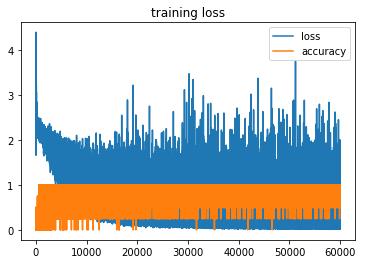

In [6]:
#plotting train_loss_accuracy list to get train loss curve
plt.plot(train_loss_accuracy)
plt.title("training loss")
plt.legend(['loss','accuracy'])

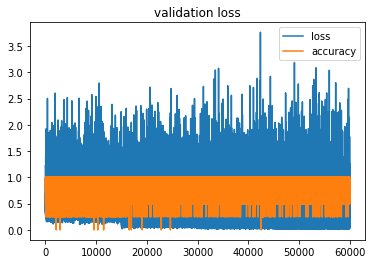

In [7]:
#plotting eval_loss_accuracy list to get eval loss curve
plt.plot(eval_loss_accuracy)
plt.title("validation loss")
plt.legend(['loss','accuracy'])

In [8]:
#shuffling data to get random
test_loader = torch.utils.data.DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)

for batch_no, (images, labels) in enumerate(test_loader):
    #calling net.predict to predict
    scores, predicted_labels = net.predict(torch.reshape(images, (batch_size, N_in)))
    print("expected labels:")
    print(labels)
    print("predicted labels:")
    print(predicted_labels)
    break

expected labels:
tensor([6, 5, 1, 7])
predicted labels:
tensor([6, 5, 1, 7])
